In [1]:
import pickle
from os import listdir
from os.path import isfile, join
import sys
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

In [4]:
mypath =  "../../Downloads/bigdata1_dataset_CS298/malware_dict/"

In [5]:
directories = listdir("../../Downloads/bigdata1_dataset_CS298/malware_dict/")

In [6]:
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [11]:
for directory in directories:
    pathToDir = mypath+directory+"/"
    with open(pathToDir+"top.txt",'rb') as f:
        dictionary = pickle.load(f,encoding='latin1')
        print(len(dictionary))
        

1500
921
1500
1500
1169
1500
1500
1500
336
1500
1500
1500
1500
1500
1500
1012
1500
985
1500
1500
1500
1500
1500
1500
1500
1500
1500
1500
1500


In [16]:
print(len(directories))

29


In [7]:
count = 0
for directory in directories:
    pathToDir = mypath+directory+"/"
    onlyfiles = [f for f in listdir(pathToDir) if isfile(join(pathToDir, f))]
    print(directory +" & " +str(len(onlyfiles)) + " \\" + "\\")
    count = count+len(onlyfiles)
print(count)

vobfus & 1001 \\
lolyda & 1001 \\
ceeinject & 1001 \\
cycbot & 1001 \\
bho & 1001 \\
zbot & 1002 \\
lollipop & 1001 \\
fakerean & 1001 \\
kelihos & 1001 \\
alureon & 1001 \\
ramnit & 1001 \\
hupigon & 1001 \\
winwebsec & 1002 \\
renos & 1001 \\
vundo & 1001 \\
hotbar & 1001 \\
vbinject & 1001 \\
adload & 1001 \\
bifrose & 1001 \\
agent & 1001 \\
startpage & 1001 \\
delfinject & 1001 \\
obfuscator & 1001 \\
zeroaccess & 1002 \\
zegost & 1001 \\
rbot & 1001 \\
gatak & 1001 \\
onlinegames & 1001 \\
injector & 1001 \\
29032


In [8]:
# Dictionary = {}
# flag = 0
# for directory in directories:
#     pathToDir = mypath+directory+"/"
#     with open(pathToDir+"top.txt",'rb') as f:
#         d = pickle.load(f,encoding='latin1')
#         if flag == 0:
#             Dictionary = d
#             flag = 1
#         else :
#             for key,value in d.items():
#                 if key in Dictionary:
#                     Dictionary[key] = Dictionary[key] + value
#                 else :
#                     Dictionary[key] = value

In [9]:
# K = 1000

In [10]:
# featureVectorTopK = sorted(Dictionary.items(), key=lambda kv: kv[1],reverse=True)[:K]

In [11]:
# print(featureVectorTopK)

In [12]:
# dataset = []
# for directory in directories:
#     pathToDir = mypath+directory+"/"
#     fileName = [pathToDir+f for f in listdir(pathToDir) if isfile(join(pathToDir, f))]
#     for filePath in fileName:
#         dictionaryOfNgram = {}
#         with open(filePath,"rb") as f:
#             dictionaryOfNgram = pickle.load(f,encoding='latin1')
#         vectorForSample = []
#         for ngram_tuple in featureVectorTopK:
#             if (ngram_tuple[0] in dictionaryOfNgram.keys()):
#                 vectorForSample.append(dictionaryOfNgram[ngram_tuple[0]])
#             else:
#                 vectorForSample.append(0)
#         sumOfRow = sum(vectorForSample)
#         for i in range(0,len(vectorForSample)):
#             vectorForSample[i] = float(vectorForSample[i]) / sumOfRow
#         vectorForSample = [directory] + vectorForSample
#         dataset.append(vectorForSample)

In [13]:
# print(len(dataset))

In [14]:
# print(dataset[0])

In [15]:
# print(dataset)

In [16]:
# dataset_Tmp = pd.DataFrame(dataset,columns=["Family Name"]+[i for i in range(1,K+1)])
# dataset_Tmp.to_csv("../dataset/bigdata1/top1000_bigdata1.csv",sep="\t")

In [8]:
dataset_dataframe = pd.read_csv("../dataset/bigdata1/top1000_bigdata1.csv",sep="\t")
dataset_dataframe.head()

,Unnamed: 0,Family Name,1,2,3,4,5,6,7,8,...,991,992,993,994,995,996,997,998,999,1000
0,0,vobfus,0.161217,0.142666,0.058180,0.008559,0.000000,0.004410,0.007263,0.013166,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,vobfus,0.335831,0.111819,0.023257,0.002638,0.003637,0.007130,0.008142,0.016115,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,vobfus,0.215399,0.103113,0.067630,0.014031,0.005303,0.005638,0.013526,0.011528,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,vobfus,0.259472,0.080973,0.059598,0.010809,0.009412,0.008873,0.011053,0.013322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,vobfus,0.222228,0.120731,0.012010,0.000000,0.004476,0.003771,0.005539,0.013656,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
dataset = np.array(dataset_dataframe.iloc[:,2:])

In [10]:
print(len(dataset))

17017


In [11]:
y = np.array(dataset_dataframe.loc[:,"Family Name"])

In [12]:
TopFamilyName = ['vobfus', 'lolyda', 'ceeinject', 'cycbot', 'bho', 'fakerean', 'alureon', 'renos', 'vundo', 'hotbar', 'adload', 'agent', 'startpage', 'delfinject', 'obfuscator', 'rbot', 'onlinegames']
topfam = set(TopFamilyName) 
label = []
for familyname in y:
    if familyname in topfam:
        for name_index in range(0,len(TopFamilyName)):
            if familyname == TopFamilyName[name_index]:
                label.append(name_index)
    else :
        label.append(len(TopFamilyName))
label = np.array(label)

In [13]:
print(len(dataset))

17017


In [14]:
# avg_scores_knn = [0 for i in range(0,10)]
# n_itr = 5
# for itr in range(0,n_itr):
#     # Dividing the dataset into various sub-dataset
#     skf = StratifiedKFold(n_splits=10,shuffle=True)
#     subDatasetIndex = []
#     for train_index, test_index in skf.split(dataset,label):
#         subDatasetIndex.append(test_index)
#     # Verifying the whether the total is equal to total dataset
#     sum = 0;
#     for elem in subDatasetIndex:
#         print(len(elem))
#         sum = sum+len(elem)

#     MeanScoreForAll = []
#     sizeOfEachDataset = []
#     for i in range(1,11):
#         X = []
#         Y = []
#         tmp_sizeOfEachDataset_sum = 0;
#         for j in range (0,i):
#             tmp_sizeOfEachDataset_sum = tmp_sizeOfEachDataset_sum + len(subDatasetIndex[j])
#             for rowIndex in subDatasetIndex[j]:
#                 X.append(dataset[rowIndex])
#                 Y.append(label[rowIndex])
#         sizeOfEachDataset.append(tmp_sizeOfEachDataset_sum)
#         X = np.array(X)
#         Y = np.array(Y)
#         mean_accuracy_array = []
#         k_range = range(1, 31)
#         k_scores = []
#         # 1. we will loop through reasonable values of k
#         for k in k_range:
#             # 2. run KNeighborsClassifier with k neighbours
#             knn = KNeighborsClassifier(n_neighbors=k)
#             # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
#             cv = StratifiedKFold(n_splits=10,shuffle=True)
#             scores = cross_val_score(knn, X, Y, cv=cv, scoring='accuracy')
#             # 4. append mean of scores for k neighbors to k_scores list
#             k_scores.append(scores.mean())
#         print("For i = " + str(i))
#         print("Scores For K ranging from 1 to 30 \n" + str(k_scores))
#         highestAccuracy_k = (k_scores.index(max(k_scores))+1)
#         print("K with highest accuracy and its accuracy : " + str(highestAccuracy_k) +" , " + str(k_scores[highestAccuracy_k-1]))
#         mean_accuracy_array.append(k_scores[highestAccuracy_k-1])
#         mean = np.mean(mean_accuracy_array)
#         MeanScoreForAll.append(mean)
#         print("Mean Accuracy : " + str(mean))
#         print("\n\n")
#     for i in range(0,len(MeanScoreForAll)):
#         avg_scores_knn[i] = avg_scores_knn[i]+MeanScoreForAll[i]

In [15]:
# for score in avg_scores_knn:
#     print((score*100)/5)

In [16]:
# tmp = avg_scores_knn
# for i in range(0,len(avg_scores_knn)):
#     avg_scores_knn[i] = avg_scores_knn[i] / n_itr
# print(avg_scores_knn)

In [17]:
X_train, X_test, y_train, y_test = train_test_split(dataset, label, test_size=0.1)

In [18]:
print(len(X_train[0]))

1000


In [ ]:
# Trial and error
# valuesOfEpochs = [5,10,50,100,200,500,1000]
# valuesOfTestSize = [0.1,0.2,0.3]
valuesOfEpochs = [1000]
valuesOfTestSize = [0.1,0.2,0.3]
overAllY = []
n_itr = 5
for v in valuesOfTestSize:
    for e in valuesOfEpochs:
        sizeOfEachDataset = []
        accForVariousSize = [0 for i in range (0,10)]
        lossForVariousSize = [0 for i in range(0,10)]
        for itr in range(0,n_itr):
            print(str(v) + ", "+str(e) + ", "+str(itr))
            # Dividing the dataset into various sub-dataset
            skf = StratifiedKFold(n_splits=10,shuffle=True)
            subDatasetIndex = []
            for train_index, test_index in skf.split(dataset,label):
                subDatasetIndex.append(test_index)
                
            for i in range(1,11):
                print("------" + str(i) + "--------")
                X = []
                Y = []
                tmp_sizeOfEachDataset_sum = 0;
                for j in range (0,i):
                    tmp_sizeOfEachDataset_sum = tmp_sizeOfEachDataset_sum + len(subDatasetIndex[j])
                    for rowIndex in subDatasetIndex[j]:
                        X.append(dataset[rowIndex])
                        Y.append(label[rowIndex])
                sizeOfEachDataset.append(tmp_sizeOfEachDataset_sum)
                X = np.array(X)
                Y = np.array(Y)
                X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=v)
                model = keras.Sequential()
                model.add(keras.layers.Dense(128,activation='relu',kernel_initializer='random_normal',input_dim=1000))
                model.add(keras.layers.Dense(128,activation='relu',kernel_initializer='random_normal'))
                model.add(keras.layers.Dense(17, activation='sigmoid', kernel_initializer='random_normal'))
                model.compile(optimizer='adam', 
                          loss='sparse_categorical_crossentropy',
                          metrics=['accuracy'])
                model.fit(X_train, y_train, epochs=e)
                loss, acc = model.evaluate(X_test,y_test)
                accForVariousSize[i-1] = accForVariousSize[i-1] + acc
                lossForVariousSize[i-1] = lossForVariousSize[i-1] + loss
        print(accForVariousSize)
            
        for i in range(0,10):
            accForVariousSize[i] = accForVariousSize[i] / n_itr
            lossForVariousSize[i] = lossForVariousSize[i] / n_itr
        overAllY.append(accForVariousSize)

0.1, 1000, 0
------1--------
Instructions for updating:
Colocations handled automatically by placer.
Epoch 1/1000
1545/1545 [==============================] - 2s 1ms/sample - loss: 2.8269 - acc: 0.1146
Epoch 2/1000
1545/1545 [==============================] - 1s 672us/sample - loss: 2.7117 - acc: 0.2097
Epoch 3/1000
1545/1545 [==============================] - 1s 759us/sample - loss: 2.3933 - acc: 0.1929
Epoch 4/1000
1545/1545 [==============================] - 1s 638us/sample - loss: 2.1558 - acc: 0.3191
Epoch 5/1000
1545/1545 [==============================] - 1s 701us/sample - loss: 1.9358 - acc: 0.3896
Epoch 6/1000
1545/1545 [==============================] - 1s 694us/sample - loss: 1.7830 - acc: 0.4175
Epoch 7/1000
1545/1545 [==============================] - 1s 833us/sample - loss: 1.6554 - acc: 0.4550
Epoch 8/1000
1545/1545 [==============================] - 1s 581us/sample - loss: 1.5757 - acc: 0.4712
Epoch 9/1000
1545/1545 [==============================] - 1s 605us/sample - l

1545/1545 [==============================] - 1s 646us/sample - loss: 0.2240 - acc: 0.9353
Epoch 76/1000
1545/1545 [==============================] - 1s 733us/sample - loss: 0.2129 - acc: 0.9392
Epoch 77/1000
1545/1545 [==============================] - 1s 638us/sample - loss: 0.2142 - acc: 0.9417
Epoch 78/1000
1545/1545 [==============================] - 1s 657us/sample - loss: 0.2054 - acc: 0.9469
Epoch 79/1000
1545/1545 [==============================] - 1s 719us/sample - loss: 0.2009 - acc: 0.9450
Epoch 80/1000
1545/1545 [==============================] - 1s 608us/sample - loss: 0.1986 - acc: 0.9495
Epoch 81/1000
1545/1545 [==============================] - 1s 781us/sample - loss: 0.1983 - acc: 0.9553s - loss: 0.2024 - acc:
Epoch 82/1000
1545/1545 [==============================] - 1s 610us/sample - loss: 0.1957 - acc: 0.9476
Epoch 83/1000
1545/1545 [==============================] - 1s 770us/sample - loss: 0.1890 - acc: 0.9482
Epoch 84/1000
1545/1545 [==============================

1545/1545 [==============================] - 1s 665us/sample - loss: 0.0624 - acc: 0.9864
Epoch 153/1000
1545/1545 [==============================] - 1s 739us/sample - loss: 0.0622 - acc: 0.9877
Epoch 154/1000
1545/1545 [==============================] - 1s 825us/sample - loss: 0.0626 - acc: 0.9845
Epoch 155/1000
1545/1545 [==============================] - 1s 700us/sample - loss: 0.0605 - acc: 0.9877s - loss: 0.0599 - acc: 
Epoch 156/1000
1545/1545 [==============================] - 1s 826us/sample - loss: 0.0597 - acc: 0.9864
Epoch 157/1000
1545/1545 [==============================] - 1s 775us/sample - loss: 0.0554 - acc: 0.9890
Epoch 158/1000
1545/1545 [==============================] - 1s 830us/sample - loss: 0.0539 - acc: 0.9883
Epoch 159/1000
1545/1545 [==============================] - 1s 725us/sample - loss: 0.0610 - acc: 0.9858
Epoch 160/1000
1545/1545 [==============================] - 1s 679us/sample - loss: 0.0513 - acc: 0.9883
Epoch 161/1000
1545/1545 [====================

Epoch 229/1000
1545/1545 [==============================] - 1s 701us/sample - loss: 0.0287 - acc: 0.9916
Epoch 230/1000
1545/1545 [==============================] - 1s 730us/sample - loss: 0.0249 - acc: 0.9948
Epoch 231/1000
1545/1545 [==============================] - 1s 662us/sample - loss: 0.0269 - acc: 0.9929
Epoch 232/1000
1545/1545 [==============================] - 1s 693us/sample - loss: 0.0276 - acc: 0.9935
Epoch 233/1000
1545/1545 [==============================] - 1s 788us/sample - loss: 0.0303 - acc: 0.9916
Epoch 234/1000
1545/1545 [==============================] - 1s 716us/sample - loss: 0.0283 - acc: 0.9916
Epoch 235/1000
1545/1545 [==============================] - 1s 671us/sample - loss: 0.0259 - acc: 0.9929
Epoch 236/1000
1545/1545 [==============================] - 1s 649us/sample - loss: 0.0276 - acc: 0.9903
Epoch 237/1000
1545/1545 [==============================] - 1s 412us/sample - loss: 0.0289 - acc: 0.9922
Epoch 238/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 764us/sample - loss: 0.0184 - acc: 0.9942
Epoch 307/1000
1545/1545 [==============================] - 1s 761us/sample - loss: 0.0195 - acc: 0.9929
Epoch 308/1000
1545/1545 [==============================] - 1s 634us/sample - loss: 0.0223 - acc: 0.9922
Epoch 309/1000
1545/1545 [==============================] - 1s 549us/sample - loss: 0.0229 - acc: 0.9922
Epoch 310/1000
1545/1545 [==============================] - 1s 818us/sample - loss: 0.0218 - acc: 0.9929
Epoch 311/1000
1545/1545 [==============================] - 1s 718us/sample - loss: 0.0221 - acc: 0.9929
Epoch 312/1000
1545/1545 [==============================] - 1s 765us/sample - loss: 0.0183 - acc: 0.9955
Epoch 313/1000
1545/1545 [==============================] - 1s 669us/sample - loss: 0.0337 - acc: 0.9903s - loss: 0.0415 - a
Epoch 314/1000
1545/1545 [==============================] - 1s 773us/sample - loss: 0.0234 - acc: 0.9935
Epoch 315/1000
1545/1545 [========================

1545/1545 [==============================] - 1s 762us/sample - loss: 0.0197 - acc: 0.9948
Epoch 383/1000
1545/1545 [==============================] - 1s 751us/sample - loss: 0.0160 - acc: 0.9942
Epoch 384/1000
1545/1545 [==============================] - 1s 730us/sample - loss: 0.0130 - acc: 0.9948
Epoch 385/1000
1545/1545 [==============================] - 1s 733us/sample - loss: 0.0146 - acc: 0.9948
Epoch 386/1000
1545/1545 [==============================] - 1s 658us/sample - loss: 0.0227 - acc: 0.9929s - loss: 0.0286
Epoch 387/1000
1545/1545 [==============================] - 1s 837us/sample - loss: 0.0266 - acc: 0.9916
Epoch 388/1000
1545/1545 [==============================] - 1s 666us/sample - loss: 0.0169 - acc: 0.9942
Epoch 389/1000
1545/1545 [==============================] - 1s 597us/sample - loss: 0.0140 - acc: 0.9955
Epoch 390/1000
1545/1545 [==============================] - 1s 771us/sample - loss: 0.0130 - acc: 0.9961
Epoch 391/1000
1545/1545 [============================

1545/1545 [==============================] - 1s 661us/sample - loss: 0.0155 - acc: 0.9948
Epoch 460/1000
1545/1545 [==============================] - 1s 720us/sample - loss: 0.0143 - acc: 0.9948
Epoch 461/1000
1545/1545 [==============================] - 1s 804us/sample - loss: 0.0123 - acc: 0.9948: 1s - loss: 0.00
Epoch 462/1000
1545/1545 [==============================] - 1s 764us/sample - loss: 0.0160 - acc: 0.9948
Epoch 463/1000
1545/1545 [==============================] - 1s 678us/sample - loss: 0.0134 - acc: 0.9955
Epoch 464/1000
1545/1545 [==============================] - 1s 697us/sample - loss: 0.0132 - acc: 0.9948
Epoch 465/1000
1545/1545 [==============================] - 1s 683us/sample - loss: 0.0124 - acc: 0.9961
Epoch 466/1000
1545/1545 [==============================] - 1s 722us/sample - loss: 0.0175 - acc: 0.9935
Epoch 467/1000
1545/1545 [==============================] - 1s 717us/sample - loss: 0.0113 - acc: 0.9961s - loss: 0.0094 - ac
Epoch 468/1000
1545/1545 [======

1545/1545 [==============================] - 1s 823us/sample - loss: 0.0153 - acc: 0.9955
Epoch 536/1000
1545/1545 [==============================] - 1s 607us/sample - loss: 0.0124 - acc: 0.9948A: 0s - loss: 0.0088 - ac
Epoch 537/1000
1545/1545 [==============================] - 1s 685us/sample - loss: 0.0123 - acc: 0.9948
Epoch 538/1000
1545/1545 [==============================] - 1s 669us/sample - loss: 0.0129 - acc: 0.9948
Epoch 539/1000
1545/1545 [==============================] - 1s 775us/sample - loss: 0.0101 - acc: 0.9968
Epoch 540/1000
1545/1545 [==============================] - 1s 750us/sample - loss: 0.0115 - acc: 0.9955
Epoch 541/1000
1545/1545 [==============================] - 1s 800us/sample - loss: 0.0153 - acc: 0.9942s - loss: 0.0155 - acc: 0.994
Epoch 542/1000
1545/1545 [==============================] - 1s 702us/sample - loss: 0.0123 - acc: 0.9955
Epoch 543/1000
1545/1545 [==============================] - 1s 618us/sample - loss: 0.0110 - acc: 0.9961
Epoch 544/1000
1

1545/1545 [==============================] - 1s 705us/sample - loss: 0.0094 - acc: 0.9968
Epoch 612/1000
1545/1545 [==============================] - 1s 868us/sample - loss: 0.0103 - acc: 0.9961s - loss: 0.0109 - ac
Epoch 613/1000
1545/1545 [==============================] - 1s 748us/sample - loss: 0.0158 - acc: 0.9942
Epoch 614/1000
1545/1545 [==============================] - 1s 638us/sample - loss: 0.0120 - acc: 0.9948
Epoch 615/1000
1545/1545 [==============================] - 1s 825us/sample - loss: 0.0126 - acc: 0.9948
Epoch 616/1000
1545/1545 [==============================] - 1s 884us/sample - loss: 0.0187 - acc: 0.9948
Epoch 617/1000
1545/1545 [==============================] - 1s 661us/sample - loss: 0.0110 - acc: 0.9961
Epoch 618/1000
1545/1545 [==============================] - 1s 683us/sample - loss: 0.0098 - acc: 0.9955
Epoch 619/1000
1545/1545 [==============================] - 1s 622us/sample - loss: 0.0118 - acc: 0.9955
Epoch 620/1000
1545/1545 [=======================

1545/1545 [==============================] - 1s 881us/sample - loss: 0.0088 - acc: 0.9961
Epoch 689/1000
1545/1545 [==============================] - 1s 763us/sample - loss: 0.0108 - acc: 0.9948
Epoch 690/1000
1545/1545 [==============================] - 1s 720us/sample - loss: 0.0112 - acc: 0.9968
Epoch 691/1000
1545/1545 [==============================] - 1s 631us/sample - loss: 0.0087 - acc: 0.9968
Epoch 692/1000
1545/1545 [==============================] - 1s 703us/sample - loss: 0.0127 - acc: 0.9948: 0s - loss: 0.01
Epoch 693/1000
1545/1545 [==============================] - 1s 743us/sample - loss: 0.0173 - acc: 0.9948s - loss: 0.0184 - acc: 0.99
Epoch 694/1000
1545/1545 [==============================] - 1s 678us/sample - loss: 0.0096 - acc: 0.9961
Epoch 695/1000
1545/1545 [==============================] - 1s 785us/sample - loss: 0.0086 - acc: 0.9974s - loss: 0.0074 - acc: 0.9
Epoch 696/1000
1545/1545 [==============================] - 1s 775us/sample - loss: 0.0113 - acc: 0.995

1545/1545 [==============================] - 1s 338us/sample - loss: 0.0093 - acc: 0.9974
Epoch 765/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 0.0094 - acc: 0.9974
Epoch 766/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0126 - acc: 0.9955
Epoch 767/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.0170 - acc: 0.9948
Epoch 768/1000
1545/1545 [==============================] - 1s 343us/sample - loss: 0.0133 - acc: 0.9955
Epoch 769/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.0099 - acc: 0.9955
Epoch 770/1000
1545/1545 [==============================] - 1s 356us/sample - loss: 0.0130 - acc: 0.9948
Epoch 771/1000
1545/1545 [==============================] - 1s 338us/sample - loss: 0.0094 - acc: 0.9961
Epoch 772/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.0112 - acc: 0.9961
Epoch 773/1000
1545/1545 [==============================] - 1s 347us/s

1545/1545 [==============================] - 1s 391us/sample - loss: 0.0077 - acc: 0.9968
Epoch 842/1000
1545/1545 [==============================] - 1s 340us/sample - loss: 0.0149 - acc: 0.9948
Epoch 843/1000
1545/1545 [==============================] - 1s 359us/sample - loss: 0.0119 - acc: 0.9948
Epoch 844/1000
1545/1545 [==============================] - 1s 330us/sample - loss: 0.0106 - acc: 0.9961
Epoch 845/1000
1545/1545 [==============================] - 0s 310us/sample - loss: 0.0076 - acc: 0.9981
Epoch 846/1000
1545/1545 [==============================] - 0s 322us/sample - loss: 0.0089 - acc: 0.9968
Epoch 847/1000
1545/1545 [==============================] - 1s 335us/sample - loss: 0.0115 - acc: 0.9961
Epoch 848/1000
1545/1545 [==============================] - 1s 345us/sample - loss: 0.0096 - acc: 0.9961
Epoch 849/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0104 - acc: 0.9968
Epoch 850/1000
1545/1545 [==============================] - 1s 357us/s

1545/1545 [==============================] - 0s 319us/sample - loss: 0.0083 - acc: 0.9968
Epoch 920/1000
1545/1545 [==============================] - 0s 314us/sample - loss: 0.0085 - acc: 0.9968
Epoch 921/1000
1545/1545 [==============================] - 0s 315us/sample - loss: 0.0161 - acc: 0.9929
Epoch 922/1000
1545/1545 [==============================] - 1s 337us/sample - loss: 0.0115 - acc: 0.9948
Epoch 923/1000
1545/1545 [==============================] - 1s 328us/sample - loss: 0.0163 - acc: 0.9942
Epoch 924/1000
1545/1545 [==============================] - 1s 329us/sample - loss: 0.0134 - acc: 0.9955
Epoch 925/1000
1545/1545 [==============================] - 0s 316us/sample - loss: 0.0094 - acc: 0.9961
Epoch 926/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0075 - acc: 0.9968
Epoch 927/1000
1545/1545 [==============================] - 1s 328us/sample - loss: 0.0070 - acc: 0.9974
Epoch 928/1000
1545/1545 [==============================] - 0s 313us/s

1545/1545 [==============================] - 1s 357us/sample - loss: 0.0075 - acc: 0.9974
Epoch 997/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0073 - acc: 0.9968
Epoch 998/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.0069 - acc: 0.9974
Epoch 999/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0068 - acc: 0.9974
Epoch 1000/1000
172/172 [==============================] - 0s 647us/sample - loss: 2.1313 - acc: 0.7849
------2--------
Epoch 1/1000
3075/3075 [==============================] - 1s 430us/sample - loss: 2.7468 - acc: 0.1109
Epoch 2/1000
3075/3075 [==============================] - 1s 331us/sample - loss: 2.3323 - acc: 0.1785
Epoch 3/1000
3075/3075 [==============================] - 1s 314us/sample - loss: 1.9773 - acc: 0.3971
Epoch 4/1000
3075/3075 [==============================] - 1s 326us/sample - loss: 1.6822 - acc: 0.4637
Epoch 5/1000
3075/3075 [==============================] - 1s 33

3075/3075 [==============================] - 1s 449us/sample - loss: 0.1830 - acc: 0.9496
Epoch 74/1000
3075/3075 [==============================] - 1s 367us/sample - loss: 0.1768 - acc: 0.9535
Epoch 75/1000
3075/3075 [==============================] - 1s 421us/sample - loss: 0.1883 - acc: 0.9480
Epoch 76/1000
3075/3075 [==============================] - 1s 414us/sample - loss: 0.1789 - acc: 0.9457
Epoch 77/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.1833 - acc: 0.9480
Epoch 78/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.1640 - acc: 0.9541
Epoch 79/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.1562 - acc: 0.9603
Epoch 80/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.1582 - acc: 0.9571
Epoch 81/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.1562 - acc: 0.9567
Epoch 82/1000
3075/3075 [==============================] - 1s 380us/sample - l

3075/3075 [==============================] - 1s 349us/sample - loss: 0.0556 - acc: 0.9837
Epoch 152/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0670 - acc: 0.9824
Epoch 153/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0496 - acc: 0.9854
Epoch 154/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0489 - acc: 0.9857
Epoch 155/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0512 - acc: 0.9867s - loss: 0.0
Epoch 156/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0477 - acc: 0.9876
Epoch 157/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0478 - acc: 0.9886
Epoch 158/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0486 - acc: 0.9857
Epoch 159/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0508 - acc: 0.9847
Epoch 160/1000
3075/3075 [==============================]

Epoch 229/1000
3075/3075 [==============================] - 1s 419us/sample - loss: 0.0314 - acc: 0.9899
Epoch 230/1000
3075/3075 [==============================] - 1s 405us/sample - loss: 0.0320 - acc: 0.9902
Epoch 231/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.0309 - acc: 0.9915
Epoch 232/1000
3075/3075 [==============================] - 1s 411us/sample - loss: 0.0305 - acc: 0.9899
Epoch 233/1000
3075/3075 [==============================] - 2s 624us/sample - loss: 0.0298 - acc: 0.9902
Epoch 234/1000
3075/3075 [==============================] - 1s 382us/sample - loss: 0.0348 - acc: 0.9899
Epoch 235/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0406 - acc: 0.9883
Epoch 236/1000
3075/3075 [==============================] - 1s 389us/sample - loss: 0.0304 - acc: 0.9906
Epoch 237/1000
3075/3075 [==============================] - 2s 616us/sample - loss: 0.0460 - acc: 0.9873
Epoch 238/1000
3075/3075 [=============================

3075/3075 [==============================] - 1s 235us/sample - loss: 0.0278 - acc: 0.9912
Epoch 307/1000
3075/3075 [==============================] - 1s 372us/sample - loss: 0.0290 - acc: 0.9893
Epoch 308/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0248 - acc: 0.9928
Epoch 309/1000
3075/3075 [==============================] - 1s 305us/sample - loss: 0.0235 - acc: 0.9912
Epoch 310/1000
3075/3075 [==============================] - 1s 294us/sample - loss: 0.0261 - acc: 0.9925
Epoch 311/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0266 - acc: 0.9915
Epoch 312/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0263 - acc: 0.9912
Epoch 313/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0259 - acc: 0.9922
Epoch 314/1000
3075/3075 [==============================] - 1s 321us/sample - loss: 0.0279 - acc: 0.9915
Epoch 315/1000
3075/3075 [==============================] - 1s 318us/s

3075/3075 [==============================] - 1s 370us/sample - loss: 0.0264 - acc: 0.9909
Epoch 384/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0236 - acc: 0.9925
Epoch 385/1000
3075/3075 [==============================] - 1s 381us/sample - loss: 0.0243 - acc: 0.9919
Epoch 386/1000
3075/3075 [==============================] - 1s 335us/sample - loss: 0.0237 - acc: 0.9928
Epoch 387/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0238 - acc: 0.9925
Epoch 388/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0220 - acc: 0.9925
Epoch 389/1000
3075/3075 [==============================] - 1s 324us/sample - loss: 0.0250 - acc: 0.9919
Epoch 390/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0242 - acc: 0.9912
Epoch 391/1000
3075/3075 [==============================] - 1s 321us/sample - loss: 0.0567 - acc: 0.9863
Epoch 392/1000
3075/3075 [==============================] - 1s 365us/s

3075/3075 [==============================] - 1s 332us/sample - loss: 0.0201 - acc: 0.9928
Epoch 462/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0207 - acc: 0.9935
Epoch 463/1000
3075/3075 [==============================] - 1s 321us/sample - loss: 0.0210 - acc: 0.9938
Epoch 464/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0229 - acc: 0.9928
Epoch 465/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0193 - acc: 0.9938
Epoch 466/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0235 - acc: 0.9922
Epoch 467/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0210 - acc: 0.9932
Epoch 468/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0221 - acc: 0.9922
Epoch 469/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0203 - acc: 0.9928
Epoch 470/1000
3075/3075 [==============================] - 1s 349us/s

3075/3075 [==============================] - 1s 342us/sample - loss: 0.0177 - acc: 0.9941
Epoch 540/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0176 - acc: 0.9938
Epoch 541/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0187 - acc: 0.9935
Epoch 542/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0181 - acc: 0.9938
Epoch 543/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0185 - acc: 0.9932
Epoch 544/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0202 - acc: 0.9922
Epoch 545/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0175 - acc: 0.9941
Epoch 546/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0195 - acc: 0.9941
Epoch 547/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0201 - acc: 0.9935
Epoch 548/1000
3075/3075 [==============================] - 1s 348us/s

3075/3075 [==============================] - 1s 355us/sample - loss: 0.0178 - acc: 0.9935
Epoch 618/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0214 - acc: 0.9925
Epoch 619/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0285 - acc: 0.9912
Epoch 620/1000
3075/3075 [==============================] - 1s 384us/sample - loss: 0.0248 - acc: 0.9915
Epoch 621/1000
3075/3075 [==============================] - 1s 376us/sample - loss: 0.0169 - acc: 0.9941
Epoch 622/1000
3075/3075 [==============================] - 1s 329us/sample - loss: 0.0173 - acc: 0.9938
Epoch 623/1000
3075/3075 [==============================] - 1s 327us/sample - loss: 0.0190 - acc: 0.9938
Epoch 624/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0180 - acc: 0.9938
Epoch 625/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0172 - acc: 0.9935
Epoch 626/1000
3075/3075 [==============================] - 1s 393us/s

3075/3075 [==============================] - 1s 345us/sample - loss: 0.0170 - acc: 0.9945
Epoch 696/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0168 - acc: 0.9945
Epoch 697/1000
3075/3075 [==============================] - 1s 329us/sample - loss: 0.0163 - acc: 0.9941
Epoch 698/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0168 - acc: 0.9938
Epoch 699/1000
3075/3075 [==============================] - 1s 324us/sample - loss: 0.0184 - acc: 0.9938
Epoch 700/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0178 - acc: 0.9935
Epoch 701/1000
3075/3075 [==============================] - 1s 336us/sample - loss: 0.0188 - acc: 0.9938
Epoch 702/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0176 - acc: 0.9935
Epoch 703/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0180 - acc: 0.9938
Epoch 704/1000
3075/3075 [==============================] - 1s 337us/s

3075/3075 [==============================] - 1s 304us/sample - loss: 0.0159 - acc: 0.9941
Epoch 774/1000
3075/3075 [==============================] - 1s 314us/sample - loss: 0.0166 - acc: 0.9941
Epoch 775/1000
3075/3075 [==============================] - 1s 335us/sample - loss: 0.0162 - acc: 0.9938
Epoch 776/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0184 - acc: 0.9938
Epoch 777/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0162 - acc: 0.9945
Epoch 778/1000
3075/3075 [==============================] - 1s 326us/sample - loss: 0.0156 - acc: 0.9945
Epoch 779/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0172 - acc: 0.9945
Epoch 780/1000
3075/3075 [==============================] - 1s 307us/sample - loss: 0.0163 - acc: 0.9938
Epoch 781/1000
3075/3075 [==============================] - 1s 313us/sample - loss: 0.0153 - acc: 0.9945
Epoch 782/1000
3075/3075 [==============================] - 1s 342us/s

3075/3075 [==============================] - 1s 367us/sample - loss: 0.0183 - acc: 0.9938
Epoch 851/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0152 - acc: 0.9945
Epoch 852/1000
3075/3075 [==============================] - 1s 329us/sample - loss: 0.0155 - acc: 0.9945
Epoch 853/1000
3075/3075 [==============================] - 1s 405us/sample - loss: 0.0167 - acc: 0.9945
Epoch 854/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0161 - acc: 0.9945
Epoch 855/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0164 - acc: 0.9945
Epoch 856/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0165 - acc: 0.9941
Epoch 857/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0164 - acc: 0.9938
Epoch 858/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0167 - acc: 0.9941
Epoch 859/1000
3075/3075 [==============================] - 1s 325us/s

3075/3075 [==============================] - 1s 316us/sample - loss: 0.0155 - acc: 0.9941
Epoch 928/1000
3075/3075 [==============================] - 1s 407us/sample - loss: 0.0157 - acc: 0.9941
Epoch 929/1000
3075/3075 [==============================] - 1s 414us/sample - loss: 0.0147 - acc: 0.9945
Epoch 930/1000
3075/3075 [==============================] - 1s 324us/sample - loss: 0.0147 - acc: 0.9948
Epoch 931/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0148 - acc: 0.9945
Epoch 932/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0164 - acc: 0.9938
Epoch 933/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0151 - acc: 0.9941
Epoch 934/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0158 - acc: 0.9935
Epoch 935/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0180 - acc: 0.9938
Epoch 936/1000
3075/3075 [==============================] - 1s 349us/s

4605/4605 [==============================] - 2s 344us/sample - loss: 1.6125 - acc: 0.4838
Epoch 4/1000
4605/4605 [==============================] - 2s 390us/sample - loss: 1.4193 - acc: 0.5694
Epoch 5/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 1.2530 - acc: 0.6376
Epoch 6/1000
4605/4605 [==============================] - 1s 309us/sample - loss: 1.1337 - acc: 0.6658
Epoch 7/1000
4605/4605 [==============================] - 1s 297us/sample - loss: 1.0412 - acc: 0.6932
Epoch 8/1000
4605/4605 [==============================] - 1s 292us/sample - loss: 0.9659 - acc: 0.7173
Epoch 9/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.9049 - acc: 0.7362
Epoch 10/1000
4605/4605 [==============================] - 1s 321us/sample - loss: 0.8554 - acc: 0.7405
Epoch 11/1000
4605/4605 [==============================] - 1s 321us/sample - loss: 0.8121 - acc: 0.7557
Epoch 12/1000
4605/4605 [==============================] - 2s 345us/sample - loss: 0

Epoch 82/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.1302 - acc: 0.9629
Epoch 83/1000
4605/4605 [==============================] - 2s 345us/sample - loss: 0.1245 - acc: 0.9655
Epoch 84/1000
4605/4605 [==============================] - 2s 341us/sample - loss: 0.1211 - acc: 0.9692
Epoch 85/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.1192 - acc: 0.9679
Epoch 86/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.1193 - acc: 0.9689
Epoch 87/1000
4605/4605 [==============================] - 2s 329us/sample - loss: 0.1132 - acc: 0.9698
Epoch 88/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.1136 - acc: 0.9700
Epoch 89/1000
4605/4605 [==============================] - 2s 327us/sample - loss: 0.1074 - acc: 0.9707
Epoch 90/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.1078 - acc: 0.9702
Epoch 91/1000
4605/4605 [==============================] - 2s 34

4605/4605 [==============================] - 1s 308us/sample - loss: 0.0451 - acc: 0.9874
Epoch 161/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0421 - acc: 0.9874
Epoch 162/1000
4605/4605 [==============================] - 1s 313us/sample - loss: 0.0419 - acc: 0.9872
Epoch 163/1000
4605/4605 [==============================] - 1s 317us/sample - loss: 0.0459 - acc: 0.9863
Epoch 164/1000
4605/4605 [==============================] - 2s 330us/sample - loss: 0.0420 - acc: 0.9878
Epoch 165/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0428 - acc: 0.9876
Epoch 166/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0404 - acc: 0.9874
Epoch 167/1000
4605/4605 [==============================] - 1s 314us/sample - loss: 0.0401 - acc: 0.9870
Epoch 168/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0392 - acc: 0.9887
Epoch 169/1000
4605/4605 [==============================] - 2s 330us/s

4605/4605 [==============================] - 2s 343us/sample - loss: 0.0327 - acc: 0.9900
Epoch 238/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0338 - acc: 0.9891
Epoch 239/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0306 - acc: 0.9902
Epoch 240/1000
4605/4605 [==============================] - 1s 313us/sample - loss: 0.0298 - acc: 0.9900
Epoch 241/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0324 - acc: 0.9898
Epoch 242/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0322 - acc: 0.9904
Epoch 243/1000
4605/4605 [==============================] - 2s 330us/sample - loss: 0.0324 - acc: 0.9902
Epoch 244/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0310 - acc: 0.9907
Epoch 245/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0357 - acc: 0.9885
Epoch 246/1000
4605/4605 [==============================] - 2s 340us/s

4605/4605 [==============================] - 1s 311us/sample - loss: 0.0276 - acc: 0.9902
Epoch 316/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.0276 - acc: 0.9911
Epoch 317/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.0298 - acc: 0.9911
Epoch 318/1000
4605/4605 [==============================] - 2s 331us/sample - loss: 0.0304 - acc: 0.9887
Epoch 319/1000
4605/4605 [==============================] - 2s 327us/sample - loss: 0.0270 - acc: 0.9909
Epoch 320/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0285 - acc: 0.9902
Epoch 321/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0280 - acc: 0.9911
Epoch 322/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0268 - acc: 0.9911
Epoch 323/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0296 - acc: 0.9902
Epoch 324/1000
4605/4605 [==============================] - 2s 333us/s

4605/4605 [==============================] - 1s 323us/sample - loss: 0.0263 - acc: 0.9907
Epoch 394/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0284 - acc: 0.9909
Epoch 395/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.0275 - acc: 0.9911
Epoch 396/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0249 - acc: 0.9915
Epoch 397/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0248 - acc: 0.9915
Epoch 398/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0238 - acc: 0.9917
Epoch 399/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0268 - acc: 0.9907
Epoch 400/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0261 - acc: 0.9911
Epoch 401/1000
4605/4605 [==============================] - 2s 331us/sample - loss: 0.0260 - acc: 0.9898
Epoch 402/1000
4605/4605 [==============================] - 2s 344us/s

4605/4605 [==============================] - 2s 339us/sample - loss: 0.0256 - acc: 0.9915
Epoch 471/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.0239 - acc: 0.9915
Epoch 472/1000
4605/4605 [==============================] - 2s 336us/sample - loss: 0.0234 - acc: 0.9915
Epoch 473/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0240 - acc: 0.9915
Epoch 474/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.0239 - acc: 0.9915
Epoch 475/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0234 - acc: 0.9920
Epoch 476/1000
4605/4605 [==============================] - 1s 318us/sample - loss: 0.0222 - acc: 0.9920
Epoch 477/1000
4605/4605 [==============================] - 1s 319us/sample - loss: 0.0258 - acc: 0.9909
Epoch 478/1000
4605/4605 [==============================] - 1s 317us/sample - loss: 0.0236 - acc: 0.9915
Epoch 479/1000
4605/4605 [==============================] - 2s 334us/s

4605/4605 [==============================] - 2s 331us/sample - loss: 0.0231 - acc: 0.9917
Epoch 549/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0227 - acc: 0.9915
Epoch 550/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.0240 - acc: 0.9913
Epoch 551/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0226 - acc: 0.9922
Epoch 552/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0255 - acc: 0.9911
Epoch 553/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.0241 - acc: 0.9913
Epoch 554/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0245 - acc: 0.9915
Epoch 555/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0243 - acc: 0.9911
Epoch 556/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0230 - acc: 0.9917
Epoch 557/1000
4605/4605 [==============================] - 1s 309us/s

4605/4605 [==============================] - 1s 313us/sample - loss: 0.0258 - acc: 0.9907
Epoch 627/1000
4605/4605 [==============================] - 1s 317us/sample - loss: 0.0203 - acc: 0.9920
Epoch 628/1000
4605/4605 [==============================] - 1s 304us/sample - loss: 0.0214 - acc: 0.9920
Epoch 629/1000
4605/4605 [==============================] - 1s 313us/sample - loss: 0.0218 - acc: 0.9920
Epoch 630/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0208 - acc: 0.9922
Epoch 631/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0291 - acc: 0.9898
Epoch 632/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0233 - acc: 0.9913
Epoch 633/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0231 - acc: 0.9920
Epoch 634/1000
4605/4605 [==============================] - 2s 337us/sample - loss: 0.0214 - acc: 0.9922
Epoch 635/1000
4605/4605 [==============================] - 2s 359us/s

Epoch 704/1000
4605/4605 [==============================] - 1s 296us/sample - loss: 0.0194 - acc: 0.9926
Epoch 705/1000
4605/4605 [==============================] - 1s 309us/sample - loss: 0.0216 - acc: 0.9913
Epoch 706/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0244 - acc: 0.9922
Epoch 707/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0209 - acc: 0.9924
Epoch 708/1000
4605/4605 [==============================] - 2s 380us/sample - loss: 0.0194 - acc: 0.9924
Epoch 709/1000
4605/4605 [==============================] - 2s 345us/sample - loss: 0.0218 - acc: 0.9917
Epoch 710/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0193 - acc: 0.9928
Epoch 711/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0212 - acc: 0.9920A: 1s - 
Epoch 712/1000
4605/4605 [==============================] - 1s 323us/sample - loss: 0.0228 - acc: 0.9920
Epoch 713/1000
4605/4605 [=====================

4605/4605 [==============================] - 2s 343us/sample - loss: 0.0270 - acc: 0.9911
Epoch 782/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0215 - acc: 0.9922
Epoch 783/1000
4605/4605 [==============================] - 1s 326us/sample - loss: 0.0197 - acc: 0.9922
Epoch 784/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.0198 - acc: 0.9917
Epoch 785/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0195 - acc: 0.9926
Epoch 786/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0190 - acc: 0.9920
Epoch 787/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0194 - acc: 0.9926
Epoch 788/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0209 - acc: 0.9922
Epoch 789/1000
4605/4605 [==============================] - 2s 336us/sample - loss: 0.0196 - acc: 0.9924
Epoch 790/1000
4605/4605 [==============================] - 2s 343us/s

4605/4605 [==============================] - 2s 327us/sample - loss: 0.0190 - acc: 0.9928
Epoch 860/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0207 - acc: 0.9920
Epoch 861/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0223 - acc: 0.9920
Epoch 862/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0197 - acc: 0.9922
Epoch 863/1000
4605/4605 [==============================] - 2s 405us/sample - loss: 0.0202 - acc: 0.9922
Epoch 864/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0207 - acc: 0.9922
Epoch 865/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0204 - acc: 0.9920
Epoch 866/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.0261 - acc: 0.9898
Epoch 867/1000
4605/4605 [==============================] - 2s 329us/sample - loss: 0.0207 - acc: 0.9924
Epoch 868/1000
4605/4605 [==============================] - 2s 331us/s

4605/4605 [==============================] - 2s 348us/sample - loss: 0.0187 - acc: 0.9928
Epoch 938/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0183 - acc: 0.9928
Epoch 939/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0191 - acc: 0.9922
Epoch 940/1000
4605/4605 [==============================] - 2s 330us/sample - loss: 0.0190 - acc: 0.9926
Epoch 941/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0187 - acc: 0.9928
Epoch 942/1000
4605/4605 [==============================] - 2s 341us/sample - loss: 0.0184 - acc: 0.9924
Epoch 943/1000
4605/4605 [==============================] - 2s 403us/sample - loss: 0.0191 - acc: 0.9926
Epoch 944/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0196 - acc: 0.9926
Epoch 945/1000
4605/4605 [==============================] - 1s 295us/sample - loss: 0.0194 - acc: 0.9924
Epoch 946/1000
4605/4605 [==============================] - 2s 329us/s

6135/6135 [==============================] - 2s 322us/sample - loss: 0.6115 - acc: 0.8264
Epoch 15/1000
6135/6135 [==============================] - 2s 311us/sample - loss: 0.5848 - acc: 0.8293
Epoch 16/1000
6135/6135 [==============================] - 2s 317us/sample - loss: 0.5654 - acc: 0.8347
Epoch 17/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.5426 - acc: 0.8419
Epoch 18/1000
6135/6135 [==============================] - 2s 374us/sample - loss: 0.5209 - acc: 0.8513
Epoch 19/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.5038 - acc: 0.8546
Epoch 20/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.4909 - acc: 0.8592
Epoch 21/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.4733 - acc: 0.8647
Epoch 22/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.4521 - acc: 0.8712
Epoch 23/1000
6135/6135 [==============================] - 2s 349us/sample - l

6135/6135 [==============================] - 2s 327us/sample - loss: 0.0984 - acc: 0.9733
Epoch 93/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0976 - acc: 0.9746
Epoch 94/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0970 - acc: 0.9738
Epoch 95/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0906 - acc: 0.9756
Epoch 96/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0901 - acc: 0.9756
Epoch 97/1000
6135/6135 [==============================] - 2s 319us/sample - loss: 0.0950 - acc: 0.9736
Epoch 98/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0883 - acc: 0.9767
Epoch 99/1000
6135/6135 [==============================] - 2s 313us/sample - loss: 0.0857 - acc: 0.9760
Epoch 100/1000
6135/6135 [==============================] - 2s 304us/sample - loss: 0.0854 - acc: 0.9773
Epoch 101/1000
6135/6135 [==============================] - 2s 309us/sample -

6135/6135 [==============================] - 2s 319us/sample - loss: 0.0483 - acc: 0.9860
Epoch 170/1000
6135/6135 [==============================] - 2s 326us/sample - loss: 0.0515 - acc: 0.9845
Epoch 171/1000
6135/6135 [==============================] - 2s 322us/sample - loss: 0.0479 - acc: 0.9850
Epoch 172/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0492 - acc: 0.9847
Epoch 173/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0464 - acc: 0.9858
Epoch 174/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0455 - acc: 0.9857
Epoch 175/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0479 - acc: 0.9852
Epoch 176/1000
6135/6135 [==============================] - 2s 307us/sample - loss: 0.0530 - acc: 0.9834
Epoch 177/1000
6135/6135 [==============================] - 2s 328us/sample - loss: 0.0493 - acc: 0.9857
Epoch 178/1000
6135/6135 [==============================] - 2s 347us/s

6135/6135 [==============================] - 2s 326us/sample - loss: 0.0401 - acc: 0.9857
Epoch 248/1000
6135/6135 [==============================] - 2s 313us/sample - loss: 0.0401 - acc: 0.9873
Epoch 249/1000
6135/6135 [==============================] - 2s 317us/sample - loss: 0.0390 - acc: 0.9876
Epoch 250/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0380 - acc: 0.9866
Epoch 251/1000
6135/6135 [==============================] - 2s 300us/sample - loss: 0.0372 - acc: 0.9886
Epoch 252/1000
6135/6135 [==============================] - 2s 310us/sample - loss: 0.0397 - acc: 0.9871
Epoch 253/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0451 - acc: 0.9861
Epoch 254/1000
6135/6135 [==============================] - 2s 320us/sample - loss: 0.0387 - acc: 0.9874
Epoch 255/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0382 - acc: 0.9874
Epoch 256/1000
6135/6135 [==============================] - 2s 322us/s

6135/6135 [==============================] - 2s 331us/sample - loss: 0.0373 - acc: 0.9884
Epoch 326/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0333 - acc: 0.9889
Epoch 327/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0351 - acc: 0.9874
Epoch 328/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0350 - acc: 0.9883
Epoch 329/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0336 - acc: 0.9886
Epoch 330/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.0410 - acc: 0.9873
Epoch 331/1000
6135/6135 [==============================] - 2s 322us/sample - loss: 0.0378 - acc: 0.9878
Epoch 332/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0364 - acc: 0.9884
Epoch 333/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0359 - acc: 0.9881
Epoch 334/1000
6135/6135 [==============================] - 2s 346us/s

6135/6135 [==============================] - 2s 331us/sample - loss: 0.0310 - acc: 0.9884
Epoch 404/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0323 - acc: 0.9888
Epoch 405/1000
6135/6135 [==============================] - 2s 369us/sample - loss: 0.0324 - acc: 0.9889
Epoch 406/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0329 - acc: 0.9879
Epoch 407/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0333 - acc: 0.9886
Epoch 408/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0361 - acc: 0.9888
Epoch 409/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0359 - acc: 0.9868
Epoch 410/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0340 - acc: 0.9886
Epoch 411/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0326 - acc: 0.9886
Epoch 412/1000
6135/6135 [==============================] - 2s 320us/s

6135/6135 [==============================] - 3s 432us/sample - loss: 0.0315 - acc: 0.9886
Epoch 482/1000
6135/6135 [==============================] - 3s 559us/sample - loss: 0.0331 - acc: 0.9879
Epoch 483/1000
6135/6135 [==============================] - 3s 490us/sample - loss: 0.0342 - acc: 0.9886
Epoch 484/1000
6135/6135 [==============================] - 2s 376us/sample - loss: 0.0425 - acc: 0.9852
Epoch 485/1000
6135/6135 [==============================] - 2s 332us/sample - loss: 0.0299 - acc: 0.9891
Epoch 486/1000
6135/6135 [==============================] - 2s 324us/sample - loss: 0.0299 - acc: 0.9892
Epoch 487/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0311 - acc: 0.9884
Epoch 488/1000
6135/6135 [==============================] - 2s 396us/sample - loss: 0.0302 - acc: 0.9889
Epoch 489/1000
6135/6135 [==============================] - 2s 337us/sample - loss: 0.0326 - acc: 0.9886
Epoch 490/1000
6135/6135 [==============================] - 2s 324us/s

6135/6135 [==============================] - 2s 322us/sample - loss: 0.0284 - acc: 0.9901
Epoch 560/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0280 - acc: 0.9901
Epoch 561/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0312 - acc: 0.9892
Epoch 562/1000
6135/6135 [==============================] - 2s 390us/sample - loss: 0.0310 - acc: 0.9886
Epoch 563/1000
6135/6135 [==============================] - 2s 330us/sample - loss: 0.0299 - acc: 0.9894
Epoch 564/1000
6135/6135 [==============================] - 2s 338us/sample - loss: 0.0302 - acc: 0.9894
Epoch 565/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0300 - acc: 0.9892
Epoch 566/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0299 - acc: 0.9894
Epoch 567/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0284 - acc: 0.9897
Epoch 568/1000
6135/6135 [==============================] - 2s 331us/s

6135/6135 [==============================] - 2s 334us/sample - loss: 0.0280 - acc: 0.9899
Epoch 638/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0276 - acc: 0.9899
Epoch 639/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0319 - acc: 0.9889
Epoch 640/1000
6135/6135 [==============================] - 2s 338us/sample - loss: 0.0291 - acc: 0.9897
Epoch 641/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0298 - acc: 0.9892
Epoch 642/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0277 - acc: 0.9902
Epoch 643/1000
6135/6135 [==============================] - 2s 348us/sample - loss: 0.0290 - acc: 0.9899
Epoch 644/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0290 - acc: 0.9894
Epoch 645/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0278 - acc: 0.9897
Epoch 646/1000
6135/6135 [==============================] - 2s 342us/s

6135/6135 [==============================] - 2s 323us/sample - loss: 0.0294 - acc: 0.9892
Epoch 716/1000
6135/6135 [==============================] - 2s 362us/sample - loss: 0.0291 - acc: 0.9886
Epoch 717/1000
6135/6135 [==============================] - 2s 348us/sample - loss: 0.0285 - acc: 0.9892
Epoch 718/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0298 - acc: 0.9892
Epoch 719/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0288 - acc: 0.9896
Epoch 720/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0308 - acc: 0.9888
Epoch 721/1000
6135/6135 [==============================] - 2s 337us/sample - loss: 0.0300 - acc: 0.9891
Epoch 722/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0304 - acc: 0.9891
Epoch 723/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0314 - acc: 0.9883
Epoch 724/1000
6135/6135 [==============================] - 2s 321us/s

6135/6135 [==============================] - 2s 365us/sample - loss: 0.0291 - acc: 0.9894
Epoch 794/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0287 - acc: 0.9896
Epoch 795/1000
6135/6135 [==============================] - 3s 420us/sample - loss: 0.0283 - acc: 0.9891
Epoch 796/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0286 - acc: 0.9899
Epoch 797/1000
6135/6135 [==============================] - 2s 337us/sample - loss: 0.0292 - acc: 0.9889
Epoch 798/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0364 - acc: 0.9878
Epoch 799/1000
6135/6135 [==============================] - 2s 338us/sample - loss: 0.0347 - acc: 0.9881
Epoch 800/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0306 - acc: 0.9897
Epoch 801/1000
6135/6135 [==============================] - 2s 335us/sample - loss: 0.0280 - acc: 0.9901
Epoch 802/1000
6135/6135 [==============================] - 2s 333us/s

6135/6135 [==============================] - ETA: 0s - loss: 0.0295 - acc: 0.989 - 2s 338us/sample - loss: 0.0292 - acc: 0.9894
Epoch 872/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0285 - acc: 0.9894
Epoch 873/1000
6135/6135 [==============================] - 2s 303us/sample - loss: 0.0281 - acc: 0.9896
Epoch 874/1000
6135/6135 [==============================] - 2s 335us/sample - loss: 0.0285 - acc: 0.9896
Epoch 875/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0303 - acc: 0.9889
Epoch 876/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0297 - acc: 0.9888
Epoch 877/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0312 - acc: 0.9886
Epoch 878/1000
6135/6135 [==============================] - 2s 369us/sample - loss: 0.0305 - acc: 0.9896
Epoch 879/1000
6135/6135 [==============================] - 2s 339us/sample - loss: 0.0282 - acc: 0.9892
Epoch 880/1000
6135/6135 [======

6135/6135 [==============================] - 2s 327us/sample - loss: 0.0289 - acc: 0.9892
Epoch 949/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0281 - acc: 0.9892
Epoch 950/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0280 - acc: 0.9901
Epoch 951/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0285 - acc: 0.9896
Epoch 952/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0281 - acc: 0.9905
Epoch 953/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0323 - acc: 0.9891
Epoch 954/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0292 - acc: 0.9899
Epoch 955/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0296 - acc: 0.9894
Epoch 956/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0286 - acc: 0.9894
Epoch 957/1000
6135/6135 [==============================] - 2s 345us/s

7665/7665 [==============================] - 3s 358us/sample - loss: 0.3743 - acc: 0.8917
Epoch 26/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.3563 - acc: 0.8988
Epoch 27/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.3485 - acc: 0.8975
Epoch 28/1000
7665/7665 [==============================] - 3s 355us/sample - loss: 0.3430 - acc: 0.8989
Epoch 29/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.3298 - acc: 0.9040
Epoch 30/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.3219 - acc: 0.9041
Epoch 31/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.3078 - acc: 0.9108
Epoch 32/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.3036 - acc: 0.9131
Epoch 33/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.2970 - acc: 0.9132
Epoch 34/1000
7665/7665 [==============================] - 2s 321us/sample - l

7665/7665 [==============================] - 3s 344us/sample - loss: 0.0897 - acc: 0.9734
Epoch 104/1000
7665/7665 [==============================] - 3s 409us/sample - loss: 0.0883 - acc: 0.9739
Epoch 105/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0926 - acc: 0.9725
Epoch 106/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0905 - acc: 0.9727
Epoch 107/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.0900 - acc: 0.9746
Epoch 108/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0899 - acc: 0.9729
Epoch 109/1000
7665/7665 [==============================] - 2s 323us/sample - loss: 0.0857 - acc: 0.9750
Epoch 110/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0899 - acc: 0.9738
Epoch 111/1000
7665/7665 [==============================] - 2s 323us/sample - loss: 0.0860 - acc: 0.9751
Epoch 112/1000
7665/7665 [==============================] - 3s 338us/s

7665/7665 [==============================] - 2s 324us/sample - loss: 0.0593 - acc: 0.9796
Epoch 181/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0566 - acc: 0.9821
Epoch 182/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0635 - acc: 0.9803
Epoch 183/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0602 - acc: 0.9807
Epoch 184/1000
7665/7665 [==============================] - 2s 321us/sample - loss: 0.0590 - acc: 0.9800
Epoch 185/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0617 - acc: 0.9803
Epoch 186/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0604 - acc: 0.9802
Epoch 187/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.0595 - acc: 0.9806
Epoch 188/1000
7665/7665 [==============================] - 2s 320us/sample - loss: 0.0623 - acc: 0.9790
Epoch 189/1000
7665/7665 [==============================] - 3s 342us/s

7665/7665 [==============================] - 3s 329us/sample - loss: 0.0532 - acc: 0.9819
Epoch 258/1000
7665/7665 [==============================] - 3s 328us/sample - loss: 0.0508 - acc: 0.9832
Epoch 259/1000
7665/7665 [==============================] - 2s 313us/sample - loss: 0.0520 - acc: 0.9820
Epoch 260/1000
7665/7665 [==============================] - 2s 321us/sample - loss: 0.0553 - acc: 0.9819
Epoch 261/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0583 - acc: 0.9806
Epoch 262/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0530 - acc: 0.9823
Epoch 263/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0548 - acc: 0.9820
Epoch 264/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.0514 - acc: 0.9829
Epoch 265/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0522 - acc: 0.9825
Epoch 266/1000
7665/7665 [==============================] - 3s 358us/s

7665/7665 [==============================] - 3s 359us/sample - loss: 0.0498 - acc: 0.9830
Epoch 336/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0480 - acc: 0.9836
Epoch 337/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0482 - acc: 0.9834
Epoch 338/1000
7665/7665 [==============================] - 3s 378us/sample - loss: 0.0503 - acc: 0.9838
Epoch 339/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0515 - acc: 0.9838
Epoch 340/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0482 - acc: 0.9841
Epoch 341/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0505 - acc: 0.9836
Epoch 342/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0500 - acc: 0.9832
Epoch 343/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.0500 - acc: 0.9838
Epoch 344/1000
7665/7665 [==============================] - 3s 332us/s

7665/7665 [==============================] - 3s 343us/sample - loss: 0.0447 - acc: 0.9849
Epoch 414/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0489 - acc: 0.9833
Epoch 415/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0454 - acc: 0.9847
Epoch 416/1000
7665/7665 [==============================] - 2s 323us/sample - loss: 0.0460 - acc: 0.9846
Epoch 417/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0478 - acc: 0.9843
Epoch 418/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0437 - acc: 0.9849
Epoch 419/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0444 - acc: 0.9849
Epoch 420/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0452 - acc: 0.9850
Epoch 421/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0490 - acc: 0.9841
Epoch 422/1000
7665/7665 [==============================] - 3s 329us/s

7665/7665 [==============================] - 3s 343us/sample - loss: 0.0455 - acc: 0.9849
Epoch 492/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0515 - acc: 0.9838
Epoch 493/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0453 - acc: 0.9838
Epoch 494/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0457 - acc: 0.9845
Epoch 495/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0444 - acc: 0.9847
Epoch 496/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0440 - acc: 0.9850
Epoch 497/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0433 - acc: 0.9853
Epoch 498/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0434 - acc: 0.9856
Epoch 499/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0569 - acc: 0.9808
Epoch 500/1000
7665/7665 [==============================] - 3s 330us/s

7665/7665 [==============================] - 3s 335us/sample - loss: 0.0508 - acc: 0.9834
Epoch 570/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0435 - acc: 0.9850
Epoch 571/1000
7665/7665 [==============================] - 2s 298us/sample - loss: 0.0439 - acc: 0.9854
Epoch 572/1000
7665/7665 [==============================] - 2s 241us/sample - loss: 0.0435 - acc: 0.9855
Epoch 573/1000
7665/7665 [==============================] - 2s 294us/sample - loss: 0.0419 - acc: 0.9854
Epoch 574/1000
7665/7665 [==============================] - 3s 327us/sample - loss: 0.0431 - acc: 0.9854
Epoch 575/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0452 - acc: 0.9842
Epoch 576/1000
7665/7665 [==============================] - 2s 324us/sample - loss: 0.0420 - acc: 0.9858
Epoch 577/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0428 - acc: 0.9849
Epoch 578/1000
7665/7665 [==============================] - 3s 332us/s

7665/7665 [==============================] - 3s 341us/sample - loss: 0.0417 - acc: 0.9856
Epoch 648/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0417 - acc: 0.9859
Epoch 649/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0420 - acc: 0.9855
Epoch 650/1000
7665/7665 [==============================] - 3s 328us/sample - loss: 0.0408 - acc: 0.9858
Epoch 651/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0481 - acc: 0.9842
Epoch 652/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0448 - acc: 0.9843
Epoch 653/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0444 - acc: 0.9856
Epoch 654/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0427 - acc: 0.9856
Epoch 655/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0425 - acc: 0.9850
Epoch 656/1000
7665/7665 [==============================] - 3s 350us/s

7665/7665 [==============================] - 3s 354us/sample - loss: 0.0427 - acc: 0.9851
Epoch 726/1000
7665/7665 [==============================] - 3s 442us/sample - loss: 0.0430 - acc: 0.9850
Epoch 727/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0421 - acc: 0.9856
Epoch 728/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0433 - acc: 0.9850
Epoch 729/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0426 - acc: 0.9851
Epoch 730/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0428 - acc: 0.9855
Epoch 731/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0423 - acc: 0.9854
Epoch 732/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0419 - acc: 0.9854
Epoch 733/1000
7665/7665 [==============================] - 3s 326us/sample - loss: 0.0436 - acc: 0.9853
Epoch 734/1000
7665/7665 [==============================] - 3s 334us/s

7665/7665 [==============================] - 3s 373us/sample - loss: 0.0438 - acc: 0.9847
Epoch 804/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0412 - acc: 0.9862
Epoch 805/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.0423 - acc: 0.9851
Epoch 806/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0438 - acc: 0.9850
Epoch 807/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0433 - acc: 0.9849
Epoch 808/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0395 - acc: 0.9859
Epoch 809/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0397 - acc: 0.9864
Epoch 810/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0424 - acc: 0.9856
Epoch 811/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0402 - acc: 0.9864
Epoch 812/1000
7665/7665 [==============================] - 3s 395us/s

7665/7665 [==============================] - 3s 355us/sample - loss: 0.0404 - acc: 0.9858
Epoch 882/1000
7665/7665 [==============================] - 3s 330us/sample - loss: 0.0402 - acc: 0.9855
Epoch 883/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0404 - acc: 0.9855
Epoch 884/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0399 - acc: 0.9867
Epoch 885/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0424 - acc: 0.9858
Epoch 886/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0415 - acc: 0.9855
Epoch 887/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0420 - acc: 0.9855
Epoch 888/1000
7665/7665 [==============================] - 2s 322us/sample - loss: 0.0420 - acc: 0.9854
Epoch 889/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0400 - acc: 0.9856
Epoch 890/1000
7665/7665 [==============================] - 3s 347us/s

7665/7665 [==============================] - 3s 359us/sample - loss: 0.0408 - acc: 0.9860
Epoch 960/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0401 - acc: 0.9859
Epoch 961/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0397 - acc: 0.9859
Epoch 962/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0398 - acc: 0.9862
Epoch 963/1000
7665/7665 [==============================] - 2s 320us/sample - loss: 0.0507 - acc: 0.9838
Epoch 964/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0436 - acc: 0.9855
Epoch 965/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0393 - acc: 0.9863
Epoch 966/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0393 - acc: 0.9863
Epoch 967/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0400 - acc: 0.9863
Epoch 968/1000
7665/7665 [==============================] - 2s 324us/s

9195/9195 [==============================] - 3s 357us/sample - loss: 0.2674 - acc: 0.9214
Epoch 37/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.2618 - acc: 0.9247
Epoch 38/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.2574 - acc: 0.9240
Epoch 39/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.2498 - acc: 0.9256
Epoch 40/1000
9195/9195 [==============================] - 3s 338us/sample - loss: 0.2410 - acc: 0.9295
Epoch 41/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.2402 - acc: 0.9301
Epoch 42/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.2297 - acc: 0.9331
Epoch 43/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.2267 - acc: 0.9338
Epoch 44/1000
9195/9195 [==============================] - 3s 350us/sample - loss: 0.2207 - acc: 0.9350
Epoch 45/1000
9195/9195 [==============================] - 3s 330us/sample - l

9195/9195 [==============================] - 2s 229us/sample - loss: 0.0782 - acc: 0.9762
Epoch 115/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0794 - acc: 0.9755
Epoch 116/1000
9195/9195 [==============================] - 2s 239us/sample - loss: 0.0761 - acc: 0.9773
Epoch 117/1000
9195/9195 [==============================] - 2s 240us/sample - loss: 0.0745 - acc: 0.9765
Epoch 118/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0729 - acc: 0.9787
Epoch 119/1000
9195/9195 [==============================] - 2s 248us/sample - loss: 0.0748 - acc: 0.9764
Epoch 120/1000
9195/9195 [==============================] - 2s 239us/sample - loss: 0.0742 - acc: 0.9768
Epoch 121/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0699 - acc: 0.9794
Epoch 122/1000
9195/9195 [==============================] - 2s 247us/sample - loss: 0.0721 - acc: 0.9772
Epoch 123/1000
9195/9195 [==============================] - 2s 249us/s

9195/9195 [==============================] - 2s 241us/sample - loss: 0.0512 - acc: 0.9830
Epoch 193/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0470 - acc: 0.9839
Epoch 194/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0493 - acc: 0.9835
Epoch 195/1000
9195/9195 [==============================] - 2s 246us/sample - loss: 0.0492 - acc: 0.9840
Epoch 196/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0489 - acc: 0.9839
Epoch 197/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0508 - acc: 0.9833
Epoch 198/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0487 - acc: 0.9840
Epoch 199/1000
9195/9195 [==============================] - 2s 238us/sample - loss: 0.0500 - acc: 0.9834
Epoch 200/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0505 - acc: 0.9835
Epoch 201/1000
9195/9195 [==============================] - 2s 231us/s

9195/9195 [==============================] - 2s 231us/sample - loss: 0.0422 - acc: 0.9856
Epoch 271/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0421 - acc: 0.9858
Epoch 272/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0423 - acc: 0.9852
Epoch 273/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0423 - acc: 0.9840
Epoch 274/1000
9195/9195 [==============================] - 2s 226us/sample - loss: 0.0456 - acc: 0.9842
Epoch 275/1000
9195/9195 [==============================] - 2s 225us/sample - loss: 0.0415 - acc: 0.9849
Epoch 276/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0432 - acc: 0.9855
Epoch 277/1000
9195/9195 [==============================] - 2s 244us/sample - loss: 0.0436 - acc: 0.9843
Epoch 278/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0411 - acc: 0.9858
Epoch 279/1000
9195/9195 [==============================] - 2s 228us/s

9195/9195 [==============================] - 2s 233us/sample - loss: 0.0387 - acc: 0.9866
Epoch 349/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0397 - acc: 0.9855
Epoch 350/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0421 - acc: 0.9848
Epoch 351/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0413 - acc: 0.9851
Epoch 352/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0386 - acc: 0.9859
Epoch 353/1000
9195/9195 [==============================] - 2s 247us/sample - loss: 0.0378 - acc: 0.9874
Epoch 354/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0407 - acc: 0.9858
Epoch 355/1000
9195/9195 [==============================] - 2s 229us/sample - loss: 0.0424 - acc: 0.9851
Epoch 356/1000
9195/9195 [==============================] - 2s 225us/sample - loss: 0.0419 - acc: 0.9849
Epoch 357/1000
9195/9195 [==============================] - 2s 227us/s

9195/9195 [==============================] - 2s 230us/sample - loss: 0.0357 - acc: 0.9867
Epoch 427/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0376 - acc: 0.9867
Epoch 428/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0382 - acc: 0.9864
Epoch 429/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0394 - acc: 0.9859
Epoch 430/1000
9195/9195 [==============================] - 2s 229us/sample - loss: 0.0354 - acc: 0.9873
Epoch 431/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0394 - acc: 0.9854
Epoch 432/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0424 - acc: 0.9853
Epoch 433/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0356 - acc: 0.9872
Epoch 434/1000
9195/9195 [==============================] - 2s 229us/sample - loss: 0.0363 - acc: 0.9868
Epoch 435/1000
9195/9195 [==============================] - 2s 235us/s

9195/9195 [==============================] - 2s 231us/sample - loss: 0.0369 - acc: 0.9869
Epoch 505/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0360 - acc: 0.9864
Epoch 506/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0352 - acc: 0.9878
Epoch 507/1000
9195/9195 [==============================] - 2s 225us/sample - loss: 0.0349 - acc: 0.9872
Epoch 508/1000
9195/9195 [==============================] - 2s 243us/sample - loss: 0.0355 - acc: 0.9865
Epoch 509/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0352 - acc: 0.9872
Epoch 510/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0364 - acc: 0.9867
Epoch 511/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0352 - acc: 0.9868
Epoch 512/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0362 - acc: 0.9864
Epoch 513/1000
9195/9195 [==============================] - 2s 246us/s

9195/9195 [==============================] - 2s 235us/sample - loss: 0.0357 - acc: 0.9869
Epoch 583/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0333 - acc: 0.9873
Epoch 584/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0355 - acc: 0.9872
Epoch 585/1000
9195/9195 [==============================] - 2s 247us/sample - loss: 0.0346 - acc: 0.9875
Epoch 586/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0336 - acc: 0.9868
Epoch 587/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0357 - acc: 0.9871
Epoch 588/1000
9195/9195 [==============================] - 2s 241us/sample - loss: 0.0341 - acc: 0.9869
Epoch 589/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0333 - acc: 0.9873
Epoch 590/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0364 - acc: 0.9867
Epoch 591/1000
9195/9195 [==============================] - 2s 235us/s

9195/9195 [==============================] - 2s 233us/sample - loss: 0.0319 - acc: 0.9879
Epoch 661/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0350 - acc: 0.9874
Epoch 662/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0315 - acc: 0.9884
Epoch 663/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0323 - acc: 0.9885
Epoch 664/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0328 - acc: 0.9876
Epoch 665/1000
9195/9195 [==============================] - 2s 229us/sample - loss: 0.0332 - acc: 0.9881
Epoch 666/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0396 - acc: 0.9860
Epoch 667/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0345 - acc: 0.9869
Epoch 668/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0339 - acc: 0.9878
Epoch 669/1000
9195/9195 [==============================] - 2s 247us/s

9195/9195 [==============================] - 2s 230us/sample - loss: 0.0315 - acc: 0.9879
Epoch 739/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0333 - acc: 0.9881
Epoch 740/1000
9195/9195 [==============================] - 2s 224us/sample - loss: 0.0349 - acc: 0.9875
Epoch 741/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0342 - acc: 0.9879
Epoch 742/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0314 - acc: 0.9884
Epoch 743/1000
9195/9195 [==============================] - 2s 227us/sample - loss: 0.0311 - acc: 0.9884
Epoch 744/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0325 - acc: 0.9877
Epoch 745/1000
9195/9195 [==============================] - 2s 240us/sample - loss: 0.0325 - acc: 0.9878
Epoch 746/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0336 - acc: 0.9874
Epoch 747/1000
9195/9195 [==============================] - 2s 232us/s

9195/9195 [==============================] - 2s 246us/sample - loss: 0.0350 - acc: 0.9876
Epoch 817/1000
9195/9195 [==============================] - 2s 239us/sample - loss: 0.0305 - acc: 0.9885
Epoch 818/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0308 - acc: 0.9884
Epoch 819/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0316 - acc: 0.9879
Epoch 820/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0306 - acc: 0.9888
Epoch 821/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0308 - acc: 0.9881
Epoch 822/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0312 - acc: 0.9884
Epoch 823/1000
9195/9195 [==============================] - 2s 232us/sample - loss: 0.0320 - acc: 0.9879
Epoch 824/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0336 - acc: 0.9876
Epoch 825/1000
9195/9195 [==============================] - 2s 232us/s

9195/9195 [==============================] - 2s 226us/sample - loss: 0.0314 - acc: 0.9884
Epoch 895/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0304 - acc: 0.9885
Epoch 896/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0319 - acc: 0.9881
Epoch 897/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0329 - acc: 0.9879
Epoch 898/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0294 - acc: 0.9887
Epoch 899/1000
9195/9195 [==============================] - 2s 231us/sample - loss: 0.0343 - acc: 0.9867
Epoch 900/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0304 - acc: 0.9886
Epoch 901/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0303 - acc: 0.9884
Epoch 902/1000
9195/9195 [==============================] - 2s 236us/sample - loss: 0.0312 - acc: 0.9878
Epoch 903/1000
9195/9195 [==============================] - 2s 236us/s

9195/9195 [==============================] - 2s 228us/sample - loss: 0.0303 - acc: 0.9885
Epoch 973/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0300 - acc: 0.9887
Epoch 974/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0303 - acc: 0.9885
Epoch 975/1000
9195/9195 [==============================] - 2s 239us/sample - loss: 0.0313 - acc: 0.9881
Epoch 976/1000
9195/9195 [==============================] - 2s 230us/sample - loss: 0.0313 - acc: 0.9888
Epoch 977/1000
9195/9195 [==============================] - 2s 242us/sample - loss: 0.0299 - acc: 0.9888
Epoch 978/1000
9195/9195 [==============================] - 2s 235us/sample - loss: 0.0313 - acc: 0.9884
Epoch 979/1000
9195/9195 [==============================] - 2s 234us/sample - loss: 0.0308 - acc: 0.9886
Epoch 980/1000
9195/9195 [==============================] - 2s 229us/sample - loss: 0.0304 - acc: 0.9885
Epoch 981/1000
9195/9195 [==============================] - 2s 237us/s

10725/10725 [==============================] - 3s 234us/sample - loss: 0.1922 - acc: 0.9433
Epoch 49/1000
10725/10725 [==============================] - 2s 228us/sample - loss: 0.1904 - acc: 0.9441
Epoch 50/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.1891 - acc: 0.9462
Epoch 51/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.1832 - acc: 0.9476
Epoch 52/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.1812 - acc: 0.9479
Epoch 53/1000
10725/10725 [==============================] - 2s 229us/sample - loss: 0.1767 - acc: 0.9475
Epoch 54/1000
10725/10725 [==============================] - 3s 237us/sample - loss: 0.1729 - acc: 0.9497
Epoch 55/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.1686 - acc: 0.9497
Epoch 56/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.1653 - acc: 0.9525
Epoch 57/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 3s 237us/sample - loss: 0.0745 - acc: 0.9766
Epoch 126/1000
10725/10725 [==============================] - 2s 229us/sample - loss: 0.0734 - acc: 0.9766
Epoch 127/1000
10725/10725 [==============================] - 3s 237us/sample - loss: 0.0732 - acc: 0.9771
Epoch 128/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0721 - acc: 0.9777
Epoch 129/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0702 - acc: 0.9786
Epoch 130/1000
10725/10725 [==============================] - 2s 230us/sample - loss: 0.0684 - acc: 0.9790
Epoch 131/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0691 - acc: 0.9788
Epoch 132/1000
10725/10725 [==============================] - 2s 229us/sample - loss: 0.0657 - acc: 0.9802
Epoch 133/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0696 - acc: 0.9776
Epoch 134/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 237us/sample - loss: 0.0548 - acc: 0.9824
Epoch 202/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0568 - acc: 0.9822
Epoch 203/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0524 - acc: 0.9829
Epoch 204/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0529 - acc: 0.9826
Epoch 205/1000
10725/10725 [==============================] - 3s 238us/sample - loss: 0.0570 - acc: 0.9815
Epoch 206/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0559 - acc: 0.9827
Epoch 207/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0544 - acc: 0.9815
Epoch 208/1000
10725/10725 [==============================] - 2s 229us/sample - loss: 0.0542 - acc: 0.9825
Epoch 209/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0533 - acc: 0.9825
Epoch 210/1000
10725/10725 [========================

10725/10725 [==============================] - 2s 230us/sample - loss: 0.0488 - acc: 0.9843
Epoch 278/1000
10725/10725 [==============================] - 3s 237us/sample - loss: 0.0487 - acc: 0.9835
Epoch 279/1000
10725/10725 [==============================] - 2s 230us/sample - loss: 0.0481 - acc: 0.9834
Epoch 280/1000
10725/10725 [==============================] - 3s 250us/sample - loss: 0.0483 - acc: 0.9841
Epoch 281/1000
10725/10725 [==============================] - 2s 225us/sample - loss: 0.0488 - acc: 0.9835
Epoch 282/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0484 - acc: 0.9841
Epoch 283/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0496 - acc: 0.9834
Epoch 284/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0519 - acc: 0.9833
Epoch 285/1000
10725/10725 [==============================] - 3s 239us/sample - loss: 0.0495 - acc: 0.9834
Epoch 286/1000
10725/10725 [========================

10725/10725 [==============================] - 2s 233us/sample - loss: 0.0460 - acc: 0.9847
Epoch 354/1000
10725/10725 [==============================] - 2s 226us/sample - loss: 0.0461 - acc: 0.9846
Epoch 355/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0457 - acc: 0.9840
Epoch 356/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0484 - acc: 0.9841
Epoch 357/1000
10725/10725 [==============================] - 3s 243us/sample - loss: 0.0468 - acc: 0.9841
Epoch 358/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0478 - acc: 0.9843
Epoch 359/1000
10725/10725 [==============================] - 2s 233us/sample - loss: 0.0465 - acc: 0.9839
Epoch 360/1000
10725/10725 [==============================] - 2s 223us/sample - loss: 0.0450 - acc: 0.9851
Epoch 361/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0480 - acc: 0.9841
Epoch 362/1000
10725/10725 [========================

10725/10725 [==============================] - 2s 230us/sample - loss: 0.0491 - acc: 0.9831
Epoch 430/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0459 - acc: 0.9848
Epoch 431/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0466 - acc: 0.9842
Epoch 432/1000
10725/10725 [==============================] - 3s 238us/sample - loss: 0.0467 - acc: 0.9842
Epoch 433/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0461 - acc: 0.9843
Epoch 434/1000
10725/10725 [==============================] - 3s 244us/sample - loss: 0.0448 - acc: 0.9841
Epoch 435/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0448 - acc: 0.9847
Epoch 436/1000
10725/10725 [==============================] - 3s 239us/sample - loss: 0.0457 - acc: 0.9844
Epoch 437/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0442 - acc: 0.9847
Epoch 438/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 235us/sample - loss: 0.0452 - acc: 0.9842
Epoch 506/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0439 - acc: 0.9854
Epoch 507/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0468 - acc: 0.9849
Epoch 508/1000
10725/10725 [==============================] - 3s 238us/sample - loss: 0.0455 - acc: 0.9848
Epoch 509/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0434 - acc: 0.9850
Epoch 510/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0430 - acc: 0.9855
Epoch 511/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0418 - acc: 0.9856
Epoch 512/1000
10725/10725 [==============================] - 2s 233us/sample - loss: 0.0459 - acc: 0.9851
Epoch 513/1000
10725/10725 [==============================] - 3s 237us/sample - loss: 0.0417 - acc: 0.9858
Epoch 514/1000
10725/10725 [========================

10725/10725 [==============================] - 2s 231us/sample - loss: 0.0414 - acc: 0.9858
Epoch 582/1000
10725/10725 [==============================] - 3s 242us/sample - loss: 0.0412 - acc: 0.9856
Epoch 583/1000
10725/10725 [==============================] - 2s 227us/sample - loss: 0.0425 - acc: 0.9848
Epoch 584/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0428 - acc: 0.9852
Epoch 585/1000
10725/10725 [==============================] - 3s 242us/sample - loss: 0.0414 - acc: 0.9861
Epoch 586/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0416 - acc: 0.9858
Epoch 587/1000
10725/10725 [==============================] - 2s 233us/sample - loss: 0.0411 - acc: 0.9862
Epoch 588/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0417 - acc: 0.9855
Epoch 589/1000
10725/10725 [==============================] - 3s 238us/sample - loss: 0.0441 - acc: 0.9853
Epoch 590/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 236us/sample - loss: 0.0419 - acc: 0.9856
Epoch 658/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0408 - acc: 0.9861
Epoch 659/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0393 - acc: 0.9859
Epoch 660/1000
10725/10725 [==============================] - 3s 238us/sample - loss: 0.0397 - acc: 0.9863
Epoch 661/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0391 - acc: 0.9857
Epoch 662/1000
10725/10725 [==============================] - 3s 241us/sample - loss: 0.0423 - acc: 0.9858
Epoch 663/1000
10725/10725 [==============================] - 3s 247us/sample - loss: 0.0414 - acc: 0.9860
Epoch 664/1000
10725/10725 [==============================] - 3s 233us/sample - loss: 0.0422 - acc: 0.9850
Epoch 665/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0405 - acc: 0.9854
Epoch 666/1000
10725/10725 [========================

10725/10725 [==============================] - 2s 231us/sample - loss: 0.0395 - acc: 0.9863
Epoch 734/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0411 - acc: 0.9860
Epoch 735/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0443 - acc: 0.9855
Epoch 736/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0408 - acc: 0.9859
Epoch 737/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0385 - acc: 0.9865
Epoch 738/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0390 - acc: 0.9860
Epoch 739/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0399 - acc: 0.9859
Epoch 740/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0375 - acc: 0.9869
Epoch 741/1000
10725/10725 [==============================] - 3s 241us/sample - loss: 0.0389 - acc: 0.9867
Epoch 742/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 233us/sample - loss: 0.0392 - acc: 0.9866
Epoch 810/1000
10725/10725 [==============================] - 2s 230us/sample - loss: 0.0400 - acc: 0.9859
Epoch 811/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0390 - acc: 0.9865
Epoch 812/1000
10725/10725 [==============================] - 3s 240us/sample - loss: 0.0387 - acc: 0.9865
Epoch 813/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0377 - acc: 0.9869
Epoch 814/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0386 - acc: 0.9867
Epoch 815/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0413 - acc: 0.9859
Epoch 816/1000
10725/10725 [==============================] - 3s 239us/sample - loss: 0.0415 - acc: 0.9860
Epoch 817/1000
10725/10725 [==============================] - 2s 230us/sample - loss: 0.0394 - acc: 0.9863
Epoch 818/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 235us/sample - loss: 0.0385 - acc: 0.9865
Epoch 886/1000
10725/10725 [==============================] - 2s 224us/sample - loss: 0.0389 - acc: 0.9865
Epoch 887/1000
10725/10725 [==============================] - 3s 236us/sample - loss: 0.0384 - acc: 0.9864
Epoch 888/1000
10725/10725 [==============================] - 2s 231us/sample - loss: 0.0393 - acc: 0.9864
Epoch 889/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0380 - acc: 0.9867
Epoch 890/1000
10725/10725 [==============================] - 2s 228us/sample - loss: 0.0378 - acc: 0.9865
Epoch 891/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0373 - acc: 0.9868
Epoch 892/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0399 - acc: 0.9862
Epoch 893/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0387 - acc: 0.9860
Epoch 894/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 243us/sample - loss: 0.0392 - acc: 0.9866
Epoch 962/1000
10725/10725 [==============================] - 3s 242us/sample - loss: 0.0369 - acc: 0.9868
Epoch 963/1000
10725/10725 [==============================] - 3s 234us/sample - loss: 0.0377 - acc: 0.9867
Epoch 964/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0389 - acc: 0.9869
Epoch 965/1000
10725/10725 [==============================] - 3s 233us/sample - loss: 0.0371 - acc: 0.9869
Epoch 966/1000
10725/10725 [==============================] - 3s 235us/sample - loss: 0.0367 - acc: 0.9869
Epoch 967/1000
10725/10725 [==============================] - 2s 232us/sample - loss: 0.0369 - acc: 0.9867
Epoch 968/1000
10725/10725 [==============================] - 3s 244us/sample - loss: 0.0409 - acc: 0.9868
Epoch 969/1000
10725/10725 [==============================] - 2s 229us/sample - loss: 0.0433 - acc: 0.9851
Epoch 970/1000
10725/10725 [========================

12255/12255 [==============================] - 3s 241us/sample - loss: 0.2447 - acc: 0.9295
Epoch 38/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.2399 - acc: 0.9290
Epoch 39/1000
12255/12255 [==============================] - 3s 230us/sample - loss: 0.2348 - acc: 0.9314
Epoch 40/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.2271 - acc: 0.9329
Epoch 41/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.2226 - acc: 0.9349
Epoch 42/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.2181 - acc: 0.9371
Epoch 43/1000
12255/12255 [==============================] - 3s 246us/sample - loss: 0.2155 - acc: 0.9362
Epoch 44/1000
12255/12255 [==============================] - 3s 243us/sample - loss: 0.2078 - acc: 0.9401
Epoch 45/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.2046 - acc: 0.9384
Epoch 46/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 3s 242us/sample - loss: 0.0826 - acc: 0.9732
Epoch 115/1000
12255/12255 [==============================] - 3s 245us/sample - loss: 0.0755 - acc: 0.9763
Epoch 116/1000
12255/12255 [==============================] - 3s 243us/sample - loss: 0.0761 - acc: 0.9767
Epoch 117/1000
12255/12255 [==============================] - 3s 248us/sample - loss: 0.0787 - acc: 0.9747
Epoch 118/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0781 - acc: 0.9744
Epoch 119/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0794 - acc: 0.9744
Epoch 120/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0732 - acc: 0.9774
Epoch 121/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0792 - acc: 0.9750
Epoch 122/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0743 - acc: 0.9766
Epoch 123/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 241us/sample - loss: 0.0594 - acc: 0.9805
Epoch 191/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0589 - acc: 0.9807
Epoch 192/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0577 - acc: 0.9811
Epoch 193/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0607 - acc: 0.9797
Epoch 194/1000
12255/12255 [==============================] - 3s 248us/sample - loss: 0.0588 - acc: 0.9807
Epoch 195/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0591 - acc: 0.9807
Epoch 196/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0618 - acc: 0.9794
Epoch 197/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0599 - acc: 0.9800
Epoch 198/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0582 - acc: 0.9806
Epoch 199/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 236us/sample - loss: 0.0539 - acc: 0.9814
Epoch 267/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0560 - acc: 0.9809
Epoch 268/1000
12255/12255 [==============================] - 3s 241us/sample - loss: 0.0541 - acc: 0.9821
Epoch 269/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0540 - acc: 0.9814
Epoch 270/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0554 - acc: 0.9815
Epoch 271/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0571 - acc: 0.9809
Epoch 272/1000
12255/12255 [==============================] - 3s 242us/sample - loss: 0.0539 - acc: 0.9821
Epoch 273/1000
12255/12255 [==============================] - 3s 230us/sample - loss: 0.0584 - acc: 0.9808
Epoch 274/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0557 - acc: 0.9814
Epoch 275/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 239us/sample - loss: 0.0499 - acc: 0.9829
Epoch 343/1000
12255/12255 [==============================] - 3s 241us/sample - loss: 0.0505 - acc: 0.9827
Epoch 344/1000
12255/12255 [==============================] - 3s 241us/sample - loss: 0.0507 - acc: 0.9829
Epoch 345/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0518 - acc: 0.9825
Epoch 346/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0497 - acc: 0.9832
Epoch 347/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0502 - acc: 0.9830
Epoch 348/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0549 - acc: 0.9816
Epoch 349/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0531 - acc: 0.9824
Epoch 350/1000
12255/12255 [==============================] - 3s 240us/sample - loss: 0.0495 - acc: 0.9830
Epoch 351/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 236us/sample - loss: 0.0495 - acc: 0.9834
Epoch 419/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0526 - acc: 0.9822
Epoch 420/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0464 - acc: 0.9838
Epoch 421/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0478 - acc: 0.9836
Epoch 422/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0475 - acc: 0.9836
Epoch 423/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0488 - acc: 0.9838
Epoch 424/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0509 - acc: 0.9823
Epoch 425/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0498 - acc: 0.9833
Epoch 426/1000
12255/12255 [==============================] - 3s 230us/sample - loss: 0.0521 - acc: 0.9825
Epoch 427/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 242us/sample - loss: 0.0526 - acc: 0.9833
Epoch 495/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0496 - acc: 0.9832
Epoch 496/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0455 - acc: 0.9845
Epoch 497/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0453 - acc: 0.9842
Epoch 498/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0446 - acc: 0.9841
Epoch 499/1000
12255/12255 [==============================] - 3s 246us/sample - loss: 0.0483 - acc: 0.9833
Epoch 500/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0466 - acc: 0.9842
Epoch 501/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0471 - acc: 0.9842
Epoch 502/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0524 - acc: 0.9834
Epoch 503/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 236us/sample - loss: 0.0497 - acc: 0.9831
Epoch 571/1000
12255/12255 [==============================] - 3s 227us/sample - loss: 0.0461 - acc: 0.9843
Epoch 572/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0448 - acc: 0.9843
Epoch 573/1000
12255/12255 [==============================] - 3s 240us/sample - loss: 0.0477 - acc: 0.9834
Epoch 574/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0458 - acc: 0.9845
Epoch 575/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0456 - acc: 0.9843
Epoch 576/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0490 - acc: 0.9826
Epoch 577/1000
12255/12255 [==============================] - 3s 242us/sample - loss: 0.0461 - acc: 0.9838
Epoch 578/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0478 - acc: 0.9831
Epoch 579/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 232us/sample - loss: 0.0438 - acc: 0.9845
Epoch 647/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0440 - acc: 0.9844
Epoch 648/1000
12255/12255 [==============================] - 3s 245us/sample - loss: 0.0457 - acc: 0.9842
Epoch 649/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0444 - acc: 0.9848
Epoch 650/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0445 - acc: 0.9842
Epoch 651/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0448 - acc: 0.9843
Epoch 652/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0488 - acc: 0.9841
Epoch 653/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0433 - acc: 0.9850
Epoch 654/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0456 - acc: 0.9848
Epoch 655/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 236us/sample - loss: 0.0466 - acc: 0.9837
Epoch 723/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0457 - acc: 0.9843
Epoch 724/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0463 - acc: 0.9841
Epoch 725/1000
12255/12255 [==============================] - 3s 241us/sample - loss: 0.0458 - acc: 0.9835
Epoch 726/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0470 - acc: 0.9837
Epoch 727/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0463 - acc: 0.9837
Epoch 728/1000
12255/12255 [==============================] - 3s 241us/sample - loss: 0.0440 - acc: 0.9843
Epoch 729/1000
12255/12255 [==============================] - 3s 240us/sample - loss: 0.0448 - acc: 0.9844
Epoch 730/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0429 - acc: 0.9851
Epoch 731/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 235us/sample - loss: 0.0486 - acc: 0.9828
Epoch 799/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0421 - acc: 0.9850
Epoch 800/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0427 - acc: 0.9847
Epoch 801/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0414 - acc: 0.9852
Epoch 802/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0468 - acc: 0.9837
Epoch 803/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0467 - acc: 0.9843
Epoch 804/1000
12255/12255 [==============================] - 3s 245us/sample - loss: 0.0426 - acc: 0.9852
Epoch 805/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0427 - acc: 0.9847
Epoch 806/1000
12255/12255 [==============================] - 3s 232us/sample - loss: 0.0439 - acc: 0.9847
Epoch 807/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 238us/sample - loss: 0.0414 - acc: 0.9854
Epoch 875/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0416 - acc: 0.9852
Epoch 876/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0426 - acc: 0.9849
Epoch 877/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0417 - acc: 0.9849
Epoch 878/1000
12255/12255 [==============================] - 3s 238us/sample - loss: 0.0437 - acc: 0.9846
Epoch 879/1000
12255/12255 [==============================] - 3s 231us/sample - loss: 0.0438 - acc: 0.9847
Epoch 880/1000
12255/12255 [==============================] - 3s 234us/sample - loss: 0.0426 - acc: 0.9847
Epoch 881/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0418 - acc: 0.9850
Epoch 882/1000
12255/12255 [==============================] - 3s 240us/sample - loss: 0.0425 - acc: 0.9846
Epoch 883/1000
12255/12255 [========================

12255/12255 [==============================] - 3s 253us/sample - loss: 0.0407 - acc: 0.9853
Epoch 951/1000
12255/12255 [==============================] - 3s 236us/sample - loss: 0.0413 - acc: 0.9848
Epoch 952/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0415 - acc: 0.9851
Epoch 953/1000
12255/12255 [==============================] - 3s 237us/sample - loss: 0.0438 - acc: 0.9848
Epoch 954/1000
12255/12255 [==============================] - 3s 233us/sample - loss: 0.0418 - acc: 0.9851
Epoch 955/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0421 - acc: 0.9849
Epoch 956/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0444 - acc: 0.9847
Epoch 957/1000
12255/12255 [==============================] - 3s 239us/sample - loss: 0.0441 - acc: 0.9846
Epoch 958/1000
12255/12255 [==============================] - 3s 235us/sample - loss: 0.0423 - acc: 0.9852
Epoch 959/1000
12255/12255 [========================

13785/13785 [==============================] - 3s 248us/sample - loss: 0.3092 - acc: 0.9087
Epoch 27/1000
13785/13785 [==============================] - 3s 248us/sample - loss: 0.3020 - acc: 0.9134
Epoch 28/1000
13785/13785 [==============================] - 3s 236us/sample - loss: 0.2943 - acc: 0.9124
Epoch 29/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.2842 - acc: 0.9155
Epoch 30/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.2815 - acc: 0.9164
Epoch 31/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.2727 - acc: 0.9190
Epoch 32/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.2661 - acc: 0.9219
Epoch 33/1000
13785/13785 [==============================] - 3s 234us/sample - loss: 0.2557 - acc: 0.9247
Epoch 34/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.2542 - acc: 0.9251
Epoch 35/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 3s 238us/sample - loss: 0.0791 - acc: 0.9752
Epoch 104/1000
13785/13785 [==============================] - 3s 196us/sample - loss: 0.0784 - acc: 0.9763
Epoch 105/1000
13785/13785 [==============================] - 3s 193us/sample - loss: 0.0775 - acc: 0.9771
Epoch 106/1000
13785/13785 [==============================] - 2s 158us/sample - loss: 0.0779 - acc: 0.9765
Epoch 107/1000
13785/13785 [==============================] - 2s 139us/sample - loss: 0.0813 - acc: 0.9745
Epoch 108/1000
13785/13785 [==============================] - 2s 142us/sample - loss: 0.0755 - acc: 0.9764
Epoch 109/1000
13785/13785 [==============================] - 2s 139us/sample - loss: 0.0731 - acc: 0.9775
Epoch 110/1000
13785/13785 [==============================] - 2s 138us/sample - loss: 0.0752 - acc: 0.9769
Epoch 111/1000
13785/13785 [==============================] - 2s 134us/sample - loss: 0.0768 - acc: 0.9764
Epoch 112/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 247us/sample - loss: 0.0609 - acc: 0.9807
Epoch 180/1000
13785/13785 [==============================] - 3s 246us/sample - loss: 0.0543 - acc: 0.9824
Epoch 181/1000
13785/13785 [==============================] - 4s 255us/sample - loss: 0.0570 - acc: 0.9813
Epoch 182/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0555 - acc: 0.9814
Epoch 183/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0556 - acc: 0.9825
Epoch 184/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0540 - acc: 0.9819
Epoch 185/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0557 - acc: 0.9820
Epoch 186/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0521 - acc: 0.9833
Epoch 187/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0560 - acc: 0.9822
Epoch 188/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 241us/sample - loss: 0.0463 - acc: 0.9844
Epoch 256/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0524 - acc: 0.9831
Epoch 257/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.0517 - acc: 0.9832
Epoch 258/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0479 - acc: 0.9837
Epoch 259/1000
13785/13785 [==============================] - 3s 246us/sample - loss: 0.0477 - acc: 0.9835
Epoch 260/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0524 - acc: 0.9830
Epoch 261/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.0487 - acc: 0.9842
Epoch 262/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0475 - acc: 0.9838
Epoch 263/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0470 - acc: 0.9842
Epoch 264/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 236us/sample - loss: 0.0441 - acc: 0.9848
Epoch 332/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0440 - acc: 0.9847
Epoch 333/1000
13785/13785 [==============================] - 3s 249us/sample - loss: 0.0424 - acc: 0.9855
Epoch 334/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0419 - acc: 0.9856
Epoch 335/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0467 - acc: 0.9838
Epoch 336/1000
13785/13785 [==============================] - 3s 251us/sample - loss: 0.0442 - acc: 0.9853
Epoch 337/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0424 - acc: 0.9853
Epoch 338/1000
13785/13785 [==============================] - 3s 250us/sample - loss: 0.0418 - acc: 0.9859
Epoch 339/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0426 - acc: 0.9851
Epoch 340/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 248us/sample - loss: 0.0393 - acc: 0.9861
Epoch 408/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0421 - acc: 0.9852
Epoch 409/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0412 - acc: 0.9851
Epoch 410/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0424 - acc: 0.9852
Epoch 411/1000
13785/13785 [==============================] - 3s 251us/sample - loss: 0.0416 - acc: 0.9855
Epoch 412/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0430 - acc: 0.9846
Epoch 413/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0405 - acc: 0.9859
Epoch 414/1000
13785/13785 [==============================] - 3s 236us/sample - loss: 0.0396 - acc: 0.9857
Epoch 415/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0393 - acc: 0.9863
Epoch 416/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 242us/sample - loss: 0.0424 - acc: 0.9848
Epoch 484/1000
13785/13785 [==============================] - 3s 235us/sample - loss: 0.0413 - acc: 0.9855
Epoch 485/1000
13785/13785 [==============================] - 3s 246us/sample - loss: 0.0404 - acc: 0.9856
Epoch 486/1000
13785/13785 [==============================] - 3s 252us/sample - loss: 0.0404 - acc: 0.9857
Epoch 487/1000
13785/13785 [==============================] - 3s 247us/sample - loss: 0.0396 - acc: 0.9861
Epoch 488/1000
13785/13785 [==============================] - 3s 254us/sample - loss: 0.0392 - acc: 0.9858
Epoch 489/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0399 - acc: 0.9860
Epoch 490/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0427 - acc: 0.9849
Epoch 491/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0428 - acc: 0.9853
Epoch 492/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 243us/sample - loss: 0.0426 - acc: 0.9856
Epoch 560/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0381 - acc: 0.9861
Epoch 561/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0382 - acc: 0.9864
Epoch 562/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0368 - acc: 0.9867
Epoch 563/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0373 - acc: 0.9864
Epoch 564/1000
13785/13785 [==============================] - 3s 247us/sample - loss: 0.0409 - acc: 0.9850
Epoch 565/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0396 - acc: 0.9861
Epoch 566/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0374 - acc: 0.9864
Epoch 567/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0373 - acc: 0.9864
Epoch 568/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 244us/sample - loss: 0.0373 - acc: 0.9866
Epoch 636/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0378 - acc: 0.9866
Epoch 637/1000
13785/13785 [==============================] - 3s 235us/sample - loss: 0.0399 - acc: 0.9859
Epoch 638/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0372 - acc: 0.9865
Epoch 639/1000
13785/13785 [==============================] - 3s 247us/sample - loss: 0.0392 - acc: 0.9863
Epoch 640/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0383 - acc: 0.9861
Epoch 641/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0396 - acc: 0.9857
Epoch 642/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0413 - acc: 0.9856
Epoch 643/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0358 - acc: 0.9868
Epoch 644/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 237us/sample - loss: 0.0386 - acc: 0.9861
Epoch 712/1000
13785/13785 [==============================] - 3s 236us/sample - loss: 0.0375 - acc: 0.9864
Epoch 713/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.0367 - acc: 0.9867
Epoch 714/1000
13785/13785 [==============================] - 3s 253us/sample - loss: 0.0361 - acc: 0.9867
Epoch 715/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0379 - acc: 0.9863
Epoch 716/1000
13785/13785 [==============================] - 3s 236us/sample - loss: 0.0390 - acc: 0.9859
Epoch 717/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0370 - acc: 0.9863
Epoch 718/1000
13785/13785 [==============================] - 3s 235us/sample - loss: 0.0379 - acc: 0.9861
Epoch 719/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0405 - acc: 0.9856
Epoch 720/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 243us/sample - loss: 0.0337 - acc: 0.9873
Epoch 788/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0335 - acc: 0.9874
Epoch 789/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0348 - acc: 0.9873
Epoch 790/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0344 - acc: 0.9869
Epoch 791/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0373 - acc: 0.9864
Epoch 792/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0371 - acc: 0.9864
Epoch 793/1000
13785/13785 [==============================] - 3s 246us/sample - loss: 0.0374 - acc: 0.9866
Epoch 794/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0345 - acc: 0.9875
Epoch 795/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0342 - acc: 0.9873
Epoch 796/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 249us/sample - loss: 0.0330 - acc: 0.9877
Epoch 864/1000
13785/13785 [==============================] - 3s 241us/sample - loss: 0.0349 - acc: 0.9870
Epoch 865/1000
13785/13785 [==============================] - 3s 244us/sample - loss: 0.0329 - acc: 0.9877
Epoch 866/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0340 - acc: 0.9875
Epoch 867/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0342 - acc: 0.9875
Epoch 868/1000
13785/13785 [==============================] - 3s 242us/sample - loss: 0.0382 - acc: 0.9863
Epoch 869/1000
13785/13785 [==============================] - 3s 240us/sample - loss: 0.0355 - acc: 0.9869
Epoch 870/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0336 - acc: 0.9872
Epoch 871/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.0371 - acc: 0.9865
Epoch 872/1000
13785/13785 [========================

13785/13785 [==============================] - 3s 243us/sample - loss: 0.0332 - acc: 0.9875
Epoch 940/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0364 - acc: 0.9864
Epoch 941/1000
13785/13785 [==============================] - 3s 239us/sample - loss: 0.0332 - acc: 0.9875
Epoch 942/1000
13785/13785 [==============================] - 3s 238us/sample - loss: 0.0333 - acc: 0.9877
Epoch 943/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0319 - acc: 0.9879
Epoch 944/1000
13785/13785 [==============================] - 3s 243us/sample - loss: 0.0331 - acc: 0.9876
Epoch 945/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0346 - acc: 0.9875
Epoch 946/1000
13785/13785 [==============================] - 3s 245us/sample - loss: 0.0371 - acc: 0.9868
Epoch 947/1000
13785/13785 [==============================] - 3s 237us/sample - loss: 0.0341 - acc: 0.9872
Epoch 948/1000
13785/13785 [========================

15315/15315 [==============================] - 4s 235us/sample - loss: 0.4302 - acc: 0.8757
Epoch 15/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.4100 - acc: 0.8795
Epoch 16/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.3976 - acc: 0.8824
Epoch 17/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.3813 - acc: 0.8889
Epoch 18/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.3694 - acc: 0.8910
Epoch 19/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.3571 - acc: 0.8944
Epoch 20/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.3436 - acc: 0.8990
Epoch 21/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.3318 - acc: 0.9038
Epoch 22/1000
15315/15315 [==============================] - 4s 251us/sample - loss: 0.3265 - acc: 0.9042
Epoch 23/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 4s 246us/sample - loss: 0.0899 - acc: 0.9717
Epoch 92/1000
15315/15315 [==============================] - 4s 249us/sample - loss: 0.0906 - acc: 0.9724
Epoch 93/1000
15315/15315 [==============================] - 4s 253us/sample - loss: 0.0869 - acc: 0.9733
Epoch 94/1000
15315/15315 [==============================] - 4s 248us/sample - loss: 0.0915 - acc: 0.9717
Epoch 95/1000
15315/15315 [==============================] - 4s 260us/sample - loss: 0.0854 - acc: 0.9737
Epoch 96/1000
15315/15315 [==============================] - 4s 255us/sample - loss: 0.0881 - acc: 0.9724
Epoch 97/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0878 - acc: 0.9719
Epoch 98/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0856 - acc: 0.9739
Epoch 99/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0844 - acc: 0.9727
Epoch 100/1000
15315/15315 [==============================] 

15315/15315 [==============================] - 4s 245us/sample - loss: 0.0567 - acc: 0.9822
Epoch 168/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0616 - acc: 0.9802
Epoch 169/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0577 - acc: 0.9814
Epoch 170/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0593 - acc: 0.9803
Epoch 171/1000
15315/15315 [==============================] - 4s 236us/sample - loss: 0.0583 - acc: 0.9809
Epoch 172/1000
15315/15315 [==============================] - 4s 238us/sample - loss: 0.0571 - acc: 0.9816
Epoch 173/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0569 - acc: 0.9819
Epoch 174/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0579 - acc: 0.9813
Epoch 175/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0605 - acc: 0.9802
Epoch 176/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 250us/sample - loss: 0.0500 - acc: 0.9832
Epoch 244/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0509 - acc: 0.9835
Epoch 245/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.0512 - acc: 0.9831
Epoch 246/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0525 - acc: 0.9824
Epoch 247/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.0525 - acc: 0.9830
Epoch 248/1000
15315/15315 [==============================] - 4s 255us/sample - loss: 0.0501 - acc: 0.9828
Epoch 249/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0540 - acc: 0.9818
Epoch 250/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0511 - acc: 0.9828
Epoch 251/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0500 - acc: 0.9835
Epoch 252/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 263us/sample - loss: 0.0471 - acc: 0.9835
Epoch 320/1000
15315/15315 [==============================] - 4s 239us/sample - loss: 0.0461 - acc: 0.9842
Epoch 321/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0500 - acc: 0.9834
Epoch 322/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0459 - acc: 0.9842
Epoch 323/1000
15315/15315 [==============================] - 4s 247us/sample - loss: 0.0473 - acc: 0.9836
Epoch 324/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0473 - acc: 0.9841
Epoch 325/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0452 - acc: 0.9845
Epoch 326/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0486 - acc: 0.9842
Epoch 327/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0453 - acc: 0.9849
Epoch 328/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 235us/sample - loss: 0.0428 - acc: 0.9852
Epoch 396/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0439 - acc: 0.9849
Epoch 397/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0435 - acc: 0.9852
Epoch 398/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0442 - acc: 0.9848
Epoch 399/1000
15315/15315 [==============================] - 4s 256us/sample - loss: 0.0455 - acc: 0.9843
Epoch 400/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0475 - acc: 0.9838
Epoch 401/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.0441 - acc: 0.9847
Epoch 402/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0428 - acc: 0.9852
Epoch 403/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0431 - acc: 0.9854
Epoch 404/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 244us/sample - loss: 0.0418 - acc: 0.9851
Epoch 472/1000
15315/15315 [==============================] - 4s 254us/sample - loss: 0.0440 - acc: 0.9850
Epoch 473/1000
15315/15315 [==============================] - 4s 253us/sample - loss: 0.0410 - acc: 0.9861
Epoch 474/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0457 - acc: 0.9850
Epoch 475/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0434 - acc: 0.9852
Epoch 476/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0414 - acc: 0.9860
Epoch 477/1000
15315/15315 [==============================] - 4s 253us/sample - loss: 0.0411 - acc: 0.9855
Epoch 478/1000
15315/15315 [==============================] - 4s 239us/sample - loss: 0.0422 - acc: 0.9854
Epoch 479/1000
15315/15315 [==============================] - 4s 255us/sample - loss: 0.0460 - acc: 0.9841
Epoch 480/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 252us/sample - loss: 0.0431 - acc: 0.9850
Epoch 548/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0406 - acc: 0.9858
Epoch 549/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0433 - acc: 0.9848
Epoch 550/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0403 - acc: 0.9858
Epoch 551/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0403 - acc: 0.9860
Epoch 552/1000
15315/15315 [==============================] - 4s 249us/sample - loss: 0.0405 - acc: 0.9854
Epoch 553/1000
15315/15315 [==============================] - 4s 257us/sample - loss: 0.0485 - acc: 0.9841
Epoch 554/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0431 - acc: 0.9850
Epoch 555/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0434 - acc: 0.9848
Epoch 556/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 252us/sample - loss: 0.0435 - acc: 0.9849
Epoch 624/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0397 - acc: 0.9861
Epoch 625/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0398 - acc: 0.9862
Epoch 626/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0409 - acc: 0.9856
Epoch 627/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0401 - acc: 0.9859
Epoch 628/1000
15315/15315 [==============================] - 4s 252us/sample - loss: 0.0421 - acc: 0.9857
Epoch 629/1000
15315/15315 [==============================] - 4s 252us/sample - loss: 0.0466 - acc: 0.9849
Epoch 630/1000
15315/15315 [==============================] - 4s 251us/sample - loss: 0.0397 - acc: 0.9863
Epoch 631/1000
15315/15315 [==============================] - 4s 249us/sample - loss: 0.0395 - acc: 0.9864
Epoch 632/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 241us/sample - loss: 0.0387 - acc: 0.9862
Epoch 700/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0432 - acc: 0.9852
Epoch 701/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0411 - acc: 0.9853
Epoch 702/1000
15315/15315 [==============================] - 4s 261us/sample - loss: 0.0386 - acc: 0.9865
Epoch 703/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0386 - acc: 0.9867
Epoch 704/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0402 - acc: 0.9858
Epoch 705/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0404 - acc: 0.9854
Epoch 706/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0411 - acc: 0.9861
Epoch 707/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0392 - acc: 0.9867
Epoch 708/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 244us/sample - loss: 0.0382 - acc: 0.9864
Epoch 776/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.0408 - acc: 0.9860
Epoch 777/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0384 - acc: 0.9865
Epoch 778/1000
15315/15315 [==============================] - 4s 238us/sample - loss: 0.0372 - acc: 0.9871
Epoch 779/1000
15315/15315 [==============================] - 4s 240us/sample - loss: 0.0382 - acc: 0.9864
Epoch 780/1000
15315/15315 [==============================] - 4s 241us/sample - loss: 0.0390 - acc: 0.9860
Epoch 781/1000
15315/15315 [==============================] - 4s 234us/sample - loss: 0.0393 - acc: 0.9859
Epoch 782/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0406 - acc: 0.9855
Epoch 783/1000
15315/15315 [==============================] - 4s 248us/sample - loss: 0.0377 - acc: 0.9864
Epoch 784/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 254us/sample - loss: 0.0393 - acc: 0.9865
Epoch 852/1000
15315/15315 [==============================] - 4s 244us/sample - loss: 0.0369 - acc: 0.9871
Epoch 853/1000
15315/15315 [==============================] - 4s 249us/sample - loss: 0.0379 - acc: 0.9869
Epoch 854/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0372 - acc: 0.9870
Epoch 855/1000
15315/15315 [==============================] - 4s 247us/sample - loss: 0.0370 - acc: 0.9866
Epoch 856/1000
15315/15315 [==============================] - 4s 248us/sample - loss: 0.0373 - acc: 0.9865
Epoch 857/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0385 - acc: 0.9865
Epoch 858/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0371 - acc: 0.9869
Epoch 859/1000
15315/15315 [==============================] - 4s 254us/sample - loss: 0.0447 - acc: 0.9852
Epoch 860/1000
15315/15315 [========================

15315/15315 [==============================] - 4s 245us/sample - loss: 0.0367 - acc: 0.9873
Epoch 928/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0376 - acc: 0.9870
Epoch 929/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0368 - acc: 0.9867
Epoch 930/1000
15315/15315 [==============================] - 4s 250us/sample - loss: 0.0370 - acc: 0.9869
Epoch 931/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0386 - acc: 0.9865
Epoch 932/1000
15315/15315 [==============================] - 4s 242us/sample - loss: 0.0375 - acc: 0.9870
Epoch 933/1000
15315/15315 [==============================] - 4s 243us/sample - loss: 0.0369 - acc: 0.9869
Epoch 934/1000
15315/15315 [==============================] - 4s 246us/sample - loss: 0.0381 - acc: 0.9866
Epoch 935/1000
15315/15315 [==============================] - 4s 245us/sample - loss: 0.0395 - acc: 0.9869
Epoch 936/1000
15315/15315 [========================

1545/1545 [==============================] - 0s 246us/sample - loss: 2.6763 - acc: 0.1223
Epoch 3/1000
1545/1545 [==============================] - 0s 241us/sample - loss: 2.4112 - acc: 0.1605
Epoch 4/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 2.2707 - acc: 0.2220
Epoch 5/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 2.1127 - acc: 0.3016
Epoch 6/1000
1545/1545 [==============================] - 0s 283us/sample - loss: 1.9381 - acc: 0.3592
Epoch 7/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 1.7556 - acc: 0.4298
Epoch 8/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 1.6296 - acc: 0.4751
Epoch 9/1000
1545/1545 [==============================] - 0s 241us/sample - loss: 1.5185 - acc: 0.4796
Epoch 10/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 1.4467 - acc: 0.5230
Epoch 11/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 1.

Epoch 81/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 0.2307 - acc: 0.9437
Epoch 82/1000
1545/1545 [==============================] - 0s 245us/sample - loss: 0.2300 - acc: 0.9327
Epoch 83/1000
1545/1545 [==============================] - 0s 264us/sample - loss: 0.2211 - acc: 0.9430
Epoch 84/1000
1545/1545 [==============================] - 0s 234us/sample - loss: 0.2163 - acc: 0.9443
Epoch 85/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.2266 - acc: 0.9392
Epoch 86/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.2142 - acc: 0.9443
Epoch 87/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.2124 - acc: 0.9463
Epoch 88/1000
1545/1545 [==============================] - 0s 249us/sample - loss: 0.2042 - acc: 0.9443
Epoch 89/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 0.1952 - acc: 0.9469
Epoch 90/1000
1545/1545 [==============================] - 0s 23

1545/1545 [==============================] - 0s 249us/sample - loss: 0.0693 - acc: 0.9832
Epoch 160/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.0726 - acc: 0.9819
Epoch 161/1000
1545/1545 [==============================] - 0s 228us/sample - loss: 0.0691 - acc: 0.9799
Epoch 162/1000
1545/1545 [==============================] - 0s 251us/sample - loss: 0.0629 - acc: 0.9871
Epoch 163/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 0.0633 - acc: 0.9832
Epoch 164/1000
1545/1545 [==============================] - 0s 258us/sample - loss: 0.0663 - acc: 0.9812
Epoch 165/1000
1545/1545 [==============================] - 0s 256us/sample - loss: 0.0650 - acc: 0.9799
Epoch 166/1000
1545/1545 [==============================] - 0s 255us/sample - loss: 0.0611 - acc: 0.9845
Epoch 167/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 0.0627 - acc: 0.9832
Epoch 168/1000
1545/1545 [==============================] - 0s 249us/s

1545/1545 [==============================] - 0s 255us/sample - loss: 0.0333 - acc: 0.9916
Epoch 238/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 0.0301 - acc: 0.9903
Epoch 239/1000
1545/1545 [==============================] - 0s 250us/sample - loss: 0.0344 - acc: 0.9871
Epoch 240/1000
1545/1545 [==============================] - 0s 274us/sample - loss: 0.0292 - acc: 0.9896
Epoch 241/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.0326 - acc: 0.9909
Epoch 242/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.0339 - acc: 0.9903
Epoch 243/1000
1545/1545 [==============================] - 0s 234us/sample - loss: 0.0316 - acc: 0.9890
Epoch 244/1000
1545/1545 [==============================] - 0s 241us/sample - loss: 0.0325 - acc: 0.9903
Epoch 245/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.0309 - acc: 0.9916
Epoch 246/1000
1545/1545 [==============================] - 0s 243us/s

1545/1545 [==============================] - 0s 243us/sample - loss: 0.0249 - acc: 0.9916
Epoch 316/1000
1545/1545 [==============================] - 0s 229us/sample - loss: 0.0298 - acc: 0.9909
Epoch 317/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 0.0276 - acc: 0.9909
Epoch 318/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0231 - acc: 0.9922
Epoch 319/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 0.0236 - acc: 0.9929
Epoch 320/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.0236 - acc: 0.9922
Epoch 321/1000
1545/1545 [==============================] - 0s 249us/sample - loss: 0.0266 - acc: 0.9916
Epoch 322/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.0254 - acc: 0.9935
Epoch 323/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.0233 - acc: 0.9922
Epoch 324/1000
1545/1545 [==============================] - 0s 239us/s

1545/1545 [==============================] - 0s 244us/sample - loss: 0.0222 - acc: 0.9916
Epoch 394/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0301 - acc: 0.9896
Epoch 395/1000
1545/1545 [==============================] - 0s 245us/sample - loss: 0.0219 - acc: 0.9922
Epoch 396/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0260 - acc: 0.9909
Epoch 397/1000
1545/1545 [==============================] - 0s 261us/sample - loss: 0.0228 - acc: 0.9909
Epoch 398/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 0.0250 - acc: 0.9909
Epoch 399/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.0256 - acc: 0.9903
Epoch 400/1000
1545/1545 [==============================] - 0s 251us/sample - loss: 0.0227 - acc: 0.9922
Epoch 401/1000
1545/1545 [==============================] - 0s 248us/sample - loss: 0.0238 - acc: 0.9916
Epoch 402/1000
1545/1545 [==============================] - 0s 247us/s

1545/1545 [==============================] - 0s 229us/sample - loss: 0.0183 - acc: 0.9935
Epoch 472/1000
1545/1545 [==============================] - 0s 241us/sample - loss: 0.0167 - acc: 0.9935
Epoch 473/1000
1545/1545 [==============================] - 0s 235us/sample - loss: 0.0195 - acc: 0.9916
Epoch 474/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.0195 - acc: 0.9929
Epoch 475/1000
1545/1545 [==============================] - 0s 260us/sample - loss: 0.0172 - acc: 0.9929
Epoch 476/1000
1545/1545 [==============================] - 0s 269us/sample - loss: 0.0176 - acc: 0.9922
Epoch 477/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.0176 - acc: 0.9942
Epoch 478/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 0.0168 - acc: 0.9935
Epoch 479/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0205 - acc: 0.9922
Epoch 480/1000
1545/1545 [==============================] - 0s 247us/s

1545/1545 [==============================] - 0s 252us/sample - loss: 0.0156 - acc: 0.9935
Epoch 550/1000
1545/1545 [==============================] - 0s 257us/sample - loss: 0.0166 - acc: 0.9948
Epoch 551/1000
1545/1545 [==============================] - 0s 245us/sample - loss: 0.0178 - acc: 0.9935
Epoch 552/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.0164 - acc: 0.9948
Epoch 553/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.0224 - acc: 0.9922
Epoch 554/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.0194 - acc: 0.9929
Epoch 555/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.0157 - acc: 0.9942
Epoch 556/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 0.0172 - acc: 0.9948
Epoch 557/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.0240 - acc: 0.9896
Epoch 558/1000
1545/1545 [==============================] - 0s 246us/s

1545/1545 [==============================] - 0s 247us/sample - loss: 0.0179 - acc: 0.9929
Epoch 627/1000
1545/1545 [==============================] - 0s 234us/sample - loss: 0.0139 - acc: 0.9955
Epoch 628/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 0.0155 - acc: 0.9942
Epoch 629/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0151 - acc: 0.9942
Epoch 630/1000
1545/1545 [==============================] - 0s 294us/sample - loss: 0.0124 - acc: 0.9948
Epoch 631/1000
1545/1545 [==============================] - 0s 275us/sample - loss: 0.0148 - acc: 0.9942
Epoch 632/1000
1545/1545 [==============================] - 0s 245us/sample - loss: 0.0159 - acc: 0.9942
Epoch 633/1000
1545/1545 [==============================] - 0s 241us/sample - loss: 0.0214 - acc: 0.9909
Epoch 634/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 0.0148 - acc: 0.9948
Epoch 635/1000
1545/1545 [==============================] - 0s 298us/s

1545/1545 [==============================] - 0s 269us/sample - loss: 0.0110 - acc: 0.9968
Epoch 705/1000
1545/1545 [==============================] - 0s 235us/sample - loss: 0.0114 - acc: 0.9955
Epoch 706/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 0.0135 - acc: 0.9948
Epoch 707/1000
1545/1545 [==============================] - 0s 260us/sample - loss: 0.0124 - acc: 0.9961
Epoch 708/1000
1545/1545 [==============================] - 0s 257us/sample - loss: 0.0157 - acc: 0.9935
Epoch 709/1000
1545/1545 [==============================] - 0s 229us/sample - loss: 0.0143 - acc: 0.9948
Epoch 710/1000
1545/1545 [==============================] - 0s 253us/sample - loss: 0.0165 - acc: 0.9942
Epoch 711/1000
1545/1545 [==============================] - 0s 235us/sample - loss: 0.0186 - acc: 0.9922
Epoch 712/1000
1545/1545 [==============================] - 0s 271us/sample - loss: 0.0150 - acc: 0.9942
Epoch 713/1000
1545/1545 [==============================] - 0s 236us/s

1545/1545 [==============================] - 0s 256us/sample - loss: 0.0103 - acc: 0.9961
Epoch 783/1000
1545/1545 [==============================] - 0s 318us/sample - loss: 0.0106 - acc: 0.9961
Epoch 784/1000
1545/1545 [==============================] - 0s 244us/sample - loss: 0.0116 - acc: 0.9942
Epoch 785/1000
1545/1545 [==============================] - 0s 302us/sample - loss: 0.0123 - acc: 0.9961
Epoch 786/1000
1545/1545 [==============================] - 0s 243us/sample - loss: 0.0227 - acc: 0.9929
Epoch 787/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.0133 - acc: 0.9961
Epoch 788/1000
1545/1545 [==============================] - 0s 259us/sample - loss: 0.0161 - acc: 0.9948
Epoch 789/1000
1545/1545 [==============================] - 0s 237us/sample - loss: 0.0099 - acc: 0.9961
Epoch 790/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 0.0119 - acc: 0.9961
Epoch 791/1000
1545/1545 [==============================] - 0s 259us/s

1545/1545 [==============================] - 0s 237us/sample - loss: 0.0120 - acc: 0.9935
Epoch 861/1000
1545/1545 [==============================] - 0s 248us/sample - loss: 0.0255 - acc: 0.9909
Epoch 862/1000
1545/1545 [==============================] - 0s 227us/sample - loss: 0.0115 - acc: 0.9968
Epoch 863/1000
1545/1545 [==============================] - 0s 247us/sample - loss: 0.0101 - acc: 0.9961
Epoch 864/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 0.0095 - acc: 0.9968
Epoch 865/1000
1545/1545 [==============================] - 0s 237us/sample - loss: 0.0089 - acc: 0.9968
Epoch 866/1000
1545/1545 [==============================] - 0s 248us/sample - loss: 0.0095 - acc: 0.9961
Epoch 867/1000
1545/1545 [==============================] - 0s 233us/sample - loss: 0.0099 - acc: 0.9968
Epoch 868/1000
1545/1545 [==============================] - 0s 235us/sample - loss: 0.0106 - acc: 0.9955
Epoch 869/1000
1545/1545 [==============================] - 0s 243us/s

1545/1545 [==============================] - 0s 272us/sample - loss: 0.0113 - acc: 0.9961
Epoch 939/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.0109 - acc: 0.9955
Epoch 940/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 0.0097 - acc: 0.9961
Epoch 941/1000
1545/1545 [==============================] - 0s 257us/sample - loss: 0.0094 - acc: 0.9968
Epoch 942/1000
1545/1545 [==============================] - 0s 235us/sample - loss: 0.0154 - acc: 0.9942
Epoch 943/1000
1545/1545 [==============================] - 0s 242us/sample - loss: 0.0162 - acc: 0.9942
Epoch 944/1000
1545/1545 [==============================] - 0s 246us/sample - loss: 0.0209 - acc: 0.9942
Epoch 945/1000
1545/1545 [==============================] - 0s 274us/sample - loss: 0.0237 - acc: 0.9916
Epoch 946/1000
1545/1545 [==============================] - 0s 236us/sample - loss: 0.0201 - acc: 0.9929
Epoch 947/1000
1545/1545 [==============================] - 0s 239us/s

3075/3075 [==============================] - 1s 240us/sample - loss: 0.8017 - acc: 0.7580
Epoch 16/1000
3075/3075 [==============================] - 1s 248us/sample - loss: 0.7615 - acc: 0.7824
Epoch 17/1000
3075/3075 [==============================] - 1s 237us/sample - loss: 0.7250 - acc: 0.7867
Epoch 18/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.7055 - acc: 0.7925
Epoch 19/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.6639 - acc: 0.8055
Epoch 20/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.6481 - acc: 0.8065
Epoch 21/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.6214 - acc: 0.8163
Epoch 22/1000
3075/3075 [==============================] - 1s 253us/sample - loss: 0.6043 - acc: 0.8166
Epoch 23/1000
3075/3075 [==============================] - 1s 250us/sample - loss: 0.5848 - acc: 0.8211
Epoch 24/1000
3075/3075 [==============================] - 1s 234us/sample - l

3075/3075 [==============================] - 1s 248us/sample - loss: 0.1182 - acc: 0.9685
Epoch 94/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.1177 - acc: 0.9694
Epoch 95/1000
3075/3075 [==============================] - 1s 248us/sample - loss: 0.1393 - acc: 0.9597
Epoch 96/1000
3075/3075 [==============================] - 1s 239us/sample - loss: 0.1092 - acc: 0.9724
Epoch 97/1000
3075/3075 [==============================] - 1s 251us/sample - loss: 0.1072 - acc: 0.9704
Epoch 98/1000
3075/3075 [==============================] - 1s 261us/sample - loss: 0.1102 - acc: 0.9704
Epoch 99/1000
3075/3075 [==============================] - 1s 254us/sample - loss: 0.1060 - acc: 0.9724
Epoch 100/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.1060 - acc: 0.9740
Epoch 101/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.1068 - acc: 0.9720
Epoch 102/1000
3075/3075 [==============================] - 1s 244us/sample 

3075/3075 [==============================] - 1s 239us/sample - loss: 0.0455 - acc: 0.9867
Epoch 172/1000
3075/3075 [==============================] - 1s 234us/sample - loss: 0.0455 - acc: 0.9873
Epoch 173/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.0367 - acc: 0.9893
Epoch 174/1000
3075/3075 [==============================] - 1s 235us/sample - loss: 0.0403 - acc: 0.9880
Epoch 175/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0368 - acc: 0.9902
Epoch 176/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.0366 - acc: 0.9893
Epoch 177/1000
3075/3075 [==============================] - 1s 234us/sample - loss: 0.0392 - acc: 0.9883
Epoch 178/1000
3075/3075 [==============================] - 1s 256us/sample - loss: 0.0354 - acc: 0.9899
Epoch 179/1000
3075/3075 [==============================] - 1s 246us/sample - loss: 0.0356 - acc: 0.9902
Epoch 180/1000
3075/3075 [==============================] - 1s 248us/s

3075/3075 [==============================] - 1s 244us/sample - loss: 0.0304 - acc: 0.9912
Epoch 250/1000
3075/3075 [==============================] - 1s 243us/sample - loss: 0.0509 - acc: 0.9831
Epoch 251/1000
3075/3075 [==============================] - 1s 243us/sample - loss: 0.0259 - acc: 0.9912
Epoch 252/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.0264 - acc: 0.9912
Epoch 253/1000
3075/3075 [==============================] - 1s 246us/sample - loss: 0.0265 - acc: 0.9909
Epoch 254/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.0351 - acc: 0.9886
Epoch 255/1000
3075/3075 [==============================] - 1s 246us/sample - loss: 0.0252 - acc: 0.9906
Epoch 256/1000
3075/3075 [==============================] - 1s 246us/sample - loss: 0.0275 - acc: 0.9889
Epoch 257/1000
3075/3075 [==============================] - 1s 232us/sample - loss: 0.0253 - acc: 0.9915
Epoch 258/1000
3075/3075 [==============================] - 1s 245us/s

3075/3075 [==============================] - 1s 255us/sample - loss: 0.0255 - acc: 0.9906
Epoch 328/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.0235 - acc: 0.9915
Epoch 329/1000
3075/3075 [==============================] - 1s 257us/sample - loss: 0.0226 - acc: 0.9919
Epoch 330/1000
3075/3075 [==============================] - 1s 237us/sample - loss: 0.0242 - acc: 0.9915
Epoch 331/1000
3075/3075 [==============================] - 1s 255us/sample - loss: 0.0236 - acc: 0.9922
Epoch 332/1000
3075/3075 [==============================] - 1s 247us/sample - loss: 0.0239 - acc: 0.9906
Epoch 333/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.0248 - acc: 0.9909
Epoch 334/1000
3075/3075 [==============================] - 1s 241us/sample - loss: 0.0228 - acc: 0.9915
Epoch 335/1000
3075/3075 [==============================] - 1s 227us/sample - loss: 0.0244 - acc: 0.9902
Epoch 336/1000
3075/3075 [==============================] - 1s 243us/s

3075/3075 [==============================] - 1s 246us/sample - loss: 0.0227 - acc: 0.9925
Epoch 406/1000
3075/3075 [==============================] - 1s 232us/sample - loss: 0.0189 - acc: 0.9932
Epoch 407/1000
3075/3075 [==============================] - 1s 258us/sample - loss: 0.0218 - acc: 0.9922
Epoch 408/1000
3075/3075 [==============================] - 1s 235us/sample - loss: 0.0196 - acc: 0.9928
Epoch 409/1000
3075/3075 [==============================] - 1s 246us/sample - loss: 0.0213 - acc: 0.9922
Epoch 410/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0220 - acc: 0.9915
Epoch 411/1000
3075/3075 [==============================] - 1s 237us/sample - loss: 0.0209 - acc: 0.9922
Epoch 412/1000
3075/3075 [==============================] - 1s 247us/sample - loss: 0.0212 - acc: 0.9915
Epoch 413/1000
3075/3075 [==============================] - 1s 236us/sample - loss: 0.0230 - acc: 0.9915
Epoch 414/1000
3075/3075 [==============================] - 1s 279us/s

3075/3075 [==============================] - 1s 242us/sample - loss: 0.0183 - acc: 0.9928
Epoch 484/1000
3075/3075 [==============================] - 1s 229us/sample - loss: 0.0201 - acc: 0.9922
Epoch 485/1000
3075/3075 [==============================] - 1s 241us/sample - loss: 0.0183 - acc: 0.9925
Epoch 486/1000
3075/3075 [==============================] - 1s 252us/sample - loss: 0.0176 - acc: 0.9935
Epoch 487/1000
3075/3075 [==============================] - 1s 233us/sample - loss: 0.0202 - acc: 0.9915
Epoch 488/1000
3075/3075 [==============================] - 1s 236us/sample - loss: 0.0174 - acc: 0.9925
Epoch 489/1000
3075/3075 [==============================] - 1s 248us/sample - loss: 0.0218 - acc: 0.9912
Epoch 490/1000
3075/3075 [==============================] - 1s 254us/sample - loss: 0.0182 - acc: 0.9935
Epoch 491/1000
3075/3075 [==============================] - 1s 252us/sample - loss: 0.0207 - acc: 0.9928
Epoch 492/1000
3075/3075 [==============================] - 1s 244us/s

Epoch 561/1000
3075/3075 [==============================] - 1s 248us/sample - loss: 0.0169 - acc: 0.9948
Epoch 562/1000
3075/3075 [==============================] - 1s 248us/sample - loss: 0.0193 - acc: 0.9935
Epoch 563/1000
3075/3075 [==============================] - 1s 216us/sample - loss: 0.0312 - acc: 0.9896
Epoch 564/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.0181 - acc: 0.9941
Epoch 565/1000
3075/3075 [==============================] - 1s 228us/sample - loss: 0.0173 - acc: 0.9932
Epoch 566/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.0196 - acc: 0.9925
Epoch 567/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0200 - acc: 0.9922
Epoch 568/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.0188 - acc: 0.9915
Epoch 569/1000
3075/3075 [==============================] - 1s 250us/sample - loss: 0.0190 - acc: 0.9932
Epoch 570/1000
3075/3075 [=============================

3075/3075 [==============================] - 1s 235us/sample - loss: 0.0183 - acc: 0.9938
Epoch 640/1000
3075/3075 [==============================] - 1s 261us/sample - loss: 0.0225 - acc: 0.9922
Epoch 641/1000
3075/3075 [==============================] - 1s 235us/sample - loss: 0.0174 - acc: 0.9938
Epoch 642/1000
3075/3075 [==============================] - 1s 243us/sample - loss: 0.0172 - acc: 0.9945
Epoch 643/1000
3075/3075 [==============================] - 1s 241us/sample - loss: 0.0186 - acc: 0.9935
Epoch 644/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.0170 - acc: 0.9938
Epoch 645/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0167 - acc: 0.9928
Epoch 646/1000
3075/3075 [==============================] - 1s 243us/sample - loss: 0.0179 - acc: 0.9935
Epoch 647/1000
3075/3075 [==============================] - 1s 235us/sample - loss: 0.0156 - acc: 0.9945
Epoch 648/1000
3075/3075 [==============================] - 1s 245us/s

3075/3075 [==============================] - 1s 233us/sample - loss: 0.0180 - acc: 0.9932
Epoch 718/1000
3075/3075 [==============================] - 1s 252us/sample - loss: 0.0193 - acc: 0.9925
Epoch 719/1000
3075/3075 [==============================] - 1s 241us/sample - loss: 0.0169 - acc: 0.9941
Epoch 720/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.0159 - acc: 0.9941
Epoch 721/1000
3075/3075 [==============================] - 1s 247us/sample - loss: 0.0160 - acc: 0.9938
Epoch 722/1000
3075/3075 [==============================] - 1s 250us/sample - loss: 0.0188 - acc: 0.9938
Epoch 723/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.0170 - acc: 0.9932
Epoch 724/1000
3075/3075 [==============================] - 1s 247us/sample - loss: 0.0179 - acc: 0.9935
Epoch 725/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.0162 - acc: 0.9941
Epoch 726/1000
3075/3075 [==============================] - 1s 245us/s

3075/3075 [==============================] - 1s 243us/sample - loss: 0.0143 - acc: 0.9951
Epoch 796/1000
3075/3075 [==============================] - 1s 239us/sample - loss: 0.0143 - acc: 0.9945
Epoch 797/1000
3075/3075 [==============================] - 1s 232us/sample - loss: 0.0164 - acc: 0.9932
Epoch 798/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0170 - acc: 0.9932
Epoch 799/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0154 - acc: 0.9938
Epoch 800/1000
3075/3075 [==============================] - 1s 247us/sample - loss: 0.0155 - acc: 0.9928
Epoch 801/1000
3075/3075 [==============================] - 1s 229us/sample - loss: 0.0164 - acc: 0.9941
Epoch 802/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.0151 - acc: 0.9948
Epoch 803/1000
3075/3075 [==============================] - 1s 238us/sample - loss: 0.0178 - acc: 0.9935
Epoch 804/1000
3075/3075 [==============================] - 1s 245us/s

3075/3075 [==============================] - 1s 254us/sample - loss: 0.0145 - acc: 0.9941
Epoch 874/1000
3075/3075 [==============================] - 1s 254us/sample - loss: 0.0138 - acc: 0.9954
Epoch 875/1000
3075/3075 [==============================] - 1s 243us/sample - loss: 0.0135 - acc: 0.9951
Epoch 876/1000
3075/3075 [==============================] - 1s 242us/sample - loss: 0.0166 - acc: 0.9938
Epoch 877/1000
3075/3075 [==============================] - 1s 235us/sample - loss: 0.0158 - acc: 0.9941
Epoch 878/1000
3075/3075 [==============================] - 1s 234us/sample - loss: 0.0139 - acc: 0.9948
Epoch 879/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.0138 - acc: 0.9954
Epoch 880/1000
3075/3075 [==============================] - 1s 260us/sample - loss: 0.0151 - acc: 0.9945
Epoch 881/1000
3075/3075 [==============================] - 1s 245us/sample - loss: 0.0169 - acc: 0.9928
Epoch 882/1000
3075/3075 [==============================] - 1s 239us/s

3075/3075 [==============================] - 1s 238us/sample - loss: 0.0142 - acc: 0.9945
Epoch 952/1000
3075/3075 [==============================] - 1s 249us/sample - loss: 0.0154 - acc: 0.9941
Epoch 953/1000
3075/3075 [==============================] - 1s 237us/sample - loss: 0.0147 - acc: 0.9945
Epoch 954/1000
3075/3075 [==============================] - 1s 240us/sample - loss: 0.0133 - acc: 0.9951
Epoch 955/1000
3075/3075 [==============================] - 1s 265us/sample - loss: 0.0180 - acc: 0.9935
Epoch 956/1000
3075/3075 [==============================] - 1s 244us/sample - loss: 0.0142 - acc: 0.9948
Epoch 957/1000
3075/3075 [==============================] - 1s 256us/sample - loss: 0.0129 - acc: 0.9951
Epoch 958/1000
3075/3075 [==============================] - 1s 239us/sample - loss: 0.0163 - acc: 0.9941
Epoch 959/1000
3075/3075 [==============================] - 1s 236us/sample - loss: 0.0169 - acc: 0.9941
Epoch 960/1000
3075/3075 [==============================] - 1s 256us/s

4605/4605 [==============================] - 1s 252us/sample - loss: 0.4603 - acc: 0.8630
Epoch 29/1000
4605/4605 [==============================] - 1s 240us/sample - loss: 0.4510 - acc: 0.8706
Epoch 30/1000
4605/4605 [==============================] - 1s 238us/sample - loss: 0.4413 - acc: 0.8734
Epoch 31/1000
4605/4605 [==============================] - 1s 240us/sample - loss: 0.4251 - acc: 0.8777
Epoch 32/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.4168 - acc: 0.8754
Epoch 33/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.4023 - acc: 0.8836
Epoch 34/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.3885 - acc: 0.8912
Epoch 35/1000
4605/4605 [==============================] - 1s 249us/sample - loss: 0.3863 - acc: 0.8912
Epoch 36/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.3755 - acc: 0.8945
Epoch 37/1000
4605/4605 [==============================] - 1s 244us/sample - l

4605/4605 [==============================] - 1s 239us/sample - loss: 0.0846 - acc: 0.9779
Epoch 107/1000
4605/4605 [==============================] - 1s 237us/sample - loss: 0.0819 - acc: 0.9785
Epoch 108/1000
4605/4605 [==============================] - 1s 251us/sample - loss: 0.0793 - acc: 0.9796
Epoch 109/1000
4605/4605 [==============================] - 1s 235us/sample - loss: 0.0777 - acc: 0.9796
Epoch 110/1000
4605/4605 [==============================] - 1s 240us/sample - loss: 0.0804 - acc: 0.9798
Epoch 111/1000
4605/4605 [==============================] - 1s 240us/sample - loss: 0.0761 - acc: 0.9798
Epoch 112/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0740 - acc: 0.9818
Epoch 113/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0798 - acc: 0.9794
Epoch 114/1000
4605/4605 [==============================] - 1s 238us/sample - loss: 0.0749 - acc: 0.9796
Epoch 115/1000
4605/4605 [==============================] - 1s 243us/s

4605/4605 [==============================] - 1s 233us/sample - loss: 0.0380 - acc: 0.9889
Epoch 185/1000
4605/4605 [==============================] - 1s 237us/sample - loss: 0.0388 - acc: 0.9885
Epoch 186/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0339 - acc: 0.9891
Epoch 187/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0353 - acc: 0.9909
Epoch 188/1000
4605/4605 [==============================] - 1s 232us/sample - loss: 0.0363 - acc: 0.9898
Epoch 189/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0361 - acc: 0.9887
Epoch 190/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0331 - acc: 0.9896
Epoch 191/1000
4605/4605 [==============================] - 1s 239us/sample - loss: 0.0355 - acc: 0.9894
Epoch 192/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0441 - acc: 0.9863
Epoch 193/1000
4605/4605 [==============================] - 1s 240us/s

4605/4605 [==============================] - 1s 238us/sample - loss: 0.0262 - acc: 0.9909
Epoch 263/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0303 - acc: 0.9894
Epoch 264/1000
4605/4605 [==============================] - 1s 277us/sample - loss: 0.0290 - acc: 0.9904
Epoch 265/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0358 - acc: 0.9889
Epoch 266/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0283 - acc: 0.9902
Epoch 267/1000
4605/4605 [==============================] - 1s 250us/sample - loss: 0.0349 - acc: 0.9885
Epoch 268/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0295 - acc: 0.9909
Epoch 269/1000
4605/4605 [==============================] - 1s 234us/sample - loss: 0.0291 - acc: 0.9898
Epoch 270/1000
4605/4605 [==============================] - 1s 232us/sample - loss: 0.0272 - acc: 0.9909
Epoch 271/1000
4605/4605 [==============================] - 1s 237us/s

4605/4605 [==============================] - 1s 246us/sample - loss: 0.0282 - acc: 0.9911
Epoch 341/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0267 - acc: 0.9904
Epoch 342/1000
4605/4605 [==============================] - 1s 252us/sample - loss: 0.0290 - acc: 0.9904
Epoch 343/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.0406 - acc: 0.9876
Epoch 344/1000
4605/4605 [==============================] - 1s 238us/sample - loss: 0.0268 - acc: 0.9913
Epoch 345/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0258 - acc: 0.9913
Epoch 346/1000
4605/4605 [==============================] - 1s 239us/sample - loss: 0.0264 - acc: 0.9909
Epoch 347/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0242 - acc: 0.9915
Epoch 348/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0273 - acc: 0.9904
Epoch 349/1000
4605/4605 [==============================] - 1s 244us/s

4605/4605 [==============================] - 1s 236us/sample - loss: 0.0276 - acc: 0.9889
Epoch 419/1000
4605/4605 [==============================] - 1s 238us/sample - loss: 0.0231 - acc: 0.9917
Epoch 420/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0267 - acc: 0.9911
Epoch 421/1000
4605/4605 [==============================] - 1s 234us/sample - loss: 0.0249 - acc: 0.9913
Epoch 422/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.0250 - acc: 0.9911
Epoch 423/1000
4605/4605 [==============================] - 1s 237us/sample - loss: 0.0230 - acc: 0.9922
Epoch 424/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0292 - acc: 0.9900
Epoch 425/1000
4605/4605 [==============================] - 1s 282us/sample - loss: 0.0269 - acc: 0.9907
Epoch 426/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0232 - acc: 0.9911
Epoch 427/1000
4605/4605 [==============================] - 1s 240us/s

4605/4605 [==============================] - 1s 246us/sample - loss: 0.0257 - acc: 0.9915
Epoch 496/1000
4605/4605 [==============================] - 1s 251us/sample - loss: 0.0229 - acc: 0.9909
Epoch 497/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0237 - acc: 0.9913
Epoch 498/1000
4605/4605 [==============================] - 1s 236us/sample - loss: 0.0252 - acc: 0.9902
Epoch 499/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.0229 - acc: 0.9917
Epoch 500/1000
4605/4605 [==============================] - 1s 245us/sample - loss: 0.0253 - acc: 0.9917
Epoch 501/1000
4605/4605 [==============================] - 1s 245us/sample - loss: 0.0220 - acc: 0.9917
Epoch 502/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0237 - acc: 0.9913
Epoch 503/1000
4605/4605 [==============================] - 1s 264us/sample - loss: 0.0229 - acc: 0.9915
Epoch 504/1000
4605/4605 [==============================] - 1s 243us/s

4605/4605 [==============================] - 1s 235us/sample - loss: 0.0223 - acc: 0.9915
Epoch 574/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0211 - acc: 0.9926
Epoch 575/1000
4605/4605 [==============================] - 1s 254us/sample - loss: 0.0224 - acc: 0.9913
Epoch 576/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0231 - acc: 0.9915
Epoch 577/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0224 - acc: 0.9915
Epoch 578/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0223 - acc: 0.9915
Epoch 579/1000
4605/4605 [==============================] - 1s 250us/sample - loss: 0.0219 - acc: 0.9920
Epoch 580/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0215 - acc: 0.9920
Epoch 581/1000
4605/4605 [==============================] - 1s 239us/sample - loss: 0.0229 - acc: 0.9917
Epoch 582/1000
4605/4605 [==============================] - 1s 244us/s

4605/4605 [==============================] - 1s 244us/sample - loss: 0.0227 - acc: 0.9915
Epoch 652/1000
4605/4605 [==============================] - 1s 251us/sample - loss: 0.0217 - acc: 0.9915
Epoch 653/1000
4605/4605 [==============================] - 1s 255us/sample - loss: 0.0239 - acc: 0.9915
Epoch 654/1000
4605/4605 [==============================] - 1s 273us/sample - loss: 0.0216 - acc: 0.9924
Epoch 655/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0217 - acc: 0.9913
Epoch 656/1000
4605/4605 [==============================] - 1s 271us/sample - loss: 0.0209 - acc: 0.9924
Epoch 657/1000
4605/4605 [==============================] - 1s 238us/sample - loss: 0.0233 - acc: 0.9915
Epoch 658/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0221 - acc: 0.9922
Epoch 659/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.0218 - acc: 0.9917
Epoch 660/1000
4605/4605 [==============================] - 1s 248us/s

4605/4605 [==============================] - 1s 247us/sample - loss: 0.0221 - acc: 0.9922
Epoch 730/1000
4605/4605 [==============================] - 1s 237us/sample - loss: 0.0206 - acc: 0.9917
Epoch 731/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0224 - acc: 0.9913
Epoch 732/1000
4605/4605 [==============================] - 1s 234us/sample - loss: 0.0202 - acc: 0.9924
Epoch 733/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0220 - acc: 0.9917
Epoch 734/1000
4605/4605 [==============================] - 1s 255us/sample - loss: 0.0232 - acc: 0.9911
Epoch 735/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0214 - acc: 0.9922
Epoch 736/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0209 - acc: 0.9926
Epoch 737/1000
4605/4605 [==============================] - 1s 249us/sample - loss: 0.0196 - acc: 0.9926
Epoch 738/1000
4605/4605 [==============================] - 1s 244us/s

Epoch 807/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0202 - acc: 0.9922
Epoch 808/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0208 - acc: 0.9922
Epoch 809/1000
4605/4605 [==============================] - 1s 249us/sample - loss: 0.0202 - acc: 0.9924
Epoch 810/1000
4605/4605 [==============================] - 1s 239us/sample - loss: 0.0223 - acc: 0.9920
Epoch 811/1000
4605/4605 [==============================] - 1s 246us/sample - loss: 0.0217 - acc: 0.9917
Epoch 812/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0215 - acc: 0.9924s - loss: 0
Epoch 813/1000
4605/4605 [==============================] - 1s 242us/sample - loss: 0.0207 - acc: 0.9922
Epoch 814/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0207 - acc: 0.9915
Epoch 815/1000
4605/4605 [==============================] - 1s 256us/sample - loss: 0.0245 - acc: 0.9917
Epoch 816/1000
4605/4605 [==================

4605/4605 [==============================] - 1s 241us/sample - loss: 0.0208 - acc: 0.9924
Epoch 885/1000
4605/4605 [==============================] - 1s 232us/sample - loss: 0.0219 - acc: 0.9915
Epoch 886/1000
4605/4605 [==============================] - 1s 244us/sample - loss: 0.0217 - acc: 0.9920
Epoch 887/1000
4605/4605 [==============================] - 1s 232us/sample - loss: 0.0210 - acc: 0.9924
Epoch 888/1000
4605/4605 [==============================] - 1s 249us/sample - loss: 0.0205 - acc: 0.9917
Epoch 889/1000
4605/4605 [==============================] - 1s 247us/sample - loss: 0.0205 - acc: 0.9924
Epoch 890/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0210 - acc: 0.9913
Epoch 891/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0224 - acc: 0.9915
Epoch 892/1000
4605/4605 [==============================] - 1s 235us/sample - loss: 0.0207 - acc: 0.9922
Epoch 893/1000
4605/4605 [==============================] - 1s 235us/s

4605/4605 [==============================] - 1s 250us/sample - loss: 0.0448 - acc: 0.9870
Epoch 963/1000
4605/4605 [==============================] - 1s 245us/sample - loss: 0.0245 - acc: 0.9909
Epoch 964/1000
4605/4605 [==============================] - 1s 248us/sample - loss: 0.0203 - acc: 0.9920
Epoch 965/1000
4605/4605 [==============================] - 1s 233us/sample - loss: 0.0197 - acc: 0.9922
Epoch 966/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0197 - acc: 0.9926
Epoch 967/1000
4605/4605 [==============================] - 1s 236us/sample - loss: 0.0200 - acc: 0.9920
Epoch 968/1000
4605/4605 [==============================] - 1s 243us/sample - loss: 0.0204 - acc: 0.9917
Epoch 969/1000
4605/4605 [==============================] - 1s 241us/sample - loss: 0.0202 - acc: 0.9917
Epoch 970/1000
4605/4605 [==============================] - 1s 239us/sample - loss: 0.0208 - acc: 0.9917
Epoch 971/1000
4605/4605 [==============================] - 1s 240us/s

6135/6135 [==============================] - 2s 265us/sample - loss: 0.2623 - acc: 0.9237
Epoch 40/1000
6135/6135 [==============================] - 2s 251us/sample - loss: 0.2572 - acc: 0.9252
Epoch 41/1000
6135/6135 [==============================] - 2s 257us/sample - loss: 0.2490 - acc: 0.9281
Epoch 42/1000
6135/6135 [==============================] - 2s 276us/sample - loss: 0.2392 - acc: 0.9317
Epoch 43/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.2362 - acc: 0.9327
Epoch 44/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.2311 - acc: 0.9338
Epoch 45/1000
6135/6135 [==============================] - 2s 251us/sample - loss: 0.2237 - acc: 0.9366
Epoch 46/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.2181 - acc: 0.9361
Epoch 47/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.2138 - acc: 0.9387
Epoch 48/1000
6135/6135 [==============================] - 2s 253us/sample - l

6135/6135 [==============================] - 2s 268us/sample - loss: 0.0534 - acc: 0.9847
Epoch 118/1000
6135/6135 [==============================] - 2s 253us/sample - loss: 0.0581 - acc: 0.9830
Epoch 119/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0573 - acc: 0.9834
Epoch 120/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0548 - acc: 0.9826
Epoch 121/1000
6135/6135 [==============================] - 1s 243us/sample - loss: 0.0508 - acc: 0.9842
Epoch 122/1000
6135/6135 [==============================] - 2s 253us/sample - loss: 0.0592 - acc: 0.9839
Epoch 123/1000
6135/6135 [==============================] - 2s 254us/sample - loss: 0.0508 - acc: 0.9839
Epoch 124/1000
6135/6135 [==============================] - 1s 242us/sample - loss: 0.0557 - acc: 0.9850
Epoch 125/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0520 - acc: 0.9852
Epoch 126/1000
6135/6135 [==============================] - 2s 250us/s

6135/6135 [==============================] - 2s 292us/sample - loss: 0.0369 - acc: 0.9883
Epoch 196/1000
6135/6135 [==============================] - 1s 243us/sample - loss: 0.0355 - acc: 0.9886
Epoch 197/1000
6135/6135 [==============================] - 2s 249us/sample - loss: 0.0362 - acc: 0.9884
Epoch 198/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0366 - acc: 0.9873
Epoch 199/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0354 - acc: 0.9879
Epoch 200/1000
6135/6135 [==============================] - 1s 234us/sample - loss: 0.0389 - acc: 0.9865
Epoch 201/1000
6135/6135 [==============================] - 2s 257us/sample - loss: 0.0427 - acc: 0.9876
Epoch 202/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0315 - acc: 0.9896
Epoch 203/1000
6135/6135 [==============================] - 2s 247us/sample - loss: 0.0358 - acc: 0.9878
Epoch 204/1000
6135/6135 [==============================] - 1s 240us/s

6135/6135 [==============================] - 2s 279us/sample - loss: 0.0325 - acc: 0.9888
Epoch 274/1000
6135/6135 [==============================] - 2s 252us/sample - loss: 0.0341 - acc: 0.9883
Epoch 275/1000
6135/6135 [==============================] - 2s 249us/sample - loss: 0.0299 - acc: 0.9899
Epoch 276/1000
6135/6135 [==============================] - 2s 253us/sample - loss: 0.0305 - acc: 0.9891
Epoch 277/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0310 - acc: 0.9901
Epoch 278/1000
6135/6135 [==============================] - 1s 238us/sample - loss: 0.0343 - acc: 0.9886
Epoch 279/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0342 - acc: 0.9884
Epoch 280/1000
6135/6135 [==============================] - 1s 240us/sample - loss: 0.0322 - acc: 0.9894
Epoch 281/1000
6135/6135 [==============================] - 2s 252us/sample - loss: 0.0285 - acc: 0.9905
Epoch 282/1000
6135/6135 [==============================] - 1s 243us/s

6135/6135 [==============================] - 2s 286us/sample - loss: 0.0286 - acc: 0.9901
Epoch 352/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0299 - acc: 0.9899
Epoch 353/1000
6135/6135 [==============================] - 1s 240us/sample - loss: 0.0290 - acc: 0.9899
Epoch 354/1000
6135/6135 [==============================] - 2s 247us/sample - loss: 0.0295 - acc: 0.9896
Epoch 355/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0281 - acc: 0.9899
Epoch 356/1000
6135/6135 [==============================] - 2s 249us/sample - loss: 0.0286 - acc: 0.9892
Epoch 357/1000
6135/6135 [==============================] - 2s 252us/sample - loss: 0.0262 - acc: 0.9910
Epoch 358/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.0324 - acc: 0.9894
Epoch 359/1000
6135/6135 [==============================] - 2s 255us/sample - loss: 0.0263 - acc: 0.9905
Epoch 360/1000
6135/6135 [==============================] - 1s 244us/s

6135/6135 [==============================] - 1s 242us/sample - loss: 0.0263 - acc: 0.9902
Epoch 430/1000
6135/6135 [==============================] - 2s 266us/sample - loss: 0.0267 - acc: 0.9909
Epoch 431/1000
6135/6135 [==============================] - 1s 240us/sample - loss: 0.0282 - acc: 0.9904
Epoch 432/1000
6135/6135 [==============================] - 2s 256us/sample - loss: 0.0331 - acc: 0.9883
Epoch 433/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.0283 - acc: 0.9899
Epoch 434/1000
6135/6135 [==============================] - 1s 237us/sample - loss: 0.0272 - acc: 0.9902
Epoch 435/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0265 - acc: 0.9912
Epoch 436/1000
6135/6135 [==============================] - 2s 254us/sample - loss: 0.0264 - acc: 0.9905
Epoch 437/1000
6135/6135 [==============================] - 2s 258us/sample - loss: 0.0257 - acc: 0.9902
Epoch 438/1000
6135/6135 [==============================] - 2s 247us/s

6135/6135 [==============================] - 1s 244us/sample - loss: 0.0258 - acc: 0.9907
Epoch 508/1000
6135/6135 [==============================] - 2s 308us/sample - loss: 0.0283 - acc: 0.9902
Epoch 509/1000
6135/6135 [==============================] - 2s 323us/sample - loss: 0.0311 - acc: 0.9889
Epoch 510/1000
6135/6135 [==============================] - 2s 389us/sample - loss: 0.0262 - acc: 0.9907
Epoch 511/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0251 - acc: 0.9905
Epoch 512/1000
6135/6135 [==============================] - 2s 258us/sample - loss: 0.0258 - acc: 0.9901
Epoch 513/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0245 - acc: 0.9905
Epoch 514/1000
6135/6135 [==============================] - 2s 247us/sample - loss: 0.0257 - acc: 0.9907
Epoch 515/1000
6135/6135 [==============================] - 2s 247us/sample - loss: 0.0276 - acc: 0.9905
Epoch 516/1000
6135/6135 [==============================] - 2s 250us/s

6135/6135 [==============================] - 2s 273us/sample - loss: 0.0250 - acc: 0.9905
Epoch 586/1000
6135/6135 [==============================] - 2s 255us/sample - loss: 0.0233 - acc: 0.9912
Epoch 587/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0248 - acc: 0.9907
Epoch 588/1000
6135/6135 [==============================] - 1s 242us/sample - loss: 0.0249 - acc: 0.9905
Epoch 589/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0241 - acc: 0.9909
Epoch 590/1000
6135/6135 [==============================] - 1s 242us/sample - loss: 0.0304 - acc: 0.9886
Epoch 591/1000
6135/6135 [==============================] - 1s 243us/sample - loss: 0.0437 - acc: 0.9866
Epoch 592/1000
6135/6135 [==============================] - 1s 241us/sample - loss: 0.0251 - acc: 0.9909
Epoch 593/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0253 - acc: 0.9905
Epoch 594/1000
6135/6135 [==============================] - 2s 246us/s

6135/6135 [==============================] - 2s 269us/sample - loss: 0.0252 - acc: 0.9907
Epoch 664/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0247 - acc: 0.9915
Epoch 665/1000
6135/6135 [==============================] - 1s 241us/sample - loss: 0.0241 - acc: 0.9909
Epoch 666/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.0246 - acc: 0.9909
Epoch 667/1000
6135/6135 [==============================] - 2s 256us/sample - loss: 0.0243 - acc: 0.9910
Epoch 668/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0241 - acc: 0.9909
Epoch 669/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0250 - acc: 0.9902
Epoch 670/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0266 - acc: 0.9904
Epoch 671/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0254 - acc: 0.9902
Epoch 672/1000
6135/6135 [==============================] - 1s 243us/s

6135/6135 [==============================] - 2s 254us/sample - loss: 0.0249 - acc: 0.9910
Epoch 742/1000
6135/6135 [==============================] - 2s 275us/sample - loss: 0.0241 - acc: 0.9912
Epoch 743/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0290 - acc: 0.9905
Epoch 744/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.0270 - acc: 0.9902
Epoch 745/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0244 - acc: 0.9915
Epoch 746/1000
6135/6135 [==============================] - 1s 241us/sample - loss: 0.0251 - acc: 0.9910
Epoch 747/1000
6135/6135 [==============================] - 2s 257us/sample - loss: 0.0245 - acc: 0.9910
Epoch 748/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0243 - acc: 0.9910
Epoch 749/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0263 - acc: 0.9910
Epoch 750/1000
6135/6135 [==============================] - 1s 243us/s

6135/6135 [==============================] - 1s 243us/sample - loss: 0.0239 - acc: 0.9915
Epoch 820/1000
6135/6135 [==============================] - 1s 243us/sample - loss: 0.0252 - acc: 0.9907
Epoch 821/1000
6135/6135 [==============================] - 2s 280us/sample - loss: 0.0244 - acc: 0.9910
Epoch 822/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0239 - acc: 0.9917
Epoch 823/1000
6135/6135 [==============================] - 2s 249us/sample - loss: 0.0241 - acc: 0.9914
Epoch 824/1000
6135/6135 [==============================] - 1s 240us/sample - loss: 0.0242 - acc: 0.9910
Epoch 825/1000
6135/6135 [==============================] - 2s 251us/sample - loss: 0.0242 - acc: 0.9909
Epoch 826/1000
6135/6135 [==============================] - 2s 248us/sample - loss: 0.0243 - acc: 0.9917
Epoch 827/1000
6135/6135 [==============================] - 2s 247us/sample - loss: 0.0247 - acc: 0.9914
Epoch 828/1000
6135/6135 [==============================] - 1s 241us/s

6135/6135 [==============================] - 2s 251us/sample - loss: 0.0231 - acc: 0.9914
Epoch 898/1000
6135/6135 [==============================] - 2s 249us/sample - loss: 0.0234 - acc: 0.9910
Epoch 899/1000
6135/6135 [==============================] - 2s 278us/sample - loss: 0.0236 - acc: 0.9912
Epoch 900/1000
6135/6135 [==============================] - 1s 242us/sample - loss: 0.0236 - acc: 0.9914
Epoch 901/1000
6135/6135 [==============================] - 2s 254us/sample - loss: 0.0236 - acc: 0.9909
Epoch 902/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0241 - acc: 0.9910
Epoch 903/1000
6135/6135 [==============================] - 2s 252us/sample - loss: 0.0239 - acc: 0.9914
Epoch 904/1000
6135/6135 [==============================] - 1s 244us/sample - loss: 0.0255 - acc: 0.9912
Epoch 905/1000
6135/6135 [==============================] - 2s 255us/sample - loss: 0.0251 - acc: 0.9910
Epoch 906/1000
6135/6135 [==============================] - 2s 245us/s

6135/6135 [==============================] - 1s 240us/sample - loss: 0.0238 - acc: 0.9917
Epoch 976/1000
6135/6135 [==============================] - 1s 243us/sample - loss: 0.0263 - acc: 0.9914
Epoch 977/1000
6135/6135 [==============================] - 2s 250us/sample - loss: 0.0346 - acc: 0.9891
Epoch 978/1000
6135/6135 [==============================] - 2s 269us/sample - loss: 0.0260 - acc: 0.9904
Epoch 979/1000
6135/6135 [==============================] - 2s 255us/sample - loss: 0.0233 - acc: 0.9914
Epoch 980/1000
6135/6135 [==============================] - 2s 246us/sample - loss: 0.0229 - acc: 0.9914
Epoch 981/1000
6135/6135 [==============================] - 1s 240us/sample - loss: 0.0234 - acc: 0.9914
Epoch 982/1000
6135/6135 [==============================] - 1s 241us/sample - loss: 0.0226 - acc: 0.9919
Epoch 983/1000
6135/6135 [==============================] - 2s 245us/sample - loss: 0.0230 - acc: 0.9915
Epoch 984/1000
6135/6135 [==============================] - 1s 244us/s

7665/7665 [==============================] - 2s 246us/sample - loss: 0.1904 - acc: 0.9481
Epoch 53/1000
7665/7665 [==============================] - 2s 250us/sample - loss: 0.1877 - acc: 0.9478
Epoch 54/1000
7665/7665 [==============================] - 2s 256us/sample - loss: 0.1831 - acc: 0.9485
Epoch 55/1000
7665/7665 [==============================] - 2s 247us/sample - loss: 0.1859 - acc: 0.9491
Epoch 56/1000
7665/7665 [==============================] - 2s 253us/sample - loss: 0.1768 - acc: 0.9503
Epoch 57/1000
7665/7665 [==============================] - 2s 246us/sample - loss: 0.1729 - acc: 0.9495
Epoch 58/1000
7665/7665 [==============================] - 2s 245us/sample - loss: 0.1701 - acc: 0.9538
Epoch 59/1000
7665/7665 [==============================] - 2s 252us/sample - loss: 0.1671 - acc: 0.9549
Epoch 60/1000
7665/7665 [==============================] - 2s 256us/sample - loss: 0.1680 - acc: 0.9539
Epoch 61/1000
7665/7665 [==============================] - 2s 253us/sample - l

7665/7665 [==============================] - 2s 244us/sample - loss: 0.0635 - acc: 0.9812
Epoch 131/1000
7665/7665 [==============================] - 2s 244us/sample - loss: 0.0607 - acc: 0.9824
Epoch 132/1000
7665/7665 [==============================] - 2s 248us/sample - loss: 0.0557 - acc: 0.9834
Epoch 133/1000
7665/7665 [==============================] - 2s 243us/sample - loss: 0.0567 - acc: 0.9833
Epoch 134/1000
7665/7665 [==============================] - 2s 253us/sample - loss: 0.0585 - acc: 0.9829
Epoch 135/1000
7665/7665 [==============================] - 2s 257us/sample - loss: 0.0598 - acc: 0.9820
Epoch 136/1000
7665/7665 [==============================] - 2s 250us/sample - loss: 0.0553 - acc: 0.9843
Epoch 137/1000
7665/7665 [==============================] - 2s 247us/sample - loss: 0.0548 - acc: 0.9829
Epoch 138/1000
7665/7665 [==============================] - 2s 247us/sample - loss: 0.0609 - acc: 0.9817
Epoch 139/1000
7665/7665 [==============================] - 2s 243us/s

7665/7665 [==============================] - 2s 286us/sample - loss: 0.0418 - acc: 0.9863
Epoch 209/1000
7665/7665 [==============================] - 2s 321us/sample - loss: 0.0393 - acc: 0.9873
Epoch 210/1000
7665/7665 [==============================] - 2s 259us/sample - loss: 0.0436 - acc: 0.9868
Epoch 211/1000
7665/7665 [==============================] - 2s 274us/sample - loss: 0.0440 - acc: 0.9866
Epoch 212/1000
7665/7665 [==============================] - 2s 257us/sample - loss: 0.0425 - acc: 0.9864
Epoch 213/1000
7665/7665 [==============================] - 2s 273us/sample - loss: 0.0415 - acc: 0.9868
Epoch 214/1000
7665/7665 [==============================] - 2s 305us/sample - loss: 0.0439 - acc: 0.9866
Epoch 215/1000
7665/7665 [==============================] - 2s 283us/sample - loss: 0.0398 - acc: 0.9875
Epoch 216/1000
7665/7665 [==============================] - 2s 271us/sample - loss: 0.0389 - acc: 0.9881
Epoch 217/1000
7665/7665 [==============================] - 2s 269us/s

7665/7665 [==============================] - 3s 416us/sample - loss: 0.0381 - acc: 0.9876
Epoch 286/1000
7665/7665 [==============================] - 3s 421us/sample - loss: 0.0359 - acc: 0.9885
Epoch 287/1000
7665/7665 [==============================] - 3s 400us/sample - loss: 0.0365 - acc: 0.9884
Epoch 288/1000
7665/7665 [==============================] - 3s 411us/sample - loss: 0.0351 - acc: 0.9886
Epoch 289/1000
7665/7665 [==============================] - 3s 407us/sample - loss: 0.0354 - acc: 0.9883
Epoch 290/1000
7665/7665 [==============================] - 3s 409us/sample - loss: 0.0365 - acc: 0.9873
Epoch 291/1000
7665/7665 [==============================] - 3s 414us/sample - loss: 0.0387 - acc: 0.9875
Epoch 292/1000
7665/7665 [==============================] - 3s 393us/sample - loss: 0.0356 - acc: 0.9889
Epoch 293/1000
7665/7665 [==============================] - 3s 383us/sample - loss: 0.0403 - acc: 0.9871
Epoch 294/1000
7665/7665 [==============================] - 2s 314us/s

7665/7665 [==============================] - 3s 337us/sample - loss: 0.0380 - acc: 0.9877
Epoch 364/1000
7665/7665 [==============================] - 2s 313us/sample - loss: 0.0356 - acc: 0.9881
Epoch 365/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.0335 - acc: 0.9890
Epoch 366/1000
7665/7665 [==============================] - 2s 323us/sample - loss: 0.0332 - acc: 0.9890
Epoch 367/1000
7665/7665 [==============================] - 2s 320us/sample - loss: 0.0318 - acc: 0.9898
Epoch 368/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0336 - acc: 0.9888
Epoch 369/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0364 - acc: 0.9880
Epoch 370/1000
7665/7665 [==============================] - 3s 330us/sample - loss: 0.0336 - acc: 0.9885
Epoch 371/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0350 - acc: 0.9888
Epoch 372/1000
7665/7665 [==============================] - 3s 332us/s

7665/7665 [==============================] - 2s 320us/sample - loss: 0.0332 - acc: 0.9883
Epoch 442/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.0312 - acc: 0.9898
Epoch 443/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0320 - acc: 0.9890
Epoch 444/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0317 - acc: 0.9893
Epoch 445/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0314 - acc: 0.9888
Epoch 446/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0333 - acc: 0.9886
Epoch 447/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.0370 - acc: 0.9883
Epoch 448/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0350 - acc: 0.9884
Epoch 449/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0316 - acc: 0.9889
Epoch 450/1000
7665/7665 [==============================] - 3s 331us/s

7665/7665 [==============================] - 3s 347us/sample - loss: 0.0303 - acc: 0.9896
Epoch 520/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0321 - acc: 0.9894
Epoch 521/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0329 - acc: 0.9888
Epoch 522/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0322 - acc: 0.9894
Epoch 523/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0330 - acc: 0.9894
Epoch 524/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0304 - acc: 0.9892
Epoch 525/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.0322 - acc: 0.9886
Epoch 526/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0293 - acc: 0.9896
Epoch 527/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0315 - acc: 0.9885
Epoch 528/1000
7665/7665 [==============================] - 3s 334us/s

7665/7665 [==============================] - 3s 336us/sample - loss: 0.0303 - acc: 0.9892
Epoch 598/1000
7665/7665 [==============================] - 2s 316us/sample - loss: 0.0297 - acc: 0.9896
Epoch 599/1000
7665/7665 [==============================] - 2s 304us/sample - loss: 0.0296 - acc: 0.9894
Epoch 600/1000
7665/7665 [==============================] - ETA: 0s - loss: 0.0296 - acc: 0.989 - 2s 326us/sample - loss: 0.0302 - acc: 0.9892
Epoch 601/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0322 - acc: 0.9885
Epoch 602/1000
7665/7665 [==============================] - 3s 330us/sample - loss: 0.0318 - acc: 0.9889
Epoch 603/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0283 - acc: 0.9897
Epoch 604/1000
7665/7665 [==============================] - 2s 319us/sample - loss: 0.0294 - acc: 0.9894
Epoch 605/1000
7665/7665 [==============================] - 2s 324us/sample - loss: 0.0295 - acc: 0.9892
Epoch 606/1000
7665/7665 [======

7665/7665 [==============================] - 3s 345us/sample - loss: 0.0281 - acc: 0.9901
Epoch 675/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0308 - acc: 0.9890
Epoch 676/1000
7665/7665 [==============================] - 2s 316us/sample - loss: 0.0330 - acc: 0.9889
Epoch 677/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0285 - acc: 0.9898
Epoch 678/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0284 - acc: 0.9898
Epoch 679/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.0283 - acc: 0.9900
Epoch 680/1000
7665/7665 [==============================] - 2s 322us/sample - loss: 0.0274 - acc: 0.9903
Epoch 681/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0293 - acc: 0.9894
Epoch 682/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0287 - acc: 0.9898
Epoch 683/1000
7665/7665 [==============================] - 3s 342us/s

7665/7665 [==============================] - 3s 350us/sample - loss: 0.0278 - acc: 0.9901
Epoch 753/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0279 - acc: 0.9898
Epoch 754/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0288 - acc: 0.9900
Epoch 755/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0292 - acc: 0.9896
Epoch 756/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0301 - acc: 0.9897
Epoch 757/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0278 - acc: 0.9898
Epoch 758/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0275 - acc: 0.9905
Epoch 759/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0301 - acc: 0.9900
Epoch 760/1000
7665/7665 [==============================] - 3s 386us/sample - loss: 0.0277 - acc: 0.9901
Epoch 761/1000
7665/7665 [==============================] - 3s 348us/s

7665/7665 [==============================] - 3s 352us/sample - loss: 0.0274 - acc: 0.9901
Epoch 831/1000
7665/7665 [==============================] - 2s 318us/sample - loss: 0.0272 - acc: 0.9902
Epoch 832/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0280 - acc: 0.9901
Epoch 833/1000
7665/7665 [==============================] - 3s 333us/sample - loss: 0.0279 - acc: 0.9901
Epoch 834/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0264 - acc: 0.9902
Epoch 835/1000
7665/7665 [==============================] - 3s 327us/sample - loss: 0.0293 - acc: 0.9893
Epoch 836/1000
7665/7665 [==============================] - 2s 319us/sample - loss: 0.0317 - acc: 0.9885
Epoch 837/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0276 - acc: 0.9901
Epoch 838/1000
7665/7665 [==============================] - 2s 320us/sample - loss: 0.0279 - acc: 0.9901
Epoch 839/1000
7665/7665 [==============================] - 3s 335us/s

7665/7665 [==============================] - 3s 357us/sample - loss: 0.0269 - acc: 0.9901
Epoch 909/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0281 - acc: 0.9898
Epoch 910/1000
7665/7665 [==============================] - ETA: 0s - loss: 0.0268 - acc: 0.989 - 3s 331us/sample - loss: 0.0272 - acc: 0.9898
Epoch 911/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0308 - acc: 0.9896
Epoch 912/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0310 - acc: 0.9886
Epoch 913/1000
7665/7665 [==============================] - 2s 320us/sample - loss: 0.0265 - acc: 0.9902
Epoch 914/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0267 - acc: 0.9903
Epoch 915/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0278 - acc: 0.9901
Epoch 916/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.0267 - acc: 0.9902
Epoch 917/1000
7665/7665 [======

7665/7665 [==============================] - 3s 358us/sample - loss: 0.0269 - acc: 0.9902
Epoch 986/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0265 - acc: 0.9905
Epoch 987/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0268 - acc: 0.9900
Epoch 988/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0271 - acc: 0.9898
Epoch 989/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0264 - acc: 0.9906
Epoch 990/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0274 - acc: 0.9902
Epoch 991/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0322 - acc: 0.9885
Epoch 992/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0264 - acc: 0.9901
Epoch 993/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0277 - acc: 0.9898
Epoch 994/1000
7665/7665 [==============================] - 3s 353us/s

9195/9195 [==============================] - 3s 319us/sample - loss: 0.1476 - acc: 0.9588
Epoch 63/1000
9195/9195 [==============================] - 3s 319us/sample - loss: 0.1414 - acc: 0.9581
Epoch 64/1000
9195/9195 [==============================] - 3s 322us/sample - loss: 0.1399 - acc: 0.9585
Epoch 65/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.1420 - acc: 0.9603
Epoch 66/1000
9195/9195 [==============================] - 3s 311us/sample - loss: 0.1367 - acc: 0.9587
Epoch 67/1000
9195/9195 [==============================] - 3s 325us/sample - loss: 0.1350 - acc: 0.9620
Epoch 68/1000
9195/9195 [==============================] - 3s 316us/sample - loss: 0.1291 - acc: 0.9632
Epoch 69/1000
9195/9195 [==============================] - 3s 323us/sample - loss: 0.1321 - acc: 0.9622
Epoch 70/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.1271 - acc: 0.9652
Epoch 71/1000
9195/9195 [==============================] - 3s 343us/sample - l

9195/9195 [==============================] - 3s 326us/sample - loss: 0.0563 - acc: 0.9831
Epoch 141/1000
9195/9195 [==============================] - 3s 344us/sample - loss: 0.0558 - acc: 0.9819
Epoch 142/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0603 - acc: 0.9812
Epoch 143/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0583 - acc: 0.9817
Epoch 144/1000
9195/9195 [==============================] - 3s 319us/sample - loss: 0.0574 - acc: 0.9829
Epoch 145/1000
9195/9195 [==============================] - 3s 318us/sample - loss: 0.0545 - acc: 0.9838
Epoch 146/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.0616 - acc: 0.9815
Epoch 147/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0573 - acc: 0.9822
Epoch 148/1000
9195/9195 [==============================] - 3s 333us/sample - loss: 0.0592 - acc: 0.9812
Epoch 149/1000
9195/9195 [==============================] - 3s 328us/s

9195/9195 [==============================] - 3s 350us/sample - loss: 0.0491 - acc: 0.9838
Epoch 219/1000
9195/9195 [==============================] - 3s 338us/sample - loss: 0.0470 - acc: 0.9844
Epoch 220/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0444 - acc: 0.9853
Epoch 221/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0430 - acc: 0.9858
Epoch 222/1000
9195/9195 [==============================] - 3s 324us/sample - loss: 0.0481 - acc: 0.9842
Epoch 223/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0488 - acc: 0.9836
Epoch 224/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0463 - acc: 0.9840
Epoch 225/1000
9195/9195 [==============================] - 3s 336us/sample - loss: 0.0425 - acc: 0.9850
Epoch 226/1000
9195/9195 [==============================] - 3s 330us/sample - loss: 0.0397 - acc: 0.9864
Epoch 227/1000
9195/9195 [==============================] - 3s 332us/s

9195/9195 [==============================] - 3s 338us/sample - loss: 0.0418 - acc: 0.9854
Epoch 297/1000
9195/9195 [==============================] - 3s 351us/sample - loss: 0.0457 - acc: 0.9846
Epoch 298/1000
9195/9195 [==============================] - 3s 350us/sample - loss: 0.0427 - acc: 0.9853
Epoch 299/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0427 - acc: 0.9853
Epoch 300/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0392 - acc: 0.9861
Epoch 301/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0397 - acc: 0.9861
Epoch 302/1000
9195/9195 [==============================] - 3s 361us/sample - loss: 0.0409 - acc: 0.9859
Epoch 303/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0393 - acc: 0.9863
Epoch 304/1000
9195/9195 [==============================] - 3s 342us/sample - loss: 0.0425 - acc: 0.9854
Epoch 305/1000
9195/9195 [==============================] - 3s 373us/s

9195/9195 [==============================] - 3s 338us/sample - loss: 0.0408 - acc: 0.9866
Epoch 375/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.0366 - acc: 0.9876
Epoch 376/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.0369 - acc: 0.9869
Epoch 377/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0414 - acc: 0.9862
Epoch 378/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0407 - acc: 0.9856
Epoch 379/1000
9195/9195 [==============================] - 3s 318us/sample - loss: 0.0379 - acc: 0.9871
Epoch 380/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.0361 - acc: 0.9871
Epoch 381/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0390 - acc: 0.9866
Epoch 382/1000
9195/9195 [==============================] - 3s 320us/sample - loss: 0.0354 - acc: 0.9875
Epoch 383/1000
9195/9195 [==============================] - 3s 332us/s

9195/9195 [==============================] - 3s 352us/sample - loss: 0.0366 - acc: 0.9876
Epoch 453/1000
9195/9195 [==============================] - 3s 346us/sample - loss: 0.0361 - acc: 0.9875
Epoch 454/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0367 - acc: 0.9872
Epoch 455/1000
9195/9195 [==============================] - 3s 344us/sample - loss: 0.0360 - acc: 0.9878
Epoch 456/1000
9195/9195 [==============================] - 3s 350us/sample - loss: 0.0381 - acc: 0.9871
Epoch 457/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0366 - acc: 0.9869
Epoch 458/1000
9195/9195 [==============================] - 3s 327us/sample - loss: 0.0357 - acc: 0.9875
Epoch 459/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0393 - acc: 0.9871
Epoch 460/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0366 - acc: 0.9876
Epoch 461/1000
9195/9195 [==============================] - 3s 350us/s

9195/9195 [==============================] - 3s 332us/sample - loss: 0.0346 - acc: 0.9877
Epoch 531/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0340 - acc: 0.9879
Epoch 532/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0358 - acc: 0.9876
Epoch 533/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0328 - acc: 0.9888
Epoch 534/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0349 - acc: 0.9884
Epoch 535/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0367 - acc: 0.9867
Epoch 536/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.0337 - acc: 0.9881
Epoch 537/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.0365 - acc: 0.9875
Epoch 538/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0346 - acc: 0.9881
Epoch 539/1000
9195/9195 [==============================] - 3s 343us/s

9195/9195 [==============================] - 3s 329us/sample - loss: 0.0356 - acc: 0.9881
Epoch 609/1000
9195/9195 [==============================] - 3s 314us/sample - loss: 0.0330 - acc: 0.9884
Epoch 610/1000
9195/9195 [==============================] - 3s 321us/sample - loss: 0.0340 - acc: 0.9886
Epoch 611/1000
9195/9195 [==============================] - 3s 311us/sample - loss: 0.0345 - acc: 0.9887
Epoch 612/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0344 - acc: 0.9883
Epoch 613/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0341 - acc: 0.9877
Epoch 614/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0331 - acc: 0.9888
Epoch 615/1000
9195/9195 [==============================] - 3s 315us/sample - loss: 0.0345 - acc: 0.9877
Epoch 616/1000
9195/9195 [==============================] - 3s 318us/sample - loss: 0.0332 - acc: 0.9885
Epoch 617/1000
9195/9195 [==============================] - 3s 316us/s

9195/9195 [==============================] - 3s 338us/sample - loss: 0.0317 - acc: 0.9888
Epoch 687/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0315 - acc: 0.9886
Epoch 688/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0321 - acc: 0.9887
Epoch 689/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0319 - acc: 0.9886
Epoch 690/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0330 - acc: 0.9881
Epoch 691/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0336 - acc: 0.9885
Epoch 692/1000
9195/9195 [==============================] - 3s 330us/sample - loss: 0.0327 - acc: 0.9885
Epoch 693/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0315 - acc: 0.9889
Epoch 694/1000
9195/9195 [==============================] - 3s 338us/sample - loss: 0.0349 - acc: 0.9886
Epoch 695/1000
9195/9195 [==============================] - 3s 333us/s

9195/9195 [==============================] - 3s 344us/sample - loss: 0.0320 - acc: 0.9886
Epoch 765/1000
9195/9195 [==============================] - 3s 336us/sample - loss: 0.0344 - acc: 0.9884
Epoch 766/1000
9195/9195 [==============================] - 3s 335us/sample - loss: 0.0315 - acc: 0.9887
Epoch 767/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0332 - acc: 0.9887
Epoch 768/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0303 - acc: 0.9888
Epoch 769/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.0309 - acc: 0.9889
Epoch 770/1000
9195/9195 [==============================] - 3s 338us/sample - loss: 0.0318 - acc: 0.9897
Epoch 771/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0377 - acc: 0.9868
Epoch 772/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0315 - acc: 0.9887
Epoch 773/1000
9195/9195 [==============================] - 3s 334us/s

9195/9195 [==============================] - 3s 324us/sample - loss: 0.0301 - acc: 0.9887
Epoch 843/1000
9195/9195 [==============================] - 3s 312us/sample - loss: 0.0305 - acc: 0.9889
Epoch 844/1000
9195/9195 [==============================] - 3s 307us/sample - loss: 0.0318 - acc: 0.9888
Epoch 845/1000
9195/9195 [==============================] - 3s 321us/sample - loss: 0.0333 - acc: 0.9883
Epoch 846/1000
9195/9195 [==============================] - 3s 308us/sample - loss: 0.0305 - acc: 0.9891
Epoch 847/1000
9195/9195 [==============================] - 3s 312us/sample - loss: 0.0306 - acc: 0.9898
Epoch 848/1000
9195/9195 [==============================] - 3s 316us/sample - loss: 0.0311 - acc: 0.9889
Epoch 849/1000
9195/9195 [==============================] - 3s 320us/sample - loss: 0.0299 - acc: 0.9890
Epoch 850/1000
9195/9195 [==============================] - 3s 321us/sample - loss: 0.0312 - acc: 0.9890
Epoch 851/1000
9195/9195 [==============================] - 3s 324us/s

9195/9195 [==============================] - 3s 321us/sample - loss: 0.0310 - acc: 0.9886
Epoch 921/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.0315 - acc: 0.9884
Epoch 922/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0311 - acc: 0.9885
Epoch 923/1000
9195/9195 [==============================] - 3s 318us/sample - loss: 0.0314 - acc: 0.9885
Epoch 924/1000
9195/9195 [==============================] - 3s 320us/sample - loss: 0.0314 - acc: 0.9887
Epoch 925/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0318 - acc: 0.9887
Epoch 926/1000
9195/9195 [==============================] - 3s 326us/sample - loss: 0.0326 - acc: 0.9877
Epoch 927/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.0312 - acc: 0.9889
Epoch 928/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0343 - acc: 0.9879
Epoch 929/1000
9195/9195 [==============================] - 3s 332us/s

9195/9195 [==============================] - 3s 352us/sample - loss: 0.0288 - acc: 0.9895
Epoch 998/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0287 - acc: 0.9896
Epoch 999/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0287 - acc: 0.9898
Epoch 1000/1000
1022/1022 [==============================] - 0s 407us/sample - loss: 1.0196 - acc: 0.8767
------7--------
Epoch 1/1000
10725/10725 [==============================] - 4s 405us/sample - loss: 2.3166 - acc: 0.2633
Epoch 2/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 1.4902 - acc: 0.5449
Epoch 3/1000
10725/10725 [==============================] - 4s 344us/sample - loss: 1.1935 - acc: 0.6448
Epoch 4/1000
10725/10725 [==============================] - 4s 350us/sample - loss: 1.0289 - acc: 0.6992
Epoch 5/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.9171 - acc: 0.7309
Epoch 6/1000
10725/10725 [===========================

10725/10725 [==============================] - 4s 326us/sample - loss: 0.1408 - acc: 0.9573
Epoch 74/1000
10725/10725 [==============================] - 3s 320us/sample - loss: 0.1365 - acc: 0.9582
Epoch 75/1000
10725/10725 [==============================] - 3s 326us/sample - loss: 0.1334 - acc: 0.9604
Epoch 76/1000
10725/10725 [==============================] - 3s 326us/sample - loss: 0.1348 - acc: 0.9595
Epoch 77/1000
10725/10725 [==============================] - 3s 309us/sample - loss: 0.1309 - acc: 0.9618
Epoch 78/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.1260 - acc: 0.9651
Epoch 79/1000
10725/10725 [==============================] - 3s 312us/sample - loss: 0.1307 - acc: 0.9610
Epoch 80/1000
10725/10725 [==============================] - 3s 314us/sample - loss: 0.1271 - acc: 0.9618
Epoch 81/1000
10725/10725 [==============================] - 3s 319us/sample - loss: 0.1252 - acc: 0.9641
Epoch 82/1000
10725/10725 [==============================] -

Epoch 150/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0767 - acc: 0.9759
Epoch 151/1000
10725/10725 [==============================] - 3s 324us/sample - loss: 0.0707 - acc: 0.9768
Epoch 152/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0698 - acc: 0.9766
Epoch 153/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0677 - acc: 0.9776
Epoch 154/1000
10725/10725 [==============================] - 4s 348us/sample - loss: 0.0696 - acc: 0.9769
Epoch 155/1000
10725/10725 [==============================] - 4s 333us/sample - loss: 0.0697 - acc: 0.9770
Epoch 156/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.0711 - acc: 0.9761
Epoch 157/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.0664 - acc: 0.9777
Epoch 158/1000
10725/10725 [==============================] - 4s 329us/sample - loss: 0.0704 - acc: 0.9768
Epoch 159/1000
10725/10725 [=========

10725/10725 [==============================] - 4s 340us/sample - loss: 0.0580 - acc: 0.9806
Epoch 227/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0590 - acc: 0.9801
Epoch 228/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0616 - acc: 0.9795
Epoch 229/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0610 - acc: 0.9793
Epoch 230/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0570 - acc: 0.9804
Epoch 231/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0558 - acc: 0.9806
Epoch 232/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0575 - acc: 0.9808
Epoch 233/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0591 - acc: 0.9805
Epoch 234/1000
10725/10725 [==============================] - 4s 332us/sample - loss: 0.0606 - acc: 0.9795
Epoch 235/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 326us/sample - loss: 0.0512 - acc: 0.9829
Epoch 303/1000
10725/10725 [==============================] - 3s 318us/sample - loss: 0.0521 - acc: 0.9816
Epoch 304/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0523 - acc: 0.9824
Epoch 305/1000
10725/10725 [==============================] - 3s 322us/sample - loss: 0.0535 - acc: 0.9815
Epoch 306/1000
10725/10725 [==============================] - 3s 320us/sample - loss: 0.0580 - acc: 0.9801
Epoch 307/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.0512 - acc: 0.9826
Epoch 308/1000
10725/10725 [==============================] - 3s 313us/sample - loss: 0.0503 - acc: 0.9829
Epoch 309/1000
10725/10725 [==============================] - 3s 315us/sample - loss: 0.0585 - acc: 0.9813
Epoch 310/1000
10725/10725 [==============================] - 3s 321us/sample - loss: 0.0539 - acc: 0.9824
Epoch 311/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 340us/sample - loss: 0.0514 - acc: 0.9819
Epoch 379/1000
10725/10725 [==============================] - 4s 353us/sample - loss: 0.0504 - acc: 0.9828
Epoch 380/1000
10725/10725 [==============================] - 3s 322us/sample - loss: 0.0498 - acc: 0.9828
Epoch 381/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0491 - acc: 0.9828
Epoch 382/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.0508 - acc: 0.9828
Epoch 383/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0496 - acc: 0.9826
Epoch 384/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0539 - acc: 0.9814
Epoch 385/1000
10725/10725 [==============================] - 3s 324us/sample - loss: 0.0509 - acc: 0.9826
Epoch 386/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0529 - acc: 0.9825
Epoch 387/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 344us/sample - loss: 0.0471 - acc: 0.9834
Epoch 455/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0483 - acc: 0.9832
Epoch 456/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0486 - acc: 0.9830
Epoch 457/1000
10725/10725 [==============================] - 4s 358us/sample - loss: 0.0470 - acc: 0.9837
Epoch 458/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0508 - acc: 0.9822
Epoch 459/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.0477 - acc: 0.9834
Epoch 460/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0490 - acc: 0.9828
Epoch 461/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0478 - acc: 0.9827
Epoch 462/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0507 - acc: 0.9827
Epoch 463/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 340us/sample - loss: 0.0465 - acc: 0.9838
Epoch 531/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.0484 - acc: 0.9834
Epoch 532/1000
10725/10725 [==============================] - 4s 326us/sample - loss: 0.0553 - acc: 0.9817
Epoch 533/1000
10725/10725 [==============================] - 4s 334us/sample - loss: 0.0479 - acc: 0.9832
Epoch 534/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0476 - acc: 0.9834
Epoch 535/1000
10725/10725 [==============================] - 3s 318us/sample - loss: 0.0465 - acc: 0.9835
Epoch 536/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.0478 - acc: 0.9831
Epoch 537/1000
10725/10725 [==============================] - 4s 330us/sample - loss: 0.0472 - acc: 0.9837
Epoch 538/1000
10725/10725 [==============================] - 3s 325us/sample - loss: 0.0470 - acc: 0.9836
Epoch 539/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 336us/sample - loss: 0.0494 - acc: 0.9828
Epoch 607/1000
10725/10725 [==============================] - 4s 334us/sample - loss: 0.0489 - acc: 0.9823
Epoch 608/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0472 - acc: 0.9828
Epoch 609/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0453 - acc: 0.9836
Epoch 610/1000
10725/10725 [==============================] - 4s 333us/sample - loss: 0.0460 - acc: 0.9841
Epoch 611/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0462 - acc: 0.9838
Epoch 612/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0500 - acc: 0.9831
Epoch 613/1000
10725/10725 [==============================] - 4s 332us/sample - loss: 0.0478 - acc: 0.9828
Epoch 614/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0463 - acc: 0.9839
Epoch 615/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 319us/sample - loss: 0.0450 - acc: 0.9841
Epoch 683/1000
10725/10725 [==============================] - 3s 318us/sample - loss: 0.0456 - acc: 0.9835
Epoch 684/1000
10725/10725 [==============================] - 3s 321us/sample - loss: 0.0464 - acc: 0.9835
Epoch 685/1000
10725/10725 [==============================] - 3s 311us/sample - loss: 0.0443 - acc: 0.9843
Epoch 686/1000
10725/10725 [==============================] - 3s 312us/sample - loss: 0.0449 - acc: 0.9842
Epoch 687/1000
10725/10725 [==============================] - 3s 311us/sample - loss: 0.0457 - acc: 0.9838
Epoch 688/1000
10725/10725 [==============================] - 3s 312us/sample - loss: 0.0480 - acc: 0.9836
Epoch 689/1000
10725/10725 [==============================] - 3s 315us/sample - loss: 0.0446 - acc: 0.9839
Epoch 690/1000
10725/10725 [==============================] - 3s 316us/sample - loss: 0.0451 - acc: 0.9841
Epoch 691/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 327us/sample - loss: 0.0452 - acc: 0.9841
Epoch 759/1000
10725/10725 [==============================] - 3s 322us/sample - loss: 0.0451 - acc: 0.9843
Epoch 760/1000
10725/10725 [==============================] - 3s 322us/sample - loss: 0.0515 - acc: 0.9823
Epoch 761/1000
10725/10725 [==============================] - 4s 328us/sample - loss: 0.0465 - acc: 0.9835
Epoch 762/1000
10725/10725 [==============================] - 4s 330us/sample - loss: 0.0439 - acc: 0.9843
Epoch 763/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0445 - acc: 0.9840
Epoch 764/1000
10725/10725 [==============================] - 4s 336us/sample - loss: 0.0447 - acc: 0.9839
Epoch 765/1000
10725/10725 [==============================] - 4s 332us/sample - loss: 0.0447 - acc: 0.9843
Epoch 766/1000
10725/10725 [==============================] - 3s 326us/sample - loss: 0.0441 - acc: 0.9844
Epoch 767/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 351us/sample - loss: 0.0437 - acc: 0.9841
Epoch 835/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0446 - acc: 0.9843
Epoch 836/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0505 - acc: 0.9830
Epoch 837/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.0430 - acc: 0.9849
Epoch 838/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0435 - acc: 0.9849
Epoch 839/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0427 - acc: 0.9845
Epoch 840/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.0433 - acc: 0.9842
Epoch 841/1000
10725/10725 [==============================] - 4s 340us/sample - loss: 0.0435 - acc: 0.9847
Epoch 842/1000
10725/10725 [==============================] - 4s 340us/sample - loss: 0.0439 - acc: 0.9846
Epoch 843/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 317us/sample - loss: 0.0430 - acc: 0.9847
Epoch 911/1000
10725/10725 [==============================] - 3s 319us/sample - loss: 0.0428 - acc: 0.9850
Epoch 912/1000
10725/10725 [==============================] - 3s 313us/sample - loss: 0.0434 - acc: 0.9844
Epoch 913/1000
10725/10725 [==============================] - 3s 317us/sample - loss: 0.0430 - acc: 0.9852
Epoch 914/1000
10725/10725 [==============================] - 3s 309us/sample - loss: 0.0440 - acc: 0.9848
Epoch 915/1000
10725/10725 [==============================] - 3s 316us/sample - loss: 0.0493 - acc: 0.9834
Epoch 916/1000
10725/10725 [==============================] - 3s 316us/sample - loss: 0.0436 - acc: 0.9845
Epoch 917/1000
10725/10725 [==============================] - 3s 309us/sample - loss: 0.0427 - acc: 0.9849
Epoch 918/1000
10725/10725 [==============================] - 4s 331us/sample - loss: 0.0420 - acc: 0.9853
Epoch 919/1000
10725/10725 [========================

10725/10725 [==============================] - 3s 321us/sample - loss: 0.0458 - acc: 0.9843
Epoch 987/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0479 - acc: 0.9838
Epoch 988/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0438 - acc: 0.9844
Epoch 989/1000
10725/10725 [==============================] - 4s 330us/sample - loss: 0.0443 - acc: 0.9841
Epoch 990/1000
10725/10725 [==============================] - 4s 329us/sample - loss: 0.0439 - acc: 0.9847
Epoch 991/1000
10725/10725 [==============================] - 3s 326us/sample - loss: 0.0440 - acc: 0.9848
Epoch 992/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0449 - acc: 0.9843
Epoch 993/1000
10725/10725 [==============================] - 3s 323us/sample - loss: 0.0442 - acc: 0.9838
Epoch 994/1000
10725/10725 [==============================] - 4s 332us/sample - loss: 0.0442 - acc: 0.9841
Epoch 995/1000
10725/10725 [========================

12255/12255 [==============================] - 4s 354us/sample - loss: 0.1594 - acc: 0.9528
Epoch 63/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.1528 - acc: 0.9548
Epoch 64/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.1481 - acc: 0.9559
Epoch 65/1000
12255/12255 [==============================] - 4s 354us/sample - loss: 0.1479 - acc: 0.9559
Epoch 66/1000
12255/12255 [==============================] - 4s 349us/sample - loss: 0.1468 - acc: 0.9576
Epoch 67/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.1416 - acc: 0.9587
Epoch 68/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.1403 - acc: 0.9598
Epoch 69/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.1387 - acc: 0.9595
Epoch 70/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.1349 - acc: 0.9603
Epoch 71/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 4s 325us/sample - loss: 0.0668 - acc: 0.9787
Epoch 140/1000
12255/12255 [==============================] - 4s 329us/sample - loss: 0.0695 - acc: 0.9785
Epoch 141/1000
12255/12255 [==============================] - 4s 325us/sample - loss: 0.0667 - acc: 0.9800
Epoch 142/1000
12255/12255 [==============================] - 4s 324us/sample - loss: 0.0661 - acc: 0.9787
Epoch 143/1000
12255/12255 [==============================] - 4s 334us/sample - loss: 0.0690 - acc: 0.9787
Epoch 144/1000
12255/12255 [==============================] - 4s 326us/sample - loss: 0.0649 - acc: 0.9796
Epoch 145/1000
12255/12255 [==============================] - 4s 332us/sample - loss: 0.0696 - acc: 0.9772
Epoch 146/1000
12255/12255 [==============================] - 4s 328us/sample - loss: 0.0686 - acc: 0.9784
Epoch 147/1000
12255/12255 [==============================] - 4s 336us/sample - loss: 0.0653 - acc: 0.9793
Epoch 148/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 358us/sample - loss: 0.0558 - acc: 0.9813
Epoch 216/1000
12255/12255 [==============================] - 4s 342us/sample - loss: 0.0564 - acc: 0.9812
Epoch 217/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.0565 - acc: 0.9816
Epoch 218/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.0569 - acc: 0.9808
Epoch 219/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0557 - acc: 0.9820
Epoch 220/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0546 - acc: 0.9811
Epoch 221/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.0539 - acc: 0.9816
Epoch 222/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0565 - acc: 0.9812
Epoch 223/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0567 - acc: 0.9807
Epoch 224/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 323us/sample - loss: 0.0549 - acc: 0.9814
Epoch 292/1000
12255/12255 [==============================] - 4s 325us/sample - loss: 0.0515 - acc: 0.9825
Epoch 293/1000
12255/12255 [==============================] - 4s 341us/sample - loss: 0.0519 - acc: 0.9824
Epoch 294/1000
12255/12255 [==============================] - 4s 328us/sample - loss: 0.0534 - acc: 0.9821
Epoch 295/1000
12255/12255 [==============================] - 4s 337us/sample - loss: 0.0512 - acc: 0.9827
Epoch 296/1000
12255/12255 [==============================] - 4s 333us/sample - loss: 0.0524 - acc: 0.9821
Epoch 297/1000
12255/12255 [==============================] - 4s 335us/sample - loss: 0.0499 - acc: 0.9830
Epoch 298/1000
12255/12255 [==============================] - 4s 333us/sample - loss: 0.0500 - acc: 0.9825
Epoch 299/1000
12255/12255 [==============================] - 4s 335us/sample - loss: 0.0522 - acc: 0.9828
Epoch 300/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 335us/sample - loss: 0.0488 - acc: 0.9831
Epoch 368/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0478 - acc: 0.9834
Epoch 369/1000
12255/12255 [==============================] - 4s 334us/sample - loss: 0.0480 - acc: 0.9829
Epoch 370/1000
12255/12255 [==============================] - 4s 342us/sample - loss: 0.0476 - acc: 0.9829
Epoch 371/1000
12255/12255 [==============================] - 4s 343us/sample - loss: 0.0505 - acc: 0.9824
Epoch 372/1000
12255/12255 [==============================] - 4s 339us/sample - loss: 0.0492 - acc: 0.9828
Epoch 373/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0467 - acc: 0.9836
Epoch 374/1000
12255/12255 [==============================] - 4s 347us/sample - loss: 0.0513 - acc: 0.9825
Epoch 375/1000
12255/12255 [==============================] - 4s 338us/sample - loss: 0.0477 - acc: 0.9834
Epoch 376/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 351us/sample - loss: 0.0466 - acc: 0.9838
Epoch 444/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0447 - acc: 0.9842
Epoch 445/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0450 - acc: 0.9840
Epoch 446/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0453 - acc: 0.9842
Epoch 447/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.0478 - acc: 0.9835
Epoch 448/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0470 - acc: 0.9834
Epoch 449/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0449 - acc: 0.9843
Epoch 450/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0457 - acc: 0.9841
Epoch 451/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0479 - acc: 0.9833
Epoch 452/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 329us/sample - loss: 0.0459 - acc: 0.9841
Epoch 520/1000
12255/12255 [==============================] - 4s 332us/sample - loss: 0.0470 - acc: 0.9837
Epoch 521/1000
12255/12255 [==============================] - 4s 338us/sample - loss: 0.0478 - acc: 0.9834
Epoch 522/1000
12255/12255 [==============================] - 4s 339us/sample - loss: 0.0439 - acc: 0.9843
Epoch 523/1000
12255/12255 [==============================] - 4s 341us/sample - loss: 0.0455 - acc: 0.9839
Epoch 524/1000
12255/12255 [==============================] - 4s 328us/sample - loss: 0.0431 - acc: 0.9849
Epoch 525/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.0452 - acc: 0.9838
Epoch 526/1000
12255/12255 [==============================] - 4s 334us/sample - loss: 0.0451 - acc: 0.9843
Epoch 527/1000
12255/12255 [==============================] - 4s 337us/sample - loss: 0.0440 - acc: 0.9845
Epoch 528/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 332us/sample - loss: 0.0437 - acc: 0.9848
Epoch 596/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0451 - acc: 0.9843
Epoch 597/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0450 - acc: 0.9845
Epoch 598/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0431 - acc: 0.9849
Epoch 599/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0437 - acc: 0.9846
Epoch 600/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.0430 - acc: 0.9845
Epoch 601/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0431 - acc: 0.9843
Epoch 602/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0440 - acc: 0.9849
Epoch 603/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0421 - acc: 0.9851
Epoch 604/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 335us/sample - loss: 0.0442 - acc: 0.9845
Epoch 672/1000
12255/12255 [==============================] - 4s 327us/sample - loss: 0.0446 - acc: 0.9846
Epoch 673/1000
12255/12255 [==============================] - 4s 324us/sample - loss: 0.0419 - acc: 0.9853
Epoch 674/1000
12255/12255 [==============================] - 4s 328us/sample - loss: 0.0422 - acc: 0.9849
Epoch 675/1000
12255/12255 [==============================] - 4s 324us/sample - loss: 0.0410 - acc: 0.9848
Epoch 676/1000
12255/12255 [==============================] - 4s 326us/sample - loss: 0.0417 - acc: 0.9851
Epoch 677/1000
12255/12255 [==============================] - 4s 336us/sample - loss: 0.0423 - acc: 0.9849
Epoch 678/1000
12255/12255 [==============================] - 4s 333us/sample - loss: 0.0436 - acc: 0.9844
Epoch 679/1000
12255/12255 [==============================] - 4s 341us/sample - loss: 0.0456 - acc: 0.9841
Epoch 680/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 329us/sample - loss: 0.0492 - acc: 0.9834
Epoch 748/1000
12255/12255 [==============================] - 4s 343us/sample - loss: 0.0422 - acc: 0.9847
Epoch 749/1000
12255/12255 [==============================] - 4s 341us/sample - loss: 0.0406 - acc: 0.9855
Epoch 750/1000
12255/12255 [==============================] - 4s 349us/sample - loss: 0.0405 - acc: 0.9856
Epoch 751/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0413 - acc: 0.9851
Epoch 752/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0443 - acc: 0.9846
Epoch 753/1000
12255/12255 [==============================] - 4s 342us/sample - loss: 0.0411 - acc: 0.9853
Epoch 754/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0420 - acc: 0.9850
Epoch 755/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0407 - acc: 0.9852
Epoch 756/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 356us/sample - loss: 0.0435 - acc: 0.9850
Epoch 824/1000
12255/12255 [==============================] - 4s 320us/sample - loss: 0.0501 - acc: 0.9855
Epoch 825/1000
12255/12255 [==============================] - 4s 332us/sample - loss: 0.0434 - acc: 0.9851
Epoch 826/1000
12255/12255 [==============================] - 4s 331us/sample - loss: 0.0407 - acc: 0.9853
Epoch 827/1000
12255/12255 [==============================] - 4s 324us/sample - loss: 0.0447 - acc: 0.9843
Epoch 828/1000
12255/12255 [==============================] - 4s 332us/sample - loss: 0.0443 - acc: 0.9845
Epoch 829/1000
12255/12255 [==============================] - 4s 326us/sample - loss: 0.0410 - acc: 0.9856
Epoch 830/1000
12255/12255 [==============================] - 4s 326us/sample - loss: 0.0419 - acc: 0.9850
Epoch 831/1000
12255/12255 [==============================] - 4s 318us/sample - loss: 0.0408 - acc: 0.9856
Epoch 832/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 335us/sample - loss: 0.0405 - acc: 0.9857
Epoch 900/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.0412 - acc: 0.9851
Epoch 901/1000
12255/12255 [==============================] - 4s 340us/sample - loss: 0.0420 - acc: 0.9849
Epoch 902/1000
12255/12255 [==============================] - 4s 335us/sample - loss: 0.0413 - acc: 0.9856
Epoch 903/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0430 - acc: 0.9847
Epoch 904/1000
12255/12255 [==============================] - 4s 337us/sample - loss: 0.0408 - acc: 0.9857
Epoch 905/1000
12255/12255 [==============================] - 4s 337us/sample - loss: 0.0397 - acc: 0.9859
Epoch 906/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0398 - acc: 0.9855
Epoch 907/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0407 - acc: 0.9852
Epoch 908/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 339us/sample - loss: 0.0397 - acc: 0.9856
Epoch 976/1000
12255/12255 [==============================] - 4s 343us/sample - loss: 0.0393 - acc: 0.9858
Epoch 977/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0391 - acc: 0.9857
Epoch 978/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0441 - acc: 0.9844
Epoch 979/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0386 - acc: 0.9860
Epoch 980/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.0392 - acc: 0.9856
Epoch 981/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0410 - acc: 0.9851
Epoch 982/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0409 - acc: 0.9853
Epoch 983/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0405 - acc: 0.9853
Epoch 984/1000
12255/12255 [========================

13785/13785 [==============================] - 4s 326us/sample - loss: 0.1607 - acc: 0.9526
Epoch 52/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.1589 - acc: 0.9537
Epoch 53/1000
13785/13785 [==============================] - 5s 334us/sample - loss: 0.1564 - acc: 0.9537
Epoch 54/1000
13785/13785 [==============================] - 4s 320us/sample - loss: 0.1511 - acc: 0.9559
Epoch 55/1000
13785/13785 [==============================] - 4s 321us/sample - loss: 0.1460 - acc: 0.9579
Epoch 56/1000
13785/13785 [==============================] - 4s 317us/sample - loss: 0.1402 - acc: 0.9605
Epoch 57/1000
13785/13785 [==============================] - 5s 327us/sample - loss: 0.1477 - acc: 0.9579
Epoch 58/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.1403 - acc: 0.9593
Epoch 59/1000
13785/13785 [==============================] - 4s 324us/sample - loss: 0.1361 - acc: 0.9615
Epoch 60/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 5s 346us/sample - loss: 0.0707 - acc: 0.9786
Epoch 129/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0715 - acc: 0.9780
Epoch 130/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0675 - acc: 0.9789
Epoch 131/1000
13785/13785 [==============================] - 5s 329us/sample - loss: 0.0724 - acc: 0.9769
Epoch 132/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0704 - acc: 0.9780
Epoch 133/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0696 - acc: 0.9777
Epoch 134/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0684 - acc: 0.9786
Epoch 135/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0678 - acc: 0.9782
Epoch 136/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0665 - acc: 0.9791
Epoch 137/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 362us/sample - loss: 0.0570 - acc: 0.9821
Epoch 205/1000
13785/13785 [==============================] - 5s 383us/sample - loss: 0.0557 - acc: 0.9817
Epoch 206/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0557 - acc: 0.9819
Epoch 207/1000
13785/13785 [==============================] - 5s 376us/sample - loss: 0.0562 - acc: 0.9815
Epoch 208/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0613 - acc: 0.9802
Epoch 209/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0564 - acc: 0.9819
Epoch 210/1000
13785/13785 [==============================] - 5s 327us/sample - loss: 0.0580 - acc: 0.9817
Epoch 211/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0544 - acc: 0.9825
Epoch 212/1000
13785/13785 [==============================] - 5s 331us/sample - loss: 0.0555 - acc: 0.9822
Epoch 213/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 348us/sample - loss: 0.0502 - acc: 0.9830
Epoch 281/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0544 - acc: 0.9814
Epoch 282/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0492 - acc: 0.9831
Epoch 283/1000
13785/13785 [==============================] - 4s 321us/sample - loss: 0.0524 - acc: 0.9830
Epoch 284/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0552 - acc: 0.9825
Epoch 285/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0488 - acc: 0.9837
Epoch 286/1000
13785/13785 [==============================] - 5s 332us/sample - loss: 0.0515 - acc: 0.9829
Epoch 287/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0512 - acc: 0.9827
Epoch 288/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0528 - acc: 0.9823
Epoch 289/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 346us/sample - loss: 0.0497 - acc: 0.9835
Epoch 357/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0494 - acc: 0.9836
Epoch 358/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0485 - acc: 0.9833
Epoch 359/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0481 - acc: 0.9843
Epoch 360/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0467 - acc: 0.9843
Epoch 361/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0505 - acc: 0.9832
Epoch 362/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0470 - acc: 0.9840
Epoch 363/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0490 - acc: 0.9839
Epoch 364/1000
13785/13785 [==============================] - 5s 361us/sample - loss: 0.0479 - acc: 0.9839
Epoch 365/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 334us/sample - loss: 0.0459 - acc: 0.9841
Epoch 433/1000
13785/13785 [==============================] - 5s 328us/sample - loss: 0.0467 - acc: 0.9843
Epoch 434/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0494 - acc: 0.9833
Epoch 435/1000
13785/13785 [==============================] - 4s 324us/sample - loss: 0.0505 - acc: 0.9829
Epoch 436/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0462 - acc: 0.9840
Epoch 437/1000
13785/13785 [==============================] - 5s 332us/sample - loss: 0.0448 - acc: 0.9845
Epoch 438/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0468 - acc: 0.9839
Epoch 439/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0455 - acc: 0.9843
Epoch 440/1000
13785/13785 [==============================] - 5s 333us/sample - loss: 0.0466 - acc: 0.9841
Epoch 441/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 344us/sample - loss: 0.0474 - acc: 0.9842
Epoch 509/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0452 - acc: 0.9837
Epoch 510/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0480 - acc: 0.9835
Epoch 511/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0439 - acc: 0.9848
Epoch 512/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0461 - acc: 0.9846
Epoch 513/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0458 - acc: 0.9843
Epoch 514/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0455 - acc: 0.9840
Epoch 515/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0479 - acc: 0.9835
Epoch 516/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0466 - acc: 0.9840
Epoch 517/1000
13785/13785 [========================

13785/13785 [==============================] - 4s 318us/sample - loss: 0.0449 - acc: 0.9847
Epoch 585/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0438 - acc: 0.9853
Epoch 586/1000
13785/13785 [==============================] - 4s 312us/sample - loss: 0.0437 - acc: 0.9851
Epoch 587/1000
13785/13785 [==============================] - 4s 317us/sample - loss: 0.0428 - acc: 0.9851
Epoch 588/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0421 - acc: 0.9851
Epoch 589/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0456 - acc: 0.9844
Epoch 590/1000
13785/13785 [==============================] - 5s 327us/sample - loss: 0.0469 - acc: 0.9845
Epoch 591/1000
13785/13785 [==============================] - 4s 314us/sample - loss: 0.0436 - acc: 0.9852
Epoch 592/1000
13785/13785 [==============================] - 4s 326us/sample - loss: 0.0454 - acc: 0.9847
Epoch 593/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 338us/sample - loss: 0.0419 - acc: 0.9851
Epoch 661/1000
13785/13785 [==============================] - 5s 332us/sample - loss: 0.0434 - acc: 0.9844
Epoch 662/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0423 - acc: 0.9852
Epoch 663/1000
13785/13785 [==============================] - 5s 328us/sample - loss: 0.0417 - acc: 0.9851
Epoch 664/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0421 - acc: 0.9855
Epoch 665/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0441 - acc: 0.9846
Epoch 666/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0420 - acc: 0.9852
Epoch 667/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0467 - acc: 0.9842
Epoch 668/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0419 - acc: 0.9857
Epoch 669/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 360us/sample - loss: 0.0417 - acc: 0.9859
Epoch 737/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0417 - acc: 0.9851
Epoch 738/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0416 - acc: 0.9853
Epoch 739/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0413 - acc: 0.9848
Epoch 740/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0432 - acc: 0.9846
Epoch 741/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0435 - acc: 0.9848
Epoch 742/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0406 - acc: 0.9855
Epoch 743/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0411 - acc: 0.9855
Epoch 744/1000
13785/13785 [==============================] - 5s 386us/sample - loss: 0.0430 - acc: 0.9854
Epoch 745/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 333us/sample - loss: 0.0394 - acc: 0.9863
Epoch 813/1000
13785/13785 [==============================] - 4s 326us/sample - loss: 0.0413 - acc: 0.9859
Epoch 814/1000
13785/13785 [==============================] - 4s 326us/sample - loss: 0.0425 - acc: 0.9856
Epoch 815/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0418 - acc: 0.9854
Epoch 816/1000
13785/13785 [==============================] - 5s 327us/sample - loss: 0.0419 - acc: 0.9852
Epoch 817/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0419 - acc: 0.9853
Epoch 818/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0405 - acc: 0.9851
Epoch 819/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0413 - acc: 0.9857
Epoch 820/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0404 - acc: 0.9861
Epoch 821/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 351us/sample - loss: 0.0416 - acc: 0.9851
Epoch 889/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0428 - acc: 0.9852
Epoch 890/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0410 - acc: 0.9859
Epoch 891/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0420 - acc: 0.9854
Epoch 892/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0412 - acc: 0.9853
Epoch 893/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0392 - acc: 0.9855
Epoch 894/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0416 - acc: 0.9859
Epoch 895/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0399 - acc: 0.9862
Epoch 896/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0460 - acc: 0.9847
Epoch 897/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 339us/sample - loss: 0.0390 - acc: 0.9859
Epoch 965/1000
13785/13785 [==============================] - 5s 328us/sample - loss: 0.0430 - acc: 0.9855
Epoch 966/1000
13785/13785 [==============================] - 5s 329us/sample - loss: 0.0388 - acc: 0.9864
Epoch 967/1000
13785/13785 [==============================] - 5s 327us/sample - loss: 0.0378 - acc: 0.9869
Epoch 968/1000
13785/13785 [==============================] - 4s 325us/sample - loss: 0.0386 - acc: 0.9865
Epoch 969/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0398 - acc: 0.9858
Epoch 970/1000
13785/13785 [==============================] - 4s 317us/sample - loss: 0.0387 - acc: 0.9864
Epoch 971/1000
13785/13785 [==============================] - 4s 323us/sample - loss: 0.0421 - acc: 0.9859
Epoch 972/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0382 - acc: 0.9865
Epoch 973/1000
13785/13785 [========================

15315/15315 [==============================] - 5s 349us/sample - loss: 0.2207 - acc: 0.9343
Epoch 41/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.2140 - acc: 0.9375
Epoch 42/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.2103 - acc: 0.9387
Epoch 43/1000
15315/15315 [==============================] - 5s 350us/sample - loss: 0.2062 - acc: 0.9386
Epoch 44/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.1996 - acc: 0.9421
Epoch 45/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.1967 - acc: 0.9413
Epoch 46/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.1927 - acc: 0.9433
Epoch 47/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.1906 - acc: 0.9450
Epoch 48/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.1853 - acc: 0.9467
Epoch 49/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 5s 339us/sample - loss: 0.0797 - acc: 0.9750
Epoch 118/1000
15315/15315 [==============================] - 5s 334us/sample - loss: 0.0802 - acc: 0.9753
Epoch 119/1000
15315/15315 [==============================] - 5s 329us/sample - loss: 0.0817 - acc: 0.9753
Epoch 120/1000
15315/15315 [==============================] - 5s 329us/sample - loss: 0.0769 - acc: 0.9759
Epoch 121/1000
15315/15315 [==============================] - 5s 332us/sample - loss: 0.0805 - acc: 0.9747
Epoch 122/1000
15315/15315 [==============================] - 5s 328us/sample - loss: 0.0773 - acc: 0.9756
Epoch 123/1000
15315/15315 [==============================] - 5s 327us/sample - loss: 0.0763 - acc: 0.9756
Epoch 124/1000
15315/15315 [==============================] - 5s 330us/sample - loss: 0.0781 - acc: 0.9750
Epoch 125/1000
15315/15315 [==============================] - 5s 326us/sample - loss: 0.0780 - acc: 0.9754
Epoch 126/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 351us/sample - loss: 0.0627 - acc: 0.9797
Epoch 194/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0607 - acc: 0.9809
Epoch 195/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0618 - acc: 0.9792
Epoch 196/1000
15315/15315 [==============================] - 5s 345us/sample - loss: 0.0607 - acc: 0.9803
Epoch 197/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0607 - acc: 0.9804
Epoch 198/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0624 - acc: 0.9794
Epoch 199/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0618 - acc: 0.9793
Epoch 200/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0606 - acc: 0.9802
Epoch 201/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0610 - acc: 0.9798
Epoch 202/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 365us/sample - loss: 0.0582 - acc: 0.9807
Epoch 270/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0558 - acc: 0.9816
Epoch 271/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0596 - acc: 0.9797
Epoch 272/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0589 - acc: 0.9803
Epoch 273/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0584 - acc: 0.9804
Epoch 274/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0572 - acc: 0.9808
Epoch 275/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0573 - acc: 0.9810
Epoch 276/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0563 - acc: 0.9809
Epoch 277/1000
15315/15315 [==============================] - 5s 324us/sample - loss: 0.0598 - acc: 0.9796
Epoch 278/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 346us/sample - loss: 0.0523 - acc: 0.9825
Epoch 346/1000
15315/15315 [==============================] - 5s 339us/sample - loss: 0.0535 - acc: 0.9818
Epoch 347/1000
15315/15315 [==============================] - 5s 341us/sample - loss: 0.0522 - acc: 0.9822
Epoch 348/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0519 - acc: 0.9818
Epoch 349/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0503 - acc: 0.9824
Epoch 350/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0519 - acc: 0.9821
Epoch 351/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0505 - acc: 0.9832
Epoch 352/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.0521 - acc: 0.9822
Epoch 353/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0498 - acc: 0.9828
Epoch 354/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 378us/sample - loss: 0.0517 - acc: 0.9824
Epoch 422/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0510 - acc: 0.9824
Epoch 423/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0500 - acc: 0.9832
Epoch 424/1000
15315/15315 [==============================] - 5s 358us/sample - loss: 0.0508 - acc: 0.9818
Epoch 425/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0485 - acc: 0.9830
Epoch 426/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0472 - acc: 0.9841
Epoch 427/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0501 - acc: 0.9835
Epoch 428/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0479 - acc: 0.9835
Epoch 429/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0511 - acc: 0.9828
Epoch 430/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 335us/sample - loss: 0.0476 - acc: 0.9832
Epoch 498/1000
15315/15315 [==============================] - 5s 338us/sample - loss: 0.0461 - acc: 0.9841
Epoch 499/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0468 - acc: 0.9837
Epoch 500/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0473 - acc: 0.9833
Epoch 501/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0475 - acc: 0.9832
Epoch 502/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0488 - acc: 0.9827
Epoch 503/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0482 - acc: 0.9833
Epoch 504/1000
15315/15315 [==============================] - 5s 358us/sample - loss: 0.0468 - acc: 0.9834
Epoch 505/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0469 - acc: 0.9835
Epoch 506/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 355us/sample - loss: 0.0478 - acc: 0.9837
Epoch 574/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0484 - acc: 0.9832
Epoch 575/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0444 - acc: 0.9841
Epoch 576/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0469 - acc: 0.9837
Epoch 577/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0460 - acc: 0.9839
Epoch 578/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0460 - acc: 0.9837
Epoch 579/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0446 - acc: 0.9841
Epoch 580/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0469 - acc: 0.9835
Epoch 581/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0452 - acc: 0.9841
Epoch 582/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 340us/sample - loss: 0.0471 - acc: 0.9831
Epoch 650/1000
15315/15315 [==============================] - 5s 341us/sample - loss: 0.0446 - acc: 0.9843
Epoch 651/1000
15315/15315 [==============================] - 5s 339us/sample - loss: 0.0438 - acc: 0.9848
Epoch 652/1000
15315/15315 [==============================] - 5s 331us/sample - loss: 0.0481 - acc: 0.9832
Epoch 653/1000
15315/15315 [==============================] - 5s 333us/sample - loss: 0.0475 - acc: 0.9829
Epoch 654/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0469 - acc: 0.9839
Epoch 655/1000
15315/15315 [==============================] - 5s 338us/sample - loss: 0.0462 - acc: 0.9835
Epoch 656/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0487 - acc: 0.9830
Epoch 657/1000
15315/15315 [==============================] - 5s 341us/sample - loss: 0.0461 - acc: 0.9835
Epoch 658/1000
15315/15315 [========================

15315/15315 [==============================] - 7s 443us/sample - loss: 0.0427 - acc: 0.9847
Epoch 726/1000
15315/15315 [==============================] - 8s 502us/sample - loss: 0.0430 - acc: 0.9844
Epoch 727/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0441 - acc: 0.9841
Epoch 728/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0482 - acc: 0.9829
Epoch 729/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0428 - acc: 0.9845
Epoch 730/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0442 - acc: 0.9841
Epoch 731/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0434 - acc: 0.9847
Epoch 732/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0448 - acc: 0.9844
Epoch 733/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0437 - acc: 0.9843
Epoch 734/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 334us/sample - loss: 0.0425 - acc: 0.9847
Epoch 802/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0432 - acc: 0.9844
Epoch 803/1000
15315/15315 [==============================] - 5s 324us/sample - loss: 0.0446 - acc: 0.9840
Epoch 804/1000
15315/15315 [==============================] - 5s 340us/sample - loss: 0.0430 - acc: 0.9849
Epoch 805/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0430 - acc: 0.9845
Epoch 806/1000
15315/15315 [==============================] - 5s 332us/sample - loss: 0.0435 - acc: 0.9843
Epoch 807/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0437 - acc: 0.9845
Epoch 808/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0455 - acc: 0.9837
Epoch 809/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0436 - acc: 0.9845
Epoch 810/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 367us/sample - loss: 0.0433 - acc: 0.9843
Epoch 878/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0423 - acc: 0.9850
Epoch 879/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0450 - acc: 0.9842
Epoch 880/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0434 - acc: 0.9847
Epoch 881/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0483 - acc: 0.9832
Epoch 882/1000
15315/15315 [==============================] - 5s 357us/sample - loss: 0.0425 - acc: 0.9850
Epoch 883/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0425 - acc: 0.9848
Epoch 884/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0423 - acc: 0.9846
Epoch 885/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0423 - acc: 0.9851
Epoch 886/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 332us/sample - loss: 0.0422 - acc: 0.9848
Epoch 954/1000
15315/15315 [==============================] - 5s 339us/sample - loss: 0.0431 - acc: 0.9847
Epoch 955/1000
15315/15315 [==============================] - 5s 338us/sample - loss: 0.0440 - acc: 0.9843
Epoch 956/1000
15315/15315 [==============================] - 5s 329us/sample - loss: 0.0442 - acc: 0.9851
Epoch 957/1000
15315/15315 [==============================] - 5s 334us/sample - loss: 0.0432 - acc: 0.9851
Epoch 958/1000
15315/15315 [==============================] - 5s 333us/sample - loss: 0.0418 - acc: 0.9847
Epoch 959/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0420 - acc: 0.9849
Epoch 960/1000
15315/15315 [==============================] - 5s 324us/sample - loss: 0.0422 - acc: 0.9847
Epoch 961/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0416 - acc: 0.9850
Epoch 962/1000
15315/15315 [========================

1545/1545 [==============================] - 1s 378us/sample - loss: 0.6769 - acc: 0.8013
Epoch 30/1000
1545/1545 [==============================] - 1s 381us/sample - loss: 0.6561 - acc: 0.8149
Epoch 31/1000
1545/1545 [==============================] - 1s 393us/sample - loss: 0.6414 - acc: 0.8194
Epoch 32/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.6267 - acc: 0.8201
Epoch 33/1000
1545/1545 [==============================] - 1s 382us/sample - loss: 0.6047 - acc: 0.8304
Epoch 34/1000
1545/1545 [==============================] - 1s 346us/sample - loss: 0.5952 - acc: 0.8246
Epoch 35/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.5740 - acc: 0.8362
Epoch 36/1000
1545/1545 [==============================] - 1s 339us/sample - loss: 0.5554 - acc: 0.8479
Epoch 37/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.5427 - acc: 0.8453
Epoch 38/1000
1545/1545 [==============================] - 1s 359us/sample - l

1545/1545 [==============================] - 1s 354us/sample - loss: 0.1074 - acc: 0.9767
Epoch 108/1000
1545/1545 [==============================] - 1s 345us/sample - loss: 0.1072 - acc: 0.9799
Epoch 109/1000
1545/1545 [==============================] - 1s 327us/sample - loss: 0.0968 - acc: 0.9786
Epoch 110/1000
1545/1545 [==============================] - 1s 350us/sample - loss: 0.1018 - acc: 0.9786
Epoch 111/1000
1545/1545 [==============================] - 1s 355us/sample - loss: 0.1003 - acc: 0.9806
Epoch 112/1000
1545/1545 [==============================] - 1s 360us/sample - loss: 0.0965 - acc: 0.9786
Epoch 113/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.1003 - acc: 0.9767
Epoch 114/1000
1545/1545 [==============================] - 1s 340us/sample - loss: 0.0903 - acc: 0.9819
Epoch 115/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.0906 - acc: 0.9838
Epoch 116/1000
1545/1545 [==============================] - 1s 332us/s

1545/1545 [==============================] - 1s 334us/sample - loss: 0.0270 - acc: 0.9955
Epoch 185/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0225 - acc: 0.9955
Epoch 186/1000
1545/1545 [==============================] - 1s 346us/sample - loss: 0.0232 - acc: 0.9935
Epoch 187/1000
1545/1545 [==============================] - 1s 376us/sample - loss: 0.0234 - acc: 0.9955
Epoch 188/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.0242 - acc: 0.9955
Epoch 189/1000
1545/1545 [==============================] - 1s 339us/sample - loss: 0.0225 - acc: 0.9955
Epoch 190/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0210 - acc: 0.9955
Epoch 191/1000
1545/1545 [==============================] - 1s 333us/sample - loss: 0.0218 - acc: 0.9942
Epoch 192/1000
1545/1545 [==============================] - 1s 345us/sample - loss: 0.0265 - acc: 0.9916
Epoch 193/1000
1545/1545 [==============================] - 1s 329us/s

1545/1545 [==============================] - 1s 339us/sample - loss: 0.0073 - acc: 0.9987
Epoch 263/1000
1545/1545 [==============================] - 1s 325us/sample - loss: 0.0085 - acc: 0.9968
Epoch 264/1000
1545/1545 [==============================] - 1s 377us/sample - loss: 0.0051 - acc: 0.9994
Epoch 265/1000
1545/1545 [==============================] - 1s 355us/sample - loss: 0.0060 - acc: 0.9987
Epoch 266/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.0080 - acc: 0.9981
Epoch 267/1000
1545/1545 [==============================] - 1s 366us/sample - loss: 0.0062 - acc: 0.9981
Epoch 268/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.0125 - acc: 0.9961
Epoch 269/1000
1545/1545 [==============================] - 1s 333us/sample - loss: 0.0084 - acc: 0.9987
Epoch 270/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0112 - acc: 0.9974
Epoch 271/1000
1545/1545 [==============================] - 1s 390us/s

Epoch 340/1000
1545/1545 [==============================] - 1s 358us/sample - loss: 0.0050 - acc: 0.9974
Epoch 341/1000
1545/1545 [==============================] - 1s 404us/sample - loss: 0.0029 - acc: 0.9981
Epoch 342/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0020 - acc: 0.9994
Epoch 343/1000
1545/1545 [==============================] - 1s 390us/sample - loss: 0.0026 - acc: 0.9994
Epoch 344/1000
1545/1545 [==============================] - 1s 325us/sample - loss: 0.0036 - acc: 0.9981
Epoch 345/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0037 - acc: 0.9981
Epoch 346/1000
1545/1545 [==============================] - 1s 328us/sample - loss: 0.0021 - acc: 0.9987
Epoch 347/1000
1545/1545 [==============================] - 1s 343us/sample - loss: 0.0019 - acc: 0.9994
Epoch 348/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0022 - acc: 0.9994
Epoch 349/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 349us/sample - loss: 0.0043 - acc: 0.9981
Epoch 419/1000
1545/1545 [==============================] - 1s 380us/sample - loss: 0.0019 - acc: 0.9987
Epoch 420/1000
1545/1545 [==============================] - 1s 377us/sample - loss: 0.0047 - acc: 0.9981
Epoch 421/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 0.0048 - acc: 0.9981
Epoch 422/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.0021 - acc: 0.9981
Epoch 423/1000
1545/1545 [==============================] - 1s 355us/sample - loss: 0.0022 - acc: 0.9981
Epoch 424/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.0022 - acc: 0.9981
Epoch 425/1000
1545/1545 [==============================] - 1s 369us/sample - loss: 0.0018 - acc: 0.9987
Epoch 426/1000
1545/1545 [==============================] - 1s 378us/sample - loss: 0.0025 - acc: 0.9981
Epoch 427/1000
1545/1545 [==============================] - 1s 334us/s

1545/1545 [==============================] - 1s 355us/sample - loss: 0.0033 - acc: 0.9987
Epoch 497/1000
1545/1545 [==============================] - 1s 344us/sample - loss: 0.0023 - acc: 0.9987
Epoch 498/1000
1545/1545 [==============================] - 1s 379us/sample - loss: 0.0014 - acc: 0.9987
Epoch 499/1000
1545/1545 [==============================] - 1s 350us/sample - loss: 0.0044 - acc: 0.9981
Epoch 500/1000
1545/1545 [==============================] - 0s 317us/sample - loss: 9.7064e-04 - acc: 0.9994
Epoch 501/1000
1545/1545 [==============================] - 1s 360us/sample - loss: 0.0010 - acc: 0.9994
Epoch 502/1000
1545/1545 [==============================] - 1s 363us/sample - loss: 0.0015 - acc: 0.9987
Epoch 503/1000
1545/1545 [==============================] - 1s 388us/sample - loss: 0.0038 - acc: 0.9981
Epoch 504/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0177 - acc: 0.9961
Epoch 505/1000
1545/1545 [==============================] - 1s 389

1545/1545 [==============================] - 1s 369us/sample - loss: 0.0011 - acc: 1.0000
Epoch 574/1000
1545/1545 [==============================] - 1s 393us/sample - loss: 0.0011 - acc: 1.0000
Epoch 575/1000
1545/1545 [==============================] - 1s 429us/sample - loss: 0.0029 - acc: 0.9994
Epoch 576/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 9.1854e-04 - acc: 1.0000
Epoch 577/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 4.8260e-04 - acc: 1.0000
Epoch 578/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 3.4326e-04 - acc: 1.0000
Epoch 579/1000
1545/1545 [==============================] - 0s 316us/sample - loss: 4.2619e-04 - acc: 1.0000
Epoch 580/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 3.4780e-04 - acc: 1.0000
Epoch 581/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 5.3267e-04 - acc: 1.0000
Epoch 582/1000
1545/1545 [====================

1545/1545 [==============================] - 1s 372us/sample - loss: 0.0059 - acc: 0.9981
Epoch 649/1000
1545/1545 [==============================] - 1s 327us/sample - loss: 0.0131 - acc: 0.9968
Epoch 650/1000
1545/1545 [==============================] - 1s 375us/sample - loss: 0.0014 - acc: 0.9994
Epoch 651/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 2.9343e-04 - acc: 1.0000
Epoch 652/1000
1545/1545 [==============================] - 1s 429us/sample - loss: 3.5501e-04 - acc: 1.0000
Epoch 653/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 2.4568e-04 - acc: 1.0000
Epoch 654/1000
1545/1545 [==============================] - 1s 376us/sample - loss: 2.3932e-04 - acc: 1.0000
Epoch 655/1000
1545/1545 [==============================] - 1s 376us/sample - loss: 2.8514e-04 - acc: 1.0000
Epoch 656/1000
1545/1545 [==============================] - 1s 349us/sample - loss: 2.3372e-04 - acc: 1.0000
Epoch 657/1000
1545/1545 [====================

1545/1545 [==============================] - 1s 372us/sample - loss: 1.8905e-04 - acc: 1.0000
Epoch 724/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 5.5645e-04 - acc: 1.0000
Epoch 725/1000
1545/1545 [==============================] - 1s 378us/sample - loss: 0.0021 - acc: 0.9994
Epoch 726/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0214 - acc: 0.9948
Epoch 727/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0299 - acc: 0.9903
Epoch 728/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 0.0039 - acc: 0.9994
Epoch 729/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 4.2239e-04 - acc: 1.0000
Epoch 730/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 2.5003e-04 - acc: 1.0000
Epoch 731/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 2.3313e-04 - acc: 1.0000
Epoch 732/1000
1545/1545 [========================

1545/1545 [==============================] - 1s 382us/sample - loss: 1.0481e-04 - acc: 1.0000
Epoch 799/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 1.1014e-04 - acc: 1.0000
Epoch 800/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 1.0590e-04 - acc: 1.0000
Epoch 801/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 1.0551e-04 - acc: 1.0000
Epoch 802/1000
1545/1545 [==============================] - 1s 384us/sample - loss: 1.0385e-04 - acc: 1.0000
Epoch 803/1000
1545/1545 [==============================] - 1s 389us/sample - loss: 1.1453e-04 - acc: 1.0000
Epoch 804/1000
1545/1545 [==============================] - 1s 391us/sample - loss: 9.9655e-05 - acc: 1.0000
Epoch 805/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 1.1062e-04 - acc: 1.0000
Epoch 806/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 8.6712e-05 - acc: 1.0000
Epoch 807/1000
1545/1545 [========

1545/1545 [==============================] - 1s 354us/sample - loss: 8.3046e-05 - acc: 1.0000
Epoch 874/1000
1545/1545 [==============================] - 1s 382us/sample - loss: 8.3474e-05 - acc: 1.0000
Epoch 875/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 7.7579e-05 - acc: 1.0000
Epoch 876/1000
1545/1545 [==============================] - 1s 379us/sample - loss: 8.0810e-05 - acc: 1.0000
Epoch 877/1000
1545/1545 [==============================] - 1s 375us/sample - loss: 8.5802e-05 - acc: 1.0000
Epoch 878/1000
1545/1545 [==============================] - 0s 313us/sample - loss: 8.7837e-05 - acc: 1.0000
Epoch 879/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 7.9238e-05 - acc: 1.0000
Epoch 880/1000
1545/1545 [==============================] - 1s 394us/sample - loss: 7.2132e-05 - acc: 1.0000
Epoch 881/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 7.8286e-05 - acc: 1.0000
Epoch 882/1000
1545/1545 [========

1545/1545 [==============================] - 0s 311us/sample - loss: 6.0225e-05 - acc: 1.0000
Epoch 949/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 6.1065e-05 - acc: 1.0000
Epoch 950/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 5.5583e-05 - acc: 1.0000
Epoch 951/1000
1545/1545 [==============================] - 0s 323us/sample - loss: 5.2375e-05 - acc: 1.0000
Epoch 952/1000
1545/1545 [==============================] - 1s 375us/sample - loss: 4.9549e-05 - acc: 1.0000
Epoch 953/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 5.5331e-05 - acc: 1.0000
Epoch 954/1000
1545/1545 [==============================] - 1s 356us/sample - loss: 5.5416e-05 - acc: 1.0000
Epoch 955/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 5.4597e-05 - acc: 1.0000
Epoch 956/1000
1545/1545 [==============================] - 1s 342us/sample - loss: 5.0114e-05 - acc: 1.0000
Epoch 957/1000
1545/1545 [========

3075/3075 [==============================] - 1s 358us/sample - loss: 0.6001 - acc: 0.8263
Epoch 24/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.5864 - acc: 0.8315
Epoch 25/1000
3075/3075 [==============================] - 1s 335us/sample - loss: 0.5704 - acc: 0.8276
Epoch 26/1000
3075/3075 [==============================] - 1s 336us/sample - loss: 0.5533 - acc: 0.8455
Epoch 27/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.5243 - acc: 0.8465
Epoch 28/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.5096 - acc: 0.8465
Epoch 29/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.4990 - acc: 0.8520
Epoch 30/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.4786 - acc: 0.8608
Epoch 31/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.4686 - acc: 0.8592
Epoch 32/1000
3075/3075 [==============================] - 1s 343us/sample - l

3075/3075 [==============================] - 1s 337us/sample - loss: 0.0992 - acc: 0.9750
Epoch 102/1000
3075/3075 [==============================] - 1s 322us/sample - loss: 0.0983 - acc: 0.9720
Epoch 103/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0918 - acc: 0.9756
Epoch 104/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0937 - acc: 0.9766
Epoch 105/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0985 - acc: 0.9750
Epoch 106/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0948 - acc: 0.9750
Epoch 107/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0882 - acc: 0.9782
Epoch 108/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0878 - acc: 0.9779
Epoch 109/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0871 - acc: 0.9785
Epoch 110/1000
3075/3075 [==============================] - 1s 322us/s

3075/3075 [==============================] - 1s 341us/sample - loss: 0.0338 - acc: 0.9906
Epoch 180/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0390 - acc: 0.9876
Epoch 181/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0363 - acc: 0.9899
Epoch 182/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.0354 - acc: 0.9899s - loss: 0.04
Epoch 183/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0346 - acc: 0.9902
Epoch 184/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0355 - acc: 0.9889
Epoch 185/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.0357 - acc: 0.9896
Epoch 186/1000
3075/3075 [==============================] - ETA: 0s - loss: 0.0351 - acc: 0.989 - 1s 344us/sample - loss: 0.0345 - acc: 0.9899
Epoch 187/1000
3075/3075 [==============================] - 1s 326us/sample - loss: 0.0313 - acc: 0.9915
Epoch 188/1000
307

3075/3075 [==============================] - 1s 351us/sample - loss: 0.0222 - acc: 0.9935
Epoch 257/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0216 - acc: 0.9925
Epoch 258/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0219 - acc: 0.9925
Epoch 259/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0213 - acc: 0.9928
Epoch 260/1000
3075/3075 [==============================] - 1s 385us/sample - loss: 0.0234 - acc: 0.9919
Epoch 261/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0227 - acc: 0.9928
Epoch 262/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0203 - acc: 0.9935
Epoch 263/1000
3075/3075 [==============================] - 1s 317us/sample - loss: 0.0209 - acc: 0.9932
Epoch 264/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0209 - acc: 0.9928
Epoch 265/1000
3075/3075 [==============================] - 1s 424us/s

3075/3075 [==============================] - 1s 352us/sample - loss: 0.0236 - acc: 0.9909
Epoch 335/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0194 - acc: 0.9938
Epoch 336/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0181 - acc: 0.9935
Epoch 337/1000
3075/3075 [==============================] - 1s 344us/sample - loss: 0.0145 - acc: 0.9951
Epoch 338/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0156 - acc: 0.9945
Epoch 339/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0184 - acc: 0.9938
Epoch 340/1000
3075/3075 [==============================] - 1s 369us/sample - loss: 0.0217 - acc: 0.9912
Epoch 341/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0192 - acc: 0.9938
Epoch 342/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0171 - acc: 0.9941
Epoch 343/1000
3075/3075 [==============================] - 1s 361us/s

3075/3075 [==============================] - 1s 351us/sample - loss: 0.0208 - acc: 0.9919
Epoch 412/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0149 - acc: 0.9945
Epoch 413/1000
3075/3075 [==============================] - 1s 374us/sample - loss: 0.0177 - acc: 0.9932
Epoch 414/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0182 - acc: 0.9928
Epoch 415/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0162 - acc: 0.9938
Epoch 416/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.0195 - acc: 0.9932
Epoch 417/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0175 - acc: 0.9922
Epoch 418/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0167 - acc: 0.9941
Epoch 419/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0159 - acc: 0.9941
Epoch 420/1000
3075/3075 [==============================] - 1s 347us/s

3075/3075 [==============================] - 1s 345us/sample - loss: 0.0138 - acc: 0.9938
Epoch 490/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0119 - acc: 0.9958
Epoch 491/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0129 - acc: 0.9954
Epoch 492/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0142 - acc: 0.9941
Epoch 493/1000
3075/3075 [==============================] - 1s 320us/sample - loss: 0.0153 - acc: 0.9941
Epoch 494/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0116 - acc: 0.9951
Epoch 495/1000
3075/3075 [==============================] - ETA: 0s - loss: 0.0121 - acc: 0.994 - 1s 352us/sample - loss: 0.0119 - acc: 0.9945
Epoch 496/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.0155 - acc: 0.9948
Epoch 497/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0175 - acc: 0.9928
Epoch 498/1000
3075/3075 [======

3075/3075 [==============================] - 1s 335us/sample - loss: 0.0113 - acc: 0.9954
Epoch 567/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0118 - acc: 0.9951
Epoch 568/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0203 - acc: 0.9932
Epoch 569/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0383 - acc: 0.9870
Epoch 570/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0127 - acc: 0.9954
Epoch 571/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0106 - acc: 0.9964A: 1s - loss: 0.0298 
Epoch 572/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0124 - acc: 0.9945
Epoch 573/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0113 - acc: 0.9951
Epoch 574/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0128 - acc: 0.9951
Epoch 575/1000
3075/3075 [=======================

3075/3075 [==============================] - 1s 347us/sample - loss: 0.0092 - acc: 0.9964
Epoch 644/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0113 - acc: 0.9958
Epoch 645/1000
3075/3075 [==============================] - 1s 369us/sample - loss: 0.0105 - acc: 0.9954
Epoch 646/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0120 - acc: 0.9954
Epoch 647/1000
3075/3075 [==============================] - 1s 375us/sample - loss: 0.0163 - acc: 0.9938
Epoch 648/1000
3075/3075 [==============================] - 1s 356us/sample - loss: 0.0115 - acc: 0.9958
Epoch 649/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0104 - acc: 0.9958
Epoch 650/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0123 - acc: 0.9954
Epoch 651/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0143 - acc: 0.9951
Epoch 652/1000
3075/3075 [==============================] - 1s 327us/s

3075/3075 [==============================] - 1s 374us/sample - loss: 0.0096 - acc: 0.9964
Epoch 722/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0101 - acc: 0.9964
Epoch 723/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0099 - acc: 0.9958
Epoch 724/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0185 - acc: 0.9928
Epoch 725/1000
3075/3075 [==============================] - 1s 382us/sample - loss: 0.0098 - acc: 0.9967
Epoch 726/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0094 - acc: 0.9961
Epoch 727/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0107 - acc: 0.9954
Epoch 728/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0118 - acc: 0.9954
Epoch 729/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0103 - acc: 0.9958
Epoch 730/1000
3075/3075 [==============================] - 1s 361us/s

3075/3075 [==============================] - 1s 323us/sample - loss: 0.0095 - acc: 0.9964
Epoch 799/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0206 - acc: 0.9938
Epoch 800/1000
3075/3075 [==============================] - 1s 320us/sample - loss: 0.0257 - acc: 0.9922
Epoch 801/1000
3075/3075 [==============================] - 1s 315us/sample - loss: 0.0099 - acc: 0.9961
Epoch 802/1000
3075/3075 [==============================] - 1s 318us/sample - loss: 0.0091 - acc: 0.9967
Epoch 803/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0099 - acc: 0.9964
Epoch 804/1000
3075/3075 [==============================] - 1s 321us/sample - loss: 0.0098 - acc: 0.9964
Epoch 805/1000
3075/3075 [==============================] - 1s 310us/sample - loss: 0.0105 - acc: 0.9961
Epoch 806/1000
3075/3075 [==============================] - 1s 324us/sample - loss: 0.0097 - acc: 0.9961
Epoch 807/1000
3075/3075 [==============================] - 1s 321us/s

Epoch 876/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0109 - acc: 0.9961
Epoch 877/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0090 - acc: 0.9967
Epoch 878/1000
3075/3075 [==============================] - 1s 332us/sample - loss: 0.0092 - acc: 0.9964
Epoch 879/1000
3075/3075 [==============================] - 1s 325us/sample - loss: 0.0091 - acc: 0.9967
Epoch 880/1000
3075/3075 [==============================] - 1s 322us/sample - loss: 0.0112 - acc: 0.9958
Epoch 881/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.0119 - acc: 0.9964
Epoch 882/1000
3075/3075 [==============================] - 1s 324us/sample - loss: 0.0099 - acc: 0.9961
Epoch 883/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.0103 - acc: 0.9961
Epoch 884/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.0125 - acc: 0.9958
Epoch 885/1000
3075/3075 [=============================

3075/3075 [==============================] - 1s 337us/sample - loss: 0.0083 - acc: 0.9971
Epoch 955/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0096 - acc: 0.9967
Epoch 956/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0086 - acc: 0.9964
Epoch 957/1000
3075/3075 [==============================] - 1s 307us/sample - loss: 0.0080 - acc: 0.9971
Epoch 958/1000
3075/3075 [==============================] - 1s 294us/sample - loss: 0.0082 - acc: 0.9971
Epoch 959/1000
3075/3075 [==============================] - 1s 313us/sample - loss: 0.0191 - acc: 0.9941
Epoch 960/1000
3075/3075 [==============================] - 1s 327us/sample - loss: 0.0085 - acc: 0.9967
Epoch 961/1000
3075/3075 [==============================] - 1s 323us/sample - loss: 0.0118 - acc: 0.9964
Epoch 962/1000
3075/3075 [==============================] - 1s 321us/sample - loss: 0.0090 - acc: 0.9964
Epoch 963/1000
3075/3075 [==============================] - 1s 337us/s

4605/4605 [==============================] - 2s 330us/sample - loss: 0.3694 - acc: 0.8884
Epoch 32/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.3590 - acc: 0.8932
Epoch 33/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.3482 - acc: 0.9010
Epoch 34/1000
4605/4605 [==============================] - 1s 313us/sample - loss: 0.3407 - acc: 0.8986
Epoch 35/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.3303 - acc: 0.9005
Epoch 36/1000
4605/4605 [==============================] - 2s 332us/sample - loss: 0.3238 - acc: 0.9034
Epoch 37/1000
4605/4605 [==============================] - 1s 318us/sample - loss: 0.3113 - acc: 0.9097
Epoch 38/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.3081 - acc: 0.9086
Epoch 39/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.3003 - acc: 0.9131
Epoch 40/1000
4605/4605 [==============================] - 2s 338us/sample - l

4605/4605 [==============================] - 2s 340us/sample - loss: 0.0791 - acc: 0.9779
Epoch 110/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0756 - acc: 0.9802
Epoch 111/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0757 - acc: 0.9779
Epoch 112/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0726 - acc: 0.9802
Epoch 113/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0699 - acc: 0.9802
Epoch 114/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0740 - acc: 0.9794
Epoch 115/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0715 - acc: 0.9798
Epoch 116/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.0711 - acc: 0.9805
Epoch 117/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0686 - acc: 0.9811
Epoch 118/1000
4605/4605 [==============================] - 2s 344us/s

4605/4605 [==============================] - 2s 332us/sample - loss: 0.0411 - acc: 0.9868
Epoch 188/1000
4605/4605 [==============================] - 2s 332us/sample - loss: 0.0373 - acc: 0.9883
Epoch 189/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0384 - acc: 0.9868
Epoch 190/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0402 - acc: 0.9874
Epoch 191/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.0396 - acc: 0.9863
Epoch 192/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0431 - acc: 0.9863
Epoch 193/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0395 - acc: 0.9874
Epoch 194/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0420 - acc: 0.9863
Epoch 195/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.0364 - acc: 0.9881
Epoch 196/1000
4605/4605 [==============================] - 2s 365us/s

4605/4605 [==============================] - 2s 350us/sample - loss: 0.0299 - acc: 0.9902
Epoch 266/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0333 - acc: 0.9894
Epoch 267/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0305 - acc: 0.9885
Epoch 268/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0349 - acc: 0.9874
Epoch 269/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0320 - acc: 0.9891
Epoch 270/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0329 - acc: 0.9885
Epoch 271/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0282 - acc: 0.9902
Epoch 272/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0296 - acc: 0.9887
Epoch 273/1000
4605/4605 [==============================] - 2s 329us/sample - loss: 0.0317 - acc: 0.9883
Epoch 274/1000
4605/4605 [==============================] - 2s 354us/s

4605/4605 [==============================] - 2s 347us/sample - loss: 0.0331 - acc: 0.9889
Epoch 343/1000
4605/4605 [==============================] - 2s 335us/sample - loss: 0.0278 - acc: 0.9898
Epoch 344/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0309 - acc: 0.9885
Epoch 345/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0283 - acc: 0.9891
Epoch 346/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0288 - acc: 0.9900
Epoch 347/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0333 - acc: 0.9881
Epoch 348/1000
4605/4605 [==============================] - 2s 345us/sample - loss: 0.0280 - acc: 0.9898
Epoch 349/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0269 - acc: 0.9904
Epoch 350/1000
4605/4605 [==============================] - 2s 336us/sample - loss: 0.0292 - acc: 0.9887
Epoch 351/1000
4605/4605 [==============================] - 2s 374us/s

4605/4605 [==============================] - 2s 369us/sample - loss: 0.0273 - acc: 0.9907
Epoch 421/1000
4605/4605 [==============================] - 2s 341us/sample - loss: 0.0308 - acc: 0.9900
Epoch 422/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.0289 - acc: 0.9894
Epoch 423/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0255 - acc: 0.9902
Epoch 424/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0257 - acc: 0.9907
Epoch 425/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.0276 - acc: 0.9909
Epoch 426/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0399 - acc: 0.9861
Epoch 427/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0271 - acc: 0.9898
Epoch 428/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0294 - acc: 0.9891
Epoch 429/1000
4605/4605 [==============================] - 2s 352us/s

4605/4605 [==============================] - 1s 316us/sample - loss: 0.0259 - acc: 0.9909
Epoch 499/1000
4605/4605 [==============================] - 2s 337us/sample - loss: 0.0295 - acc: 0.9887
Epoch 500/1000
4605/4605 [==============================] - 1s 315us/sample - loss: 0.0259 - acc: 0.9913
Epoch 501/1000
4605/4605 [==============================] - 1s 324us/sample - loss: 0.0257 - acc: 0.9907
Epoch 502/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0287 - acc: 0.9902
Epoch 503/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0269 - acc: 0.9907
Epoch 504/1000
4605/4605 [==============================] - 1s 323us/sample - loss: 0.0252 - acc: 0.9907
Epoch 505/1000
4605/4605 [==============================] - 2s 326us/sample - loss: 0.0277 - acc: 0.9900
Epoch 506/1000
4605/4605 [==============================] - 1s 321us/sample - loss: 0.0276 - acc: 0.9907
Epoch 507/1000
4605/4605 [==============================] - 2s 347us/s

4605/4605 [==============================] - 1s 319us/sample - loss: 0.0259 - acc: 0.9902
Epoch 577/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0264 - acc: 0.9902
Epoch 578/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.0257 - acc: 0.9904
Epoch 579/1000
4605/4605 [==============================] - 1s 321us/sample - loss: 0.0258 - acc: 0.9909
Epoch 580/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0309 - acc: 0.9891
Epoch 581/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0256 - acc: 0.9911
Epoch 582/1000
4605/4605 [==============================] - 2s 336us/sample - loss: 0.0253 - acc: 0.9909
Epoch 583/1000
4605/4605 [==============================] - 2s 329us/sample - loss: 0.0263 - acc: 0.9900
Epoch 584/1000
4605/4605 [==============================] - 1s 325us/sample - loss: 0.0267 - acc: 0.9898
Epoch 585/1000
4605/4605 [==============================] - 1s 313us/s

4605/4605 [==============================] - 1s 316us/sample - loss: 0.0251 - acc: 0.9904
Epoch 655/1000
4605/4605 [==============================] - 1s 322us/sample - loss: 0.0243 - acc: 0.9911
Epoch 656/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0281 - acc: 0.9898
Epoch 657/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0252 - acc: 0.9909
Epoch 658/1000
4605/4605 [==============================] - 2s 326us/sample - loss: 0.0249 - acc: 0.9911
Epoch 659/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0265 - acc: 0.9907
Epoch 660/1000
4605/4605 [==============================] - 2s 330us/sample - loss: 0.0249 - acc: 0.9917
Epoch 661/1000
4605/4605 [==============================] - 1s 320us/sample - loss: 0.0252 - acc: 0.9907
Epoch 662/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0257 - acc: 0.9913
Epoch 663/1000
4605/4605 [==============================] - 1s 323us/s

Epoch 732/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.0310 - acc: 0.9898
Epoch 733/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0271 - acc: 0.9907
Epoch 734/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0235 - acc: 0.9917
Epoch 735/1000
4605/4605 [==============================] - 2s 330us/sample - loss: 0.0248 - acc: 0.9907
Epoch 736/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.0230 - acc: 0.9913
Epoch 737/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0233 - acc: 0.9915
Epoch 738/1000
4605/4605 [==============================] - 2s 331us/sample - loss: 0.0263 - acc: 0.9907
Epoch 739/1000
4605/4605 [==============================] - 2s 332us/sample - loss: 0.0269 - acc: 0.9904
Epoch 740/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0237 - acc: 0.9917
Epoch 741/1000
4605/4605 [=============================

4605/4605 [==============================] - 2s 362us/sample - loss: 0.0241 - acc: 0.9917
Epoch 811/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0246 - acc: 0.9913
Epoch 812/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0239 - acc: 0.9915
Epoch 813/1000
4605/4605 [==============================] - 2s 337us/sample - loss: 0.0247 - acc: 0.9909
Epoch 814/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0269 - acc: 0.9907
Epoch 815/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0275 - acc: 0.9902
Epoch 816/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0248 - acc: 0.9907
Epoch 817/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.0264 - acc: 0.9904
Epoch 818/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0250 - acc: 0.9904
Epoch 819/1000
4605/4605 [==============================] - 2s 328us/s

4605/4605 [==============================] - 2s 344us/sample - loss: 0.0248 - acc: 0.9917s - l
Epoch 889/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0246 - acc: 0.9913
Epoch 890/1000
4605/4605 [==============================] - 1s 323us/sample - loss: 0.0316 - acc: 0.9894
Epoch 891/1000
4605/4605 [==============================] - 2s 337us/sample - loss: 0.0237 - acc: 0.9917
Epoch 892/1000
4605/4605 [==============================] - 2s 345us/sample - loss: 0.0238 - acc: 0.9913
Epoch 893/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0237 - acc: 0.9915
Epoch 894/1000
4605/4605 [==============================] - 2s 377us/sample - loss: 0.0253 - acc: 0.9911
Epoch 895/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0234 - acc: 0.9917
Epoch 896/1000
4605/4605 [==============================] - 2s 370us/sample - loss: 0.0229 - acc: 0.9920
Epoch 897/1000
4605/4605 [==============================] - 2s 35

4605/4605 [==============================] - 2s 362us/sample - loss: 0.0238 - acc: 0.9913
Epoch 967/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0223 - acc: 0.9917
Epoch 968/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0242 - acc: 0.9915
Epoch 969/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.0231 - acc: 0.9915
Epoch 970/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0281 - acc: 0.9907
Epoch 971/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0240 - acc: 0.9907
Epoch 972/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0235 - acc: 0.9915
Epoch 973/1000
4605/4605 [==============================] - 2s 331us/sample - loss: 0.0283 - acc: 0.9896
Epoch 974/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0546 - acc: 0.9859
Epoch 975/1000
4605/4605 [==============================] - 2s 363us/s

6135/6135 [==============================] - 2s 352us/sample - loss: 0.2652 - acc: 0.9237
Epoch 44/1000
6135/6135 [==============================] - 2s 314us/sample - loss: 0.2585 - acc: 0.9249
Epoch 45/1000
6135/6135 [==============================] - 2s 320us/sample - loss: 0.2515 - acc: 0.9276
Epoch 46/1000
6135/6135 [==============================] - 2s 324us/sample - loss: 0.2486 - acc: 0.9297
Epoch 47/1000
6135/6135 [==============================] - 2s 332us/sample - loss: 0.2467 - acc: 0.9286
Epoch 48/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.2344 - acc: 0.9348
Epoch 49/1000
6135/6135 [==============================] - 2s 324us/sample - loss: 0.2300 - acc: 0.9364
Epoch 50/1000
6135/6135 [==============================] - 2s 323us/sample - loss: 0.2237 - acc: 0.9377
Epoch 51/1000
6135/6135 [==============================] - 2s 330us/sample - loss: 0.2215 - acc: 0.9387
Epoch 52/1000
6135/6135 [==============================] - 2s 324us/sample - l

6135/6135 [==============================] - 2s 336us/sample - loss: 0.0816 - acc: 0.9744
Epoch 122/1000
6135/6135 [==============================] - 2s 337us/sample - loss: 0.0907 - acc: 0.9715
Epoch 123/1000
6135/6135 [==============================] - 2s 314us/sample - loss: 0.0833 - acc: 0.9739
Epoch 124/1000
6135/6135 [==============================] - 2s 324us/sample - loss: 0.0798 - acc: 0.9752
Epoch 125/1000
6135/6135 [==============================] - 2s 330us/sample - loss: 0.0777 - acc: 0.9769
Epoch 126/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0763 - acc: 0.9767
Epoch 127/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0786 - acc: 0.9752
Epoch 128/1000
6135/6135 [==============================] - 2s 332us/sample - loss: 0.0778 - acc: 0.9754
Epoch 129/1000
6135/6135 [==============================] - 2s 327us/sample - loss: 0.0749 - acc: 0.9773
Epoch 130/1000
6135/6135 [==============================] - 2s 334us/s

6135/6135 [==============================] - 2s 339us/sample - loss: 0.0586 - acc: 0.9816
Epoch 200/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0549 - acc: 0.9816
Epoch 201/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0552 - acc: 0.9824
Epoch 202/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0580 - acc: 0.9808
Epoch 203/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0555 - acc: 0.9821
Epoch 204/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0552 - acc: 0.9814
Epoch 205/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0563 - acc: 0.9816
Epoch 206/1000
6135/6135 [==============================] - 2s 320us/sample - loss: 0.0575 - acc: 0.9814
Epoch 207/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0601 - acc: 0.9800
Epoch 208/1000
6135/6135 [==============================] - 2s 331us/s

6135/6135 [==============================] - 2s 340us/sample - loss: 0.0514 - acc: 0.9827
Epoch 278/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0489 - acc: 0.9835
Epoch 279/1000
6135/6135 [==============================] - 2s 332us/sample - loss: 0.0482 - acc: 0.9834
Epoch 280/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0478 - acc: 0.9837
Epoch 281/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0504 - acc: 0.9824
Epoch 282/1000
6135/6135 [==============================] - 2s 362us/sample - loss: 0.0501 - acc: 0.9844
Epoch 283/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0495 - acc: 0.9834
Epoch 284/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0500 - acc: 0.9840
Epoch 285/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0491 - acc: 0.9835
Epoch 286/1000
6135/6135 [==============================] - 2s 337us/s

6135/6135 [==============================] - 2s 351us/sample - loss: 0.0465 - acc: 0.9840
Epoch 356/1000
6135/6135 [==============================] - 2s 355us/sample - loss: 0.0475 - acc: 0.9844
Epoch 357/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0514 - acc: 0.9827
Epoch 358/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0482 - acc: 0.9837
Epoch 359/1000
6135/6135 [==============================] - 2s 348us/sample - loss: 0.0472 - acc: 0.9842
Epoch 360/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0449 - acc: 0.9853
Epoch 361/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0460 - acc: 0.9850
Epoch 362/1000
6135/6135 [==============================] - 2s 334us/sample - loss: 0.0456 - acc: 0.9850
Epoch 363/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0457 - acc: 0.9848
Epoch 364/1000
6135/6135 [==============================] - 2s 357us/s

6135/6135 [==============================] - 2s 362us/sample - loss: 0.0449 - acc: 0.9850
Epoch 434/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0443 - acc: 0.9850
Epoch 435/1000
6135/6135 [==============================] - 2s 376us/sample - loss: 0.0433 - acc: 0.9857
Epoch 436/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0483 - acc: 0.9834
Epoch 437/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0448 - acc: 0.9852
Epoch 438/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0471 - acc: 0.9842
Epoch 439/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0455 - acc: 0.9850
Epoch 440/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0491 - acc: 0.9837
Epoch 441/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0483 - acc: 0.9848
Epoch 442/1000
6135/6135 [==============================] - 2s 351us/s

6135/6135 [==============================] - 2s 328us/sample - loss: 0.0438 - acc: 0.9857
Epoch 512/1000
6135/6135 [==============================] - 2s 316us/sample - loss: 0.0418 - acc: 0.9863
Epoch 513/1000
6135/6135 [==============================] - 2s 325us/sample - loss: 0.0432 - acc: 0.9863
Epoch 514/1000
6135/6135 [==============================] - 2s 311us/sample - loss: 0.0435 - acc: 0.9857
Epoch 515/1000
6135/6135 [==============================] - 2s 328us/sample - loss: 0.0460 - acc: 0.9848
Epoch 516/1000
6135/6135 [==============================] - 2s 328us/sample - loss: 0.0461 - acc: 0.9845
Epoch 517/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0524 - acc: 0.9827
Epoch 518/1000
6135/6135 [==============================] - 2s 330us/sample - loss: 0.0429 - acc: 0.9855
Epoch 519/1000
6135/6135 [==============================] - 2s 328us/sample - loss: 0.0443 - acc: 0.9857
Epoch 520/1000
6135/6135 [==============================] - 2s 331us/s

6135/6135 [==============================] - 2s 312us/sample - loss: 0.0420 - acc: 0.9858
Epoch 590/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0436 - acc: 0.9865
Epoch 591/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0436 - acc: 0.9860
Epoch 592/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0441 - acc: 0.9850
Epoch 593/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0436 - acc: 0.9847
Epoch 594/1000
6135/6135 [==============================] - 2s 326us/sample - loss: 0.0420 - acc: 0.9861
Epoch 595/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0425 - acc: 0.9861
Epoch 596/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0444 - acc: 0.9853
Epoch 597/1000
6135/6135 [==============================] - 2s 355us/sample - loss: 0.0442 - acc: 0.9845
Epoch 598/1000
6135/6135 [==============================] - 2s 346us/s

6135/6135 [==============================] - 2s 343us/sample - loss: 0.0423 - acc: 0.9861
Epoch 667/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0419 - acc: 0.9860
Epoch 668/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0432 - acc: 0.9861
Epoch 669/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0416 - acc: 0.9861
Epoch 670/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0468 - acc: 0.9842
Epoch 671/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0479 - acc: 0.9842
Epoch 672/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0400 - acc: 0.9868
Epoch 673/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0419 - acc: 0.9861
Epoch 674/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0496 - acc: 0.9840
Epoch 675/1000
6135/6135 [==============================] - 2s 333us/s

6135/6135 [==============================] - 2s 345us/sample - loss: 0.0462 - acc: 0.9848
Epoch 745/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0409 - acc: 0.9866
Epoch 746/1000
6135/6135 [==============================] - 2s 337us/sample - loss: 0.0412 - acc: 0.9868
Epoch 747/1000
6135/6135 [==============================] - 2s 346us/sample - loss: 0.0410 - acc: 0.9865
Epoch 748/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0413 - acc: 0.9865
Epoch 749/1000
6135/6135 [==============================] - 2s 370us/sample - loss: 0.0412 - acc: 0.9863
Epoch 750/1000
6135/6135 [==============================] - ETA: 0s - loss: 0.0427 - acc: 0.986 - 2s 350us/sample - loss: 0.0429 - acc: 0.9861
Epoch 751/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0487 - acc: 0.9848
Epoch 752/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.0422 - acc: 0.9858
Epoch 753/1000
6135/6135 [======

6135/6135 [==============================] - 2s 361us/sample - loss: 0.0429 - acc: 0.9858
Epoch 822/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0400 - acc: 0.9866
Epoch 823/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0415 - acc: 0.9861
Epoch 824/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0425 - acc: 0.9853
Epoch 825/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0424 - acc: 0.9861
Epoch 826/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0434 - acc: 0.9855
Epoch 827/1000
6135/6135 [==============================] - 2s 348us/sample - loss: 0.0407 - acc: 0.9865
Epoch 828/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0399 - acc: 0.9868
Epoch 829/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0415 - acc: 0.9865
Epoch 830/1000
6135/6135 [==============================] - 2s 359us/s

6135/6135 [==============================] - 2s 356us/sample - loss: 0.0427 - acc: 0.9863
Epoch 900/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0415 - acc: 0.9866
Epoch 901/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0454 - acc: 0.9852
Epoch 902/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0397 - acc: 0.9870
Epoch 903/1000
6135/6135 [==============================] - 2s 342us/sample - loss: 0.0394 - acc: 0.9868
Epoch 904/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0413 - acc: 0.9861
Epoch 905/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0458 - acc: 0.9845
Epoch 906/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0393 - acc: 0.9870
Epoch 907/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0400 - acc: 0.9868
Epoch 908/1000
6135/6135 [==============================] - 2s 376us/s

6135/6135 [==============================] - 2s 319us/sample - loss: 0.0456 - acc: 0.9855
Epoch 978/1000
6135/6135 [==============================] - 2s 329us/sample - loss: 0.0409 - acc: 0.9861
Epoch 979/1000
6135/6135 [==============================] - 2s 325us/sample - loss: 0.0390 - acc: 0.9870
Epoch 980/1000
6135/6135 [==============================] - 2s 336us/sample - loss: 0.0391 - acc: 0.9868
Epoch 981/1000
6135/6135 [==============================] - 2s 323us/sample - loss: 0.0400 - acc: 0.9865
Epoch 982/1000
6135/6135 [==============================] - 2s 322us/sample - loss: 0.0385 - acc: 0.9873
Epoch 983/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0397 - acc: 0.9873
Epoch 984/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0399 - acc: 0.9868
Epoch 985/1000
6135/6135 [==============================] - 2s 325us/sample - loss: 0.0401 - acc: 0.9865
Epoch 986/1000
6135/6135 [==============================] - 2s 336us/s

7665/7665 [==============================] - 3s 338us/sample - loss: 0.1785 - acc: 0.9490
Epoch 55/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.1793 - acc: 0.9496
Epoch 56/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.1737 - acc: 0.9494
Epoch 57/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.1669 - acc: 0.9500
Epoch 58/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.1673 - acc: 0.9509
Epoch 59/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.1667 - acc: 0.9521
Epoch 60/1000
7665/7665 [==============================] - 3s 328us/sample - loss: 0.1617 - acc: 0.9529
Epoch 61/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.1561 - acc: 0.9556
Epoch 62/1000
7665/7665 [==============================] - 3s 342us/sample - loss: 0.1561 - acc: 0.9555
Epoch 63/1000
7665/7665 [==============================] - 2s 326us/sample - l

7665/7665 [==============================] - 3s 346us/sample - loss: 0.0680 - acc: 0.9787
Epoch 133/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0710 - acc: 0.9766
Epoch 134/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0717 - acc: 0.9766
Epoch 135/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0714 - acc: 0.9768
Epoch 136/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0685 - acc: 0.9774
Epoch 137/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0646 - acc: 0.9796
Epoch 138/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0688 - acc: 0.9772
Epoch 139/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0654 - acc: 0.9785
Epoch 140/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.0683 - acc: 0.9786
Epoch 141/1000
7665/7665 [==============================] - 3s 347us/s

7665/7665 [==============================] - 3s 363us/sample - loss: 0.0535 - acc: 0.9824
Epoch 211/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0502 - acc: 0.9815
Epoch 212/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0533 - acc: 0.9819
Epoch 213/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0492 - acc: 0.9826
Epoch 214/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0510 - acc: 0.9820
Epoch 215/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0520 - acc: 0.9823
Epoch 216/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0511 - acc: 0.9821
Epoch 217/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0523 - acc: 0.9823
Epoch 218/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0501 - acc: 0.9832
Epoch 219/1000
7665/7665 [==============================] - 3s 346us/s

7665/7665 [==============================] - 3s 350us/sample - loss: 0.0468 - acc: 0.9832
Epoch 289/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0533 - acc: 0.9812
Epoch 290/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0487 - acc: 0.9828s - loss: 0.0495 - acc: 0.98
Epoch 291/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0472 - acc: 0.9830
Epoch 292/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0482 - acc: 0.9826
Epoch 293/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.0480 - acc: 0.9823
Epoch 294/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0457 - acc: 0.9842
Epoch 295/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0472 - acc: 0.9830
Epoch 296/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0490 - acc: 0.9828
Epoch 297/1000
7665/7665 [================

7665/7665 [==============================] - 3s 329us/sample - loss: 0.0442 - acc: 0.9838
Epoch 366/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0467 - acc: 0.9830
Epoch 367/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0466 - acc: 0.9833
Epoch 368/1000
7665/7665 [==============================] - 2s 325us/sample - loss: 0.0433 - acc: 0.9842
Epoch 369/1000
7665/7665 [==============================] - 3s 335us/sample - loss: 0.0442 - acc: 0.9837
Epoch 370/1000
7665/7665 [==============================] - 3s 358us/sample - loss: 0.0439 - acc: 0.9846
Epoch 371/1000
7665/7665 [==============================] - 3s 328us/sample - loss: 0.0445 - acc: 0.9836
Epoch 372/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0440 - acc: 0.9846
Epoch 373/1000
7665/7665 [==============================] - 2s 319us/sample - loss: 0.0442 - acc: 0.9845
Epoch 374/1000
7665/7665 [==============================] - 3s 335us/s

7665/7665 [==============================] - 3s 361us/sample - loss: 0.0414 - acc: 0.9850
Epoch 444/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0422 - acc: 0.9846
Epoch 445/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0471 - acc: 0.9836
Epoch 446/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0435 - acc: 0.9841
Epoch 447/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0419 - acc: 0.9846
Epoch 448/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0425 - acc: 0.9849
Epoch 449/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0440 - acc: 0.9834
Epoch 450/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0416 - acc: 0.9846
Epoch 451/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0421 - acc: 0.9847
Epoch 452/1000
7665/7665 [==============================] - 3s 351us/s

7665/7665 [==============================] - 3s 337us/sample - loss: 0.0422 - acc: 0.9845
Epoch 522/1000
7665/7665 [==============================] - 3s 338us/sample - loss: 0.0419 - acc: 0.9850
Epoch 523/1000
7665/7665 [==============================] - 3s 358us/sample - loss: 0.0429 - acc: 0.9849
Epoch 524/1000
7665/7665 [==============================] - 3s 340us/sample - loss: 0.0442 - acc: 0.9834
Epoch 525/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0461 - acc: 0.9838
Epoch 526/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0455 - acc: 0.9836
Epoch 527/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0416 - acc: 0.9847
Epoch 528/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0399 - acc: 0.9850
Epoch 529/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0434 - acc: 0.9843
Epoch 530/1000
7665/7665 [==============================] - 3s 334us/s

7665/7665 [==============================] - 3s 368us/sample - loss: 0.0398 - acc: 0.9847
Epoch 600/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0392 - acc: 0.9854
Epoch 601/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0399 - acc: 0.9854
Epoch 602/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0466 - acc: 0.9833
Epoch 603/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0428 - acc: 0.9849
Epoch 604/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.0397 - acc: 0.9855
Epoch 605/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.0433 - acc: 0.9843
Epoch 606/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0402 - acc: 0.9853
Epoch 607/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0418 - acc: 0.9845
Epoch 608/1000
7665/7665 [==============================] - 3s 354us/s

7665/7665 [==============================] - 3s 363us/sample - loss: 0.0389 - acc: 0.9854
Epoch 678/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0389 - acc: 0.9851
Epoch 679/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0414 - acc: 0.9847
Epoch 680/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0409 - acc: 0.9854
Epoch 681/1000
7665/7665 [==============================] - 3s 332us/sample - loss: 0.0394 - acc: 0.9849
Epoch 682/1000
7665/7665 [==============================] - 3s 327us/sample - loss: 0.0399 - acc: 0.9850
Epoch 683/1000
7665/7665 [==============================] - 2s 321us/sample - loss: 0.0432 - acc: 0.9847
Epoch 684/1000
7665/7665 [==============================] - 2s 324us/sample - loss: 0.0428 - acc: 0.9840
Epoch 685/1000
7665/7665 [==============================] - 3s 334us/sample - loss: 0.0421 - acc: 0.9847
Epoch 686/1000
7665/7665 [==============================] - 3s 335us/s

7665/7665 [==============================] - 3s 333us/sample - loss: 0.0426 - acc: 0.9849
Epoch 756/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0415 - acc: 0.9846
Epoch 757/1000
7665/7665 [==============================] - 2s 323us/sample - loss: 0.0388 - acc: 0.9854
Epoch 758/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0373 - acc: 0.9859
Epoch 759/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0421 - acc: 0.9846
Epoch 760/1000
7665/7665 [==============================] - 3s 330us/sample - loss: 0.0399 - acc: 0.9847
Epoch 761/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0404 - acc: 0.9850
Epoch 762/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0394 - acc: 0.9846
Epoch 763/1000
7665/7665 [==============================] - 3s 329us/sample - loss: 0.0393 - acc: 0.9846
Epoch 764/1000
7665/7665 [==============================] - 3s 337us/s

7665/7665 [==============================] - 3s 340us/sample - loss: 0.0400 - acc: 0.9849
Epoch 834/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0478 - acc: 0.9832
Epoch 835/1000
7665/7665 [==============================] - 3s 337us/sample - loss: 0.0386 - acc: 0.9858
Epoch 836/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0378 - acc: 0.9854
Epoch 837/1000
7665/7665 [==============================] - 2s 322us/sample - loss: 0.0377 - acc: 0.9856
Epoch 838/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0371 - acc: 0.9856
Epoch 839/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0393 - acc: 0.9851
Epoch 840/1000
7665/7665 [==============================] - 3s 410us/sample - loss: 0.0414 - acc: 0.9845
Epoch 841/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0376 - acc: 0.9858
Epoch 842/1000
7665/7665 [==============================] - 3s 344us/s

7665/7665 [==============================] - 3s 354us/sample - loss: 0.0377 - acc: 0.9856
Epoch 912/1000
7665/7665 [==============================] - 3s 385us/sample - loss: 0.0373 - acc: 0.9858
Epoch 913/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0369 - acc: 0.9859
Epoch 914/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0386 - acc: 0.9856
Epoch 915/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0382 - acc: 0.9859
Epoch 916/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0394 - acc: 0.9853
Epoch 917/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0369 - acc: 0.9860
Epoch 918/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0373 - acc: 0.9855
Epoch 919/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0385 - acc: 0.9853
Epoch 920/1000
7665/7665 [==============================] - 3s 344us/s

7665/7665 [==============================] - 3s 349us/sample - loss: 0.0378 - acc: 0.9855
Epoch 990/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0365 - acc: 0.9860
Epoch 991/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 0.0372 - acc: 0.9856
Epoch 992/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0375 - acc: 0.9858
Epoch 993/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0373 - acc: 0.9859
Epoch 994/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0363 - acc: 0.9860
Epoch 995/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0367 - acc: 0.9859
Epoch 996/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0371 - acc: 0.9859
Epoch 997/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0369 - acc: 0.9859
Epoch 998/1000
7665/7665 [==============================] - 3s 380us/s

9195/9195 [==============================] - 3s 330us/sample - loss: 0.1345 - acc: 0.9613
Epoch 67/1000
9195/9195 [==============================] - 3s 330us/sample - loss: 0.1290 - acc: 0.9629
Epoch 68/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.1276 - acc: 0.9638
Epoch 69/1000
9195/9195 [==============================] - 3s 346us/sample - loss: 0.1217 - acc: 0.9655
Epoch 70/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.1201 - acc: 0.9650
Epoch 71/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.1188 - acc: 0.9664
Epoch 72/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.1156 - acc: 0.9672
Epoch 73/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.1169 - acc: 0.9659
Epoch 74/1000
9195/9195 [==============================] - 3s 327us/sample - loss: 0.1135 - acc: 0.9666
Epoch 75/1000
9195/9195 [==============================] - 3s 331us/sample - l

9195/9195 [==============================] - 3s 339us/sample - loss: 0.0525 - acc: 0.9838
Epoch 145/1000
9195/9195 [==============================] - 3s 324us/sample - loss: 0.0479 - acc: 0.9851
Epoch 146/1000
9195/9195 [==============================] - 3s 340us/sample - loss: 0.0528 - acc: 0.9837
Epoch 147/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0504 - acc: 0.9836
Epoch 148/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0522 - acc: 0.9827
Epoch 149/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0503 - acc: 0.9834
Epoch 150/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0506 - acc: 0.9828
Epoch 151/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0480 - acc: 0.9855
Epoch 152/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.0502 - acc: 0.9839
Epoch 153/1000
9195/9195 [==============================] - 3s 344us/s

9195/9195 [==============================] - 3s 353us/sample - loss: 0.0370 - acc: 0.9876
Epoch 223/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0383 - acc: 0.9867
Epoch 224/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0402 - acc: 0.9863
Epoch 225/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.0374 - acc: 0.9871
Epoch 226/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0376 - acc: 0.9873
Epoch 227/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0350 - acc: 0.9876
Epoch 228/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0364 - acc: 0.9869
Epoch 229/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0437 - acc: 0.9860
Epoch 230/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0403 - acc: 0.9869
Epoch 231/1000
9195/9195 [==============================] - 3s 353us/s

9195/9195 [==============================] - 3s 360us/sample - loss: 0.0349 - acc: 0.9874
Epoch 301/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0380 - acc: 0.9864
Epoch 302/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0367 - acc: 0.9869
Epoch 303/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0397 - acc: 0.9864
Epoch 304/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0323 - acc: 0.9886
Epoch 305/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.0366 - acc: 0.9876
Epoch 306/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0339 - acc: 0.9877
Epoch 307/1000
9195/9195 [==============================] - 3s 321us/sample - loss: 0.0343 - acc: 0.9874
Epoch 308/1000
9195/9195 [==============================] - 3s 327us/sample - loss: 0.0335 - acc: 0.9883
Epoch 309/1000
9195/9195 [==============================] - 3s 320us/s

9195/9195 [==============================] - 3s 334us/sample - loss: 0.0297 - acc: 0.9892
Epoch 379/1000
9195/9195 [==============================] - 3s 334us/sample - loss: 0.0297 - acc: 0.9887
Epoch 380/1000
9195/9195 [==============================] - 3s 335us/sample - loss: 0.0296 - acc: 0.9891
Epoch 381/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0318 - acc: 0.9887
Epoch 382/1000
9195/9195 [==============================] - 3s 329us/sample - loss: 0.0299 - acc: 0.9885
Epoch 383/1000
9195/9195 [==============================] - 3s 327us/sample - loss: 0.0331 - acc: 0.9881
Epoch 384/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0321 - acc: 0.9885
Epoch 385/1000
9195/9195 [==============================] - 3s 350us/sample - loss: 0.0319 - acc: 0.9885
Epoch 386/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0307 - acc: 0.9886
Epoch 387/1000
9195/9195 [==============================] - 3s 346us/s

9195/9195 [==============================] - 3s 338us/sample - loss: 0.0332 - acc: 0.9873
Epoch 457/1000
9195/9195 [==============================] - 3s 336us/sample - loss: 0.0316 - acc: 0.9888
Epoch 458/1000
9195/9195 [==============================] - 3s 342us/sample - loss: 0.0277 - acc: 0.9896
Epoch 459/1000
9195/9195 [==============================] - 3s 346us/sample - loss: 0.0283 - acc: 0.9891
Epoch 460/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0304 - acc: 0.9887
Epoch 461/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0306 - acc: 0.9889
Epoch 462/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0293 - acc: 0.9891
Epoch 463/1000
9195/9195 [==============================] - 3s 346us/sample - loss: 0.0289 - acc: 0.9888
Epoch 464/1000
9195/9195 [==============================] - 3s 342us/sample - loss: 0.0302 - acc: 0.9885
Epoch 465/1000
9195/9195 [==============================] - 3s 358us/s

9195/9195 [==============================] - 3s 339us/sample - loss: 0.0299 - acc: 0.9886
Epoch 534/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0308 - acc: 0.9883
Epoch 535/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.0337 - acc: 0.9874
Epoch 536/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0322 - acc: 0.9880
Epoch 537/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0290 - acc: 0.9891
Epoch 538/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0415 - acc: 0.9859
Epoch 539/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0295 - acc: 0.9892
Epoch 540/1000
9195/9195 [==============================] - 3s 363us/sample - loss: 0.0278 - acc: 0.9893
Epoch 541/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0264 - acc: 0.9898
Epoch 542/1000
9195/9195 [==============================] - 3s 358us/s

9195/9195 [==============================] - 3s 331us/sample - loss: 0.0273 - acc: 0.9893
Epoch 612/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0275 - acc: 0.9895
Epoch 613/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0302 - acc: 0.9886
Epoch 614/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0376 - acc: 0.9865
Epoch 615/1000
9195/9195 [==============================] - 3s 324us/sample - loss: 0.0314 - acc: 0.9893
Epoch 616/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0282 - acc: 0.9896
Epoch 617/1000
9195/9195 [==============================] - 3s 321us/sample - loss: 0.0277 - acc: 0.9895
Epoch 618/1000
9195/9195 [==============================] - 3s 330us/sample - loss: 0.0253 - acc: 0.9904
Epoch 619/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0265 - acc: 0.9897
Epoch 620/1000
9195/9195 [==============================] - 3s 329us/s

9195/9195 [==============================] - 3s 341us/sample - loss: 0.0267 - acc: 0.9893
Epoch 690/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0266 - acc: 0.9895
Epoch 691/1000
9195/9195 [==============================] - 3s 328us/sample - loss: 0.0258 - acc: 0.9903
Epoch 692/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0265 - acc: 0.9895
Epoch 693/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0334 - acc: 0.9883
Epoch 694/1000
9195/9195 [==============================] - 3s 362us/sample - loss: 0.0285 - acc: 0.9895
Epoch 695/1000
9195/9195 [==============================] - 3s 331us/sample - loss: 0.0261 - acc: 0.9897
Epoch 696/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.0261 - acc: 0.9898
Epoch 697/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.0264 - acc: 0.9899
Epoch 698/1000
9195/9195 [==============================] - 3s 319us/s

9195/9195 [==============================] - 3s 347us/sample - loss: 0.0260 - acc: 0.9898
Epoch 768/1000
9195/9195 [==============================] - 4s 384us/sample - loss: 0.0255 - acc: 0.9902
Epoch 769/1000
9195/9195 [==============================] - 3s 335us/sample - loss: 0.0269 - acc: 0.9896
Epoch 770/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0278 - acc: 0.9896
Epoch 771/1000
9195/9195 [==============================] - 3s 340us/sample - loss: 0.0254 - acc: 0.9897
Epoch 772/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.0269 - acc: 0.9897
Epoch 773/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0268 - acc: 0.9900
Epoch 774/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.0255 - acc: 0.9896
Epoch 775/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0260 - acc: 0.9892
Epoch 776/1000
9195/9195 [==============================] - 3s 344us/s

9195/9195 [==============================] - 3s 361us/sample - loss: 0.0242 - acc: 0.9901
Epoch 846/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0250 - acc: 0.9898
Epoch 847/1000
9195/9195 [==============================] - 3s 345us/sample - loss: 0.0251 - acc: 0.9898
Epoch 848/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0259 - acc: 0.9896
Epoch 849/1000
9195/9195 [==============================] - 3s 351us/sample - loss: 0.0264 - acc: 0.9898
Epoch 850/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0261 - acc: 0.9902
Epoch 851/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.0292 - acc: 0.9897
Epoch 852/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0251 - acc: 0.9899
Epoch 853/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0241 - acc: 0.9900
Epoch 854/1000
9195/9195 [==============================] - 3s 350us/s

9195/9195 [==============================] - 3s 330us/sample - loss: 0.0251 - acc: 0.9902
Epoch 924/1000
9195/9195 [==============================] - 3s 323us/sample - loss: 0.0250 - acc: 0.9901
Epoch 925/1000
9195/9195 [==============================] - 3s 325us/sample - loss: 0.0271 - acc: 0.9898
Epoch 926/1000
9195/9195 [==============================] - 3s 320us/sample - loss: 0.0261 - acc: 0.9898
Epoch 927/1000
9195/9195 [==============================] - 3s 344us/sample - loss: 0.0273 - acc: 0.9899
Epoch 928/1000
9195/9195 [==============================] - 3s 325us/sample - loss: 0.0253 - acc: 0.9900
Epoch 929/1000
9195/9195 [==============================] - 3s 323us/sample - loss: 0.0245 - acc: 0.9902
Epoch 930/1000
9195/9195 [==============================] - 3s 332us/sample - loss: 0.0267 - acc: 0.9893
Epoch 931/1000
9195/9195 [==============================] - 3s 338us/sample - loss: 0.0248 - acc: 0.9901
Epoch 932/1000
9195/9195 [==============================] - 3s 328us/s

1022/1022 [==============================] - 1s 604us/sample - loss: 1.1894 - acc: 0.8708
------7--------
Epoch 1/1000
10725/10725 [==============================] - 4s 407us/sample - loss: 2.2714 - acc: 0.2908
Epoch 2/1000
10725/10725 [==============================] - 4s 336us/sample - loss: 1.4217 - acc: 0.5686
Epoch 3/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 1.1030 - acc: 0.6841
Epoch 4/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.9355 - acc: 0.7270
Epoch 5/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.8228 - acc: 0.7621
Epoch 6/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.7406 - acc: 0.7852
Epoch 7/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.6816 - acc: 0.8032
Epoch 8/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.6405 - acc: 0.8171
Epoch 9/1000
10725/10725 [============================

10725/10725 [==============================] - 4s 357us/sample - loss: 0.1093 - acc: 0.9658
Epoch 78/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.1090 - acc: 0.9684
Epoch 79/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.1051 - acc: 0.9688
Epoch 80/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.1085 - acc: 0.9681
Epoch 81/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.1045 - acc: 0.9683
Epoch 82/1000
10725/10725 [==============================] - 4s 358us/sample - loss: 0.1037 - acc: 0.9676
Epoch 83/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.1019 - acc: 0.9698
Epoch 84/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.1022 - acc: 0.9683
Epoch 85/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0955 - acc: 0.9714
Epoch 86/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 4s 363us/sample - loss: 0.0603 - acc: 0.9806
Epoch 154/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0561 - acc: 0.9818
Epoch 155/1000
10725/10725 [==============================] - 4s 378us/sample - loss: 0.0569 - acc: 0.9814
Epoch 156/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0567 - acc: 0.9814
Epoch 157/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0575 - acc: 0.9814
Epoch 158/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0589 - acc: 0.9808
Epoch 159/1000
10725/10725 [==============================] - 3s 325us/sample - loss: 0.0617 - acc: 0.9794
Epoch 160/1000
10725/10725 [==============================] - 3s 318us/sample - loss: 0.0568 - acc: 0.9813
Epoch 161/1000
10725/10725 [==============================] - 4s 333us/sample - loss: 0.0579 - acc: 0.9808
Epoch 162/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 337us/sample - loss: 0.0460 - acc: 0.9841
Epoch 230/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0436 - acc: 0.9849
Epoch 231/1000
10725/10725 [==============================] - 4s 336us/sample - loss: 0.0471 - acc: 0.9842
Epoch 232/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0509 - acc: 0.9828
Epoch 233/1000
10725/10725 [==============================] - 3s 326us/sample - loss: 0.0521 - acc: 0.9816
Epoch 234/1000
10725/10725 [==============================] - 4s 327us/sample - loss: 0.0463 - acc: 0.9841
Epoch 235/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0465 - acc: 0.9841
Epoch 236/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0464 - acc: 0.9841
Epoch 237/1000
10725/10725 [==============================] - 4s 336us/sample - loss: 0.0485 - acc: 0.9839
Epoch 238/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 344us/sample - loss: 0.0482 - acc: 0.9835
Epoch 306/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0496 - acc: 0.9834
Epoch 307/1000
10725/10725 [==============================] - 4s 344us/sample - loss: 0.0482 - acc: 0.9838
Epoch 308/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0459 - acc: 0.9842
Epoch 309/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0469 - acc: 0.9835
Epoch 310/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0452 - acc: 0.9841
Epoch 311/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0444 - acc: 0.9847
Epoch 312/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0451 - acc: 0.9844
Epoch 313/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0458 - acc: 0.9848
Epoch 314/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 358us/sample - loss: 0.0413 - acc: 0.9850
Epoch 382/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0422 - acc: 0.9855
Epoch 383/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0426 - acc: 0.9855
Epoch 384/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0439 - acc: 0.9846
Epoch 385/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0437 - acc: 0.9853
Epoch 386/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0483 - acc: 0.9842
Epoch 387/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.0448 - acc: 0.9847
Epoch 388/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0419 - acc: 0.9849
Epoch 389/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0423 - acc: 0.9851
Epoch 390/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 341us/sample - loss: 0.0419 - acc: 0.9852
Epoch 458/1000
10725/10725 [==============================] - 4s 331us/sample - loss: 0.0409 - acc: 0.9857
Epoch 459/1000
10725/10725 [==============================] - 4s 329us/sample - loss: 0.0456 - acc: 0.9843
Epoch 460/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0471 - acc: 0.9843
Epoch 461/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0418 - acc: 0.9854
Epoch 462/1000
10725/10725 [==============================] - 4s 333us/sample - loss: 0.0423 - acc: 0.9858
Epoch 463/1000
10725/10725 [==============================] - 4s 339us/sample - loss: 0.0404 - acc: 0.9855
Epoch 464/1000
10725/10725 [==============================] - 4s 332us/sample - loss: 0.0404 - acc: 0.9858
Epoch 465/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0433 - acc: 0.9853
Epoch 466/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 355us/sample - loss: 0.0404 - acc: 0.9855
Epoch 534/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0404 - acc: 0.9859
Epoch 535/1000
10725/10725 [==============================] - 4s 340us/sample - loss: 0.0398 - acc: 0.9856
Epoch 536/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0398 - acc: 0.9854
Epoch 537/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0448 - acc: 0.9850
Epoch 538/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0446 - acc: 0.9844
Epoch 539/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0405 - acc: 0.9857
Epoch 540/1000
10725/10725 [==============================] - 4s 334us/sample - loss: 0.0460 - acc: 0.9841
Epoch 541/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0404 - acc: 0.9858
Epoch 542/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 351us/sample - loss: 0.0420 - acc: 0.9847
Epoch 610/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.0424 - acc: 0.9852
Epoch 611/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0522 - acc: 0.9826
Epoch 612/1000
10725/10725 [==============================] - 4s 353us/sample - loss: 0.0431 - acc: 0.9844
Epoch 613/1000
10725/10725 [==============================] - 4s 340us/sample - loss: 0.0409 - acc: 0.9855
Epoch 614/1000
10725/10725 [==============================] - 4s 358us/sample - loss: 0.0433 - acc: 0.9844
Epoch 615/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0416 - acc: 0.9854
Epoch 616/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0414 - acc: 0.9850
Epoch 617/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0420 - acc: 0.9847
Epoch 618/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 368us/sample - loss: 0.0380 - acc: 0.9860
Epoch 686/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0397 - acc: 0.9858
Epoch 687/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0418 - acc: 0.9858
Epoch 688/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0521 - acc: 0.9831
Epoch 689/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0422 - acc: 0.9856
Epoch 690/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0386 - acc: 0.9862
Epoch 691/1000
10725/10725 [==============================] - 4s 335us/sample - loss: 0.0377 - acc: 0.9862
Epoch 692/1000
10725/10725 [==============================] - 4s 336us/sample - loss: 0.0389 - acc: 0.9855
Epoch 693/1000
10725/10725 [==============================] - 4s 329us/sample - loss: 0.0386 - acc: 0.9860
Epoch 694/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 359us/sample - loss: 0.0440 - acc: 0.9848
Epoch 762/1000
10725/10725 [==============================] - 4s 372us/sample - loss: 0.0393 - acc: 0.9855
Epoch 763/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0377 - acc: 0.9862
Epoch 764/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0382 - acc: 0.9861
Epoch 765/1000
10725/10725 [==============================] - 4s 381us/sample - loss: 0.0389 - acc: 0.9857
Epoch 766/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0384 - acc: 0.9861
Epoch 767/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0386 - acc: 0.9859
Epoch 768/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0382 - acc: 0.9862
Epoch 769/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0388 - acc: 0.9864
Epoch 770/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 332us/sample - loss: 0.0378 - acc: 0.9859
Epoch 838/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0377 - acc: 0.9860
Epoch 839/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0382 - acc: 0.9861
Epoch 840/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0380 - acc: 0.9861
Epoch 841/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0385 - acc: 0.9858
Epoch 842/1000
10725/10725 [==============================] - 4s 349us/sample - loss: 0.0468 - acc: 0.9851
Epoch 843/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0458 - acc: 0.9838
Epoch 844/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0387 - acc: 0.9861
Epoch 845/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0406 - acc: 0.9851
Epoch 846/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 340us/sample - loss: 0.0370 - acc: 0.9862
Epoch 914/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0376 - acc: 0.9860
Epoch 915/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0384 - acc: 0.9859
Epoch 916/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0381 - acc: 0.9867
Epoch 917/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.0377 - acc: 0.9860
Epoch 918/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0388 - acc: 0.9859
Epoch 919/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0411 - acc: 0.9856
Epoch 920/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0372 - acc: 0.9864
Epoch 921/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0375 - acc: 0.9861
Epoch 922/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 342us/sample - loss: 0.0366 - acc: 0.9865
Epoch 990/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0365 - acc: 0.9866
Epoch 991/1000
10725/10725 [==============================] - 4s 348us/sample - loss: 0.0365 - acc: 0.9862
Epoch 992/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0375 - acc: 0.9864
Epoch 993/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0365 - acc: 0.9861
Epoch 994/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0381 - acc: 0.9863
Epoch 995/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0436 - acc: 0.9854
Epoch 996/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0398 - acc: 0.9860
Epoch 997/1000
10725/10725 [==============================] - 4s 348us/sample - loss: 0.0390 - acc: 0.9860
Epoch 998/1000
10725/10725 [========================

12255/12255 [==============================] - 4s 332us/sample - loss: 0.1312 - acc: 0.9609
Epoch 66/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.1330 - acc: 0.9608
Epoch 67/1000
12255/12255 [==============================] - 4s 343us/sample - loss: 0.1287 - acc: 0.9618
Epoch 68/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.1249 - acc: 0.9652
Epoch 69/1000
12255/12255 [==============================] - 4s 339us/sample - loss: 0.1234 - acc: 0.9647
Epoch 70/1000
12255/12255 [==============================] - 4s 336us/sample - loss: 0.1248 - acc: 0.9647
Epoch 71/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.1177 - acc: 0.9647
Epoch 72/1000
12255/12255 [==============================] - 4s 349us/sample - loss: 0.1160 - acc: 0.9674
Epoch 73/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.1189 - acc: 0.9643
Epoch 74/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 5s 372us/sample - loss: 0.0556 - acc: 0.9820
Epoch 143/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.0522 - acc: 0.9837
Epoch 144/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0528 - acc: 0.9827
Epoch 145/1000
12255/12255 [==============================] - 5s 381us/sample - loss: 0.0569 - acc: 0.9821
Epoch 146/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0512 - acc: 0.9838
Epoch 147/1000
12255/12255 [==============================] - 5s 379us/sample - loss: 0.0522 - acc: 0.9836
Epoch 148/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0541 - acc: 0.9824
Epoch 149/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0583 - acc: 0.9812
Epoch 150/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0517 - acc: 0.9832
Epoch 151/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 356us/sample - loss: 0.0431 - acc: 0.9856
Epoch 219/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0410 - acc: 0.9860
Epoch 220/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0417 - acc: 0.9862
Epoch 221/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0465 - acc: 0.9843
Epoch 222/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0430 - acc: 0.9853
Epoch 223/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0489 - acc: 0.9834
Epoch 224/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0436 - acc: 0.9851
Epoch 225/1000
12255/12255 [==============================] - 4s 350us/sample - loss: 0.0421 - acc: 0.9859
Epoch 226/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0440 - acc: 0.9854
Epoch 227/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 378us/sample - loss: 0.0384 - acc: 0.9871
Epoch 295/1000
12255/12255 [==============================] - 4s 345us/sample - loss: 0.0449 - acc: 0.9854
Epoch 296/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0398 - acc: 0.9865
Epoch 297/1000
12255/12255 [==============================] - 4s 349us/sample - loss: 0.0435 - acc: 0.9855
Epoch 298/1000
12255/12255 [==============================] - 4s 344us/sample - loss: 0.0356 - acc: 0.9879
Epoch 299/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0387 - acc: 0.9863
Epoch 300/1000
12255/12255 [==============================] - 4s 342us/sample - loss: 0.0386 - acc: 0.9865
Epoch 301/1000
12255/12255 [==============================] - 4s 347us/sample - loss: 0.0388 - acc: 0.9872
Epoch 302/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.0373 - acc: 0.9868
Epoch 303/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 376us/sample - loss: 0.0359 - acc: 0.9878
Epoch 371/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0375 - acc: 0.9870
Epoch 372/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0357 - acc: 0.9870
Epoch 373/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0397 - acc: 0.9865
Epoch 374/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0334 - acc: 0.9877
Epoch 375/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0426 - acc: 0.9858
Epoch 376/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0341 - acc: 0.9878
Epoch 377/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0362 - acc: 0.9873
Epoch 378/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0348 - acc: 0.9874
Epoch 379/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 348us/sample - loss: 0.0352 - acc: 0.9878
Epoch 447/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0366 - acc: 0.9875
Epoch 448/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0328 - acc: 0.9879
Epoch 449/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0346 - acc: 0.9879
Epoch 450/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0345 - acc: 0.9882
Epoch 451/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0354 - acc: 0.9871
Epoch 452/1000
12255/12255 [==============================] - 4s 367us/sample - loss: 0.0338 - acc: 0.9877
Epoch 453/1000
12255/12255 [==============================] - 4s 354us/sample - loss: 0.0325 - acc: 0.9882
Epoch 454/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0361 - acc: 0.9871
Epoch 455/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 375us/sample - loss: 0.0326 - acc: 0.9881
Epoch 523/1000
12255/12255 [==============================] - 5s 380us/sample - loss: 0.0333 - acc: 0.9878
Epoch 524/1000
12255/12255 [==============================] - 5s 389us/sample - loss: 0.0313 - acc: 0.9886
Epoch 525/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0389 - acc: 0.9871
Epoch 526/1000
12255/12255 [==============================] - 4s 346us/sample - loss: 0.0395 - acc: 0.9859
Epoch 527/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0318 - acc: 0.9878
Epoch 528/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0327 - acc: 0.9880
Epoch 529/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0355 - acc: 0.9877
Epoch 530/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0324 - acc: 0.9882
Epoch 531/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 360us/sample - loss: 0.0342 - acc: 0.9876
Epoch 599/1000
12255/12255 [==============================] - 5s 376us/sample - loss: 0.0338 - acc: 0.9882
Epoch 600/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0321 - acc: 0.9880
Epoch 601/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0337 - acc: 0.9877
Epoch 602/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0315 - acc: 0.9888
Epoch 603/1000
12255/12255 [==============================] - 4s 296us/sample - loss: 0.0339 - acc: 0.9880
Epoch 604/1000
12255/12255 [==============================] - 3s 229us/sample - loss: 0.0318 - acc: 0.9882
Epoch 605/1000
12255/12255 [==============================] - 2s 198us/sample - loss: 0.0318 - acc: 0.9884
Epoch 606/1000
12255/12255 [==============================] - 2s 199us/sample - loss: 0.0341 - acc: 0.9874
Epoch 607/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 361us/sample - loss: 0.0335 - acc: 0.9887
Epoch 675/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0355 - acc: 0.9887
Epoch 676/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0361 - acc: 0.9891
Epoch 677/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0358 - acc: 0.9883
Epoch 678/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0358 - acc: 0.9881
Epoch 679/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0387 - acc: 0.9874
Epoch 680/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0369 - acc: 0.9873
Epoch 681/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0318 - acc: 0.9887
Epoch 682/1000
12255/12255 [==============================] - 5s 388us/sample - loss: 0.0343 - acc: 0.9873
Epoch 683/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 381us/sample - loss: 0.0346 - acc: 0.9873
Epoch 751/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0301 - acc: 0.9889
Epoch 752/1000
12255/12255 [==============================] - 5s 379us/sample - loss: 0.0301 - acc: 0.9889
Epoch 753/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0322 - acc: 0.9886
Epoch 754/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.0343 - acc: 0.9875
Epoch 755/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0319 - acc: 0.9883
Epoch 756/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0304 - acc: 0.9887
Epoch 757/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.0325 - acc: 0.9880
Epoch 758/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0310 - acc: 0.9887
Epoch 759/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 356us/sample - loss: 0.0410 - acc: 0.9866
Epoch 827/1000
12255/12255 [==============================] - 4s 343us/sample - loss: 0.0349 - acc: 0.9889
Epoch 828/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0346 - acc: 0.9887
Epoch 829/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0341 - acc: 0.9893
Epoch 830/1000
12255/12255 [==============================] - 5s 367us/sample - loss: 0.0370 - acc: 0.9884
Epoch 831/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0394 - acc: 0.9880
Epoch 832/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0328 - acc: 0.9886
Epoch 833/1000
12255/12255 [==============================] - 4s 367us/sample - loss: 0.0297 - acc: 0.9891
Epoch 834/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0302 - acc: 0.9887
Epoch 835/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 360us/sample - loss: 0.0335 - acc: 0.9883
Epoch 903/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0294 - acc: 0.9891
Epoch 904/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0338 - acc: 0.9879
Epoch 905/1000
12255/12255 [==============================] - 4s 367us/sample - loss: 0.0297 - acc: 0.9889
Epoch 906/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0335 - acc: 0.9878
Epoch 907/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0313 - acc: 0.9885
Epoch 908/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0292 - acc: 0.9896
Epoch 909/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0298 - acc: 0.9891
Epoch 910/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.0298 - acc: 0.9886
Epoch 911/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 361us/sample - loss: 0.0306 - acc: 0.9886
Epoch 979/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0366 - acc: 0.9882
Epoch 980/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0356 - acc: 0.9890
Epoch 981/1000
12255/12255 [==============================] - 4s 326us/sample - loss: 0.0372 - acc: 0.9881
Epoch 982/1000
12255/12255 [==============================] - 4s 330us/sample - loss: 0.0360 - acc: 0.9887
Epoch 983/1000
12255/12255 [==============================] - 4s 334us/sample - loss: 0.0345 - acc: 0.9890
Epoch 984/1000
12255/12255 [==============================] - 4s 325us/sample - loss: 0.0335 - acc: 0.9891
Epoch 985/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.0316 - acc: 0.9891
Epoch 986/1000
12255/12255 [==============================] - 4s 332us/sample - loss: 0.0304 - acc: 0.9891
Epoch 987/1000
12255/12255 [========================

13785/13785 [==============================] - 5s 362us/sample - loss: 0.1545 - acc: 0.9506
Epoch 55/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.1475 - acc: 0.9555
Epoch 56/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.1458 - acc: 0.9558
Epoch 57/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.1430 - acc: 0.9564
Epoch 58/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.1384 - acc: 0.9592
Epoch 59/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.1352 - acc: 0.9612
Epoch 60/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.1341 - acc: 0.9599
Epoch 61/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.1264 - acc: 0.9632
Epoch 62/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.1280 - acc: 0.9614
Epoch 63/1000
13785/13785 [==============================] -

13785/13785 [==============================] - 5s 341us/sample - loss: 0.0613 - acc: 0.9811
Epoch 132/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0595 - acc: 0.9810
Epoch 133/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0618 - acc: 0.9804
Epoch 134/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0626 - acc: 0.9797
Epoch 135/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0561 - acc: 0.9824
Epoch 136/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0562 - acc: 0.9823
Epoch 137/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0558 - acc: 0.9826
Epoch 138/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0577 - acc: 0.9809
Epoch 139/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0580 - acc: 0.9818
Epoch 140/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 348us/sample - loss: 0.0470 - acc: 0.9837
Epoch 208/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0426 - acc: 0.9852
Epoch 209/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0466 - acc: 0.9838
Epoch 210/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0485 - acc: 0.9841
Epoch 211/1000
13785/13785 [==============================] - 5s 366us/sample - loss: 0.0465 - acc: 0.9841
Epoch 212/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0430 - acc: 0.9857
Epoch 213/1000
13785/13785 [==============================] - 5s 355us/sample - loss: 0.0467 - acc: 0.9841
Epoch 214/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0443 - acc: 0.9843
Epoch 215/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0444 - acc: 0.9845
Epoch 216/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 387us/sample - loss: 0.0399 - acc: 0.9861
Epoch 284/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0388 - acc: 0.9864
Epoch 285/1000
13785/13785 [==============================] - 5s 385us/sample - loss: 0.0401 - acc: 0.9862
Epoch 286/1000
13785/13785 [==============================] - 5s 380us/sample - loss: 0.0398 - acc: 0.9863
Epoch 287/1000
13785/13785 [==============================] - 5s 361us/sample - loss: 0.0405 - acc: 0.9870
Epoch 288/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0439 - acc: 0.9850
Epoch 289/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0395 - acc: 0.9859
Epoch 290/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0395 - acc: 0.9869
Epoch 291/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0405 - acc: 0.9857
Epoch 292/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 348us/sample - loss: 0.0371 - acc: 0.9871
Epoch 360/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0392 - acc: 0.9864
Epoch 361/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0394 - acc: 0.9861
Epoch 362/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0363 - acc: 0.9877
Epoch 363/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0356 - acc: 0.9873
Epoch 364/1000
13785/13785 [==============================] - 5s 355us/sample - loss: 0.0379 - acc: 0.9872
Epoch 365/1000
13785/13785 [==============================] - 5s 339us/sample - loss: 0.0394 - acc: 0.9867
Epoch 366/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0371 - acc: 0.9870
Epoch 367/1000
13785/13785 [==============================] - 5s 348us/sample - loss: 0.0385 - acc: 0.9866
Epoch 368/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 351us/sample - loss: 0.0335 - acc: 0.9882
Epoch 436/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0361 - acc: 0.9872
Epoch 437/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0364 - acc: 0.9874
Epoch 438/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0391 - acc: 0.9867
Epoch 439/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0339 - acc: 0.9877
Epoch 440/1000
13785/13785 [==============================] - 5s 361us/sample - loss: 0.0348 - acc: 0.9874
Epoch 441/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0374 - acc: 0.9872
Epoch 442/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0423 - acc: 0.9856
Epoch 443/1000
13785/13785 [==============================] - 4s 295us/sample - loss: 0.0355 - acc: 0.9872
Epoch 444/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 345us/sample - loss: 0.0337 - acc: 0.9876
Epoch 512/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0323 - acc: 0.9882
Epoch 513/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0334 - acc: 0.9878
Epoch 514/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0353 - acc: 0.9875
Epoch 515/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0321 - acc: 0.9880
Epoch 516/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0333 - acc: 0.9878
Epoch 517/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0335 - acc: 0.9880
Epoch 518/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0369 - acc: 0.9869
Epoch 519/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0334 - acc: 0.9877
Epoch 520/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 341us/sample - loss: 0.0358 - acc: 0.9872
Epoch 588/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0391 - acc: 0.9861
Epoch 589/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0358 - acc: 0.9872
Epoch 590/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0339 - acc: 0.9876
Epoch 591/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0335 - acc: 0.9875
Epoch 592/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0328 - acc: 0.9879
Epoch 593/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0340 - acc: 0.9875
Epoch 594/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0393 - acc: 0.9864
Epoch 595/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0390 - acc: 0.9865
Epoch 596/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 330us/sample - loss: 0.0321 - acc: 0.9881
Epoch 664/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0321 - acc: 0.9879
Epoch 665/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0312 - acc: 0.9886
Epoch 666/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0323 - acc: 0.9878
Epoch 667/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0356 - acc: 0.9875
Epoch 668/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0304 - acc: 0.9888
Epoch 669/1000
13785/13785 [==============================] - ETA: 0s - loss: 0.0320 - acc: 0.987 - 5s 330us/sample - loss: 0.0320 - acc: 0.9879
Epoch 670/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0318 - acc: 0.9884
Epoch 671/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0321 - acc: 0.9877
Epoch 672/1000

13785/13785 [==============================] - 5s 338us/sample - loss: 0.0322 - acc: 0.9884
Epoch 740/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0319 - acc: 0.9882
Epoch 741/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0307 - acc: 0.9887
Epoch 742/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0337 - acc: 0.9882
Epoch 743/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0345 - acc: 0.9876
Epoch 744/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0313 - acc: 0.9885
Epoch 745/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0310 - acc: 0.9882
Epoch 746/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0301 - acc: 0.9885
Epoch 747/1000
13785/13785 [==============================] - 5s 344us/sample - loss: 0.0321 - acc: 0.9885
Epoch 748/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 362us/sample - loss: 0.0306 - acc: 0.9887
Epoch 816/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0320 - acc: 0.9882
Epoch 817/1000
13785/13785 [==============================] - 5s 348us/sample - loss: 0.0355 - acc: 0.9874
Epoch 818/1000
13785/13785 [==============================] - 5s 337us/sample - loss: 0.0294 - acc: 0.9890
Epoch 819/1000
13785/13785 [==============================] - 5s 340us/sample - loss: 0.0295 - acc: 0.9892
Epoch 820/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0336 - acc: 0.9878
Epoch 821/1000
13785/13785 [==============================] - 5s 331us/sample - loss: 0.0300 - acc: 0.9893
Epoch 822/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0296 - acc: 0.9892
Epoch 823/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0328 - acc: 0.9881
Epoch 824/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 335us/sample - loss: 0.0302 - acc: 0.9890
Epoch 892/1000
13785/13785 [==============================] - 5s 341us/sample - loss: 0.0300 - acc: 0.9887
Epoch 893/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0307 - acc: 0.9892
Epoch 894/1000
13785/13785 [==============================] - 5s 343us/sample - loss: 0.0332 - acc: 0.9882
Epoch 895/1000
13785/13785 [==============================] - 5s 339us/sample - loss: 0.0321 - acc: 0.9888
Epoch 896/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0365 - acc: 0.9871
Epoch 897/1000
13785/13785 [==============================] - 5s 330us/sample - loss: 0.0301 - acc: 0.9885
Epoch 898/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0290 - acc: 0.9893
Epoch 899/1000
13785/13785 [==============================] - 5s 335us/sample - loss: 0.0290 - acc: 0.9896
Epoch 900/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 369us/sample - loss: 0.0320 - acc: 0.9882
Epoch 968/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0321 - acc: 0.9882
Epoch 969/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0337 - acc: 0.9880
Epoch 970/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0316 - acc: 0.9888
Epoch 971/1000
13785/13785 [==============================] - 5s 336us/sample - loss: 0.0302 - acc: 0.9885
Epoch 972/1000
13785/13785 [==============================] - 5s 333us/sample - loss: 0.0328 - acc: 0.9881
Epoch 973/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0313 - acc: 0.9884
Epoch 974/1000
13785/13785 [==============================] - 5s 338us/sample - loss: 0.0305 - acc: 0.9882
Epoch 975/1000
13785/13785 [==============================] - 5s 348us/sample - loss: 0.0320 - acc: 0.9882
Epoch 976/1000
13785/13785 [========================

15315/15315 [==============================] - 5s 347us/sample - loss: 0.1794 - acc: 0.9474
Epoch 44/1000
15315/15315 [==============================] - 5s 340us/sample - loss: 0.1799 - acc: 0.9465
Epoch 45/1000
15315/15315 [==============================] - 5s 337us/sample - loss: 0.1753 - acc: 0.9476
Epoch 46/1000
15315/15315 [==============================] - 5s 332us/sample - loss: 0.1699 - acc: 0.9487
Epoch 47/1000
15315/15315 [==============================] - 5s 351us/sample - loss: 0.1676 - acc: 0.9517
Epoch 48/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.1651 - acc: 0.9506
Epoch 49/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.1566 - acc: 0.9538
Epoch 50/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.1586 - acc: 0.9548
Epoch 51/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.1567 - acc: 0.9542
Epoch 52/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 5s 349us/sample - loss: 0.0573 - acc: 0.9826
Epoch 121/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0602 - acc: 0.9809
Epoch 122/1000
15315/15315 [==============================] - 5s 340us/sample - loss: 0.0613 - acc: 0.9808
Epoch 123/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0603 - acc: 0.9813
Epoch 124/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0593 - acc: 0.9814
Epoch 125/1000
15315/15315 [==============================] - 5s 338us/sample - loss: 0.0560 - acc: 0.9830
Epoch 126/1000
15315/15315 [==============================] - 5s 345us/sample - loss: 0.0598 - acc: 0.9807
Epoch 127/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.0602 - acc: 0.9813
Epoch 128/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0567 - acc: 0.9822
Epoch 129/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 349us/sample - loss: 0.0442 - acc: 0.9851
Epoch 197/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0475 - acc: 0.9839
Epoch 198/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0437 - acc: 0.9859
Epoch 199/1000
15315/15315 [==============================] - 5s 345us/sample - loss: 0.0464 - acc: 0.9843
Epoch 200/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0476 - acc: 0.9837
Epoch 201/1000
15315/15315 [==============================] - 5s 351us/sample - loss: 0.0422 - acc: 0.9858
Epoch 202/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0430 - acc: 0.9856
Epoch 203/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.0429 - acc: 0.9848
Epoch 204/1000
15315/15315 [==============================] - 5s 340us/sample - loss: 0.0430 - acc: 0.9852
Epoch 205/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 350us/sample - loss: 0.0401 - acc: 0.9860
Epoch 273/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0384 - acc: 0.9868
Epoch 274/1000
15315/15315 [==============================] - 5s 337us/sample - loss: 0.0396 - acc: 0.9864
Epoch 275/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0406 - acc: 0.9860
Epoch 276/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0378 - acc: 0.9866
Epoch 277/1000
15315/15315 [==============================] - 5s 358us/sample - loss: 0.0386 - acc: 0.9862
Epoch 278/1000
15315/15315 [==============================] - 5s 341us/sample - loss: 0.0379 - acc: 0.9871
Epoch 279/1000
15315/15315 [==============================] - 5s 339us/sample - loss: 0.0417 - acc: 0.9859
Epoch 280/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0394 - acc: 0.9862
Epoch 281/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 366us/sample - loss: 0.0345 - acc: 0.9877
Epoch 349/1000
15315/15315 [==============================] - 7s 439us/sample - loss: 0.0396 - acc: 0.9867
Epoch 350/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0355 - acc: 0.9874
Epoch 351/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0358 - acc: 0.9874
Epoch 352/1000
15315/15315 [==============================] - 6s 370us/sample - loss: 0.0334 - acc: 0.9877
Epoch 353/1000
15315/15315 [==============================] - 5s 337us/sample - loss: 0.0342 - acc: 0.9884
Epoch 354/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0329 - acc: 0.9886
Epoch 355/1000
15315/15315 [==============================] - 5s 350us/sample - loss: 0.0350 - acc: 0.9880
Epoch 356/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0347 - acc: 0.9875
Epoch 357/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 344us/sample - loss: 0.0320 - acc: 0.9882
Epoch 425/1000
15315/15315 [==============================] - 5s 334us/sample - loss: 0.0325 - acc: 0.9879
Epoch 426/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0313 - acc: 0.9886
Epoch 427/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0337 - acc: 0.9879
Epoch 428/1000
15315/15315 [==============================] - 5s 357us/sample - loss: 0.0323 - acc: 0.9881
Epoch 429/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0314 - acc: 0.9883
Epoch 430/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0327 - acc: 0.9883
Epoch 431/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0321 - acc: 0.9883
Epoch 432/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0320 - acc: 0.9883
Epoch 433/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 341us/sample - loss: 0.0311 - acc: 0.9885
Epoch 501/1000
15315/15315 [==============================] - 5s 329us/sample - loss: 0.0300 - acc: 0.9888
Epoch 502/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0313 - acc: 0.9880
Epoch 503/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0299 - acc: 0.9890
Epoch 504/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0298 - acc: 0.9888
Epoch 505/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0338 - acc: 0.9877
Epoch 506/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0297 - acc: 0.9889
Epoch 507/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0331 - acc: 0.9880
Epoch 508/1000
15315/15315 [==============================] - 5s 337us/sample - loss: 0.0301 - acc: 0.9889
Epoch 509/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 368us/sample - loss: 0.0300 - acc: 0.9888
Epoch 577/1000
15315/15315 [==============================] - 5s 345us/sample - loss: 0.0295 - acc: 0.9890
Epoch 578/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0321 - acc: 0.9878
Epoch 579/1000
15315/15315 [==============================] - 5s 336us/sample - loss: 0.0281 - acc: 0.9896
Epoch 580/1000
15315/15315 [==============================] - 5s 341us/sample - loss: 0.0297 - acc: 0.9888
Epoch 581/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0284 - acc: 0.9892
Epoch 582/1000
15315/15315 [==============================] - 5s 345us/sample - loss: 0.0283 - acc: 0.9893
Epoch 583/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0284 - acc: 0.9893
Epoch 584/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0283 - acc: 0.9893
Epoch 585/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 376us/sample - loss: 0.0268 - acc: 0.9897
Epoch 653/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0276 - acc: 0.9887
Epoch 654/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0286 - acc: 0.9895
Epoch 655/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0273 - acc: 0.9894
Epoch 656/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0257 - acc: 0.9897
Epoch 657/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0271 - acc: 0.9897
Epoch 658/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0277 - acc: 0.9894
Epoch 659/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0311 - acc: 0.9886
Epoch 660/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0272 - acc: 0.9897
Epoch 661/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 363us/sample - loss: 0.0275 - acc: 0.9894
Epoch 729/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0285 - acc: 0.9896
Epoch 730/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0266 - acc: 0.9897
Epoch 731/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0265 - acc: 0.9898
Epoch 732/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0254 - acc: 0.9897
Epoch 733/1000
15315/15315 [==============================] - 6s 361us/sample - loss: 0.0321 - acc: 0.9886
Epoch 734/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0278 - acc: 0.9893
Epoch 735/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0254 - acc: 0.9903
Epoch 736/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0274 - acc: 0.9897
Epoch 737/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 360us/sample - loss: 0.0268 - acc: 0.9899
Epoch 805/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0263 - acc: 0.9897
Epoch 806/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0265 - acc: 0.9896
Epoch 807/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0287 - acc: 0.9887
Epoch 808/1000
15315/15315 [==============================] - 6s 377us/sample - loss: 0.0270 - acc: 0.9897
Epoch 809/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0266 - acc: 0.9895
Epoch 810/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0287 - acc: 0.9896
Epoch 811/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0348 - acc: 0.9877
Epoch 812/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0265 - acc: 0.9898
Epoch 813/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 364us/sample - loss: 0.0273 - acc: 0.9898
Epoch 881/1000
15315/15315 [==============================] - 6s 367us/sample - loss: 0.0283 - acc: 0.9896
Epoch 882/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0260 - acc: 0.9899
Epoch 883/1000
15315/15315 [==============================] - 6s 359us/sample - loss: 0.0269 - acc: 0.9895
Epoch 884/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0329 - acc: 0.9879
Epoch 885/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0265 - acc: 0.9897
Epoch 886/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0262 - acc: 0.9900
Epoch 887/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0254 - acc: 0.9903
Epoch 888/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0262 - acc: 0.9898
Epoch 889/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 339us/sample - loss: 0.0259 - acc: 0.9899
Epoch 957/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0267 - acc: 0.9897
Epoch 958/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0257 - acc: 0.9901
Epoch 959/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0292 - acc: 0.9892
Epoch 960/1000
15315/15315 [==============================] - 5s 351us/sample - loss: 0.0284 - acc: 0.9896
Epoch 961/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0263 - acc: 0.9896
Epoch 962/1000
15315/15315 [==============================] - 5s 348us/sample - loss: 0.0268 - acc: 0.9895
Epoch 963/1000
15315/15315 [==============================] - 5s 343us/sample - loss: 0.0298 - acc: 0.9888
Epoch 964/1000
15315/15315 [==============================] - 5s 344us/sample - loss: 0.0260 - acc: 0.9897
Epoch 965/1000
15315/15315 [========================

1545/1545 [==============================] - 1s 483us/sample - loss: 0.6222 - acc: 0.8278
Epoch 33/1000
1545/1545 [==============================] - 1s 473us/sample - loss: 0.6197 - acc: 0.8285
Epoch 34/1000
1545/1545 [==============================] - 1s 471us/sample - loss: 0.5948 - acc: 0.8324
Epoch 35/1000
1545/1545 [==============================] - 1s 453us/sample - loss: 0.5877 - acc: 0.8259
Epoch 36/1000
1545/1545 [==============================] - 1s 488us/sample - loss: 0.5736 - acc: 0.8324
Epoch 37/1000
1545/1545 [==============================] - 1s 432us/sample - loss: 0.5569 - acc: 0.8388
Epoch 38/1000
1545/1545 [==============================] - 1s 446us/sample - loss: 0.5396 - acc: 0.8382
Epoch 39/1000
1545/1545 [==============================] - 1s 479us/sample - loss: 0.5298 - acc: 0.8460
Epoch 40/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.5224 - acc: 0.8511
Epoch 41/1000
1545/1545 [==============================] - 1s 389us/sample - l

1545/1545 [==============================] - 1s 356us/sample - loss: 0.1190 - acc: 0.9728
Epoch 111/1000
1545/1545 [==============================] - 1s 373us/sample - loss: 0.1135 - acc: 0.9728
Epoch 112/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.1189 - acc: 0.9735
Epoch 113/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.1132 - acc: 0.9761
Epoch 114/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 0.1106 - acc: 0.9754
Epoch 115/1000
1545/1545 [==============================] - 1s 343us/sample - loss: 0.1150 - acc: 0.9748
Epoch 116/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.1082 - acc: 0.9748
Epoch 117/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.1076 - acc: 0.9748
Epoch 118/1000
1545/1545 [==============================] - 1s 409us/sample - loss: 0.1047 - acc: 0.9786
Epoch 119/1000
1545/1545 [==============================] - 1s 367us/s

1545/1545 [==============================] - 1s 368us/sample - loss: 0.0446 - acc: 0.9896
Epoch 189/1000
1545/1545 [==============================] - 1s 385us/sample - loss: 0.0419 - acc: 0.9883
Epoch 190/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0411 - acc: 0.9903
Epoch 191/1000
1545/1545 [==============================] - 1s 361us/sample - loss: 0.0406 - acc: 0.9883
Epoch 192/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0418 - acc: 0.9896
Epoch 193/1000
1545/1545 [==============================] - 1s 384us/sample - loss: 0.0423 - acc: 0.9864
Epoch 194/1000
1545/1545 [==============================] - 1s 385us/sample - loss: 0.0390 - acc: 0.9890
Epoch 195/1000
1545/1545 [==============================] - 1s 410us/sample - loss: 0.0404 - acc: 0.9896
Epoch 196/1000
1545/1545 [==============================] - 1s 403us/sample - loss: 0.0383 - acc: 0.9909
Epoch 197/1000
1545/1545 [==============================] - 1s 381us/s

1545/1545 [==============================] - 1s 354us/sample - loss: 0.0260 - acc: 0.9909
Epoch 267/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0281 - acc: 0.9929
Epoch 268/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0257 - acc: 0.9922
Epoch 269/1000
1545/1545 [==============================] - 1s 337us/sample - loss: 0.0259 - acc: 0.9922
Epoch 270/1000
1545/1545 [==============================] - 1s 379us/sample - loss: 0.0270 - acc: 0.9916s - loss: 0.0273 - acc
Epoch 271/1000
1545/1545 [==============================] - 1s 335us/sample - loss: 0.0255 - acc: 0.9916
Epoch 272/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 0.0261 - acc: 0.9909
Epoch 273/1000
1545/1545 [==============================] - 1s 343us/sample - loss: 0.0232 - acc: 0.9929
Epoch 274/1000
1545/1545 [==============================] - 1s 325us/sample - loss: 0.0231 - acc: 0.9916
Epoch 275/1000
1545/1545 [======================

Epoch 344/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.0221 - acc: 0.9922
Epoch 345/1000
1545/1545 [==============================] - 1s 366us/sample - loss: 0.0233 - acc: 0.9916
Epoch 346/1000
1545/1545 [==============================] - 1s 377us/sample - loss: 0.0223 - acc: 0.9909
Epoch 347/1000
1545/1545 [==============================] - 1s 436us/sample - loss: 0.0191 - acc: 0.9929
Epoch 348/1000
1545/1545 [==============================] - 1s 383us/sample - loss: 0.0192 - acc: 0.9935
Epoch 349/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 0.0182 - acc: 0.9942
Epoch 350/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.0202 - acc: 0.9929
Epoch 351/1000
1545/1545 [==============================] - 1s 388us/sample - loss: 0.0181 - acc: 0.9935
Epoch 352/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0212 - acc: 0.9922
Epoch 353/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 346us/sample - loss: 0.0187 - acc: 0.9935
Epoch 423/1000
1545/1545 [==============================] - 1s 348us/sample - loss: 0.0171 - acc: 0.9935
Epoch 424/1000
1545/1545 [==============================] - 1s 358us/sample - loss: 0.0170 - acc: 0.9935
Epoch 425/1000
1545/1545 [==============================] - 1s 385us/sample - loss: 0.0173 - acc: 0.9942
Epoch 426/1000
1545/1545 [==============================] - 1s 334us/sample - loss: 0.0204 - acc: 0.9929
Epoch 427/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.0186 - acc: 0.9942
Epoch 428/1000
1545/1545 [==============================] - 1s 327us/sample - loss: 0.0202 - acc: 0.9929
Epoch 429/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0159 - acc: 0.9942
Epoch 430/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 0.0172 - acc: 0.9935
Epoch 431/1000
1545/1545 [==============================] - 1s 381us/s

1545/1545 [==============================] - 1s 359us/sample - loss: 0.0137 - acc: 0.9961
Epoch 500/1000
1545/1545 [==============================] - 1s 329us/sample - loss: 0.0170 - acc: 0.9942
Epoch 501/1000
1545/1545 [==============================] - 1s 324us/sample - loss: 0.0162 - acc: 0.9955
Epoch 502/1000
1545/1545 [==============================] - 1s 424us/sample - loss: 0.0140 - acc: 0.9955
Epoch 503/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.0231 - acc: 0.9916
Epoch 504/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0213 - acc: 0.9929
Epoch 505/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.0215 - acc: 0.9916
Epoch 506/1000
1545/1545 [==============================] - 1s 349us/sample - loss: 0.0149 - acc: 0.9942
Epoch 507/1000
1545/1545 [==============================] - 1s 340us/sample - loss: 0.0145 - acc: 0.9948
Epoch 508/1000
1545/1545 [==============================] - 1s 343us/s

1545/1545 [==============================] - 1s 344us/sample - loss: 0.0138 - acc: 0.9948
Epoch 578/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.0122 - acc: 0.9961
Epoch 579/1000
1545/1545 [==============================] - 1s 363us/sample - loss: 0.0135 - acc: 0.9955
Epoch 580/1000
1545/1545 [==============================] - 1s 358us/sample - loss: 0.0136 - acc: 0.9961
Epoch 581/1000
1545/1545 [==============================] - 1s 366us/sample - loss: 0.0136 - acc: 0.9942
Epoch 582/1000
1545/1545 [==============================] - 1s 340us/sample - loss: 0.0192 - acc: 0.9935
Epoch 583/1000
1545/1545 [==============================] - 1s 383us/sample - loss: 0.0126 - acc: 0.9955
Epoch 584/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0157 - acc: 0.9935
Epoch 585/1000
1545/1545 [==============================] - 1s 334us/sample - loss: 0.0141 - acc: 0.9955
Epoch 586/1000
1545/1545 [==============================] - 1s 368us/s

1545/1545 [==============================] - 1s 361us/sample - loss: 0.0116 - acc: 0.9961
Epoch 656/1000
1545/1545 [==============================] - 1s 356us/sample - loss: 0.0121 - acc: 0.9961
Epoch 657/1000
1545/1545 [==============================] - 1s 342us/sample - loss: 0.0119 - acc: 0.9961
Epoch 658/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 0.0125 - acc: 0.9955
Epoch 659/1000
1545/1545 [==============================] - 1s 411us/sample - loss: 0.0130 - acc: 0.9955
Epoch 660/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0121 - acc: 0.9961
Epoch 661/1000
1545/1545 [==============================] - 1s 326us/sample - loss: 0.0118 - acc: 0.9961
Epoch 662/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0117 - acc: 0.9961
Epoch 663/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0119 - acc: 0.9961
Epoch 664/1000
1545/1545 [==============================] - 1s 371us/s

1545/1545 [==============================] - 1s 354us/sample - loss: 0.0134 - acc: 0.9955
Epoch 734/1000
1545/1545 [==============================] - 1s 351us/sample - loss: 0.0133 - acc: 0.9955
Epoch 735/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0132 - acc: 0.9955
Epoch 736/1000
1545/1545 [==============================] - 1s 374us/sample - loss: 0.0133 - acc: 0.9955
Epoch 737/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0133 - acc: 0.9961
Epoch 738/1000
1545/1545 [==============================] - 0s 319us/sample - loss: 0.0133 - acc: 0.9955
Epoch 739/1000
1545/1545 [==============================] - 1s 358us/sample - loss: 0.0133 - acc: 0.9955
Epoch 740/1000
1545/1545 [==============================] - 1s 366us/sample - loss: 0.0132 - acc: 0.9955
Epoch 741/1000
1545/1545 [==============================] - 1s 339us/sample - loss: 0.0133 - acc: 0.9955
Epoch 742/1000
1545/1545 [==============================] - 1s 346us/s

1545/1545 [==============================] - 1s 414us/sample - loss: 0.0113 - acc: 0.9961
Epoch 812/1000
1545/1545 [==============================] - 1s 369us/sample - loss: 0.0113 - acc: 0.9961
Epoch 813/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0113 - acc: 0.9961
Epoch 814/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0113 - acc: 0.9961
Epoch 815/1000
1545/1545 [==============================] - 1s 384us/sample - loss: 0.0113 - acc: 0.9961
Epoch 816/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 0.0113 - acc: 0.9961
Epoch 817/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 0.0114 - acc: 0.9961
Epoch 818/1000
1545/1545 [==============================] - 1s 405us/sample - loss: 0.0113 - acc: 0.9961
Epoch 819/1000
1545/1545 [==============================] - 1s 377us/sample - loss: 0.0112 - acc: 0.9961
Epoch 820/1000
1545/1545 [==============================] - 1s 383us/s

1545/1545 [==============================] - 1s 360us/sample - loss: 0.0157 - acc: 0.9948
Epoch 890/1000
1545/1545 [==============================] - 1s 363us/sample - loss: 0.0132 - acc: 0.9948
Epoch 891/1000
1545/1545 [==============================] - 1s 349us/sample - loss: 0.0115 - acc: 0.9961
Epoch 892/1000
1545/1545 [==============================] - 1s 408us/sample - loss: 0.0114 - acc: 0.9961
Epoch 893/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0113 - acc: 0.9961
Epoch 894/1000
1545/1545 [==============================] - 1s 386us/sample - loss: 0.0113 - acc: 0.9961
Epoch 895/1000
1545/1545 [==============================] - 1s 385us/sample - loss: 0.0112 - acc: 0.9961
Epoch 896/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0112 - acc: 0.9961
Epoch 897/1000
1545/1545 [==============================] - 1s 402us/sample - loss: 0.0112 - acc: 0.9961
Epoch 898/1000
1545/1545 [==============================] - 1s 331us/s

1545/1545 [==============================] - 1s 364us/sample - loss: 0.0353 - acc: 0.9909
Epoch 967/1000
1545/1545 [==============================] - 1s 376us/sample - loss: 0.0191 - acc: 0.9929
Epoch 968/1000
1545/1545 [==============================] - 1s 333us/sample - loss: 0.0139 - acc: 0.9955
Epoch 969/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0117 - acc: 0.9961
Epoch 970/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 0.0113 - acc: 0.9961
Epoch 971/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 0.0112 - acc: 0.9961
Epoch 972/1000
1545/1545 [==============================] - 1s 398us/sample - loss: 0.0112 - acc: 0.9961
Epoch 973/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0112 - acc: 0.9961
Epoch 974/1000
1545/1545 [==============================] - 1s 364us/sample - loss: 0.0112 - acc: 0.9961
Epoch 975/1000
1545/1545 [==============================] - 1s 365us/s

3075/3075 [==============================] - 1s 340us/sample - loss: 0.3544 - acc: 0.8998
Epoch 44/1000
3075/3075 [==============================] - 1s 335us/sample - loss: 0.3472 - acc: 0.8979
Epoch 45/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.3384 - acc: 0.9037
Epoch 46/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.3288 - acc: 0.9011
Epoch 47/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.3212 - acc: 0.9044
Epoch 48/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.3208 - acc: 0.9119
Epoch 49/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.3101 - acc: 0.9073
Epoch 50/1000
3075/3075 [==============================] - 1s 328us/sample - loss: 0.2974 - acc: 0.9125
Epoch 51/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.2970 - acc: 0.9148
Epoch 52/1000
3075/3075 [==============================] - 1s 344us/sample - l

3075/3075 [==============================] - 1s 365us/sample - loss: 0.0865 - acc: 0.9792
Epoch 122/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0885 - acc: 0.9763
Epoch 123/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.1043 - acc: 0.9701
Epoch 124/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0846 - acc: 0.9763
Epoch 125/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.0828 - acc: 0.9779
Epoch 126/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0905 - acc: 0.9763
Epoch 127/1000
3075/3075 [==============================] - 1s 356us/sample - loss: 0.0868 - acc: 0.9759
Epoch 128/1000
3075/3075 [==============================] - 1s 330us/sample - loss: 0.0787 - acc: 0.9785
Epoch 129/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0816 - acc: 0.9769
Epoch 130/1000
3075/3075 [==============================] - 1s 362us/s

3075/3075 [==============================] - 1s 363us/sample - loss: 0.0491 - acc: 0.9844
Epoch 200/1000
3075/3075 [==============================] - 1s 378us/sample - loss: 0.0470 - acc: 0.9844
Epoch 201/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0461 - acc: 0.9844
Epoch 202/1000
3075/3075 [==============================] - 1s 380us/sample - loss: 0.0457 - acc: 0.9844
Epoch 203/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0441 - acc: 0.9863
Epoch 204/1000
3075/3075 [==============================] - 1s 369us/sample - loss: 0.0447 - acc: 0.9847
Epoch 205/1000
3075/3075 [==============================] - 1s 344us/sample - loss: 0.0482 - acc: 0.9844
Epoch 206/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0424 - acc: 0.9860
Epoch 207/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0407 - acc: 0.9857
Epoch 208/1000
3075/3075 [==============================] - 1s 359us/s

3075/3075 [==============================] - 1s 358us/sample - loss: 0.0359 - acc: 0.9867
Epoch 278/1000
3075/3075 [==============================] - 1s 376us/sample - loss: 0.0347 - acc: 0.9889
Epoch 279/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0354 - acc: 0.9873
Epoch 280/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0383 - acc: 0.9863
Epoch 281/1000
3075/3075 [==============================] - 1s 335us/sample - loss: 0.0578 - acc: 0.9818
Epoch 282/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0390 - acc: 0.9854
Epoch 283/1000
3075/3075 [==============================] - 1s 371us/sample - loss: 0.0359 - acc: 0.9880
Epoch 284/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0391 - acc: 0.9873
Epoch 285/1000
3075/3075 [==============================] - 1s 376us/sample - loss: 0.0324 - acc: 0.9883
Epoch 286/1000
3075/3075 [==============================] - 1s 391us/s

3075/3075 [==============================] - 1s 382us/sample - loss: 0.0345 - acc: 0.9883
Epoch 356/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0385 - acc: 0.9867
Epoch 357/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0361 - acc: 0.9870
Epoch 358/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0324 - acc: 0.9876
Epoch 359/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0358 - acc: 0.9870
Epoch 360/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0361 - acc: 0.9860
Epoch 361/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0318 - acc: 0.9876
Epoch 362/1000
3075/3075 [==============================] - 1s 380us/sample - loss: 0.0323 - acc: 0.9867
Epoch 363/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0323 - acc: 0.9893
Epoch 364/1000
3075/3075 [==============================] - 1s 351us/s

3075/3075 [==============================] - 1s 388us/sample - loss: 0.0361 - acc: 0.9880
Epoch 434/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0307 - acc: 0.9889
Epoch 435/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0314 - acc: 0.9880
Epoch 436/1000
3075/3075 [==============================] - 1s 344us/sample - loss: 0.0352 - acc: 0.9870
Epoch 437/1000
3075/3075 [==============================] - 1s 379us/sample - loss: 0.0344 - acc: 0.9880
Epoch 438/1000
3075/3075 [==============================] - 1s 383us/sample - loss: 0.0359 - acc: 0.9876
Epoch 439/1000
3075/3075 [==============================] - 1s 373us/sample - loss: 0.0321 - acc: 0.9880
Epoch 440/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0395 - acc: 0.9880
Epoch 441/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0378 - acc: 0.9870
Epoch 442/1000
3075/3075 [==============================] - 1s 386us/s

3075/3075 [==============================] - 1s 338us/sample - loss: 0.0312 - acc: 0.9889
Epoch 511/1000
3075/3075 [==============================] - 1s 341us/sample - loss: 0.0316 - acc: 0.9896
Epoch 512/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0343 - acc: 0.9867s - loss: 0.
Epoch 513/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0308 - acc: 0.9880
Epoch 514/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0304 - acc: 0.9896
Epoch 515/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0311 - acc: 0.9889
Epoch 516/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0331 - acc: 0.9860
Epoch 517/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0326 - acc: 0.9886
Epoch 518/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0280 - acc: 0.9896
Epoch 519/1000
3075/3075 [==============================] 

Epoch 588/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0286 - acc: 0.9896
Epoch 589/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0277 - acc: 0.9893
Epoch 590/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0278 - acc: 0.9893
Epoch 591/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0315 - acc: 0.9896
Epoch 592/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0331 - acc: 0.9880
Epoch 593/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0288 - acc: 0.9886
Epoch 594/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0281 - acc: 0.9896
Epoch 595/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.0299 - acc: 0.9889
Epoch 596/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0284 - acc: 0.9899
Epoch 597/1000
3075/3075 [=============================

3075/3075 [==============================] - 1s 352us/sample - loss: 0.0271 - acc: 0.9896
Epoch 667/1000
3075/3075 [==============================] - 1s 373us/sample - loss: 0.0278 - acc: 0.9896
Epoch 668/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.0294 - acc: 0.9889
Epoch 669/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0296 - acc: 0.9899
Epoch 670/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0269 - acc: 0.9899
Epoch 671/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0339 - acc: 0.9870
Epoch 672/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0261 - acc: 0.9906
Epoch 673/1000
3075/3075 [==============================] - 1s 376us/sample - loss: 0.0271 - acc: 0.9896
Epoch 674/1000
3075/3075 [==============================] - 1s 390us/sample - loss: 0.0282 - acc: 0.9883
Epoch 675/1000
3075/3075 [==============================] - 1s 377us/s

3075/3075 [==============================] - 1s 364us/sample - loss: 0.0277 - acc: 0.9902
Epoch 745/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0303 - acc: 0.9880
Epoch 746/1000
3075/3075 [==============================] - 1s 333us/sample - loss: 0.0263 - acc: 0.9909
Epoch 747/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.0255 - acc: 0.9899
Epoch 748/1000
3075/3075 [==============================] - 1s 372us/sample - loss: 0.0313 - acc: 0.9886
Epoch 749/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0260 - acc: 0.9906
Epoch 750/1000
3075/3075 [==============================] - 1s 381us/sample - loss: 0.0282 - acc: 0.9889
Epoch 751/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0269 - acc: 0.9899
Epoch 752/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0312 - acc: 0.9893
Epoch 753/1000
3075/3075 [==============================] - 1s 373us/s

3075/3075 [==============================] - 1s 344us/sample - loss: 0.0282 - acc: 0.9902
Epoch 822/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0291 - acc: 0.9902
Epoch 823/1000
3075/3075 [==============================] - 1s 386us/sample - loss: 0.0257 - acc: 0.9902
Epoch 824/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0264 - acc: 0.9906
Epoch 825/1000
3075/3075 [==============================] - 1s 373us/sample - loss: 0.0253 - acc: 0.9899
Epoch 826/1000
3075/3075 [==============================] - 1s 375us/sample - loss: 0.0263 - acc: 0.9902
Epoch 827/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0245 - acc: 0.9915
Epoch 828/1000
3075/3075 [==============================] - 1s 347us/sample - loss: 0.0341 - acc: 0.9889
Epoch 829/1000
3075/3075 [==============================] - 1s 376us/sample - loss: 0.0270 - acc: 0.9902
Epoch 830/1000
3075/3075 [==============================] - 1s 356us/s

3075/3075 [==============================] - 1s 383us/sample - loss: 0.0291 - acc: 0.9896
Epoch 900/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0277 - acc: 0.9899
Epoch 901/1000
3075/3075 [==============================] - 1s 394us/sample - loss: 0.0250 - acc: 0.9912
Epoch 902/1000
3075/3075 [==============================] - 1s 371us/sample - loss: 0.0260 - acc: 0.9896
Epoch 903/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0267 - acc: 0.9896
Epoch 904/1000
3075/3075 [==============================] - 1s 407us/sample - loss: 0.0270 - acc: 0.9909
Epoch 905/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0254 - acc: 0.9893
Epoch 906/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0246 - acc: 0.9899
Epoch 907/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0258 - acc: 0.9899
Epoch 908/1000
3075/3075 [==============================] - 1s 385us/s

3075/3075 [==============================] - 1s 363us/sample - loss: 0.0246 - acc: 0.9912
Epoch 978/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0239 - acc: 0.9912
Epoch 979/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0259 - acc: 0.9896
Epoch 980/1000
3075/3075 [==============================] - 1s 334us/sample - loss: 0.0247 - acc: 0.9899
Epoch 981/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0245 - acc: 0.9902
Epoch 982/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0280 - acc: 0.9899
Epoch 983/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0270 - acc: 0.9893
Epoch 984/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0251 - acc: 0.9912
Epoch 985/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0251 - acc: 0.9902
Epoch 986/1000
3075/3075 [==============================] - 1s 354us/s

4605/4605 [==============================] - 2s 340us/sample - loss: 0.2337 - acc: 0.9322
Epoch 55/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.2236 - acc: 0.9362
Epoch 56/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.2207 - acc: 0.9359
Epoch 57/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.2171 - acc: 0.9375
Epoch 58/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.2078 - acc: 0.9416
Epoch 59/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.2010 - acc: 0.9394
Epoch 60/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.1984 - acc: 0.9438
Epoch 61/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.1939 - acc: 0.9429
Epoch 62/1000
4605/4605 [==============================] - 2s 333us/sample - loss: 0.1938 - acc: 0.9457
Epoch 63/1000
4605/4605 [==============================] - 2s 363us/sample - l

4605/4605 [==============================] - 2s 353us/sample - loss: 0.0677 - acc: 0.9796
Epoch 133/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0669 - acc: 0.9787
Epoch 134/1000
4605/4605 [==============================] - 2s 372us/sample - loss: 0.0630 - acc: 0.9811
Epoch 135/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0624 - acc: 0.9826
Epoch 136/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.0594 - acc: 0.9831
Epoch 137/1000
4605/4605 [==============================] - 2s 374us/sample - loss: 0.0631 - acc: 0.9826
Epoch 138/1000
4605/4605 [==============================] - 2s 374us/sample - loss: 0.0588 - acc: 0.9813
Epoch 139/1000
4605/4605 [==============================] - 2s 377us/sample - loss: 0.0572 - acc: 0.9820
Epoch 140/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0585 - acc: 0.9813
Epoch 141/1000
4605/4605 [==============================] - 2s 372us/s

4605/4605 [==============================] - 2s 376us/sample - loss: 0.0391 - acc: 0.9863
Epoch 211/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0374 - acc: 0.9861
Epoch 212/1000
4605/4605 [==============================] - 2s 373us/sample - loss: 0.0384 - acc: 0.9874
Epoch 213/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0347 - acc: 0.9883
Epoch 214/1000
4605/4605 [==============================] - 2s 383us/sample - loss: 0.0360 - acc: 0.9885
Epoch 215/1000
4605/4605 [==============================] - 2s 385us/sample - loss: 0.0339 - acc: 0.9881
Epoch 216/1000
4605/4605 [==============================] - 2s 371us/sample - loss: 0.0416 - acc: 0.9872
Epoch 217/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0436 - acc: 0.9863
Epoch 218/1000
4605/4605 [==============================] - 2s 379us/sample - loss: 0.0401 - acc: 0.9876
Epoch 219/1000
4605/4605 [==============================] - 2s 362us/s

4605/4605 [==============================] - 2s 353us/sample - loss: 0.0297 - acc: 0.9894
Epoch 289/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0326 - acc: 0.9891
Epoch 290/1000
4605/4605 [==============================] - 2s 369us/sample - loss: 0.0331 - acc: 0.9889
Epoch 291/1000
4605/4605 [==============================] - 2s 343us/sample - loss: 0.0338 - acc: 0.9878
Epoch 292/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0330 - acc: 0.9889
Epoch 293/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0273 - acc: 0.9898
Epoch 294/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.0263 - acc: 0.9917
Epoch 295/1000
4605/4605 [==============================] - 2s 329us/sample - loss: 0.0280 - acc: 0.9896
Epoch 296/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0263 - acc: 0.9904
Epoch 297/1000
4605/4605 [==============================] - 2s 326us/s

4605/4605 [==============================] - 2s 390us/sample - loss: 0.0292 - acc: 0.9904
Epoch 367/1000
4605/4605 [==============================] - 2s 377us/sample - loss: 0.0227 - acc: 0.9917
Epoch 368/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0316 - acc: 0.9891
Epoch 369/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0271 - acc: 0.9900
Epoch 370/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0259 - acc: 0.9909
Epoch 371/1000
4605/4605 [==============================] - 2s 332us/sample - loss: 0.0235 - acc: 0.9917
Epoch 372/1000
4605/4605 [==============================] - 2s 385us/sample - loss: 0.0282 - acc: 0.9911
Epoch 373/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.0227 - acc: 0.9924
Epoch 374/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0240 - acc: 0.9907
Epoch 375/1000
4605/4605 [==============================] - 2s 341us/s

4605/4605 [==============================] - 2s 360us/sample - loss: 0.0224 - acc: 0.9915
Epoch 445/1000
4605/4605 [==============================] - 2s 383us/sample - loss: 0.0253 - acc: 0.9907
Epoch 446/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0250 - acc: 0.9902
Epoch 447/1000
4605/4605 [==============================] - 2s 379us/sample - loss: 0.0247 - acc: 0.9913
Epoch 448/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.0218 - acc: 0.9920
Epoch 449/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0243 - acc: 0.9907
Epoch 450/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0224 - acc: 0.9920
Epoch 451/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.0236 - acc: 0.9913
Epoch 452/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0244 - acc: 0.9913
Epoch 453/1000
4605/4605 [==============================] - 2s 372us/s

4605/4605 [==============================] - 2s 378us/sample - loss: 0.0264 - acc: 0.9900
Epoch 522/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0250 - acc: 0.9913
Epoch 523/1000
4605/4605 [==============================] - 2s 378us/sample - loss: 0.0275 - acc: 0.9898
Epoch 524/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0277 - acc: 0.9902
Epoch 525/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0244 - acc: 0.9911
Epoch 526/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0288 - acc: 0.9900
Epoch 527/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0243 - acc: 0.9913
Epoch 528/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0223 - acc: 0.9920
Epoch 529/1000
4605/4605 [==============================] - 2s 334us/sample - loss: 0.0266 - acc: 0.9907
Epoch 530/1000
4605/4605 [==============================] - 2s 359us/s

4605/4605 [==============================] - 2s 366us/sample - loss: 0.0271 - acc: 0.9900
Epoch 600/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0283 - acc: 0.9911
Epoch 601/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0274 - acc: 0.9915
Epoch 602/1000
4605/4605 [==============================] - 2s 369us/sample - loss: 0.0195 - acc: 0.9935
Epoch 603/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0207 - acc: 0.9924
Epoch 604/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0199 - acc: 0.9926
Epoch 605/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0240 - acc: 0.9911
Epoch 606/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0221 - acc: 0.9917
Epoch 607/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.0206 - acc: 0.9920
Epoch 608/1000
4605/4605 [==============================] - 2s 349us/s

4605/4605 [==============================] - 2s 342us/sample - loss: 0.0214 - acc: 0.9926
Epoch 678/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0233 - acc: 0.9920
Epoch 679/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0220 - acc: 0.9924
Epoch 680/1000
4605/4605 [==============================] - 2s 339us/sample - loss: 0.0220 - acc: 0.9924
Epoch 681/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0291 - acc: 0.9902
Epoch 682/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0208 - acc: 0.9924
Epoch 683/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0203 - acc: 0.9931
Epoch 684/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0195 - acc: 0.9928
Epoch 685/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.0198 - acc: 0.9928
Epoch 686/1000
4605/4605 [==============================] - 2s 344us/s

4605/4605 [==============================] - 2s 367us/sample - loss: 0.0191 - acc: 0.9931
Epoch 756/1000
4605/4605 [==============================] - 2s 386us/sample - loss: 0.0188 - acc: 0.9931
Epoch 757/1000
4605/4605 [==============================] - 2s 384us/sample - loss: 0.0206 - acc: 0.9926
Epoch 758/1000
4605/4605 [==============================] - 2s 376us/sample - loss: 0.0205 - acc: 0.9924
Epoch 759/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0228 - acc: 0.9911
Epoch 760/1000
4605/4605 [==============================] - 2s 399us/sample - loss: 0.0204 - acc: 0.9928
Epoch 761/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0212 - acc: 0.9924
Epoch 762/1000
4605/4605 [==============================] - 2s 371us/sample - loss: 0.0234 - acc: 0.9917
Epoch 763/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0228 - acc: 0.9924
Epoch 764/1000
4605/4605 [==============================] - 2s 359us/s

4605/4605 [==============================] - 2s 337us/sample - loss: 0.0188 - acc: 0.9924
Epoch 834/1000
4605/4605 [==============================] - 2s 336us/sample - loss: 0.0185 - acc: 0.9931
Epoch 835/1000
4605/4605 [==============================] - 2s 328us/sample - loss: 0.0192 - acc: 0.9928
Epoch 836/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0190 - acc: 0.9933
Epoch 837/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0179 - acc: 0.9928
Epoch 838/1000
4605/4605 [==============================] - 2s 331us/sample - loss: 0.0208 - acc: 0.9931
Epoch 839/1000
4605/4605 [==============================] - 2s 349us/sample - loss: 0.0187 - acc: 0.9933
Epoch 840/1000
4605/4605 [==============================] - 2s 362us/sample - loss: 0.0192 - acc: 0.9926
Epoch 841/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0182 - acc: 0.9928
Epoch 842/1000
4605/4605 [==============================] - 2s 349us/s

4605/4605 [==============================] - 2s 355us/sample - loss: 0.0220 - acc: 0.9931
Epoch 912/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.0196 - acc: 0.9931
Epoch 913/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0190 - acc: 0.9931
Epoch 914/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0186 - acc: 0.9931
Epoch 915/1000
4605/4605 [==============================] - 2s 353us/sample - loss: 0.0205 - acc: 0.9920
Epoch 916/1000
4605/4605 [==============================] - 2s 341us/sample - loss: 0.0196 - acc: 0.9922
Epoch 917/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0177 - acc: 0.9935
Epoch 918/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0185 - acc: 0.9931
Epoch 919/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0185 - acc: 0.9935
Epoch 920/1000
4605/4605 [==============================] - 2s 380us/s

4605/4605 [==============================] - 2s 367us/sample - loss: 0.0186 - acc: 0.9931
Epoch 990/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0181 - acc: 0.9933
Epoch 991/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.0200 - acc: 0.9924
Epoch 992/1000
4605/4605 [==============================] - 2s 388us/sample - loss: 0.0179 - acc: 0.9926
Epoch 993/1000
4605/4605 [==============================] - 2s 383us/sample - loss: 0.0176 - acc: 0.9935
Epoch 994/1000
4605/4605 [==============================] - 2s 387us/sample - loss: 0.0172 - acc: 0.9931
Epoch 995/1000
4605/4605 [==============================] - 2s 369us/sample - loss: 0.0178 - acc: 0.9935
Epoch 996/1000
4605/4605 [==============================] - 2s 404us/sample - loss: 0.0196 - acc: 0.9928
Epoch 997/1000
4605/4605 [==============================] - 2s 371us/sample - loss: 0.0180 - acc: 0.9924
Epoch 998/1000
4605/4605 [==============================] - 2s 366us/s

6135/6135 [==============================] - 2s 374us/sample - loss: 0.1583 - acc: 0.9542
Epoch 67/1000
6135/6135 [==============================] - 2s 367us/sample - loss: 0.1576 - acc: 0.9542
Epoch 68/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.1530 - acc: 0.9545
Epoch 69/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.1496 - acc: 0.9583
Epoch 70/1000
6135/6135 [==============================] - 2s 374us/sample - loss: 0.1423 - acc: 0.9594
Epoch 71/1000
6135/6135 [==============================] - 2s 369us/sample - loss: 0.1427 - acc: 0.9620
Epoch 72/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.1407 - acc: 0.9604
Epoch 73/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.1448 - acc: 0.9576
Epoch 74/1000
6135/6135 [==============================] - 2s 394us/sample - loss: 0.1360 - acc: 0.9627
Epoch 75/1000
6135/6135 [==============================] - 2s 352us/sample - l

6135/6135 [==============================] - 2s 351us/sample - loss: 0.0554 - acc: 0.9829
Epoch 145/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0577 - acc: 0.9814
Epoch 146/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0634 - acc: 0.9798
Epoch 147/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0542 - acc: 0.9821
Epoch 148/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0559 - acc: 0.9817
Epoch 149/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0542 - acc: 0.9808
Epoch 150/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0534 - acc: 0.9839
Epoch 151/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0566 - acc: 0.9816
Epoch 152/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0554 - acc: 0.9829
Epoch 153/1000
6135/6135 [==============================] - 2s 352us/s

6135/6135 [==============================] - 2s 348us/sample - loss: 0.0406 - acc: 0.9860
Epoch 223/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0388 - acc: 0.9863
Epoch 224/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0364 - acc: 0.9873
Epoch 225/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0444 - acc: 0.9852
Epoch 226/1000
6135/6135 [==============================] - 2s 362us/sample - loss: 0.0406 - acc: 0.9865
Epoch 227/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0406 - acc: 0.9866
Epoch 228/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0383 - acc: 0.9861
Epoch 229/1000
6135/6135 [==============================] - 2s 332us/sample - loss: 0.0425 - acc: 0.9860
Epoch 230/1000
6135/6135 [==============================] - 2s 348us/sample - loss: 0.0386 - acc: 0.9863
Epoch 231/1000
6135/6135 [==============================] - 2s 348us/s

6135/6135 [==============================] - 2s 380us/sample - loss: 0.0332 - acc: 0.9889
Epoch 300/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0330 - acc: 0.9888
Epoch 301/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0356 - acc: 0.9865
Epoch 302/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0345 - acc: 0.9881
Epoch 303/1000
6135/6135 [==============================] - 2s 378us/sample - loss: 0.0327 - acc: 0.9870
Epoch 304/1000
6135/6135 [==============================] - 2s 387us/sample - loss: 0.0339 - acc: 0.9876
Epoch 305/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0322 - acc: 0.9883
Epoch 306/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0315 - acc: 0.9888
Epoch 307/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0323 - acc: 0.9878
Epoch 308/1000
6135/6135 [==============================] - 2s 372us/s

6135/6135 [==============================] - 2s 345us/sample - loss: 0.0284 - acc: 0.9896
Epoch 378/1000
6135/6135 [==============================] - 2s 330us/sample - loss: 0.0297 - acc: 0.9889
Epoch 379/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0305 - acc: 0.9884
Epoch 380/1000
6135/6135 [==============================] - 2s 339us/sample - loss: 0.0305 - acc: 0.9889
Epoch 381/1000
6135/6135 [==============================] - 2s 338us/sample - loss: 0.0314 - acc: 0.9883
Epoch 382/1000
6135/6135 [==============================] - 2s 328us/sample - loss: 0.0289 - acc: 0.9896
Epoch 383/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0314 - acc: 0.9876
Epoch 384/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0313 - acc: 0.9884
Epoch 385/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0350 - acc: 0.9879
Epoch 386/1000
6135/6135 [==============================] - 2s 342us/s

6135/6135 [==============================] - 2s 379us/sample - loss: 0.0292 - acc: 0.9889
Epoch 456/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0284 - acc: 0.9899
Epoch 457/1000
6135/6135 [==============================] - 2s 343us/sample - loss: 0.0288 - acc: 0.9891
Epoch 458/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0341 - acc: 0.9883
Epoch 459/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0303 - acc: 0.9884
Epoch 460/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0284 - acc: 0.9896
Epoch 461/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0311 - acc: 0.9891
Epoch 462/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0298 - acc: 0.9888
Epoch 463/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0315 - acc: 0.9892
Epoch 464/1000
6135/6135 [==============================] - 2s 361us/s

6135/6135 [==============================] - 2s 367us/sample - loss: 0.0293 - acc: 0.9886
Epoch 534/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0292 - acc: 0.9891
Epoch 535/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0296 - acc: 0.9891
Epoch 536/1000
6135/6135 [==============================] - 2s 338us/sample - loss: 0.0449 - acc: 0.9853
Epoch 537/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0352 - acc: 0.9873
Epoch 538/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0276 - acc: 0.9889
Epoch 539/1000
6135/6135 [==============================] - 2s 339us/sample - loss: 0.0270 - acc: 0.9902
Epoch 540/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.0275 - acc: 0.9897
Epoch 541/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0275 - acc: 0.9897
Epoch 542/1000
6135/6135 [==============================] - 2s 382us/s

6135/6135 [==============================] - 2s 370us/sample - loss: 0.0278 - acc: 0.9902
Epoch 612/1000
6135/6135 [==============================] - 2s 388us/sample - loss: 0.0310 - acc: 0.9888
Epoch 613/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0283 - acc: 0.9899
Epoch 614/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0314 - acc: 0.9896
Epoch 615/1000
6135/6135 [==============================] - 2s 379us/sample - loss: 0.0325 - acc: 0.9881
Epoch 616/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.0304 - acc: 0.9891
Epoch 617/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0266 - acc: 0.9897
Epoch 618/1000
6135/6135 [==============================] - 2s 384us/sample - loss: 0.0272 - acc: 0.9897
Epoch 619/1000
6135/6135 [==============================] - 2s 382us/sample - loss: 0.0287 - acc: 0.9896
Epoch 620/1000
6135/6135 [==============================] - 2s 366us/s

6135/6135 [==============================] - 2s 341us/sample - loss: 0.0275 - acc: 0.9896
Epoch 690/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0274 - acc: 0.9904
Epoch 691/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0247 - acc: 0.9904
Epoch 692/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0264 - acc: 0.9901
Epoch 693/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0296 - acc: 0.9891
Epoch 694/1000
6135/6135 [==============================] - 2s 365us/sample - loss: 0.0274 - acc: 0.9892
Epoch 695/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0284 - acc: 0.9896
Epoch 696/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0280 - acc: 0.9896
Epoch 697/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0263 - acc: 0.9899
Epoch 698/1000
6135/6135 [==============================] - 2s 346us/s

6135/6135 [==============================] - 2s 362us/sample - loss: 0.0253 - acc: 0.9909
Epoch 768/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0254 - acc: 0.9901
Epoch 769/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0259 - acc: 0.9899
Epoch 770/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0265 - acc: 0.9902
Epoch 771/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.0276 - acc: 0.9896
Epoch 772/1000
6135/6135 [==============================] - 2s 335us/sample - loss: 0.0268 - acc: 0.9905
Epoch 773/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0257 - acc: 0.9904
Epoch 774/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0310 - acc: 0.9894
Epoch 775/1000
6135/6135 [==============================] - 2s 367us/sample - loss: 0.0289 - acc: 0.9889
Epoch 776/1000
6135/6135 [==============================] - 2s 363us/s

6135/6135 [==============================] - 2s 360us/sample - loss: 0.0280 - acc: 0.9896
Epoch 846/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0269 - acc: 0.9905
Epoch 847/1000
6135/6135 [==============================] - 2s 355us/sample - loss: 0.0251 - acc: 0.9904
Epoch 848/1000
6135/6135 [==============================] - 2s 370us/sample - loss: 0.0235 - acc: 0.9912
Epoch 849/1000
6135/6135 [==============================] - 2s 402us/sample - loss: 0.0273 - acc: 0.9897
Epoch 850/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0288 - acc: 0.9891
Epoch 851/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0254 - acc: 0.9901
Epoch 852/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0245 - acc: 0.9907
Epoch 853/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0249 - acc: 0.9899
Epoch 854/1000
6135/6135 [==============================] - 2s 348us/s

6135/6135 [==============================] - 2s 342us/sample - loss: 0.0245 - acc: 0.9904
Epoch 924/1000
6135/6135 [==============================] - 2s 331us/sample - loss: 0.0267 - acc: 0.9905
Epoch 925/1000
6135/6135 [==============================] - 2s 351us/sample - loss: 0.0254 - acc: 0.9905
Epoch 926/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0258 - acc: 0.9904
Epoch 927/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0248 - acc: 0.9902
Epoch 928/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0244 - acc: 0.9905
Epoch 929/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0301 - acc: 0.9897
Epoch 930/1000
6135/6135 [==============================] - 2s 333us/sample - loss: 0.0280 - acc: 0.9897
Epoch 931/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0267 - acc: 0.9902
Epoch 932/1000
6135/6135 [==============================] - 2s 348us/s

682/682 [==============================] - 1s 1ms/sample - loss: 1.2003 - acc: 0.8666
------5--------
Epoch 1/1000
7665/7665 [==============================] - 4s 520us/sample - loss: 2.4678 - acc: 0.2228
Epoch 2/1000
7665/7665 [==============================] - 3s 391us/sample - loss: 1.6955 - acc: 0.4582
Epoch 3/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 1.3951 - acc: 0.5811
Epoch 4/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 1.2080 - acc: 0.6436
Epoch 5/1000
7665/7665 [==============================] - 3s 339us/sample - loss: 1.0717 - acc: 0.6904
Epoch 6/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.9756 - acc: 0.7101
Epoch 7/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.8886 - acc: 0.7423
Epoch 8/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.8161 - acc: 0.7588
Epoch 9/1000
7665/7665 [==============================] - 3s 360us/sample 

7665/7665 [==============================] - 3s 353us/sample - loss: 0.1336 - acc: 0.9631
Epoch 79/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.1311 - acc: 0.9623
Epoch 80/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.1318 - acc: 0.9622
Epoch 81/1000
7665/7665 [==============================] - 3s 384us/sample - loss: 0.1268 - acc: 0.9650
Epoch 82/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.1281 - acc: 0.9643
Epoch 83/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.1240 - acc: 0.9646
Epoch 84/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.1227 - acc: 0.9650
Epoch 85/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.1190 - acc: 0.9667
Epoch 86/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.1209 - acc: 0.9657
Epoch 87/1000
7665/7665 [==============================] - 3s 354us/sample - l

7665/7665 [==============================] - 3s 339us/sample - loss: 0.0712 - acc: 0.9778
Epoch 157/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0695 - acc: 0.9780
Epoch 158/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0696 - acc: 0.9770
Epoch 159/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0704 - acc: 0.9769
Epoch 160/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0665 - acc: 0.9777
Epoch 161/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0661 - acc: 0.9782s - loss: 0.
Epoch 162/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0684 - acc: 0.9780
Epoch 163/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0702 - acc: 0.9781
Epoch 164/1000
7665/7665 [==============================] - 3s 336us/sample - loss: 0.0682 - acc: 0.9790
Epoch 165/1000
7665/7665 [==============================] 

7665/7665 [==============================] - 3s 360us/sample - loss: 0.0581 - acc: 0.9812
Epoch 235/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0563 - acc: 0.9803
Epoch 236/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0568 - acc: 0.9804
Epoch 237/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0600 - acc: 0.9786
Epoch 238/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0607 - acc: 0.9804
Epoch 239/1000
7665/7665 [==============================] - 3s 366us/sample - loss: 0.0555 - acc: 0.9810
Epoch 240/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0559 - acc: 0.9806
Epoch 241/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0545 - acc: 0.9810
Epoch 242/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0630 - acc: 0.9790
Epoch 243/1000
7665/7665 [==============================] - 3s 352us/s

7665/7665 [==============================] - 3s 367us/sample - loss: 0.0520 - acc: 0.9823
Epoch 313/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0532 - acc: 0.9817
Epoch 314/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0553 - acc: 0.9811
Epoch 315/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0529 - acc: 0.9808
Epoch 316/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0537 - acc: 0.9820
Epoch 317/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0510 - acc: 0.9823
Epoch 318/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0592 - acc: 0.9800
Epoch 319/1000
7665/7665 [==============================] - 3s 380us/sample - loss: 0.0536 - acc: 0.9816
Epoch 320/1000
7665/7665 [==============================] - 3s 364us/sample - loss: 0.0565 - acc: 0.9808
Epoch 321/1000
7665/7665 [==============================] - 3s 361us/s

7665/7665 [==============================] - 3s 341us/sample - loss: 0.0512 - acc: 0.9813
Epoch 390/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0566 - acc: 0.9807
Epoch 391/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0508 - acc: 0.9821
Epoch 392/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0505 - acc: 0.9828
Epoch 393/1000
7665/7665 [==============================] - 3s 341us/sample - loss: 0.0515 - acc: 0.9820
Epoch 394/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0523 - acc: 0.9813
Epoch 395/1000
7665/7665 [==============================] - 3s 358us/sample - loss: 0.0528 - acc: 0.9812
Epoch 396/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0566 - acc: 0.9807
Epoch 397/1000
7665/7665 [==============================] - 3s 345us/sample - loss: 0.0537 - acc: 0.9813
Epoch 398/1000
7665/7665 [==============================] - 3s 353us/s

7665/7665 [==============================] - 3s 351us/sample - loss: 0.0506 - acc: 0.9823
Epoch 468/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0528 - acc: 0.9817
Epoch 469/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0516 - acc: 0.9817
Epoch 470/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0511 - acc: 0.9815
Epoch 471/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0503 - acc: 0.9821
Epoch 472/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0496 - acc: 0.9825
Epoch 473/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0502 - acc: 0.9817
Epoch 474/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0495 - acc: 0.9820
Epoch 475/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0482 - acc: 0.9826
Epoch 476/1000
7665/7665 [==============================] - 3s 368us/s

7665/7665 [==============================] - 3s 365us/sample - loss: 0.0518 - acc: 0.9816
Epoch 546/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0500 - acc: 0.9820
Epoch 547/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0482 - acc: 0.9824
Epoch 548/1000
7665/7665 [==============================] - 3s 387us/sample - loss: 0.0481 - acc: 0.9825
Epoch 549/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0477 - acc: 0.9828
Epoch 550/1000
7665/7665 [==============================] - 3s 366us/sample - loss: 0.0534 - acc: 0.9811
Epoch 551/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0492 - acc: 0.9829
Epoch 552/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0483 - acc: 0.9824
Epoch 553/1000
7665/7665 [==============================] - 3s 389us/sample - loss: 0.0475 - acc: 0.9825
Epoch 554/1000
7665/7665 [==============================] - 3s 387us/s

7665/7665 [==============================] - 3s 355us/sample - loss: 0.0493 - acc: 0.9823
Epoch 624/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0486 - acc: 0.9824
Epoch 625/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0466 - acc: 0.9830
Epoch 626/1000
7665/7665 [==============================] - 3s 348us/sample - loss: 0.0469 - acc: 0.9825
Epoch 627/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0497 - acc: 0.9826
Epoch 628/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0471 - acc: 0.9826
Epoch 629/1000
7665/7665 [==============================] - ETA: 0s - loss: 0.0461 - acc: 0.982 - 3s 359us/sample - loss: 0.0469 - acc: 0.9826
Epoch 630/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0480 - acc: 0.9829
Epoch 631/1000
7665/7665 [==============================] - 3s 343us/sample - loss: 0.0477 - acc: 0.9829
Epoch 632/1000
7665/7665 [======

7665/7665 [==============================] - 3s 358us/sample - loss: 0.0473 - acc: 0.9829
Epoch 701/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0469 - acc: 0.9832
Epoch 702/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0486 - acc: 0.9825
Epoch 703/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0577 - acc: 0.9802
Epoch 704/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0489 - acc: 0.9833
Epoch 705/1000
7665/7665 [==============================] - 3s 372us/sample - loss: 0.0472 - acc: 0.9825
Epoch 706/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0450 - acc: 0.9833
Epoch 707/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0458 - acc: 0.9832
Epoch 708/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0465 - acc: 0.9830
Epoch 709/1000
7665/7665 [==============================] - 3s 357us/s

7665/7665 [==============================] - 3s 343us/sample - loss: 0.0483 - acc: 0.9824
Epoch 779/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0478 - acc: 0.9826
Epoch 780/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0491 - acc: 0.9823
Epoch 781/1000
7665/7665 [==============================] - 3s 331us/sample - loss: 0.0493 - acc: 0.9815
Epoch 782/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0490 - acc: 0.9823
Epoch 783/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0486 - acc: 0.9821
Epoch 784/1000
7665/7665 [==============================] - 3s 350us/sample - loss: 0.0478 - acc: 0.9824
Epoch 785/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0504 - acc: 0.9817
Epoch 786/1000
7665/7665 [==============================] - 3s 346us/sample - loss: 0.0488 - acc: 0.9824
Epoch 787/1000
7665/7665 [==============================] - 3s 353us/s

7665/7665 [==============================] - 3s 343us/sample - loss: 0.0496 - acc: 0.9823
Epoch 857/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0504 - acc: 0.9817
Epoch 858/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0486 - acc: 0.9820
Epoch 859/1000
7665/7665 [==============================] - 3s 366us/sample - loss: 0.0479 - acc: 0.9825
Epoch 860/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0473 - acc: 0.9826
Epoch 861/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0466 - acc: 0.9826
Epoch 862/1000
7665/7665 [==============================] - 3s 377us/sample - loss: 0.0484 - acc: 0.9821
Epoch 863/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0471 - acc: 0.9828
Epoch 864/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0477 - acc: 0.9820
Epoch 865/1000
7665/7665 [==============================] - 3s 363us/s

7665/7665 [==============================] - 3s 377us/sample - loss: 0.0460 - acc: 0.9828
Epoch 934/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0474 - acc: 0.9825
Epoch 935/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0459 - acc: 0.9830
Epoch 936/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0477 - acc: 0.9829
Epoch 937/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0463 - acc: 0.9832
Epoch 938/1000
7665/7665 [==============================] - 3s 385us/sample - loss: 0.0557 - acc: 0.9795
Epoch 939/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0466 - acc: 0.9830
Epoch 940/1000
7665/7665 [==============================] - 3s 377us/sample - loss: 0.0462 - acc: 0.9830
Epoch 941/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0468 - acc: 0.9826
Epoch 942/1000
7665/7665 [==============================] - 3s 366us/s

9195/9195 [==============================] - 3s 343us/sample - loss: 0.6798 - acc: 0.8033
Epoch 11/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.6495 - acc: 0.8100
Epoch 12/1000
9195/9195 [==============================] - 3s 337us/sample - loss: 0.6136 - acc: 0.8234
Epoch 13/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.5853 - acc: 0.8325
Epoch 14/1000
9195/9195 [==============================] - 3s 340us/sample - loss: 0.5616 - acc: 0.8398
Epoch 15/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.5385 - acc: 0.8454
Epoch 16/1000
9195/9195 [==============================] - 3s 342us/sample - loss: 0.5193 - acc: 0.8487
Epoch 17/1000
9195/9195 [==============================] - 3s 343us/sample - loss: 0.4978 - acc: 0.8570
Epoch 18/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.4813 - acc: 0.8619
Epoch 19/1000
9195/9195 [==============================] - 3s 366us/sample - l

9195/9195 [==============================] - 3s 355us/sample - loss: 0.1056 - acc: 0.9698
Epoch 89/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.1003 - acc: 0.9704
Epoch 90/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0988 - acc: 0.9704
Epoch 91/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0994 - acc: 0.9706
Epoch 92/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0985 - acc: 0.9714
Epoch 93/1000
9195/9195 [==============================] - 3s 366us/sample - loss: 0.0971 - acc: 0.9711
Epoch 94/1000
9195/9195 [==============================] - 3s 363us/sample - loss: 0.0959 - acc: 0.9712
Epoch 95/1000
9195/9195 [==============================] - 3s 362us/sample - loss: 0.0956 - acc: 0.9719
Epoch 96/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0926 - acc: 0.9719
Epoch 97/1000
9195/9195 [==============================] - 3s 374us/sample - l

9195/9195 [==============================] - 3s 342us/sample - loss: 0.0572 - acc: 0.9813
Epoch 166/1000
9195/9195 [==============================] - 3s 341us/sample - loss: 0.0616 - acc: 0.9792
Epoch 167/1000
9195/9195 [==============================] - 3s 346us/sample - loss: 0.0616 - acc: 0.9796
Epoch 168/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0589 - acc: 0.9810
Epoch 169/1000
9195/9195 [==============================] - ETA: 0s - loss: 0.0559 - acc: 0.980 - 3s 352us/sample - loss: 0.0562 - acc: 0.9805
Epoch 170/1000
9195/9195 [==============================] - 3s 335us/sample - loss: 0.0592 - acc: 0.9796
Epoch 171/1000
9195/9195 [==============================] - 3s 339us/sample - loss: 0.0580 - acc: 0.9809
Epoch 172/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.0597 - acc: 0.9796
Epoch 173/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.0587 - acc: 0.9806
Epoch 174/1000
9195/9195 [======

9195/9195 [==============================] - 3s 377us/sample - loss: 0.0548 - acc: 0.9812
Epoch 243/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0502 - acc: 0.9822
Epoch 244/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0482 - acc: 0.9829
Epoch 245/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0605 - acc: 0.9794
Epoch 246/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0507 - acc: 0.9824
Epoch 247/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.0527 - acc: 0.9812
Epoch 248/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0479 - acc: 0.9828
Epoch 249/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0517 - acc: 0.9815
Epoch 250/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0472 - acc: 0.9834
Epoch 251/1000
9195/9195 [==============================] - 3s 353us/s

9195/9195 [==============================] - 3s 370us/sample - loss: 0.0480 - acc: 0.9831
Epoch 321/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0461 - acc: 0.9839
Epoch 322/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0553 - acc: 0.9816
Epoch 323/1000
9195/9195 [==============================] - 4s 384us/sample - loss: 0.0469 - acc: 0.9831
Epoch 324/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0454 - acc: 0.9838
Epoch 325/1000
9195/9195 [==============================] - 4s 395us/sample - loss: 0.0450 - acc: 0.9837
Epoch 326/1000
9195/9195 [==============================] - 3s 375us/sample - loss: 0.0464 - acc: 0.9833
Epoch 327/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0451 - acc: 0.9841
Epoch 328/1000
9195/9195 [==============================] - 4s 384us/sample - loss: 0.0470 - acc: 0.9835
Epoch 329/1000
9195/9195 [==============================] - 3s 371us/s

9195/9195 [==============================] - 3s 360us/sample - loss: 0.0442 - acc: 0.9842
Epoch 399/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0445 - acc: 0.9846
Epoch 400/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0471 - acc: 0.9834
Epoch 401/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0456 - acc: 0.9838
Epoch 402/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0472 - acc: 0.9830
Epoch 403/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0458 - acc: 0.9838
Epoch 404/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.0479 - acc: 0.9831
Epoch 405/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0466 - acc: 0.9834
Epoch 406/1000
9195/9195 [==============================] - 3s 370us/sample - loss: 0.0445 - acc: 0.9841
Epoch 407/1000
9195/9195 [==============================] - 4s 419us/s

9195/9195 [==============================] - 3s 376us/sample - loss: 0.0480 - acc: 0.9836
Epoch 477/1000
9195/9195 [==============================] - 3s 366us/sample - loss: 0.0423 - acc: 0.9854
Epoch 478/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0428 - acc: 0.9852
Epoch 479/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0465 - acc: 0.9837
Epoch 480/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0457 - acc: 0.9839
Epoch 481/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0433 - acc: 0.9842
Epoch 482/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0421 - acc: 0.9851
Epoch 483/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0444 - acc: 0.9839
Epoch 484/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0415 - acc: 0.9850
Epoch 485/1000
9195/9195 [==============================] - 3s 357us/s

9195/9195 [==============================] - 3s 346us/sample - loss: 0.0450 - acc: 0.9841
Epoch 554/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0488 - acc: 0.9833
Epoch 555/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0440 - acc: 0.9846
Epoch 556/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0422 - acc: 0.9849
Epoch 557/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0423 - acc: 0.9844
Epoch 558/1000
9195/9195 [==============================] - 3s 355us/sample - loss: 0.0422 - acc: 0.9843
Epoch 559/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0421 - acc: 0.9849
Epoch 560/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0445 - acc: 0.9846
Epoch 561/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.0463 - acc: 0.9836
Epoch 562/1000
9195/9195 [==============================] - 3s 363us/s

9195/9195 [==============================] - 3s 366us/sample - loss: 0.0420 - acc: 0.9851
Epoch 632/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0544 - acc: 0.9816
Epoch 633/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0445 - acc: 0.9841
Epoch 634/1000
9195/9195 [==============================] - 3s 370us/sample - loss: 0.0399 - acc: 0.9852
Epoch 635/1000
9195/9195 [==============================] - 3s 348us/sample - loss: 0.0396 - acc: 0.9851
Epoch 636/1000
9195/9195 [==============================] - 3s 362us/sample - loss: 0.0449 - acc: 0.9847
Epoch 637/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0415 - acc: 0.9854
Epoch 638/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0422 - acc: 0.9850
Epoch 639/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0400 - acc: 0.9853
Epoch 640/1000
9195/9195 [==============================] - 3s 379us/s

9195/9195 [==============================] - 3s 356us/sample - loss: 0.0390 - acc: 0.9856
Epoch 710/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0394 - acc: 0.9858
Epoch 711/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0400 - acc: 0.9856
Epoch 712/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.0406 - acc: 0.9856
Epoch 713/1000
9195/9195 [==============================] - 3s 351us/sample - loss: 0.0510 - acc: 0.9829
Epoch 714/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0395 - acc: 0.9856
Epoch 715/1000
9195/9195 [==============================] - 3s 355us/sample - loss: 0.0398 - acc: 0.9858
Epoch 716/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0390 - acc: 0.9858
Epoch 717/1000
9195/9195 [==============================] - 3s 355us/sample - loss: 0.0398 - acc: 0.9854
Epoch 718/1000
9195/9195 [==============================] - 3s 361us/s

9195/9195 [==============================] - 3s 351us/sample - loss: 0.0420 - acc: 0.9850
Epoch 788/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0387 - acc: 0.9858
Epoch 789/1000
9195/9195 [==============================] - 3s 368us/sample - loss: 0.0389 - acc: 0.9856
Epoch 790/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0448 - acc: 0.9839
Epoch 791/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0393 - acc: 0.9852
Epoch 792/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0380 - acc: 0.9860
Epoch 793/1000
9195/9195 [==============================] - 3s 368us/sample - loss: 0.0385 - acc: 0.9856
Epoch 794/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0399 - acc: 0.9854
Epoch 795/1000
9195/9195 [==============================] - 3s 362us/sample - loss: 0.0400 - acc: 0.9855
Epoch 796/1000
9195/9195 [==============================] - 3s 347us/s

9195/9195 [==============================] - 4s 384us/sample - loss: 0.0375 - acc: 0.9859
Epoch 866/1000
9195/9195 [==============================] - 3s 377us/sample - loss: 0.0380 - acc: 0.9859
Epoch 867/1000
9195/9195 [==============================] - 4s 388us/sample - loss: 0.0404 - acc: 0.9849
Epoch 868/1000
9195/9195 [==============================] - 2s 214us/sample - loss: 0.0380 - acc: 0.9860
Epoch 869/1000
9195/9195 [==============================] - 2s 209us/sample - loss: 0.0390 - acc: 0.9856
Epoch 870/1000
9195/9195 [==============================] - 2s 245us/sample - loss: 0.0384 - acc: 0.9853
Epoch 871/1000
9195/9195 [==============================] - 2s 201us/sample - loss: 0.0383 - acc: 0.9858
Epoch 872/1000
9195/9195 [==============================] - 2s 233us/sample - loss: 0.0386 - acc: 0.9856
Epoch 873/1000
9195/9195 [==============================] - 2s 237us/sample - loss: 0.0387 - acc: 0.9858
Epoch 874/1000
9195/9195 [==============================] - 2s 234us/s

9195/9195 [==============================] - 3s 359us/sample - loss: 0.0380 - acc: 0.9856
Epoch 944/1000
9195/9195 [==============================] - 3s 352us/sample - loss: 0.0378 - acc: 0.9859
Epoch 945/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0384 - acc: 0.9860
Epoch 946/1000
9195/9195 [==============================] - 3s 355us/sample - loss: 0.0449 - acc: 0.9844
Epoch 947/1000
9195/9195 [==============================] - 3s 361us/sample - loss: 0.0389 - acc: 0.9860
Epoch 948/1000
9195/9195 [==============================] - 3s 363us/sample - loss: 0.0369 - acc: 0.9861
Epoch 949/1000
9195/9195 [==============================] - 3s 342us/sample - loss: 0.0381 - acc: 0.9858
Epoch 950/1000
9195/9195 [==============================] - 3s 356us/sample - loss: 0.0374 - acc: 0.9860
Epoch 951/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.0367 - acc: 0.9861
Epoch 952/1000
9195/9195 [==============================] - 3s 371us/s

10725/10725 [==============================] - 4s 366us/sample - loss: 0.4305 - acc: 0.8762
Epoch 21/1000
10725/10725 [==============================] - 4s 370us/sample - loss: 0.4168 - acc: 0.8790
Epoch 22/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.4021 - acc: 0.8830
Epoch 23/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.3903 - acc: 0.8871
Epoch 24/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.3771 - acc: 0.8895
Epoch 25/1000
10725/10725 [==============================] - 4s 372us/sample - loss: 0.3643 - acc: 0.8932
Epoch 26/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.3597 - acc: 0.8960
Epoch 27/1000
10725/10725 [==============================] - 4s 388us/sample - loss: 0.3481 - acc: 0.8987
Epoch 28/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.3386 - acc: 0.9028
Epoch 29/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 4s 359us/sample - loss: 0.0916 - acc: 0.9717
Epoch 98/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0935 - acc: 0.9725
Epoch 99/1000
10725/10725 [==============================] - 4s 348us/sample - loss: 0.0884 - acc: 0.9741
Epoch 100/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0903 - acc: 0.9726
Epoch 101/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0899 - acc: 0.9721
Epoch 102/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.0882 - acc: 0.9730
Epoch 103/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0911 - acc: 0.9723
Epoch 104/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0852 - acc: 0.9750
Epoch 105/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0834 - acc: 0.9751
Epoch 106/1000
10725/10725 [==========================

10725/10725 [==============================] - 4s 357us/sample - loss: 0.0613 - acc: 0.9808
Epoch 174/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0619 - acc: 0.9799
Epoch 175/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0576 - acc: 0.9820
Epoch 176/1000
10725/10725 [==============================] - 4s 384us/sample - loss: 0.0567 - acc: 0.9820
Epoch 177/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.0586 - acc: 0.9809
Epoch 178/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0561 - acc: 0.9817
Epoch 179/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0553 - acc: 0.9828
Epoch 180/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0594 - acc: 0.9814
Epoch 181/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0549 - acc: 0.9820
Epoch 182/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 361us/sample - loss: 0.0530 - acc: 0.9826
Epoch 250/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.0470 - acc: 0.9841
Epoch 251/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0492 - acc: 0.9830
Epoch 252/1000
10725/10725 [==============================] - 4s 338us/sample - loss: 0.0495 - acc: 0.9835
Epoch 253/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0484 - acc: 0.9840
Epoch 254/1000
10725/10725 [==============================] - 4s 345us/sample - loss: 0.0507 - acc: 0.9831
Epoch 255/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0550 - acc: 0.9829
Epoch 256/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0477 - acc: 0.9840
Epoch 257/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0507 - acc: 0.9832
Epoch 258/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 362us/sample - loss: 0.0459 - acc: 0.9841
Epoch 326/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0472 - acc: 0.9840
Epoch 327/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0444 - acc: 0.9851
Epoch 328/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0460 - acc: 0.9839
Epoch 329/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0518 - acc: 0.9829
Epoch 330/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0473 - acc: 0.9834
Epoch 331/1000
10725/10725 [==============================] - 4s 350us/sample - loss: 0.0478 - acc: 0.9835
Epoch 332/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0464 - acc: 0.9849
Epoch 333/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0435 - acc: 0.9844
Epoch 334/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 369us/sample - loss: 0.0430 - acc: 0.9852
Epoch 402/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0459 - acc: 0.9847
Epoch 403/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0450 - acc: 0.9843
Epoch 404/1000
10725/10725 [==============================] - 4s 377us/sample - loss: 0.0429 - acc: 0.9848
Epoch 405/1000
10725/10725 [==============================] - 4s 379us/sample - loss: 0.0418 - acc: 0.9853
Epoch 406/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0433 - acc: 0.9851
Epoch 407/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0412 - acc: 0.9852
Epoch 408/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0419 - acc: 0.9855
Epoch 409/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0418 - acc: 0.9852
Epoch 410/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 357us/sample - loss: 0.0396 - acc: 0.9855
Epoch 478/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0401 - acc: 0.9855
Epoch 479/1000
10725/10725 [==============================] - 4s 353us/sample - loss: 0.0402 - acc: 0.9857
Epoch 480/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0428 - acc: 0.9847
Epoch 481/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0411 - acc: 0.9855
Epoch 482/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0425 - acc: 0.9857
Epoch 483/1000
10725/10725 [==============================] - 4s 351us/sample - loss: 0.0449 - acc: 0.9840
Epoch 484/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0438 - acc: 0.9850
Epoch 485/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0459 - acc: 0.9842
Epoch 486/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 386us/sample - loss: 0.0408 - acc: 0.9853
Epoch 554/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0428 - acc: 0.9857
Epoch 555/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0386 - acc: 0.9860
Epoch 556/1000
10725/10725 [==============================] - 4s 354us/sample - loss: 0.0378 - acc: 0.9860
Epoch 557/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0396 - acc: 0.9862
Epoch 558/1000
10725/10725 [==============================] - 4s 370us/sample - loss: 0.0443 - acc: 0.9843
Epoch 559/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0405 - acc: 0.9859
Epoch 560/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.0390 - acc: 0.9863
Epoch 561/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0386 - acc: 0.9860
Epoch 562/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 340us/sample - loss: 0.0383 - acc: 0.9860
Epoch 630/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0380 - acc: 0.9863
Epoch 631/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0382 - acc: 0.9865
Epoch 632/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0374 - acc: 0.9864
Epoch 633/1000
10725/10725 [==============================] - 4s 348us/sample - loss: 0.0371 - acc: 0.9863
Epoch 634/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0382 - acc: 0.9862
Epoch 635/1000
10725/10725 [==============================] - 4s 353us/sample - loss: 0.0379 - acc: 0.9866
Epoch 636/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0377 - acc: 0.9863
Epoch 637/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0393 - acc: 0.9862
Epoch 638/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 369us/sample - loss: 0.0354 - acc: 0.9865
Epoch 706/1000
10725/10725 [==============================] - 4s 353us/sample - loss: 0.0360 - acc: 0.9867
Epoch 707/1000
10725/10725 [==============================] - 4s 370us/sample - loss: 0.0385 - acc: 0.9864
Epoch 708/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0379 - acc: 0.9865
Epoch 709/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0364 - acc: 0.9865
Epoch 710/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0362 - acc: 0.9869
Epoch 711/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0351 - acc: 0.9868
Epoch 712/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0390 - acc: 0.9859
Epoch 713/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0386 - acc: 0.9862
Epoch 714/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 349us/sample - loss: 0.0362 - acc: 0.9869
Epoch 782/1000
10725/10725 [==============================] - 4s 343us/sample - loss: 0.0392 - acc: 0.9865
Epoch 783/1000
10725/10725 [==============================] - 4s 344us/sample - loss: 0.0357 - acc: 0.9869
Epoch 784/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.0348 - acc: 0.9870
Epoch 785/1000
10725/10725 [==============================] - 4s 340us/sample - loss: 0.0367 - acc: 0.9868
Epoch 786/1000
10725/10725 [==============================] - 4s 347us/sample - loss: 0.0365 - acc: 0.9867
Epoch 787/1000
10725/10725 [==============================] - 4s 337us/sample - loss: 0.0451 - acc: 0.9838
Epoch 788/1000
10725/10725 [==============================] - 4s 341us/sample - loss: 0.0360 - acc: 0.9869
Epoch 789/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0351 - acc: 0.9872
Epoch 790/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 363us/sample - loss: 0.0349 - acc: 0.9869
Epoch 858/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0355 - acc: 0.9866
Epoch 859/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0348 - acc: 0.9870
Epoch 860/1000
10725/10725 [==============================] - 4s 342us/sample - loss: 0.0362 - acc: 0.9867
Epoch 861/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0352 - acc: 0.9869
Epoch 862/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0393 - acc: 0.9860
Epoch 863/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0352 - acc: 0.9868
Epoch 864/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0369 - acc: 0.9865
Epoch 865/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0359 - acc: 0.9871
Epoch 866/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 360us/sample - loss: 0.0386 - acc: 0.9864
Epoch 934/1000
10725/10725 [==============================] - 4s 358us/sample - loss: 0.0351 - acc: 0.9871
Epoch 935/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0340 - acc: 0.9875
Epoch 936/1000
10725/10725 [==============================] - 4s 372us/sample - loss: 0.0353 - acc: 0.9871
Epoch 937/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0347 - acc: 0.9869
Epoch 938/1000
10725/10725 [==============================] - 4s 375us/sample - loss: 0.0348 - acc: 0.9872
Epoch 939/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0355 - acc: 0.9867
Epoch 940/1000
10725/10725 [==============================] - 4s 372us/sample - loss: 0.0523 - acc: 0.9844
Epoch 941/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0339 - acc: 0.9871
Epoch 942/1000
10725/10725 [========================

12255/12255 [==============================] - 4s 354us/sample - loss: 0.6529 - acc: 0.8136
Epoch 9/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.6112 - acc: 0.8242
Epoch 10/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.5778 - acc: 0.8337
Epoch 11/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.5454 - acc: 0.8420
Epoch 12/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.5215 - acc: 0.8485
Epoch 13/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.4988 - acc: 0.8551
Epoch 14/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.4794 - acc: 0.8606
Epoch 15/1000
12255/12255 [==============================] - 4s 348us/sample - loss: 0.4587 - acc: 0.8644
Epoch 16/1000
12255/12255 [==============================] - 4s 347us/sample - loss: 0.4408 - acc: 0.8721
Epoch 17/1000
12255/12255 [==============================] - 

12255/12255 [==============================] - 5s 376us/sample - loss: 0.1009 - acc: 0.9705
Epoch 86/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0973 - acc: 0.9716
Epoch 87/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0950 - acc: 0.9705
Epoch 88/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0919 - acc: 0.9728
Epoch 89/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0937 - acc: 0.9717
Epoch 90/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0927 - acc: 0.9718
Epoch 91/1000
12255/12255 [==============================] - 5s 381us/sample - loss: 0.0938 - acc: 0.9706
Epoch 92/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0925 - acc: 0.9723
Epoch 93/1000
12255/12255 [==============================] - 5s 386us/sample - loss: 0.0885 - acc: 0.9723
Epoch 94/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 4s 359us/sample - loss: 0.0579 - acc: 0.9813
Epoch 162/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0583 - acc: 0.9808
Epoch 163/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0568 - acc: 0.9810
Epoch 164/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0570 - acc: 0.9816
Epoch 165/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.0554 - acc: 0.9816
Epoch 166/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0584 - acc: 0.9803
Epoch 167/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0607 - acc: 0.9801
Epoch 168/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0583 - acc: 0.9804
Epoch 169/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0572 - acc: 0.9807
Epoch 170/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 372us/sample - loss: 0.0514 - acc: 0.9833
Epoch 238/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0485 - acc: 0.9838
Epoch 239/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0481 - acc: 0.9838
Epoch 240/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0465 - acc: 0.9841
Epoch 241/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0466 - acc: 0.9838
Epoch 242/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0489 - acc: 0.9835
Epoch 243/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.0490 - acc: 0.9833
Epoch 244/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0497 - acc: 0.9831
Epoch 245/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0498 - acc: 0.9832
Epoch 246/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 352us/sample - loss: 0.0454 - acc: 0.9843
Epoch 314/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0441 - acc: 0.9847
Epoch 315/1000
12255/12255 [==============================] - 4s 355us/sample - loss: 0.0431 - acc: 0.9850
Epoch 316/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0423 - acc: 0.9853
Epoch 317/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0468 - acc: 0.9843
Epoch 318/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0456 - acc: 0.9843
Epoch 319/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0459 - acc: 0.9848
Epoch 320/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0448 - acc: 0.9843
Epoch 321/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0506 - acc: 0.9834
Epoch 322/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 361us/sample - loss: 0.0414 - acc: 0.9859
Epoch 390/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0411 - acc: 0.9856
Epoch 391/1000
12255/12255 [==============================] - 5s 391us/sample - loss: 0.0420 - acc: 0.9853
Epoch 392/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0449 - acc: 0.9843
Epoch 393/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0433 - acc: 0.9851
Epoch 394/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0423 - acc: 0.9858
Epoch 395/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0414 - acc: 0.9854
Epoch 396/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0425 - acc: 0.9852
Epoch 397/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0415 - acc: 0.9855
Epoch 398/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 364us/sample - loss: 0.0409 - acc: 0.9855
Epoch 466/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0472 - acc: 0.9841
Epoch 467/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0394 - acc: 0.9856
Epoch 468/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0399 - acc: 0.9855
Epoch 469/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0449 - acc: 0.9849
Epoch 470/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0403 - acc: 0.9860
Epoch 471/1000
12255/12255 [==============================] - 4s 357us/sample - loss: 0.0373 - acc: 0.9865
Epoch 472/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0401 - acc: 0.9855
Epoch 473/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0387 - acc: 0.9862
Epoch 474/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 372us/sample - loss: 0.0397 - acc: 0.9856
Epoch 542/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0397 - acc: 0.9856
Epoch 543/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0410 - acc: 0.9857
Epoch 544/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0462 - acc: 0.9836
Epoch 545/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0412 - acc: 0.9848
Epoch 546/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0400 - acc: 0.9853
Epoch 547/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0389 - acc: 0.9856
Epoch 548/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0394 - acc: 0.9856
Epoch 549/1000
12255/12255 [==============================] - 5s 380us/sample - loss: 0.0400 - acc: 0.9852
Epoch 550/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 363us/sample - loss: 0.0364 - acc: 0.9865
Epoch 618/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0379 - acc: 0.9860
Epoch 619/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0367 - acc: 0.9865
Epoch 620/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.0375 - acc: 0.9861
Epoch 621/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0392 - acc: 0.9856
Epoch 622/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0412 - acc: 0.9851
Epoch 623/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0381 - acc: 0.9857
Epoch 624/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.0374 - acc: 0.9866
Epoch 625/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0367 - acc: 0.9865
Epoch 626/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 366us/sample - loss: 0.0360 - acc: 0.9863
Epoch 694/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0363 - acc: 0.9865
Epoch 695/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0378 - acc: 0.9856
Epoch 696/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0359 - acc: 0.9867
Epoch 697/1000
12255/12255 [==============================] - 5s 376us/sample - loss: 0.0352 - acc: 0.9867
Epoch 698/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0348 - acc: 0.9869
Epoch 699/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0371 - acc: 0.9860
Epoch 700/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0359 - acc: 0.9865
Epoch 701/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0359 - acc: 0.9868
Epoch 702/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 355us/sample - loss: 0.0387 - acc: 0.9861
Epoch 770/1000
12255/12255 [==============================] - 4s 353us/sample - loss: 0.0351 - acc: 0.9863
Epoch 771/1000
12255/12255 [==============================] - 4s 367us/sample - loss: 0.0341 - acc: 0.9867
Epoch 772/1000
12255/12255 [==============================] - 4s 354us/sample - loss: 0.0347 - acc: 0.9869
Epoch 773/1000
12255/12255 [==============================] - 5s 367us/sample - loss: 0.0376 - acc: 0.9863
Epoch 774/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0357 - acc: 0.9867
Epoch 775/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0382 - acc: 0.9861
Epoch 776/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0383 - acc: 0.9858
Epoch 777/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0359 - acc: 0.9867
Epoch 778/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 377us/sample - loss: 0.0341 - acc: 0.9869
Epoch 846/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0349 - acc: 0.9869
Epoch 847/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0354 - acc: 0.9868
Epoch 848/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0353 - acc: 0.9866
Epoch 849/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0336 - acc: 0.9873
Epoch 850/1000
12255/12255 [==============================] - 5s 380us/sample - loss: 0.0378 - acc: 0.9857
Epoch 851/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0357 - acc: 0.9867
Epoch 852/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0390 - acc: 0.9862
Epoch 853/1000
12255/12255 [==============================] - 5s 419us/sample - loss: 0.0352 - acc: 0.9869
Epoch 854/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 372us/sample - loss: 0.0330 - acc: 0.9872
Epoch 922/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.0335 - acc: 0.9870
Epoch 923/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0345 - acc: 0.9869
Epoch 924/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0373 - acc: 0.9865
Epoch 925/1000
12255/12255 [==============================] - 4s 345us/sample - loss: 0.0350 - acc: 0.9869
Epoch 926/1000
12255/12255 [==============================] - 4s 358us/sample - loss: 0.0367 - acc: 0.9870
Epoch 927/1000
12255/12255 [==============================] - 4s 349us/sample - loss: 0.0401 - acc: 0.9863
Epoch 928/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0353 - acc: 0.9865
Epoch 929/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0357 - acc: 0.9871
Epoch 930/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 379us/sample - loss: 0.0333 - acc: 0.9871
Epoch 998/1000
12255/12255 [==============================] - 5s 379us/sample - loss: 0.0330 - acc: 0.9871
Epoch 999/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0328 - acc: 0.9875
Epoch 1000/1000
1362/1362 [==============================] - 1s 674us/sample - loss: 0.9513 - acc: 0.8921
------9--------
Epoch 1/1000
13785/13785 [==============================] - 6s 453us/sample - loss: 2.1099 - acc: 0.3205
Epoch 2/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 1.3194 - acc: 0.5958
Epoch 3/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 1.0508 - acc: 0.6896
Epoch 4/1000
13785/13785 [==============================] - 5s 378us/sample - loss: 0.8889 - acc: 0.7378
Epoch 5/1000
13785/13785 [==============================] - 5s 385us/sample - loss: 0.7887 - acc: 0.7653
Epoch 6/1000
13785/13785 [=====================

13785/13785 [==============================] - 5s 346us/sample - loss: 0.1210 - acc: 0.9634
Epoch 74/1000
13785/13785 [==============================] - 5s 351us/sample - loss: 0.1210 - acc: 0.9645
Epoch 75/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.1147 - acc: 0.9655
Epoch 76/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.1181 - acc: 0.9645
Epoch 77/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.1125 - acc: 0.9666
Epoch 78/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.1128 - acc: 0.9674
Epoch 79/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.1118 - acc: 0.9640
Epoch 80/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.1112 - acc: 0.9653
Epoch 81/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.1095 - acc: 0.9668
Epoch 82/1000
13785/13785 [==============================] -

Epoch 150/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0732 - acc: 0.9766
Epoch 151/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0741 - acc: 0.9764
Epoch 152/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0751 - acc: 0.9761
Epoch 153/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0740 - acc: 0.9764
Epoch 154/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0735 - acc: 0.9766
Epoch 155/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0751 - acc: 0.9760
Epoch 156/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0692 - acc: 0.9782
Epoch 157/1000
13785/13785 [==============================] - 5s 381us/sample - loss: 0.0703 - acc: 0.9765
Epoch 158/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0713 - acc: 0.9766
Epoch 159/1000
13785/13785 [=========

13785/13785 [==============================] - 5s 350us/sample - loss: 0.0638 - acc: 0.9803
Epoch 227/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0640 - acc: 0.9789
Epoch 228/1000
13785/13785 [==============================] - 5s 348us/sample - loss: 0.0634 - acc: 0.9790
Epoch 229/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0638 - acc: 0.9793
Epoch 230/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0626 - acc: 0.9796
Epoch 231/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0625 - acc: 0.9795
Epoch 232/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0617 - acc: 0.9797
Epoch 233/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0629 - acc: 0.9801
Epoch 234/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0607 - acc: 0.9799
Epoch 235/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 370us/sample - loss: 0.0592 - acc: 0.9810
Epoch 303/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0564 - acc: 0.9814
Epoch 304/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0576 - acc: 0.9812
Epoch 305/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0571 - acc: 0.9812
Epoch 306/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0594 - acc: 0.9814
Epoch 307/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0592 - acc: 0.9811
Epoch 308/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0607 - acc: 0.9801
Epoch 309/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0605 - acc: 0.9808
Epoch 310/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0577 - acc: 0.9808
Epoch 311/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 358us/sample - loss: 0.0562 - acc: 0.9815
Epoch 379/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0584 - acc: 0.9808
Epoch 380/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0550 - acc: 0.9821
Epoch 381/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0548 - acc: 0.9816
Epoch 382/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0556 - acc: 0.9815
Epoch 383/1000
13785/13785 [==============================] - 5s 355us/sample - loss: 0.0562 - acc: 0.9816
Epoch 384/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0572 - acc: 0.9813
Epoch 385/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0578 - acc: 0.9812
Epoch 386/1000
13785/13785 [==============================] - 5s 347us/sample - loss: 0.0543 - acc: 0.9820
Epoch 387/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 356us/sample - loss: 0.0526 - acc: 0.9826
Epoch 455/1000
13785/13785 [==============================] - 5s 361us/sample - loss: 0.0542 - acc: 0.9819
Epoch 456/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0553 - acc: 0.9818
Epoch 457/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0559 - acc: 0.9816
Epoch 458/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0535 - acc: 0.9822
Epoch 459/1000
13785/13785 [==============================] - 5s 371us/sample - loss: 0.0540 - acc: 0.9821
Epoch 460/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0570 - acc: 0.9820
Epoch 461/1000
13785/13785 [==============================] - 5s 370us/sample - loss: 0.0560 - acc: 0.9813
Epoch 462/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0522 - acc: 0.9824
Epoch 463/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 368us/sample - loss: 0.0525 - acc: 0.9823
Epoch 531/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0561 - acc: 0.9820
Epoch 532/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0514 - acc: 0.9827
Epoch 533/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0509 - acc: 0.9824
Epoch 534/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0522 - acc: 0.9824
Epoch 535/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0539 - acc: 0.9825
Epoch 536/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0520 - acc: 0.9829
Epoch 537/1000
13785/13785 [==============================] - 5s 345us/sample - loss: 0.0543 - acc: 0.9824
Epoch 538/1000
13785/13785 [==============================] - 5s 356us/sample - loss: 0.0524 - acc: 0.9827
Epoch 539/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 366us/sample - loss: 0.0507 - acc: 0.9831
Epoch 607/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0544 - acc: 0.9824
Epoch 608/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0494 - acc: 0.9835
Epoch 609/1000
13785/13785 [==============================] - 5s 371us/sample - loss: 0.0488 - acc: 0.9832
Epoch 610/1000
13785/13785 [==============================] - ETA: 0s - loss: 0.0508 - acc: 0.982 - 5s 372us/sample - loss: 0.0508 - acc: 0.9827
Epoch 611/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0494 - acc: 0.9836
Epoch 612/1000
13785/13785 [==============================] - 5s 354us/sample - loss: 0.0510 - acc: 0.9825
Epoch 613/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0493 - acc: 0.9837
Epoch 614/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0504 - acc: 0.9831
Epoch 615/1000

13785/13785 [==============================] - 5s 354us/sample - loss: 0.0478 - acc: 0.9834
Epoch 683/1000
13785/13785 [==============================] - 5s 342us/sample - loss: 0.0496 - acc: 0.9835
Epoch 684/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0486 - acc: 0.9836
Epoch 685/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0499 - acc: 0.9832
Epoch 686/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0491 - acc: 0.9835
Epoch 687/1000
13785/13785 [==============================] - 5s 344us/sample - loss: 0.0490 - acc: 0.9837
Epoch 688/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0538 - acc: 0.9819
Epoch 689/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0512 - acc: 0.9830
Epoch 690/1000
13785/13785 [==============================] - 5s 344us/sample - loss: 0.0485 - acc: 0.9833
Epoch 691/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 371us/sample - loss: 0.0514 - acc: 0.9830
Epoch 759/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0490 - acc: 0.9836
Epoch 760/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0478 - acc: 0.9838
Epoch 761/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0471 - acc: 0.9842
Epoch 762/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0470 - acc: 0.9839
Epoch 763/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0479 - acc: 0.9838
Epoch 764/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0506 - acc: 0.9832
Epoch 765/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0482 - acc: 0.9839
Epoch 766/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0480 - acc: 0.9837
Epoch 767/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 356us/sample - loss: 0.0463 - acc: 0.9842
Epoch 835/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0460 - acc: 0.9841
Epoch 836/1000
13785/13785 [==============================] - 5s 355us/sample - loss: 0.0477 - acc: 0.9840
Epoch 837/1000
13785/13785 [==============================] - 5s 351us/sample - loss: 0.0464 - acc: 0.9842
Epoch 838/1000
13785/13785 [==============================] - 5s 350us/sample - loss: 0.0500 - acc: 0.9830
Epoch 839/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0488 - acc: 0.9835
Epoch 840/1000
13785/13785 [==============================] - 5s 355us/sample - loss: 0.0468 - acc: 0.9838
Epoch 841/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0464 - acc: 0.9840
Epoch 842/1000
13785/13785 [==============================] - 5s 348us/sample - loss: 0.0470 - acc: 0.9837
Epoch 843/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 362us/sample - loss: 0.0468 - acc: 0.9837
Epoch 911/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0467 - acc: 0.9840
Epoch 912/1000
13785/13785 [==============================] - 5s 383us/sample - loss: 0.0469 - acc: 0.9840
Epoch 913/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0507 - acc: 0.9828
Epoch 914/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0492 - acc: 0.9835
Epoch 915/1000
13785/13785 [==============================] - 5s 370us/sample - loss: 0.0462 - acc: 0.9843
Epoch 916/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.0455 - acc: 0.9841
Epoch 917/1000
13785/13785 [==============================] - 5s 379us/sample - loss: 0.0460 - acc: 0.9840
Epoch 918/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0459 - acc: 0.9845
Epoch 919/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 346us/sample - loss: 0.0475 - acc: 0.9841
Epoch 987/1000
13785/13785 [==============================] - 5s 359us/sample - loss: 0.0456 - acc: 0.9844
Epoch 988/1000
13785/13785 [==============================] - 5s 352us/sample - loss: 0.0472 - acc: 0.9835
Epoch 989/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0473 - acc: 0.9842
Epoch 990/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0492 - acc: 0.9838
Epoch 991/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0474 - acc: 0.9835
Epoch 992/1000
13785/13785 [==============================] - 5s 349us/sample - loss: 0.0446 - acc: 0.9845
Epoch 993/1000
13785/13785 [==============================] - 5s 346us/sample - loss: 0.0461 - acc: 0.9841
Epoch 994/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0457 - acc: 0.9843
Epoch 995/1000
13785/13785 [========================

15315/15315 [==============================] - 6s 363us/sample - loss: 0.1365 - acc: 0.9611
Epoch 63/1000
15315/15315 [==============================] - 5s 358us/sample - loss: 0.1352 - acc: 0.9606
Epoch 64/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.1345 - acc: 0.9612
Epoch 65/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.1313 - acc: 0.9625
Epoch 66/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.1275 - acc: 0.9630
Epoch 67/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.1271 - acc: 0.9617
Epoch 68/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.1265 - acc: 0.9635
Epoch 69/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.1239 - acc: 0.9627
Epoch 70/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.1222 - acc: 0.9642
Epoch 71/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 6s 360us/sample - loss: 0.0674 - acc: 0.9799
Epoch 140/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0642 - acc: 0.9806
Epoch 141/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0699 - acc: 0.9783
Epoch 142/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.0645 - acc: 0.9801
Epoch 143/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0646 - acc: 0.9796
Epoch 144/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0666 - acc: 0.9796
Epoch 145/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0669 - acc: 0.9792
Epoch 146/1000
15315/15315 [==============================] - 6s 367us/sample - loss: 0.0687 - acc: 0.9785
Epoch 147/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0653 - acc: 0.9786
Epoch 148/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 376us/sample - loss: 0.0551 - acc: 0.9824
Epoch 216/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0575 - acc: 0.9811
Epoch 217/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0523 - acc: 0.9830
Epoch 218/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0553 - acc: 0.9823
Epoch 219/1000
15315/15315 [==============================] - 6s 370us/sample - loss: 0.0523 - acc: 0.9828
Epoch 220/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0573 - acc: 0.9813
Epoch 221/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0544 - acc: 0.9827
Epoch 222/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0612 - acc: 0.9803
Epoch 223/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0546 - acc: 0.9818
Epoch 224/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 383us/sample - loss: 0.0490 - acc: 0.9842
Epoch 292/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0488 - acc: 0.9836
Epoch 293/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0500 - acc: 0.9832
Epoch 294/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0490 - acc: 0.9837
Epoch 295/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0496 - acc: 0.9837
Epoch 296/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0478 - acc: 0.9840
Epoch 297/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0488 - acc: 0.9837
Epoch 298/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0498 - acc: 0.9834
Epoch 299/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0539 - acc: 0.9822
Epoch 300/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 374us/sample - loss: 0.0463 - acc: 0.9843
Epoch 368/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0464 - acc: 0.9841
Epoch 369/1000
15315/15315 [==============================] - 6s 380us/sample - loss: 0.0444 - acc: 0.9851
Epoch 370/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0531 - acc: 0.9828
Epoch 371/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0444 - acc: 0.9847
Epoch 372/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0453 - acc: 0.9845
Epoch 373/1000
15315/15315 [==============================] - 6s 370us/sample - loss: 0.0447 - acc: 0.9847
Epoch 374/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0472 - acc: 0.9839
Epoch 375/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0484 - acc: 0.9835
Epoch 376/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 362us/sample - loss: 0.0455 - acc: 0.9847
Epoch 444/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0447 - acc: 0.9848
Epoch 445/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0431 - acc: 0.9847
Epoch 446/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0443 - acc: 0.9850
Epoch 447/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0451 - acc: 0.9841
Epoch 448/1000
15315/15315 [==============================] - 6s 361us/sample - loss: 0.0434 - acc: 0.9851
Epoch 449/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0430 - acc: 0.9853
Epoch 450/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0458 - acc: 0.9843
Epoch 451/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0433 - acc: 0.9852
Epoch 452/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 383us/sample - loss: 0.0433 - acc: 0.9848
Epoch 520/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0428 - acc: 0.9851
Epoch 521/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0418 - acc: 0.9852
Epoch 522/1000
15315/15315 [==============================] - 6s 399us/sample - loss: 0.0459 - acc: 0.9841
Epoch 523/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0468 - acc: 0.9841
Epoch 524/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0431 - acc: 0.9848
Epoch 525/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0437 - acc: 0.9847
Epoch 526/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0443 - acc: 0.9847
Epoch 527/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0459 - acc: 0.9841
Epoch 528/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 366us/sample - loss: 0.0436 - acc: 0.9848
Epoch 596/1000
15315/15315 [==============================] - 6s 370us/sample - loss: 0.0457 - acc: 0.9842
Epoch 597/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0466 - acc: 0.9837
Epoch 598/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0435 - acc: 0.9849
Epoch 599/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0419 - acc: 0.9852
Epoch 600/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0441 - acc: 0.9850
Epoch 601/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0433 - acc: 0.9847
Epoch 602/1000
15315/15315 [==============================] - 6s 361us/sample - loss: 0.0420 - acc: 0.9848
Epoch 603/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0425 - acc: 0.9847
Epoch 604/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 362us/sample - loss: 0.0407 - acc: 0.9857
Epoch 672/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0408 - acc: 0.9859
Epoch 673/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0405 - acc: 0.9852
Epoch 674/1000
15315/15315 [==============================] - 5s 350us/sample - loss: 0.0424 - acc: 0.9849
Epoch 675/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0410 - acc: 0.9854
Epoch 676/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0415 - acc: 0.9852
Epoch 677/1000
15315/15315 [==============================] - 5s 346us/sample - loss: 0.0418 - acc: 0.9855
Epoch 678/1000
15315/15315 [==============================] - 5s 351us/sample - loss: 0.0398 - acc: 0.9856
Epoch 679/1000
15315/15315 [==============================] - 5s 354us/sample - loss: 0.0404 - acc: 0.9860
Epoch 680/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 361us/sample - loss: 0.0433 - acc: 0.9852
Epoch 748/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0407 - acc: 0.9859
Epoch 749/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0395 - acc: 0.9861
Epoch 750/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0404 - acc: 0.9858
Epoch 751/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0406 - acc: 0.9852
Epoch 752/1000
15315/15315 [==============================] - 6s 362us/sample - loss: 0.0425 - acc: 0.9849
Epoch 753/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0385 - acc: 0.9860
Epoch 754/1000
15315/15315 [==============================] - 6s 381us/sample - loss: 0.0412 - acc: 0.9855
Epoch 755/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0397 - acc: 0.9860
Epoch 756/1000
15315/15315 [========================

15315/15315 [==============================] - 5s 354us/sample - loss: 0.0383 - acc: 0.9862
Epoch 824/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0390 - acc: 0.9861
Epoch 825/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0399 - acc: 0.9858
Epoch 826/1000
15315/15315 [==============================] - 5s 351us/sample - loss: 0.0427 - acc: 0.9847
Epoch 827/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0391 - acc: 0.9859
Epoch 828/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0378 - acc: 0.9862
Epoch 829/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0386 - acc: 0.9858
Epoch 830/1000
15315/15315 [==============================] - 5s 342us/sample - loss: 0.0399 - acc: 0.9857
Epoch 831/1000
15315/15315 [==============================] - 5s 347us/sample - loss: 0.0399 - acc: 0.9858
Epoch 832/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 370us/sample - loss: 0.0385 - acc: 0.9859
Epoch 900/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0386 - acc: 0.9858
Epoch 901/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0390 - acc: 0.9860
Epoch 902/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0415 - acc: 0.9854
Epoch 903/1000
15315/15315 [==============================] - 5s 359us/sample - loss: 0.0382 - acc: 0.9862
Epoch 904/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0377 - acc: 0.9865
Epoch 905/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0378 - acc: 0.9860
Epoch 906/1000
15315/15315 [==============================] - 6s 363us/sample - loss: 0.0378 - acc: 0.9862
Epoch 907/1000
15315/15315 [==============================] - 6s 381us/sample - loss: 0.0381 - acc: 0.9863
Epoch 908/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 360us/sample - loss: 0.0374 - acc: 0.9859
Epoch 976/1000
15315/15315 [==============================] - 6s 377us/sample - loss: 0.0375 - acc: 0.9859
Epoch 977/1000
15315/15315 [==============================] - 5s 356us/sample - loss: 0.0388 - acc: 0.9860
Epoch 978/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0431 - acc: 0.9854
Epoch 979/1000
15315/15315 [==============================] - 5s 352us/sample - loss: 0.0375 - acc: 0.9864
Epoch 980/1000
15315/15315 [==============================] - 5s 349us/sample - loss: 0.0383 - acc: 0.9864
Epoch 981/1000
15315/15315 [==============================] - 5s 358us/sample - loss: 0.0378 - acc: 0.9861
Epoch 982/1000
15315/15315 [==============================] - 5s 353us/sample - loss: 0.0387 - acc: 0.9863
Epoch 983/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0397 - acc: 0.9858
Epoch 984/1000
15315/15315 [========================

1545/1545 [==============================] - 0s 233us/sample - loss: 0.4325 - acc: 0.8777
Epoch 52/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.4289 - acc: 0.8783
Epoch 53/1000
1545/1545 [==============================] - 0s 255us/sample - loss: 0.4177 - acc: 0.8841
Epoch 54/1000
1545/1545 [==============================] - 0s 232us/sample - loss: 0.4022 - acc: 0.8822
Epoch 55/1000
1545/1545 [==============================] - 0s 239us/sample - loss: 0.3930 - acc: 0.8854
Epoch 56/1000
1545/1545 [==============================] - 0s 266us/sample - loss: 0.3901 - acc: 0.8893
Epoch 57/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.3798 - acc: 0.8900
Epoch 58/1000
1545/1545 [==============================] - 0s 240us/sample - loss: 0.3780 - acc: 0.8893
Epoch 59/1000
1545/1545 [==============================] - 0s 238us/sample - loss: 0.3671 - acc: 0.8932
Epoch 60/1000
1545/1545 [==============================] - 0s 250us/sample - l

1545/1545 [==============================] - 1s 390us/sample - loss: 0.1194 - acc: 0.9676
Epoch 130/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.1185 - acc: 0.9650
Epoch 131/1000
1545/1545 [==============================] - 1s 331us/sample - loss: 0.1136 - acc: 0.9657
Epoch 132/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 0.1147 - acc: 0.9683
Epoch 133/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.1094 - acc: 0.9663
Epoch 134/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.1094 - acc: 0.9663
Epoch 135/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.1029 - acc: 0.9754
Epoch 136/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 0.1034 - acc: 0.9715
Epoch 137/1000
1545/1545 [==============================] - 1s 340us/sample - loss: 0.1023 - acc: 0.9663
Epoch 138/1000
1545/1545 [==============================] - 1s 349us/s

1545/1545 [==============================] - 1s 362us/sample - loss: 0.0474 - acc: 0.9858
Epoch 207/1000
1545/1545 [==============================] - 1s 354us/sample - loss: 0.0493 - acc: 0.9871
Epoch 208/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.0472 - acc: 0.9864
Epoch 209/1000
1545/1545 [==============================] - 1s 369us/sample - loss: 0.0560 - acc: 0.9832
Epoch 210/1000
1545/1545 [==============================] - 1s 392us/sample - loss: 0.0465 - acc: 0.9838
Epoch 211/1000
1545/1545 [==============================] - 1s 369us/sample - loss: 0.0423 - acc: 0.9871
Epoch 212/1000
1545/1545 [==============================] - 1s 399us/sample - loss: 0.0461 - acc: 0.9845
Epoch 213/1000
1545/1545 [==============================] - 1s 330us/sample - loss: 0.0473 - acc: 0.9832
Epoch 214/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.0495 - acc: 0.9825
Epoch 215/1000
1545/1545 [==============================] - 1s 338us/s

1545/1545 [==============================] - 1s 389us/sample - loss: 0.0274 - acc: 0.9883
Epoch 285/1000
1545/1545 [==============================] - 1s 360us/sample - loss: 0.0286 - acc: 0.9877
Epoch 286/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0271 - acc: 0.9916
Epoch 287/1000
1545/1545 [==============================] - 1s 385us/sample - loss: 0.0308 - acc: 0.9877
Epoch 288/1000
1545/1545 [==============================] - 1s 417us/sample - loss: 0.0258 - acc: 0.9896
Epoch 289/1000
1545/1545 [==============================] - 1s 353us/sample - loss: 0.0291 - acc: 0.9877
Epoch 290/1000
1545/1545 [==============================] - 1s 351us/sample - loss: 0.0242 - acc: 0.9909
Epoch 291/1000
1545/1545 [==============================] - 1s 355us/sample - loss: 0.0280 - acc: 0.9909
Epoch 292/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0256 - acc: 0.9903
Epoch 293/1000
1545/1545 [==============================] - 1s 354us/s

1545/1545 [==============================] - 1s 340us/sample - loss: 0.0218 - acc: 0.9922
Epoch 363/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0212 - acc: 0.9909
Epoch 364/1000
1545/1545 [==============================] - 1s 391us/sample - loss: 0.0207 - acc: 0.9909
Epoch 365/1000
1545/1545 [==============================] - 1s 421us/sample - loss: 0.0193 - acc: 0.9922
Epoch 366/1000
1545/1545 [==============================] - 1s 352us/sample - loss: 0.0203 - acc: 0.9909
Epoch 367/1000
1545/1545 [==============================] - 1s 405us/sample - loss: 0.0196 - acc: 0.9909
Epoch 368/1000
1545/1545 [==============================] - 1s 342us/sample - loss: 0.0187 - acc: 0.9922
Epoch 369/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0180 - acc: 0.9922s - loss: 0.0132 - a
Epoch 370/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.0178 - acc: 0.9922
Epoch 371/1000
1545/1545 [========================

Epoch 440/1000
1545/1545 [==============================] - 1s 363us/sample - loss: 0.0183 - acc: 0.9909
Epoch 441/1000
1545/1545 [==============================] - 1s 369us/sample - loss: 0.0148 - acc: 0.9916
Epoch 442/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0161 - acc: 0.9942
Epoch 443/1000
1545/1545 [==============================] - 1s 357us/sample - loss: 0.0205 - acc: 0.9909
Epoch 444/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.0201 - acc: 0.9909
Epoch 445/1000
1545/1545 [==============================] - 1s 345us/sample - loss: 0.0227 - acc: 0.9916
Epoch 446/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0232 - acc: 0.9903
Epoch 447/1000
1545/1545 [==============================] - 1s 389us/sample - loss: 0.0150 - acc: 0.9929
Epoch 448/1000
1545/1545 [==============================] - 1s 383us/sample - loss: 0.0156 - acc: 0.9935
Epoch 449/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 383us/sample - loss: 0.0194 - acc: 0.9896
Epoch 518/1000
1545/1545 [==============================] - 1s 375us/sample - loss: 0.0145 - acc: 0.9929
Epoch 519/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 0.0161 - acc: 0.9935
Epoch 520/1000
1545/1545 [==============================] - 1s 392us/sample - loss: 0.0163 - acc: 0.9929
Epoch 521/1000
1545/1545 [==============================] - 1s 419us/sample - loss: 0.0170 - acc: 0.9948
Epoch 522/1000
1545/1545 [==============================] - 1s 403us/sample - loss: 0.0137 - acc: 0.9935
Epoch 523/1000
1545/1545 [==============================] - 1s 341us/sample - loss: 0.0142 - acc: 0.9948
Epoch 524/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0183 - acc: 0.9903
Epoch 525/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0144 - acc: 0.9948
Epoch 526/1000
1545/1545 [==============================] - 1s 376us/s

Epoch 595/1000
1545/1545 [==============================] - 1s 404us/sample - loss: 0.0131 - acc: 0.9929
Epoch 596/1000
1545/1545 [==============================] - 1s 367us/sample - loss: 0.0131 - acc: 0.9929
Epoch 597/1000
1545/1545 [==============================] - 1s 392us/sample - loss: 0.0128 - acc: 0.9955
Epoch 598/1000
1545/1545 [==============================] - 1s 349us/sample - loss: 0.0123 - acc: 0.9942
Epoch 599/1000
1545/1545 [==============================] - 1s 383us/sample - loss: 0.0151 - acc: 0.9935
Epoch 600/1000
1545/1545 [==============================] - 1s 398us/sample - loss: 0.0112 - acc: 0.9935
Epoch 601/1000
1545/1545 [==============================] - 1s 386us/sample - loss: 0.0129 - acc: 0.9935
Epoch 602/1000
1545/1545 [==============================] - 1s 360us/sample - loss: 0.0106 - acc: 0.9955
Epoch 603/1000
1545/1545 [==============================] - 1s 388us/sample - loss: 0.0119 - acc: 0.9942
Epoch 604/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 380us/sample - loss: 0.0114 - acc: 0.9948
Epoch 674/1000
1545/1545 [==============================] - 1s 388us/sample - loss: 0.0119 - acc: 0.9942
Epoch 675/1000
1545/1545 [==============================] - 1s 368us/sample - loss: 0.0102 - acc: 0.9955
Epoch 676/1000
1545/1545 [==============================] - 1s 359us/sample - loss: 0.0113 - acc: 0.9942
Epoch 677/1000
1545/1545 [==============================] - 1s 373us/sample - loss: 0.0116 - acc: 0.9942
Epoch 678/1000
1545/1545 [==============================] - 1s 365us/sample - loss: 0.0110 - acc: 0.9948
Epoch 679/1000
1545/1545 [==============================] - 1s 358us/sample - loss: 0.0096 - acc: 0.9942
Epoch 680/1000
1545/1545 [==============================] - 1s 359us/sample - loss: 0.0185 - acc: 0.9935
Epoch 681/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0101 - acc: 0.9955
Epoch 682/1000
1545/1545 [==============================] - 1s 369us/s

1545/1545 [==============================] - 1s 385us/sample - loss: 0.0141 - acc: 0.9922
Epoch 752/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 0.0270 - acc: 0.9909
Epoch 753/1000
1545/1545 [==============================] - 1s 388us/sample - loss: 0.0120 - acc: 0.9955
Epoch 754/1000
1545/1545 [==============================] - 1s 344us/sample - loss: 0.0103 - acc: 0.9935
Epoch 755/1000
1545/1545 [==============================] - 1s 375us/sample - loss: 0.0135 - acc: 0.9935
Epoch 756/1000
1545/1545 [==============================] - 1s 387us/sample - loss: 0.0088 - acc: 0.9955
Epoch 757/1000
1545/1545 [==============================] - 1s 371us/sample - loss: 0.0105 - acc: 0.9942
Epoch 758/1000
1545/1545 [==============================] - 1s 381us/sample - loss: 0.0120 - acc: 0.9935
Epoch 759/1000
1545/1545 [==============================] - 1s 389us/sample - loss: 0.0131 - acc: 0.9929
Epoch 760/1000
1545/1545 [==============================] - 1s 391us/s

Epoch 829/1000
1545/1545 [==============================] - 1s 382us/sample - loss: 0.0101 - acc: 0.9935
Epoch 830/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0103 - acc: 0.9948
Epoch 831/1000
1545/1545 [==============================] - 1s 372us/sample - loss: 0.0101 - acc: 0.9955
Epoch 832/1000
1545/1545 [==============================] - 1s 363us/sample - loss: 0.0113 - acc: 0.9942
Epoch 833/1000
1545/1545 [==============================] - 1s 378us/sample - loss: 0.0091 - acc: 0.9955
Epoch 834/1000
1545/1545 [==============================] - 1s 389us/sample - loss: 0.0141 - acc: 0.9929
Epoch 835/1000
1545/1545 [==============================] - 1s 380us/sample - loss: 0.0125 - acc: 0.9942
Epoch 836/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0098 - acc: 0.9955
Epoch 837/1000
1545/1545 [==============================] - 1s 386us/sample - loss: 0.0121 - acc: 0.9922
Epoch 838/1000
1545/1545 [=============================

1545/1545 [==============================] - 1s 378us/sample - loss: 0.0104 - acc: 0.9935
Epoch 907/1000
1545/1545 [==============================] - 0s 316us/sample - loss: 0.0098 - acc: 0.9942
Epoch 908/1000
1545/1545 [==============================] - 1s 419us/sample - loss: 0.0088 - acc: 0.9955
Epoch 909/1000
1545/1545 [==============================] - 1s 332us/sample - loss: 0.0080 - acc: 0.9955
Epoch 910/1000
1545/1545 [==============================] - 1s 370us/sample - loss: 0.0132 - acc: 0.9929
Epoch 911/1000
1545/1545 [==============================] - 1s 362us/sample - loss: 0.0097 - acc: 0.9948
Epoch 912/1000
1545/1545 [==============================] - 1s 394us/sample - loss: 0.0083 - acc: 0.9961
Epoch 913/1000
1545/1545 [==============================] - 1s 347us/sample - loss: 0.0092 - acc: 0.9948
Epoch 914/1000
1545/1545 [==============================] - 1s 412us/sample - loss: 0.0092 - acc: 0.9955
Epoch 915/1000
1545/1545 [==============================] - 1s 388us/s

1545/1545 [==============================] - 1s 359us/sample - loss: 0.0071 - acc: 0.9961
Epoch 985/1000
1545/1545 [==============================] - 1s 401us/sample - loss: 0.0097 - acc: 0.9942
Epoch 986/1000
1545/1545 [==============================] - 1s 356us/sample - loss: 0.0081 - acc: 0.9961
Epoch 987/1000
1545/1545 [==============================] - 1s 392us/sample - loss: 0.0097 - acc: 0.9961
Epoch 988/1000
1545/1545 [==============================] - 1s 383us/sample - loss: 0.0091 - acc: 0.9955
Epoch 989/1000
1545/1545 [==============================] - 1s 394us/sample - loss: 0.0109 - acc: 0.9955
Epoch 990/1000
1545/1545 [==============================] - 1s 410us/sample - loss: 0.0096 - acc: 0.9948
Epoch 991/1000
1545/1545 [==============================] - 1s 366us/sample - loss: 0.0117 - acc: 0.9955
Epoch 992/1000
1545/1545 [==============================] - 1s 346us/sample - loss: 0.0087 - acc: 0.9948
Epoch 993/1000
1545/1545 [==============================] - 1s 393us/s

3075/3075 [==============================] - 1s 400us/sample - loss: 0.2477 - acc: 0.9249
Epoch 62/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.2425 - acc: 0.9285
Epoch 63/1000
3075/3075 [==============================] - 1s 375us/sample - loss: 0.2456 - acc: 0.9229
Epoch 64/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.2297 - acc: 0.9320
Epoch 65/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.2289 - acc: 0.9311
Epoch 66/1000
3075/3075 [==============================] - 1s 381us/sample - loss: 0.2278 - acc: 0.9356
Epoch 67/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.2168 - acc: 0.9385
Epoch 68/1000
3075/3075 [==============================] - 1s 400us/sample - loss: 0.2127 - acc: 0.9353
Epoch 69/1000
3075/3075 [==============================] - 1s 342us/sample - loss: 0.2120 - acc: 0.9376
Epoch 70/1000
3075/3075 [==============================] - 1s 367us/sample - l

3075/3075 [==============================] - 1s 346us/sample - loss: 0.0730 - acc: 0.9789
Epoch 140/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0675 - acc: 0.9805
Epoch 141/1000
3075/3075 [==============================] - 1s 438us/sample - loss: 0.0651 - acc: 0.9805
Epoch 142/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0662 - acc: 0.9798
Epoch 143/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0659 - acc: 0.9805
Epoch 144/1000
3075/3075 [==============================] - 1s 350us/sample - loss: 0.0680 - acc: 0.9802
Epoch 145/1000
3075/3075 [==============================] - 1s 338us/sample - loss: 0.0627 - acc: 0.9808
Epoch 146/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0680 - acc: 0.9769
Epoch 147/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0653 - acc: 0.9818
Epoch 148/1000
3075/3075 [==============================] - 1s 369us/s

3075/3075 [==============================] - 1s 345us/sample - loss: 0.0414 - acc: 0.9857
Epoch 218/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0441 - acc: 0.9857
Epoch 219/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0428 - acc: 0.9837
Epoch 220/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0365 - acc: 0.9863
Epoch 221/1000
3075/3075 [==============================] - 1s 367us/sample - loss: 0.0388 - acc: 0.9854
Epoch 222/1000
3075/3075 [==============================] - 1s 337us/sample - loss: 0.0387 - acc: 0.9867
Epoch 223/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0344 - acc: 0.9889
Epoch 224/1000
3075/3075 [==============================] - 1s 379us/sample - loss: 0.0349 - acc: 0.9873
Epoch 225/1000
3075/3075 [==============================] - 1s 387us/sample - loss: 0.0461 - acc: 0.9841
Epoch 226/1000
3075/3075 [==============================] - 1s 353us/s

3075/3075 [==============================] - 1s 367us/sample - loss: 0.0345 - acc: 0.9880
Epoch 296/1000
3075/3075 [==============================] - 1s 404us/sample - loss: 0.0318 - acc: 0.9889
Epoch 297/1000
3075/3075 [==============================] - 1s 397us/sample - loss: 0.0324 - acc: 0.9867
Epoch 298/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0318 - acc: 0.9886
Epoch 299/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0352 - acc: 0.9857
Epoch 300/1000
3075/3075 [==============================] - 1s 367us/sample - loss: 0.0299 - acc: 0.9893
Epoch 301/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0299 - acc: 0.9889
Epoch 302/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0320 - acc: 0.9860
Epoch 303/1000
3075/3075 [==============================] - 1s 366us/sample - loss: 0.0347 - acc: 0.9863
Epoch 304/1000
3075/3075 [==============================] - 1s 369us/s

3075/3075 [==============================] - 1s 376us/sample - loss: 0.0292 - acc: 0.9886
Epoch 374/1000
3075/3075 [==============================] - 1s 339us/sample - loss: 0.0263 - acc: 0.9902
Epoch 375/1000
3075/3075 [==============================] - 1s 369us/sample - loss: 0.0257 - acc: 0.9899
Epoch 376/1000
3075/3075 [==============================] - 1s 382us/sample - loss: 0.0462 - acc: 0.9834
Epoch 377/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0261 - acc: 0.9893
Epoch 378/1000
3075/3075 [==============================] - 1s 380us/sample - loss: 0.0251 - acc: 0.9889
Epoch 379/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0280 - acc: 0.9902
Epoch 380/1000
3075/3075 [==============================] - 1s 353us/sample - loss: 0.0240 - acc: 0.9899
Epoch 381/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0284 - acc: 0.9889
Epoch 382/1000
3075/3075 [==============================] - 1s 346us/s

3075/3075 [==============================] - 1s 378us/sample - loss: 0.0263 - acc: 0.9893
Epoch 452/1000
3075/3075 [==============================] - 1s 363us/sample - loss: 0.0254 - acc: 0.9893
Epoch 453/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0257 - acc: 0.9902
Epoch 454/1000
3075/3075 [==============================] - 1s 415us/sample - loss: 0.0256 - acc: 0.9899
Epoch 455/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.0248 - acc: 0.9899
Epoch 456/1000
3075/3075 [==============================] - 1s 375us/sample - loss: 0.0291 - acc: 0.9899
Epoch 457/1000
3075/3075 [==============================] - 1s 386us/sample - loss: 0.0243 - acc: 0.9909
Epoch 458/1000
3075/3075 [==============================] - 1s 381us/sample - loss: 0.0249 - acc: 0.9909
Epoch 459/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0238 - acc: 0.9899
Epoch 460/1000
3075/3075 [==============================] - 1s 365us/s

3075/3075 [==============================] - 1s 369us/sample - loss: 0.0228 - acc: 0.9909
Epoch 530/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0222 - acc: 0.9915
Epoch 531/1000
3075/3075 [==============================] - 1s 379us/sample - loss: 0.0254 - acc: 0.9899
Epoch 532/1000
3075/3075 [==============================] - 1s 391us/sample - loss: 0.0233 - acc: 0.9899
Epoch 533/1000
3075/3075 [==============================] - 1s 421us/sample - loss: 0.0221 - acc: 0.9906
Epoch 534/1000
3075/3075 [==============================] - 1s 379us/sample - loss: 0.0230 - acc: 0.9906
Epoch 535/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.0253 - acc: 0.9899
Epoch 536/1000
3075/3075 [==============================] - 1s 380us/sample - loss: 0.0251 - acc: 0.9899
Epoch 537/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0252 - acc: 0.9899
Epoch 538/1000
3075/3075 [==============================] - 1s 453us/s

3075/3075 [==============================] - 1s 374us/sample - loss: 0.0323 - acc: 0.9880
Epoch 608/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0230 - acc: 0.9902
Epoch 609/1000
3075/3075 [==============================] - 1s 396us/sample - loss: 0.0248 - acc: 0.9902
Epoch 610/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0220 - acc: 0.9915
Epoch 611/1000
3075/3075 [==============================] - 1s 382us/sample - loss: 0.0270 - acc: 0.9896
Epoch 612/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0210 - acc: 0.9915
Epoch 613/1000
3075/3075 [==============================] - 1s 361us/sample - loss: 0.0220 - acc: 0.9902
Epoch 614/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0230 - acc: 0.9909
Epoch 615/1000
3075/3075 [==============================] - 1s 391us/sample - loss: 0.0222 - acc: 0.9909
Epoch 616/1000
3075/3075 [==============================] - 1s 390us/s

3075/3075 [==============================] - 1s 379us/sample - loss: 0.0190 - acc: 0.9915
Epoch 685/1000
3075/3075 [==============================] - 1s 383us/sample - loss: 0.0201 - acc: 0.9922
Epoch 686/1000
3075/3075 [==============================] - 1s 385us/sample - loss: 0.0199 - acc: 0.9915
Epoch 687/1000
3075/3075 [==============================] - 1s 385us/sample - loss: 0.0191 - acc: 0.9919
Epoch 688/1000
3075/3075 [==============================] - 1s 371us/sample - loss: 0.0194 - acc: 0.9922
Epoch 689/1000
3075/3075 [==============================] - 1s 370us/sample - loss: 0.0204 - acc: 0.9915
Epoch 690/1000
3075/3075 [==============================] - 1s 383us/sample - loss: 0.0204 - acc: 0.9912
Epoch 691/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0197 - acc: 0.9915
Epoch 692/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0191 - acc: 0.9922
Epoch 693/1000
3075/3075 [==============================] - 1s 375us/s

3075/3075 [==============================] - 1s 351us/sample - loss: 0.0186 - acc: 0.9919: 0s - loss: 0.002
Epoch 762/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0190 - acc: 0.9925
Epoch 763/1000
3075/3075 [==============================] - 1s 351us/sample - loss: 0.0191 - acc: 0.9922
Epoch 764/1000
3075/3075 [==============================] - 1s 379us/sample - loss: 0.0206 - acc: 0.9902
Epoch 765/1000
3075/3075 [==============================] - 1s 349us/sample - loss: 0.0494 - acc: 0.9837
Epoch 766/1000
3075/3075 [==============================] - 1s 352us/sample - loss: 0.0194 - acc: 0.9922
Epoch 767/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0182 - acc: 0.9925
Epoch 768/1000
3075/3075 [==============================] - 1s 355us/sample - loss: 0.0182 - acc: 0.9922
Epoch 769/1000
3075/3075 [==============================] - 1s 358us/sample - loss: 0.0184 - acc: 0.9925
Epoch 770/1000
3075/3075 [==========================

Epoch 839/1000
3075/3075 [==============================] - 1s 356us/sample - loss: 0.0200 - acc: 0.9922
Epoch 840/1000
3075/3075 [==============================] - 1s 343us/sample - loss: 0.0173 - acc: 0.9925
Epoch 841/1000
3075/3075 [==============================] - 1s 356us/sample - loss: 0.0178 - acc: 0.9925
Epoch 842/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0193 - acc: 0.9919
Epoch 843/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0188 - acc: 0.9922
Epoch 844/1000
3075/3075 [==============================] - 1s 377us/sample - loss: 0.0181 - acc: 0.9922
Epoch 845/1000
3075/3075 [==============================] - 1s 354us/sample - loss: 0.0180 - acc: 0.9919
Epoch 846/1000
3075/3075 [==============================] - 1s 346us/sample - loss: 0.0179 - acc: 0.9928
Epoch 847/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0180 - acc: 0.9922
Epoch 848/1000
3075/3075 [=============================

3075/3075 [==============================] - 1s 338us/sample - loss: 0.0187 - acc: 0.9919
Epoch 917/1000
3075/3075 [==============================] - 1s 340us/sample - loss: 0.0173 - acc: 0.9928
Epoch 918/1000
3075/3075 [==============================] - 1s 365us/sample - loss: 0.0187 - acc: 0.9925
Epoch 919/1000
3075/3075 [==============================] - 1s 399us/sample - loss: 0.0180 - acc: 0.9922
Epoch 920/1000
3075/3075 [==============================] - 1s 362us/sample - loss: 0.0183 - acc: 0.9925
Epoch 921/1000
3075/3075 [==============================] - 1s 368us/sample - loss: 0.0197 - acc: 0.9922
Epoch 922/1000
3075/3075 [==============================] - 1s 359us/sample - loss: 0.0171 - acc: 0.9928
Epoch 923/1000
3075/3075 [==============================] - 1s 360us/sample - loss: 0.0176 - acc: 0.9925
Epoch 924/1000
3075/3075 [==============================] - 1s 382us/sample - loss: 0.0168 - acc: 0.9928
Epoch 925/1000
3075/3075 [==============================] - 1s 340us/s

3075/3075 [==============================] - 1s 370us/sample - loss: 0.0174 - acc: 0.9922
Epoch 995/1000
3075/3075 [==============================] - 1s 345us/sample - loss: 0.0255 - acc: 0.9899
Epoch 996/1000
3075/3075 [==============================] - 1s 357us/sample - loss: 0.0180 - acc: 0.9925
Epoch 997/1000
3075/3075 [==============================] - 1s 364us/sample - loss: 0.0169 - acc: 0.9922
Epoch 998/1000
3075/3075 [==============================] - 1s 390us/sample - loss: 0.0211 - acc: 0.9919
Epoch 999/1000
3075/3075 [==============================] - 1s 348us/sample - loss: 0.0201 - acc: 0.9925
Epoch 1000/1000
342/342 [==============================] - 1s 2ms/sample - loss: 1.5781 - acc: 0.8304
------3--------
Epoch 1/1000
4605/4605 [==============================] - 3s 584us/sample - loss: 2.6542 - acc: 0.1807
Epoch 2/1000
4605/4605 [==============================] - 2s 373us/sample - loss: 2.0481 - acc: 0.3579
Epoch 3/1000
4605/4605 [==============================] - 2s 

Epoch 72/1000
4605/4605 [==============================] - 2s 373us/sample - loss: 0.1537 - acc: 0.9550
Epoch 73/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.1505 - acc: 0.9579
Epoch 74/1000
4605/4605 [==============================] - 2s 359us/sample - loss: 0.1481 - acc: 0.9555
Epoch 75/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.1494 - acc: 0.9592
Epoch 76/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.1438 - acc: 0.9583
Epoch 77/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.1427 - acc: 0.9603
Epoch 78/1000
4605/4605 [==============================] - 2s 379us/sample - loss: 0.1416 - acc: 0.9616
Epoch 79/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.1332 - acc: 0.9633
Epoch 80/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.1298 - acc: 0.9648
Epoch 81/1000
4605/4605 [==============================] - 2s 36

4605/4605 [==============================] - 2s 384us/sample - loss: 0.0560 - acc: 0.9835
Epoch 151/1000
4605/4605 [==============================] - 2s 390us/sample - loss: 0.0575 - acc: 0.9841
Epoch 152/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0502 - acc: 0.9852
Epoch 153/1000
4605/4605 [==============================] - 2s 372us/sample - loss: 0.0540 - acc: 0.9844
Epoch 154/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.0548 - acc: 0.9835
Epoch 155/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0536 - acc: 0.9828
Epoch 156/1000
4605/4605 [==============================] - 2s 362us/sample - loss: 0.0500 - acc: 0.9857
Epoch 157/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0494 - acc: 0.9865
Epoch 158/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0510 - acc: 0.9841
Epoch 159/1000
4605/4605 [==============================] - 2s 349us/s

4605/4605 [==============================] - 2s 360us/sample - loss: 0.0341 - acc: 0.9876
Epoch 229/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0349 - acc: 0.9889
Epoch 230/1000
4605/4605 [==============================] - 2s 396us/sample - loss: 0.0343 - acc: 0.9887
Epoch 231/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0374 - acc: 0.9874
Epoch 232/1000
4605/4605 [==============================] - 2s 369us/sample - loss: 0.0327 - acc: 0.9891
Epoch 233/1000
4605/4605 [==============================] - 2s 383us/sample - loss: 0.0363 - acc: 0.9881
Epoch 234/1000
4605/4605 [==============================] - 2s 386us/sample - loss: 0.0318 - acc: 0.9889
Epoch 235/1000
4605/4605 [==============================] - 2s 376us/sample - loss: 0.0362 - acc: 0.9889
Epoch 236/1000
4605/4605 [==============================] - 2s 384us/sample - loss: 0.0327 - acc: 0.9889
Epoch 237/1000
4605/4605 [==============================] - 2s 350us/s

4605/4605 [==============================] - 2s 379us/sample - loss: 0.0247 - acc: 0.9911
Epoch 307/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0260 - acc: 0.9902
Epoch 308/1000
4605/4605 [==============================] - 2s 356us/sample - loss: 0.0257 - acc: 0.9904
Epoch 309/1000
4605/4605 [==============================] - 2s 379us/sample - loss: 0.0257 - acc: 0.9904
Epoch 310/1000
4605/4605 [==============================] - 2s 372us/sample - loss: 0.0253 - acc: 0.9915
Epoch 311/1000
4605/4605 [==============================] - 2s 387us/sample - loss: 0.0270 - acc: 0.9909
Epoch 312/1000
4605/4605 [==============================] - 2s 377us/sample - loss: 0.0303 - acc: 0.9900
Epoch 313/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0253 - acc: 0.9920
Epoch 314/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0243 - acc: 0.9911
Epoch 315/1000
4605/4605 [==============================] - 2s 365us/s

4605/4605 [==============================] - 2s 379us/sample - loss: 0.0223 - acc: 0.9917
Epoch 385/1000
4605/4605 [==============================] - 2s 350us/sample - loss: 0.0249 - acc: 0.9909
Epoch 386/1000
4605/4605 [==============================] - 2s 371us/sample - loss: 0.0273 - acc: 0.9902
Epoch 387/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0215 - acc: 0.9920
Epoch 388/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0237 - acc: 0.9909
Epoch 389/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0244 - acc: 0.9915
Epoch 390/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0233 - acc: 0.9915
Epoch 391/1000
4605/4605 [==============================] - 2s 338us/sample - loss: 0.0268 - acc: 0.9902
Epoch 392/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.0288 - acc: 0.9885
Epoch 393/1000
4605/4605 [==============================] - 2s 337us/s

4605/4605 [==============================] - 2s 347us/sample - loss: 0.0228 - acc: 0.9913
Epoch 463/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0209 - acc: 0.9922
Epoch 464/1000
4605/4605 [==============================] - 2s 379us/sample - loss: 0.0222 - acc: 0.9917
Epoch 465/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0195 - acc: 0.9924
Epoch 466/1000
4605/4605 [==============================] - 2s 371us/sample - loss: 0.0220 - acc: 0.9917
Epoch 467/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0238 - acc: 0.9907
Epoch 468/1000
4605/4605 [==============================] - 2s 351us/sample - loss: 0.0238 - acc: 0.9915
Epoch 469/1000
4605/4605 [==============================] - 2s 358us/sample - loss: 0.0203 - acc: 0.9922
Epoch 470/1000
4605/4605 [==============================] - 2s 365us/sample - loss: 0.0212 - acc: 0.9915
Epoch 471/1000
4605/4605 [==============================] - 2s 346us/s

4605/4605 [==============================] - 2s 341us/sample - loss: 0.0215 - acc: 0.9917
Epoch 541/1000
4605/4605 [==============================] - 2s 372us/sample - loss: 0.0245 - acc: 0.9911
Epoch 542/1000
4605/4605 [==============================] - 2s 354us/sample - loss: 0.0202 - acc: 0.9922
Epoch 543/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0194 - acc: 0.9926
Epoch 544/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0214 - acc: 0.9917
Epoch 545/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0193 - acc: 0.9924
Epoch 546/1000
4605/4605 [==============================] - 2s 366us/sample - loss: 0.0208 - acc: 0.9917
Epoch 547/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0211 - acc: 0.9922
Epoch 548/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0193 - acc: 0.9926
Epoch 549/1000
4605/4605 [==============================] - 2s 356us/s

4605/4605 [==============================] - 2s 394us/sample - loss: 0.0188 - acc: 0.9926
Epoch 619/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0179 - acc: 0.9924
Epoch 620/1000
4605/4605 [==============================] - 2s 378us/sample - loss: 0.0182 - acc: 0.9926
Epoch 621/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.0187 - acc: 0.9928
Epoch 622/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0169 - acc: 0.9928
Epoch 623/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.0179 - acc: 0.9924
Epoch 624/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.0177 - acc: 0.9928
Epoch 625/1000
4605/4605 [==============================] - 2s 375us/sample - loss: 0.0181 - acc: 0.9922
Epoch 626/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0198 - acc: 0.9924
Epoch 627/1000
4605/4605 [==============================] - 2s 369us/s

4605/4605 [==============================] - 2s 360us/sample - loss: 0.0186 - acc: 0.9928
Epoch 697/1000
4605/4605 [==============================] - 2s 383us/sample - loss: 0.0163 - acc: 0.9928
Epoch 698/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0177 - acc: 0.9928
Epoch 699/1000
4605/4605 [==============================] - 2s 370us/sample - loss: 0.0178 - acc: 0.9922
Epoch 700/1000
4605/4605 [==============================] - 2s 363us/sample - loss: 0.0206 - acc: 0.9920
Epoch 701/1000
4605/4605 [==============================] - 2s 367us/sample - loss: 0.0221 - acc: 0.9915
Epoch 702/1000
4605/4605 [==============================] - 2s 374us/sample - loss: 0.0186 - acc: 0.9928
Epoch 703/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0171 - acc: 0.9926
Epoch 704/1000
4605/4605 [==============================] - 2s 372us/sample - loss: 0.0171 - acc: 0.9926
Epoch 705/1000
4605/4605 [==============================] - 2s 358us/s

4605/4605 [==============================] - 2s 385us/sample - loss: 0.0177 - acc: 0.9931
Epoch 774/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0162 - acc: 0.9933
Epoch 775/1000
4605/4605 [==============================] - 2s 369us/sample - loss: 0.0160 - acc: 0.9931
Epoch 776/1000
4605/4605 [==============================] - 2s 376us/sample - loss: 0.0158 - acc: 0.9933
Epoch 777/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0153 - acc: 0.9933
Epoch 778/1000
4605/4605 [==============================] - 2s 348us/sample - loss: 0.0172 - acc: 0.9931
Epoch 779/1000
4605/4605 [==============================] - 2s 364us/sample - loss: 0.0168 - acc: 0.9928
Epoch 780/1000
4605/4605 [==============================] - 2s 357us/sample - loss: 0.0218 - acc: 0.9911
Epoch 781/1000
4605/4605 [==============================] - 2s 394us/sample - loss: 0.0160 - acc: 0.9935
Epoch 782/1000
4605/4605 [==============================] - 2s 399us/s

4605/4605 [==============================] - 2s 404us/sample - loss: 0.0160 - acc: 0.9931
Epoch 852/1000
4605/4605 [==============================] - 2s 390us/sample - loss: 0.0158 - acc: 0.9931
Epoch 853/1000
4605/4605 [==============================] - 2s 361us/sample - loss: 0.0161 - acc: 0.9928
Epoch 854/1000
4605/4605 [==============================] - 2s 406us/sample - loss: 0.0173 - acc: 0.9924
Epoch 855/1000
4605/4605 [==============================] - 2s 362us/sample - loss: 0.0161 - acc: 0.9931
Epoch 856/1000
4605/4605 [==============================] - 2s 368us/sample - loss: 0.0160 - acc: 0.9933
Epoch 857/1000
4605/4605 [==============================] - 2s 381us/sample - loss: 0.0174 - acc: 0.9931
Epoch 858/1000
4605/4605 [==============================] - 2s 355us/sample - loss: 0.0152 - acc: 0.9935
Epoch 859/1000
4605/4605 [==============================] - 2s 385us/sample - loss: 0.0164 - acc: 0.9933
Epoch 860/1000
4605/4605 [==============================] - 2s 375us/s

4605/4605 [==============================] - 2s 338us/sample - loss: 0.0162 - acc: 0.9933
Epoch 930/1000
4605/4605 [==============================] - 2s 344us/sample - loss: 0.0145 - acc: 0.9937
Epoch 931/1000
4605/4605 [==============================] - 2s 352us/sample - loss: 0.0182 - acc: 0.9924
Epoch 932/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0194 - acc: 0.9917
Epoch 933/1000
4605/4605 [==============================] - 2s 347us/sample - loss: 0.0151 - acc: 0.9937
Epoch 934/1000
4605/4605 [==============================] - 2s 342us/sample - loss: 0.0148 - acc: 0.9935
Epoch 935/1000
4605/4605 [==============================] - 2s 346us/sample - loss: 0.0147 - acc: 0.9935
Epoch 936/1000
4605/4605 [==============================] - 2s 340us/sample - loss: 0.0150 - acc: 0.9935
Epoch 937/1000
4605/4605 [==============================] - 2s 360us/sample - loss: 0.0158 - acc: 0.9931
Epoch 938/1000
4605/4605 [==============================] - 2s 344us/s

6135/6135 [==============================] - 2s 365us/sample - loss: 0.9926 - acc: 0.7048
Epoch 7/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.9049 - acc: 0.7289
Epoch 8/1000
6135/6135 [==============================] - 2s 365us/sample - loss: 0.8346 - acc: 0.7490
Epoch 9/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.7732 - acc: 0.7769
Epoch 10/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.7224 - acc: 0.7891
Epoch 11/1000
6135/6135 [==============================] - 2s 373us/sample - loss: 0.6786 - acc: 0.8008
Epoch 12/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.6547 - acc: 0.8042
Epoch 13/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.6208 - acc: 0.8124
Epoch 14/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.5910 - acc: 0.8230
Epoch 15/1000
6135/6135 [==============================] - 2s 370us/sample - loss

Epoch 85/1000
6135/6135 [==============================] - 2s 371us/sample - loss: 0.1061 - acc: 0.9694
Epoch 86/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.1015 - acc: 0.9703
Epoch 87/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.1013 - acc: 0.9708
Epoch 88/1000
6135/6135 [==============================] - 2s 396us/sample - loss: 0.0970 - acc: 0.9733
Epoch 89/1000
6135/6135 [==============================] - 2s 378us/sample - loss: 0.1019 - acc: 0.9718
Epoch 90/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0981 - acc: 0.9728
Epoch 91/1000
6135/6135 [==============================] - 2s 365us/sample - loss: 0.0892 - acc: 0.9756
Epoch 92/1000
6135/6135 [==============================] - 2s 375us/sample - loss: 0.0931 - acc: 0.9738
Epoch 93/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0904 - acc: 0.9739
Epoch 94/1000
6135/6135 [==============================] - 2s 37

6135/6135 [==============================] - 2s 371us/sample - loss: 0.0434 - acc: 0.9855
Epoch 164/1000
6135/6135 [==============================] - 2s 391us/sample - loss: 0.0420 - acc: 0.9874
Epoch 165/1000
6135/6135 [==============================] - 2s 379us/sample - loss: 0.0428 - acc: 0.9863
Epoch 166/1000
6135/6135 [==============================] - 2s 387us/sample - loss: 0.0410 - acc: 0.9870
Epoch 167/1000
6135/6135 [==============================] - 2s 360us/sample - loss: 0.0390 - acc: 0.9876
Epoch 168/1000
6135/6135 [==============================] - 2s 365us/sample - loss: 0.0395 - acc: 0.9868
Epoch 169/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.0413 - acc: 0.9873
Epoch 170/1000
6135/6135 [==============================] - 2s 383us/sample - loss: 0.0407 - acc: 0.9866
Epoch 171/1000
6135/6135 [==============================] - 2s 377us/sample - loss: 0.0393 - acc: 0.9863
Epoch 172/1000
6135/6135 [==============================] - 2s 384us/s

6135/6135 [==============================] - 2s 387us/sample - loss: 0.0309 - acc: 0.9873
Epoch 241/1000
6135/6135 [==============================] - 2s 387us/sample - loss: 0.0280 - acc: 0.9897
Epoch 242/1000
6135/6135 [==============================] - 2s 390us/sample - loss: 0.0274 - acc: 0.9892
Epoch 243/1000
6135/6135 [==============================] - 2s 404us/sample - loss: 0.0275 - acc: 0.9896
Epoch 244/1000
6135/6135 [==============================] - 2s 372us/sample - loss: 0.0333 - acc: 0.9897
Epoch 245/1000
6135/6135 [==============================] - 2s 386us/sample - loss: 0.0289 - acc: 0.9889
Epoch 246/1000
6135/6135 [==============================] - 2s 403us/sample - loss: 0.0327 - acc: 0.9886
Epoch 247/1000
6135/6135 [==============================] - 2s 379us/sample - loss: 0.0286 - acc: 0.9889
Epoch 248/1000
6135/6135 [==============================] - 2s 376us/sample - loss: 0.0329 - acc: 0.9889
Epoch 249/1000
6135/6135 [==============================] - 2s 375us/s

6135/6135 [==============================] - 2s 348us/sample - loss: 0.0241 - acc: 0.9912
Epoch 319/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0249 - acc: 0.9909
Epoch 320/1000
6135/6135 [==============================] - 2s 374us/sample - loss: 0.0276 - acc: 0.9896
Epoch 321/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0277 - acc: 0.9902
Epoch 322/1000
6135/6135 [==============================] - 2s 379us/sample - loss: 0.0268 - acc: 0.9896
Epoch 323/1000
6135/6135 [==============================] - 2s 373us/sample - loss: 0.0272 - acc: 0.9899
Epoch 324/1000
6135/6135 [==============================] - 2s 350us/sample - loss: 0.0227 - acc: 0.9909
Epoch 325/1000
6135/6135 [==============================] - 2s 340us/sample - loss: 0.0272 - acc: 0.9896
Epoch 326/1000
6135/6135 [==============================] - 2s 367us/sample - loss: 0.0310 - acc: 0.9888
Epoch 327/1000
6135/6135 [==============================] - 2s 371us/s

6135/6135 [==============================] - 2s 376us/sample - loss: 0.0233 - acc: 0.9910
Epoch 397/1000
6135/6135 [==============================] - 2s 378us/sample - loss: 0.0185 - acc: 0.9927
Epoch 398/1000
6135/6135 [==============================] - 2s 362us/sample - loss: 0.0224 - acc: 0.9909
Epoch 399/1000
6135/6135 [==============================] - 2s 377us/sample - loss: 0.0208 - acc: 0.9919
Epoch 400/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.0228 - acc: 0.9909
Epoch 401/1000
6135/6135 [==============================] - 2s 386us/sample - loss: 0.0213 - acc: 0.9920
Epoch 402/1000
6135/6135 [==============================] - 2s 358us/sample - loss: 0.0239 - acc: 0.9910
Epoch 403/1000
6135/6135 [==============================] - 2s 349us/sample - loss: 0.0222 - acc: 0.9909
Epoch 404/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0221 - acc: 0.9915
Epoch 405/1000
6135/6135 [==============================] - 2s 359us/s

6135/6135 [==============================] - 2s 398us/sample - loss: 0.0201 - acc: 0.9923
Epoch 475/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0205 - acc: 0.9915
Epoch 476/1000
6135/6135 [==============================] - 2s 354us/sample - loss: 0.0169 - acc: 0.9930
Epoch 477/1000
6135/6135 [==============================] - 2s 353us/sample - loss: 0.0187 - acc: 0.9923
Epoch 478/1000
6135/6135 [==============================] - 2s 384us/sample - loss: 0.0199 - acc: 0.9920
Epoch 479/1000
6135/6135 [==============================] - 2s 345us/sample - loss: 0.0188 - acc: 0.9923
Epoch 480/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0216 - acc: 0.9910
Epoch 481/1000
6135/6135 [==============================] - 2s 361us/sample - loss: 0.0251 - acc: 0.9905
Epoch 482/1000
6135/6135 [==============================] - 2s 374us/sample - loss: 0.0210 - acc: 0.9919
Epoch 483/1000
6135/6135 [==============================] - 2s 364us/s

6135/6135 [==============================] - 2s 372us/sample - loss: 0.0185 - acc: 0.9923
Epoch 553/1000
6135/6135 [==============================] - 2s 388us/sample - loss: 0.0196 - acc: 0.9920
Epoch 554/1000
6135/6135 [==============================] - 2s 387us/sample - loss: 0.0210 - acc: 0.9917
Epoch 555/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0209 - acc: 0.9912
Epoch 556/1000
6135/6135 [==============================] - 2s 382us/sample - loss: 0.0207 - acc: 0.9920
Epoch 557/1000
6135/6135 [==============================] - 2s 396us/sample - loss: 0.0172 - acc: 0.9928
Epoch 558/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0190 - acc: 0.9923
Epoch 559/1000
6135/6135 [==============================] - 2s 375us/sample - loss: 0.0186 - acc: 0.9923
Epoch 560/1000
6135/6135 [==============================] - 2s 376us/sample - loss: 0.0177 - acc: 0.9925
Epoch 561/1000
6135/6135 [==============================] - 2s 382us/s

6135/6135 [==============================] - 2s 389us/sample - loss: 0.0166 - acc: 0.9930
Epoch 631/1000
6135/6135 [==============================] - 2s 366us/sample - loss: 0.0159 - acc: 0.9933
Epoch 632/1000
6135/6135 [==============================] - 2s 396us/sample - loss: 0.0168 - acc: 0.9928
Epoch 633/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0153 - acc: 0.9932
Epoch 634/1000
6135/6135 [==============================] - 2s 406us/sample - loss: 0.0178 - acc: 0.9928
Epoch 635/1000
6135/6135 [==============================] - 2s 369us/sample - loss: 0.0173 - acc: 0.9930
Epoch 636/1000
6135/6135 [==============================] - 2s 385us/sample - loss: 0.0248 - acc: 0.9912
Epoch 637/1000
6135/6135 [==============================] - 2s 399us/sample - loss: 0.0245 - acc: 0.9905
Epoch 638/1000
6135/6135 [==============================] - 2s 367us/sample - loss: 0.0181 - acc: 0.9923
Epoch 639/1000
6135/6135 [==============================] - 2s 373us/s

6135/6135 [==============================] - 2s 339us/sample - loss: 0.0144 - acc: 0.9935
Epoch 709/1000
6135/6135 [==============================] - 2s 362us/sample - loss: 0.0161 - acc: 0.9930
Epoch 710/1000
6135/6135 [==============================] - 2s 347us/sample - loss: 0.0166 - acc: 0.9925
Epoch 711/1000
6135/6135 [==============================] - 2s 335us/sample - loss: 0.0163 - acc: 0.9935
Epoch 712/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0254 - acc: 0.9899
Epoch 713/1000
6135/6135 [==============================] - 2s 344us/sample - loss: 0.0202 - acc: 0.9920
Epoch 714/1000
6135/6135 [==============================] - 2s 341us/sample - loss: 0.0169 - acc: 0.9925
Epoch 715/1000
6135/6135 [==============================] - 2s 369us/sample - loss: 0.0172 - acc: 0.9923
Epoch 716/1000
6135/6135 [==============================] - 2s 363us/sample - loss: 0.0153 - acc: 0.9933
Epoch 717/1000
6135/6135 [==============================] - 2s 361us/s

6135/6135 [==============================] - 2s 362us/sample - loss: 0.0153 - acc: 0.9933
Epoch 787/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0177 - acc: 0.9932
Epoch 788/1000
6135/6135 [==============================] - 2s 356us/sample - loss: 0.0156 - acc: 0.9933
Epoch 789/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0156 - acc: 0.9935
Epoch 790/1000
6135/6135 [==============================] - 2s 352us/sample - loss: 0.0145 - acc: 0.9935
Epoch 791/1000
6135/6135 [==============================] - 2s 383us/sample - loss: 0.0172 - acc: 0.9928
Epoch 792/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0346 - acc: 0.9884
Epoch 793/1000
6135/6135 [==============================] - 2s 379us/sample - loss: 0.0147 - acc: 0.9932
Epoch 794/1000
6135/6135 [==============================] - 2s 382us/sample - loss: 0.0145 - acc: 0.9935
Epoch 795/1000
6135/6135 [==============================] - 2s 356us/s

6135/6135 [==============================] - 2s 384us/sample - loss: 0.0148 - acc: 0.9940
Epoch 865/1000
6135/6135 [==============================] - 2s 378us/sample - loss: 0.0162 - acc: 0.9933
Epoch 866/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0155 - acc: 0.9930
Epoch 867/1000
6135/6135 [==============================] - 2s 383us/sample - loss: 0.0249 - acc: 0.9920
Epoch 868/1000
6135/6135 [==============================] - 2s 370us/sample - loss: 0.0187 - acc: 0.9925
Epoch 869/1000
6135/6135 [==============================] - 2s 359us/sample - loss: 0.0135 - acc: 0.9935
Epoch 870/1000
6135/6135 [==============================] - 2s 373us/sample - loss: 0.0152 - acc: 0.9930
Epoch 871/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0147 - acc: 0.9933
Epoch 872/1000
6135/6135 [==============================] - 2s 357us/sample - loss: 0.0146 - acc: 0.9935
Epoch 873/1000
6135/6135 [==============================] - 2s 375us/s

6135/6135 [==============================] - 2s 373us/sample - loss: 0.0158 - acc: 0.9930
Epoch 943/1000
6135/6135 [==============================] - 2s 377us/sample - loss: 0.0135 - acc: 0.9938
Epoch 944/1000
6135/6135 [==============================] - 2s 368us/sample - loss: 0.0149 - acc: 0.9935
Epoch 945/1000
6135/6135 [==============================] - 2s 364us/sample - loss: 0.0136 - acc: 0.9940
Epoch 946/1000
6135/6135 [==============================] - 2s 378us/sample - loss: 0.0146 - acc: 0.9938
Epoch 947/1000
6135/6135 [==============================] - 2s 398us/sample - loss: 0.0137 - acc: 0.9941
Epoch 948/1000
6135/6135 [==============================] - 2s 399us/sample - loss: 0.0156 - acc: 0.9930
Epoch 949/1000
6135/6135 [==============================] - 2s 370us/sample - loss: 0.0237 - acc: 0.9920
Epoch 950/1000
6135/6135 [==============================] - 3s 431us/sample - loss: 0.0163 - acc: 0.9932
Epoch 951/1000
6135/6135 [==============================] - 2s 378us/s

7665/7665 [==============================] - 3s 375us/sample - loss: 0.4383 - acc: 0.8716
Epoch 20/1000
7665/7665 [==============================] - 3s 385us/sample - loss: 0.4270 - acc: 0.8742
Epoch 21/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.4162 - acc: 0.8763
Epoch 22/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.4017 - acc: 0.8813
Epoch 23/1000
7665/7665 [==============================] - 3s 389us/sample - loss: 0.3911 - acc: 0.8822
Epoch 24/1000
7665/7665 [==============================] - 3s 401us/sample - loss: 0.3799 - acc: 0.8868
Epoch 25/1000
7665/7665 [==============================] - 3s 378us/sample - loss: 0.3653 - acc: 0.8929
Epoch 26/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.3561 - acc: 0.8946
Epoch 27/1000
7665/7665 [==============================] - 3s 379us/sample - loss: 0.3449 - acc: 0.8968
Epoch 28/1000
7665/7665 [==============================] - 3s 367us/sample - l

7665/7665 [==============================] - 3s 358us/sample - loss: 0.0788 - acc: 0.9777
Epoch 98/1000
7665/7665 [==============================] - 3s 349us/sample - loss: 0.0804 - acc: 0.9768
Epoch 99/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0793 - acc: 0.9766
Epoch 100/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0802 - acc: 0.9777
Epoch 101/1000
7665/7665 [==============================] - 3s 351us/sample - loss: 0.0817 - acc: 0.9759
Epoch 102/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0786 - acc: 0.9776
Epoch 103/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0817 - acc: 0.9764
Epoch 104/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0775 - acc: 0.9770
Epoch 105/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0716 - acc: 0.9798
Epoch 106/1000
7665/7665 [==============================] - 3s 356us/sam

7665/7665 [==============================] - 3s 369us/sample - loss: 0.0432 - acc: 0.9853
Epoch 175/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0398 - acc: 0.9859
Epoch 176/1000
7665/7665 [==============================] - 3s 384us/sample - loss: 0.0409 - acc: 0.9862
Epoch 177/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0438 - acc: 0.9851
Epoch 178/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0405 - acc: 0.9870
Epoch 179/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0430 - acc: 0.9851
Epoch 180/1000
7665/7665 [==============================] - 3s 386us/sample - loss: 0.0387 - acc: 0.9860
Epoch 181/1000
7665/7665 [==============================] - 3s 361us/sample - loss: 0.0387 - acc: 0.9873
Epoch 182/1000
7665/7665 [==============================] - 3s 383us/sample - loss: 0.0420 - acc: 0.9862
Epoch 183/1000
7665/7665 [==============================] - 3s 365us/s

7665/7665 [==============================] - 3s 379us/sample - loss: 0.0356 - acc: 0.9880
Epoch 253/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.0355 - acc: 0.9880
Epoch 254/1000
7665/7665 [==============================] - 3s 381us/sample - loss: 0.0351 - acc: 0.9876
Epoch 255/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0304 - acc: 0.9896
Epoch 256/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0324 - acc: 0.9881
Epoch 257/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0346 - acc: 0.9880
Epoch 258/1000
7665/7665 [==============================] - 3s 377us/sample - loss: 0.0322 - acc: 0.9896
Epoch 259/1000
7665/7665 [==============================] - 3s 388us/sample - loss: 0.0332 - acc: 0.9889
Epoch 260/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0355 - acc: 0.9877
Epoch 261/1000
7665/7665 [==============================] - 3s 376us/s

7665/7665 [==============================] - 3s 381us/sample - loss: 0.0260 - acc: 0.9905
Epoch 331/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0288 - acc: 0.9890
Epoch 332/1000
7665/7665 [==============================] - 3s 390us/sample - loss: 0.0267 - acc: 0.9903
Epoch 333/1000
7665/7665 [==============================] - 3s 385us/sample - loss: 0.0274 - acc: 0.9906
Epoch 334/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0265 - acc: 0.9902
Epoch 335/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0277 - acc: 0.9905
Epoch 336/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0276 - acc: 0.9901
Epoch 337/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0324 - acc: 0.9890
Epoch 338/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0276 - acc: 0.9905
Epoch 339/1000
7665/7665 [==============================] - 3s 383us/s

7665/7665 [==============================] - 3s 345us/sample - loss: 0.0264 - acc: 0.9897
Epoch 409/1000
7665/7665 [==============================] - 3s 344us/sample - loss: 0.0261 - acc: 0.9905
Epoch 410/1000
7665/7665 [==============================] - 3s 354us/sample - loss: 0.0256 - acc: 0.9900
Epoch 411/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0245 - acc: 0.9906
Epoch 412/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0262 - acc: 0.9903
Epoch 413/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0254 - acc: 0.9905
Epoch 414/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.0246 - acc: 0.9906
Epoch 415/1000
7665/7665 [==============================] - 3s 347us/sample - loss: 0.0263 - acc: 0.9896
Epoch 416/1000
7665/7665 [==============================] - 3s 356us/sample - loss: 0.0300 - acc: 0.9888
Epoch 417/1000
7665/7665 [==============================] - 3s 372us/s

7665/7665 [==============================] - 3s 344us/sample - loss: 0.0261 - acc: 0.9903
Epoch 487/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0263 - acc: 0.9903
Epoch 488/1000
7665/7665 [==============================] - 3s 363us/sample - loss: 0.0244 - acc: 0.9906
Epoch 489/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0233 - acc: 0.9911
Epoch 490/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0244 - acc: 0.9907
Epoch 491/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0222 - acc: 0.9915
Epoch 492/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0234 - acc: 0.9910
Epoch 493/1000
7665/7665 [==============================] - 3s 365us/sample - loss: 0.0262 - acc: 0.9896
Epoch 494/1000
7665/7665 [==============================] - 3s 358us/sample - loss: 0.0277 - acc: 0.9896
Epoch 495/1000
7665/7665 [==============================] - 3s 375us/s

7665/7665 [==============================] - 3s 378us/sample - loss: 0.0245 - acc: 0.9901
Epoch 565/1000
7665/7665 [==============================] - 3s 377us/sample - loss: 0.0226 - acc: 0.9913
Epoch 566/1000
7665/7665 [==============================] - 3s 378us/sample - loss: 0.0228 - acc: 0.9913
Epoch 567/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0243 - acc: 0.9910
Epoch 568/1000
7665/7665 [==============================] - 3s 396us/sample - loss: 0.0243 - acc: 0.9905
Epoch 569/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0234 - acc: 0.9909
Epoch 570/1000
7665/7665 [==============================] - 3s 387us/sample - loss: 0.0238 - acc: 0.9911
Epoch 571/1000
7665/7665 [==============================] - 3s 390us/sample - loss: 0.0234 - acc: 0.9907
Epoch 572/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0231 - acc: 0.9907
Epoch 573/1000
7665/7665 [==============================] - 3s 381us/s

7665/7665 [==============================] - 3s 376us/sample - loss: 0.0222 - acc: 0.9906
Epoch 643/1000
7665/7665 [==============================] - 3s 387us/sample - loss: 0.0280 - acc: 0.9894
Epoch 644/1000
7665/7665 [==============================] - 3s 384us/sample - loss: 0.0219 - acc: 0.9910
Epoch 645/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0214 - acc: 0.9913
Epoch 646/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0215 - acc: 0.9915
Epoch 647/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0224 - acc: 0.9910
Epoch 648/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0232 - acc: 0.9910
Epoch 649/1000
7665/7665 [==============================] - 3s 384us/sample - loss: 0.0218 - acc: 0.9917
Epoch 650/1000
7665/7665 [==============================] - 3s 378us/sample - loss: 0.0251 - acc: 0.9906
Epoch 651/1000
7665/7665 [==============================] - 3s 383us/s

7665/7665 [==============================] - 3s 386us/sample - loss: 0.0220 - acc: 0.9909
Epoch 721/1000
7665/7665 [==============================] - 3s 384us/sample - loss: 0.0243 - acc: 0.9911
Epoch 722/1000
7665/7665 [==============================] - 3s 353us/sample - loss: 0.0208 - acc: 0.9913
Epoch 723/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0199 - acc: 0.9913
Epoch 724/1000
7665/7665 [==============================] - 3s 389us/sample - loss: 0.0220 - acc: 0.9915
Epoch 725/1000
7665/7665 [==============================] - ETA: 0s - loss: 0.0208 - acc: 0.991 - 3s 357us/sample - loss: 0.0215 - acc: 0.9911
Epoch 726/1000
7665/7665 [==============================] - 3s 357us/sample - loss: 0.0280 - acc: 0.9894
Epoch 727/1000
7665/7665 [==============================] - 3s 373us/sample - loss: 0.0223 - acc: 0.9911
Epoch 728/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0211 - acc: 0.9914
Epoch 729/1000
7665/7665 [======

7665/7665 [==============================] - 3s 371us/sample - loss: 0.0208 - acc: 0.9915
Epoch 798/1000
7665/7665 [==============================] - 3s 368us/sample - loss: 0.0260 - acc: 0.9901
Epoch 799/1000
7665/7665 [==============================] - 3s 355us/sample - loss: 0.0241 - acc: 0.9911
Epoch 800/1000
7665/7665 [==============================] - 3s 370us/sample - loss: 0.0201 - acc: 0.9914
Epoch 801/1000
7665/7665 [==============================] - 3s 360us/sample - loss: 0.0202 - acc: 0.9918
Epoch 802/1000
7665/7665 [==============================] - 3s 359us/sample - loss: 0.0208 - acc: 0.9915
Epoch 803/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0223 - acc: 0.9910
Epoch 804/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0217 - acc: 0.9914
Epoch 805/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0210 - acc: 0.9915
Epoch 806/1000
7665/7665 [==============================] - 3s 372us/s

7665/7665 [==============================] - 3s 356us/sample - loss: 0.0215 - acc: 0.9909
Epoch 876/1000
7665/7665 [==============================] - 3s 386us/sample - loss: 0.0211 - acc: 0.9915
Epoch 877/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0251 - acc: 0.9910
Epoch 878/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0335 - acc: 0.9888
Epoch 879/1000
7665/7665 [==============================] - 3s 352us/sample - loss: 0.0200 - acc: 0.9914
Epoch 880/1000
7665/7665 [==============================] - 3s 355us/sample - loss: 0.0202 - acc: 0.9913
Epoch 881/1000
7665/7665 [==============================] - 3s 376us/sample - loss: 0.0210 - acc: 0.9913
Epoch 882/1000
7665/7665 [==============================] - 3s 371us/sample - loss: 0.0207 - acc: 0.9914
Epoch 883/1000
7665/7665 [==============================] - 3s 367us/sample - loss: 0.0199 - acc: 0.9915
Epoch 884/1000
7665/7665 [==============================] - 3s 374us/s

7665/7665 [==============================] - 3s 394us/sample - loss: 0.0227 - acc: 0.9907
Epoch 954/1000
7665/7665 [==============================] - 3s 377us/sample - loss: 0.0203 - acc: 0.9914
Epoch 955/1000
7665/7665 [==============================] - 3s 381us/sample - loss: 0.0203 - acc: 0.9914
Epoch 956/1000
7665/7665 [==============================] - 3s 369us/sample - loss: 0.0243 - acc: 0.9905
Epoch 957/1000
7665/7665 [==============================] - 3s 389us/sample - loss: 0.0232 - acc: 0.9911
Epoch 958/1000
7665/7665 [==============================] - 3s 395us/sample - loss: 0.0196 - acc: 0.9919
Epoch 959/1000
7665/7665 [==============================] - 3s 362us/sample - loss: 0.0203 - acc: 0.9922
Epoch 960/1000
7665/7665 [==============================] - 3s 374us/sample - loss: 0.0196 - acc: 0.9917
Epoch 961/1000
7665/7665 [==============================] - 3s 375us/sample - loss: 0.0197 - acc: 0.9917
Epoch 962/1000
7665/7665 [==============================] - 3s 374us/s

9195/9195 [==============================] - 3s 370us/sample - loss: 0.3287 - acc: 0.9006
Epoch 31/1000
9195/9195 [==============================] - 3s 364us/sample - loss: 0.3222 - acc: 0.9017
Epoch 32/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.3088 - acc: 0.9078
Epoch 33/1000
9195/9195 [==============================] - 3s 355us/sample - loss: 0.3037 - acc: 0.9085
Epoch 34/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.2960 - acc: 0.9118
Epoch 35/1000
9195/9195 [==============================] - 3s 349us/sample - loss: 0.2907 - acc: 0.9134
Epoch 36/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.2790 - acc: 0.9162
Epoch 37/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.2742 - acc: 0.9191
Epoch 38/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.2711 - acc: 0.9196
Epoch 39/1000
9195/9195 [==============================] - 3s 361us/sample - l

9195/9195 [==============================] - 3s 366us/sample - loss: 0.0776 - acc: 0.9778
Epoch 109/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0856 - acc: 0.9737
Epoch 110/1000
9195/9195 [==============================] - 3s 366us/sample - loss: 0.0811 - acc: 0.9749
Epoch 111/1000
9195/9195 [==============================] - 4s 382us/sample - loss: 0.0774 - acc: 0.9769
Epoch 112/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0807 - acc: 0.9763
Epoch 113/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0765 - acc: 0.9752
Epoch 114/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0753 - acc: 0.9784
Epoch 115/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0766 - acc: 0.9773
Epoch 116/1000
9195/9195 [==============================] - 4s 390us/sample - loss: 0.0769 - acc: 0.9768
Epoch 117/1000
9195/9195 [==============================] - 3s 376us/s

9195/9195 [==============================] - 3s 370us/sample - loss: 0.0557 - acc: 0.9819
Epoch 187/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0526 - acc: 0.9814
Epoch 188/1000
9195/9195 [==============================] - 3s 366us/sample - loss: 0.0570 - acc: 0.9816
Epoch 189/1000
9195/9195 [==============================] - 3s 377us/sample - loss: 0.0554 - acc: 0.9811
Epoch 190/1000
9195/9195 [==============================] - 4s 383us/sample - loss: 0.0526 - acc: 0.9825
Epoch 191/1000
9195/9195 [==============================] - 3s 366us/sample - loss: 0.0567 - acc: 0.9809
Epoch 192/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0525 - acc: 0.9822
Epoch 193/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0524 - acc: 0.9817
Epoch 194/1000
9195/9195 [==============================] - 4s 394us/sample - loss: 0.0539 - acc: 0.9819
Epoch 195/1000
9195/9195 [==============================] - 3s 368us/s

9195/9195 [==============================] - 3s 376us/sample - loss: 0.0510 - acc: 0.9833
Epoch 265/1000
9195/9195 [==============================] - 3s 344us/sample - loss: 0.0467 - acc: 0.9842
Epoch 266/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0519 - acc: 0.9822
Epoch 267/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0444 - acc: 0.9849
Epoch 268/1000
9195/9195 [==============================] - 3s 351us/sample - loss: 0.0469 - acc: 0.9835
Epoch 269/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0503 - acc: 0.9836
Epoch 270/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0466 - acc: 0.9836
Epoch 271/1000
9195/9195 [==============================] - 3s 358us/sample - loss: 0.0450 - acc: 0.9848
Epoch 272/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0447 - acc: 0.9838
Epoch 273/1000
9195/9195 [==============================] - 3s 355us/s

9195/9195 [==============================] - 3s 381us/sample - loss: 0.0426 - acc: 0.9848
Epoch 343/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0397 - acc: 0.9859
Epoch 344/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0416 - acc: 0.9853
Epoch 345/1000
9195/9195 [==============================] - 3s 354us/sample - loss: 0.0418 - acc: 0.9849
Epoch 346/1000
9195/9195 [==============================] - 3s 380us/sample - loss: 0.0418 - acc: 0.9852
Epoch 347/1000
9195/9195 [==============================] - 3s 368us/sample - loss: 0.0441 - acc: 0.9847
Epoch 348/1000
9195/9195 [==============================] - 3s 368us/sample - loss: 0.0420 - acc: 0.9848
Epoch 349/1000
9195/9195 [==============================] - 4s 384us/sample - loss: 0.0427 - acc: 0.9849
Epoch 350/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0415 - acc: 0.9853
Epoch 351/1000
9195/9195 [==============================] - 3s 374us/s

9195/9195 [==============================] - 3s 372us/sample - loss: 0.0387 - acc: 0.9854
Epoch 421/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0372 - acc: 0.9861
Epoch 422/1000
9195/9195 [==============================] - 3s 370us/sample - loss: 0.0381 - acc: 0.9862
Epoch 423/1000
9195/9195 [==============================] - 4s 387us/sample - loss: 0.0404 - acc: 0.9851
Epoch 424/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0391 - acc: 0.9860
Epoch 425/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0411 - acc: 0.9850
Epoch 426/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0383 - acc: 0.9859
Epoch 427/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0391 - acc: 0.9854
Epoch 428/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0396 - acc: 0.9856
Epoch 429/1000
9195/9195 [==============================] - 4s 389us/s

9195/9195 [==============================] - 3s 354us/sample - loss: 0.0382 - acc: 0.9853
Epoch 499/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.0477 - acc: 0.9837
Epoch 500/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0367 - acc: 0.9862
Epoch 501/1000
9195/9195 [==============================] - 3s 361us/sample - loss: 0.0378 - acc: 0.9864
Epoch 502/1000
9195/9195 [==============================] - 3s 347us/sample - loss: 0.0363 - acc: 0.9867
Epoch 503/1000
9195/9195 [==============================] - 3s 353us/sample - loss: 0.0383 - acc: 0.9861
Epoch 504/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0388 - acc: 0.9859
Epoch 505/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0432 - acc: 0.9847
Epoch 506/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0369 - acc: 0.9865
Epoch 507/1000
9195/9195 [==============================] - 3s 351us/s

9195/9195 [==============================] - 3s 356us/sample - loss: 0.0376 - acc: 0.9863
Epoch 576/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0383 - acc: 0.9855
Epoch 577/1000
9195/9195 [==============================] - 3s 360us/sample - loss: 0.0375 - acc: 0.9853
Epoch 578/1000
9195/9195 [==============================] - 3s 368us/sample - loss: 0.0369 - acc: 0.9858
Epoch 579/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0347 - acc: 0.9865
Epoch 580/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0410 - acc: 0.9849
Epoch 581/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0380 - acc: 0.9862
Epoch 582/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0407 - acc: 0.9848
Epoch 583/1000
9195/9195 [==============================] - 3s 380us/sample - loss: 0.0371 - acc: 0.9863
Epoch 584/1000
9195/9195 [==============================] - 3s 370us/s

9195/9195 [==============================] - 3s 372us/sample - loss: 0.0349 - acc: 0.9864
Epoch 654/1000
9195/9195 [==============================] - 3s 376us/sample - loss: 0.0342 - acc: 0.9869
Epoch 655/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0353 - acc: 0.9865
Epoch 656/1000
9195/9195 [==============================] - 3s 376us/sample - loss: 0.0341 - acc: 0.9863
Epoch 657/1000
9195/9195 [==============================] - 4s 389us/sample - loss: 0.0352 - acc: 0.9865
Epoch 658/1000
9195/9195 [==============================] - 3s 357us/sample - loss: 0.0338 - acc: 0.9871
Epoch 659/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0357 - acc: 0.9863
Epoch 660/1000
9195/9195 [==============================] - 3s 367us/sample - loss: 0.0366 - acc: 0.9865
Epoch 661/1000
9195/9195 [==============================] - 3s 369us/sample - loss: 0.0375 - acc: 0.9863
Epoch 662/1000
9195/9195 [==============================] - 3s 366us/s

Epoch 731/1000
9195/9195 [==============================] - 4s 386us/sample - loss: 0.0357 - acc: 0.9861
Epoch 732/1000
9195/9195 [==============================] - 4s 401us/sample - loss: 0.0354 - acc: 0.9859
Epoch 733/1000
9195/9195 [==============================] - 4s 383us/sample - loss: 0.0340 - acc: 0.9867
Epoch 734/1000
9195/9195 [==============================] - 4s 389us/sample - loss: 0.0358 - acc: 0.9865
Epoch 735/1000
9195/9195 [==============================] - 4s 391us/sample - loss: 0.0351 - acc: 0.9866
Epoch 736/1000
9195/9195 [==============================] - 3s 373us/sample - loss: 0.0353 - acc: 0.9868
Epoch 737/1000
9195/9195 [==============================] - 4s 389us/sample - loss: 0.0399 - acc: 0.9851
Epoch 738/1000
9195/9195 [==============================] - 4s 386us/sample - loss: 0.0425 - acc: 0.9843
Epoch 739/1000
9195/9195 [==============================] - 4s 386us/sample - loss: 0.0341 - acc: 0.9868
Epoch 740/1000
9195/9195 [=============================

9195/9195 [==============================] - 3s 360us/sample - loss: 0.0341 - acc: 0.9864
Epoch 810/1000
9195/9195 [==============================] - 3s 372us/sample - loss: 0.0355 - acc: 0.9862
Epoch 811/1000
9195/9195 [==============================] - 3s 370us/sample - loss: 0.0328 - acc: 0.9869
Epoch 812/1000
9195/9195 [==============================] - 3s 375us/sample - loss: 0.0324 - acc: 0.9872
Epoch 813/1000
9195/9195 [==============================] - 3s 361us/sample - loss: 0.0394 - acc: 0.9852
Epoch 814/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0351 - acc: 0.9866
Epoch 815/1000
9195/9195 [==============================] - 3s 376us/sample - loss: 0.0341 - acc: 0.9868
Epoch 816/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0344 - acc: 0.9865
Epoch 817/1000
9195/9195 [==============================] - 3s 359us/sample - loss: 0.0346 - acc: 0.9868
Epoch 818/1000
9195/9195 [==============================] - 3s 373us/s

9195/9195 [==============================] - 3s 368us/sample - loss: 0.0326 - acc: 0.9876
Epoch 888/1000
9195/9195 [==============================] - 3s 371us/sample - loss: 0.0347 - acc: 0.9872
Epoch 889/1000
9195/9195 [==============================] - 3s 375us/sample - loss: 0.0342 - acc: 0.9873
Epoch 890/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0334 - acc: 0.9872
Epoch 891/1000
9195/9195 [==============================] - 3s 365us/sample - loss: 0.0328 - acc: 0.9868
Epoch 892/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0327 - acc: 0.9876
Epoch 893/1000
9195/9195 [==============================] - 4s 391us/sample - loss: 0.0531 - acc: 0.9824
Epoch 894/1000
9195/9195 [==============================] - 3s 377us/sample - loss: 0.0353 - acc: 0.9871
Epoch 895/1000
9195/9195 [==============================] - 4s 383us/sample - loss: 0.0329 - acc: 0.9875
Epoch 896/1000
9195/9195 [==============================] - 4s 388us/s

9195/9195 [==============================] - 4s 383us/sample - loss: 0.0341 - acc: 0.9871
Epoch 966/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0331 - acc: 0.9874
Epoch 967/1000
9195/9195 [==============================] - 3s 379us/sample - loss: 0.0350 - acc: 0.9871
Epoch 968/1000
9195/9195 [==============================] - 3s 370us/sample - loss: 0.0337 - acc: 0.9867
Epoch 969/1000
9195/9195 [==============================] - 4s 381us/sample - loss: 0.0330 - acc: 0.9876
Epoch 970/1000
9195/9195 [==============================] - 3s 374us/sample - loss: 0.0339 - acc: 0.9871
Epoch 971/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0336 - acc: 0.9871
Epoch 972/1000
9195/9195 [==============================] - 4s 382us/sample - loss: 0.0392 - acc: 0.9858
Epoch 973/1000
9195/9195 [==============================] - 3s 378us/sample - loss: 0.0331 - acc: 0.9871
Epoch 974/1000
9195/9195 [==============================] - 4s 385us/s

10725/10725 [==============================] - 4s 365us/sample - loss: 0.2347 - acc: 0.9324
Epoch 42/1000
10725/10725 [==============================] - 4s 352us/sample - loss: 0.2303 - acc: 0.9339
Epoch 43/1000
10725/10725 [==============================] - 4s 381us/sample - loss: 0.2240 - acc: 0.9353
Epoch 44/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.2185 - acc: 0.9387
Epoch 45/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.2201 - acc: 0.9381
Epoch 46/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.2107 - acc: 0.9413
Epoch 47/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.2082 - acc: 0.9403
Epoch 48/1000
10725/10725 [==============================] - 4s 350us/sample - loss: 0.2032 - acc: 0.9432
Epoch 49/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.2012 - acc: 0.9412
Epoch 50/1000
10725/10725 [==============================] -

10725/10725 [==============================] - 4s 373us/sample - loss: 0.0794 - acc: 0.9749
Epoch 119/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0785 - acc: 0.9759
Epoch 120/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0854 - acc: 0.9731
Epoch 121/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0793 - acc: 0.9756
Epoch 122/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0769 - acc: 0.9759
Epoch 123/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0759 - acc: 0.9758
Epoch 124/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0790 - acc: 0.9757
Epoch 125/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0758 - acc: 0.9760
Epoch 126/1000
10725/10725 [==============================] - 4s 363us/sample - loss: 0.0770 - acc: 0.9766
Epoch 127/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 383us/sample - loss: 0.0601 - acc: 0.9806
Epoch 195/1000
10725/10725 [==============================] - 4s 388us/sample - loss: 0.0593 - acc: 0.9799
Epoch 196/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0653 - acc: 0.9788
Epoch 197/1000
10725/10725 [==============================] - 4s 378us/sample - loss: 0.0591 - acc: 0.9802
Epoch 198/1000
10725/10725 [==============================] - 4s 384us/sample - loss: 0.0623 - acc: 0.9800
Epoch 199/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0589 - acc: 0.9802
Epoch 200/1000
10725/10725 [==============================] - 4s 378us/sample - loss: 0.0583 - acc: 0.9803
Epoch 201/1000
10725/10725 [==============================] - 4s 385us/sample - loss: 0.0544 - acc: 0.9816
Epoch 202/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0587 - acc: 0.9808
Epoch 203/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 362us/sample - loss: 0.0516 - acc: 0.9816
Epoch 271/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0616 - acc: 0.9800
Epoch 272/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0556 - acc: 0.9816
Epoch 273/1000
10725/10725 [==============================] - ETA: 0s - loss: 0.0562 - acc: 0.981 - 4s 368us/sample - loss: 0.0560 - acc: 0.9811
Epoch 274/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0525 - acc: 0.9822
Epoch 275/1000
10725/10725 [==============================] - 4s 383us/sample - loss: 0.0562 - acc: 0.9815
Epoch 276/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0499 - acc: 0.9831
Epoch 277/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0505 - acc: 0.9828
Epoch 278/1000
10725/10725 [==============================] - 4s 346us/sample - loss: 0.0495 - acc: 0.9825
Epoch 279/1000

10725/10725 [==============================] - 4s 373us/sample - loss: 0.0503 - acc: 0.9828
Epoch 347/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0519 - acc: 0.9822
Epoch 348/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0522 - acc: 0.9826
Epoch 349/1000
10725/10725 [==============================] - 4s 378us/sample - loss: 0.0505 - acc: 0.9827
Epoch 350/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0517 - acc: 0.9820
Epoch 351/1000
10725/10725 [==============================] - 4s 355us/sample - loss: 0.0509 - acc: 0.9824
Epoch 352/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0512 - acc: 0.9825
Epoch 353/1000
10725/10725 [==============================] - 4s 357us/sample - loss: 0.0498 - acc: 0.9829
Epoch 354/1000
10725/10725 [==============================] - 4s 389us/sample - loss: 0.0528 - acc: 0.9826
Epoch 355/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 387us/sample - loss: 0.0484 - acc: 0.9832
Epoch 423/1000
10725/10725 [==============================] - 4s 375us/sample - loss: 0.0469 - acc: 0.9840
Epoch 424/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0485 - acc: 0.9829
Epoch 425/1000
10725/10725 [==============================] - 4s 360us/sample - loss: 0.0492 - acc: 0.9831
Epoch 426/1000
10725/10725 [==============================] - 4s 390us/sample - loss: 0.0542 - acc: 0.9814
Epoch 427/1000
10725/10725 [==============================] - 4s 383us/sample - loss: 0.0475 - acc: 0.9833
Epoch 428/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0454 - acc: 0.9840
Epoch 429/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0475 - acc: 0.9831
Epoch 430/1000
10725/10725 [==============================] - 4s 381us/sample - loss: 0.0517 - acc: 0.9826
Epoch 431/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 398us/sample - loss: 0.0474 - acc: 0.9835
Epoch 499/1000
10725/10725 [==============================] - 4s 386us/sample - loss: 0.0513 - acc: 0.9826
Epoch 500/1000
10725/10725 [==============================] - 4s 391us/sample - loss: 0.0448 - acc: 0.9841
Epoch 501/1000
10725/10725 [==============================] - 4s 394us/sample - loss: 0.0451 - acc: 0.9837
Epoch 502/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0446 - acc: 0.9843
Epoch 503/1000
10725/10725 [==============================] - 4s 389us/sample - loss: 0.0460 - acc: 0.9843
Epoch 504/1000
10725/10725 [==============================] - 4s 406us/sample - loss: 0.0564 - acc: 0.9811
Epoch 505/1000
10725/10725 [==============================] - 4s 386us/sample - loss: 0.0467 - acc: 0.9836
Epoch 506/1000
10725/10725 [==============================] - 4s 384us/sample - loss: 0.0463 - acc: 0.9835
Epoch 507/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 356us/sample - loss: 0.0463 - acc: 0.9840
Epoch 575/1000
10725/10725 [==============================] - 4s 376us/sample - loss: 0.0459 - acc: 0.9841
Epoch 576/1000
10725/10725 [==============================] - 4s 364us/sample - loss: 0.0456 - acc: 0.9843
Epoch 577/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0543 - acc: 0.9819
Epoch 578/1000
10725/10725 [==============================] - 4s 366us/sample - loss: 0.0434 - acc: 0.9841
Epoch 579/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0432 - acc: 0.9847
Epoch 580/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0473 - acc: 0.9831
Epoch 581/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0442 - acc: 0.9842
Epoch 582/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0439 - acc: 0.9844
Epoch 583/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 363us/sample - loss: 0.0455 - acc: 0.9842
Epoch 651/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0438 - acc: 0.9848
Epoch 652/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0433 - acc: 0.9841
Epoch 653/1000
10725/10725 [==============================] - 4s 362us/sample - loss: 0.0432 - acc: 0.9850
Epoch 654/1000
10725/10725 [==============================] - 4s 372us/sample - loss: 0.0465 - acc: 0.9840
Epoch 655/1000
10725/10725 [==============================] - 4s 377us/sample - loss: 0.0440 - acc: 0.9845
Epoch 656/1000
10725/10725 [==============================] - 4s 383us/sample - loss: 0.0445 - acc: 0.9843
Epoch 657/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0452 - acc: 0.9843
Epoch 658/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0440 - acc: 0.9846
Epoch 659/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 387us/sample - loss: 0.0450 - acc: 0.9842
Epoch 727/1000
10725/10725 [==============================] - 4s 379us/sample - loss: 0.0458 - acc: 0.9841
Epoch 728/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0423 - acc: 0.9847
Epoch 729/1000
10725/10725 [==============================] - 4s 393us/sample - loss: 0.0446 - acc: 0.9838
Epoch 730/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0476 - acc: 0.9842
Epoch 731/1000
10725/10725 [==============================] - 4s 394us/sample - loss: 0.0444 - acc: 0.9846
Epoch 732/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0430 - acc: 0.9849
Epoch 733/1000
10725/10725 [==============================] - 4s 386us/sample - loss: 0.0420 - acc: 0.9850
Epoch 734/1000
10725/10725 [==============================] - 4s 371us/sample - loss: 0.0445 - acc: 0.9843
Epoch 735/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 368us/sample - loss: 0.0410 - acc: 0.9849
Epoch 803/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0430 - acc: 0.9843
Epoch 804/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0418 - acc: 0.9848
Epoch 805/1000
10725/10725 [==============================] - 4s 374us/sample - loss: 0.0416 - acc: 0.9847
Epoch 806/1000
10725/10725 [==============================] - 4s 369us/sample - loss: 0.0500 - acc: 0.9828
Epoch 807/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0464 - acc: 0.9839
Epoch 808/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0424 - acc: 0.9847
Epoch 809/1000
10725/10725 [==============================] - 4s 385us/sample - loss: 0.0437 - acc: 0.9844
Epoch 810/1000
10725/10725 [==============================] - 4s 361us/sample - loss: 0.0431 - acc: 0.9848
Epoch 811/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 370us/sample - loss: 0.0447 - acc: 0.9843
Epoch 879/1000
10725/10725 [==============================] - 4s 376us/sample - loss: 0.0461 - acc: 0.9839
Epoch 880/1000
10725/10725 [==============================] - 4s 373us/sample - loss: 0.0416 - acc: 0.9850
Epoch 881/1000
10725/10725 [==============================] - 4s 356us/sample - loss: 0.0405 - acc: 0.9852
Epoch 882/1000
10725/10725 [==============================] - 4s 365us/sample - loss: 0.0422 - acc: 0.9850
Epoch 883/1000
10725/10725 [==============================] - 4s 377us/sample - loss: 0.0411 - acc: 0.9848
Epoch 884/1000
10725/10725 [==============================] - 4s 384us/sample - loss: 0.0420 - acc: 0.9848
Epoch 885/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0477 - acc: 0.9837
Epoch 886/1000
10725/10725 [==============================] - 4s 359us/sample - loss: 0.0423 - acc: 0.9847
Epoch 887/1000
10725/10725 [========================

10725/10725 [==============================] - 4s 374us/sample - loss: 0.0424 - acc: 0.9847
Epoch 955/1000
10725/10725 [==============================] - 4s 388us/sample - loss: 0.0414 - acc: 0.9847
Epoch 956/1000
10725/10725 [==============================] - 4s 367us/sample - loss: 0.0415 - acc: 0.9850
Epoch 957/1000
10725/10725 [==============================] - 4s 380us/sample - loss: 0.0427 - acc: 0.9846
Epoch 958/1000
10725/10725 [==============================] - 4s 376us/sample - loss: 0.0531 - acc: 0.9824
Epoch 959/1000
10725/10725 [==============================] - 4s 381us/sample - loss: 0.0421 - acc: 0.9848
Epoch 960/1000
10725/10725 [==============================] - 4s 376us/sample - loss: 0.0421 - acc: 0.9849
Epoch 961/1000
10725/10725 [==============================] - 4s 368us/sample - loss: 0.0417 - acc: 0.9851
Epoch 962/1000
10725/10725 [==============================] - 4s 392us/sample - loss: 0.0404 - acc: 0.9851
Epoch 963/1000
10725/10725 [========================

12255/12255 [==============================] - 5s 374us/sample - loss: 0.2775 - acc: 0.9169
Epoch 31/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.2720 - acc: 0.9200
Epoch 32/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.2657 - acc: 0.9217
Epoch 33/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.2564 - acc: 0.9235
Epoch 34/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.2516 - acc: 0.9261
Epoch 35/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.2437 - acc: 0.9284
Epoch 36/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.2399 - acc: 0.9306
Epoch 37/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.2322 - acc: 0.9328
Epoch 38/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.2287 - acc: 0.9335
Epoch 39/1000
12255/12255 [==============================] -

12255/12255 [==============================] - 5s 386us/sample - loss: 0.0821 - acc: 0.9760
Epoch 108/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0801 - acc: 0.9743
Epoch 109/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0795 - acc: 0.9758
Epoch 110/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0762 - acc: 0.9766
Epoch 111/1000
12255/12255 [==============================] - 5s 374us/sample - loss: 0.0763 - acc: 0.9771
Epoch 112/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0776 - acc: 0.9762
Epoch 113/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0764 - acc: 0.9763
Epoch 114/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0735 - acc: 0.9781
Epoch 115/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0748 - acc: 0.9765
Epoch 116/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 377us/sample - loss: 0.0603 - acc: 0.9803
Epoch 184/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0513 - acc: 0.9834
Epoch 185/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0514 - acc: 0.9833
Epoch 186/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0567 - acc: 0.9817
Epoch 187/1000
12255/12255 [==============================] - 5s 390us/sample - loss: 0.0524 - acc: 0.9833
Epoch 188/1000
12255/12255 [==============================] - 5s 394us/sample - loss: 0.0517 - acc: 0.9830
Epoch 189/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0547 - acc: 0.9820
Epoch 190/1000
12255/12255 [==============================] - 5s 400us/sample - loss: 0.0568 - acc: 0.9815
Epoch 191/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0505 - acc: 0.9829
Epoch 192/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 365us/sample - loss: 0.0448 - acc: 0.9839
Epoch 260/1000
12255/12255 [==============================] - 4s 365us/sample - loss: 0.0471 - acc: 0.9838
Epoch 261/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0468 - acc: 0.9837
Epoch 262/1000
12255/12255 [==============================] - 4s 362us/sample - loss: 0.0517 - acc: 0.9829
Epoch 263/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0499 - acc: 0.9837
Epoch 264/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0463 - acc: 0.9842
Epoch 265/1000
12255/12255 [==============================] - 4s 360us/sample - loss: 0.0453 - acc: 0.9841
Epoch 266/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0478 - acc: 0.9836
Epoch 267/1000
12255/12255 [==============================] - 5s 368us/sample - loss: 0.0505 - acc: 0.9828
Epoch 268/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 382us/sample - loss: 0.0448 - acc: 0.9843
Epoch 336/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0495 - acc: 0.9840
Epoch 337/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0433 - acc: 0.9850
Epoch 338/1000
12255/12255 [==============================] - 4s 366us/sample - loss: 0.0446 - acc: 0.9847
Epoch 339/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0421 - acc: 0.9850
Epoch 340/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0436 - acc: 0.9847
Epoch 341/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0419 - acc: 0.9853
Epoch 342/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0423 - acc: 0.9848
Epoch 343/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0500 - acc: 0.9832
Epoch 344/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 385us/sample - loss: 0.0536 - acc: 0.9829
Epoch 412/1000
12255/12255 [==============================] - 5s 383us/sample - loss: 0.0397 - acc: 0.9857
Epoch 413/1000
12255/12255 [==============================] - 5s 370us/sample - loss: 0.0418 - acc: 0.9851
Epoch 414/1000
12255/12255 [==============================] - 5s 386us/sample - loss: 0.0403 - acc: 0.9855
Epoch 415/1000
12255/12255 [==============================] - 5s 389us/sample - loss: 0.0408 - acc: 0.9859
Epoch 416/1000
12255/12255 [==============================] - 5s 387us/sample - loss: 0.0423 - acc: 0.9856
Epoch 417/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0423 - acc: 0.9855
Epoch 418/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0390 - acc: 0.9860
Epoch 419/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0393 - acc: 0.9857
Epoch 420/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 385us/sample - loss: 0.0391 - acc: 0.9854
Epoch 488/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0382 - acc: 0.9861
Epoch 489/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0403 - acc: 0.9857
Epoch 490/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0405 - acc: 0.9851
Epoch 491/1000
12255/12255 [==============================] - 4s 366us/sample - loss: 0.0394 - acc: 0.9860
Epoch 492/1000
12255/12255 [==============================] - 4s 359us/sample - loss: 0.0403 - acc: 0.9860
Epoch 493/1000
12255/12255 [==============================] - 4s 366us/sample - loss: 0.0375 - acc: 0.9862
Epoch 494/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0416 - acc: 0.9851
Epoch 495/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0390 - acc: 0.9865
Epoch 496/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 368us/sample - loss: 0.0424 - acc: 0.9851
Epoch 564/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0365 - acc: 0.9865
Epoch 565/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0424 - acc: 0.9852
Epoch 566/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0368 - acc: 0.9866
Epoch 567/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0366 - acc: 0.9869
Epoch 568/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0357 - acc: 0.9869
Epoch 569/1000
12255/12255 [==============================] - 5s 379us/sample - loss: 0.0394 - acc: 0.9860
Epoch 570/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0373 - acc: 0.9867
Epoch 571/1000
12255/12255 [==============================] - 5s 393us/sample - loss: 0.0379 - acc: 0.9865
Epoch 572/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 387us/sample - loss: 0.0402 - acc: 0.9855
Epoch 640/1000
12255/12255 [==============================] - 5s 398us/sample - loss: 0.0377 - acc: 0.9863
Epoch 641/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0373 - acc: 0.9860
Epoch 642/1000
12255/12255 [==============================] - 5s 386us/sample - loss: 0.0421 - acc: 0.9853
Epoch 643/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0382 - acc: 0.9858
Epoch 644/1000
12255/12255 [==============================] - 5s 379us/sample - loss: 0.0381 - acc: 0.9864
Epoch 645/1000
12255/12255 [==============================] - 5s 386us/sample - loss: 0.0355 - acc: 0.9869
Epoch 646/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0358 - acc: 0.9866
Epoch 647/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0360 - acc: 0.9866
Epoch 648/1000
12255/12255 [========================

12255/12255 [==============================] - 4s 367us/sample - loss: 0.0389 - acc: 0.9858
Epoch 716/1000
12255/12255 [==============================] - 4s 356us/sample - loss: 0.0401 - acc: 0.9861
Epoch 717/1000
12255/12255 [==============================] - 4s 354us/sample - loss: 0.0363 - acc: 0.9863
Epoch 718/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0353 - acc: 0.9872
Epoch 719/1000
12255/12255 [==============================] - 5s 375us/sample - loss: 0.0364 - acc: 0.9869
Epoch 720/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0373 - acc: 0.9866
Epoch 721/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0366 - acc: 0.9871
Epoch 722/1000
12255/12255 [==============================] - 5s 373us/sample - loss: 0.0415 - acc: 0.9856
Epoch 723/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0380 - acc: 0.9865
Epoch 724/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 385us/sample - loss: 0.0353 - acc: 0.9867
Epoch 792/1000
12255/12255 [==============================] - 5s 384us/sample - loss: 0.0364 - acc: 0.9861
Epoch 793/1000
12255/12255 [==============================] - 4s 366us/sample - loss: 0.0380 - acc: 0.9869
Epoch 794/1000
12255/12255 [==============================] - 5s 385us/sample - loss: 0.0347 - acc: 0.9876
Epoch 795/1000
12255/12255 [==============================] - 5s 376us/sample - loss: 0.0371 - acc: 0.9871
Epoch 796/1000
12255/12255 [==============================] - ETA: 0s - loss: 0.0362 - acc: 0.987 - 5s 379us/sample - loss: 0.0363 - acc: 0.9871
Epoch 797/1000
12255/12255 [==============================] - 5s 376us/sample - loss: 0.0358 - acc: 0.9868
Epoch 798/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0355 - acc: 0.9872
Epoch 799/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0351 - acc: 0.9872
Epoch 800/1000

12255/12255 [==============================] - 4s 356us/sample - loss: 0.0340 - acc: 0.9871
Epoch 868/1000
12255/12255 [==============================] - 4s 352us/sample - loss: 0.0340 - acc: 0.9878
Epoch 869/1000
12255/12255 [==============================] - 4s 363us/sample - loss: 0.0391 - acc: 0.9867
Epoch 870/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0433 - acc: 0.9847
Epoch 871/1000
12255/12255 [==============================] - 5s 371us/sample - loss: 0.0344 - acc: 0.9875
Epoch 872/1000
12255/12255 [==============================] - 4s 351us/sample - loss: 0.0338 - acc: 0.9874
Epoch 873/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0340 - acc: 0.9868
Epoch 874/1000
12255/12255 [==============================] - 4s 361us/sample - loss: 0.0361 - acc: 0.9867
Epoch 875/1000
12255/12255 [==============================] - 5s 369us/sample - loss: 0.0339 - acc: 0.9872
Epoch 876/1000
12255/12255 [========================

12255/12255 [==============================] - 5s 372us/sample - loss: 0.0340 - acc: 0.9872
Epoch 944/1000
12255/12255 [==============================] - 4s 366us/sample - loss: 0.0354 - acc: 0.9875
Epoch 945/1000
12255/12255 [==============================] - 5s 382us/sample - loss: 0.0347 - acc: 0.9876
Epoch 946/1000
12255/12255 [==============================] - 4s 364us/sample - loss: 0.0354 - acc: 0.9875
Epoch 947/1000
12255/12255 [==============================] - 5s 377us/sample - loss: 0.0370 - acc: 0.9872
Epoch 948/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0342 - acc: 0.9877
Epoch 949/1000
12255/12255 [==============================] - 5s 378us/sample - loss: 0.0361 - acc: 0.9870
Epoch 950/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0367 - acc: 0.9871
Epoch 951/1000
12255/12255 [==============================] - 5s 372us/sample - loss: 0.0344 - acc: 0.9874
Epoch 952/1000
12255/12255 [========================

Epoch 19/1000
13785/13785 [==============================] - 5s 368us/sample - loss: 0.3687 - acc: 0.8900
Epoch 20/1000
13785/13785 [==============================] - 5s 379us/sample - loss: 0.3546 - acc: 0.8967
Epoch 21/1000
13785/13785 [==============================] - 5s 386us/sample - loss: 0.3427 - acc: 0.8978
Epoch 22/1000
13785/13785 [==============================] - 5s 387us/sample - loss: 0.3306 - acc: 0.9029
Epoch 23/1000
13785/13785 [==============================] - 5s 381us/sample - loss: 0.3206 - acc: 0.9066
Epoch 24/1000
13785/13785 [==============================] - 5s 377us/sample - loss: 0.3088 - acc: 0.9083
Epoch 25/1000
13785/13785 [==============================] - 5s 390us/sample - loss: 0.3004 - acc: 0.9106
Epoch 26/1000
13785/13785 [==============================] - 5s 377us/sample - loss: 0.2852 - acc: 0.9148
Epoch 27/1000
13785/13785 [==============================] - 5s 381us/sample - loss: 0.2814 - acc: 0.9164
Epoch 28/1000
13785/13785 [===================

13785/13785 [==============================] - 5s 366us/sample - loss: 0.0680 - acc: 0.9787
Epoch 97/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0681 - acc: 0.9782
Epoch 98/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0658 - acc: 0.9790
Epoch 99/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0660 - acc: 0.9789
Epoch 100/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0668 - acc: 0.9788
Epoch 101/1000
13785/13785 [==============================] - 5s 381us/sample - loss: 0.0671 - acc: 0.9786
Epoch 102/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0609 - acc: 0.9808
Epoch 103/1000
13785/13785 [==============================] - 5s 351us/sample - loss: 0.0635 - acc: 0.9804
Epoch 104/1000
13785/13785 [==============================] - 5s 357us/sample - loss: 0.0617 - acc: 0.9808
Epoch 105/1000
13785/13785 [===========================

13785/13785 [==============================] - 5s 374us/sample - loss: 0.0409 - acc: 0.9864
Epoch 173/1000
13785/13785 [==============================] - 5s 391us/sample - loss: 0.0410 - acc: 0.9859
Epoch 174/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0378 - acc: 0.9869
Epoch 175/1000
13785/13785 [==============================] - 5s 371us/sample - loss: 0.0390 - acc: 0.9873
Epoch 176/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0414 - acc: 0.9858
Epoch 177/1000
13785/13785 [==============================] - 5s 390us/sample - loss: 0.0404 - acc: 0.9872
Epoch 178/1000
13785/13785 [==============================] - 5s 378us/sample - loss: 0.0390 - acc: 0.9871
Epoch 179/1000
13785/13785 [==============================] - 5s 382us/sample - loss: 0.0389 - acc: 0.9863
Epoch 180/1000
13785/13785 [==============================] - 6s 408us/sample - loss: 0.0402 - acc: 0.9868
Epoch 181/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 384us/sample - loss: 0.0343 - acc: 0.9875
Epoch 249/1000
13785/13785 [==============================] - 5s 395us/sample - loss: 0.0339 - acc: 0.9881
Epoch 250/1000
13785/13785 [==============================] - 5s 387us/sample - loss: 0.0338 - acc: 0.9885
Epoch 251/1000
13785/13785 [==============================] - 5s 393us/sample - loss: 0.0327 - acc: 0.9884
Epoch 252/1000
13785/13785 [==============================] - 5s 382us/sample - loss: 0.0339 - acc: 0.9881
Epoch 253/1000
13785/13785 [==============================] - 5s 385us/sample - loss: 0.0354 - acc: 0.9880
Epoch 254/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0344 - acc: 0.9880
Epoch 255/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0348 - acc: 0.9877
Epoch 256/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0324 - acc: 0.9887
Epoch 257/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 365us/sample - loss: 0.0296 - acc: 0.9887
Epoch 325/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0290 - acc: 0.9893
Epoch 326/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0296 - acc: 0.9898
Epoch 327/1000
13785/13785 [==============================] - 5s 361us/sample - loss: 0.0298 - acc: 0.9894
Epoch 328/1000
13785/13785 [==============================] - 5s 365us/sample - loss: 0.0292 - acc: 0.9889
Epoch 329/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0311 - acc: 0.9888
Epoch 330/1000
13785/13785 [==============================] - 5s 376us/sample - loss: 0.0281 - acc: 0.9897
Epoch 331/1000
13785/13785 [==============================] - 5s 399us/sample - loss: 0.0275 - acc: 0.9898
Epoch 332/1000
13785/13785 [==============================] - 5s 370us/sample - loss: 0.0326 - acc: 0.9875
Epoch 333/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 390us/sample - loss: 0.0248 - acc: 0.9905
Epoch 401/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0271 - acc: 0.9898
Epoch 402/1000
13785/13785 [==============================] - 5s 380us/sample - loss: 0.0283 - acc: 0.9893
Epoch 403/1000
13785/13785 [==============================] - 5s 376us/sample - loss: 0.0292 - acc: 0.9890
Epoch 404/1000
13785/13785 [==============================] - 5s 379us/sample - loss: 0.0273 - acc: 0.9894
Epoch 405/1000
13785/13785 [==============================] - 5s 384us/sample - loss: 0.0261 - acc: 0.9901
Epoch 406/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0271 - acc: 0.9894
Epoch 407/1000
13785/13785 [==============================] - 5s 383us/sample - loss: 0.0279 - acc: 0.9904
Epoch 408/1000
13785/13785 [==============================] - 5s 379us/sample - loss: 0.0267 - acc: 0.9899
Epoch 409/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 368us/sample - loss: 0.0314 - acc: 0.9900
Epoch 477/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0359 - acc: 0.9893
Epoch 478/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0302 - acc: 0.9907
Epoch 479/1000
13785/13785 [==============================] - 5s 363us/sample - loss: 0.0302 - acc: 0.9904
Epoch 480/1000
13785/13785 [==============================] - 5s 360us/sample - loss: 0.0283 - acc: 0.9904
Epoch 481/1000
13785/13785 [==============================] - 5s 358us/sample - loss: 0.0283 - acc: 0.9909
Epoch 482/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0289 - acc: 0.9906
Epoch 483/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0331 - acc: 0.9892
Epoch 484/1000
13785/13785 [==============================] - 5s 353us/sample - loss: 0.0327 - acc: 0.9894
Epoch 485/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 365us/sample - loss: 0.0253 - acc: 0.9911
Epoch 553/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0234 - acc: 0.9914
Epoch 554/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0235 - acc: 0.9912
Epoch 555/1000
13785/13785 [==============================] - 5s 371us/sample - loss: 0.0236 - acc: 0.9914
Epoch 556/1000
13785/13785 [==============================] - 5s 392us/sample - loss: 0.0267 - acc: 0.9904
Epoch 557/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0239 - acc: 0.9916
Epoch 558/1000
13785/13785 [==============================] - 5s 384us/sample - loss: 0.0245 - acc: 0.9910
Epoch 559/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0263 - acc: 0.9909
Epoch 560/1000
13785/13785 [==============================] - 5s 395us/sample - loss: 0.0235 - acc: 0.9912
Epoch 561/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 385us/sample - loss: 0.0220 - acc: 0.9913
Epoch 629/1000
13785/13785 [==============================] - 5s 389us/sample - loss: 0.0230 - acc: 0.9914
Epoch 630/1000
13785/13785 [==============================] - 5s 387us/sample - loss: 0.0265 - acc: 0.9898
Epoch 631/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0219 - acc: 0.9915
Epoch 632/1000
13785/13785 [==============================] - 5s 376us/sample - loss: 0.0242 - acc: 0.9909
Epoch 633/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0248 - acc: 0.9904
Epoch 634/1000
13785/13785 [==============================] - 5s 391us/sample - loss: 0.0232 - acc: 0.9911
Epoch 635/1000
13785/13785 [==============================] - 5s 370us/sample - loss: 0.0257 - acc: 0.9900
Epoch 636/1000
13785/13785 [==============================] - 5s 367us/sample - loss: 0.0240 - acc: 0.9908
Epoch 637/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 364us/sample - loss: 0.0249 - acc: 0.9905
Epoch 705/1000
13785/13785 [==============================] - 5s 377us/sample - loss: 0.0219 - acc: 0.9913
Epoch 706/1000
13785/13785 [==============================] - 5s 364us/sample - loss: 0.0218 - acc: 0.9916
Epoch 707/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0226 - acc: 0.9911
Epoch 708/1000
13785/13785 [==============================] - 5s 362us/sample - loss: 0.0222 - acc: 0.9912
Epoch 709/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0241 - acc: 0.9911
Epoch 710/1000
13785/13785 [==============================] - 5s 370us/sample - loss: 0.0219 - acc: 0.9910
Epoch 711/1000
13785/13785 [==============================] - 5s 369us/sample - loss: 0.0220 - acc: 0.9914
Epoch 712/1000
13785/13785 [==============================] - 5s 371us/sample - loss: 0.0290 - acc: 0.9893
Epoch 713/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 375us/sample - loss: 0.0238 - acc: 0.9911
Epoch 781/1000
13785/13785 [==============================] - 5s 388us/sample - loss: 0.0217 - acc: 0.9914
Epoch 782/1000
13785/13785 [==============================] - 5s 377us/sample - loss: 0.0223 - acc: 0.9911
Epoch 783/1000
13785/13785 [==============================] - 5s 374us/sample - loss: 0.0214 - acc: 0.9910
Epoch 784/1000
13785/13785 [==============================] - 5s 390us/sample - loss: 0.0213 - acc: 0.9917
Epoch 785/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0209 - acc: 0.9919
Epoch 786/1000
13785/13785 [==============================] - 5s 384us/sample - loss: 0.0221 - acc: 0.9913
Epoch 787/1000
13785/13785 [==============================] - 5s 392us/sample - loss: 0.0248 - acc: 0.9909
Epoch 788/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0235 - acc: 0.9911
Epoch 789/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 394us/sample - loss: 0.0209 - acc: 0.9914
Epoch 857/1000
13785/13785 [==============================] - 5s 382us/sample - loss: 0.0254 - acc: 0.9903
Epoch 858/1000
13785/13785 [==============================] - 5s 389us/sample - loss: 0.0220 - acc: 0.9913
Epoch 859/1000
13785/13785 [==============================] - 5s 372us/sample - loss: 0.0209 - acc: 0.9914
Epoch 860/1000
13785/13785 [==============================] - 5s 373us/sample - loss: 0.0204 - acc: 0.9919
Epoch 861/1000
13785/13785 [==============================] - 5s 384us/sample - loss: 0.0232 - acc: 0.9912
Epoch 862/1000
13785/13785 [==============================] - 5s 398us/sample - loss: 0.0218 - acc: 0.9914
Epoch 863/1000
13785/13785 [==============================] - 5s 399us/sample - loss: 0.0214 - acc: 0.9915
Epoch 864/1000
13785/13785 [==============================] - 5s 381us/sample - loss: 0.0206 - acc: 0.9916
Epoch 865/1000
13785/13785 [========================

13785/13785 [==============================] - 5s 392us/sample - loss: 0.0202 - acc: 0.9919
Epoch 933/1000
13785/13785 [==============================] - 5s 384us/sample - loss: 0.0195 - acc: 0.9920
Epoch 934/1000
13785/13785 [==============================] - 5s 375us/sample - loss: 0.0256 - acc: 0.9904
Epoch 935/1000
13785/13785 [==============================] - 5s 382us/sample - loss: 0.0243 - acc: 0.9902
Epoch 936/1000
13785/13785 [==============================] - 5s 387us/sample - loss: 0.0203 - acc: 0.9917
Epoch 937/1000
13785/13785 [==============================] - 5s 396us/sample - loss: 0.0198 - acc: 0.9918
Epoch 938/1000
13785/13785 [==============================] - 5s 380us/sample - loss: 0.0215 - acc: 0.9914
Epoch 939/1000
13785/13785 [==============================] - 5s 389us/sample - loss: 0.0202 - acc: 0.9919
Epoch 940/1000
13785/13785 [==============================] - 5s 376us/sample - loss: 0.0202 - acc: 0.9918
Epoch 941/1000
13785/13785 [========================

15315/15315 [==============================] - 6s 364us/sample - loss: 0.6060 - acc: 0.8275
Epoch 8/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.5644 - acc: 0.8361
Epoch 9/1000
15315/15315 [==============================] - 6s 392us/sample - loss: 0.5340 - acc: 0.8434
Epoch 10/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.5013 - acc: 0.8523
Epoch 11/1000
15315/15315 [==============================] - 6s 380us/sample - loss: 0.4764 - acc: 0.8590
Epoch 12/1000
15315/15315 [==============================] - 6s 397us/sample - loss: 0.4517 - acc: 0.8676
Epoch 13/1000
15315/15315 [==============================] - 6s 386us/sample - loss: 0.4353 - acc: 0.8714
Epoch 14/1000
15315/15315 [==============================] - 6s 389us/sample - loss: 0.4190 - acc: 0.8768
Epoch 15/1000
15315/15315 [==============================] - 6s 381us/sample - loss: 0.4008 - acc: 0.8810
Epoch 16/1000
15315/15315 [==============================] - 6

15315/15315 [==============================] - 6s 362us/sample - loss: 0.0901 - acc: 0.9729
Epoch 85/1000
15315/15315 [==============================] - 6s 364us/sample - loss: 0.0923 - acc: 0.9733
Epoch 86/1000
15315/15315 [==============================] - 6s 370us/sample - loss: 0.0921 - acc: 0.9723
Epoch 87/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0889 - acc: 0.9726
Epoch 88/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0869 - acc: 0.9741
Epoch 89/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0848 - acc: 0.9753
Epoch 90/1000
15315/15315 [==============================] - 6s 367us/sample - loss: 0.0856 - acc: 0.9747
Epoch 91/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0822 - acc: 0.9745
Epoch 92/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0886 - acc: 0.9740
Epoch 93/1000
15315/15315 [==============================] -

15315/15315 [==============================] - 6s 376us/sample - loss: 0.0570 - acc: 0.9824
Epoch 161/1000
15315/15315 [==============================] - 5s 355us/sample - loss: 0.0546 - acc: 0.9826
Epoch 162/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0554 - acc: 0.9831
Epoch 163/1000
15315/15315 [==============================] - 6s 366us/sample - loss: 0.0551 - acc: 0.9829
Epoch 164/1000
15315/15315 [==============================] - 6s 369us/sample - loss: 0.0540 - acc: 0.9826
Epoch 165/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0531 - acc: 0.9830
Epoch 166/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0553 - acc: 0.9824
Epoch 167/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0539 - acc: 0.9830
Epoch 168/1000
15315/15315 [==============================] - 7s 438us/sample - loss: 0.0531 - acc: 0.9829
Epoch 169/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 370us/sample - loss: 0.0455 - acc: 0.9850
Epoch 237/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0448 - acc: 0.9850
Epoch 238/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0433 - acc: 0.9858
Epoch 239/1000
15315/15315 [==============================] - 6s 395us/sample - loss: 0.0460 - acc: 0.9847
Epoch 240/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0490 - acc: 0.9842
Epoch 241/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0473 - acc: 0.9839
Epoch 242/1000
15315/15315 [==============================] - 6s 393us/sample - loss: 0.0461 - acc: 0.9848
Epoch 243/1000
15315/15315 [==============================] - 6s 397us/sample - loss: 0.0459 - acc: 0.9852
Epoch 244/1000
15315/15315 [==============================] - 6s 388us/sample - loss: 0.0461 - acc: 0.9850
Epoch 245/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 367us/sample - loss: 0.0426 - acc: 0.9861
Epoch 313/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0407 - acc: 0.9863
Epoch 314/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0401 - acc: 0.9864
Epoch 315/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0431 - acc: 0.9854
Epoch 316/1000
15315/15315 [==============================] - 6s 386us/sample - loss: 0.0435 - acc: 0.9856
Epoch 317/1000
15315/15315 [==============================] - 6s 384us/sample - loss: 0.0399 - acc: 0.9864
Epoch 318/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0411 - acc: 0.9860
Epoch 319/1000
15315/15315 [==============================] - 6s 383us/sample - loss: 0.0433 - acc: 0.9854
Epoch 320/1000
15315/15315 [==============================] - 6s 377us/sample - loss: 0.0409 - acc: 0.9864
Epoch 321/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 386us/sample - loss: 0.0420 - acc: 0.9855
Epoch 389/1000
15315/15315 [==============================] - 6s 365us/sample - loss: 0.0404 - acc: 0.9860
Epoch 390/1000
15315/15315 [==============================] - 6s 389us/sample - loss: 0.0391 - acc: 0.9862
Epoch 391/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0430 - acc: 0.9857
Epoch 392/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0438 - acc: 0.9854
Epoch 393/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0434 - acc: 0.9854
Epoch 394/1000
15315/15315 [==============================] - 6s 388us/sample - loss: 0.0398 - acc: 0.9861
Epoch 395/1000
15315/15315 [==============================] - 6s 378us/sample - loss: 0.0392 - acc: 0.9865
Epoch 396/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0403 - acc: 0.9860
Epoch 397/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 370us/sample - loss: 0.0350 - acc: 0.9875
Epoch 465/1000
15315/15315 [==============================] - 6s 383us/sample - loss: 0.0358 - acc: 0.9875
Epoch 466/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0376 - acc: 0.9873
Epoch 467/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0357 - acc: 0.9876
Epoch 468/1000
15315/15315 [==============================] - 6s 389us/sample - loss: 0.0409 - acc: 0.9862
Epoch 469/1000
15315/15315 [==============================] - 6s 377us/sample - loss: 0.0435 - acc: 0.9850
Epoch 470/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0354 - acc: 0.9873
Epoch 471/1000
15315/15315 [==============================] - 6s 381us/sample - loss: 0.0355 - acc: 0.9871
Epoch 472/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0381 - acc: 0.9870
Epoch 473/1000
15315/15315 [========================

15315/15315 [==============================] - 3s 217us/sample - loss: 0.0344 - acc: 0.9879
Epoch 541/1000
15315/15315 [==============================] - 3s 218us/sample - loss: 0.0360 - acc: 0.9877
Epoch 542/1000
15315/15315 [==============================] - 4s 277us/sample - loss: 0.0361 - acc: 0.9870
Epoch 543/1000
15315/15315 [==============================] - 6s 386us/sample - loss: 0.0366 - acc: 0.9873
Epoch 544/1000
15315/15315 [==============================] - 6s 384us/sample - loss: 0.0354 - acc: 0.9879
Epoch 545/1000
15315/15315 [==============================] - 6s 389us/sample - loss: 0.0358 - acc: 0.9879
Epoch 546/1000
15315/15315 [==============================] - 6s 394us/sample - loss: 0.0344 - acc: 0.9879
Epoch 547/1000
15315/15315 [==============================] - 6s 390us/sample - loss: 0.0357 - acc: 0.9876
Epoch 548/1000
15315/15315 [==============================] - 6s 396us/sample - loss: 0.0357 - acc: 0.9879
Epoch 549/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 386us/sample - loss: 0.0350 - acc: 0.9874
Epoch 617/1000
15315/15315 [==============================] - 6s 405us/sample - loss: 0.0344 - acc: 0.9875
Epoch 618/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0346 - acc: 0.9875
Epoch 619/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0334 - acc: 0.9880
Epoch 620/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0342 - acc: 0.9877
Epoch 621/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0343 - acc: 0.9878
Epoch 622/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0375 - acc: 0.9865
Epoch 623/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0358 - acc: 0.9879
Epoch 624/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0324 - acc: 0.9881
Epoch 625/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 376us/sample - loss: 0.0353 - acc: 0.9878
Epoch 693/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0333 - acc: 0.9877
Epoch 694/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0347 - acc: 0.9874
Epoch 695/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0325 - acc: 0.9881
Epoch 696/1000
15315/15315 [==============================] - 6s 387us/sample - loss: 0.0323 - acc: 0.9883
Epoch 697/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0323 - acc: 0.9879
Epoch 698/1000
15315/15315 [==============================] - 6s 372us/sample - loss: 0.0338 - acc: 0.9882
Epoch 699/1000
15315/15315 [==============================] - 6s 389us/sample - loss: 0.0354 - acc: 0.9882
Epoch 700/1000
15315/15315 [==============================] - 6s 394us/sample - loss: 0.0324 - acc: 0.9880
Epoch 701/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 406us/sample - loss: 0.0319 - acc: 0.9884
Epoch 769/1000
15315/15315 [==============================] - 6s 387us/sample - loss: 0.0314 - acc: 0.9888
Epoch 770/1000
15315/15315 [==============================] - 6s 387us/sample - loss: 0.0330 - acc: 0.9881
Epoch 771/1000
15315/15315 [==============================] - 6s 387us/sample - loss: 0.0344 - acc: 0.9881
Epoch 772/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0316 - acc: 0.9886
Epoch 773/1000
15315/15315 [==============================] - 6s 396us/sample - loss: 0.0309 - acc: 0.9886
Epoch 774/1000
15315/15315 [==============================] - 6s 397us/sample - loss: 0.0323 - acc: 0.9883
Epoch 775/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0355 - acc: 0.9880
Epoch 776/1000
15315/15315 [==============================] - 6s 393us/sample - loss: 0.0311 - acc: 0.9888
Epoch 777/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 377us/sample - loss: 0.0306 - acc: 0.9889
Epoch 845/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0309 - acc: 0.9886
Epoch 846/1000
15315/15315 [==============================] - 6s 382us/sample - loss: 0.0318 - acc: 0.9884
Epoch 847/1000
15315/15315 [==============================] - 6s 383us/sample - loss: 0.0311 - acc: 0.9890
Epoch 848/1000
15315/15315 [==============================] - 6s 373us/sample - loss: 0.0311 - acc: 0.9884
Epoch 849/1000
15315/15315 [==============================] - 6s 387us/sample - loss: 0.0338 - acc: 0.9881
Epoch 850/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0314 - acc: 0.9887
Epoch 851/1000
15315/15315 [==============================] - 6s 368us/sample - loss: 0.0307 - acc: 0.9888
Epoch 852/1000
15315/15315 [==============================] - 6s 374us/sample - loss: 0.0313 - acc: 0.9887
Epoch 853/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 391us/sample - loss: 0.0303 - acc: 0.9889
Epoch 921/1000
15315/15315 [==============================] - 6s 376us/sample - loss: 0.0308 - acc: 0.9889
Epoch 922/1000
15315/15315 [==============================] - 6s 394us/sample - loss: 0.0301 - acc: 0.9887
Epoch 923/1000
15315/15315 [==============================] - 6s 386us/sample - loss: 0.0310 - acc: 0.9889
Epoch 924/1000
15315/15315 [==============================] - 6s 398us/sample - loss: 0.0317 - acc: 0.9885
Epoch 925/1000
15315/15315 [==============================] - 6s 397us/sample - loss: 0.0333 - acc: 0.9879
Epoch 926/1000
15315/15315 [==============================] - 6s 379us/sample - loss: 0.0293 - acc: 0.9893
Epoch 927/1000
15315/15315 [==============================] - 6s 385us/sample - loss: 0.0309 - acc: 0.9884
Epoch 928/1000
15315/15315 [==============================] - 6s 390us/sample - loss: 0.0301 - acc: 0.9890
Epoch 929/1000
15315/15315 [========================

15315/15315 [==============================] - 6s 365us/sample - loss: 0.0297 - acc: 0.9891
Epoch 997/1000
15315/15315 [==============================] - 6s 360us/sample - loss: 0.0299 - acc: 0.9892
Epoch 998/1000
15315/15315 [==============================] - 6s 375us/sample - loss: 0.0315 - acc: 0.9893
Epoch 999/1000
15315/15315 [==============================] - 6s 371us/sample - loss: 0.0328 - acc: 0.9890
Epoch 1000/1000
1702/1702 [==============================] - 1s 745us/sample - loss: 0.9551 - acc: 0.8907
[3.9069767594337463, 4.061403512954712, 4.248046875, 4.288856327533722, 4.272300481796265, 4.373776912689209, 4.4152684807777405, 4.417033791542053, 4.441253304481506, 4.457109272480011]
0.2, 1000, 0
------1--------
Epoch 1/1000
1373/1373 [==============================] - 2s 1ms/sample - loss: 2.8263 - acc: 0.0859
Epoch 2/1000
1373/1373 [==============================] - 1s 391us/sample - loss: 2.7198 - acc: 0.1988
Epoch 3/1000
1373/1373 [==============================] - 1s 

1373/1373 [==============================] - 0s 344us/sample - loss: 0.2937 - acc: 0.9221
Epoch 72/1000
1373/1373 [==============================] - 1s 370us/sample - loss: 0.2883 - acc: 0.9221
Epoch 73/1000
1373/1373 [==============================] - 0s 358us/sample - loss: 0.2810 - acc: 0.9221
Epoch 74/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.2826 - acc: 0.9264
Epoch 75/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.2703 - acc: 0.9330
Epoch 76/1000
1373/1373 [==============================] - 1s 382us/sample - loss: 0.2691 - acc: 0.9272
Epoch 77/1000
1373/1373 [==============================] - 1s 376us/sample - loss: 0.2706 - acc: 0.9279
Epoch 78/1000
1373/1373 [==============================] - 1s 364us/sample - loss: 0.2562 - acc: 0.9345
Epoch 79/1000
1373/1373 [==============================] - 1s 383us/sample - loss: 0.2544 - acc: 0.9308
Epoch 80/1000
1373/1373 [==============================] - 1s 398us/sample - l

1373/1373 [==============================] - 1s 377us/sample - loss: 0.0821 - acc: 0.9832
Epoch 149/1000
1373/1373 [==============================] - 0s 352us/sample - loss: 0.0819 - acc: 0.9811
Epoch 150/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0816 - acc: 0.9811
Epoch 151/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.0811 - acc: 0.9811
Epoch 152/1000
1373/1373 [==============================] - 0s 350us/sample - loss: 0.0815 - acc: 0.9818
Epoch 153/1000
1373/1373 [==============================] - 1s 365us/sample - loss: 0.0773 - acc: 0.9840
Epoch 154/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0754 - acc: 0.9825
Epoch 155/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0756 - acc: 0.9803
Epoch 156/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.0791 - acc: 0.9818
Epoch 157/1000
1373/1373 [==============================] - 1s 382us/s

1373/1373 [==============================] - 0s 362us/sample - loss: 0.0399 - acc: 0.9883
Epoch 227/1000
1373/1373 [==============================] - 1s 407us/sample - loss: 0.0377 - acc: 0.9883
Epoch 228/1000
1373/1373 [==============================] - 1s 369us/sample - loss: 0.0373 - acc: 0.9913
Epoch 229/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0380 - acc: 0.9883
Epoch 230/1000
1373/1373 [==============================] - 1s 480us/sample - loss: 0.0366 - acc: 0.9883
Epoch 231/1000
1373/1373 [==============================] - 0s 345us/sample - loss: 0.0451 - acc: 0.9883
Epoch 232/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0379 - acc: 0.9876
Epoch 233/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0388 - acc: 0.9891
Epoch 234/1000
1373/1373 [==============================] - 0s 362us/sample - loss: 0.0401 - acc: 0.9905
Epoch 235/1000
1373/1373 [==============================] - 1s 385us/s

1373/1373 [==============================] - 1s 374us/sample - loss: 0.0259 - acc: 0.9913
Epoch 305/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0279 - acc: 0.9891
Epoch 306/1000
1373/1373 [==============================] - 1s 411us/sample - loss: 0.0251 - acc: 0.9920
Epoch 307/1000
1373/1373 [==============================] - 0s 335us/sample - loss: 0.0266 - acc: 0.9913
Epoch 308/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0301 - acc: 0.9898
Epoch 309/1000
1373/1373 [==============================] - 1s 390us/sample - loss: 0.0291 - acc: 0.9891
Epoch 310/1000
1373/1373 [==============================] - 0s 357us/sample - loss: 0.0266 - acc: 0.9920
Epoch 311/1000
1373/1373 [==============================] - 1s 371us/sample - loss: 0.0254 - acc: 0.9920
Epoch 312/1000
1373/1373 [==============================] - 1s 377us/sample - loss: 0.0235 - acc: 0.9913
Epoch 313/1000
1373/1373 [==============================] - 1s 383us/s

1373/1373 [==============================] - 1s 427us/sample - loss: 0.0232 - acc: 0.9920
Epoch 383/1000
1373/1373 [==============================] - 1s 382us/sample - loss: 0.0257 - acc: 0.9905
Epoch 384/1000
1373/1373 [==============================] - 1s 401us/sample - loss: 0.0261 - acc: 0.9891
Epoch 385/1000
1373/1373 [==============================] - 1s 378us/sample - loss: 0.0242 - acc: 0.9920
Epoch 386/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.0283 - acc: 0.9891
Epoch 387/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0249 - acc: 0.9898
Epoch 388/1000
1373/1373 [==============================] - 1s 405us/sample - loss: 0.0251 - acc: 0.9905
Epoch 389/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0223 - acc: 0.9927
Epoch 390/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0252 - acc: 0.9905
Epoch 391/1000
1373/1373 [==============================] - 1s 377us/s

1373/1373 [==============================] - 1s 408us/sample - loss: 0.0207 - acc: 0.9927
Epoch 461/1000
1373/1373 [==============================] - 1s 395us/sample - loss: 0.0247 - acc: 0.9898
Epoch 462/1000
1373/1373 [==============================] - 1s 462us/sample - loss: 0.0238 - acc: 0.9913
Epoch 463/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0249 - acc: 0.9905
Epoch 464/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0229 - acc: 0.9920
Epoch 465/1000
1373/1373 [==============================] - 1s 394us/sample - loss: 0.0227 - acc: 0.9927
Epoch 466/1000
1373/1373 [==============================] - 1s 432us/sample - loss: 0.0236 - acc: 0.9920
Epoch 467/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0216 - acc: 0.9927
Epoch 468/1000
1373/1373 [==============================] - 1s 416us/sample - loss: 0.0243 - acc: 0.9905
Epoch 469/1000
1373/1373 [==============================] - 1s 385us/s

1373/1373 [==============================] - 1s 389us/sample - loss: 0.0210 - acc: 0.9920
Epoch 539/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0209 - acc: 0.9920
Epoch 540/1000
1373/1373 [==============================] - 0s 342us/sample - loss: 0.0211 - acc: 0.9920
Epoch 541/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.0208 - acc: 0.9920
Epoch 542/1000
1373/1373 [==============================] - 0s 344us/sample - loss: 0.0211 - acc: 0.9927
Epoch 543/1000
1373/1373 [==============================] - 1s 368us/sample - loss: 0.0221 - acc: 0.9927
Epoch 544/1000
1373/1373 [==============================] - 1s 370us/sample - loss: 0.0207 - acc: 0.9927
Epoch 545/1000
1373/1373 [==============================] - 0s 352us/sample - loss: 0.0203 - acc: 0.9927
Epoch 546/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0206 - acc: 0.9927
Epoch 547/1000
1373/1373 [==============================] - 1s 366us/s

1373/1373 [==============================] - 1s 367us/sample - loss: 0.0198 - acc: 0.9920
Epoch 616/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0220 - acc: 0.9920
Epoch 617/1000
1373/1373 [==============================] - 1s 376us/sample - loss: 0.0200 - acc: 0.9927
Epoch 618/1000
1373/1373 [==============================] - 0s 340us/sample - loss: 0.0207 - acc: 0.9927
Epoch 619/1000
1373/1373 [==============================] - 1s 373us/sample - loss: 0.0193 - acc: 0.9927
Epoch 620/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0201 - acc: 0.9920
Epoch 621/1000
1373/1373 [==============================] - 1s 368us/sample - loss: 0.0205 - acc: 0.9934
Epoch 622/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.0209 - acc: 0.9920
Epoch 623/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.0201 - acc: 0.9920
Epoch 624/1000
1373/1373 [==============================] - 1s 411us/s

1373/1373 [==============================] - 1s 376us/sample - loss: 0.0203 - acc: 0.9920
Epoch 694/1000
1373/1373 [==============================] - 0s 354us/sample - loss: 0.0197 - acc: 0.9927
Epoch 695/1000
1373/1373 [==============================] - 0s 362us/sample - loss: 0.0196 - acc: 0.9934
Epoch 696/1000
1373/1373 [==============================] - 1s 382us/sample - loss: 0.0196 - acc: 0.9927
Epoch 697/1000
1373/1373 [==============================] - 0s 347us/sample - loss: 0.0198 - acc: 0.9927
Epoch 698/1000
1373/1373 [==============================] - 1s 379us/sample - loss: 0.0205 - acc: 0.9927
Epoch 699/1000
1373/1373 [==============================] - 1s 381us/sample - loss: 0.0197 - acc: 0.9920
Epoch 700/1000
1373/1373 [==============================] - 1s 390us/sample - loss: 0.0198 - acc: 0.9927
Epoch 701/1000
1373/1373 [==============================] - 1s 378us/sample - loss: 0.0203 - acc: 0.9927
Epoch 702/1000
1373/1373 [==============================] - 0s 351us/s

1373/1373 [==============================] - 1s 407us/sample - loss: 0.0199 - acc: 0.9927
Epoch 771/1000
1373/1373 [==============================] - 1s 387us/sample - loss: 0.0197 - acc: 0.9913
Epoch 772/1000
1373/1373 [==============================] - 1s 380us/sample - loss: 0.0195 - acc: 0.9927
Epoch 773/1000
1373/1373 [==============================] - 0s 362us/sample - loss: 0.0204 - acc: 0.9927
Epoch 774/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.0204 - acc: 0.9905
Epoch 775/1000
1373/1373 [==============================] - 1s 364us/sample - loss: 0.0197 - acc: 0.9927
Epoch 776/1000
1373/1373 [==============================] - 1s 372us/sample - loss: 0.0205 - acc: 0.9927
Epoch 777/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0198 - acc: 0.9927
Epoch 778/1000
1373/1373 [==============================] - 1s 400us/sample - loss: 0.0196 - acc: 0.9920
Epoch 779/1000
1373/1373 [==============================] - 1s 395us/s

1373/1373 [==============================] - 1s 428us/sample - loss: 0.0198 - acc: 0.9934
Epoch 849/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0197 - acc: 0.9927
Epoch 850/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0200 - acc: 0.9920
Epoch 851/1000
1373/1373 [==============================] - 0s 360us/sample - loss: 0.0199 - acc: 0.9927
Epoch 852/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0193 - acc: 0.9927
Epoch 853/1000
1373/1373 [==============================] - 1s 397us/sample - loss: 0.0210 - acc: 0.9913
Epoch 854/1000
1373/1373 [==============================] - 1s 367us/sample - loss: 0.0203 - acc: 0.9913
Epoch 855/1000
1373/1373 [==============================] - 1s 395us/sample - loss: 0.0195 - acc: 0.9927
Epoch 856/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0198 - acc: 0.9913
Epoch 857/1000
1373/1373 [==============================] - 0s 363us/s

Epoch 926/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0190 - acc: 0.9927
Epoch 927/1000
1373/1373 [==============================] - 0s 363us/sample - loss: 0.0190 - acc: 0.9927
Epoch 928/1000
1373/1373 [==============================] - 0s 361us/sample - loss: 0.0198 - acc: 0.9927
Epoch 929/1000
1373/1373 [==============================] - 1s 375us/sample - loss: 0.0198 - acc: 0.9927
Epoch 930/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.0190 - acc: 0.9934
Epoch 931/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.0195 - acc: 0.9927
Epoch 932/1000
1373/1373 [==============================] - 1s 379us/sample - loss: 0.0194 - acc: 0.9920
Epoch 933/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.0195 - acc: 0.9920
Epoch 934/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0195 - acc: 0.9927
Epoch 935/1000
1373/1373 [=============================

2733/2733 [==============================] - 1s 397us/sample - loss: 2.3626 - acc: 0.2345
Epoch 3/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 2.0424 - acc: 0.3520
Epoch 4/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 1.7723 - acc: 0.4285
Epoch 5/1000
2733/2733 [==============================] - ETA: 0s - loss: 1.6028 - acc: 0.471 - 1s 406us/sample - loss: 1.6000 - acc: 0.4735
Epoch 6/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 1.4902 - acc: 0.5174
Epoch 7/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 1.3936 - acc: 0.5737
Epoch 8/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 1.3057 - acc: 0.5971
Epoch 9/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 1.2374 - acc: 0.6334
Epoch 10/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 1.1766 - acc: 0.6451
Epoch 11/1000
2733/2733 [======================

2733/2733 [==============================] - 1s 368us/sample - loss: 0.1931 - acc: 0.9469
Epoch 81/1000
2733/2733 [==============================] - 1s 368us/sample - loss: 0.2021 - acc: 0.9411
Epoch 82/1000
2733/2733 [==============================] - 1s 377us/sample - loss: 0.1903 - acc: 0.9488
Epoch 83/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 0.1886 - acc: 0.9510
Epoch 84/1000
2733/2733 [==============================] - 1s 375us/sample - loss: 0.1823 - acc: 0.9484
Epoch 85/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.1733 - acc: 0.9565
Epoch 86/1000
2733/2733 [==============================] - 1s 391us/sample - loss: 0.1757 - acc: 0.9513
Epoch 87/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.1651 - acc: 0.9576
Epoch 88/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.1661 - acc: 0.9539
Epoch 89/1000
2733/2733 [==============================] - 1s 396us/sample - l

2733/2733 [==============================] - 1s 379us/sample - loss: 0.0633 - acc: 0.9810
Epoch 159/1000
2733/2733 [==============================] - 1s 457us/sample - loss: 0.0524 - acc: 0.9846
Epoch 160/1000
2733/2733 [==============================] - 1s 341us/sample - loss: 0.0559 - acc: 0.9832
Epoch 161/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0496 - acc: 0.9846
Epoch 162/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0523 - acc: 0.9850
Epoch 163/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0512 - acc: 0.9843
Epoch 164/1000
2733/2733 [==============================] - 1s 367us/sample - loss: 0.0524 - acc: 0.9839
Epoch 165/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0512 - acc: 0.9832
Epoch 166/1000
2733/2733 [==============================] - 1s 389us/sample - loss: 0.0476 - acc: 0.9861
Epoch 167/1000
2733/2733 [==============================] - 1s 443us/s

2733/2733 [==============================] - 1s 391us/sample - loss: 0.0343 - acc: 0.9887
Epoch 236/1000
2733/2733 [==============================] - 1s 373us/sample - loss: 0.0350 - acc: 0.9890
Epoch 237/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0301 - acc: 0.9901
Epoch 238/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0314 - acc: 0.9909
Epoch 239/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0317 - acc: 0.9905
Epoch 240/1000
2733/2733 [==============================] - 1s 397us/sample - loss: 0.0286 - acc: 0.9927
Epoch 241/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0286 - acc: 0.9912
Epoch 242/1000
2733/2733 [==============================] - 1s 402us/sample - loss: 0.0322 - acc: 0.9883
Epoch 243/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.0346 - acc: 0.9890
Epoch 244/1000
2733/2733 [==============================] - 1s 388us/s

2733/2733 [==============================] - 1s 387us/sample - loss: 0.0284 - acc: 0.9901
Epoch 314/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0281 - acc: 0.9912
Epoch 315/1000
2733/2733 [==============================] - 1s 391us/sample - loss: 0.0274 - acc: 0.9916
Epoch 316/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.0295 - acc: 0.9901
Epoch 317/1000
2733/2733 [==============================] - 1s 436us/sample - loss: 0.0297 - acc: 0.9905
Epoch 318/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0263 - acc: 0.9916
Epoch 319/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0260 - acc: 0.9916
Epoch 320/1000
2733/2733 [==============================] - 1s 354us/sample - loss: 0.0289 - acc: 0.9898
Epoch 321/1000
2733/2733 [==============================] - 1s 367us/sample - loss: 0.0298 - acc: 0.9901
Epoch 322/1000
2733/2733 [==============================] - 1s 382us/s

2733/2733 [==============================] - 1s 400us/sample - loss: 0.0275 - acc: 0.9909
Epoch 392/1000
2733/2733 [==============================] - 1s 390us/sample - loss: 0.0270 - acc: 0.9912
Epoch 393/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.0228 - acc: 0.9923
Epoch 394/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0252 - acc: 0.9920
Epoch 395/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.0288 - acc: 0.9901
Epoch 396/1000
2733/2733 [==============================] - 1s 368us/sample - loss: 0.0248 - acc: 0.9923
Epoch 397/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0283 - acc: 0.9905
Epoch 398/1000
2733/2733 [==============================] - 1s 403us/sample - loss: 0.0288 - acc: 0.9905
Epoch 399/1000
2733/2733 [==============================] - 1s 390us/sample - loss: 0.0258 - acc: 0.9912
Epoch 400/1000
2733/2733 [==============================] - 1s 377us/s

Epoch 469/1000
2733/2733 [==============================] - 1s 371us/sample - loss: 0.0245 - acc: 0.9920
Epoch 470/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.0235 - acc: 0.9920
Epoch 471/1000
2733/2733 [==============================] - 1s 389us/sample - loss: 0.0241 - acc: 0.9923
Epoch 472/1000
2733/2733 [==============================] - 1s 358us/sample - loss: 0.0239 - acc: 0.9923
Epoch 473/1000
2733/2733 [==============================] - 1s 389us/sample - loss: 0.0261 - acc: 0.9912
Epoch 474/1000
2733/2733 [==============================] - 1s 367us/sample - loss: 0.0235 - acc: 0.9920
Epoch 475/1000
2733/2733 [==============================] - 1s 393us/sample - loss: 0.0246 - acc: 0.9912
Epoch 476/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.0230 - acc: 0.9923
Epoch 477/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0264 - acc: 0.9912
Epoch 478/1000
2733/2733 [=============================

2733/2733 [==============================] - 1s 369us/sample - loss: 0.0247 - acc: 0.9920
Epoch 548/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0256 - acc: 0.9916
Epoch 549/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0244 - acc: 0.9916
Epoch 550/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0223 - acc: 0.9923
Epoch 551/1000
2733/2733 [==============================] - 1s 397us/sample - loss: 0.0237 - acc: 0.9923
Epoch 552/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0235 - acc: 0.9927
Epoch 553/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0232 - acc: 0.9930
Epoch 554/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0227 - acc: 0.9927
Epoch 555/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.0243 - acc: 0.9923
Epoch 556/1000
2733/2733 [==============================] - 1s 407us/s

2733/2733 [==============================] - 1s 387us/sample - loss: 0.0221 - acc: 0.9923
Epoch 626/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0226 - acc: 0.9920
Epoch 627/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0206 - acc: 0.9927
Epoch 628/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0220 - acc: 0.9927
Epoch 629/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0212 - acc: 0.9927
Epoch 630/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0229 - acc: 0.9923
Epoch 631/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0224 - acc: 0.9927
Epoch 632/1000
2733/2733 [==============================] - 1s 393us/sample - loss: 0.0225 - acc: 0.9923
Epoch 633/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0224 - acc: 0.9920
Epoch 634/1000
2733/2733 [==============================] - 1s 386us/s

Epoch 703/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.0227 - acc: 0.9920
Epoch 704/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0208 - acc: 0.9930
Epoch 705/1000
2733/2733 [==============================] - 1s 370us/sample - loss: 0.0214 - acc: 0.9930
Epoch 706/1000
2733/2733 [==============================] - 1s 373us/sample - loss: 0.0226 - acc: 0.9916
Epoch 707/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0218 - acc: 0.9920
Epoch 708/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0208 - acc: 0.9927
Epoch 709/1000
2733/2733 [==============================] - 1s 360us/sample - loss: 0.0216 - acc: 0.9930
Epoch 710/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0206 - acc: 0.9930
Epoch 711/1000
2733/2733 [==============================] - 1s 410us/sample - loss: 0.0227 - acc: 0.9920
Epoch 712/1000
2733/2733 [=============================

2733/2733 [==============================] - 1s 255us/sample - loss: 0.0231 - acc: 0.9923
Epoch 782/1000
2733/2733 [==============================] - 1s 259us/sample - loss: 0.0222 - acc: 0.9927
Epoch 783/1000
2733/2733 [==============================] - 1s 266us/sample - loss: 0.0206 - acc: 0.9927
Epoch 784/1000
2733/2733 [==============================] - 1s 261us/sample - loss: 0.0233 - acc: 0.9923
Epoch 785/1000
2733/2733 [==============================] - 1s 243us/sample - loss: 0.0233 - acc: 0.9920
Epoch 786/1000
2733/2733 [==============================] - 1s 262us/sample - loss: 0.0245 - acc: 0.9920
Epoch 787/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0224 - acc: 0.9920s - loss: 0.0090 -
Epoch 788/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0217 - acc: 0.9930
Epoch 789/1000
2733/2733 [==============================] - 1s 368us/sample - loss: 0.0208 - acc: 0.9923
Epoch 790/1000
2733/2733 [==========================

2733/2733 [==============================] - 1s 404us/sample - loss: 0.0211 - acc: 0.9927
Epoch 859/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0205 - acc: 0.9930
Epoch 860/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0207 - acc: 0.9930
Epoch 861/1000
2733/2733 [==============================] - 1s 396us/sample - loss: 0.0206 - acc: 0.9927
Epoch 862/1000
2733/2733 [==============================] - 1s 363us/sample - loss: 0.0201 - acc: 0.9927
Epoch 863/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0208 - acc: 0.9930
Epoch 864/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0253 - acc: 0.9927
Epoch 865/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0205 - acc: 0.9934
Epoch 866/1000
2733/2733 [==============================] - 1s 370us/sample - loss: 0.0209 - acc: 0.9927
Epoch 867/1000
2733/2733 [==============================] - 1s 385us/s

2733/2733 [==============================] - 1s 397us/sample - loss: 0.0269 - acc: 0.9912
Epoch 937/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0216 - acc: 0.9923
Epoch 938/1000
2733/2733 [==============================] - 1s 372us/sample - loss: 0.0201 - acc: 0.9930
Epoch 939/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0207 - acc: 0.9923
Epoch 940/1000
2733/2733 [==============================] - 1s 376us/sample - loss: 0.0215 - acc: 0.9927
Epoch 941/1000
2733/2733 [==============================] - 1s 359us/sample - loss: 0.0205 - acc: 0.9930
Epoch 942/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0206 - acc: 0.9927
Epoch 943/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0206 - acc: 0.9930
Epoch 944/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0217 - acc: 0.9920
Epoch 945/1000
2733/2733 [==============================] - 1s 376us/s

4093/4093 [==============================] - 1s 356us/sample - loss: 0.8695 - acc: 0.7481
Epoch 14/1000
4093/4093 [==============================] - 1s 359us/sample - loss: 0.8400 - acc: 0.7532
Epoch 15/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.7968 - acc: 0.7706
Epoch 16/1000
4093/4093 [==============================] - 2s 367us/sample - loss: 0.7629 - acc: 0.7811
Epoch 17/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.7314 - acc: 0.7975
Epoch 18/1000
4093/4093 [==============================] - 1s 362us/sample - loss: 0.7016 - acc: 0.7997
Epoch 19/1000
4093/4093 [==============================] - 1s 363us/sample - loss: 0.6739 - acc: 0.8082
Epoch 20/1000
4093/4093 [==============================] - 2s 384us/sample - loss: 0.6575 - acc: 0.8104
Epoch 21/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.6361 - acc: 0.8185
Epoch 22/1000
4093/4093 [==============================] - 2s 371us/sample - l

4093/4093 [==============================] - 2s 375us/sample - loss: 0.1309 - acc: 0.9631
Epoch 92/1000
4093/4093 [==============================] - 2s 380us/sample - loss: 0.1265 - acc: 0.9673
Epoch 93/1000
4093/4093 [==============================] - 2s 376us/sample - loss: 0.1218 - acc: 0.9663
Epoch 94/1000
4093/4093 [==============================] - 2s 368us/sample - loss: 0.1157 - acc: 0.9687
Epoch 95/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.1154 - acc: 0.9702
Epoch 96/1000
4093/4093 [==============================] - 1s 365us/sample - loss: 0.1159 - acc: 0.9668
Epoch 97/1000
4093/4093 [==============================] - 1s 361us/sample - loss: 0.1121 - acc: 0.9704
Epoch 98/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.1090 - acc: 0.9704
Epoch 99/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.1083 - acc: 0.9704
Epoch 100/1000
4093/4093 [==============================] - 2s 387us/sample - 

4093/4093 [==============================] - 2s 383us/sample - loss: 0.0548 - acc: 0.9839
Epoch 170/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0503 - acc: 0.9851
Epoch 171/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0547 - acc: 0.9844
Epoch 172/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0490 - acc: 0.9853
Epoch 173/1000
4093/4093 [==============================] - 2s 392us/sample - loss: 0.0529 - acc: 0.9841
Epoch 174/1000
4093/4093 [==============================] - 2s 370us/sample - loss: 0.0509 - acc: 0.9834
Epoch 175/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0483 - acc: 0.9856
Epoch 176/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0480 - acc: 0.9841
Epoch 177/1000
4093/4093 [==============================] - 2s 395us/sample - loss: 0.0474 - acc: 0.9846
Epoch 178/1000
4093/4093 [==============================] - 2s 424us/s

4093/4093 [==============================] - 1s 357us/sample - loss: 0.0371 - acc: 0.9861
Epoch 247/1000
4093/4093 [==============================] - 1s 352us/sample - loss: 0.0384 - acc: 0.9863
Epoch 248/1000
4093/4093 [==============================] - 2s 380us/sample - loss: 0.0397 - acc: 0.9863
Epoch 249/1000
4093/4093 [==============================] - 1s 366us/sample - loss: 0.0379 - acc: 0.9866
Epoch 250/1000
4093/4093 [==============================] - 1s 363us/sample - loss: 0.0390 - acc: 0.9863
Epoch 251/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0397 - acc: 0.9866
Epoch 252/1000
4093/4093 [==============================] - 1s 362us/sample - loss: 0.0376 - acc: 0.9863
Epoch 253/1000
4093/4093 [==============================] - 2s 378us/sample - loss: 0.0372 - acc: 0.9868
Epoch 254/1000
4093/4093 [==============================] - 1s 364us/sample - loss: 0.0359 - acc: 0.9880
Epoch 255/1000
4093/4093 [==============================] - 2s 378us/s

4093/4093 [==============================] - 2s 379us/sample - loss: 0.0376 - acc: 0.9868
Epoch 325/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.0351 - acc: 0.9871A: 1s - los
Epoch 326/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.0408 - acc: 0.9858
Epoch 327/1000
4093/4093 [==============================] - 2s 368us/sample - loss: 0.0374 - acc: 0.9853A: 1s - l
Epoch 328/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0356 - acc: 0.9878
Epoch 329/1000
4093/4093 [==============================] - 1s 366us/sample - loss: 0.0348 - acc: 0.9875
Epoch 330/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.0382 - acc: 0.9871
Epoch 331/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.0362 - acc: 0.9866
Epoch 332/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0358 - acc: 0.9875
Epoch 333/1000
4093/4093 [========================

Epoch 402/1000
4093/4093 [==============================] - 2s 394us/sample - loss: 0.0347 - acc: 0.9873
Epoch 403/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0389 - acc: 0.9863
Epoch 404/1000
4093/4093 [==============================] - 2s 383us/sample - loss: 0.0353 - acc: 0.9875
Epoch 405/1000
4093/4093 [==============================] - 2s 396us/sample - loss: 0.0342 - acc: 0.9873
Epoch 406/1000
4093/4093 [==============================] - 2s 390us/sample - loss: 0.0342 - acc: 0.9873
Epoch 407/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.0358 - acc: 0.9866
Epoch 408/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0328 - acc: 0.9871
Epoch 409/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0337 - acc: 0.9873
Epoch 410/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0344 - acc: 0.9866
Epoch 411/1000
4093/4093 [=============================

4093/4093 [==============================] - 2s 404us/sample - loss: 0.0311 - acc: 0.9883
Epoch 481/1000
4093/4093 [==============================] - 2s 422us/sample - loss: 0.0329 - acc: 0.9871
Epoch 482/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0321 - acc: 0.9873
Epoch 483/1000
4093/4093 [==============================] - 2s 378us/sample - loss: 0.0336 - acc: 0.9875
Epoch 484/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0328 - acc: 0.9878
Epoch 485/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.0336 - acc: 0.9885
Epoch 486/1000
4093/4093 [==============================] - 2s 383us/sample - loss: 0.0317 - acc: 0.9885
Epoch 487/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0342 - acc: 0.9873
Epoch 488/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0407 - acc: 0.9853
Epoch 489/1000
4093/4093 [==============================] - 2s 429us/s

4093/4093 [==============================] - 1s 363us/sample - loss: 0.0302 - acc: 0.9880
Epoch 559/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0342 - acc: 0.9873
Epoch 560/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0314 - acc: 0.9880
Epoch 561/1000
4093/4093 [==============================] - 2s 374us/sample - loss: 0.0326 - acc: 0.9875
Epoch 562/1000
4093/4093 [==============================] - 1s 365us/sample - loss: 0.0354 - acc: 0.9873
Epoch 563/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0324 - acc: 0.9880
Epoch 564/1000
4093/4093 [==============================] - 1s 344us/sample - loss: 0.0302 - acc: 0.9880
Epoch 565/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.0310 - acc: 0.9880
Epoch 566/1000
4093/4093 [==============================] - 2s 370us/sample - loss: 0.0316 - acc: 0.9873
Epoch 567/1000
4093/4093 [==============================] - 1s 366us/s

4093/4093 [==============================] - 2s 380us/sample - loss: 0.0353 - acc: 0.9875
Epoch 637/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0316 - acc: 0.9880
Epoch 638/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.0323 - acc: 0.9875
Epoch 639/1000
4093/4093 [==============================] - 2s 368us/sample - loss: 0.0317 - acc: 0.9878
Epoch 640/1000
4093/4093 [==============================] - 2s 373us/sample - loss: 0.0340 - acc: 0.9868
Epoch 641/1000
4093/4093 [==============================] - 2s 369us/sample - loss: 0.0354 - acc: 0.9868
Epoch 642/1000
4093/4093 [==============================] - 1s 366us/sample - loss: 0.0312 - acc: 0.9883
Epoch 643/1000
4093/4093 [==============================] - 2s 389us/sample - loss: 0.0323 - acc: 0.9875
Epoch 644/1000
4093/4093 [==============================] - 2s 390us/sample - loss: 0.0334 - acc: 0.9875
Epoch 645/1000
4093/4093 [==============================] - 2s 369us/s

4093/4093 [==============================] - 2s 394us/sample - loss: 0.0292 - acc: 0.9885
Epoch 715/1000
4093/4093 [==============================] - 2s 371us/sample - loss: 0.0301 - acc: 0.9878
Epoch 716/1000
4093/4093 [==============================] - 2s 389us/sample - loss: 0.0303 - acc: 0.9880
Epoch 717/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0297 - acc: 0.9883
Epoch 718/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0299 - acc: 0.9883
Epoch 719/1000
4093/4093 [==============================] - 2s 383us/sample - loss: 0.0308 - acc: 0.9883
Epoch 720/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0317 - acc: 0.9883
Epoch 721/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0310 - acc: 0.9878
Epoch 722/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0304 - acc: 0.9883
Epoch 723/1000
4093/4093 [==============================] - 2s 395us/s

4093/4093 [==============================] - 2s 374us/sample - loss: 0.0291 - acc: 0.9888
Epoch 793/1000
4093/4093 [==============================] - 2s 367us/sample - loss: 0.0293 - acc: 0.9880
Epoch 794/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0297 - acc: 0.9892
Epoch 795/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0307 - acc: 0.9892
Epoch 796/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.0326 - acc: 0.9871
Epoch 797/1000
4093/4093 [==============================] - 1s 362us/sample - loss: 0.0294 - acc: 0.9883
Epoch 798/1000
4093/4093 [==============================] - 2s 371us/sample - loss: 0.0302 - acc: 0.9888
Epoch 799/1000
4093/4093 [==============================] - 2s 383us/sample - loss: 0.0294 - acc: 0.9875
Epoch 800/1000
4093/4093 [==============================] - 2s 378us/sample - loss: 0.0298 - acc: 0.9883
Epoch 801/1000
4093/4093 [==============================] - 1s 366us/s

4093/4093 [==============================] - 2s 386us/sample - loss: 0.0393 - acc: 0.9863
Epoch 871/1000
4093/4093 [==============================] - 2s 427us/sample - loss: 0.0292 - acc: 0.9890
Epoch 872/1000
4093/4093 [==============================] - 2s 384us/sample - loss: 0.0284 - acc: 0.9892
Epoch 873/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0288 - acc: 0.9895
Epoch 874/1000
4093/4093 [==============================] - 2s 371us/sample - loss: 0.0290 - acc: 0.9892
Epoch 875/1000
4093/4093 [==============================] - 2s 382us/sample - loss: 0.0284 - acc: 0.9892
Epoch 876/1000
4093/4093 [==============================] - 1s 365us/sample - loss: 0.0284 - acc: 0.9888
Epoch 877/1000
4093/4093 [==============================] - 2s 386us/sample - loss: 0.0290 - acc: 0.9895
Epoch 878/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0293 - acc: 0.9888
Epoch 879/1000
4093/4093 [==============================] - 2s 385us/s

4093/4093 [==============================] - 2s 407us/sample - loss: 0.0280 - acc: 0.9897
Epoch 949/1000
4093/4093 [==============================] - 2s 381us/sample - loss: 0.0277 - acc: 0.9895
Epoch 950/1000
4093/4093 [==============================] - 2s 402us/sample - loss: 0.0283 - acc: 0.9885
Epoch 951/1000
4093/4093 [==============================] - 2s 400us/sample - loss: 0.0291 - acc: 0.9892
Epoch 952/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0283 - acc: 0.9892
Epoch 953/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0289 - acc: 0.9888
Epoch 954/1000
4093/4093 [==============================] - 2s 370us/sample - loss: 0.0286 - acc: 0.9895
Epoch 955/1000
4093/4093 [==============================] - 2s 374us/sample - loss: 0.0281 - acc: 0.9895
Epoch 956/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.0287 - acc: 0.9890
Epoch 957/1000
4093/4093 [==============================] - 2s 385us/s

5453/5453 [==============================] - 2s 375us/sample - loss: 0.4205 - acc: 0.8709
Epoch 26/1000
5453/5453 [==============================] - 2s 356us/sample - loss: 0.4072 - acc: 0.8700
Epoch 27/1000
5453/5453 [==============================] - 2s 371us/sample - loss: 0.3950 - acc: 0.8775
Epoch 28/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.3829 - acc: 0.8786
Epoch 29/1000
5453/5453 [==============================] - 2s 402us/sample - loss: 0.3706 - acc: 0.8839
Epoch 30/1000
5453/5453 [==============================] - 2s 353us/sample - loss: 0.3606 - acc: 0.8902
Epoch 31/1000
5453/5453 [==============================] - 2s 366us/sample - loss: 0.3457 - acc: 0.8936
Epoch 32/1000
5453/5453 [==============================] - 2s 362us/sample - loss: 0.3387 - acc: 0.8951
Epoch 33/1000
5453/5453 [==============================] - 2s 370us/sample - loss: 0.3286 - acc: 0.8997
Epoch 34/1000
5453/5453 [==============================] - 2s 359us/sample - l

5453/5453 [==============================] - 2s 410us/sample - loss: 0.0811 - acc: 0.9771
Epoch 104/1000
5453/5453 [==============================] - 2s 373us/sample - loss: 0.0761 - acc: 0.9762
Epoch 105/1000
5453/5453 [==============================] - 2s 379us/sample - loss: 0.0775 - acc: 0.9763
Epoch 106/1000
5453/5453 [==============================] - 2s 373us/sample - loss: 0.0753 - acc: 0.9791
Epoch 107/1000
5453/5453 [==============================] - 2s 389us/sample - loss: 0.0722 - acc: 0.9784
Epoch 108/1000
5453/5453 [==============================] - 2s 401us/sample - loss: 0.0740 - acc: 0.9784
Epoch 109/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0691 - acc: 0.9798
Epoch 110/1000
5453/5453 [==============================] - 2s 361us/sample - loss: 0.0735 - acc: 0.9776
Epoch 111/1000
5453/5453 [==============================] - 2s 382us/sample - loss: 0.0686 - acc: 0.9800
Epoch 112/1000
5453/5453 [==============================] - 2s 376us/s

5453/5453 [==============================] - 2s 377us/sample - loss: 0.0349 - acc: 0.9872
Epoch 182/1000
5453/5453 [==============================] - 2s 383us/sample - loss: 0.0379 - acc: 0.9870
Epoch 183/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0379 - acc: 0.9875
Epoch 184/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0383 - acc: 0.9875
Epoch 185/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0346 - acc: 0.9884
Epoch 186/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0449 - acc: 0.9861
Epoch 187/1000
5453/5453 [==============================] - 2s 393us/sample - loss: 0.0349 - acc: 0.9877
Epoch 188/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0368 - acc: 0.9875
Epoch 189/1000
5453/5453 [==============================] - 2s 401us/sample - loss: 0.0378 - acc: 0.9877
Epoch 190/1000
5453/5453 [==============================] - 2s 374us/s

5453/5453 [==============================] - 2s 381us/sample - loss: 0.0270 - acc: 0.9899
Epoch 260/1000
5453/5453 [==============================] - 2s 390us/sample - loss: 0.0288 - acc: 0.9890
Epoch 261/1000
5453/5453 [==============================] - 2s 367us/sample - loss: 0.0280 - acc: 0.9901
Epoch 262/1000
5453/5453 [==============================] - 2s 365us/sample - loss: 0.0279 - acc: 0.9908
Epoch 263/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0319 - acc: 0.9886
Epoch 264/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0363 - acc: 0.9873
Epoch 265/1000
5453/5453 [==============================] - 2s 356us/sample - loss: 0.0296 - acc: 0.9895
Epoch 266/1000
5453/5453 [==============================] - 2s 369us/sample - loss: 0.0311 - acc: 0.9883
Epoch 267/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0296 - acc: 0.9894
Epoch 268/1000
5453/5453 [==============================] - 2s 379us/s

5453/5453 [==============================] - 2s 370us/sample - loss: 0.0272 - acc: 0.9910
Epoch 338/1000
5453/5453 [==============================] - 2s 377us/sample - loss: 0.0277 - acc: 0.9903
Epoch 339/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0247 - acc: 0.9908
Epoch 340/1000
5453/5453 [==============================] - 2s 409us/sample - loss: 0.0253 - acc: 0.9916
Epoch 341/1000
5453/5453 [==============================] - 2s 379us/sample - loss: 0.0244 - acc: 0.9912
Epoch 342/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0264 - acc: 0.9905
Epoch 343/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0275 - acc: 0.9908
Epoch 344/1000
5453/5453 [==============================] - 2s 372us/sample - loss: 0.0261 - acc: 0.9906
Epoch 345/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0261 - acc: 0.9912
Epoch 346/1000
5453/5453 [==============================] - 2s 387us/s

5453/5453 [==============================] - 2s 387us/sample - loss: 0.0243 - acc: 0.9917
Epoch 416/1000
5453/5453 [==============================] - 2s 360us/sample - loss: 0.0252 - acc: 0.9912
Epoch 417/1000
5453/5453 [==============================] - 2s 372us/sample - loss: 0.0275 - acc: 0.9908
Epoch 418/1000
5453/5453 [==============================] - 2s 367us/sample - loss: 0.0265 - acc: 0.9905
Epoch 419/1000
5453/5453 [==============================] - 2s 363us/sample - loss: 0.0231 - acc: 0.9910
Epoch 420/1000
5453/5453 [==============================] - 2s 369us/sample - loss: 0.0288 - acc: 0.9903
Epoch 421/1000
5453/5453 [==============================] - 2s 375us/sample - loss: 0.0233 - acc: 0.9910
Epoch 422/1000
5453/5453 [==============================] - 2s 375us/sample - loss: 0.0221 - acc: 0.9923
Epoch 423/1000
5453/5453 [==============================] - 2s 361us/sample - loss: 0.0255 - acc: 0.9897
Epoch 424/1000
5453/5453 [==============================] - 2s 373us/s

5453/5453 [==============================] - 2s 373us/sample - loss: 0.0211 - acc: 0.9923
Epoch 494/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0218 - acc: 0.9923
Epoch 495/1000
5453/5453 [==============================] - 2s 368us/sample - loss: 0.0244 - acc: 0.9908
Epoch 496/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0230 - acc: 0.9906
Epoch 497/1000
5453/5453 [==============================] - 2s 373us/sample - loss: 0.0247 - acc: 0.9906
Epoch 498/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0237 - acc: 0.9910
Epoch 499/1000
5453/5453 [==============================] - 2s 396us/sample - loss: 0.0233 - acc: 0.9919
Epoch 500/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.0221 - acc: 0.9919
Epoch 501/1000
5453/5453 [==============================] - 2s 392us/sample - loss: 0.0235 - acc: 0.9906
Epoch 502/1000
5453/5453 [==============================] - 2s 369us/s

5453/5453 [==============================] - 2s 381us/sample - loss: 0.0215 - acc: 0.9919
Epoch 572/1000
5453/5453 [==============================] - 2s 378us/sample - loss: 0.0210 - acc: 0.9928
Epoch 573/1000
5453/5453 [==============================] - 2s 407us/sample - loss: 0.0224 - acc: 0.9917
Epoch 574/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0214 - acc: 0.9923
Epoch 575/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0245 - acc: 0.9912
Epoch 576/1000
5453/5453 [==============================] - 2s 384us/sample - loss: 0.0215 - acc: 0.9914
Epoch 577/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0204 - acc: 0.9928
Epoch 578/1000
5453/5453 [==============================] - 2s 396us/sample - loss: 0.0232 - acc: 0.9916
Epoch 579/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0234 - acc: 0.9925
Epoch 580/1000
5453/5453 [==============================] - 2s 399us/s

5453/5453 [==============================] - 2s 375us/sample - loss: 0.0232 - acc: 0.9912
Epoch 650/1000
5453/5453 [==============================] - 2s 356us/sample - loss: 0.0235 - acc: 0.9912
Epoch 651/1000
5453/5453 [==============================] - 2s 357us/sample - loss: 0.0227 - acc: 0.9916
Epoch 652/1000
5453/5453 [==============================] - 2s 383us/sample - loss: 0.0313 - acc: 0.9894
Epoch 653/1000
5453/5453 [==============================] - 2s 376us/sample - loss: 0.0206 - acc: 0.9927
Epoch 654/1000
5453/5453 [==============================] - 2s 374us/sample - loss: 0.0210 - acc: 0.9923
Epoch 655/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0225 - acc: 0.9912
Epoch 656/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0194 - acc: 0.9927
Epoch 657/1000
5453/5453 [==============================] - 2s 384us/sample - loss: 0.0213 - acc: 0.9919
Epoch 658/1000
5453/5453 [==============================] - 2s 366us/s

5453/5453 [==============================] - 2s 370us/sample - loss: 0.0198 - acc: 0.9925
Epoch 727/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0255 - acc: 0.9910
Epoch 728/1000
5453/5453 [==============================] - 2s 379us/sample - loss: 0.0403 - acc: 0.9850
Epoch 729/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0226 - acc: 0.9919
Epoch 730/1000
5453/5453 [==============================] - 2s 419us/sample - loss: 0.0211 - acc: 0.9919
Epoch 731/1000
5453/5453 [==============================] - 2s 389us/sample - loss: 0.0224 - acc: 0.9914
Epoch 732/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0211 - acc: 0.9919
Epoch 733/1000
5453/5453 [==============================] - 2s 381us/sample - loss: 0.0215 - acc: 0.9919
Epoch 734/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.0244 - acc: 0.9912
Epoch 735/1000
5453/5453 [==============================] - 2s 402us/s

Epoch 804/1000
5453/5453 [==============================] - 2s 383us/sample - loss: 0.0193 - acc: 0.9927
Epoch 805/1000
5453/5453 [==============================] - 2s 376us/sample - loss: 0.0195 - acc: 0.9928
Epoch 806/1000
5453/5453 [==============================] - 2s 383us/sample - loss: 0.0201 - acc: 0.9923
Epoch 807/1000
5453/5453 [==============================] - 2s 384us/sample - loss: 0.0204 - acc: 0.9927
Epoch 808/1000
5453/5453 [==============================] - 2s 359us/sample - loss: 0.0199 - acc: 0.9919
Epoch 809/1000
5453/5453 [==============================] - 2s 373us/sample - loss: 0.0193 - acc: 0.9927
Epoch 810/1000
5453/5453 [==============================] - 2s 384us/sample - loss: 0.0208 - acc: 0.9921
Epoch 811/1000
5453/5453 [==============================] - 2s 376us/sample - loss: 0.0312 - acc: 0.9890
Epoch 812/1000
5453/5453 [==============================] - 2s 369us/sample - loss: 0.0219 - acc: 0.9923
Epoch 813/1000
5453/5453 [=============================

5453/5453 [==============================] - 2s 374us/sample - loss: 0.0190 - acc: 0.9925
Epoch 882/1000
5453/5453 [==============================] - 2s 382us/sample - loss: 0.0204 - acc: 0.9928
Epoch 883/1000
5453/5453 [==============================] - 2s 363us/sample - loss: 0.0251 - acc: 0.9903
Epoch 884/1000
5453/5453 [==============================] - 2s 359us/sample - loss: 0.0198 - acc: 0.9927
Epoch 885/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0196 - acc: 0.9928
Epoch 886/1000
5453/5453 [==============================] - 2s 375us/sample - loss: 0.0209 - acc: 0.9921
Epoch 887/1000
5453/5453 [==============================] - 2s 368us/sample - loss: 0.0203 - acc: 0.9927
Epoch 888/1000
5453/5453 [==============================] - 2s 368us/sample - loss: 0.0201 - acc: 0.9927
Epoch 889/1000
5453/5453 [==============================] - 2s 370us/sample - loss: 0.0203 - acc: 0.9928
Epoch 890/1000
5453/5453 [==============================] - 2s 386us/s

5453/5453 [==============================] - 2s 384us/sample - loss: 0.0188 - acc: 0.9930
Epoch 960/1000
5453/5453 [==============================] - 2s 376us/sample - loss: 0.0193 - acc: 0.9930
Epoch 961/1000
5453/5453 [==============================] - 2s 403us/sample - loss: 0.0210 - acc: 0.9921
Epoch 962/1000
5453/5453 [==============================] - 2s 382us/sample - loss: 0.0196 - acc: 0.9930
Epoch 963/1000
5453/5453 [==============================] - 2s 401us/sample - loss: 0.0283 - acc: 0.9910
Epoch 964/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0255 - acc: 0.9921
Epoch 965/1000
5453/5453 [==============================] - 2s 396us/sample - loss: 0.0204 - acc: 0.9921
Epoch 966/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0189 - acc: 0.9928
Epoch 967/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0187 - acc: 0.9923
Epoch 968/1000
5453/5453 [==============================] - 2s 404us/s

6813/6813 [==============================] - 3s 409us/sample - loss: 0.3166 - acc: 0.9065
Epoch 37/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.3041 - acc: 0.9097
Epoch 38/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.2999 - acc: 0.9084
Epoch 39/1000
6813/6813 [==============================] - 3s 373us/sample - loss: 0.2954 - acc: 0.9131
Epoch 40/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.2856 - acc: 0.9141
Epoch 41/1000
6813/6813 [==============================] - 3s 367us/sample - loss: 0.2763 - acc: 0.9209
Epoch 42/1000
6813/6813 [==============================] - 2s 360us/sample - loss: 0.2709 - acc: 0.9222
Epoch 43/1000
6813/6813 [==============================] - 3s 382us/sample - loss: 0.2718 - acc: 0.9241
Epoch 44/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.2593 - acc: 0.9243
Epoch 45/1000
6813/6813 [==============================] - 3s 377us/sample - l

6813/6813 [==============================] - 3s 394us/sample - loss: 0.0786 - acc: 0.9767
Epoch 115/1000
6813/6813 [==============================] - 3s 391us/sample - loss: 0.0825 - acc: 0.9743
Epoch 116/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.0743 - acc: 0.9771
Epoch 117/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0758 - acc: 0.9790
Epoch 118/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0776 - acc: 0.9771
Epoch 119/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0742 - acc: 0.9768
Epoch 120/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0785 - acc: 0.9764
Epoch 121/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0756 - acc: 0.9770
Epoch 122/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0745 - acc: 0.9764
Epoch 123/1000
6813/6813 [==============================] - 3s 391us/s

6813/6813 [==============================] - 3s 381us/sample - loss: 0.0460 - acc: 0.9841
Epoch 193/1000
6813/6813 [==============================] - 3s 383us/sample - loss: 0.0439 - acc: 0.9865
Epoch 194/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0409 - acc: 0.9865
Epoch 195/1000
6813/6813 [==============================] - 3s 367us/sample - loss: 0.0461 - acc: 0.9840
Epoch 196/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0466 - acc: 0.9852
Epoch 197/1000
6813/6813 [==============================] - 3s 374us/sample - loss: 0.0434 - acc: 0.9852
Epoch 198/1000
6813/6813 [==============================] - 2s 360us/sample - loss: 0.0439 - acc: 0.9844
Epoch 199/1000
6813/6813 [==============================] - 3s 395us/sample - loss: 0.0435 - acc: 0.9841
Epoch 200/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0445 - acc: 0.9847
Epoch 201/1000
6813/6813 [==============================] - 3s 377us/s

6813/6813 [==============================] - 3s 389us/sample - loss: 0.0390 - acc: 0.9866
Epoch 271/1000
6813/6813 [==============================] - 3s 369us/sample - loss: 0.0387 - acc: 0.9869
Epoch 272/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0399 - acc: 0.9861
Epoch 273/1000
6813/6813 [==============================] - 3s 372us/sample - loss: 0.0371 - acc: 0.9861
Epoch 274/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.0365 - acc: 0.9875
Epoch 275/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0364 - acc: 0.9866
Epoch 276/1000
6813/6813 [==============================] - 3s 386us/sample - loss: 0.0424 - acc: 0.9861
Epoch 277/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0392 - acc: 0.9861
Epoch 278/1000
6813/6813 [==============================] - 3s 404us/sample - loss: 0.0371 - acc: 0.9869
Epoch 279/1000
6813/6813 [==============================] - 3s 382us/s

6813/6813 [==============================] - 2s 359us/sample - loss: 0.0364 - acc: 0.9871
Epoch 348/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0349 - acc: 0.9871
Epoch 349/1000
6813/6813 [==============================] - 2s 358us/sample - loss: 0.0367 - acc: 0.9868
Epoch 350/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0326 - acc: 0.9877
Epoch 351/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0353 - acc: 0.9869
Epoch 352/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0347 - acc: 0.9877
Epoch 353/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0383 - acc: 0.9868
Epoch 354/1000
6813/6813 [==============================] - 3s 369us/sample - loss: 0.0350 - acc: 0.9874
Epoch 355/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0352 - acc: 0.9862
Epoch 356/1000
6813/6813 [==============================] - 3s 402us/s

6813/6813 [==============================] - 3s 406us/sample - loss: 0.0319 - acc: 0.9878
Epoch 426/1000
6813/6813 [==============================] - 3s 391us/sample - loss: 0.0351 - acc: 0.9874
Epoch 427/1000
6813/6813 [==============================] - 3s 399us/sample - loss: 0.0334 - acc: 0.9875
Epoch 428/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0332 - acc: 0.9874
Epoch 429/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0325 - acc: 0.9878
Epoch 430/1000
6813/6813 [==============================] - 3s 379us/sample - loss: 0.0317 - acc: 0.9883
Epoch 431/1000
6813/6813 [==============================] - 3s 395us/sample - loss: 0.0353 - acc: 0.9865
Epoch 432/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0366 - acc: 0.9869
Epoch 433/1000
6813/6813 [==============================] - 3s 406us/sample - loss: 0.0346 - acc: 0.9874
Epoch 434/1000
6813/6813 [==============================] - 3s 399us/s

6813/6813 [==============================] - 3s 382us/sample - loss: 0.0312 - acc: 0.9883
Epoch 504/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0342 - acc: 0.9872
Epoch 505/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0306 - acc: 0.9884
Epoch 506/1000
6813/6813 [==============================] - 2s 360us/sample - loss: 0.0424 - acc: 0.9849
Epoch 507/1000
6813/6813 [==============================] - 3s 382us/sample - loss: 0.0319 - acc: 0.9884
Epoch 508/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0314 - acc: 0.9883
Epoch 509/1000
6813/6813 [==============================] - 3s 380us/sample - loss: 0.0309 - acc: 0.9880
Epoch 510/1000
6813/6813 [==============================] - 3s 371us/sample - loss: 0.0313 - acc: 0.9883
Epoch 511/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0335 - acc: 0.9872
Epoch 512/1000
6813/6813 [==============================] - 3s 368us/s

6813/6813 [==============================] - 3s 395us/sample - loss: 0.0316 - acc: 0.9880
Epoch 582/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0312 - acc: 0.9875
Epoch 583/1000
6813/6813 [==============================] - 3s 385us/sample - loss: 0.0304 - acc: 0.9875
Epoch 584/1000
6813/6813 [==============================] - 3s 388us/sample - loss: 0.0305 - acc: 0.9884
Epoch 585/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0301 - acc: 0.9883
Epoch 586/1000
6813/6813 [==============================] - 3s 379us/sample - loss: 0.0311 - acc: 0.9888
Epoch 587/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.0304 - acc: 0.9886
Epoch 588/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0305 - acc: 0.9884
Epoch 589/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0315 - acc: 0.9883
Epoch 590/1000
6813/6813 [==============================] - 3s 403us/s

6813/6813 [==============================] - 3s 384us/sample - loss: 0.0333 - acc: 0.9871
Epoch 660/1000
6813/6813 [==============================] - 2s 365us/sample - loss: 0.0329 - acc: 0.9875
Epoch 661/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0461 - acc: 0.9850
Epoch 662/1000
6813/6813 [==============================] - 3s 372us/sample - loss: 0.0309 - acc: 0.9883
Epoch 663/1000
6813/6813 [==============================] - 3s 367us/sample - loss: 0.0302 - acc: 0.9884
Epoch 664/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0298 - acc: 0.9886
Epoch 665/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0287 - acc: 0.9886
Epoch 666/1000
6813/6813 [==============================] - 3s 382us/sample - loss: 0.0284 - acc: 0.9887
Epoch 667/1000
6813/6813 [==============================] - 3s 383us/sample - loss: 0.0284 - acc: 0.9887
Epoch 668/1000
6813/6813 [==============================] - 3s 367us/s

6813/6813 [==============================] - 3s 377us/sample - loss: 0.0389 - acc: 0.9859
Epoch 738/1000
6813/6813 [==============================] - 3s 386us/sample - loss: 0.0335 - acc: 0.9874
Epoch 739/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0284 - acc: 0.9887
Epoch 740/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0284 - acc: 0.9887
Epoch 741/1000
6813/6813 [==============================] - 3s 368us/sample - loss: 0.0285 - acc: 0.9884
Epoch 742/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.0297 - acc: 0.9887
Epoch 743/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0283 - acc: 0.9890
Epoch 744/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0274 - acc: 0.9887
Epoch 745/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0281 - acc: 0.9884
Epoch 746/1000
6813/6813 [==============================] - 3s 388us/s

6813/6813 [==============================] - 3s 393us/sample - loss: 0.0273 - acc: 0.9891
Epoch 816/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0279 - acc: 0.9891
Epoch 817/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.0282 - acc: 0.9888
Epoch 818/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0289 - acc: 0.9884
Epoch 819/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0289 - acc: 0.9887
Epoch 820/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0375 - acc: 0.9865
Epoch 821/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0313 - acc: 0.9875
Epoch 822/1000
6813/6813 [==============================] - 3s 388us/sample - loss: 0.0306 - acc: 0.9884
Epoch 823/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0312 - acc: 0.9880
Epoch 824/1000
6813/6813 [==============================] - 3s 374us/s

6813/6813 [==============================] - 2s 361us/sample - loss: 0.0272 - acc: 0.9893
Epoch 894/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0285 - acc: 0.9887
Epoch 895/1000
6813/6813 [==============================] - 3s 385us/sample - loss: 0.0277 - acc: 0.9891
Epoch 896/1000
6813/6813 [==============================] - 3s 379us/sample - loss: 0.0319 - acc: 0.9881
Epoch 897/1000
6813/6813 [==============================] - 3s 380us/sample - loss: 0.0297 - acc: 0.9883
Epoch 898/1000
6813/6813 [==============================] - 3s 385us/sample - loss: 0.0281 - acc: 0.9888
Epoch 899/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0276 - acc: 0.9890
Epoch 900/1000
6813/6813 [==============================] - 3s 369us/sample - loss: 0.0276 - acc: 0.9886
Epoch 901/1000
6813/6813 [==============================] - 3s 385us/sample - loss: 0.0287 - acc: 0.9883
Epoch 902/1000
6813/6813 [==============================] - 3s 369us/s

6813/6813 [==============================] - 3s 402us/sample - loss: 0.0287 - acc: 0.9883
Epoch 972/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0272 - acc: 0.9894
Epoch 973/1000
6813/6813 [==============================] - 3s 379us/sample - loss: 0.0267 - acc: 0.9890
Epoch 974/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0269 - acc: 0.9894
Epoch 975/1000
6813/6813 [==============================] - 3s 404us/sample - loss: 0.0288 - acc: 0.9887
Epoch 976/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0269 - acc: 0.9893
Epoch 977/1000
6813/6813 [==============================] - 3s 405us/sample - loss: 0.0285 - acc: 0.9890
Epoch 978/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0269 - acc: 0.9893
Epoch 979/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0282 - acc: 0.9891
Epoch 980/1000
6813/6813 [==============================] - 3s 381us/s

8173/8173 [==============================] - 3s 393us/sample - loss: 0.2098 - acc: 0.9382
Epoch 49/1000
8173/8173 [==============================] - 3s 375us/sample - loss: 0.2041 - acc: 0.9403
Epoch 50/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.2019 - acc: 0.9403
Epoch 51/1000
8173/8173 [==============================] - 3s 371us/sample - loss: 0.1953 - acc: 0.9429
Epoch 52/1000
8173/8173 [==============================] - 3s 366us/sample - loss: 0.1930 - acc: 0.9404
Epoch 53/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.1898 - acc: 0.9422
Epoch 54/1000
8173/8173 [==============================] - 3s 361us/sample - loss: 0.1881 - acc: 0.9436
Epoch 55/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.1866 - acc: 0.9459
Epoch 56/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.1814 - acc: 0.9459
Epoch 57/1000
8173/8173 [==============================] - 3s 383us/sample - l

8173/8173 [==============================] - 3s 388us/sample - loss: 0.0619 - acc: 0.9815
Epoch 127/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0574 - acc: 0.9816
Epoch 128/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0614 - acc: 0.9803
Epoch 129/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0608 - acc: 0.9814
Epoch 130/1000
8173/8173 [==============================] - 3s 397us/sample - loss: 0.0571 - acc: 0.9821
Epoch 131/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0616 - acc: 0.9792
Epoch 132/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0631 - acc: 0.9815
Epoch 133/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0559 - acc: 0.9837
Epoch 134/1000
8173/8173 [==============================] - 3s 400us/sample - loss: 0.0551 - acc: 0.9826
Epoch 135/1000
8173/8173 [==============================] - 3s 413us/s

8173/8173 [==============================] - 3s 383us/sample - loss: 0.0402 - acc: 0.9870
Epoch 204/1000
8173/8173 [==============================] - 3s 374us/sample - loss: 0.0388 - acc: 0.9865
Epoch 205/1000
8173/8173 [==============================] - 3s 367us/sample - loss: 0.0422 - acc: 0.9862
Epoch 206/1000
8173/8173 [==============================] - 3s 366us/sample - loss: 0.0416 - acc: 0.9872
Epoch 207/1000
8173/8173 [==============================] - 3s 367us/sample - loss: 0.0416 - acc: 0.9862
Epoch 208/1000
8173/8173 [==============================] - 3s 379us/sample - loss: 0.0398 - acc: 0.9861
Epoch 209/1000
8173/8173 [==============================] - 3s 378us/sample - loss: 0.0372 - acc: 0.9875
Epoch 210/1000
8173/8173 [==============================] - 3s 378us/sample - loss: 0.0406 - acc: 0.9862
Epoch 211/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0431 - acc: 0.9853
Epoch 212/1000
8173/8173 [==============================] - 3s 372us/s

8173/8173 [==============================] - 3s 384us/sample - loss: 0.0357 - acc: 0.9875
Epoch 282/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0332 - acc: 0.9884
Epoch 283/1000
8173/8173 [==============================] - 3s 388us/sample - loss: 0.0370 - acc: 0.9876
Epoch 284/1000
8173/8173 [==============================] - 3s 379us/sample - loss: 0.0365 - acc: 0.9864
Epoch 285/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0332 - acc: 0.9885
Epoch 286/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0345 - acc: 0.9883
Epoch 287/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0339 - acc: 0.9878
Epoch 288/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0345 - acc: 0.9880
Epoch 289/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.0368 - acc: 0.9876
Epoch 290/1000
8173/8173 [==============================] - 3s 402us/s

8173/8173 [==============================] - 3s 401us/sample - loss: 0.0301 - acc: 0.9890
Epoch 359/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0304 - acc: 0.9887
Epoch 360/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0311 - acc: 0.9891
Epoch 361/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0308 - acc: 0.9886
Epoch 362/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0316 - acc: 0.9885
Epoch 363/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0312 - acc: 0.9884
Epoch 364/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0311 - acc: 0.9885
Epoch 365/1000
8173/8173 [==============================] - 3s 368us/sample - loss: 0.0301 - acc: 0.9894
Epoch 366/1000
8173/8173 [==============================] - 3s 368us/sample - loss: 0.0360 - acc: 0.9879
Epoch 367/1000
8173/8173 [==============================] - 3s 379us/s

8173/8173 [==============================] - 3s 392us/sample - loss: 0.0284 - acc: 0.9898
Epoch 436/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0298 - acc: 0.9896
Epoch 437/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0302 - acc: 0.9891
Epoch 438/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.0288 - acc: 0.9896
Epoch 439/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0276 - acc: 0.9898
Epoch 440/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0311 - acc: 0.9886
Epoch 441/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0297 - acc: 0.9895
Epoch 442/1000
8173/8173 [==============================] - 3s 383us/sample - loss: 0.0339 - acc: 0.9884
Epoch 443/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0304 - acc: 0.9891
Epoch 444/1000
8173/8173 [==============================] - 3s 400us/s

8173/8173 [==============================] - 3s 375us/sample - loss: 0.0282 - acc: 0.9898
Epoch 514/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0294 - acc: 0.9890
Epoch 515/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0300 - acc: 0.9892
Epoch 516/1000
8173/8173 [==============================] - 3s 365us/sample - loss: 0.0262 - acc: 0.9903
Epoch 517/1000
8173/8173 [==============================] - 3s 359us/sample - loss: 0.0271 - acc: 0.9901
Epoch 518/1000
8173/8173 [==============================] - 3s 375us/sample - loss: 0.0276 - acc: 0.9895
Epoch 519/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0286 - acc: 0.9897
Epoch 520/1000
8173/8173 [==============================] - 3s 369us/sample - loss: 0.0317 - acc: 0.9886
Epoch 521/1000
8173/8173 [==============================] - 3s 363us/sample - loss: 0.0304 - acc: 0.9892
Epoch 522/1000
8173/8173 [==============================] - ETA: 0s - 

8173/8173 [==============================] - 3s 389us/sample - loss: 0.0318 - acc: 0.9889
Epoch 591/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0284 - acc: 0.9890
Epoch 592/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0247 - acc: 0.9906
Epoch 593/1000
8173/8173 [==============================] - 3s 394us/sample - loss: 0.0254 - acc: 0.9905
Epoch 594/1000
8173/8173 [==============================] - 3s 371us/sample - loss: 0.0271 - acc: 0.9892
Epoch 595/1000
8173/8173 [==============================] - 3s 382us/sample - loss: 0.0324 - acc: 0.9884
Epoch 596/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0275 - acc: 0.9902
Epoch 597/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0261 - acc: 0.9907
Epoch 598/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0265 - acc: 0.9906
Epoch 599/1000
8173/8173 [==============================] - 3s 358us/s

8173/8173 [==============================] - 3s 376us/sample - loss: 0.0258 - acc: 0.9898
Epoch 669/1000
8173/8173 [==============================] - 3s 379us/sample - loss: 0.0258 - acc: 0.9905
Epoch 670/1000
8173/8173 [==============================] - 3s 368us/sample - loss: 0.0261 - acc: 0.9905
Epoch 671/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0250 - acc: 0.9905
Epoch 672/1000
8173/8173 [==============================] - 3s 379us/sample - loss: 0.0243 - acc: 0.9909
Epoch 673/1000
8173/8173 [==============================] - 3s 368us/sample - loss: 0.0270 - acc: 0.9895
Epoch 674/1000
8173/8173 [==============================] - 3s 355us/sample - loss: 0.0279 - acc: 0.9897
Epoch 675/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0238 - acc: 0.9906
Epoch 676/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0260 - acc: 0.9902
Epoch 677/1000
8173/8173 [==============================] - 3s 376us/s

8173/8173 [==============================] - 3s 370us/sample - loss: 0.0273 - acc: 0.9897
Epoch 747/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0240 - acc: 0.9909
Epoch 748/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0248 - acc: 0.9901
Epoch 749/1000
8173/8173 [==============================] - 3s 397us/sample - loss: 0.0243 - acc: 0.9909
Epoch 750/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0234 - acc: 0.9911
Epoch 751/1000
8173/8173 [==============================] - 3s 367us/sample - loss: 0.0233 - acc: 0.9911
Epoch 752/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0247 - acc: 0.9906
Epoch 753/1000
8173/8173 [==============================] - 3s 390us/sample - loss: 0.0237 - acc: 0.9907
Epoch 754/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0252 - acc: 0.9905
Epoch 755/1000
8173/8173 [==============================] - 3s 400us/s

8173/8173 [==============================] - 3s 372us/sample - loss: 0.0277 - acc: 0.9895
Epoch 825/1000
8173/8173 [==============================] - 3s 378us/sample - loss: 0.0344 - acc: 0.9890
Epoch 826/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0243 - acc: 0.9905
Epoch 827/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0242 - acc: 0.9908
Epoch 828/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0235 - acc: 0.9908
Epoch 829/1000
8173/8173 [==============================] - 3s 375us/sample - loss: 0.0248 - acc: 0.9908
Epoch 830/1000
8173/8173 [==============================] - 3s 369us/sample - loss: 0.0259 - acc: 0.9903
Epoch 831/1000
8173/8173 [==============================] - 3s 378us/sample - loss: 0.0249 - acc: 0.9908
Epoch 832/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0266 - acc: 0.9901
Epoch 833/1000
8173/8173 [==============================] - 3s 366us/s

8173/8173 [==============================] - 3s 389us/sample - loss: 0.0248 - acc: 0.9911
Epoch 903/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0247 - acc: 0.9903
Epoch 904/1000
8173/8173 [==============================] - 3s 378us/sample - loss: 0.0245 - acc: 0.9901
Epoch 905/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0354 - acc: 0.9883
Epoch 906/1000
8173/8173 [==============================] - 3s 374us/sample - loss: 0.0246 - acc: 0.9906
Epoch 907/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0258 - acc: 0.9901
Epoch 908/1000
8173/8173 [==============================] - 3s 382us/sample - loss: 0.0238 - acc: 0.9908
Epoch 909/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0231 - acc: 0.9913
Epoch 910/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0235 - acc: 0.9912
Epoch 911/1000
8173/8173 [==============================] - 3s 385us/s

8173/8173 [==============================] - 3s 410us/sample - loss: 0.0244 - acc: 0.9913
Epoch 981/1000
8173/8173 [==============================] - 3s 397us/sample - loss: 0.0240 - acc: 0.9907
Epoch 982/1000
8173/8173 [==============================] - 3s 404us/sample - loss: 0.0242 - acc: 0.9912
Epoch 983/1000
8173/8173 [==============================] - 3s 398us/sample - loss: 0.0242 - acc: 0.9908
Epoch 984/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0231 - acc: 0.9911
Epoch 985/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0235 - acc: 0.9907
Epoch 986/1000
8173/8173 [==============================] - 3s 363us/sample - loss: 0.0227 - acc: 0.9913
Epoch 987/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0386 - acc: 0.9870
Epoch 988/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0245 - acc: 0.9905
Epoch 989/1000
8173/8173 [==============================] - 3s 387us/s

9533/9533 [==============================] - 4s 392us/sample - loss: 0.1714 - acc: 0.9500
Epoch 58/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.1634 - acc: 0.9520
Epoch 59/1000
9533/9533 [==============================] - 4s 375us/sample - loss: 0.1601 - acc: 0.9547
Epoch 60/1000
9533/9533 [==============================] - 4s 375us/sample - loss: 0.1599 - acc: 0.9538
Epoch 61/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.1561 - acc: 0.9528
Epoch 62/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.1551 - acc: 0.9562
Epoch 63/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.1504 - acc: 0.9558
Epoch 64/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.1520 - acc: 0.9553
Epoch 65/1000
9533/9533 [==============================] - 4s 371us/sample - loss: 0.1455 - acc: 0.9577
Epoch 66/1000
9533/9533 [==============================] - 4s 390us/sample - l

9533/9533 [==============================] - 4s 384us/sample - loss: 0.0619 - acc: 0.9807
Epoch 136/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.0658 - acc: 0.9790
Epoch 137/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0631 - acc: 0.9805
Epoch 138/1000
9533/9533 [==============================] - 3s 365us/sample - loss: 0.0647 - acc: 0.9806
Epoch 139/1000
9533/9533 [==============================] - 4s 399us/sample - loss: 0.0623 - acc: 0.9803
Epoch 140/1000
9533/9533 [==============================] - 4s 372us/sample - loss: 0.0635 - acc: 0.9803
Epoch 141/1000
9533/9533 [==============================] - 4s 372us/sample - loss: 0.0650 - acc: 0.9787
Epoch 142/1000
9533/9533 [==============================] - 4s 368us/sample - loss: 0.0595 - acc: 0.9820
Epoch 143/1000
9533/9533 [==============================] - 3s 366us/sample - loss: 0.0594 - acc: 0.9824
Epoch 144/1000
9533/9533 [==============================] - 4s 376us/s

9533/9533 [==============================] - 4s 406us/sample - loss: 0.0498 - acc: 0.9842
Epoch 214/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0482 - acc: 0.9848
Epoch 215/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0505 - acc: 0.9836
Epoch 216/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.0536 - acc: 0.9826
Epoch 217/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0479 - acc: 0.9850
Epoch 218/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0463 - acc: 0.9858
Epoch 219/1000
9533/9533 [==============================] - 4s 409us/sample - loss: 0.0479 - acc: 0.9848
Epoch 220/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0532 - acc: 0.9835
Epoch 221/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0453 - acc: 0.9857
Epoch 222/1000
9533/9533 [==============================] - 4s 394us/s

9533/9533 [==============================] - 4s 380us/sample - loss: 0.0438 - acc: 0.9852
Epoch 292/1000
9533/9533 [==============================] - 4s 369us/sample - loss: 0.0404 - acc: 0.9871
Epoch 293/1000
9533/9533 [==============================] - 4s 393us/sample - loss: 0.0442 - acc: 0.9860
Epoch 294/1000
9533/9533 [==============================] - 4s 378us/sample - loss: 0.0457 - acc: 0.9858
Epoch 295/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0423 - acc: 0.9860
Epoch 296/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.0447 - acc: 0.9856
Epoch 297/1000
9533/9533 [==============================] - 4s 384us/sample - loss: 0.0420 - acc: 0.9862
Epoch 298/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0428 - acc: 0.9857
Epoch 299/1000
9533/9533 [==============================] - 4s 368us/sample - loss: 0.0431 - acc: 0.9860
Epoch 300/1000
9533/9533 [==============================] - 4s 387us/s

9533/9533 [==============================] - 4s 409us/sample - loss: 0.0383 - acc: 0.9873
Epoch 370/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.0409 - acc: 0.9867
Epoch 371/1000
9533/9533 [==============================] - 4s 407us/sample - loss: 0.0402 - acc: 0.9871
Epoch 372/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0392 - acc: 0.9858
Epoch 373/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0414 - acc: 0.9864
Epoch 374/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0368 - acc: 0.9869
Epoch 375/1000
9533/9533 [==============================] - 4s 383us/sample - loss: 0.0414 - acc: 0.9857
Epoch 376/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0384 - acc: 0.9871
Epoch 377/1000
9533/9533 [==============================] - 4s 399us/sample - loss: 0.0364 - acc: 0.9880
Epoch 378/1000
9533/9533 [==============================] - 4s 395us/s

9533/9533 [==============================] - 4s 372us/sample - loss: 0.0397 - acc: 0.9868
Epoch 448/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.0345 - acc: 0.9878
Epoch 449/1000
9533/9533 [==============================] - 4s 380us/sample - loss: 0.0362 - acc: 0.9880
Epoch 450/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0361 - acc: 0.9878
Epoch 451/1000
9533/9533 [==============================] - 4s 377us/sample - loss: 0.0345 - acc: 0.9886
Epoch 452/1000
9533/9533 [==============================] - 4s 377us/sample - loss: 0.0359 - acc: 0.9872
Epoch 453/1000
9533/9533 [==============================] - 4s 372us/sample - loss: 0.0343 - acc: 0.9886
Epoch 454/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0394 - acc: 0.9869
Epoch 455/1000
9533/9533 [==============================] - 4s 383us/sample - loss: 0.0394 - acc: 0.9870
Epoch 456/1000
9533/9533 [==============================] - 4s 382us/s

9533/9533 [==============================] - 4s 395us/sample - loss: 0.0380 - acc: 0.9868
Epoch 526/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0365 - acc: 0.9874
Epoch 527/1000
9533/9533 [==============================] - 4s 378us/sample - loss: 0.0378 - acc: 0.9873
Epoch 528/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0364 - acc: 0.9873
Epoch 529/1000
9533/9533 [==============================] - 4s 415us/sample - loss: 0.0359 - acc: 0.9873
Epoch 530/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0423 - acc: 0.9869
Epoch 531/1000
9533/9533 [==============================] - 5s 505us/sample - loss: 0.0363 - acc: 0.9870
Epoch 532/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0358 - acc: 0.9874
Epoch 533/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0380 - acc: 0.9867
Epoch 534/1000
9533/9533 [==============================] - 4s 396us/s

9533/9533 [==============================] - 4s 384us/sample - loss: 0.0360 - acc: 0.9874
Epoch 604/1000
9533/9533 [==============================] - 4s 393us/sample - loss: 0.0368 - acc: 0.9872
Epoch 605/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.0365 - acc: 0.9877
Epoch 606/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0361 - acc: 0.9869
Epoch 607/1000
9533/9533 [==============================] - 4s 386us/sample - loss: 0.0375 - acc: 0.9870
Epoch 608/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0372 - acc: 0.9872
Epoch 609/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0390 - acc: 0.9866
Epoch 610/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0339 - acc: 0.9877
Epoch 611/1000
9533/9533 [==============================] - 4s 382us/sample - loss: 0.0341 - acc: 0.9879
Epoch 612/1000
9533/9533 [==============================] - 4s 395us/s

9533/9533 [==============================] - 4s 379us/sample - loss: 0.0355 - acc: 0.9871
Epoch 682/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0354 - acc: 0.9873
Epoch 683/1000
9533/9533 [==============================] - 4s 397us/sample - loss: 0.0383 - acc: 0.9870
Epoch 684/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0345 - acc: 0.9880
Epoch 685/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0345 - acc: 0.9881
Epoch 686/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.0344 - acc: 0.9877
Epoch 687/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0368 - acc: 0.9862
Epoch 688/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0344 - acc: 0.9874
Epoch 689/1000
9533/9533 [==============================] - 3s 363us/sample - loss: 0.0346 - acc: 0.9880
Epoch 690/1000
9533/9533 [==============================] - 4s 380us/s

9533/9533 [==============================] - 4s 377us/sample - loss: 0.0372 - acc: 0.9871
Epoch 760/1000
9533/9533 [==============================] - 4s 382us/sample - loss: 0.0426 - acc: 0.9856
Epoch 761/1000
9533/9533 [==============================] - 4s 382us/sample - loss: 0.0347 - acc: 0.9881
Epoch 762/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0332 - acc: 0.9879
Epoch 763/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0330 - acc: 0.9883
Epoch 764/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0338 - acc: 0.9880
Epoch 765/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.0336 - acc: 0.9880
Epoch 766/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0351 - acc: 0.9872
Epoch 767/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0375 - acc: 0.9863
Epoch 768/1000
9533/9533 [==============================] - 4s 384us/s

9533/9533 [==============================] - 4s 420us/sample - loss: 0.0326 - acc: 0.9880
Epoch 838/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0341 - acc: 0.9881
Epoch 839/1000
9533/9533 [==============================] - 4s 413us/sample - loss: 0.0359 - acc: 0.9875
Epoch 840/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0360 - acc: 0.9877
Epoch 841/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0439 - acc: 0.9866
Epoch 842/1000
9533/9533 [==============================] - 4s 412us/sample - loss: 0.0339 - acc: 0.9884
Epoch 843/1000
9533/9533 [==============================] - 4s 376us/sample - loss: 0.0329 - acc: 0.9883
Epoch 844/1000
9533/9533 [==============================] - 4s 404us/sample - loss: 0.0317 - acc: 0.9883
Epoch 845/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0318 - acc: 0.9884
Epoch 846/1000
9533/9533 [==============================] - 4s 402us/s

9533/9533 [==============================] - 4s 386us/sample - loss: 0.0323 - acc: 0.9881
Epoch 916/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0324 - acc: 0.9888
Epoch 917/1000
9533/9533 [==============================] - 4s 386us/sample - loss: 0.0330 - acc: 0.9885
Epoch 918/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.0332 - acc: 0.9881
Epoch 919/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0324 - acc: 0.9887
Epoch 920/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.0408 - acc: 0.9857
Epoch 921/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0337 - acc: 0.9878
Epoch 922/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0359 - acc: 0.9878
Epoch 923/1000
9533/9533 [==============================] - 4s 399us/sample - loss: 0.0326 - acc: 0.9887
Epoch 924/1000
9533/9533 [==============================] - 4s 378us/s

9533/9533 [==============================] - 4s 393us/sample - loss: 0.0375 - acc: 0.9868
Epoch 994/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0338 - acc: 0.9879
Epoch 995/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0325 - acc: 0.9886
Epoch 996/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0336 - acc: 0.9876
Epoch 997/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0333 - acc: 0.9883
Epoch 998/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0405 - acc: 0.9867
Epoch 999/1000
9533/9533 [==============================] - 4s 409us/sample - loss: 0.0325 - acc: 0.9879
Epoch 1000/1000
2384/2384 [==============================] - 2s 681us/sample - loss: 0.9519 - acc: 0.8838
------8--------
Epoch 1/1000
10893/10893 [==============================] - 6s 545us/sample - loss: 2.2010 - acc: 0.3057
Epoch 2/1000
10893/10893 [===========================

10893/10893 [==============================] - 4s 388us/sample - loss: 0.1172 - acc: 0.9673
Epoch 70/1000
10893/10893 [==============================] - 4s 381us/sample - loss: 0.1152 - acc: 0.9666
Epoch 71/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.1131 - acc: 0.9679
Epoch 72/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.1144 - acc: 0.9662
Epoch 73/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.1099 - acc: 0.9692
Epoch 74/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.1051 - acc: 0.9702
Epoch 75/1000
10893/10893 [==============================] - 4s 379us/sample - loss: 0.1037 - acc: 0.9707
Epoch 76/1000
10893/10893 [==============================] - 4s 380us/sample - loss: 0.1088 - acc: 0.9691
Epoch 77/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.1013 - acc: 0.9696
Epoch 78/1000
10893/10893 [==============================] -

Epoch 146/1000
10893/10893 [==============================] - 4s 411us/sample - loss: 0.0509 - acc: 0.9838
Epoch 147/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0477 - acc: 0.9844
Epoch 148/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0491 - acc: 0.9851
Epoch 149/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0509 - acc: 0.9844
Epoch 150/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0524 - acc: 0.9837
Epoch 151/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0504 - acc: 0.9834
Epoch 152/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0475 - acc: 0.9854
Epoch 153/1000
10893/10893 [==============================] - 4s 378us/sample - loss: 0.0502 - acc: 0.9840
Epoch 154/1000
10893/10893 [==============================] - 5s 414us/sample - loss: 0.0455 - acc: 0.9864
Epoch 155/1000
10893/10893 [=========

10893/10893 [==============================] - 4s 391us/sample - loss: 0.0373 - acc: 0.9873
Epoch 223/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0383 - acc: 0.9870
Epoch 224/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0471 - acc: 0.9838
Epoch 225/1000
10893/10893 [==============================] - 4s 376us/sample - loss: 0.0384 - acc: 0.9866
Epoch 226/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0376 - acc: 0.9871
Epoch 227/1000
10893/10893 [==============================] - 4s 383us/sample - loss: 0.0377 - acc: 0.9879
Epoch 228/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0374 - acc: 0.9878
Epoch 229/1000
10893/10893 [==============================] - 4s 399us/sample - loss: 0.0351 - acc: 0.9882
Epoch 230/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0365 - acc: 0.9878
Epoch 231/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 408us/sample - loss: 0.0354 - acc: 0.9883
Epoch 299/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0337 - acc: 0.9882
Epoch 300/1000
10893/10893 [==============================] - 4s 404us/sample - loss: 0.0319 - acc: 0.9891
Epoch 301/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0357 - acc: 0.9876
Epoch 302/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0319 - acc: 0.9885
Epoch 303/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0344 - acc: 0.9883
Epoch 304/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0366 - acc: 0.9869
Epoch 305/1000
10893/10893 [==============================] - 4s 376us/sample - loss: 0.0331 - acc: 0.9884
Epoch 306/1000
10893/10893 [==============================] - 4s 384us/sample - loss: 0.0317 - acc: 0.9893
Epoch 307/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 380us/sample - loss: 0.0333 - acc: 0.9882
Epoch 375/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0323 - acc: 0.9890
Epoch 376/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0340 - acc: 0.9881
Epoch 377/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0330 - acc: 0.9887
Epoch 378/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0327 - acc: 0.9881
Epoch 379/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0360 - acc: 0.9873
Epoch 380/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0352 - acc: 0.9883
Epoch 381/1000
10893/10893 [==============================] - 4s 372us/sample - loss: 0.0324 - acc: 0.9888
Epoch 382/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0316 - acc: 0.9886
Epoch 383/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 376us/sample - loss: 0.0317 - acc: 0.9887
Epoch 451/1000
10893/10893 [==============================] - 4s 368us/sample - loss: 0.0324 - acc: 0.9886
Epoch 452/1000
10893/10893 [==============================] - 4s 372us/sample - loss: 0.0351 - acc: 0.9882
Epoch 453/1000
10893/10893 [==============================] - 4s 376us/sample - loss: 0.0288 - acc: 0.9901
Epoch 454/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0309 - acc: 0.9888
Epoch 455/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0289 - acc: 0.9896
Epoch 456/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0302 - acc: 0.9893
Epoch 457/1000
10893/10893 [==============================] - 4s 374us/sample - loss: 0.0307 - acc: 0.9897
Epoch 458/1000
10893/10893 [==============================] - 4s 380us/sample - loss: 0.0314 - acc: 0.9891
Epoch 459/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 370us/sample - loss: 0.0304 - acc: 0.9891
Epoch 527/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0297 - acc: 0.9899
Epoch 528/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0289 - acc: 0.9894
Epoch 529/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0298 - acc: 0.9894
Epoch 530/1000
10893/10893 [==============================] - 4s 378us/sample - loss: 0.0288 - acc: 0.9893
Epoch 531/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0286 - acc: 0.9899
Epoch 532/1000
10893/10893 [==============================] - 4s 383us/sample - loss: 0.0282 - acc: 0.9900
Epoch 533/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0291 - acc: 0.9897
Epoch 534/1000
10893/10893 [==============================] - 4s 380us/sample - loss: 0.0424 - acc: 0.9874
Epoch 535/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 388us/sample - loss: 0.0395 - acc: 0.9870
Epoch 603/1000
10893/10893 [==============================] - 4s 376us/sample - loss: 0.0286 - acc: 0.9902
Epoch 604/1000
10893/10893 [==============================] - 4s 369us/sample - loss: 0.0269 - acc: 0.9902
Epoch 605/1000
10893/10893 [==============================] - 4s 360us/sample - loss: 0.0271 - acc: 0.9903
Epoch 606/1000
10893/10893 [==============================] - 4s 374us/sample - loss: 0.0267 - acc: 0.9904
Epoch 607/1000
10893/10893 [==============================] - 4s 381us/sample - loss: 0.0310 - acc: 0.9895
Epoch 608/1000
10893/10893 [==============================] - 4s 375us/sample - loss: 0.0267 - acc: 0.9903
Epoch 609/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0276 - acc: 0.9901
Epoch 610/1000
10893/10893 [==============================] - 4s 367us/sample - loss: 0.0336 - acc: 0.9887
Epoch 611/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 393us/sample - loss: 0.0267 - acc: 0.9905
Epoch 679/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0349 - acc: 0.9885
Epoch 680/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0279 - acc: 0.9901
Epoch 681/1000
10893/10893 [==============================] - 4s 396us/sample - loss: 0.0260 - acc: 0.9904
Epoch 682/1000
10893/10893 [==============================] - 4s 409us/sample - loss: 0.0280 - acc: 0.9894
Epoch 683/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0285 - acc: 0.9894
Epoch 684/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0269 - acc: 0.9901
Epoch 685/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0269 - acc: 0.9904
Epoch 686/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0271 - acc: 0.9905
Epoch 687/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 384us/sample - loss: 0.0281 - acc: 0.9902
Epoch 755/1000
10893/10893 [==============================] - 4s 371us/sample - loss: 0.0286 - acc: 0.9896
Epoch 756/1000
10893/10893 [==============================] - 4s 373us/sample - loss: 0.0281 - acc: 0.9895
Epoch 757/1000
10893/10893 [==============================] - 4s 375us/sample - loss: 0.0271 - acc: 0.9904
Epoch 758/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0263 - acc: 0.9902
Epoch 759/1000
10893/10893 [==============================] - 4s 366us/sample - loss: 0.0256 - acc: 0.9904
Epoch 760/1000
10893/10893 [==============================] - 4s 364us/sample - loss: 0.0266 - acc: 0.9903
Epoch 761/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0278 - acc: 0.9898
Epoch 762/1000
10893/10893 [==============================] - 4s 371us/sample - loss: 0.0275 - acc: 0.9900
Epoch 763/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 386us/sample - loss: 0.0248 - acc: 0.9909
Epoch 831/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0265 - acc: 0.9902
Epoch 832/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0344 - acc: 0.9882
Epoch 833/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0251 - acc: 0.9910
Epoch 834/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0253 - acc: 0.9904
Epoch 835/1000
10893/10893 [==============================] - 4s 402us/sample - loss: 0.0255 - acc: 0.9905
Epoch 836/1000
10893/10893 [==============================] - 4s 380us/sample - loss: 0.0263 - acc: 0.9906
Epoch 837/1000
10893/10893 [==============================] - 4s 400us/sample - loss: 0.0253 - acc: 0.9908
Epoch 838/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0264 - acc: 0.9904
Epoch 839/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 370us/sample - loss: 0.0292 - acc: 0.9898
Epoch 907/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0248 - acc: 0.9909
Epoch 908/1000
10893/10893 [==============================] - 4s 378us/sample - loss: 0.0256 - acc: 0.9906
Epoch 909/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0244 - acc: 0.9910
Epoch 910/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0263 - acc: 0.9906
Epoch 911/1000
10893/10893 [==============================] - 4s 379us/sample - loss: 0.0248 - acc: 0.9910
Epoch 912/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0255 - acc: 0.9905
Epoch 913/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0264 - acc: 0.9904
Epoch 914/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0257 - acc: 0.9901
Epoch 915/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 388us/sample - loss: 0.0238 - acc: 0.9913
Epoch 983/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0238 - acc: 0.9909
Epoch 984/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0250 - acc: 0.9912
Epoch 985/1000
10893/10893 [==============================] - 4s 396us/sample - loss: 0.0254 - acc: 0.9909
Epoch 986/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0254 - acc: 0.9905
Epoch 987/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0318 - acc: 0.9894
Epoch 988/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0264 - acc: 0.9899
Epoch 989/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0256 - acc: 0.9909
Epoch 990/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0251 - acc: 0.9907
Epoch 991/1000
10893/10893 [========================

12253/12253 [==============================] - 5s 395us/sample - loss: 0.1616 - acc: 0.9527
Epoch 59/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.1578 - acc: 0.9530
Epoch 60/1000
12253/12253 [==============================] - 5s 377us/sample - loss: 0.1491 - acc: 0.9576
Epoch 61/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.1498 - acc: 0.9554
Epoch 62/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.1428 - acc: 0.9599
Epoch 63/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.1457 - acc: 0.9568
Epoch 64/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.1408 - acc: 0.9595
Epoch 65/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.1414 - acc: 0.9599
Epoch 66/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.1351 - acc: 0.9620
Epoch 67/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 5s 407us/sample - loss: 0.0691 - acc: 0.9787
Epoch 136/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0702 - acc: 0.9785
Epoch 137/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0650 - acc: 0.9801
Epoch 138/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0657 - acc: 0.9801
Epoch 139/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0648 - acc: 0.9792
Epoch 140/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0604 - acc: 0.9818
Epoch 141/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0640 - acc: 0.9794
Epoch 142/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0617 - acc: 0.9808
Epoch 143/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0669 - acc: 0.9779
Epoch 144/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 395us/sample - loss: 0.0537 - acc: 0.9829
Epoch 212/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0517 - acc: 0.9827
Epoch 213/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0513 - acc: 0.9832
Epoch 214/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0522 - acc: 0.9828
Epoch 215/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0532 - acc: 0.9831
Epoch 216/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0523 - acc: 0.9832
Epoch 217/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0517 - acc: 0.9828
Epoch 218/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0571 - acc: 0.9812
Epoch 219/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0532 - acc: 0.9825
Epoch 220/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 395us/sample - loss: 0.0467 - acc: 0.9843
Epoch 288/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0510 - acc: 0.9830
Epoch 289/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0479 - acc: 0.9836
Epoch 290/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0483 - acc: 0.9834
Epoch 291/1000
12253/12253 [==============================] - 5s 384us/sample - loss: 0.0468 - acc: 0.9846
Epoch 292/1000
12253/12253 [==============================] - 5s 380us/sample - loss: 0.0489 - acc: 0.9835
Epoch 293/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0455 - acc: 0.9848
Epoch 294/1000
12253/12253 [==============================] - 5s 381us/sample - loss: 0.0473 - acc: 0.9841
Epoch 295/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0498 - acc: 0.9837
Epoch 296/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 390us/sample - loss: 0.0454 - acc: 0.9845
Epoch 364/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0458 - acc: 0.9847
Epoch 365/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0448 - acc: 0.9850
Epoch 366/1000
12253/12253 [==============================] - 5s 384us/sample - loss: 0.0433 - acc: 0.9853
Epoch 367/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0453 - acc: 0.9846
Epoch 368/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0435 - acc: 0.9851
Epoch 369/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0471 - acc: 0.9847
Epoch 370/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0437 - acc: 0.9851
Epoch 371/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0438 - acc: 0.9852
Epoch 372/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 380us/sample - loss: 0.0445 - acc: 0.9847
Epoch 440/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0413 - acc: 0.9857
Epoch 441/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0406 - acc: 0.9855
Epoch 442/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0410 - acc: 0.9860
Epoch 443/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0428 - acc: 0.9851
Epoch 444/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0413 - acc: 0.9856
Epoch 445/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0406 - acc: 0.9861
Epoch 446/1000
12253/12253 [==============================] - ETA: 0s - loss: 0.0422 - acc: 0.985 - 5s 394us/sample - loss: 0.0423 - acc: 0.9857
Epoch 447/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0434 - acc: 0.9851
Epoch 448/1000

12253/12253 [==============================] - 5s 409us/sample - loss: 0.0389 - acc: 0.9860
Epoch 516/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0382 - acc: 0.9868
Epoch 517/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0383 - acc: 0.9865
Epoch 518/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0414 - acc: 0.9858
Epoch 519/1000
12253/12253 [==============================] - 5s 418us/sample - loss: 0.0408 - acc: 0.9861
Epoch 520/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0388 - acc: 0.9861
Epoch 521/1000
12253/12253 [==============================] - 5s 406us/sample - loss: 0.0379 - acc: 0.9864
Epoch 522/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0380 - acc: 0.9868
Epoch 523/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0415 - acc: 0.9856
Epoch 524/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 383us/sample - loss: 0.0443 - acc: 0.9849
Epoch 592/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0408 - acc: 0.9856
Epoch 593/1000
12253/12253 [==============================] - 5s 376us/sample - loss: 0.0376 - acc: 0.9868
Epoch 594/1000
12253/12253 [==============================] - 5s 382us/sample - loss: 0.0373 - acc: 0.9869
Epoch 595/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0396 - acc: 0.9860
Epoch 596/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0375 - acc: 0.9866
Epoch 597/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0420 - acc: 0.9859
Epoch 598/1000
12253/12253 [==============================] - 5s 379us/sample - loss: 0.0370 - acc: 0.9866
Epoch 599/1000
12253/12253 [==============================] - ETA: 0s - loss: 0.0367 - acc: 0.986 - 5s 382us/sample - loss: 0.0368 - acc: 0.9869
Epoch 600/1000

12253/12253 [==============================] - 5s 407us/sample - loss: 0.0402 - acc: 0.9860
Epoch 668/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0378 - acc: 0.9866
Epoch 669/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0359 - acc: 0.9872
Epoch 670/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0373 - acc: 0.9866
Epoch 671/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0359 - acc: 0.9872
Epoch 672/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0375 - acc: 0.9869
Epoch 673/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0412 - acc: 0.9859
Epoch 674/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0410 - acc: 0.9864
Epoch 675/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0359 - acc: 0.9870
Epoch 676/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 396us/sample - loss: 0.0379 - acc: 0.9865
Epoch 744/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0377 - acc: 0.9865
Epoch 745/1000
12253/12253 [==============================] - 5s 384us/sample - loss: 0.0394 - acc: 0.9861
Epoch 746/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0358 - acc: 0.9874
Epoch 747/1000
12253/12253 [==============================] - 5s 375us/sample - loss: 0.0371 - acc: 0.9871
Epoch 748/1000
12253/12253 [==============================] - 5s 376us/sample - loss: 0.0375 - acc: 0.9871
Epoch 749/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0360 - acc: 0.9874
Epoch 750/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0362 - acc: 0.9870
Epoch 751/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.0379 - acc: 0.9864
Epoch 752/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 404us/sample - loss: 0.0350 - acc: 0.9874
Epoch 820/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0350 - acc: 0.9869
Epoch 821/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0353 - acc: 0.9868
Epoch 822/1000
12253/12253 [==============================] - 5s 403us/sample - loss: 0.0361 - acc: 0.9868
Epoch 823/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0355 - acc: 0.9871
Epoch 824/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0387 - acc: 0.9865
Epoch 825/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0362 - acc: 0.9871
Epoch 826/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0349 - acc: 0.9872
Epoch 827/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0396 - acc: 0.9864
Epoch 828/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 389us/sample - loss: 0.0362 - acc: 0.9871
Epoch 896/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.0358 - acc: 0.9871
Epoch 897/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0377 - acc: 0.9869
Epoch 898/1000
12253/12253 [==============================] - 5s 380us/sample - loss: 0.0365 - acc: 0.9873
Epoch 899/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0360 - acc: 0.9874
Epoch 900/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.0373 - acc: 0.9865
Epoch 901/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0372 - acc: 0.9866
Epoch 902/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0383 - acc: 0.9863
Epoch 903/1000
12253/12253 [==============================] - 5s 373us/sample - loss: 0.0402 - acc: 0.9859
Epoch 904/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 393us/sample - loss: 0.0356 - acc: 0.9872
Epoch 972/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0347 - acc: 0.9874
Epoch 973/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0401 - acc: 0.9857
Epoch 974/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0360 - acc: 0.9871
Epoch 975/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0360 - acc: 0.9869
Epoch 976/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0353 - acc: 0.9869
Epoch 977/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0348 - acc: 0.9870
Epoch 978/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0363 - acc: 0.9869
Epoch 979/1000
12253/12253 [==============================] - 5s 415us/sample - loss: 0.0365 - acc: 0.9866
Epoch 980/1000
12253/12253 [========================

13613/13613 [==============================] - 5s 387us/sample - loss: 0.1957 - acc: 0.9435
Epoch 48/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.1904 - acc: 0.9440
Epoch 49/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.1883 - acc: 0.9458
Epoch 50/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.1820 - acc: 0.9467
Epoch 51/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.1782 - acc: 0.9488
Epoch 52/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.1785 - acc: 0.9483
Epoch 53/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.1758 - acc: 0.9489
Epoch 54/1000
13613/13613 [==============================] - 5s 392us/sample - loss: 0.1686 - acc: 0.9519
Epoch 55/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.1689 - acc: 0.9519
Epoch 56/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 6s 413us/sample - loss: 0.0739 - acc: 0.9774
Epoch 125/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0757 - acc: 0.9763
Epoch 126/1000
13613/13613 [==============================] - 5s 403us/sample - loss: 0.0719 - acc: 0.9769
Epoch 127/1000
13613/13613 [==============================] - 6s 411us/sample - loss: 0.0714 - acc: 0.9770
Epoch 128/1000
13613/13613 [==============================] - 6s 417us/sample - loss: 0.0711 - acc: 0.9776
Epoch 129/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0718 - acc: 0.9778
Epoch 130/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0743 - acc: 0.9769
Epoch 131/1000
13613/13613 [==============================] - 5s 376us/sample - loss: 0.0691 - acc: 0.9785
Epoch 132/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.0679 - acc: 0.9783
Epoch 133/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 399us/sample - loss: 0.0576 - acc: 0.9813
Epoch 201/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0580 - acc: 0.9805
Epoch 202/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.0539 - acc: 0.9823
Epoch 203/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0582 - acc: 0.9808
Epoch 204/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0595 - acc: 0.9806
Epoch 205/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.0585 - acc: 0.9799
Epoch 206/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0561 - acc: 0.9812
Epoch 207/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0607 - acc: 0.9798
Epoch 208/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0607 - acc: 0.9800
Epoch 209/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 399us/sample - loss: 0.0526 - acc: 0.9820
Epoch 277/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0509 - acc: 0.9822
Epoch 278/1000
13613/13613 [==============================] - 5s 378us/sample - loss: 0.0536 - acc: 0.9813
Epoch 279/1000
13613/13613 [==============================] - 5s 372us/sample - loss: 0.0550 - acc: 0.9810
Epoch 280/1000
13613/13613 [==============================] - 5s 377us/sample - loss: 0.0532 - acc: 0.9825
Epoch 281/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.0522 - acc: 0.9819
Epoch 282/1000
13613/13613 [==============================] - 5s 369us/sample - loss: 0.0520 - acc: 0.9820
Epoch 283/1000
13613/13613 [==============================] - 5s 378us/sample - loss: 0.0542 - acc: 0.9819
Epoch 284/1000
13613/13613 [==============================] - 5s 380us/sample - loss: 0.0525 - acc: 0.9818
Epoch 285/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 396us/sample - loss: 0.0482 - acc: 0.9832
Epoch 353/1000
13613/13613 [==============================] - 5s 378us/sample - loss: 0.0520 - acc: 0.9813
Epoch 354/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0487 - acc: 0.9823
Epoch 355/1000
13613/13613 [==============================] - 5s 384us/sample - loss: 0.0486 - acc: 0.9827
Epoch 356/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0510 - acc: 0.9830
Epoch 357/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0506 - acc: 0.9823
Epoch 358/1000
13613/13613 [==============================] - 5s 381us/sample - loss: 0.0494 - acc: 0.9824
Epoch 359/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0506 - acc: 0.9826
Epoch 360/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0486 - acc: 0.9824
Epoch 361/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 377us/sample - loss: 0.0431 - acc: 0.9841
Epoch 429/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0469 - acc: 0.9838
Epoch 430/1000
13613/13613 [==============================] - 5s 379us/sample - loss: 0.0449 - acc: 0.9833
Epoch 431/1000
13613/13613 [==============================] - 5s 370us/sample - loss: 0.0466 - acc: 0.9834
Epoch 432/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0454 - acc: 0.9839
Epoch 433/1000
13613/13613 [==============================] - 5s 378us/sample - loss: 0.0454 - acc: 0.9844
Epoch 434/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.0477 - acc: 0.9828
Epoch 435/1000
13613/13613 [==============================] - 5s 380us/sample - loss: 0.0441 - acc: 0.9839
Epoch 436/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0469 - acc: 0.9836
Epoch 437/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 401us/sample - loss: 0.0450 - acc: 0.9842
Epoch 505/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0433 - acc: 0.9842
Epoch 506/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0449 - acc: 0.9841
Epoch 507/1000
13613/13613 [==============================] - 6s 420us/sample - loss: 0.0432 - acc: 0.9846
Epoch 508/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0448 - acc: 0.9841
Epoch 509/1000
13613/13613 [==============================] - 5s 398us/sample - loss: 0.0447 - acc: 0.9840
Epoch 510/1000
13613/13613 [==============================] - 5s 392us/sample - loss: 0.0439 - acc: 0.9844
Epoch 511/1000
13613/13613 [==============================] - 6s 405us/sample - loss: 0.0431 - acc: 0.9844
Epoch 512/1000
13613/13613 [==============================] - 6s 405us/sample - loss: 0.0431 - acc: 0.9844
Epoch 513/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 389us/sample - loss: 0.0436 - acc: 0.9844
Epoch 581/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0420 - acc: 0.9850
Epoch 582/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0412 - acc: 0.9850
Epoch 583/1000
13613/13613 [==============================] - 5s 376us/sample - loss: 0.0419 - acc: 0.9847
Epoch 584/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.0436 - acc: 0.9840
Epoch 585/1000
13613/13613 [==============================] - 5s 391us/sample - loss: 0.0415 - acc: 0.9850
Epoch 586/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.0447 - acc: 0.9835
Epoch 587/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0420 - acc: 0.9848
Epoch 588/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0466 - acc: 0.9839
Epoch 589/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 404us/sample - loss: 0.0413 - acc: 0.9848
Epoch 657/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0407 - acc: 0.9856
Epoch 658/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0434 - acc: 0.9849s - loss: 0.0432 - ac
Epoch 659/1000
13613/13613 [==============================] - 5s 401us/sample - loss: 0.0455 - acc: 0.9843
Epoch 660/1000
13613/13613 [==============================] - 6s 445us/sample - loss: 0.0406 - acc: 0.9856
Epoch 661/1000
13613/13613 [==============================] - 7s 505us/sample - loss: 0.0402 - acc: 0.9855
Epoch 662/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0403 - acc: 0.9847
Epoch 663/1000
13613/13613 [==============================] - 6s 408us/sample - loss: 0.0402 - acc: 0.9849
Epoch 664/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0470 - acc: 0.9836
Epoch 665/1000
13613/13613 [===

13613/13613 [==============================] - 5s 392us/sample - loss: 0.0398 - acc: 0.9856
Epoch 733/1000
13613/13613 [==============================] - 5s 389us/sample - loss: 0.0401 - acc: 0.9854
Epoch 734/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0419 - acc: 0.9843
Epoch 735/1000
13613/13613 [==============================] - 5s 392us/sample - loss: 0.0399 - acc: 0.9852
Epoch 736/1000
13613/13613 [==============================] - 5s 394us/sample - loss: 0.0427 - acc: 0.9849
Epoch 737/1000
13613/13613 [==============================] - 5s 381us/sample - loss: 0.0421 - acc: 0.9841
Epoch 738/1000
13613/13613 [==============================] - 5s 375us/sample - loss: 0.0390 - acc: 0.9852
Epoch 739/1000
13613/13613 [==============================] - 5s 394us/sample - loss: 0.0383 - acc: 0.9855
Epoch 740/1000
13613/13613 [==============================] - 5s 377us/sample - loss: 0.0392 - acc: 0.9853
Epoch 741/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 374us/sample - loss: 0.0404 - acc: 0.9849
Epoch 809/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0383 - acc: 0.9854
Epoch 810/1000
13613/13613 [==============================] - 5s 376us/sample - loss: 0.0417 - acc: 0.9848
Epoch 811/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0381 - acc: 0.9856
Epoch 812/1000
13613/13613 [==============================] - 5s 378us/sample - loss: 0.0387 - acc: 0.9853
Epoch 813/1000
13613/13613 [==============================] - 5s 375us/sample - loss: 0.0393 - acc: 0.9854
Epoch 814/1000
13613/13613 [==============================] - 5s 376us/sample - loss: 0.0378 - acc: 0.9857
Epoch 815/1000
13613/13613 [==============================] - 5s 373us/sample - loss: 0.0402 - acc: 0.9847
Epoch 816/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0407 - acc: 0.9853
Epoch 817/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 387us/sample - loss: 0.0380 - acc: 0.9858
Epoch 885/1000
13613/13613 [==============================] - 5s 385us/sample - loss: 0.0371 - acc: 0.9856
Epoch 886/1000
13613/13613 [==============================] - 5s 383us/sample - loss: 0.0373 - acc: 0.9860
Epoch 887/1000
13613/13613 [==============================] - 5s 387us/sample - loss: 0.0376 - acc: 0.9859
Epoch 888/1000
13613/13613 [==============================] - 6s 404us/sample - loss: 0.0400 - acc: 0.9848
Epoch 889/1000
13613/13613 [==============================] - 5s 401us/sample - loss: 0.0386 - acc: 0.9857
Epoch 890/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0382 - acc: 0.9857
Epoch 891/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0382 - acc: 0.9857
Epoch 892/1000
13613/13613 [==============================] - 5s 403us/sample - loss: 0.0394 - acc: 0.9856
Epoch 893/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 375us/sample - loss: 0.0412 - acc: 0.9853
Epoch 961/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0371 - acc: 0.9858
Epoch 962/1000
13613/13613 [==============================] - 5s 388us/sample - loss: 0.0373 - acc: 0.9858
Epoch 963/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0380 - acc: 0.9856
Epoch 964/1000
13613/13613 [==============================] - 5s 364us/sample - loss: 0.0368 - acc: 0.9860
Epoch 965/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0382 - acc: 0.9852
Epoch 966/1000
13613/13613 [==============================] - 5s 386us/sample - loss: 0.0419 - acc: 0.9856
Epoch 967/1000
13613/13613 [==============================] - 5s 382us/sample - loss: 0.0386 - acc: 0.9856
Epoch 968/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0423 - acc: 0.9847
Epoch 969/1000
13613/13613 [========================

1373/1373 [==============================] - 1s 369us/sample - loss: 0.5868 - acc: 0.8267
Epoch 37/1000
1373/1373 [==============================] - 1s 374us/sample - loss: 0.5742 - acc: 0.8201
Epoch 38/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.5679 - acc: 0.8332
Epoch 39/1000
1373/1373 [==============================] - 0s 363us/sample - loss: 0.5466 - acc: 0.8332
Epoch 40/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.5372 - acc: 0.8456
Epoch 41/1000
1373/1373 [==============================] - 0s 364us/sample - loss: 0.5200 - acc: 0.8485
Epoch 42/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.5066 - acc: 0.8492
Epoch 43/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.4954 - acc: 0.8580s - loss: 0.4525 - acc:
Epoch 44/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.4875 - acc: 0.8653
Epoch 45/1000
1373/1373 [==============================

1373/1373 [==============================] - 1s 403us/sample - loss: 0.1177 - acc: 0.9767
Epoch 115/1000
1373/1373 [==============================] - 1s 378us/sample - loss: 0.1138 - acc: 0.9731
Epoch 116/1000
1373/1373 [==============================] - 1s 388us/sample - loss: 0.1108 - acc: 0.9752
Epoch 117/1000
1373/1373 [==============================] - 1s 400us/sample - loss: 0.1090 - acc: 0.9738
Epoch 118/1000
1373/1373 [==============================] - 1s 411us/sample - loss: 0.1092 - acc: 0.9767
Epoch 119/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.1038 - acc: 0.9774
Epoch 120/1000
1373/1373 [==============================] - 0s 362us/sample - loss: 0.1084 - acc: 0.9731
Epoch 121/1000
1373/1373 [==============================] - 1s 416us/sample - loss: 0.1078 - acc: 0.9716
Epoch 122/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.1000 - acc: 0.9782
Epoch 123/1000
1373/1373 [==============================] - 1s 402us/s

1373/1373 [==============================] - 1s 393us/sample - loss: 0.0466 - acc: 0.9883
Epoch 193/1000
1373/1373 [==============================] - 1s 394us/sample - loss: 0.0429 - acc: 0.9883
Epoch 194/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.0465 - acc: 0.9883
Epoch 195/1000
1373/1373 [==============================] - 1s 394us/sample - loss: 0.0439 - acc: 0.9840
Epoch 196/1000
1373/1373 [==============================] - 1s 376us/sample - loss: 0.0413 - acc: 0.9905
Epoch 197/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0453 - acc: 0.9869
Epoch 198/1000
1373/1373 [==============================] - 1s 385us/sample - loss: 0.0478 - acc: 0.9891
Epoch 199/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.0455 - acc: 0.9847
Epoch 200/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0441 - acc: 0.9876
Epoch 201/1000
1373/1373 [==============================] - 1s 420us/s

1373/1373 [==============================] - 1s 415us/sample - loss: 0.0260 - acc: 0.9927
Epoch 270/1000
1373/1373 [==============================] - 1s 380us/sample - loss: 0.0295 - acc: 0.9905
Epoch 271/1000
1373/1373 [==============================] - 1s 386us/sample - loss: 0.0295 - acc: 0.9891
Epoch 272/1000
1373/1373 [==============================] - 1s 376us/sample - loss: 0.0296 - acc: 0.9913
Epoch 273/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0354 - acc: 0.9862
Epoch 274/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0281 - acc: 0.9891
Epoch 275/1000
1373/1373 [==============================] - 1s 379us/sample - loss: 0.0320 - acc: 0.9891
Epoch 276/1000
1373/1373 [==============================] - 1s 412us/sample - loss: 0.0263 - acc: 0.9927
Epoch 277/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0289 - acc: 0.9913
Epoch 278/1000
1373/1373 [==============================] - 1s 431us/s

1373/1373 [==============================] - 1s 374us/sample - loss: 0.0249 - acc: 0.9920
Epoch 347/1000
1373/1373 [==============================] - 1s 388us/sample - loss: 0.0244 - acc: 0.9905
Epoch 348/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0260 - acc: 0.9905
Epoch 349/1000
1373/1373 [==============================] - 1s 412us/sample - loss: 0.0275 - acc: 0.9898
Epoch 350/1000
1373/1373 [==============================] - 1s 381us/sample - loss: 0.0218 - acc: 0.9927
Epoch 351/1000
1373/1373 [==============================] - 1s 386us/sample - loss: 0.0263 - acc: 0.9898
Epoch 352/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0233 - acc: 0.9920
Epoch 353/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0199 - acc: 0.9949
Epoch 354/1000
1373/1373 [==============================] - 1s 400us/sample - loss: 0.0234 - acc: 0.9905
Epoch 355/1000
1373/1373 [==============================] - 1s 388us/s

1373/1373 [==============================] - 1s 408us/sample - loss: 0.0201 - acc: 0.9927
Epoch 425/1000
1373/1373 [==============================] - 1s 397us/sample - loss: 0.0223 - acc: 0.9927
Epoch 426/1000
1373/1373 [==============================] - 1s 414us/sample - loss: 0.0236 - acc: 0.9905
Epoch 427/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0199 - acc: 0.9934
Epoch 428/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0147 - acc: 0.9942
Epoch 429/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0161 - acc: 0.9934
Epoch 430/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0160 - acc: 0.9934
Epoch 431/1000
1373/1373 [==============================] - 1s 392us/sample - loss: 0.0196 - acc: 0.9920
Epoch 432/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0244 - acc: 0.9891
Epoch 433/1000
1373/1373 [==============================] - 1s 394us/s

1373/1373 [==============================] - 1s 404us/sample - loss: 0.0181 - acc: 0.9920
Epoch 503/1000
1373/1373 [==============================] - 1s 423us/sample - loss: 0.0147 - acc: 0.9934
Epoch 504/1000
1373/1373 [==============================] - 1s 370us/sample - loss: 0.0158 - acc: 0.9942
Epoch 505/1000
1373/1373 [==============================] - 1s 368us/sample - loss: 0.0163 - acc: 0.9942
Epoch 506/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0162 - acc: 0.9913
Epoch 507/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.0136 - acc: 0.9949
Epoch 508/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0158 - acc: 0.9942
Epoch 509/1000
1373/1373 [==============================] - 1s 409us/sample - loss: 0.0133 - acc: 0.9942
Epoch 510/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0174 - acc: 0.9927
Epoch 511/1000
1373/1373 [==============================] - 1s 396us/s

1373/1373 [==============================] - 1s 395us/sample - loss: 0.0117 - acc: 0.9956
Epoch 580/1000
1373/1373 [==============================] - 1s 418us/sample - loss: 0.0108 - acc: 0.9956
Epoch 581/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.0111 - acc: 0.9949
Epoch 582/1000
1373/1373 [==============================] - 1s 419us/sample - loss: 0.0165 - acc: 0.9934
Epoch 583/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0160 - acc: 0.9920
Epoch 584/1000
1373/1373 [==============================] - 1s 400us/sample - loss: 0.0268 - acc: 0.9898
Epoch 585/1000
1373/1373 [==============================] - 1s 394us/sample - loss: 0.0116 - acc: 0.9949
Epoch 586/1000
1373/1373 [==============================] - 1s 366us/sample - loss: 0.0109 - acc: 0.9949
Epoch 587/1000
1373/1373 [==============================] - 1s 391us/sample - loss: 0.0124 - acc: 0.9949
Epoch 588/1000
1373/1373 [==============================] - 1s 430us/s

1373/1373 [==============================] - 1s 412us/sample - loss: 0.0105 - acc: 0.9949
Epoch 658/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0110 - acc: 0.9942
Epoch 659/1000
1373/1373 [==============================] - 1s 391us/sample - loss: 0.0117 - acc: 0.9971
Epoch 660/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0170 - acc: 0.9934
Epoch 661/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0186 - acc: 0.9927
Epoch 662/1000
1373/1373 [==============================] - 1s 401us/sample - loss: 0.0094 - acc: 0.9964
Epoch 663/1000
1373/1373 [==============================] - 1s 407us/sample - loss: 0.0094 - acc: 0.9971
Epoch 664/1000
1373/1373 [==============================] - 1s 470us/sample - loss: 0.0101 - acc: 0.9956
Epoch 665/1000
1373/1373 [==============================] - 1s 380us/sample - loss: 0.0119 - acc: 0.9949
Epoch 666/1000
1373/1373 [==============================] - 0s 340us/s

1373/1373 [==============================] - 1s 384us/sample - loss: 0.0110 - acc: 0.9956
Epoch 735/1000
1373/1373 [==============================] - 1s 376us/sample - loss: 0.0084 - acc: 0.9964
Epoch 736/1000
1373/1373 [==============================] - 1s 397us/sample - loss: 0.0098 - acc: 0.9964
Epoch 737/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.0143 - acc: 0.9942
Epoch 738/1000
1373/1373 [==============================] - 1s 373us/sample - loss: 0.0170 - acc: 0.9949
Epoch 739/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0097 - acc: 0.9964
Epoch 740/1000
1373/1373 [==============================] - 1s 380us/sample - loss: 0.0123 - acc: 0.9949
Epoch 741/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0094 - acc: 0.9964
Epoch 742/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.0116 - acc: 0.9949
Epoch 743/1000
1373/1373 [==============================] - 1s 376us/s

1373/1373 [==============================] - 0s 361us/sample - loss: 0.0092 - acc: 0.9964
Epoch 813/1000
1373/1373 [==============================] - 1s 412us/sample - loss: 0.0102 - acc: 0.9956
Epoch 814/1000
1373/1373 [==============================] - 1s 386us/sample - loss: 0.0079 - acc: 0.9971
Epoch 815/1000
1373/1373 [==============================] - 0s 353us/sample - loss: 0.0082 - acc: 0.9971
Epoch 816/1000
1373/1373 [==============================] - 1s 370us/sample - loss: 0.0078 - acc: 0.9971
Epoch 817/1000
1373/1373 [==============================] - 1s 367us/sample - loss: 0.0085 - acc: 0.9964
Epoch 818/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0083 - acc: 0.9971
Epoch 819/1000
1373/1373 [==============================] - 1s 370us/sample - loss: 0.0140 - acc: 0.9949
Epoch 820/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0080 - acc: 0.9971
Epoch 821/1000
1373/1373 [==============================] - 1s 377us/s

1373/1373 [==============================] - 1s 400us/sample - loss: 0.0076 - acc: 0.9971
Epoch 891/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.0105 - acc: 0.9964
Epoch 892/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0196 - acc: 0.9942
Epoch 893/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.0201 - acc: 0.9934
Epoch 894/1000
1373/1373 [==============================] - 1s 401us/sample - loss: 0.0139 - acc: 0.9934
Epoch 895/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0089 - acc: 0.9971
Epoch 896/1000
1373/1373 [==============================] - 1s 379us/sample - loss: 0.0093 - acc: 0.9964
Epoch 897/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0078 - acc: 0.9971
Epoch 898/1000
1373/1373 [==============================] - 1s 378us/sample - loss: 0.0073 - acc: 0.9971
Epoch 899/1000
1373/1373 [==============================] - 1s 390us/s

1373/1373 [==============================] - 1s 378us/sample - loss: 0.0073 - acc: 0.9971
Epoch 969/1000
1373/1373 [==============================] - 1s 416us/sample - loss: 0.0073 - acc: 0.9971
Epoch 970/1000
1373/1373 [==============================] - 1s 378us/sample - loss: 0.0072 - acc: 0.9971
Epoch 971/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0072 - acc: 0.9971
Epoch 972/1000
1373/1373 [==============================] - 1s 390us/sample - loss: 0.0072 - acc: 0.9971
Epoch 973/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0072 - acc: 0.9971
Epoch 974/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 0.0073 - acc: 0.9971
Epoch 975/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0078 - acc: 0.9971
Epoch 976/1000
1373/1373 [==============================] - 1s 383us/sample - loss: 0.0071 - acc: 0.9971
Epoch 977/1000
1373/1373 [==============================] - 1s 370us/s

2733/2733 [==============================] - 1s 415us/sample - loss: 0.3633 - acc: 0.8972
Epoch 46/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 0.3562 - acc: 0.8983
Epoch 47/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.3416 - acc: 0.9005
Epoch 48/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.3369 - acc: 0.9063
Epoch 49/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.3297 - acc: 0.9052
Epoch 50/1000
2733/2733 [==============================] - 1s 397us/sample - loss: 0.3199 - acc: 0.9071
Epoch 51/1000
2733/2733 [==============================] - 1s 403us/sample - loss: 0.3225 - acc: 0.9107
Epoch 52/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.3106 - acc: 0.9089
Epoch 53/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.3029 - acc: 0.9136
Epoch 54/1000
2733/2733 [==============================] - 1s 396us/sample - l

2733/2733 [==============================] - 1s 373us/sample - loss: 0.0853 - acc: 0.9762
Epoch 124/1000
2733/2733 [==============================] - 1s 393us/sample - loss: 0.0814 - acc: 0.9751
Epoch 125/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0809 - acc: 0.9766s - loss: 0.06
Epoch 126/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0816 - acc: 0.9766
Epoch 127/1000
2733/2733 [==============================] - 1s 378us/sample - loss: 0.0767 - acc: 0.9777
Epoch 128/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0798 - acc: 0.9784
Epoch 129/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0768 - acc: 0.9766
Epoch 130/1000
2733/2733 [==============================] - 1s 378us/sample - loss: 0.0789 - acc: 0.9762
Epoch 131/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0738 - acc: 0.9799
Epoch 132/1000
2733/2733 [==============================

2733/2733 [==============================] - 1s 412us/sample - loss: 0.0461 - acc: 0.9839
Epoch 201/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0446 - acc: 0.9850
Epoch 202/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0492 - acc: 0.9828
Epoch 203/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0454 - acc: 0.9850
Epoch 204/1000
2733/2733 [==============================] - 1s 413us/sample - loss: 0.0437 - acc: 0.9868
Epoch 205/1000
2733/2733 [==============================] - 1s 390us/sample - loss: 0.0421 - acc: 0.9868
Epoch 206/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0445 - acc: 0.9857
Epoch 207/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0501 - acc: 0.9850
Epoch 208/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0440 - acc: 0.9854
Epoch 209/1000
2733/2733 [==============================] - 1s 406us/s

2733/2733 [==============================] - 1s 411us/sample - loss: 0.0370 - acc: 0.9887
Epoch 279/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0349 - acc: 0.9868
Epoch 280/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0358 - acc: 0.9879
Epoch 281/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0341 - acc: 0.9879
Epoch 282/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0367 - acc: 0.9868
Epoch 283/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0338 - acc: 0.9868
Epoch 284/1000
2733/2733 [==============================] - 1s 426us/sample - loss: 0.0345 - acc: 0.9872
Epoch 285/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0356 - acc: 0.9887
Epoch 286/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0392 - acc: 0.9876
Epoch 287/1000
2733/2733 [==============================] - 1s 397us/s

2733/2733 [==============================] - 1s 430us/sample - loss: 0.0308 - acc: 0.9883
Epoch 357/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0377 - acc: 0.9887
Epoch 358/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0294 - acc: 0.9901
Epoch 359/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0314 - acc: 0.9890
Epoch 360/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 0.0353 - acc: 0.9879
Epoch 361/1000
2733/2733 [==============================] - 1s 430us/sample - loss: 0.0296 - acc: 0.9898
Epoch 362/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0283 - acc: 0.9898
Epoch 363/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.0307 - acc: 0.9894
Epoch 364/1000
2733/2733 [==============================] - 1s 413us/sample - loss: 0.0311 - acc: 0.9894
Epoch 365/1000
2733/2733 [==============================] - 1s 389us/s

2733/2733 [==============================] - 1s 424us/sample - loss: 0.0245 - acc: 0.9912
Epoch 435/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0264 - acc: 0.9898
Epoch 436/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0259 - acc: 0.9905
Epoch 437/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0271 - acc: 0.9894
Epoch 438/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0299 - acc: 0.9890
Epoch 439/1000
2733/2733 [==============================] - 1s 376us/sample - loss: 0.0277 - acc: 0.9894
Epoch 440/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.0303 - acc: 0.9894
Epoch 441/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0259 - acc: 0.9898
Epoch 442/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0262 - acc: 0.9901
Epoch 443/1000
2733/2733 [==============================] - 1s 373us/s

2733/2733 [==============================] - 1s 391us/sample - loss: 0.0238 - acc: 0.9909
Epoch 513/1000
2733/2733 [==============================] - 1s 372us/sample - loss: 0.0223 - acc: 0.9916
Epoch 514/1000
2733/2733 [==============================] - 1s 368us/sample - loss: 0.0242 - acc: 0.9909
Epoch 515/1000
2733/2733 [==============================] - 1s 372us/sample - loss: 0.0231 - acc: 0.9920
Epoch 516/1000
2733/2733 [==============================] - 1s 413us/sample - loss: 0.0242 - acc: 0.9909
Epoch 517/1000
2733/2733 [==============================] - 1s 377us/sample - loss: 0.0256 - acc: 0.9905
Epoch 518/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0299 - acc: 0.9894
Epoch 519/1000
2733/2733 [==============================] - 1s 375us/sample - loss: 0.0257 - acc: 0.9912
Epoch 520/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.0256 - acc: 0.9909
Epoch 521/1000
2733/2733 [==============================] - 1s 391us/s

2733/2733 [==============================] - 1s 388us/sample - loss: 0.0239 - acc: 0.9912
Epoch 591/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0211 - acc: 0.9923
Epoch 592/1000
2733/2733 [==============================] - 1s 380us/sample - loss: 0.0272 - acc: 0.9909
Epoch 593/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0231 - acc: 0.9912
Epoch 594/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0220 - acc: 0.9923
Epoch 595/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0196 - acc: 0.9927
Epoch 596/1000
2733/2733 [==============================] - 1s 373us/sample - loss: 0.0261 - acc: 0.9920
Epoch 597/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.0203 - acc: 0.9927
Epoch 598/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0206 - acc: 0.9923
Epoch 599/1000
2733/2733 [==============================] - 1s 366us/s

2733/2733 [==============================] - 1s 418us/sample - loss: 0.0189 - acc: 0.9927
Epoch 669/1000
2733/2733 [==============================] - 1s 397us/sample - loss: 0.0200 - acc: 0.9923
Epoch 670/1000
2733/2733 [==============================] - 1s 375us/sample - loss: 0.0190 - acc: 0.9930
Epoch 671/1000
2733/2733 [==============================] - 1s 370us/sample - loss: 0.0226 - acc: 0.9916
Epoch 672/1000
2733/2733 [==============================] - 1s 393us/sample - loss: 0.0199 - acc: 0.9923
Epoch 673/1000
2733/2733 [==============================] - 1s 372us/sample - loss: 0.0211 - acc: 0.9920
Epoch 674/1000
2733/2733 [==============================] - 1s 383us/sample - loss: 0.0300 - acc: 0.9894
Epoch 675/1000
2733/2733 [==============================] - 1s 389us/sample - loss: 0.0247 - acc: 0.9916
Epoch 676/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0198 - acc: 0.9930
Epoch 677/1000
2733/2733 [==============================] - 1s 371us/s

2733/2733 [==============================] - 1s 389us/sample - loss: 0.0189 - acc: 0.9930
Epoch 747/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.0180 - acc: 0.9934
Epoch 748/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.0193 - acc: 0.9927
Epoch 749/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0201 - acc: 0.9923
Epoch 750/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 0.0198 - acc: 0.9923
Epoch 751/1000
2733/2733 [==============================] - 1s 388us/sample - loss: 0.0201 - acc: 0.9923
Epoch 752/1000
2733/2733 [==============================] - 1s 397us/sample - loss: 0.0213 - acc: 0.9927
Epoch 753/1000
2733/2733 [==============================] - 1s 390us/sample - loss: 0.0239 - acc: 0.9923
Epoch 754/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0223 - acc: 0.9905
Epoch 755/1000
2733/2733 [==============================] - 1s 383us/s

2733/2733 [==============================] - 1s 397us/sample - loss: 0.0235 - acc: 0.9912
Epoch 824/1000
2733/2733 [==============================] - 1s 391us/sample - loss: 0.0187 - acc: 0.9927
Epoch 825/1000
2733/2733 [==============================] - 1s 396us/sample - loss: 0.0182 - acc: 0.9934
Epoch 826/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0176 - acc: 0.9934
Epoch 827/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0186 - acc: 0.9927
Epoch 828/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0215 - acc: 0.9912
Epoch 829/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0185 - acc: 0.9934
Epoch 830/1000
2733/2733 [==============================] - 1s 391us/sample - loss: 0.0178 - acc: 0.9930
Epoch 831/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0185 - acc: 0.9930
Epoch 832/1000
2733/2733 [==============================] - 1s 396us/s

2733/2733 [==============================] - 1s 410us/sample - loss: 0.0180 - acc: 0.9930
Epoch 901/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0176 - acc: 0.9930
Epoch 902/1000
2733/2733 [==============================] - 1s 420us/sample - loss: 0.0173 - acc: 0.9934s - loss: 0.0
Epoch 903/1000
2733/2733 [==============================] - 1s 384us/sample - loss: 0.0185 - acc: 0.9927
Epoch 904/1000
2733/2733 [==============================] - 1s 436us/sample - loss: 0.0176 - acc: 0.9930
Epoch 905/1000
2733/2733 [==============================] - 1s 402us/sample - loss: 0.0175 - acc: 0.9930
Epoch 906/1000
2733/2733 [==============================] - 1s 450us/sample - loss: 0.0176 - acc: 0.9930
Epoch 907/1000
2733/2733 [==============================] - 1s 382us/sample - loss: 0.0176 - acc: 0.9934
Epoch 908/1000
2733/2733 [==============================] - 1s 399us/sample - loss: 0.0176 - acc: 0.9934
Epoch 909/1000
2733/2733 [==============================]

2733/2733 [==============================] - 1s 397us/sample - loss: 0.0189 - acc: 0.9927
Epoch 979/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.0216 - acc: 0.9927
Epoch 980/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0241 - acc: 0.9912
Epoch 981/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0216 - acc: 0.9927
Epoch 982/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.0234 - acc: 0.9923
Epoch 983/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0199 - acc: 0.9930
Epoch 984/1000
2733/2733 [==============================] - 1s 403us/sample - loss: 0.0188 - acc: 0.9930
Epoch 985/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.0201 - acc: 0.9930
Epoch 986/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0177 - acc: 0.9934
Epoch 987/1000
2733/2733 [==============================] - 1s 402us/s

4093/4093 [==============================] - 2s 402us/sample - loss: 0.2344 - acc: 0.9326
Epoch 56/1000
4093/4093 [==============================] - 2s 395us/sample - loss: 0.2272 - acc: 0.9362
Epoch 57/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.2192 - acc: 0.9365
Epoch 58/1000
4093/4093 [==============================] - 2s 407us/sample - loss: 0.2190 - acc: 0.9357
Epoch 59/1000
4093/4093 [==============================] - 2s 398us/sample - loss: 0.2127 - acc: 0.9389
Epoch 60/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.2145 - acc: 0.9394
Epoch 61/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.2040 - acc: 0.9443
Epoch 62/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.1981 - acc: 0.9428
Epoch 63/1000
4093/4093 [==============================] - 2s 400us/sample - loss: 0.1934 - acc: 0.9448
Epoch 64/1000
4093/4093 [==============================] - 2s 413us/sample - l

4093/4093 [==============================] - 1s 249us/sample - loss: 0.0628 - acc: 0.9812
Epoch 134/1000
4093/4093 [==============================] - 1s 258us/sample - loss: 0.0608 - acc: 0.9831
Epoch 135/1000
4093/4093 [==============================] - 1s 244us/sample - loss: 0.0608 - acc: 0.9827
Epoch 136/1000
4093/4093 [==============================] - 1s 259us/sample - loss: 0.0559 - acc: 0.9829
Epoch 137/1000
4093/4093 [==============================] - 1s 269us/sample - loss: 0.0603 - acc: 0.9812
Epoch 138/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0612 - acc: 0.9807
Epoch 139/1000
4093/4093 [==============================] - 1s 364us/sample - loss: 0.0576 - acc: 0.9824
Epoch 140/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0586 - acc: 0.9829
Epoch 141/1000
4093/4093 [==============================] - 2s 381us/sample - loss: 0.0564 - acc: 0.9817
Epoch 142/1000
4093/4093 [==============================] - 2s 402us/s

4093/4093 [==============================] - 2s 388us/sample - loss: 0.0427 - acc: 0.9844
Epoch 212/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.0404 - acc: 0.9861
Epoch 213/1000
4093/4093 [==============================] - 2s 398us/sample - loss: 0.0390 - acc: 0.9861
Epoch 214/1000
4093/4093 [==============================] - 2s 390us/sample - loss: 0.0379 - acc: 0.9863
Epoch 215/1000
4093/4093 [==============================] - 2s 407us/sample - loss: 0.0406 - acc: 0.9871
Epoch 216/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0401 - acc: 0.9851
Epoch 217/1000
4093/4093 [==============================] - 2s 394us/sample - loss: 0.0377 - acc: 0.9858
Epoch 218/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0376 - acc: 0.9868
Epoch 219/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0370 - acc: 0.9863
Epoch 220/1000
4093/4093 [==============================] - 2s 403us/s

4093/4093 [==============================] - 2s 406us/sample - loss: 0.0331 - acc: 0.9883
Epoch 290/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0378 - acc: 0.9861
Epoch 291/1000
4093/4093 [==============================] - 2s 392us/sample - loss: 0.0346 - acc: 0.9871
Epoch 292/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0344 - acc: 0.9871
Epoch 293/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0328 - acc: 0.9873
Epoch 294/1000
4093/4093 [==============================] - 2s 407us/sample - loss: 0.0287 - acc: 0.9900
Epoch 295/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0288 - acc: 0.9895
Epoch 296/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0354 - acc: 0.9866
Epoch 297/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0299 - acc: 0.9883
Epoch 298/1000
4093/4093 [==============================] - 2s 428us/s

4093/4093 [==============================] - 2s 381us/sample - loss: 0.0267 - acc: 0.9910
Epoch 368/1000
4093/4093 [==============================] - 2s 392us/sample - loss: 0.0262 - acc: 0.9895
Epoch 369/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0305 - acc: 0.9892
Epoch 370/1000
4093/4093 [==============================] - 2s 426us/sample - loss: 0.0291 - acc: 0.9888
Epoch 371/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0276 - acc: 0.9900
Epoch 372/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0288 - acc: 0.9892
Epoch 373/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0271 - acc: 0.9888
Epoch 374/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0300 - acc: 0.9890
Epoch 375/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0308 - acc: 0.9888
Epoch 376/1000
4093/4093 [==============================] - 2s 391us/s

4093/4093 [==============================] - 2s 399us/sample - loss: 0.0282 - acc: 0.9895
Epoch 445/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0249 - acc: 0.9900
Epoch 446/1000
4093/4093 [==============================] - 2s 410us/sample - loss: 0.0243 - acc: 0.9914
Epoch 447/1000
4093/4093 [==============================] - 2s 369us/sample - loss: 0.0277 - acc: 0.9910
Epoch 448/1000
4093/4093 [==============================] - 2s 413us/sample - loss: 0.0240 - acc: 0.9910
Epoch 449/1000
4093/4093 [==============================] - 2s 402us/sample - loss: 0.0268 - acc: 0.9900
Epoch 450/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0253 - acc: 0.9910
Epoch 451/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0242 - acc: 0.9897
Epoch 452/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.0254 - acc: 0.9910
Epoch 453/1000
4093/4093 [==============================] - 2s 397us/s

4093/4093 [==============================] - 2s 418us/sample - loss: 0.0219 - acc: 0.9914
Epoch 523/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0219 - acc: 0.9924
Epoch 524/1000
4093/4093 [==============================] - 2s 420us/sample - loss: 0.0215 - acc: 0.9919
Epoch 525/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0240 - acc: 0.9912
Epoch 526/1000
4093/4093 [==============================] - 2s 414us/sample - loss: 0.0223 - acc: 0.9919
Epoch 527/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0235 - acc: 0.9914
Epoch 528/1000
4093/4093 [==============================] - 2s 463us/sample - loss: 0.0228 - acc: 0.9907
Epoch 529/1000
4093/4093 [==============================] - 2s 392us/sample - loss: 0.0215 - acc: 0.9922
Epoch 530/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0232 - acc: 0.9907
Epoch 531/1000
4093/4093 [==============================] - 2s 411us/s

4093/4093 [==============================] - 2s 419us/sample - loss: 0.0274 - acc: 0.9905
Epoch 601/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0241 - acc: 0.9914
Epoch 602/1000
4093/4093 [==============================] - 2s 443us/sample - loss: 0.0258 - acc: 0.9910
Epoch 603/1000
4093/4093 [==============================] - 2s 380us/sample - loss: 0.0225 - acc: 0.9917
Epoch 604/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0249 - acc: 0.9919
Epoch 605/1000
4093/4093 [==============================] - 2s 396us/sample - loss: 0.0281 - acc: 0.9900
Epoch 606/1000
4093/4093 [==============================] - 2s 387us/sample - loss: 0.0242 - acc: 0.9890
Epoch 607/1000
4093/4093 [==============================] - 2s 383us/sample - loss: 0.0211 - acc: 0.9924
Epoch 608/1000
4093/4093 [==============================] - 2s 395us/sample - loss: 0.0210 - acc: 0.9922
Epoch 609/1000
4093/4093 [==============================] - 2s 393us/s

4093/4093 [==============================] - 2s 372us/sample - loss: 0.0246 - acc: 0.9907
Epoch 679/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0284 - acc: 0.9912
Epoch 680/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0226 - acc: 0.9910
Epoch 681/1000
4093/4093 [==============================] - 1s 363us/sample - loss: 0.0216 - acc: 0.9919
Epoch 682/1000
4093/4093 [==============================] - 1s 361us/sample - loss: 0.0250 - acc: 0.9905
Epoch 683/1000
4093/4093 [==============================] - 2s 384us/sample - loss: 0.0254 - acc: 0.9912
Epoch 684/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0220 - acc: 0.9910
Epoch 685/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0205 - acc: 0.9917
Epoch 686/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0215 - acc: 0.9912
Epoch 687/1000
4093/4093 [==============================] - 2s 390us/s

4093/4093 [==============================] - 2s 380us/sample - loss: 0.0204 - acc: 0.9914
Epoch 757/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0229 - acc: 0.9919
Epoch 758/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0201 - acc: 0.9922
Epoch 759/1000
4093/4093 [==============================] - 2s 377us/sample - loss: 0.0261 - acc: 0.9905
Epoch 760/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0221 - acc: 0.9910: 1s - l
Epoch 761/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.0203 - acc: 0.9922
Epoch 762/1000
4093/4093 [==============================] - 2s 420us/sample - loss: 0.0200 - acc: 0.9922
Epoch 763/1000
4093/4093 [==============================] - 2s 413us/sample - loss: 0.0214 - acc: 0.9914
Epoch 764/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0188 - acc: 0.9927
Epoch 765/1000
4093/4093 [==============================] - 2s

4093/4093 [==============================] - 2s 390us/sample - loss: 0.0207 - acc: 0.9910
Epoch 835/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0188 - acc: 0.9919
Epoch 836/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0194 - acc: 0.9924
Epoch 837/1000
4093/4093 [==============================] - 2s 411us/sample - loss: 0.0187 - acc: 0.9924
Epoch 838/1000
4093/4093 [==============================] - 2s 419us/sample - loss: 0.0202 - acc: 0.9924
Epoch 839/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0207 - acc: 0.9924
Epoch 840/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.0194 - acc: 0.9929
Epoch 841/1000
4093/4093 [==============================] - 2s 407us/sample - loss: 0.0219 - acc: 0.9924
Epoch 842/1000
4093/4093 [==============================] - 2s 398us/sample - loss: 0.0264 - acc: 0.9900
Epoch 843/1000
4093/4093 [==============================] - 2s 396us/s

4093/4093 [==============================] - 2s 411us/sample - loss: 0.0192 - acc: 0.9929
Epoch 913/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0194 - acc: 0.9922
Epoch 914/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0192 - acc: 0.9917
Epoch 915/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0191 - acc: 0.9919
Epoch 916/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0293 - acc: 0.9905
Epoch 917/1000
4093/4093 [==============================] - 2s 396us/sample - loss: 0.0203 - acc: 0.9919
Epoch 918/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0190 - acc: 0.9922
Epoch 919/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0198 - acc: 0.9922
Epoch 920/1000
4093/4093 [==============================] - 2s 385us/sample - loss: 0.0182 - acc: 0.9927
Epoch 921/1000
4093/4093 [==============================] - 2s 392us/s

4093/4093 [==============================] - 2s 437us/sample - loss: 0.0200 - acc: 0.9927
Epoch 991/1000
4093/4093 [==============================] - 2s 375us/sample - loss: 0.0196 - acc: 0.9917
Epoch 992/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0264 - acc: 0.9917
Epoch 993/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0210 - acc: 0.9922
Epoch 994/1000
4093/4093 [==============================] - 2s 417us/sample - loss: 0.0187 - acc: 0.9922
Epoch 995/1000
4093/4093 [==============================] - 2s 379us/sample - loss: 0.0195 - acc: 0.9927
Epoch 996/1000
4093/4093 [==============================] - 2s 410us/sample - loss: 0.0185 - acc: 0.9927
Epoch 997/1000
4093/4093 [==============================] - 2s 411us/sample - loss: 0.0183 - acc: 0.9924
Epoch 998/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0183 - acc: 0.9929
Epoch 999/1000
4093/4093 [==============================] - 2s 397us/s

5453/5453 [==============================] - 2s 396us/sample - loss: 0.1496 - acc: 0.9586
Epoch 68/1000
5453/5453 [==============================] - 2s 414us/sample - loss: 0.1510 - acc: 0.9569
Epoch 69/1000
5453/5453 [==============================] - 2s 420us/sample - loss: 0.1454 - acc: 0.9589
Epoch 70/1000
5453/5453 [==============================] - 2s 424us/sample - loss: 0.1410 - acc: 0.9595
Epoch 71/1000
5453/5453 [==============================] - 2s 427us/sample - loss: 0.1405 - acc: 0.9578
Epoch 72/1000
5453/5453 [==============================] - 2s 384us/sample - loss: 0.1328 - acc: 0.9630
Epoch 73/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.1346 - acc: 0.9639
Epoch 74/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.1277 - acc: 0.9637
Epoch 75/1000
5453/5453 [==============================] - 2s 397us/sample - loss: 0.1267 - acc: 0.9648
Epoch 76/1000
5453/5453 [==============================] - 2s 375us/sample - l

5453/5453 [==============================] - 2s 416us/sample - loss: 0.0547 - acc: 0.9840
Epoch 146/1000
5453/5453 [==============================] - 2s 397us/sample - loss: 0.0538 - acc: 0.9833
Epoch 147/1000
5453/5453 [==============================] - 2s 407us/sample - loss: 0.0523 - acc: 0.9846
Epoch 148/1000
5453/5453 [==============================] - 2s 390us/sample - loss: 0.0490 - acc: 0.9851
Epoch 149/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0562 - acc: 0.9826
Epoch 150/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0564 - acc: 0.9839
Epoch 151/1000
5453/5453 [==============================] - 2s 375us/sample - loss: 0.0612 - acc: 0.9798
Epoch 152/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.0549 - acc: 0.9828
Epoch 153/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0522 - acc: 0.9839
Epoch 154/1000
5453/5453 [==============================] - 2s 393us/s

5453/5453 [==============================] - 2s 406us/sample - loss: 0.0428 - acc: 0.9870
Epoch 224/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0402 - acc: 0.9868
Epoch 225/1000
5453/5453 [==============================] - 2s 395us/sample - loss: 0.0441 - acc: 0.9850
Epoch 226/1000
5453/5453 [==============================] - 2s 396us/sample - loss: 0.0396 - acc: 0.9864
Epoch 227/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0382 - acc: 0.9872
Epoch 228/1000
5453/5453 [==============================] - 2s 411us/sample - loss: 0.0443 - acc: 0.9855
Epoch 229/1000
5453/5453 [==============================] - 2s 392us/sample - loss: 0.0416 - acc: 0.9870
Epoch 230/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0411 - acc: 0.9857
Epoch 231/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0436 - acc: 0.9859
Epoch 232/1000
5453/5453 [==============================] - 2s 398us/s

5453/5453 [==============================] - 2s 404us/sample - loss: 0.0398 - acc: 0.9870
Epoch 302/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0381 - acc: 0.9873
Epoch 303/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0375 - acc: 0.9873
Epoch 304/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0356 - acc: 0.9886
Epoch 305/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0352 - acc: 0.9881
Epoch 306/1000
5453/5453 [==============================] - 2s 389us/sample - loss: 0.0373 - acc: 0.9873
Epoch 307/1000
5453/5453 [==============================] - 2s 421us/sample - loss: 0.0351 - acc: 0.9888
Epoch 308/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0325 - acc: 0.9881
Epoch 309/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0352 - acc: 0.9875
Epoch 310/1000
5453/5453 [==============================] - 2s 403us/s

5453/5453 [==============================] - 2s 406us/sample - loss: 0.0330 - acc: 0.9881
Epoch 380/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0346 - acc: 0.9888
Epoch 381/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0369 - acc: 0.9877
Epoch 382/1000
5453/5453 [==============================] - 2s 419us/sample - loss: 0.0323 - acc: 0.9884
Epoch 383/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0339 - acc: 0.9883
Epoch 384/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0342 - acc: 0.9890
Epoch 385/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0369 - acc: 0.9881
Epoch 386/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0324 - acc: 0.9890
Epoch 387/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0317 - acc: 0.9890
Epoch 388/1000
5453/5453 [==============================] - 2s 412us/s

5453/5453 [==============================] - 2s 389us/sample - loss: 0.0337 - acc: 0.9894
Epoch 458/1000
5453/5453 [==============================] - 2s 383us/sample - loss: 0.0444 - acc: 0.9853
Epoch 459/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0361 - acc: 0.9884
Epoch 460/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0333 - acc: 0.9892
Epoch 461/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0317 - acc: 0.9892
Epoch 462/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0349 - acc: 0.9884
Epoch 463/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0326 - acc: 0.9881
Epoch 464/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0332 - acc: 0.9884
Epoch 465/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0326 - acc: 0.9894
Epoch 466/1000
5453/5453 [==============================] - 2s 406us/s

5453/5453 [==============================] - 2s 387us/sample - loss: 0.0283 - acc: 0.9899
Epoch 535/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0288 - acc: 0.9899
Epoch 536/1000
5453/5453 [==============================] - 2s 395us/sample - loss: 0.0303 - acc: 0.9894
Epoch 537/1000
5453/5453 [==============================] - 2s 392us/sample - loss: 0.0327 - acc: 0.9888
Epoch 538/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0311 - acc: 0.9890
Epoch 539/1000
5453/5453 [==============================] - 2s 376us/sample - loss: 0.0299 - acc: 0.9895
Epoch 540/1000
5453/5453 [==============================] - 2s 407us/sample - loss: 0.0295 - acc: 0.9894
Epoch 541/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0312 - acc: 0.9890
Epoch 542/1000
5453/5453 [==============================] - 2s 371us/sample - loss: 0.0299 - acc: 0.9890
Epoch 543/1000
5453/5453 [==============================] - 2s 403us/s

5453/5453 [==============================] - 2s 417us/sample - loss: 0.0317 - acc: 0.9897
Epoch 613/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.0369 - acc: 0.9879
Epoch 614/1000
5453/5453 [==============================] - 2s 409us/sample - loss: 0.0327 - acc: 0.9890
Epoch 615/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0309 - acc: 0.9894
Epoch 616/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0298 - acc: 0.9899
Epoch 617/1000
5453/5453 [==============================] - 2s 392us/sample - loss: 0.0287 - acc: 0.9897
Epoch 618/1000
5453/5453 [==============================] - 2s 392us/sample - loss: 0.0313 - acc: 0.9890
Epoch 619/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0292 - acc: 0.9897
Epoch 620/1000
5453/5453 [==============================] - 2s 395us/sample - loss: 0.0283 - acc: 0.9901
Epoch 621/1000
5453/5453 [==============================] - 2s 411us/s

5453/5453 [==============================] - 2s 407us/sample - loss: 0.0288 - acc: 0.9903
Epoch 691/1000
5453/5453 [==============================] - 2s 421us/sample - loss: 0.0280 - acc: 0.9903
Epoch 692/1000
5453/5453 [==============================] - 2s 380us/sample - loss: 0.0282 - acc: 0.9901
Epoch 693/1000
5453/5453 [==============================] - 2s 393us/sample - loss: 0.0308 - acc: 0.9892
Epoch 694/1000
5453/5453 [==============================] - 2s 412us/sample - loss: 0.0309 - acc: 0.9895
Epoch 695/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.0275 - acc: 0.9906
Epoch 696/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0280 - acc: 0.9903
Epoch 697/1000
5453/5453 [==============================] - 2s 426us/sample - loss: 0.0308 - acc: 0.9899
Epoch 698/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0478 - acc: 0.9866
Epoch 699/1000
5453/5453 [==============================] - 2s 419us/s

5453/5453 [==============================] - 2s 400us/sample - loss: 0.0270 - acc: 0.9908
Epoch 769/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0276 - acc: 0.9905
Epoch 770/1000
5453/5453 [==============================] - 2s 413us/sample - loss: 0.0271 - acc: 0.9905
Epoch 771/1000
5453/5453 [==============================] - 2s 420us/sample - loss: 0.0286 - acc: 0.9905
Epoch 772/1000
5453/5453 [==============================] - 2s 435us/sample - loss: 0.0298 - acc: 0.9895
Epoch 773/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0280 - acc: 0.9905
Epoch 774/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0277 - acc: 0.9905
Epoch 775/1000
5453/5453 [==============================] - 2s 406us/sample - loss: 0.0280 - acc: 0.9905
Epoch 776/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0285 - acc: 0.9905
Epoch 777/1000
5453/5453 [==============================] - 2s 412us/s

5453/5453 [==============================] - 2s 396us/sample - loss: 0.0332 - acc: 0.9890
Epoch 847/1000
5453/5453 [==============================] - 2s 372us/sample - loss: 0.0273 - acc: 0.9905
Epoch 848/1000
5453/5453 [==============================] - 2s 371us/sample - loss: 0.0269 - acc: 0.9903
Epoch 849/1000
5453/5453 [==============================] - 2s 369us/sample - loss: 0.0274 - acc: 0.9905
Epoch 850/1000
5453/5453 [==============================] - 2s 388us/sample - loss: 0.0269 - acc: 0.9906
Epoch 851/1000
5453/5453 [==============================] - 2s 378us/sample - loss: 0.0267 - acc: 0.9905
Epoch 852/1000
5453/5453 [==============================] - 2s 397us/sample - loss: 0.0271 - acc: 0.9905
Epoch 853/1000
5453/5453 [==============================] - 2s 375us/sample - loss: 0.0268 - acc: 0.9905
Epoch 854/1000
5453/5453 [==============================] - 2s 379us/sample - loss: 0.0271 - acc: 0.9901
Epoch 855/1000
5453/5453 [==============================] - 2s 420us/s

5453/5453 [==============================] - 2s 410us/sample - loss: 0.0277 - acc: 0.9897
Epoch 925/1000
5453/5453 [==============================] - 2s 380us/sample - loss: 0.0283 - acc: 0.9901
Epoch 926/1000
5453/5453 [==============================] - 2s 390us/sample - loss: 0.0280 - acc: 0.9903
Epoch 927/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0290 - acc: 0.9899
Epoch 928/1000
5453/5453 [==============================] - 2s 403us/sample - loss: 0.0283 - acc: 0.9901
Epoch 929/1000
5453/5453 [==============================] - 2s 401us/sample - loss: 0.0288 - acc: 0.9901
Epoch 930/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0291 - acc: 0.9903
Epoch 931/1000
5453/5453 [==============================] - 2s 388us/sample - loss: 0.0278 - acc: 0.9901
Epoch 932/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0289 - acc: 0.9899
Epoch 933/1000
5453/5453 [==============================] - 2s 430us/s

6813/6813 [==============================] - 4s 650us/sample - loss: 2.5232 - acc: 0.1601
Epoch 2/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 1.8024 - acc: 0.4229
Epoch 3/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 1.4474 - acc: 0.5554
Epoch 4/1000
6813/6813 [==============================] - 3s 404us/sample - loss: 1.2544 - acc: 0.6295
Epoch 5/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 1.1161 - acc: 0.6750
Epoch 6/1000
6813/6813 [==============================] - 3s 400us/sample - loss: 0.9916 - acc: 0.7117
Epoch 7/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.8997 - acc: 0.7380
Epoch 8/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.8314 - acc: 0.7609
Epoch 9/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.7678 - acc: 0.7759
Epoch 10/1000
6813/6813 [==============================] - 3s 388us/sample - loss: 0.7

Epoch 80/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.1260 - acc: 0.9629
Epoch 81/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.1212 - acc: 0.9646
Epoch 82/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.1236 - acc: 0.9637
Epoch 83/1000
6813/6813 [==============================] - 3s 425us/sample - loss: 0.1188 - acc: 0.9658
Epoch 84/1000
6813/6813 [==============================] - 3s 412us/sample - loss: 0.1161 - acc: 0.9658
Epoch 85/1000
6813/6813 [==============================] - 3s 414us/sample - loss: 0.1176 - acc: 0.9645
Epoch 86/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.1147 - acc: 0.9681
Epoch 87/1000
6813/6813 [==============================] - 3s 400us/sample - loss: 0.1097 - acc: 0.9684
Epoch 88/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.1085 - acc: 0.9692
Epoch 89/1000
6813/6813 [==============================] - 3s 41

6813/6813 [==============================] - 3s 396us/sample - loss: 0.0568 - acc: 0.9821
Epoch 159/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0551 - acc: 0.9828
Epoch 160/1000
6813/6813 [==============================] - 3s 384us/sample - loss: 0.0550 - acc: 0.9824
Epoch 161/1000
6813/6813 [==============================] - 3s 395us/sample - loss: 0.0596 - acc: 0.9812
Epoch 162/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0554 - acc: 0.9843
Epoch 163/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0532 - acc: 0.9836
Epoch 164/1000
6813/6813 [==============================] - 3s 386us/sample - loss: 0.0558 - acc: 0.9818
Epoch 165/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0580 - acc: 0.9809
Epoch 166/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0587 - acc: 0.9817
Epoch 167/1000
6813/6813 [==============================] - 3s 379us/s

6813/6813 [==============================] - 3s 396us/sample - loss: 0.0425 - acc: 0.9858
Epoch 237/1000
6813/6813 [==============================] - 3s 368us/sample - loss: 0.0457 - acc: 0.9843
Epoch 238/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0434 - acc: 0.9862
Epoch 239/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0475 - acc: 0.9843
Epoch 240/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0413 - acc: 0.9861
Epoch 241/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0448 - acc: 0.9844
Epoch 242/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.0422 - acc: 0.9856
Epoch 243/1000
6813/6813 [==============================] - 3s 386us/sample - loss: 0.0462 - acc: 0.9839
Epoch 244/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0447 - acc: 0.9850
Epoch 245/1000
6813/6813 [==============================] - 3s 399us/s

6813/6813 [==============================] - 3s 393us/sample - loss: 0.0384 - acc: 0.9869
Epoch 315/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0415 - acc: 0.9861
Epoch 316/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0390 - acc: 0.9866
Epoch 317/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0394 - acc: 0.9861
Epoch 318/1000
6813/6813 [==============================] - 3s 408us/sample - loss: 0.0420 - acc: 0.9849
Epoch 319/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0400 - acc: 0.9865
Epoch 320/1000
6813/6813 [==============================] - 3s 380us/sample - loss: 0.0380 - acc: 0.9858
Epoch 321/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0368 - acc: 0.9866
Epoch 322/1000
6813/6813 [==============================] - 3s 404us/sample - loss: 0.0409 - acc: 0.9863
Epoch 323/1000
6813/6813 [==============================] - 3s 402us/s

6813/6813 [==============================] - 3s 392us/sample - loss: 0.0354 - acc: 0.9875
Epoch 393/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0375 - acc: 0.9869
Epoch 394/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0374 - acc: 0.9863
Epoch 395/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0343 - acc: 0.9868
Epoch 396/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0384 - acc: 0.9868
Epoch 397/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.0362 - acc: 0.9872
Epoch 398/1000
6813/6813 [==============================] - 3s 420us/sample - loss: 0.0394 - acc: 0.9858
Epoch 399/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0343 - acc: 0.9878
Epoch 400/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.0334 - acc: 0.9884
Epoch 401/1000
6813/6813 [==============================] - 3s 418us/s

6813/6813 [==============================] - 3s 385us/sample - loss: 0.0339 - acc: 0.9880
Epoch 471/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0323 - acc: 0.9886
Epoch 472/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0346 - acc: 0.9880
Epoch 473/1000
6813/6813 [==============================] - 3s 382us/sample - loss: 0.0352 - acc: 0.9872
Epoch 474/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0351 - acc: 0.9874
Epoch 475/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0356 - acc: 0.9884
Epoch 476/1000
6813/6813 [==============================] - 3s 379us/sample - loss: 0.0356 - acc: 0.9883
Epoch 477/1000
6813/6813 [==============================] - 3s 376us/sample - loss: 0.0331 - acc: 0.9883
Epoch 478/1000
6813/6813 [==============================] - 3s 386us/sample - loss: 0.0333 - acc: 0.9887
Epoch 479/1000
6813/6813 [==============================] - 3s 389us/s

6813/6813 [==============================] - 3s 398us/sample - loss: 0.0323 - acc: 0.9878
Epoch 549/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0309 - acc: 0.9883
Epoch 550/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0330 - acc: 0.9881
Epoch 551/1000
6813/6813 [==============================] - 3s 421us/sample - loss: 0.0320 - acc: 0.9886
Epoch 552/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0330 - acc: 0.9883
Epoch 553/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0329 - acc: 0.9883
Epoch 554/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0320 - acc: 0.9887
Epoch 555/1000
6813/6813 [==============================] - 3s 391us/sample - loss: 0.0318 - acc: 0.9887
Epoch 556/1000
6813/6813 [==============================] - 3s 395us/sample - loss: 0.0336 - acc: 0.9880
Epoch 557/1000
6813/6813 [==============================] - 3s 393us/s

6813/6813 [==============================] - 3s 422us/sample - loss: 0.0373 - acc: 0.9878
Epoch 627/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0364 - acc: 0.9877
Epoch 628/1000
6813/6813 [==============================] - 3s 412us/sample - loss: 0.0362 - acc: 0.9880
Epoch 629/1000
6813/6813 [==============================] - 3s 445us/sample - loss: 0.0314 - acc: 0.9880
Epoch 630/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0324 - acc: 0.9880
Epoch 631/1000
6813/6813 [==============================] - 3s 404us/sample - loss: 0.0311 - acc: 0.9886
Epoch 632/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.0322 - acc: 0.9884
Epoch 633/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.0331 - acc: 0.9884
Epoch 634/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0336 - acc: 0.9875
Epoch 635/1000
6813/6813 [==============================] - 3s 409us/s

6813/6813 [==============================] - 3s 405us/sample - loss: 0.0289 - acc: 0.9899
Epoch 705/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.0295 - acc: 0.9894
Epoch 706/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0325 - acc: 0.9884
Epoch 707/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0331 - acc: 0.9883
Epoch 708/1000
6813/6813 [==============================] - 3s 436us/sample - loss: 0.0307 - acc: 0.9888
Epoch 709/1000
6813/6813 [==============================] - 3s 418us/sample - loss: 0.0325 - acc: 0.9883
Epoch 710/1000
6813/6813 [==============================] - 3s 418us/sample - loss: 0.0306 - acc: 0.9886
Epoch 711/1000
6813/6813 [==============================] - 3s 398us/sample - loss: 0.0284 - acc: 0.9893
Epoch 712/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.0285 - acc: 0.9891
Epoch 713/1000
6813/6813 [==============================] - 3s 411us/s

6813/6813 [==============================] - 3s 379us/sample - loss: 0.0291 - acc: 0.9891
Epoch 783/1000
6813/6813 [==============================] - 3s 371us/sample - loss: 0.0303 - acc: 0.9886
Epoch 784/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0276 - acc: 0.9894
Epoch 785/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.0281 - acc: 0.9891
Epoch 786/1000
6813/6813 [==============================] - 3s 377us/sample - loss: 0.0322 - acc: 0.9886
Epoch 787/1000
6813/6813 [==============================] - 3s 392us/sample - loss: 0.0303 - acc: 0.9890
Epoch 788/1000
6813/6813 [==============================] - 3s 380us/sample - loss: 0.0304 - acc: 0.9881
Epoch 789/1000
6813/6813 [==============================] - 3s 388us/sample - loss: 0.0300 - acc: 0.9893
Epoch 790/1000
6813/6813 [==============================] - 3s 373us/sample - loss: 0.0302 - acc: 0.9893
Epoch 791/1000
6813/6813 [==============================] - 3s 380us/s

6813/6813 [==============================] - 3s 387us/sample - loss: 0.0277 - acc: 0.9899
Epoch 861/1000
6813/6813 [==============================] - 3s 408us/sample - loss: 0.0288 - acc: 0.9891
Epoch 862/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0284 - acc: 0.9899
Epoch 863/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.0283 - acc: 0.9893
Epoch 864/1000
6813/6813 [==============================] - 3s 378us/sample - loss: 0.0337 - acc: 0.9887
Epoch 865/1000
6813/6813 [==============================] - 3s 391us/sample - loss: 0.0285 - acc: 0.9897
Epoch 866/1000
6813/6813 [==============================] - 3s 381us/sample - loss: 0.0294 - acc: 0.9890
Epoch 867/1000
6813/6813 [==============================] - 3s 396us/sample - loss: 0.0277 - acc: 0.9900
Epoch 868/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0293 - acc: 0.9890
Epoch 869/1000
6813/6813 [==============================] - 3s 389us/s

6813/6813 [==============================] - 3s 379us/sample - loss: 0.0363 - acc: 0.9875
Epoch 939/1000
6813/6813 [==============================] - 3s 415us/sample - loss: 0.0305 - acc: 0.9887
Epoch 940/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.0290 - acc: 0.9890
Epoch 941/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0295 - acc: 0.9894
Epoch 942/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.0286 - acc: 0.9894
Epoch 943/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0280 - acc: 0.9891
Epoch 944/1000
6813/6813 [==============================] - 3s 399us/sample - loss: 0.0286 - acc: 0.9891
Epoch 945/1000
6813/6813 [==============================] - 3s 405us/sample - loss: 0.0311 - acc: 0.9884
Epoch 946/1000
6813/6813 [==============================] - 3s 410us/sample - loss: 0.0292 - acc: 0.9890
Epoch 947/1000
6813/6813 [==============================] - 3s 428us/s

8173/8173 [==============================] - 4s 436us/sample - loss: 0.5443 - acc: 0.8431
Epoch 16/1000
8173/8173 [==============================] - 3s 416us/sample - loss: 0.5176 - acc: 0.8464
Epoch 17/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.4999 - acc: 0.8564
Epoch 18/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.4842 - acc: 0.8582
Epoch 19/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.4674 - acc: 0.8630
Epoch 20/1000
8173/8173 [==============================] - 3s 426us/sample - loss: 0.4509 - acc: 0.8718
Epoch 21/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.4392 - acc: 0.8737
Epoch 22/1000
8173/8173 [==============================] - 3s 426us/sample - loss: 0.4240 - acc: 0.8757
Epoch 23/1000
8173/8173 [==============================] - 3s 421us/sample - loss: 0.4113 - acc: 0.8775
Epoch 24/1000
8173/8173 [==============================] - 3s 417us/sample - l

8173/8173 [==============================] - 3s 403us/sample - loss: 0.1022 - acc: 0.9699
Epoch 94/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0979 - acc: 0.9719
Epoch 95/1000
8173/8173 [==============================] - 3s 397us/sample - loss: 0.0998 - acc: 0.9705
Epoch 96/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0963 - acc: 0.9730
Epoch 97/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0984 - acc: 0.9715
Epoch 98/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0935 - acc: 0.9732
Epoch 99/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0973 - acc: 0.9708
Epoch 100/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0916 - acc: 0.9730
Epoch 101/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0915 - acc: 0.9728
Epoch 102/1000
8173/8173 [==============================] - 3s 400us/sample 

8173/8173 [==============================] - 3s 400us/sample - loss: 0.0563 - acc: 0.9824
Epoch 172/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0543 - acc: 0.9830
Epoch 173/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0525 - acc: 0.9829
Epoch 174/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0531 - acc: 0.9830
Epoch 175/1000
8173/8173 [==============================] - 3s 399us/sample - loss: 0.0575 - acc: 0.9818
Epoch 176/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0551 - acc: 0.9818
Epoch 177/1000
8173/8173 [==============================] - 3s 399us/sample - loss: 0.0525 - acc: 0.9835
Epoch 178/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0534 - acc: 0.9825
Epoch 179/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0518 - acc: 0.9838
Epoch 180/1000
8173/8173 [==============================] - 3s 412us/s

Epoch 249/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0480 - acc: 0.9842
Epoch 250/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0473 - acc: 0.9842
Epoch 251/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0460 - acc: 0.9851
Epoch 252/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0463 - acc: 0.9848
Epoch 253/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0476 - acc: 0.9845
Epoch 254/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0468 - acc: 0.9854
Epoch 255/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0441 - acc: 0.9848
Epoch 256/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.0427 - acc: 0.9863
Epoch 257/1000
8173/8173 [==============================] - 3s 416us/sample - loss: 0.0459 - acc: 0.9845
Epoch 258/1000
8173/8173 [=============================

8173/8173 [==============================] - 3s 403us/sample - loss: 0.0395 - acc: 0.9865
Epoch 328/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0409 - acc: 0.9861
Epoch 329/1000
8173/8173 [==============================] - 3s 398us/sample - loss: 0.0419 - acc: 0.9863
Epoch 330/1000
8173/8173 [==============================] - 3s 399us/sample - loss: 0.0388 - acc: 0.9868
Epoch 331/1000
8173/8173 [==============================] - 3s 418us/sample - loss: 0.0478 - acc: 0.9850
Epoch 332/1000
8173/8173 [==============================] - 3s 399us/sample - loss: 0.0396 - acc: 0.9869
Epoch 333/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0394 - acc: 0.9870
Epoch 334/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0399 - acc: 0.9864
Epoch 335/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.0382 - acc: 0.9864
Epoch 336/1000
8173/8173 [==============================] - 3s 401us/s

8173/8173 [==============================] - 3s 410us/sample - loss: 0.0385 - acc: 0.9865
Epoch 406/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.0360 - acc: 0.9874
Epoch 407/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0390 - acc: 0.9867
Epoch 408/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0414 - acc: 0.9863
Epoch 409/1000
8173/8173 [==============================] - 3s 410us/sample - loss: 0.0393 - acc: 0.9859
Epoch 410/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0410 - acc: 0.9859
Epoch 411/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0370 - acc: 0.9874
Epoch 412/1000
8173/8173 [==============================] - 3s 397us/sample - loss: 0.0393 - acc: 0.9873
Epoch 413/1000
8173/8173 [==============================] - 3s 391us/sample - loss: 0.0365 - acc: 0.9873
Epoch 414/1000
8173/8173 [==============================] - 3s 412us/s

8173/8173 [==============================] - 3s 410us/sample - loss: 0.0385 - acc: 0.9870
Epoch 484/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0332 - acc: 0.9883
Epoch 485/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0335 - acc: 0.9879
Epoch 486/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0338 - acc: 0.9881
Epoch 487/1000
8173/8173 [==============================] - 3s 422us/sample - loss: 0.0359 - acc: 0.9874
Epoch 488/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.0337 - acc: 0.9884
Epoch 489/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0340 - acc: 0.9875
Epoch 490/1000
8173/8173 [==============================] - 3s 411us/sample - loss: 0.0371 - acc: 0.9874
Epoch 491/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0354 - acc: 0.9874
Epoch 492/1000
8173/8173 [==============================] - 3s 425us/s

8173/8173 [==============================] - 3s 400us/sample - loss: 0.0334 - acc: 0.9879
Epoch 562/1000
8173/8173 [==============================] - 3s 377us/sample - loss: 0.0330 - acc: 0.9880
Epoch 563/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0352 - acc: 0.9878
Epoch 564/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0356 - acc: 0.9879
Epoch 565/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0351 - acc: 0.9874
Epoch 566/1000
8173/8173 [==============================] - 3s 399us/sample - loss: 0.0337 - acc: 0.9880
Epoch 567/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0349 - acc: 0.9881
Epoch 568/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0336 - acc: 0.9876
Epoch 569/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0363 - acc: 0.9872
Epoch 570/1000
8173/8173 [==============================] - 3s 402us/s

8173/8173 [==============================] - 3s 404us/sample - loss: 0.0336 - acc: 0.9879
Epoch 640/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0338 - acc: 0.9880
Epoch 641/1000
8173/8173 [==============================] - 3s 380us/sample - loss: 0.0340 - acc: 0.9879
Epoch 642/1000
8173/8173 [==============================] - 3s 387us/sample - loss: 0.0337 - acc: 0.9879
Epoch 643/1000
8173/8173 [==============================] - 3s 400us/sample - loss: 0.0338 - acc: 0.9880
Epoch 644/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0341 - acc: 0.9884
Epoch 645/1000
8173/8173 [==============================] - 3s 418us/sample - loss: 0.0329 - acc: 0.9876
Epoch 646/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0323 - acc: 0.9886
Epoch 647/1000
8173/8173 [==============================] - 3s 411us/sample - loss: 0.0338 - acc: 0.9880
Epoch 648/1000
8173/8173 [==============================] - 3s 383us/s

8173/8173 [==============================] - 3s 404us/sample - loss: 0.0319 - acc: 0.9878
Epoch 717/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0330 - acc: 0.9883
Epoch 718/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0326 - acc: 0.9880
Epoch 719/1000
8173/8173 [==============================] - 3s 414us/sample - loss: 0.0309 - acc: 0.9886
Epoch 720/1000
8173/8173 [==============================] - 3s 416us/sample - loss: 0.0314 - acc: 0.9889
Epoch 721/1000
8173/8173 [==============================] - 3s 420us/sample - loss: 0.0327 - acc: 0.9878
Epoch 722/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0346 - acc: 0.9879
Epoch 723/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0353 - acc: 0.9870
Epoch 724/1000
8173/8173 [==============================] - 3s 394us/sample - loss: 0.0340 - acc: 0.9881
Epoch 725/1000
8173/8173 [==============================] - 3s 395us/s

8173/8173 [==============================] - 4s 433us/sample - loss: 0.0344 - acc: 0.9880
Epoch 795/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0306 - acc: 0.9889
Epoch 796/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0343 - acc: 0.9878
Epoch 797/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0402 - acc: 0.9870
Epoch 798/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0310 - acc: 0.9887
Epoch 799/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0314 - acc: 0.9884
Epoch 800/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0304 - acc: 0.9891
Epoch 801/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0317 - acc: 0.9883
Epoch 802/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0313 - acc: 0.9880
Epoch 803/1000
8173/8173 [==============================] - 3s 385us/s

8173/8173 [==============================] - 3s 389us/sample - loss: 0.0291 - acc: 0.9889
Epoch 873/1000
8173/8173 [==============================] - 3s 400us/sample - loss: 0.0320 - acc: 0.9887
Epoch 874/1000
8173/8173 [==============================] - 3s 384us/sample - loss: 0.0286 - acc: 0.9895
Epoch 875/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0283 - acc: 0.9894
Epoch 876/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0327 - acc: 0.9884
Epoch 877/1000
8173/8173 [==============================] - 3s 392us/sample - loss: 0.0326 - acc: 0.9880
Epoch 878/1000
8173/8173 [==============================] - 3s 393us/sample - loss: 0.0311 - acc: 0.9887
Epoch 879/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0302 - acc: 0.9891
Epoch 880/1000
8173/8173 [==============================] - 3s 389us/sample - loss: 0.0316 - acc: 0.9889
Epoch 881/1000
8173/8173 [==============================] - 3s 404us/s

8173/8173 [==============================] - 3s 408us/sample - loss: 0.0289 - acc: 0.9894
Epoch 951/1000
8173/8173 [==============================] - 3s 406us/sample - loss: 0.0298 - acc: 0.9889
Epoch 952/1000
8173/8173 [==============================] - 3s 417us/sample - loss: 0.0286 - acc: 0.9895
Epoch 953/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0284 - acc: 0.9895
Epoch 954/1000
8173/8173 [==============================] - 3s 401us/sample - loss: 0.0305 - acc: 0.9886
Epoch 955/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0286 - acc: 0.9892
Epoch 956/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0293 - acc: 0.9895
Epoch 957/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0292 - acc: 0.9892
Epoch 958/1000
8173/8173 [==============================] - 3s 424us/sample - loss: 0.0292 - acc: 0.9886
Epoch 959/1000
8173/8173 [==============================] - 3s 421us/s

9533/9533 [==============================] - 4s 422us/sample - loss: 0.3527 - acc: 0.8970
Epoch 28/1000
9533/9533 [==============================] - 4s 404us/sample - loss: 0.3444 - acc: 0.9002
Epoch 29/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.3316 - acc: 0.9035
Epoch 30/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.3237 - acc: 0.9070
Epoch 31/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.3173 - acc: 0.9066
Epoch 32/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.3106 - acc: 0.9097
Epoch 33/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.3027 - acc: 0.9127
Epoch 34/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.2895 - acc: 0.9169
Epoch 35/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.2818 - acc: 0.9192
Epoch 36/1000
9533/9533 [==============================] - 4s 400us/sample - l

9533/9533 [==============================] - 4s 396us/sample - loss: 0.0752 - acc: 0.9778
Epoch 106/1000
9533/9533 [==============================] - 4s 392us/sample - loss: 0.0782 - acc: 0.9769
Epoch 107/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0761 - acc: 0.9779
Epoch 108/1000
9533/9533 [==============================] - 4s 402us/sample - loss: 0.0752 - acc: 0.9780
Epoch 109/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.0726 - acc: 0.9777
Epoch 110/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0733 - acc: 0.9792
Epoch 111/1000
9533/9533 [==============================] - 4s 398us/sample - loss: 0.0709 - acc: 0.9779
Epoch 112/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0734 - acc: 0.9786
Epoch 113/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0738 - acc: 0.9770
Epoch 114/1000
9533/9533 [==============================] - 4s 417us/s

9533/9533 [==============================] - 4s 421us/sample - loss: 0.0503 - acc: 0.9838
Epoch 184/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0498 - acc: 0.9835
Epoch 185/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0462 - acc: 0.9852
Epoch 186/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0502 - acc: 0.9837
Epoch 187/1000
9533/9533 [==============================] - 4s 415us/sample - loss: 0.0511 - acc: 0.9832
Epoch 188/1000
9533/9533 [==============================] - 4s 407us/sample - loss: 0.0464 - acc: 0.9850
Epoch 189/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0479 - acc: 0.9847
Epoch 190/1000
9533/9533 [==============================] - 4s 413us/sample - loss: 0.0506 - acc: 0.9833
Epoch 191/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0510 - acc: 0.9822
Epoch 192/1000
9533/9533 [==============================] - 4s 407us/s

9533/9533 [==============================] - 4s 402us/sample - loss: 0.0415 - acc: 0.9854
Epoch 262/1000
9533/9533 [==============================] - 4s 398us/sample - loss: 0.0390 - acc: 0.9866
Epoch 263/1000
9533/9533 [==============================] - 4s 399us/sample - loss: 0.0424 - acc: 0.9850
Epoch 264/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0410 - acc: 0.9851
Epoch 265/1000
9533/9533 [==============================] - 4s 394us/sample - loss: 0.0423 - acc: 0.9860
Epoch 266/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0403 - acc: 0.9858
Epoch 267/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0389 - acc: 0.9866
Epoch 268/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0421 - acc: 0.9854
Epoch 269/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0389 - acc: 0.9859
Epoch 270/1000
9533/9533 [==============================] - 4s 394us/s

9533/9533 [==============================] - 4s 403us/sample - loss: 0.0384 - acc: 0.9869
Epoch 340/1000
9533/9533 [==============================] - 4s 398us/sample - loss: 0.0378 - acc: 0.9873
Epoch 341/1000
9533/9533 [==============================] - 4s 402us/sample - loss: 0.0369 - acc: 0.9870
Epoch 342/1000
9533/9533 [==============================] - 4s 412us/sample - loss: 0.0408 - acc: 0.9855
Epoch 343/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0424 - acc: 0.9853
Epoch 344/1000
9533/9533 [==============================] - 4s 407us/sample - loss: 0.0378 - acc: 0.9870
Epoch 345/1000
9533/9533 [==============================] - 4s 414us/sample - loss: 0.0368 - acc: 0.9870
Epoch 346/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0356 - acc: 0.9871
Epoch 347/1000
9533/9533 [==============================] - 4s 404us/sample - loss: 0.0352 - acc: 0.9873
Epoch 348/1000
9533/9533 [==============================] - 4s 401us/s

9533/9533 [==============================] - 4s 404us/sample - loss: 0.0340 - acc: 0.9876
Epoch 417/1000
9533/9533 [==============================] - 4s 411us/sample - loss: 0.0363 - acc: 0.9872
Epoch 418/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0346 - acc: 0.9875
Epoch 419/1000
9533/9533 [==============================] - 4s 407us/sample - loss: 0.0344 - acc: 0.9878
Epoch 420/1000
9533/9533 [==============================] - 4s 413us/sample - loss: 0.0337 - acc: 0.9874
Epoch 421/1000
9533/9533 [==============================] - 4s 402us/sample - loss: 0.0347 - acc: 0.9874
Epoch 422/1000
9533/9533 [==============================] - 4s 402us/sample - loss: 0.0373 - acc: 0.9867
Epoch 423/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0345 - acc: 0.9876
Epoch 424/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.0375 - acc: 0.9873
Epoch 425/1000
9533/9533 [==============================] - 4s 412us/s

9533/9533 [==============================] - 4s 416us/sample - loss: 0.0346 - acc: 0.9868
Epoch 495/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0364 - acc: 0.9872
Epoch 496/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0357 - acc: 0.9870
Epoch 497/1000
9533/9533 [==============================] - 4s 374us/sample - loss: 0.0378 - acc: 0.9864
Epoch 498/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0317 - acc: 0.9886
Epoch 499/1000
9533/9533 [==============================] - 4s 381us/sample - loss: 0.0333 - acc: 0.9879
Epoch 500/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0332 - acc: 0.9879
Epoch 501/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0338 - acc: 0.9872
Epoch 502/1000
9533/9533 [==============================] - 4s 408us/sample - loss: 0.0333 - acc: 0.9878
Epoch 503/1000
9533/9533 [==============================] - 4s 383us/s

9533/9533 [==============================] - 4s 391us/sample - loss: 0.0357 - acc: 0.9876
Epoch 573/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0332 - acc: 0.9876
Epoch 574/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0308 - acc: 0.9887
Epoch 575/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0321 - acc: 0.9881
Epoch 576/1000
9533/9533 [==============================] - 4s 400us/sample - loss: 0.0340 - acc: 0.9880
Epoch 577/1000
9533/9533 [==============================] - 4s 415us/sample - loss: 0.0313 - acc: 0.9883
Epoch 578/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0313 - acc: 0.9884
Epoch 579/1000
9533/9533 [==============================] - 4s 393us/sample - loss: 0.0311 - acc: 0.9888
Epoch 580/1000
9533/9533 [==============================] - 4s 385us/sample - loss: 0.0320 - acc: 0.9885
Epoch 581/1000
9533/9533 [==============================] - 4s 401us/s

9533/9533 [==============================] - 4s 408us/sample - loss: 0.0346 - acc: 0.9879
Epoch 650/1000
9533/9533 [==============================] - 4s 389us/sample - loss: 0.0306 - acc: 0.9887
Epoch 651/1000
9533/9533 [==============================] - 4s 401us/sample - loss: 0.0309 - acc: 0.9883
Epoch 652/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0322 - acc: 0.9886
Epoch 653/1000
9533/9533 [==============================] - 4s 398us/sample - loss: 0.0303 - acc: 0.9888
Epoch 654/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0339 - acc: 0.9880
Epoch 655/1000
9533/9533 [==============================] - 4s 395us/sample - loss: 0.0323 - acc: 0.9884
Epoch 656/1000
9533/9533 [==============================] - 4s 390us/sample - loss: 0.0311 - acc: 0.9883
Epoch 657/1000
9533/9533 [==============================] - 4s 420us/sample - loss: 0.0318 - acc: 0.9884
Epoch 658/1000
9533/9533 [==============================] - 4s 442us/s

9533/9533 [==============================] - 4s 401us/sample - loss: 0.0297 - acc: 0.9889
Epoch 728/1000
9533/9533 [==============================] - ETA: 0s - loss: 0.0310 - acc: 0.988 - 4s 409us/sample - loss: 0.0310 - acc: 0.9887
Epoch 729/1000
9533/9533 [==============================] - 4s 403us/sample - loss: 0.0316 - acc: 0.9888
Epoch 730/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.0372 - acc: 0.9870
Epoch 731/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0354 - acc: 0.9870
Epoch 732/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0289 - acc: 0.9888
Epoch 733/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0295 - acc: 0.9886
Epoch 734/1000
9533/9533 [==============================] - 4s 421us/sample - loss: 0.0296 - acc: 0.9890
Epoch 735/1000
9533/9533 [==============================] - 4s 407us/sample - loss: 0.0302 - acc: 0.9888
Epoch 736/1000
9533/9533 [======

9533/9533 [==============================] - 4s 393us/sample - loss: 0.0314 - acc: 0.9883
Epoch 805/1000
9533/9533 [==============================] - 4s 388us/sample - loss: 0.0355 - acc: 0.9877
Epoch 806/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0330 - acc: 0.9877
Epoch 807/1000
9533/9533 [==============================] - 4s 397us/sample - loss: 0.0300 - acc: 0.9883
Epoch 808/1000
9533/9533 [==============================] - 4s 413us/sample - loss: 0.0286 - acc: 0.9893
Epoch 809/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0283 - acc: 0.9889
Epoch 810/1000
9533/9533 [==============================] - 4s 404us/sample - loss: 0.0294 - acc: 0.9890
Epoch 811/1000
9533/9533 [==============================] - 4s 391us/sample - loss: 0.0297 - acc: 0.9887
Epoch 812/1000
9533/9533 [==============================] - 4s 393us/sample - loss: 0.0285 - acc: 0.9889
Epoch 813/1000
9533/9533 [==============================] - 4s 394us/s

9533/9533 [==============================] - 4s 396us/sample - loss: 0.0330 - acc: 0.9885
Epoch 883/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0322 - acc: 0.9883
Epoch 884/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0369 - acc: 0.9873
Epoch 885/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.0309 - acc: 0.9884
Epoch 886/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0304 - acc: 0.9885
Epoch 887/1000
9533/9533 [==============================] - 4s 396us/sample - loss: 0.0308 - acc: 0.9884
Epoch 888/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0306 - acc: 0.9888
Epoch 889/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.0303 - acc: 0.9881
Epoch 890/1000
9533/9533 [==============================] - 4s 405us/sample - loss: 0.0335 - acc: 0.9876
Epoch 891/1000
9533/9533 [==============================] - 4s 429us/s

9533/9533 [==============================] - 4s 412us/sample - loss: 0.0321 - acc: 0.9884
Epoch 961/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.0313 - acc: 0.9885
Epoch 962/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0297 - acc: 0.9889
Epoch 963/1000
9533/9533 [==============================] - 4s 408us/sample - loss: 0.0285 - acc: 0.9888
Epoch 964/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0275 - acc: 0.9893
Epoch 965/1000
9533/9533 [==============================] - 4s 412us/sample - loss: 0.0272 - acc: 0.9896
Epoch 966/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0295 - acc: 0.9887
Epoch 967/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0292 - acc: 0.9889
Epoch 968/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0303 - acc: 0.9879
Epoch 969/1000
9533/9533 [==============================] - 4s 416us/s

10893/10893 [==============================] - 4s 394us/sample - loss: 0.2616 - acc: 0.9231
Epoch 37/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.2600 - acc: 0.9257
Epoch 38/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.2519 - acc: 0.9282
Epoch 39/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.2466 - acc: 0.9274
Epoch 40/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.2415 - acc: 0.9309
Epoch 41/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.2323 - acc: 0.9347
Epoch 42/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.2293 - acc: 0.9326
Epoch 43/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.2219 - acc: 0.9362
Epoch 44/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.2197 - acc: 0.9385
Epoch 45/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 4s 403us/sample - loss: 0.0767 - acc: 0.9759
Epoch 114/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0763 - acc: 0.9761
Epoch 115/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0735 - acc: 0.9781
Epoch 116/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0744 - acc: 0.9767
Epoch 117/1000
10893/10893 [==============================] - 5s 414us/sample - loss: 0.0749 - acc: 0.9763
Epoch 118/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0730 - acc: 0.9783
Epoch 119/1000
10893/10893 [==============================] - 4s 396us/sample - loss: 0.0736 - acc: 0.9780
Epoch 120/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0781 - acc: 0.9755
Epoch 121/1000
10893/10893 [==============================] - 4s 408us/sample - loss: 0.0715 - acc: 0.9790
Epoch 122/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 415us/sample - loss: 0.0574 - acc: 0.9815
Epoch 190/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0497 - acc: 0.9840
Epoch 191/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0514 - acc: 0.9836
Epoch 192/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0536 - acc: 0.9830
Epoch 193/1000
10893/10893 [==============================] - 4s 379us/sample - loss: 0.0514 - acc: 0.9836
Epoch 194/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0547 - acc: 0.9818
Epoch 195/1000
10893/10893 [==============================] - 4s 388us/sample - loss: 0.0515 - acc: 0.9830
Epoch 196/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0524 - acc: 0.9826
Epoch 197/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0515 - acc: 0.9828
Epoch 198/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 390us/sample - loss: 0.0446 - acc: 0.9847
Epoch 266/1000
10893/10893 [==============================] - 4s 402us/sample - loss: 0.0423 - acc: 0.9859
Epoch 267/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.0450 - acc: 0.9849
Epoch 268/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0439 - acc: 0.9853
Epoch 269/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0413 - acc: 0.9859
Epoch 270/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0420 - acc: 0.9853
Epoch 271/1000
10893/10893 [==============================] - 4s 410us/sample - loss: 0.0428 - acc: 0.9858
Epoch 272/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0426 - acc: 0.9858
Epoch 273/1000
10893/10893 [==============================] - 4s 399us/sample - loss: 0.0439 - acc: 0.9852
Epoch 274/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 405us/sample - loss: 0.0414 - acc: 0.9858
Epoch 342/1000
10893/10893 [==============================] - 4s 410us/sample - loss: 0.0392 - acc: 0.9870
Epoch 343/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0415 - acc: 0.9858
Epoch 344/1000
10893/10893 [==============================] - 4s 400us/sample - loss: 0.0433 - acc: 0.9851
Epoch 345/1000
10893/10893 [==============================] - 4s 412us/sample - loss: 0.0388 - acc: 0.9865
Epoch 346/1000
10893/10893 [==============================] - 4s 409us/sample - loss: 0.0437 - acc: 0.9849
Epoch 347/1000
10893/10893 [==============================] - 5s 424us/sample - loss: 0.0390 - acc: 0.9869
Epoch 348/1000
10893/10893 [==============================] - 4s 410us/sample - loss: 0.0407 - acc: 0.9864
Epoch 349/1000
10893/10893 [==============================] - 4s 409us/sample - loss: 0.0406 - acc: 0.9858
Epoch 350/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 393us/sample - loss: 0.0417 - acc: 0.9858
Epoch 418/1000
10893/10893 [==============================] - 4s 385us/sample - loss: 0.0360 - acc: 0.9873
Epoch 419/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0361 - acc: 0.9870
Epoch 420/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0387 - acc: 0.9865
Epoch 421/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0379 - acc: 0.9870
Epoch 422/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0354 - acc: 0.9871
Epoch 423/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0410 - acc: 0.9864
Epoch 424/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0373 - acc: 0.9873
Epoch 425/1000
10893/10893 [==============================] - 4s 386us/sample - loss: 0.0366 - acc: 0.9867
Epoch 426/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 387us/sample - loss: 0.0351 - acc: 0.9881
Epoch 494/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0348 - acc: 0.9876
Epoch 495/1000
10893/10893 [==============================] - 4s 381us/sample - loss: 0.0366 - acc: 0.9871
Epoch 496/1000
10893/10893 [==============================] - 4s 406us/sample - loss: 0.0372 - acc: 0.9870
Epoch 497/1000
10893/10893 [==============================] - 4s 400us/sample - loss: 0.0380 - acc: 0.9870
Epoch 498/1000
10893/10893 [==============================] - 4s 401us/sample - loss: 0.0375 - acc: 0.9871
Epoch 499/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0344 - acc: 0.9879
Epoch 500/1000
10893/10893 [==============================] - 4s 400us/sample - loss: 0.0354 - acc: 0.9877
Epoch 501/1000
10893/10893 [==============================] - 4s 377us/sample - loss: 0.0334 - acc: 0.9876
Epoch 502/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 403us/sample - loss: 0.0339 - acc: 0.9881
Epoch 570/1000
10893/10893 [==============================] - 4s 406us/sample - loss: 0.0324 - acc: 0.9884
Epoch 571/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0330 - acc: 0.9888
Epoch 572/1000
10893/10893 [==============================] - 4s 409us/sample - loss: 0.0331 - acc: 0.9882
Epoch 573/1000
10893/10893 [==============================] - 4s 406us/sample - loss: 0.0336 - acc: 0.9883
Epoch 574/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0334 - acc: 0.9885
Epoch 575/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0341 - acc: 0.9886
Epoch 576/1000
10893/10893 [==============================] - 5s 420us/sample - loss: 0.0347 - acc: 0.9882
Epoch 577/1000
10893/10893 [==============================] - 4s 410us/sample - loss: 0.0453 - acc: 0.9856
Epoch 578/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 413us/sample - loss: 0.0325 - acc: 0.9883
Epoch 646/1000
10893/10893 [==============================] - 4s 412us/sample - loss: 0.0367 - acc: 0.9876
Epoch 647/1000
10893/10893 [==============================] - 4s 382us/sample - loss: 0.0327 - acc: 0.9883
Epoch 648/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0326 - acc: 0.9882
Epoch 649/1000
10893/10893 [==============================] - 5s 434us/sample - loss: 0.0338 - acc: 0.9880
Epoch 650/1000
10893/10893 [==============================] - 4s 358us/sample - loss: 0.0324 - acc: 0.9884
Epoch 651/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0360 - acc: 0.9881
Epoch 652/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0323 - acc: 0.9882
Epoch 653/1000
10893/10893 [==============================] - 4s 387us/sample - loss: 0.0315 - acc: 0.9885
Epoch 654/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 401us/sample - loss: 0.0334 - acc: 0.9883
Epoch 722/1000
10893/10893 [==============================] - 4s 404us/sample - loss: 0.0322 - acc: 0.9886
Epoch 723/1000
10893/10893 [==============================] - 4s 402us/sample - loss: 0.0337 - acc: 0.9877
Epoch 724/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0329 - acc: 0.9878
Epoch 725/1000
10893/10893 [==============================] - 4s 395us/sample - loss: 0.0305 - acc: 0.9888
Epoch 726/1000
10893/10893 [==============================] - 4s 405us/sample - loss: 0.0310 - acc: 0.9890
Epoch 727/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0317 - acc: 0.9890
Epoch 728/1000
10893/10893 [==============================] - 4s 405us/sample - loss: 0.0313 - acc: 0.9888
Epoch 729/1000
10893/10893 [==============================] - 4s 391us/sample - loss: 0.0329 - acc: 0.9886
Epoch 730/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 417us/sample - loss: 0.0349 - acc: 0.9877
Epoch 798/1000
10893/10893 [==============================] - 5s 421us/sample - loss: 0.0322 - acc: 0.9882
Epoch 799/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0301 - acc: 0.9894
Epoch 800/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0323 - acc: 0.9884
Epoch 801/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0310 - acc: 0.9894
Epoch 802/1000
10893/10893 [==============================] - 5s 424us/sample - loss: 0.0343 - acc: 0.9882
Epoch 803/1000
10893/10893 [==============================] - 5s 422us/sample - loss: 0.0323 - acc: 0.9888
Epoch 804/1000
10893/10893 [==============================] - 4s 409us/sample - loss: 0.0307 - acc: 0.9892
Epoch 805/1000
10893/10893 [==============================] - 5s 419us/sample - loss: 0.0331 - acc: 0.9888
Epoch 806/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 401us/sample - loss: 0.0299 - acc: 0.9893
Epoch 874/1000
10893/10893 [==============================] - 4s 389us/sample - loss: 0.0298 - acc: 0.9890
Epoch 875/1000
10893/10893 [==============================] - 4s 375us/sample - loss: 0.0295 - acc: 0.9896
Epoch 876/1000
10893/10893 [==============================] - 4s 393us/sample - loss: 0.0305 - acc: 0.9888
Epoch 877/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0303 - acc: 0.9890
Epoch 878/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0311 - acc: 0.9884
Epoch 879/1000
10893/10893 [==============================] - 4s 399us/sample - loss: 0.0317 - acc: 0.9886
Epoch 880/1000
10893/10893 [==============================] - 4s 390us/sample - loss: 0.0297 - acc: 0.9888
Epoch 881/1000
10893/10893 [==============================] - 4s 392us/sample - loss: 0.0313 - acc: 0.9888
Epoch 882/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 418us/sample - loss: 0.0300 - acc: 0.9893
Epoch 950/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0294 - acc: 0.9897
Epoch 951/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0299 - acc: 0.9894
Epoch 952/1000
10893/10893 [==============================] - 4s 399us/sample - loss: 0.0315 - acc: 0.9887
Epoch 953/1000
10893/10893 [==============================] - 4s 403us/sample - loss: 0.0310 - acc: 0.9894
Epoch 954/1000
10893/10893 [==============================] - 4s 400us/sample - loss: 0.0318 - acc: 0.9884
Epoch 955/1000
10893/10893 [==============================] - 4s 405us/sample - loss: 0.0338 - acc: 0.9883
Epoch 956/1000
10893/10893 [==============================] - 4s 406us/sample - loss: 0.0302 - acc: 0.9889
Epoch 957/1000
10893/10893 [==============================] - 4s 398us/sample - loss: 0.0299 - acc: 0.9895
Epoch 958/1000
10893/10893 [========================

12253/12253 [==============================] - 5s 404us/sample - loss: 0.3413 - acc: 0.8990
Epoch 26/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.3299 - acc: 0.9040
Epoch 27/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.3217 - acc: 0.9082
Epoch 28/1000
12253/12253 [==============================] - 5s 382us/sample - loss: 0.3103 - acc: 0.9105
Epoch 29/1000
12253/12253 [==============================] - 5s 395us/sample - loss: 0.3029 - acc: 0.9117
Epoch 30/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.2967 - acc: 0.9141
Epoch 31/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.2913 - acc: 0.9146
Epoch 32/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.2837 - acc: 0.9160
Epoch 33/1000
12253/12253 [==============================] - 5s 383us/sample - loss: 0.2786 - acc: 0.9208
Epoch 34/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 5s 401us/sample - loss: 0.0901 - acc: 0.9727
Epoch 103/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0927 - acc: 0.9710
Epoch 104/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0936 - acc: 0.9717
Epoch 105/1000
12253/12253 [==============================] - 5s 425us/sample - loss: 0.0878 - acc: 0.9724
Epoch 106/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0894 - acc: 0.9718
Epoch 107/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0871 - acc: 0.9727
Epoch 108/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0872 - acc: 0.9731
Epoch 109/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0859 - acc: 0.9736
Epoch 110/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0915 - acc: 0.9705
Epoch 111/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 400us/sample - loss: 0.0639 - acc: 0.9798
Epoch 179/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0627 - acc: 0.9793
Epoch 180/1000
12253/12253 [==============================] - 5s 415us/sample - loss: 0.0629 - acc: 0.9797
Epoch 181/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0641 - acc: 0.9795
Epoch 182/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0619 - acc: 0.9798
Epoch 183/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0648 - acc: 0.9790
Epoch 184/1000
12253/12253 [==============================] - 5s 417us/sample - loss: 0.0619 - acc: 0.9797
Epoch 185/1000
12253/12253 [==============================] - 5s 424us/sample - loss: 0.0649 - acc: 0.9789
Epoch 186/1000
12253/12253 [==============================] - 5s 403us/sample - loss: 0.0631 - acc: 0.9802
Epoch 187/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 398us/sample - loss: 0.0579 - acc: 0.9806
Epoch 255/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0566 - acc: 0.9814
Epoch 256/1000
12253/12253 [==============================] - ETA: 0s - loss: 0.0588 - acc: 0.980 - 5s 395us/sample - loss: 0.0596 - acc: 0.9801
Epoch 257/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0558 - acc: 0.9810
Epoch 258/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0567 - acc: 0.9804
Epoch 259/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0615 - acc: 0.9797
Epoch 260/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0548 - acc: 0.9816
Epoch 261/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0553 - acc: 0.9811
Epoch 262/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0562 - acc: 0.9820
Epoch 263/1000

12253/12253 [==============================] - 5s 412us/sample - loss: 0.0518 - acc: 0.9822
Epoch 331/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0534 - acc: 0.9823
Epoch 332/1000
12253/12253 [==============================] - 5s 412us/sample - loss: 0.0514 - acc: 0.9823
Epoch 333/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0554 - acc: 0.9814
Epoch 334/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0533 - acc: 0.9821
Epoch 335/1000
12253/12253 [==============================] - 5s 417us/sample - loss: 0.0519 - acc: 0.9821
Epoch 336/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0515 - acc: 0.9824
Epoch 337/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0521 - acc: 0.9820
Epoch 338/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0551 - acc: 0.9817
Epoch 339/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 391us/sample - loss: 0.0479 - acc: 0.9829
Epoch 407/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0493 - acc: 0.9827
Epoch 408/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0501 - acc: 0.9826
Epoch 409/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0496 - acc: 0.9829
Epoch 410/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0497 - acc: 0.9825
Epoch 411/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0498 - acc: 0.9825
Epoch 412/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0501 - acc: 0.9829
Epoch 413/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0546 - acc: 0.9811
Epoch 414/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0486 - acc: 0.9834
Epoch 415/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 405us/sample - loss: 0.0533 - acc: 0.9820
Epoch 483/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0470 - acc: 0.9832
Epoch 484/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0493 - acc: 0.9827
Epoch 485/1000
12253/12253 [==============================] - 5s 403us/sample - loss: 0.0517 - acc: 0.9820
Epoch 486/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0499 - acc: 0.9826
Epoch 487/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0465 - acc: 0.9838
Epoch 488/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0508 - acc: 0.9825
Epoch 489/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0489 - acc: 0.9829
Epoch 490/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0491 - acc: 0.9829
Epoch 491/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 395us/sample - loss: 0.0504 - acc: 0.9823
Epoch 559/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0485 - acc: 0.9826
Epoch 560/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0510 - acc: 0.9820s - loss: 0.0500 - acc: 0
Epoch 561/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0517 - acc: 0.9820
Epoch 562/1000
12253/12253 [==============================] - 5s 412us/sample - loss: 0.0544 - acc: 0.9813
Epoch 563/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0483 - acc: 0.9829
Epoch 564/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0486 - acc: 0.9826
Epoch 565/1000
12253/12253 [==============================] - 5s 412us/sample - loss: 0.0482 - acc: 0.9830
Epoch 566/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0523 - acc: 0.9820
Epoch 567/1000
12253/12253 

12253/12253 [==============================] - 5s 402us/sample - loss: 0.0455 - acc: 0.9834
Epoch 635/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0449 - acc: 0.9835
Epoch 636/1000
12253/12253 [==============================] - 5s 389us/sample - loss: 0.0448 - acc: 0.9841
Epoch 637/1000
12253/12253 [==============================] - 5s 393us/sample - loss: 0.0464 - acc: 0.9834
Epoch 638/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0441 - acc: 0.9835
Epoch 639/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0480 - acc: 0.9832
Epoch 640/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0487 - acc: 0.9827
Epoch 641/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0478 - acc: 0.9828
Epoch 642/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0454 - acc: 0.9840
Epoch 643/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 406us/sample - loss: 0.0488 - acc: 0.9825
Epoch 711/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0479 - acc: 0.9829
Epoch 712/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0460 - acc: 0.9834
Epoch 713/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0519 - acc: 0.9819
Epoch 714/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0489 - acc: 0.9825
Epoch 715/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0461 - acc: 0.9833
Epoch 716/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0452 - acc: 0.9834
Epoch 717/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0504 - acc: 0.9823
Epoch 718/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0457 - acc: 0.9829
Epoch 719/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 383us/sample - loss: 0.0460 - acc: 0.9834
Epoch 787/1000
12253/12253 [==============================] - 5s 387us/sample - loss: 0.0476 - acc: 0.9833
Epoch 788/1000
12253/12253 [==============================] - 5s 386us/sample - loss: 0.0529 - acc: 0.9812
Epoch 789/1000
12253/12253 [==============================] - 5s 377us/sample - loss: 0.0508 - acc: 0.9826
Epoch 790/1000
12253/12253 [==============================] - 5s 369us/sample - loss: 0.0507 - acc: 0.9824
Epoch 791/1000
12253/12253 [==============================] - 5s 377us/sample - loss: 0.0457 - acc: 0.9829
Epoch 792/1000
12253/12253 [==============================] - 5s 394us/sample - loss: 0.0450 - acc: 0.9836
Epoch 793/1000
12253/12253 [==============================] - 5s 381us/sample - loss: 0.0453 - acc: 0.9835
Epoch 794/1000
12253/12253 [==============================] - 5s 392us/sample - loss: 0.0466 - acc: 0.9831
Epoch 795/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 400us/sample - loss: 0.0438 - acc: 0.9836
Epoch 863/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0434 - acc: 0.9847
Epoch 864/1000
12253/12253 [==============================] - 5s 406us/sample - loss: 0.0430 - acc: 0.9842
Epoch 865/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0422 - acc: 0.9844
Epoch 866/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0466 - acc: 0.9834
Epoch 867/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0426 - acc: 0.9844
Epoch 868/1000
12253/12253 [==============================] - 5s 396us/sample - loss: 0.0420 - acc: 0.9844
Epoch 869/1000
12253/12253 [==============================] - 5s 400us/sample - loss: 0.0440 - acc: 0.9844
Epoch 870/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0469 - acc: 0.9836
Epoch 871/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 415us/sample - loss: 0.0442 - acc: 0.9841
Epoch 939/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0457 - acc: 0.9841
Epoch 940/1000
12253/12253 [==============================] - ETA: 0s - loss: 0.0419 - acc: 0.984 - 5s 423us/sample - loss: 0.0419 - acc: 0.9849
Epoch 941/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0427 - acc: 0.9842
Epoch 942/1000
12253/12253 [==============================] - 5s 421us/sample - loss: 0.0431 - acc: 0.9847
Epoch 943/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0457 - acc: 0.9838
Epoch 944/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0490 - acc: 0.9834
Epoch 945/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0482 - acc: 0.9829
Epoch 946/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0443 - acc: 0.9847
Epoch 947/1000

13613/13613 [==============================] - 5s 399us/sample - loss: 0.4762 - acc: 0.8573
Epoch 14/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.4590 - acc: 0.8627
Epoch 15/1000
13613/13613 [==============================] - 5s 403us/sample - loss: 0.4388 - acc: 0.8695
Epoch 16/1000
13613/13613 [==============================] - 6s 412us/sample - loss: 0.4233 - acc: 0.8739
Epoch 17/1000
13613/13613 [==============================] - 5s 394us/sample - loss: 0.4086 - acc: 0.8775
Epoch 18/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.3918 - acc: 0.8825
Epoch 19/1000
13613/13613 [==============================] - 5s 399us/sample - loss: 0.3774 - acc: 0.8856
Epoch 20/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.3648 - acc: 0.8920
Epoch 21/1000
13613/13613 [==============================] - 6s 411us/sample - loss: 0.3555 - acc: 0.8931
Epoch 22/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 6s 405us/sample - loss: 0.0985 - acc: 0.9693
Epoch 91/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0984 - acc: 0.9699
Epoch 92/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0929 - acc: 0.9716
Epoch 93/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0927 - acc: 0.9720
Epoch 94/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0878 - acc: 0.9728
Epoch 95/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0918 - acc: 0.9722
Epoch 96/1000
13613/13613 [==============================] - 6s 413us/sample - loss: 0.0921 - acc: 0.9716
Epoch 97/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0917 - acc: 0.9719
Epoch 98/1000
13613/13613 [==============================] - 6s 410us/sample - loss: 0.0870 - acc: 0.9733
Epoch 99/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 5s 395us/sample - loss: 0.0658 - acc: 0.9789
Epoch 167/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0599 - acc: 0.9805
Epoch 168/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0600 - acc: 0.9805
Epoch 169/1000
13613/13613 [==============================] - 6s 430us/sample - loss: 0.0612 - acc: 0.9794
Epoch 170/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0629 - acc: 0.9799
Epoch 171/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0642 - acc: 0.9793
Epoch 172/1000
13613/13613 [==============================] - 5s 372us/sample - loss: 0.0611 - acc: 0.9794
Epoch 173/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0592 - acc: 0.9805
Epoch 174/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0601 - acc: 0.9804
Epoch 175/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 408us/sample - loss: 0.0551 - acc: 0.9816
Epoch 243/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0562 - acc: 0.9811
Epoch 244/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0544 - acc: 0.9821
Epoch 245/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0540 - acc: 0.9822
Epoch 246/1000
13613/13613 [==============================] - 6s 412us/sample - loss: 0.0547 - acc: 0.9819
Epoch 247/1000
13613/13613 [==============================] - 5s 398us/sample - loss: 0.0522 - acc: 0.9824
Epoch 248/1000
13613/13613 [==============================] - 6s 404us/sample - loss: 0.0546 - acc: 0.9810
Epoch 249/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0554 - acc: 0.9818
Epoch 250/1000
13613/13613 [==============================] - 6s 405us/sample - loss: 0.0537 - acc: 0.9827
Epoch 251/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 433us/sample - loss: 0.0503 - acc: 0.9827
Epoch 319/1000
13613/13613 [==============================] - 6s 418us/sample - loss: 0.0492 - acc: 0.9837
Epoch 320/1000
13613/13613 [==============================] - 6s 424us/sample - loss: 0.0487 - acc: 0.9830
Epoch 321/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0525 - acc: 0.9821
Epoch 322/1000
13613/13613 [==============================] - 6s 417us/sample - loss: 0.0502 - acc: 0.9826
Epoch 323/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0500 - acc: 0.9834
Epoch 324/1000
13613/13613 [==============================] - 6s 410us/sample - loss: 0.0489 - acc: 0.9827
Epoch 325/1000
13613/13613 [==============================] - 6s 422us/sample - loss: 0.0521 - acc: 0.9824
Epoch 326/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0495 - acc: 0.9829
Epoch 327/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 435us/sample - loss: 0.0522 - acc: 0.9823
Epoch 395/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0477 - acc: 0.9835
Epoch 396/1000
13613/13613 [==============================] - 6s 405us/sample - loss: 0.0524 - acc: 0.9832
Epoch 397/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0491 - acc: 0.9830
Epoch 398/1000
13613/13613 [==============================] - 6s 408us/sample - loss: 0.0468 - acc: 0.9838
Epoch 399/1000
13613/13613 [==============================] - 5s 403us/sample - loss: 0.0455 - acc: 0.9838
Epoch 400/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0492 - acc: 0.9832
Epoch 401/1000
13613/13613 [==============================] - 5s 395us/sample - loss: 0.0492 - acc: 0.9827
Epoch 402/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0499 - acc: 0.9829
Epoch 403/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 405us/sample - loss: 0.0455 - acc: 0.9842
Epoch 471/1000
13613/13613 [==============================] - 6s 408us/sample - loss: 0.0455 - acc: 0.9841
Epoch 472/1000
13613/13613 [==============================] - 6s 430us/sample - loss: 0.0461 - acc: 0.9840
Epoch 473/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0451 - acc: 0.9843
Epoch 474/1000
13613/13613 [==============================] - 6s 422us/sample - loss: 0.0451 - acc: 0.9840
Epoch 475/1000
13613/13613 [==============================] - 6s 429us/sample - loss: 0.0470 - acc: 0.9831
Epoch 476/1000
13613/13613 [==============================] - 6s 418us/sample - loss: 0.0480 - acc: 0.9838
Epoch 477/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0466 - acc: 0.9840
Epoch 478/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0439 - acc: 0.9845
Epoch 479/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 400us/sample - loss: 0.0432 - acc: 0.9847
Epoch 547/1000
13613/13613 [==============================] - 6s 417us/sample - loss: 0.0446 - acc: 0.9846
Epoch 548/1000
13613/13613 [==============================] - 6s 406us/sample - loss: 0.0441 - acc: 0.9844
Epoch 549/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0481 - acc: 0.9835
Epoch 550/1000
13613/13613 [==============================] - 5s 397us/sample - loss: 0.0431 - acc: 0.9844
Epoch 551/1000
13613/13613 [==============================] - 5s 393us/sample - loss: 0.0443 - acc: 0.9843
Epoch 552/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0435 - acc: 0.9846
Epoch 553/1000
13613/13613 [==============================] - 6s 411us/sample - loss: 0.0439 - acc: 0.9844
Epoch 554/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0436 - acc: 0.9850
Epoch 555/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 401us/sample - loss: 0.0413 - acc: 0.9854
Epoch 623/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0422 - acc: 0.9852
Epoch 624/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0467 - acc: 0.9834
Epoch 625/1000
13613/13613 [==============================] - 6s 404us/sample - loss: 0.0412 - acc: 0.9850
Epoch 626/1000
13613/13613 [==============================] - 6s 410us/sample - loss: 0.0422 - acc: 0.9852
Epoch 627/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0432 - acc: 0.9847
Epoch 628/1000
13613/13613 [==============================] - 5s 399us/sample - loss: 0.0422 - acc: 0.9848
Epoch 629/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0459 - acc: 0.9841
Epoch 630/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0423 - acc: 0.9849
Epoch 631/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 431us/sample - loss: 0.0421 - acc: 0.9850
Epoch 699/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0471 - acc: 0.9833
Epoch 700/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0419 - acc: 0.9855
Epoch 701/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0416 - acc: 0.9852
Epoch 702/1000
13613/13613 [==============================] - 6s 433us/sample - loss: 0.0446 - acc: 0.9846
Epoch 703/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0413 - acc: 0.9855
Epoch 704/1000
13613/13613 [==============================] - 6s 430us/sample - loss: 0.0404 - acc: 0.9852
Epoch 705/1000
13613/13613 [==============================] - 6s 426us/sample - loss: 0.0405 - acc: 0.9856
Epoch 706/1000
13613/13613 [==============================] - 6s 411us/sample - loss: 0.0415 - acc: 0.9852
Epoch 707/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 410us/sample - loss: 0.0449 - acc: 0.9833
Epoch 775/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0407 - acc: 0.9855
Epoch 776/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0399 - acc: 0.9855
Epoch 777/1000
13613/13613 [==============================] - 5s 401us/sample - loss: 0.0403 - acc: 0.9854
Epoch 778/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0399 - acc: 0.9857
Epoch 779/1000
13613/13613 [==============================] - 6s 405us/sample - loss: 0.0420 - acc: 0.9846
Epoch 780/1000
13613/13613 [==============================] - 6s 412us/sample - loss: 0.0404 - acc: 0.9855
Epoch 781/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0409 - acc: 0.9851
Epoch 782/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0393 - acc: 0.9860
Epoch 783/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 412us/sample - loss: 0.0404 - acc: 0.9856
Epoch 851/1000
13613/13613 [==============================] - 6s 413us/sample - loss: 0.0405 - acc: 0.9852
Epoch 852/1000
13613/13613 [==============================] - 6s 411us/sample - loss: 0.0391 - acc: 0.9859
Epoch 853/1000
13613/13613 [==============================] - 6s 420us/sample - loss: 0.0439 - acc: 0.9840
Epoch 854/1000
13613/13613 [==============================] - 6s 410us/sample - loss: 0.0402 - acc: 0.9852
Epoch 855/1000
13613/13613 [==============================] - 6s 407us/sample - loss: 0.0401 - acc: 0.9857
Epoch 856/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0392 - acc: 0.9857
Epoch 857/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0405 - acc: 0.9852
Epoch 858/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0435 - acc: 0.9841
Epoch 859/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 393us/sample - loss: 0.0385 - acc: 0.9858
Epoch 927/1000
13613/13613 [==============================] - 5s 398us/sample - loss: 0.0388 - acc: 0.9859
Epoch 928/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0388 - acc: 0.9857
Epoch 929/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0411 - acc: 0.9853
Epoch 930/1000
13613/13613 [==============================] - 5s 401us/sample - loss: 0.0381 - acc: 0.9859
Epoch 931/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0395 - acc: 0.9859
Epoch 932/1000
13613/13613 [==============================] - 5s 390us/sample - loss: 0.0393 - acc: 0.9863
Epoch 933/1000
13613/13613 [==============================] - 5s 396us/sample - loss: 0.0405 - acc: 0.9857
Epoch 934/1000
13613/13613 [==============================] - 5s 402us/sample - loss: 0.0395 - acc: 0.9859
Epoch 935/1000
13613/13613 [========================

1373/1373 [==============================] - 3s 2ms/sample - loss: 2.8251 - acc: 0.1187
Epoch 2/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 2.7238 - acc: 0.1129
Epoch 3/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 2.4733 - acc: 0.1398
Epoch 4/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 2.3392 - acc: 0.1763
Epoch 5/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 2.2117 - acc: 0.2484
Epoch 6/1000
1373/1373 [==============================] - 1s 414us/sample - loss: 2.0545 - acc: 0.3401
Epoch 7/1000
1373/1373 [==============================] - 1s 424us/sample - loss: 1.8994 - acc: 0.3481
Epoch 8/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 1.7672 - acc: 0.3846
Epoch 9/1000
1373/1373 [==============================] - 1s 480us/sample - loss: 1.6765 - acc: 0.4297
Epoch 10/1000
1373/1373 [==============================] - 1s 407us/sample - loss: 1.594

1373/1373 [==============================] - 1s 430us/sample - loss: 0.2330 - acc: 0.9374
Epoch 81/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.2368 - acc: 0.9359
Epoch 82/1000
1373/1373 [==============================] - 1s 395us/sample - loss: 0.2266 - acc: 0.9359
Epoch 83/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.2204 - acc: 0.9395
Epoch 84/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.2194 - acc: 0.9410
Epoch 85/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.2120 - acc: 0.9425
Epoch 86/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.2114 - acc: 0.9446
Epoch 87/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.2041 - acc: 0.9497
Epoch 88/1000
1373/1373 [==============================] - 1s 388us/sample - loss: 0.2038 - acc: 0.9454
Epoch 89/1000
1373/1373 [==============================] - 1s 413us/sample - l

1373/1373 [==============================] - 1s 431us/sample - loss: 0.0711 - acc: 0.9840
Epoch 159/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0752 - acc: 0.9789
Epoch 160/1000
1373/1373 [==============================] - 1s 426us/sample - loss: 0.0778 - acc: 0.9796
Epoch 161/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0739 - acc: 0.9803
Epoch 162/1000
1373/1373 [==============================] - 1s 427us/sample - loss: 0.0673 - acc: 0.9840
Epoch 163/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0703 - acc: 0.9825
Epoch 164/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.0701 - acc: 0.9803
Epoch 165/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0666 - acc: 0.9862
Epoch 166/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0635 - acc: 0.9832
Epoch 167/1000
1373/1373 [==============================] - 1s 413us/s

1373/1373 [==============================] - 1s 439us/sample - loss: 0.0297 - acc: 0.9934
Epoch 237/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 0.0320 - acc: 0.9920
Epoch 238/1000
1373/1373 [==============================] - 1s 388us/sample - loss: 0.0317 - acc: 0.9905
Epoch 239/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.0388 - acc: 0.9891
Epoch 240/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0294 - acc: 0.9920
Epoch 241/1000
1373/1373 [==============================] - 1s 437us/sample - loss: 0.0311 - acc: 0.9905
Epoch 242/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.0300 - acc: 0.9913
Epoch 243/1000
1373/1373 [==============================] - 1s 451us/sample - loss: 0.0297 - acc: 0.9927
Epoch 244/1000
1373/1373 [==============================] - 1s 412us/sample - loss: 0.0335 - acc: 0.9898
Epoch 245/1000
1373/1373 [==============================] - 1s 479us/s

Epoch 314/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0211 - acc: 0.9942
Epoch 315/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0247 - acc: 0.9927
Epoch 316/1000
1373/1373 [==============================] - 1s 458us/sample - loss: 0.0182 - acc: 0.9942
Epoch 317/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0186 - acc: 0.9942
Epoch 318/1000
1373/1373 [==============================] - 1s 426us/sample - loss: 0.0187 - acc: 0.9949
Epoch 319/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.0182 - acc: 0.9934s - loss: 0.0238 - acc:
Epoch 320/1000
1373/1373 [==============================] - 0s 358us/sample - loss: 0.0158 - acc: 0.9956
Epoch 321/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.0258 - acc: 0.9913
Epoch 322/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0195 - acc: 0.9942
Epoch 323/1000
1373/1373 [======

1373/1373 [==============================] - 1s 448us/sample - loss: 0.0177 - acc: 0.9934
Epoch 392/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0158 - acc: 0.9949
Epoch 393/1000
1373/1373 [==============================] - 1s 418us/sample - loss: 0.0152 - acc: 0.9956
Epoch 394/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0120 - acc: 0.9964
Epoch 395/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0196 - acc: 0.9927
Epoch 396/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0206 - acc: 0.9942
Epoch 397/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.0175 - acc: 0.9949
Epoch 398/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0133 - acc: 0.9964
Epoch 399/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0137 - acc: 0.9956
Epoch 400/1000
1373/1373 [==============================] - 1s 416us/s

1373/1373 [==============================] - 1s 446us/sample - loss: 0.0128 - acc: 0.9964
Epoch 469/1000
1373/1373 [==============================] - 1s 465us/sample - loss: 0.0120 - acc: 0.9964
Epoch 470/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0141 - acc: 0.9964
Epoch 471/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0109 - acc: 0.9964
Epoch 472/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.0145 - acc: 0.9964
Epoch 473/1000
1373/1373 [==============================] - 1s 429us/sample - loss: 0.0123 - acc: 0.9964
Epoch 474/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0133 - acc: 0.9964: 0s - loss: 0.0100 - acc
Epoch 475/1000
1373/1373 [==============================] - 1s 434us/sample - loss: 0.0131 - acc: 0.9956
Epoch 476/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.0092 - acc: 0.9956
Epoch 477/1000
1373/1373 [===================

Epoch 546/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0099 - acc: 0.9964
Epoch 547/1000
1373/1373 [==============================] - 1s 405us/sample - loss: 0.0089 - acc: 0.9971
Epoch 548/1000
1373/1373 [==============================] - 1s 455us/sample - loss: 0.0155 - acc: 0.9949
Epoch 549/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 0.0100 - acc: 0.9971
Epoch 550/1000
1373/1373 [==============================] - 1s 446us/sample - loss: 0.0105 - acc: 0.9964
Epoch 551/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0094 - acc: 0.9964
Epoch 552/1000
1373/1373 [==============================] - 1s 405us/sample - loss: 0.0115 - acc: 0.9956
Epoch 553/1000
1373/1373 [==============================] - 1s 405us/sample - loss: 0.0106 - acc: 0.9964
Epoch 554/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0089 - acc: 0.9978
Epoch 555/1000
1373/1373 [=============================

1373/1373 [==============================] - 1s 421us/sample - loss: 0.0079 - acc: 0.9978
Epoch 624/1000
1373/1373 [==============================] - 1s 388us/sample - loss: 0.0102 - acc: 0.9964
Epoch 625/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 0.0108 - acc: 0.9949
Epoch 626/1000
1373/1373 [==============================] - 1s 463us/sample - loss: 0.0100 - acc: 0.9978
Epoch 627/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.0117 - acc: 0.9964
Epoch 628/1000
1373/1373 [==============================] - 1s 476us/sample - loss: 0.0105 - acc: 0.9964
Epoch 629/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.0085 - acc: 0.9964
Epoch 630/1000
1373/1373 [==============================] - 1s 411us/sample - loss: 0.0082 - acc: 0.9978
Epoch 631/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0078 - acc: 0.9971
Epoch 632/1000
1373/1373 [==============================] - 1s 397us/s

1373/1373 [==============================] - 1s 471us/sample - loss: 0.0082 - acc: 0.9978
Epoch 702/1000
1373/1373 [==============================] - 1s 466us/sample - loss: 0.0077 - acc: 0.9978
Epoch 703/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0078 - acc: 0.9971
Epoch 704/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.0089 - acc: 0.9964
Epoch 705/1000
1373/1373 [==============================] - 1s 427us/sample - loss: 0.0093 - acc: 0.9978
Epoch 706/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.0137 - acc: 0.9942
Epoch 707/1000
1373/1373 [==============================] - 1s 445us/sample - loss: 0.0097 - acc: 0.9964
Epoch 708/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0097 - acc: 0.9971
Epoch 709/1000
1373/1373 [==============================] - 1s 480us/sample - loss: 0.0137 - acc: 0.9942
Epoch 710/1000
1373/1373 [==============================] - 1s 391us/s

1373/1373 [==============================] - 1s 405us/sample - loss: 0.0074 - acc: 0.9978
Epoch 779/1000
1373/1373 [==============================] - 1s 477us/sample - loss: 0.0077 - acc: 0.9978
Epoch 780/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.0090 - acc: 0.9978
Epoch 781/1000
1373/1373 [==============================] - 1s 403us/sample - loss: 0.0063 - acc: 0.9985
Epoch 782/1000
1373/1373 [==============================] - 1s 394us/sample - loss: 0.0066 - acc: 0.9985
Epoch 783/1000
1373/1373 [==============================] - 1s 418us/sample - loss: 0.0068 - acc: 0.9978
Epoch 784/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0074 - acc: 0.9971
Epoch 785/1000
1373/1373 [==============================] - 1s 375us/sample - loss: 0.0068 - acc: 0.9978
Epoch 786/1000
1373/1373 [==============================] - 1s 423us/sample - loss: 0.0071 - acc: 0.9978
Epoch 787/1000
1373/1373 [==============================] - 1s 417us/s

1373/1373 [==============================] - 1s 420us/sample - loss: 0.0063 - acc: 0.9985
Epoch 857/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0065 - acc: 0.9985
Epoch 858/1000
1373/1373 [==============================] - 1s 396us/sample - loss: 0.0063 - acc: 0.9978
Epoch 859/1000
1373/1373 [==============================] - 1s 390us/sample - loss: 0.0065 - acc: 0.9978
Epoch 860/1000
1373/1373 [==============================] - 1s 404us/sample - loss: 0.0084 - acc: 0.9964
Epoch 861/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0083 - acc: 0.9971
Epoch 862/1000
1373/1373 [==============================] - 1s 432us/sample - loss: 0.0068 - acc: 0.9971
Epoch 863/1000
1373/1373 [==============================] - 1s 454us/sample - loss: 0.0065 - acc: 0.9978
Epoch 864/1000
1373/1373 [==============================] - 1s 401us/sample - loss: 0.0067 - acc: 0.9985
Epoch 865/1000
1373/1373 [==============================] - 1s 405us/s

1373/1373 [==============================] - 1s 423us/sample - loss: 0.0061 - acc: 0.9985
Epoch 935/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.0066 - acc: 0.9985
Epoch 936/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0109 - acc: 0.9956
Epoch 937/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0070 - acc: 0.9978
Epoch 938/1000
1373/1373 [==============================] - 1s 383us/sample - loss: 0.0074 - acc: 0.9978
Epoch 939/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0076 - acc: 0.9971
Epoch 940/1000
1373/1373 [==============================] - 1s 392us/sample - loss: 0.0121 - acc: 0.9964
Epoch 941/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0092 - acc: 0.9964
Epoch 942/1000
1373/1373 [==============================] - 1s 395us/sample - loss: 0.0095 - acc: 0.9978
Epoch 943/1000
1373/1373 [==============================] - 1s 381us/s

2733/2733 [==============================] - 1s 389us/sample - loss: 1.1339 - acc: 0.6590
Epoch 12/1000
2733/2733 [==============================] - 1s 437us/sample - loss: 1.0885 - acc: 0.6718
Epoch 13/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 1.0422 - acc: 0.6835
Epoch 14/1000
2733/2733 [==============================] - 1s 410us/sample - loss: 0.9988 - acc: 0.7029
Epoch 15/1000
2733/2733 [==============================] - 1s 404us/sample - loss: 0.9608 - acc: 0.6992
Epoch 16/1000
2733/2733 [==============================] - 1s 402us/sample - loss: 0.9216 - acc: 0.7205
Epoch 17/1000
2733/2733 [==============================] - 1s 385us/sample - loss: 0.8845 - acc: 0.7369
Epoch 18/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.8579 - acc: 0.7377
Epoch 19/1000
2733/2733 [==============================] - 1s 409us/sample - loss: 0.8299 - acc: 0.7486
Epoch 20/1000
2733/2733 [==============================] - 1s 408us/sample - l

2733/2733 [==============================] - 1s 426us/sample - loss: 0.1706 - acc: 0.9583
Epoch 90/1000
2733/2733 [==============================] - 1s 428us/sample - loss: 0.1674 - acc: 0.9601
Epoch 91/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.1656 - acc: 0.9583
Epoch 92/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.1598 - acc: 0.9627
Epoch 93/1000
2733/2733 [==============================] - 1s 466us/sample - loss: 0.1629 - acc: 0.9605
Epoch 94/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.1579 - acc: 0.9619
Epoch 95/1000
2733/2733 [==============================] - 1s 393us/sample - loss: 0.1533 - acc: 0.9630
Epoch 96/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.1536 - acc: 0.9612
Epoch 97/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.1516 - acc: 0.9587
Epoch 98/1000
2733/2733 [==============================] - 1s 402us/sample - l

2733/2733 [==============================] - 1s 402us/sample - loss: 0.0602 - acc: 0.9817
Epoch 168/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0577 - acc: 0.9828
Epoch 169/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0586 - acc: 0.9828
Epoch 170/1000
2733/2733 [==============================] - 1s 414us/sample - loss: 0.0580 - acc: 0.9810
Epoch 171/1000
2733/2733 [==============================] - 1s 467us/sample - loss: 0.0613 - acc: 0.9821
Epoch 172/1000
2733/2733 [==============================] - 1s 409us/sample - loss: 0.0574 - acc: 0.9813
Epoch 173/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0650 - acc: 0.9802
Epoch 174/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0555 - acc: 0.9839s - loss: 0
Epoch 175/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 0.0562 - acc: 0.9835
Epoch 176/1000
2733/2733 [==============================] -

2733/2733 [==============================] - 1s 431us/sample - loss: 0.0377 - acc: 0.9872
Epoch 246/1000
2733/2733 [==============================] - 1s 425us/sample - loss: 0.0389 - acc: 0.9876
Epoch 247/1000
2733/2733 [==============================] - 1s 456us/sample - loss: 0.0375 - acc: 0.9876
Epoch 248/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0365 - acc: 0.9868
Epoch 249/1000
2733/2733 [==============================] - 1s 454us/sample - loss: 0.0384 - acc: 0.9876
Epoch 250/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0373 - acc: 0.9879
Epoch 251/1000
2733/2733 [==============================] - 1s 426us/sample - loss: 0.0401 - acc: 0.9876
Epoch 252/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0382 - acc: 0.9872
Epoch 253/1000
2733/2733 [==============================] - 1s 415us/sample - loss: 0.0378 - acc: 0.9868
Epoch 254/1000
2733/2733 [==============================] - 1s 389us/s

2733/2733 [==============================] - 1s 406us/sample - loss: 0.0365 - acc: 0.9879
Epoch 324/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0374 - acc: 0.9868
Epoch 325/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0321 - acc: 0.9879
Epoch 326/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0333 - acc: 0.9883
Epoch 327/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0343 - acc: 0.9876
Epoch 328/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0335 - acc: 0.9876
Epoch 329/1000
2733/2733 [==============================] - 1s 426us/sample - loss: 0.0350 - acc: 0.9868
Epoch 330/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0311 - acc: 0.9898
Epoch 331/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0358 - acc: 0.9883
Epoch 332/1000
2733/2733 [==============================] - 1s 398us/s

2733/2733 [==============================] - 1s 424us/sample - loss: 0.0285 - acc: 0.9898
Epoch 402/1000
2733/2733 [==============================] - 1s 398us/sample - loss: 0.0300 - acc: 0.9890
Epoch 403/1000
2733/2733 [==============================] - 1s 448us/sample - loss: 0.0327 - acc: 0.9883
Epoch 404/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.0340 - acc: 0.9876
Epoch 405/1000
2733/2733 [==============================] - 1s 421us/sample - loss: 0.0317 - acc: 0.9883
Epoch 406/1000
2733/2733 [==============================] - 1s 400us/sample - loss: 0.0329 - acc: 0.9868
Epoch 407/1000
2733/2733 [==============================] - 1s 420us/sample - loss: 0.0323 - acc: 0.9883
Epoch 408/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0289 - acc: 0.9890
Epoch 409/1000
2733/2733 [==============================] - 1s 418us/sample - loss: 0.0279 - acc: 0.9894
Epoch 410/1000
2733/2733 [==============================] - 1s 405us/s

2733/2733 [==============================] - 1s 438us/sample - loss: 0.0290 - acc: 0.9887
Epoch 479/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0311 - acc: 0.9890
Epoch 480/1000
2733/2733 [==============================] - 1s 402us/sample - loss: 0.0289 - acc: 0.9890
Epoch 481/1000
2733/2733 [==============================] - 1s 425us/sample - loss: 0.0353 - acc: 0.9876
Epoch 482/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0321 - acc: 0.9887
Epoch 483/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0286 - acc: 0.9898
Epoch 484/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0298 - acc: 0.9890
Epoch 485/1000
2733/2733 [==============================] - 1s 429us/sample - loss: 0.0285 - acc: 0.9894
Epoch 486/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0288 - acc: 0.9894
Epoch 487/1000
2733/2733 [==============================] - 1s 416us/s

2733/2733 [==============================] - 1s 426us/sample - loss: 0.0299 - acc: 0.9890
Epoch 557/1000
2733/2733 [==============================] - 1s 379us/sample - loss: 0.0273 - acc: 0.9898
Epoch 558/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0306 - acc: 0.9887
Epoch 559/1000
2733/2733 [==============================] - 1s 394us/sample - loss: 0.0298 - acc: 0.9883
Epoch 560/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0283 - acc: 0.9887
Epoch 561/1000
2733/2733 [==============================] - 1s 422us/sample - loss: 0.0282 - acc: 0.9894
Epoch 562/1000
2733/2733 [==============================] - 1s 430us/sample - loss: 0.0284 - acc: 0.9890
Epoch 563/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.0287 - acc: 0.9890
Epoch 564/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.0277 - acc: 0.9894
Epoch 565/1000
2733/2733 [==============================] - 1s 429us/s

2733/2733 [==============================] - 1s 424us/sample - loss: 0.0277 - acc: 0.9890
Epoch 634/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0259 - acc: 0.9898
Epoch 635/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0274 - acc: 0.9894
Epoch 636/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0263 - acc: 0.9898
Epoch 637/1000
2733/2733 [==============================] - 1s 458us/sample - loss: 0.0289 - acc: 0.9887
Epoch 638/1000
2733/2733 [==============================] - 1s 421us/sample - loss: 0.0283 - acc: 0.9894
Epoch 639/1000
2733/2733 [==============================] - 1s 414us/sample - loss: 0.0286 - acc: 0.9890
Epoch 640/1000
2733/2733 [==============================] - 1s 413us/sample - loss: 0.0313 - acc: 0.9879
Epoch 641/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0309 - acc: 0.9879
Epoch 642/1000
2733/2733 [==============================] - 1s 437us/s

2733/2733 [==============================] - 1s 430us/sample - loss: 0.0271 - acc: 0.9894
Epoch 712/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0297 - acc: 0.9879
Epoch 713/1000
2733/2733 [==============================] - 1s 417us/sample - loss: 0.0264 - acc: 0.9898
Epoch 714/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0285 - acc: 0.9890
Epoch 715/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0274 - acc: 0.9901
Epoch 716/1000
2733/2733 [==============================] - 1s 428us/sample - loss: 0.0250 - acc: 0.9909
Epoch 717/1000
2733/2733 [==============================] - 1s 417us/sample - loss: 0.0281 - acc: 0.9894
Epoch 718/1000
2733/2733 [==============================] - 1s 421us/sample - loss: 0.0250 - acc: 0.9901
Epoch 719/1000
2733/2733 [==============================] - 1s 428us/sample - loss: 0.0277 - acc: 0.9890
Epoch 720/1000
2733/2733 [==============================] - 1s 432us/s

2733/2733 [==============================] - 1s 405us/sample - loss: 0.0271 - acc: 0.9901
Epoch 790/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.0295 - acc: 0.9890
Epoch 791/1000
2733/2733 [==============================] - 1s 386us/sample - loss: 0.0284 - acc: 0.9894
Epoch 792/1000
2733/2733 [==============================] - 1s 427us/sample - loss: 0.0253 - acc: 0.9901
Epoch 793/1000
2733/2733 [==============================] - 1s 405us/sample - loss: 0.0266 - acc: 0.9898
Epoch 794/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0253 - acc: 0.9905
Epoch 795/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.0255 - acc: 0.9898
Epoch 796/1000
2733/2733 [==============================] - 1s 396us/sample - loss: 0.0256 - acc: 0.9898
Epoch 797/1000
2733/2733 [==============================] - 1s 376us/sample - loss: 0.0288 - acc: 0.9883
Epoch 798/1000
2733/2733 [==============================] - 1s 418us/s

2733/2733 [==============================] - 1s 385us/sample - loss: 0.0259 - acc: 0.9901
Epoch 868/1000
2733/2733 [==============================] - 1s 377us/sample - loss: 0.0277 - acc: 0.9894
Epoch 869/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0250 - acc: 0.9898
Epoch 870/1000
2733/2733 [==============================] - 1s 463us/sample - loss: 0.0251 - acc: 0.9894
Epoch 871/1000
2733/2733 [==============================] - 1s 415us/sample - loss: 0.0255 - acc: 0.9901
Epoch 872/1000
2733/2733 [==============================] - 1s 368us/sample - loss: 0.0251 - acc: 0.9901
Epoch 873/1000
2733/2733 [==============================] - 1s 378us/sample - loss: 0.0282 - acc: 0.9894
Epoch 874/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0254 - acc: 0.9898
Epoch 875/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0258 - acc: 0.9901
Epoch 876/1000
2733/2733 [==============================] - 1s 402us/s

2733/2733 [==============================] - 1s 359us/sample - loss: 0.0259 - acc: 0.9894
Epoch 946/1000
2733/2733 [==============================] - 1s 428us/sample - loss: 0.0258 - acc: 0.9898
Epoch 947/1000
2733/2733 [==============================] - 1s 413us/sample - loss: 0.0255 - acc: 0.9894
Epoch 948/1000
2733/2733 [==============================] - 1s 415us/sample - loss: 0.0244 - acc: 0.9901
Epoch 949/1000
2733/2733 [==============================] - 1s 403us/sample - loss: 0.0252 - acc: 0.9905
Epoch 950/1000
2733/2733 [==============================] - 1s 434us/sample - loss: 0.0246 - acc: 0.9905
Epoch 951/1000
2733/2733 [==============================] - 1s 391us/sample - loss: 0.0252 - acc: 0.9901
Epoch 952/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.0248 - acc: 0.9901
Epoch 953/1000
2733/2733 [==============================] - 1s 415us/sample - loss: 0.0267 - acc: 0.9894
Epoch 954/1000
2733/2733 [==============================] - 1s 375us/s

4093/4093 [==============================] - 2s 404us/sample - loss: 0.5478 - acc: 0.8456
Epoch 23/1000
4093/4093 [==============================] - 2s 389us/sample - loss: 0.5303 - acc: 0.8500
Epoch 24/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.5064 - acc: 0.8585
Epoch 25/1000
4093/4093 [==============================] - 2s 414us/sample - loss: 0.4961 - acc: 0.8588
Epoch 26/1000
4093/4093 [==============================] - 2s 415us/sample - loss: 0.4807 - acc: 0.8627
Epoch 27/1000
4093/4093 [==============================] - 2s 411us/sample - loss: 0.4668 - acc: 0.8712
Epoch 28/1000
4093/4093 [==============================] - 2s 417us/sample - loss: 0.4551 - acc: 0.8708
Epoch 29/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.4380 - acc: 0.8759
Epoch 30/1000
4093/4093 [==============================] - 2s 425us/sample - loss: 0.4235 - acc: 0.8854
Epoch 31/1000
4093/4093 [==============================] - 2s 434us/sample - l

4093/4093 [==============================] - 2s 411us/sample - loss: 0.0980 - acc: 0.9743
Epoch 101/1000
4093/4093 [==============================] - 2s 424us/sample - loss: 0.0965 - acc: 0.9756
Epoch 102/1000
4093/4093 [==============================] - 2s 397us/sample - loss: 0.0930 - acc: 0.9743
Epoch 103/1000
4093/4093 [==============================] - 2s 419us/sample - loss: 0.0976 - acc: 0.9731
Epoch 104/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0913 - acc: 0.9746
Epoch 105/1000
4093/4093 [==============================] - 2s 422us/sample - loss: 0.0904 - acc: 0.9756
Epoch 106/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0930 - acc: 0.9739
Epoch 107/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0903 - acc: 0.9746
Epoch 108/1000
4093/4093 [==============================] - 2s 435us/sample - loss: 0.0873 - acc: 0.9763
Epoch 109/1000
4093/4093 [==============================] - 2s 447us/s

4093/4093 [==============================] - 2s 397us/sample - loss: 0.0447 - acc: 0.9856
Epoch 179/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0468 - acc: 0.9849
Epoch 180/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0475 - acc: 0.9851
Epoch 181/1000
4093/4093 [==============================] - 2s 443us/sample - loss: 0.0453 - acc: 0.9861
Epoch 182/1000
4093/4093 [==============================] - 2s 442us/sample - loss: 0.0480 - acc: 0.9834
Epoch 183/1000
4093/4093 [==============================] - 2s 414us/sample - loss: 0.0456 - acc: 0.9856
Epoch 184/1000
4093/4093 [==============================] - 2s 427us/sample - loss: 0.0520 - acc: 0.9814
Epoch 185/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0442 - acc: 0.9856
Epoch 186/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0445 - acc: 0.9853
Epoch 187/1000
4093/4093 [==============================] - 2s 416us/s

4093/4093 [==============================] - 2s 425us/sample - loss: 0.0389 - acc: 0.9861
Epoch 257/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0375 - acc: 0.9863
Epoch 258/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0354 - acc: 0.9871
Epoch 259/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0358 - acc: 0.9880
Epoch 260/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0389 - acc: 0.9861
Epoch 261/1000
4093/4093 [==============================] - 2s 458us/sample - loss: 0.0384 - acc: 0.9871
Epoch 262/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.0380 - acc: 0.9868
Epoch 263/1000
4093/4093 [==============================] - 2s 419us/sample - loss: 0.0362 - acc: 0.9868
Epoch 264/1000
4093/4093 [==============================] - 2s 437us/sample - loss: 0.0363 - acc: 0.9873
Epoch 265/1000
4093/4093 [==============================] - 2s 433us/s

4093/4093 [==============================] - 2s 401us/sample - loss: 0.0332 - acc: 0.9883
Epoch 335/1000
4093/4093 [==============================] - 2s 438us/sample - loss: 0.0334 - acc: 0.9878
Epoch 336/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0326 - acc: 0.9883
Epoch 337/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0344 - acc: 0.9875
Epoch 338/1000
4093/4093 [==============================] - 2s 407us/sample - loss: 0.0298 - acc: 0.9890
Epoch 339/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0317 - acc: 0.9890
Epoch 340/1000
4093/4093 [==============================] - 2s 431us/sample - loss: 0.0326 - acc: 0.9875
Epoch 341/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0351 - acc: 0.9880
Epoch 342/1000
4093/4093 [==============================] - 2s 441us/sample - loss: 0.0318 - acc: 0.9880
Epoch 343/1000
4093/4093 [==============================] - 2s 427us/s

4093/4093 [==============================] - 2s 436us/sample - loss: 0.0337 - acc: 0.9888
Epoch 412/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0297 - acc: 0.9900
Epoch 413/1000
4093/4093 [==============================] - 2s 415us/sample - loss: 0.0327 - acc: 0.9885
Epoch 414/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0287 - acc: 0.9897
Epoch 415/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0303 - acc: 0.9890
Epoch 416/1000
4093/4093 [==============================] - 2s 388us/sample - loss: 0.0289 - acc: 0.9900
Epoch 417/1000
4093/4093 [==============================] - 2s 443us/sample - loss: 0.0279 - acc: 0.9900
Epoch 418/1000
4093/4093 [==============================] - 1s 360us/sample - loss: 0.0306 - acc: 0.9885
Epoch 419/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0330 - acc: 0.9888
Epoch 420/1000
4093/4093 [==============================] - 2s 399us/s

4093/4093 [==============================] - 2s 389us/sample - loss: 0.0289 - acc: 0.9897
Epoch 490/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0268 - acc: 0.9902
Epoch 491/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0265 - acc: 0.9900
Epoch 492/1000
4093/4093 [==============================] - 2s 395us/sample - loss: 0.0307 - acc: 0.9880
Epoch 493/1000
4093/4093 [==============================] - 2s 404us/sample - loss: 0.0283 - acc: 0.9895
Epoch 494/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0271 - acc: 0.9902
Epoch 495/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0296 - acc: 0.9883
Epoch 496/1000
4093/4093 [==============================] - 2s 432us/sample - loss: 0.0298 - acc: 0.9895
Epoch 497/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0330 - acc: 0.9878
Epoch 498/1000
4093/4093 [==============================] - 2s 396us/s

4093/4093 [==============================] - 2s 413us/sample - loss: 0.0269 - acc: 0.9902
Epoch 568/1000
4093/4093 [==============================] - 2s 425us/sample - loss: 0.0325 - acc: 0.9880
Epoch 569/1000
4093/4093 [==============================] - 2s 441us/sample - loss: 0.0287 - acc: 0.9902
Epoch 570/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0264 - acc: 0.9905
Epoch 571/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0286 - acc: 0.9897
Epoch 572/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0265 - acc: 0.9900
Epoch 573/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0253 - acc: 0.9907
Epoch 574/1000
4093/4093 [==============================] - 2s 393us/sample - loss: 0.0253 - acc: 0.9905
Epoch 575/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0297 - acc: 0.9897
Epoch 576/1000
4093/4093 [==============================] - 2s 418us/s

4093/4093 [==============================] - 2s 415us/sample - loss: 0.0270 - acc: 0.9905
Epoch 646/1000
4093/4093 [==============================] - 2s 420us/sample - loss: 0.0276 - acc: 0.9902
Epoch 647/1000
4093/4093 [==============================] - 2s 395us/sample - loss: 0.0282 - acc: 0.9895
Epoch 648/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0317 - acc: 0.9888
Epoch 649/1000
4093/4093 [==============================] - 2s 396us/sample - loss: 0.0367 - acc: 0.9875
Epoch 650/1000
4093/4093 [==============================] - 2s 401us/sample - loss: 0.0267 - acc: 0.9902
Epoch 651/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0248 - acc: 0.9910
Epoch 652/1000
4093/4093 [==============================] - 2s 394us/sample - loss: 0.0267 - acc: 0.9900
Epoch 653/1000
4093/4093 [==============================] - 2s 440us/sample - loss: 0.0259 - acc: 0.9905
Epoch 654/1000
4093/4093 [==============================] - 2s 399us/s

4093/4093 [==============================] - 2s 445us/sample - loss: 0.0264 - acc: 0.9905
Epoch 724/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.0254 - acc: 0.9905
Epoch 725/1000
4093/4093 [==============================] - 2s 399us/sample - loss: 0.0277 - acc: 0.9895
Epoch 726/1000
4093/4093 [==============================] - 2s 403us/sample - loss: 0.0263 - acc: 0.9900
Epoch 727/1000
4093/4093 [==============================] - 2s 410us/sample - loss: 0.0289 - acc: 0.9888
Epoch 728/1000
4093/4093 [==============================] - 2s 411us/sample - loss: 0.0296 - acc: 0.9883
Epoch 729/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0261 - acc: 0.9902
Epoch 730/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0253 - acc: 0.9907
Epoch 731/1000
4093/4093 [==============================] - 2s 410us/sample - loss: 0.0255 - acc: 0.9907
Epoch 732/1000
4093/4093 [==============================] - 2s 402us/s

4093/4093 [==============================] - 2s 396us/sample - loss: 0.0264 - acc: 0.9907
Epoch 801/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0288 - acc: 0.9902
Epoch 802/1000
4093/4093 [==============================] - 2s 409us/sample - loss: 0.0285 - acc: 0.9888
Epoch 803/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0256 - acc: 0.9902
Epoch 804/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0260 - acc: 0.9905
Epoch 805/1000
4093/4093 [==============================] - 2s 451us/sample - loss: 0.0294 - acc: 0.9890
Epoch 806/1000
4093/4093 [==============================] - 2s 431us/sample - loss: 0.0250 - acc: 0.9910
Epoch 807/1000
4093/4093 [==============================] - 2s 448us/sample - loss: 0.0268 - acc: 0.9905
Epoch 808/1000
4093/4093 [==============================] - 2s 442us/sample - loss: 0.0247 - acc: 0.9905
Epoch 809/1000
4093/4093 [==============================] - 2s 452us/s

4093/4093 [==============================] - 2s 416us/sample - loss: 0.0250 - acc: 0.9907
Epoch 879/1000
4093/4093 [==============================] - 2s 427us/sample - loss: 0.0240 - acc: 0.9912
Epoch 880/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0236 - acc: 0.9912
Epoch 881/1000
4093/4093 [==============================] - 2s 432us/sample - loss: 0.0247 - acc: 0.9910
Epoch 882/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0252 - acc: 0.9907
Epoch 883/1000
4093/4093 [==============================] - 2s 421us/sample - loss: 0.0269 - acc: 0.9897
Epoch 884/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0254 - acc: 0.9902: 1s
Epoch 885/1000
4093/4093 [==============================] - 2s 431us/sample - loss: 0.0262 - acc: 0.9905
Epoch 886/1000
4093/4093 [==============================] - 2s 424us/sample - loss: 0.0292 - acc: 0.9890
Epoch 887/1000
4093/4093 [==============================] - 2s 430

4093/4093 [==============================] - 2s 428us/sample - loss: 0.0279 - acc: 0.9900
Epoch 957/1000
4093/4093 [==============================] - 2s 425us/sample - loss: 0.0258 - acc: 0.9907
Epoch 958/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0255 - acc: 0.9905
Epoch 959/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0278 - acc: 0.9890
Epoch 960/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0250 - acc: 0.9902
Epoch 961/1000
4093/4093 [==============================] - 2s 431us/sample - loss: 0.0247 - acc: 0.9905
Epoch 962/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0255 - acc: 0.9905
Epoch 963/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0242 - acc: 0.9910
Epoch 964/1000
4093/4093 [==============================] - 2s 412us/sample - loss: 0.0241 - acc: 0.9907
Epoch 965/1000
4093/4093 [==============================] - 2s 439us/s

5453/5453 [==============================] - 2s 411us/sample - loss: 0.3728 - acc: 0.8916
Epoch 34/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.3687 - acc: 0.8902
Epoch 35/1000
5453/5453 [==============================] - 2s 395us/sample - loss: 0.3529 - acc: 0.8942
Epoch 36/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.3447 - acc: 0.8980
Epoch 37/1000
5453/5453 [==============================] - 2s 389us/sample - loss: 0.3377 - acc: 0.8964
Epoch 38/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.3296 - acc: 0.9043
Epoch 39/1000
5453/5453 [==============================] - 2s 387us/sample - loss: 0.3199 - acc: 0.9068
Epoch 40/1000
5453/5453 [==============================] - 2s 409us/sample - loss: 0.3134 - acc: 0.9111
Epoch 41/1000
5453/5453 [==============================] - 2s 396us/sample - loss: 0.3093 - acc: 0.9078
Epoch 42/1000
5453/5453 [==============================] - 2s 393us/sample - l

5453/5453 [==============================] - 2s 405us/sample - loss: 0.0868 - acc: 0.9756
Epoch 112/1000
5453/5453 [==============================] - 2s 425us/sample - loss: 0.0866 - acc: 0.9743
Epoch 113/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0868 - acc: 0.9740
Epoch 114/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0913 - acc: 0.9716
Epoch 115/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0839 - acc: 0.9756
Epoch 116/1000
5453/5453 [==============================] - 2s 416us/sample - loss: 0.0834 - acc: 0.9749
Epoch 117/1000
5453/5453 [==============================] - 2s 400us/sample - loss: 0.0841 - acc: 0.9767
Epoch 118/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0796 - acc: 0.9776
Epoch 119/1000
5453/5453 [==============================] - 2s 394us/sample - loss: 0.0826 - acc: 0.9767
Epoch 120/1000
5453/5453 [==============================] - 2s 386us/s

5453/5453 [==============================] - 2s 400us/sample - loss: 0.0557 - acc: 0.9811
Epoch 190/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0560 - acc: 0.9809
Epoch 191/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0553 - acc: 0.9817
Epoch 192/1000
5453/5453 [==============================] - 2s 413us/sample - loss: 0.0570 - acc: 0.9813
Epoch 193/1000
5453/5453 [==============================] - 2s 411us/sample - loss: 0.0582 - acc: 0.9806
Epoch 194/1000
5453/5453 [==============================] - 2s 424us/sample - loss: 0.0616 - acc: 0.9787
Epoch 195/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0540 - acc: 0.9811
Epoch 196/1000
5453/5453 [==============================] - 2s 420us/sample - loss: 0.0573 - acc: 0.9813
Epoch 197/1000
5453/5453 [==============================] - 2s 407us/sample - loss: 0.0566 - acc: 0.9807
Epoch 198/1000
5453/5453 [==============================] - 2s 406us/s

5453/5453 [==============================] - 2s 403us/sample - loss: 0.0485 - acc: 0.9829
Epoch 268/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0505 - acc: 0.9822
Epoch 269/1000
5453/5453 [==============================] - 2s 441us/sample - loss: 0.0499 - acc: 0.9824
Epoch 270/1000
5453/5453 [==============================] - 2s 403us/sample - loss: 0.0480 - acc: 0.9833
Epoch 271/1000
5453/5453 [==============================] - 2s 439us/sample - loss: 0.0474 - acc: 0.9829
Epoch 272/1000
5453/5453 [==============================] - 2s 416us/sample - loss: 0.0504 - acc: 0.9822
Epoch 273/1000
5453/5453 [==============================] - 2s 414us/sample - loss: 0.0503 - acc: 0.9826
Epoch 274/1000
5453/5453 [==============================] - 2s 414us/sample - loss: 0.0486 - acc: 0.9826
Epoch 275/1000
5453/5453 [==============================] - 2s 413us/sample - loss: 0.0538 - acc: 0.9820
Epoch 276/1000
5453/5453 [==============================] - 2s 450us/s

5453/5453 [==============================] - 2s 426us/sample - loss: 0.0451 - acc: 0.9842
Epoch 345/1000
5453/5453 [==============================] - 2s 419us/sample - loss: 0.0473 - acc: 0.9829
Epoch 346/1000
5453/5453 [==============================] - 2s 420us/sample - loss: 0.0447 - acc: 0.9835
Epoch 347/1000
5453/5453 [==============================] - 2s 410us/sample - loss: 0.0467 - acc: 0.9837
Epoch 348/1000
5453/5453 [==============================] - 2s 431us/sample - loss: 0.0458 - acc: 0.9828
Epoch 349/1000
5453/5453 [==============================] - 2s 410us/sample - loss: 0.0476 - acc: 0.9831
Epoch 350/1000
5453/5453 [==============================] - 2s 425us/sample - loss: 0.0521 - acc: 0.9820
Epoch 351/1000
5453/5453 [==============================] - 2s 432us/sample - loss: 0.0502 - acc: 0.9833
Epoch 352/1000
5453/5453 [==============================] - 2s 422us/sample - loss: 0.0554 - acc: 0.9811
Epoch 353/1000
5453/5453 [==============================] - 2s 427us/s

5453/5453 [==============================] - 2s 410us/sample - loss: 0.0468 - acc: 0.9831
Epoch 423/1000
5453/5453 [==============================] - 2s 430us/sample - loss: 0.0471 - acc: 0.9833
Epoch 424/1000
5453/5453 [==============================] - 2s 440us/sample - loss: 0.0505 - acc: 0.9824
Epoch 425/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0458 - acc: 0.9833
Epoch 426/1000
5453/5453 [==============================] - 2s 435us/sample - loss: 0.0448 - acc: 0.9835
Epoch 427/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0435 - acc: 0.9840
Epoch 428/1000
5453/5453 [==============================] - 2s 426us/sample - loss: 0.0438 - acc: 0.9837
Epoch 429/1000
5453/5453 [==============================] - 2s 420us/sample - loss: 0.0467 - acc: 0.9835
Epoch 430/1000
5453/5453 [==============================] - 2s 424us/sample - loss: 0.0519 - acc: 0.9813
Epoch 431/1000
5453/5453 [==============================] - 2s 445us/s

5453/5453 [==============================] - 2s 398us/sample - loss: 0.0422 - acc: 0.9840
Epoch 501/1000
5453/5453 [==============================] - 2s 402us/sample - loss: 0.0427 - acc: 0.9839
Epoch 502/1000
5453/5453 [==============================] - 2s 401us/sample - loss: 0.0424 - acc: 0.9840
Epoch 503/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0440 - acc: 0.9833
Epoch 504/1000
5453/5453 [==============================] - 2s 410us/sample - loss: 0.0415 - acc: 0.9844
Epoch 505/1000
5453/5453 [==============================] - 2s 407us/sample - loss: 0.0429 - acc: 0.9839
Epoch 506/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0435 - acc: 0.9842
Epoch 507/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0418 - acc: 0.9842
Epoch 508/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0455 - acc: 0.9829
Epoch 509/1000
5453/5453 [==============================] - 2s 391us/s

5453/5453 [==============================] - 2s 398us/sample - loss: 0.0427 - acc: 0.9835
Epoch 579/1000
5453/5453 [==============================] - 2s 404us/sample - loss: 0.0419 - acc: 0.9844
Epoch 580/1000
5453/5453 [==============================] - 2s 409us/sample - loss: 0.0434 - acc: 0.9837
Epoch 581/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0419 - acc: 0.9844
Epoch 582/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0425 - acc: 0.9840
Epoch 583/1000
5453/5453 [==============================] - 2s 411us/sample - loss: 0.0417 - acc: 0.9842
Epoch 584/1000
5453/5453 [==============================] - 2s 402us/sample - loss: 0.0422 - acc: 0.9839
Epoch 585/1000
5453/5453 [==============================] - 2s 388us/sample - loss: 0.0436 - acc: 0.9835
Epoch 586/1000
5453/5453 [==============================] - 2s 398us/sample - loss: 0.0425 - acc: 0.9833
Epoch 587/1000
5453/5453 [==============================] - 2s 397us/s

5453/5453 [==============================] - 2s 412us/sample - loss: 0.0424 - acc: 0.9839
Epoch 657/1000
5453/5453 [==============================] - 2s 421us/sample - loss: 0.0411 - acc: 0.9842
Epoch 658/1000
5453/5453 [==============================] - 2s 405us/sample - loss: 0.0425 - acc: 0.9844
Epoch 659/1000
5453/5453 [==============================] - 2s 424us/sample - loss: 0.0415 - acc: 0.9846
Epoch 660/1000
5453/5453 [==============================] - 2s 409us/sample - loss: 0.0420 - acc: 0.9842
Epoch 661/1000
5453/5453 [==============================] - 2s 411us/sample - loss: 0.0414 - acc: 0.9840
Epoch 662/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0415 - acc: 0.9844
Epoch 663/1000
5453/5453 [==============================] - 2s 417us/sample - loss: 0.0415 - acc: 0.9837
Epoch 664/1000
5453/5453 [==============================] - 2s 436us/sample - loss: 0.0429 - acc: 0.9840
Epoch 665/1000
5453/5453 [==============================] - 2s 404us/s

5453/5453 [==============================] - 2s 393us/sample - loss: 0.0573 - acc: 0.9793
Epoch 735/1000
5453/5453 [==============================] - 2s 424us/sample - loss: 0.0429 - acc: 0.9842
Epoch 736/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0407 - acc: 0.9846
Epoch 737/1000
5453/5453 [==============================] - 2s 413us/sample - loss: 0.0405 - acc: 0.9844
Epoch 738/1000
5453/5453 [==============================] - 2s 418us/sample - loss: 0.0408 - acc: 0.9846
Epoch 739/1000
5453/5453 [==============================] - 2s 426us/sample - loss: 0.0411 - acc: 0.9840
Epoch 740/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0395 - acc: 0.9848
Epoch 741/1000
5453/5453 [==============================] - 2s 432us/sample - loss: 0.0402 - acc: 0.9846
Epoch 742/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0401 - acc: 0.9850
Epoch 743/1000
5453/5453 [==============================] - 2s 426us/s

5453/5453 [==============================] - 2s 435us/sample - loss: 0.0479 - acc: 0.9828
Epoch 812/1000
5453/5453 [==============================] - 2s 382us/sample - loss: 0.0416 - acc: 0.9846
Epoch 813/1000
5453/5453 [==============================] - 2s 421us/sample - loss: 0.0401 - acc: 0.9846
Epoch 814/1000
5453/5453 [==============================] - 2s 406us/sample - loss: 0.0398 - acc: 0.9850
Epoch 815/1000
5453/5453 [==============================] - 2s 403us/sample - loss: 0.0408 - acc: 0.9846
Epoch 816/1000
5453/5453 [==============================] - 2s 410us/sample - loss: 0.0406 - acc: 0.9844
Epoch 817/1000
5453/5453 [==============================] - 2s 428us/sample - loss: 0.0408 - acc: 0.9840
Epoch 818/1000
5453/5453 [==============================] - 2s 414us/sample - loss: 0.0401 - acc: 0.9846
Epoch 819/1000
5453/5453 [==============================] - 2s 408us/sample - loss: 0.0418 - acc: 0.9844
Epoch 820/1000
5453/5453 [==============================] - 2s 415us/s

5453/5453 [==============================] - 2s 422us/sample - loss: 0.0414 - acc: 0.9846
Epoch 890/1000
5453/5453 [==============================] - 2s 441us/sample - loss: 0.0479 - acc: 0.9826
Epoch 891/1000
5453/5453 [==============================] - 2s 421us/sample - loss: 0.0447 - acc: 0.9842
Epoch 892/1000
5453/5453 [==============================] - 2s 433us/sample - loss: 0.0406 - acc: 0.9844
Epoch 893/1000
5453/5453 [==============================] - 2s 434us/sample - loss: 0.0399 - acc: 0.9850
Epoch 894/1000
5453/5453 [==============================] - 2s 448us/sample - loss: 0.0404 - acc: 0.9850
Epoch 895/1000
5453/5453 [==============================] - 2s 432us/sample - loss: 0.0386 - acc: 0.9850
Epoch 896/1000
5453/5453 [==============================] - 2s 415us/sample - loss: 0.0393 - acc: 0.9848
Epoch 897/1000
5453/5453 [==============================] - 2s 446us/sample - loss: 0.0389 - acc: 0.9853
Epoch 898/1000
5453/5453 [==============================] - 2s 453us/s

5453/5453 [==============================] - 2s 405us/sample - loss: 0.0392 - acc: 0.9850
Epoch 968/1000
5453/5453 [==============================] - 2s 423us/sample - loss: 0.0466 - acc: 0.9831
Epoch 969/1000
5453/5453 [==============================] - 2s 388us/sample - loss: 0.0403 - acc: 0.9848
Epoch 970/1000
5453/5453 [==============================] - 2s 385us/sample - loss: 0.0410 - acc: 0.9839
Epoch 971/1000
5453/5453 [==============================] - 2s 411us/sample - loss: 0.0388 - acc: 0.9851
Epoch 972/1000
5453/5453 [==============================] - 2s 419us/sample - loss: 0.0388 - acc: 0.9850
Epoch 973/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0392 - acc: 0.9851
Epoch 974/1000
5453/5453 [==============================] - 2s 386us/sample - loss: 0.0394 - acc: 0.9850
Epoch 975/1000
5453/5453 [==============================] - 2s 393us/sample - loss: 0.0392 - acc: 0.9846
Epoch 976/1000
5453/5453 [==============================] - 2s 393us/s

6813/6813 [==============================] - 3s 443us/sample - loss: 0.2583 - acc: 0.9234
Epoch 45/1000
6813/6813 [==============================] - 3s 408us/sample - loss: 0.2477 - acc: 0.9301
Epoch 46/1000
6813/6813 [==============================] - 3s 430us/sample - loss: 0.2438 - acc: 0.9285
Epoch 47/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.2387 - acc: 0.9337
Epoch 48/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.2313 - acc: 0.9342
Epoch 49/1000
6813/6813 [==============================] - 3s 406us/sample - loss: 0.2241 - acc: 0.9373
Epoch 50/1000
6813/6813 [==============================] - 3s 406us/sample - loss: 0.2251 - acc: 0.9367
Epoch 51/1000
6813/6813 [==============================] - 3s 438us/sample - loss: 0.2160 - acc: 0.9403
Epoch 52/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.2149 - acc: 0.9376
Epoch 53/1000
6813/6813 [==============================] - 3s 398us/sample - l

6813/6813 [==============================] - 3s 436us/sample - loss: 0.0794 - acc: 0.9771
Epoch 123/1000
6813/6813 [==============================] - 3s 424us/sample - loss: 0.0778 - acc: 0.9777
Epoch 124/1000
6813/6813 [==============================] - 3s 415us/sample - loss: 0.0777 - acc: 0.9790
Epoch 125/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0775 - acc: 0.9770
Epoch 126/1000
6813/6813 [==============================] - 3s 427us/sample - loss: 0.0729 - acc: 0.9789
Epoch 127/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.0698 - acc: 0.9796
Epoch 128/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.0741 - acc: 0.9790
Epoch 129/1000
6813/6813 [==============================] - 3s 421us/sample - loss: 0.0733 - acc: 0.9790
Epoch 130/1000
6813/6813 [==============================] - 3s 401us/sample - loss: 0.0755 - acc: 0.9790
Epoch 131/1000
6813/6813 [==============================] - 3s 418us/s

6813/6813 [==============================] - 3s 466us/sample - loss: 0.0509 - acc: 0.9834
Epoch 200/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0570 - acc: 0.9818
Epoch 201/1000
6813/6813 [==============================] - 3s 435us/sample - loss: 0.0519 - acc: 0.9830
Epoch 202/1000
6813/6813 [==============================] - 4s 532us/sample - loss: 0.0509 - acc: 0.9833
Epoch 203/1000
6813/6813 [==============================] - 3s 498us/sample - loss: 0.0502 - acc: 0.9844
Epoch 204/1000
6813/6813 [==============================] - 3s 451us/sample - loss: 0.0532 - acc: 0.9833
Epoch 205/1000
6813/6813 [==============================] - 4s 593us/sample - loss: 0.0511 - acc: 0.9839
Epoch 206/1000
6813/6813 [==============================] - 4s 648us/sample - loss: 0.0511 - acc: 0.9834
Epoch 207/1000
6813/6813 [==============================] - 3s 426us/sample - loss: 0.0529 - acc: 0.9837
Epoch 208/1000
6813/6813 [==============================] - 3s 408us/s

6813/6813 [==============================] - 3s 439us/sample - loss: 0.0470 - acc: 0.9843
Epoch 278/1000
6813/6813 [==============================] - 3s 436us/sample - loss: 0.0466 - acc: 0.9840
Epoch 279/1000
6813/6813 [==============================] - 3s 442us/sample - loss: 0.0445 - acc: 0.9844
Epoch 280/1000
6813/6813 [==============================] - 3s 446us/sample - loss: 0.0448 - acc: 0.9856
Epoch 281/1000
6813/6813 [==============================] - 3s 438us/sample - loss: 0.0453 - acc: 0.9850
Epoch 282/1000
6813/6813 [==============================] - 3s 436us/sample - loss: 0.0489 - acc: 0.9840
Epoch 283/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0489 - acc: 0.9840
Epoch 284/1000
6813/6813 [==============================] - 3s 431us/sample - loss: 0.0472 - acc: 0.9839
Epoch 285/1000
6813/6813 [==============================] - 3s 440us/sample - loss: 0.0464 - acc: 0.9849
Epoch 286/1000
6813/6813 [==============================] - 3s 456us/s

6813/6813 [==============================] - 3s 391us/sample - loss: 0.0442 - acc: 0.9852
Epoch 356/1000
6813/6813 [==============================] - 3s 421us/sample - loss: 0.0418 - acc: 0.9852
Epoch 357/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.0429 - acc: 0.9852
Epoch 358/1000
6813/6813 [==============================] - 3s 434us/sample - loss: 0.0427 - acc: 0.9861
Epoch 359/1000
6813/6813 [==============================] - 3s 400us/sample - loss: 0.0433 - acc: 0.9853
Epoch 360/1000
6813/6813 [==============================] - 3s 408us/sample - loss: 0.0442 - acc: 0.9862
Epoch 361/1000
6813/6813 [==============================] - 3s 412us/sample - loss: 0.0420 - acc: 0.9862
Epoch 362/1000
6813/6813 [==============================] - 3s 419us/sample - loss: 0.0423 - acc: 0.9853
Epoch 363/1000
6813/6813 [==============================] - 3s 421us/sample - loss: 0.0527 - acc: 0.9824
Epoch 364/1000
6813/6813 [==============================] - 3s 393us/s

6813/6813 [==============================] - 3s 397us/sample - loss: 0.0406 - acc: 0.9866
Epoch 433/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.0394 - acc: 0.9865
Epoch 434/1000
6813/6813 [==============================] - 3s 399us/sample - loss: 0.0407 - acc: 0.9863
Epoch 435/1000
6813/6813 [==============================] - 3s 415us/sample - loss: 0.0383 - acc: 0.9865
Epoch 436/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.0408 - acc: 0.9861
Epoch 437/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0391 - acc: 0.9865
Epoch 438/1000
6813/6813 [==============================] - 3s 411us/sample - loss: 0.0405 - acc: 0.9859
Epoch 439/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.0406 - acc: 0.9862
Epoch 440/1000
6813/6813 [==============================] - 3s 485us/sample - loss: 0.0389 - acc: 0.9858
Epoch 441/1000
6813/6813 [==============================] - 3s 507us/s

6813/6813 [==============================] - 3s 415us/sample - loss: 0.0400 - acc: 0.9868
Epoch 510/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0402 - acc: 0.9869
Epoch 511/1000
6813/6813 [==============================] - 3s 414us/sample - loss: 0.0407 - acc: 0.9862
Epoch 512/1000
6813/6813 [==============================] - 3s 415us/sample - loss: 0.0399 - acc: 0.9866
Epoch 513/1000
6813/6813 [==============================] - 3s 415us/sample - loss: 0.0425 - acc: 0.9856
Epoch 514/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0418 - acc: 0.9855
Epoch 515/1000
6813/6813 [==============================] - 3s 425us/sample - loss: 0.0377 - acc: 0.9865
Epoch 516/1000
6813/6813 [==============================] - 3s 429us/sample - loss: 0.0388 - acc: 0.9862
Epoch 517/1000
6813/6813 [==============================] - 3s 422us/sample - loss: 0.0395 - acc: 0.9865
Epoch 518/1000
6813/6813 [==============================] - 3s 440us/s

6813/6813 [==============================] - 3s 431us/sample - loss: 0.0407 - acc: 0.9866
Epoch 588/1000
6813/6813 [==============================] - 3s 421us/sample - loss: 0.0409 - acc: 0.9859
Epoch 589/1000
6813/6813 [==============================] - 3s 434us/sample - loss: 0.0372 - acc: 0.9871
Epoch 590/1000
6813/6813 [==============================] - 3s 429us/sample - loss: 0.0434 - acc: 0.9858
Epoch 591/1000
6813/6813 [==============================] - 3s 413us/sample - loss: 0.0369 - acc: 0.9874
Epoch 592/1000
6813/6813 [==============================] - 3s 417us/sample - loss: 0.0367 - acc: 0.9875
Epoch 593/1000
6813/6813 [==============================] - 3s 433us/sample - loss: 0.0385 - acc: 0.9869
Epoch 594/1000
6813/6813 [==============================] - 3s 439us/sample - loss: 0.0391 - acc: 0.9861
Epoch 595/1000
6813/6813 [==============================] - 3s 424us/sample - loss: 0.0370 - acc: 0.9872
Epoch 596/1000
6813/6813 [==============================] - 3s 426us/s

6813/6813 [==============================] - 3s 419us/sample - loss: 0.0361 - acc: 0.9874
Epoch 666/1000
6813/6813 [==============================] - 3s 412us/sample - loss: 0.0381 - acc: 0.9869
Epoch 667/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0360 - acc: 0.9874
Epoch 668/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0358 - acc: 0.9872
Epoch 669/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0350 - acc: 0.9877
Epoch 670/1000
6813/6813 [==============================] - 3s 399us/sample - loss: 0.0375 - acc: 0.9865
Epoch 671/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0366 - acc: 0.9871
Epoch 672/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0352 - acc: 0.9875
Epoch 673/1000
6813/6813 [==============================] - 3s 393us/sample - loss: 0.0399 - acc: 0.9859
Epoch 674/1000
6813/6813 [==============================] - 3s 388us/s

6813/6813 [==============================] - 3s 401us/sample - loss: 0.0350 - acc: 0.9871
Epoch 744/1000
6813/6813 [==============================] - 3s 432us/sample - loss: 0.0353 - acc: 0.9874
Epoch 745/1000
6813/6813 [==============================] - 3s 406us/sample - loss: 0.0347 - acc: 0.9869
Epoch 746/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0343 - acc: 0.9880
Epoch 747/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0346 - acc: 0.9878
Epoch 748/1000
6813/6813 [==============================] - 3s 399us/sample - loss: 0.0356 - acc: 0.9874
Epoch 749/1000
6813/6813 [==============================] - 3s 414us/sample - loss: 0.0340 - acc: 0.9875
Epoch 750/1000
6813/6813 [==============================] - 3s 422us/sample - loss: 0.0501 - acc: 0.9840
Epoch 751/1000
6813/6813 [==============================] - 3s 390us/sample - loss: 0.0358 - acc: 0.9877
Epoch 752/1000
6813/6813 [==============================] - 3s 402us/s

6813/6813 [==============================] - 3s 420us/sample - loss: 0.0341 - acc: 0.9875
Epoch 821/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.0343 - acc: 0.9877
Epoch 822/1000
6813/6813 [==============================] - 3s 414us/sample - loss: 0.0342 - acc: 0.9874
Epoch 823/1000
6813/6813 [==============================] - 3s 409us/sample - loss: 0.0345 - acc: 0.9874
Epoch 824/1000
6813/6813 [==============================] - 3s 408us/sample - loss: 0.0375 - acc: 0.9868
Epoch 825/1000
6813/6813 [==============================] - 3s 440us/sample - loss: 0.0338 - acc: 0.9884
Epoch 826/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0334 - acc: 0.9878
Epoch 827/1000
6813/6813 [==============================] - 3s 402us/sample - loss: 0.0349 - acc: 0.9878
Epoch 828/1000
6813/6813 [==============================] - 3s 414us/sample - loss: 0.0385 - acc: 0.9868
Epoch 829/1000
6813/6813 [==============================] - 3s 409us/s

6813/6813 [==============================] - 3s 424us/sample - loss: 0.0369 - acc: 0.9872
Epoch 899/1000
6813/6813 [==============================] - 3s 418us/sample - loss: 0.0366 - acc: 0.9874
Epoch 900/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0344 - acc: 0.9877
Epoch 901/1000
6813/6813 [==============================] - 3s 422us/sample - loss: 0.0386 - acc: 0.9869
Epoch 902/1000
6813/6813 [==============================] - 3s 429us/sample - loss: 0.0375 - acc: 0.9871
Epoch 903/1000
6813/6813 [==============================] - 3s 416us/sample - loss: 0.0332 - acc: 0.9883
Epoch 904/1000
6813/6813 [==============================] - 3s 453us/sample - loss: 0.0327 - acc: 0.9881
Epoch 905/1000
6813/6813 [==============================] - 3s 428us/sample - loss: 0.0343 - acc: 0.9877
Epoch 906/1000
6813/6813 [==============================] - 3s 412us/sample - loss: 0.0388 - acc: 0.9866
Epoch 907/1000
6813/6813 [==============================] - 3s 413us/s

6813/6813 [==============================] - 2s 243us/sample - loss: 0.0316 - acc: 0.9884
Epoch 977/1000
6813/6813 [==============================] - 2s 240us/sample - loss: 0.0367 - acc: 0.9875
Epoch 978/1000
6813/6813 [==============================] - 2s 241us/sample - loss: 0.0352 - acc: 0.9878
Epoch 979/1000
6813/6813 [==============================] - 2s 282us/sample - loss: 0.0340 - acc: 0.9880
Epoch 980/1000
6813/6813 [==============================] - 2s 274us/sample - loss: 0.0343 - acc: 0.9880
Epoch 981/1000
6813/6813 [==============================] - 2s 279us/sample - loss: 0.0336 - acc: 0.9883
Epoch 982/1000
6813/6813 [==============================] - 2s 284us/sample - loss: 0.0336 - acc: 0.9881
Epoch 983/1000
6813/6813 [==============================] - 2s 339us/sample - loss: 0.0338 - acc: 0.9884
Epoch 984/1000
6813/6813 [==============================] - 3s 387us/sample - loss: 0.0350 - acc: 0.9874
Epoch 985/1000
6813/6813 [==============================] - 3s 434us/s

8173/8173 [==============================] - 4s 440us/sample - loss: 0.1872 - acc: 0.9497
Epoch 54/1000
8173/8173 [==============================] - 3s 417us/sample - loss: 0.1833 - acc: 0.9500
Epoch 55/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.1796 - acc: 0.9485
Epoch 56/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.1749 - acc: 0.9531
Epoch 57/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.1728 - acc: 0.9518
Epoch 58/1000
8173/8173 [==============================] - 3s 417us/sample - loss: 0.1695 - acc: 0.9525
Epoch 59/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.1662 - acc: 0.9536
Epoch 60/1000
8173/8173 [==============================] - 3s 414us/sample - loss: 0.1620 - acc: 0.9555
Epoch 61/1000
8173/8173 [==============================] - 3s 417us/sample - loss: 0.1600 - acc: 0.9562
Epoch 62/1000
8173/8173 [==============================] - 3s 418us/sample - l

8173/8173 [==============================] - 3s 419us/sample - loss: 0.0670 - acc: 0.9792
Epoch 132/1000
8173/8173 [==============================] - 4s 447us/sample - loss: 0.0679 - acc: 0.9774
Epoch 133/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0667 - acc: 0.9780
Epoch 134/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0665 - acc: 0.9794
Epoch 135/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0652 - acc: 0.9804
Epoch 136/1000
8173/8173 [==============================] - 4s 433us/sample - loss: 0.0661 - acc: 0.9793
Epoch 137/1000
8173/8173 [==============================] - 4s 451us/sample - loss: 0.0692 - acc: 0.9772
Epoch 138/1000
8173/8173 [==============================] - 3s 426us/sample - loss: 0.0677 - acc: 0.9780
Epoch 139/1000
8173/8173 [==============================] - 4s 439us/sample - loss: 0.0653 - acc: 0.9786
Epoch 140/1000
8173/8173 [==============================] - 3s 422us/s

8173/8173 [==============================] - 3s 409us/sample - loss: 0.0580 - acc: 0.9808
Epoch 209/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.0506 - acc: 0.9825
Epoch 210/1000
8173/8173 [==============================] - 3s 414us/sample - loss: 0.0484 - acc: 0.9829
Epoch 211/1000
8173/8173 [==============================] - 3s 410us/sample - loss: 0.0525 - acc: 0.9829
Epoch 212/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0514 - acc: 0.9831
Epoch 213/1000
8173/8173 [==============================] - 3s 400us/sample - loss: 0.0523 - acc: 0.9820
Epoch 214/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0548 - acc: 0.9809
Epoch 215/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0502 - acc: 0.9834
Epoch 216/1000
8173/8173 [==============================] - 3s 409us/sample - loss: 0.0517 - acc: 0.9815
Epoch 217/1000
8173/8173 [==============================] - 3s 410us/s

8173/8173 [==============================] - 4s 436us/sample - loss: 0.0546 - acc: 0.9818
Epoch 286/1000
8173/8173 [==============================] - 4s 440us/sample - loss: 0.0493 - acc: 0.9830
Epoch 287/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0498 - acc: 0.9826
Epoch 288/1000
8173/8173 [==============================] - 3s 418us/sample - loss: 0.0512 - acc: 0.9823
Epoch 289/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0489 - acc: 0.9826
Epoch 290/1000
8173/8173 [==============================] - 3s 421us/sample - loss: 0.0475 - acc: 0.9837
Epoch 291/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0493 - acc: 0.9830
Epoch 292/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0475 - acc: 0.9836
Epoch 293/1000
8173/8173 [==============================] - 4s 439us/sample - loss: 0.0496 - acc: 0.9827
Epoch 294/1000
8173/8173 [==============================] - 4s 443us/s

8173/8173 [==============================] - 4s 433us/sample - loss: 0.0465 - acc: 0.9835
Epoch 364/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0462 - acc: 0.9842
Epoch 365/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0448 - acc: 0.9850
Epoch 366/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0475 - acc: 0.9836
Epoch 367/1000
8173/8173 [==============================] - 4s 428us/sample - loss: 0.0439 - acc: 0.9842
Epoch 368/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0458 - acc: 0.9843
Epoch 369/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0428 - acc: 0.9842
Epoch 370/1000
8173/8173 [==============================] - 3s 403us/sample - loss: 0.0473 - acc: 0.9836
Epoch 371/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0471 - acc: 0.9836
Epoch 372/1000
8173/8173 [==============================] - 3s 426us/s

8173/8173 [==============================] - 3s 411us/sample - loss: 0.0457 - acc: 0.9840
Epoch 442/1000
8173/8173 [==============================] - 3s 420us/sample - loss: 0.0478 - acc: 0.9831
Epoch 443/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0432 - acc: 0.9850
Epoch 444/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0434 - acc: 0.9846
Epoch 445/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0421 - acc: 0.9848
Epoch 446/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0428 - acc: 0.9851
Epoch 447/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0447 - acc: 0.9837
Epoch 448/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0453 - acc: 0.9840
Epoch 449/1000
8173/8173 [==============================] - 4s 455us/sample - loss: 0.0419 - acc: 0.9848
Epoch 450/1000
8173/8173 [==============================] - 4s 433us/s

8173/8173 [==============================] - 3s 407us/sample - loss: 0.0423 - acc: 0.9848
Epoch 520/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0463 - acc: 0.9838
Epoch 521/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0399 - acc: 0.9856
Epoch 522/1000
8173/8173 [==============================] - 4s 437us/sample - loss: 0.0414 - acc: 0.9847
Epoch 523/1000
8173/8173 [==============================] - 3s 418us/sample - loss: 0.0413 - acc: 0.9852
Epoch 524/1000
8173/8173 [==============================] - 4s 430us/sample - loss: 0.0438 - acc: 0.9842
Epoch 525/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0526 - acc: 0.9826
Epoch 526/1000
8173/8173 [==============================] - 4s 448us/sample - loss: 0.0413 - acc: 0.9851
Epoch 527/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0418 - acc: 0.9852
Epoch 528/1000
8173/8173 [==============================] - 4s 429us/s

8173/8173 [==============================] - 4s 444us/sample - loss: 0.0446 - acc: 0.9835
Epoch 598/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0398 - acc: 0.9853
Epoch 599/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0401 - acc: 0.9851
Epoch 600/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0406 - acc: 0.9856
Epoch 601/1000
8173/8173 [==============================] - 4s 457us/sample - loss: 0.0424 - acc: 0.9846
Epoch 602/1000
8173/8173 [==============================] - 4s 449us/sample - loss: 0.0411 - acc: 0.9851
Epoch 603/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0412 - acc: 0.9848
Epoch 604/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0407 - acc: 0.9850
Epoch 605/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0399 - acc: 0.9854
Epoch 606/1000
8173/8173 [==============================] - 3s 418us/s

8173/8173 [==============================] - 3s 423us/sample - loss: 0.0397 - acc: 0.9858
Epoch 676/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0406 - acc: 0.9857
Epoch 677/1000
8173/8173 [==============================] - 3s 400us/sample - loss: 0.0388 - acc: 0.9861
Epoch 678/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0388 - acc: 0.9856
Epoch 679/1000
8173/8173 [==============================] - 3s 420us/sample - loss: 0.0430 - acc: 0.9847
Epoch 680/1000
8173/8173 [==============================] - 3s 402us/sample - loss: 0.0381 - acc: 0.9859
Epoch 681/1000
8173/8173 [==============================] - 3s 424us/sample - loss: 0.0384 - acc: 0.9861
Epoch 682/1000
8173/8173 [==============================] - 4s 438us/sample - loss: 0.0394 - acc: 0.9854
Epoch 683/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0410 - acc: 0.9851
Epoch 684/1000
8173/8173 [==============================] - 3s 415us/s

8173/8173 [==============================] - 4s 440us/sample - loss: 0.0391 - acc: 0.9857
Epoch 754/1000
8173/8173 [==============================] - 3s 407us/sample - loss: 0.0385 - acc: 0.9858
Epoch 755/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0381 - acc: 0.9861
Epoch 756/1000
8173/8173 [==============================] - 3s 408us/sample - loss: 0.0407 - acc: 0.9852
Epoch 757/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0393 - acc: 0.9858
Epoch 758/1000
8173/8173 [==============================] - 3s 410us/sample - loss: 0.0377 - acc: 0.9856
Epoch 759/1000
8173/8173 [==============================] - 3s 428us/sample - loss: 0.0401 - acc: 0.9853
Epoch 760/1000
8173/8173 [==============================] - 3s 419us/sample - loss: 0.0422 - acc: 0.9845
Epoch 761/1000
8173/8173 [==============================] - 4s 444us/sample - loss: 0.0393 - acc: 0.9856
Epoch 762/1000
8173/8173 [==============================] - 4s 434us/s

8173/8173 [==============================] - 4s 435us/sample - loss: 0.0394 - acc: 0.9857
Epoch 832/1000
8173/8173 [==============================] - 4s 436us/sample - loss: 0.0410 - acc: 0.9852
Epoch 833/1000
8173/8173 [==============================] - 3s 413us/sample - loss: 0.0397 - acc: 0.9857
Epoch 834/1000
8173/8173 [==============================] - 3s 421us/sample - loss: 0.0418 - acc: 0.9852
Epoch 835/1000
8173/8173 [==============================] - 3s 405us/sample - loss: 0.0383 - acc: 0.9858
Epoch 836/1000
8173/8173 [==============================] - 3s 423us/sample - loss: 0.0383 - acc: 0.9853
Epoch 837/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0394 - acc: 0.9858
Epoch 838/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.0389 - acc: 0.9857
Epoch 839/1000
8173/8173 [==============================] - 3s 420us/sample - loss: 0.0392 - acc: 0.9857
Epoch 840/1000
8173/8173 [==============================] - 3s 425us/s

8173/8173 [==============================] - 4s 444us/sample - loss: 0.0378 - acc: 0.9859
Epoch 910/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0375 - acc: 0.9861
Epoch 911/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0387 - acc: 0.9856
Epoch 912/1000
8173/8173 [==============================] - 4s 452us/sample - loss: 0.0372 - acc: 0.9862
Epoch 913/1000
8173/8173 [==============================] - 4s 429us/sample - loss: 0.0379 - acc: 0.9863
Epoch 914/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0380 - acc: 0.9863
Epoch 915/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0452 - acc: 0.9841
Epoch 916/1000
8173/8173 [==============================] - 4s 435us/sample - loss: 0.0375 - acc: 0.9863
Epoch 917/1000
8173/8173 [==============================] - 4s 434us/sample - loss: 0.0370 - acc: 0.9863
Epoch 918/1000
8173/8173 [==============================] - 4s 436us/s

8173/8173 [==============================] - 4s 438us/sample - loss: 0.0397 - acc: 0.9853
Epoch 988/1000
8173/8173 [==============================] - 4s 446us/sample - loss: 0.0378 - acc: 0.9857
Epoch 989/1000
8173/8173 [==============================] - 4s 432us/sample - loss: 0.0382 - acc: 0.9857
Epoch 990/1000
8173/8173 [==============================] - 3s 426us/sample - loss: 0.0380 - acc: 0.9859
Epoch 991/1000
8173/8173 [==============================] - 4s 446us/sample - loss: 0.0382 - acc: 0.9858
Epoch 992/1000
8173/8173 [==============================] - 4s 457us/sample - loss: 0.0413 - acc: 0.9846
Epoch 993/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0530 - acc: 0.9825
Epoch 994/1000
8173/8173 [==============================] - 4s 449us/sample - loss: 0.0400 - acc: 0.9852
Epoch 995/1000
8173/8173 [==============================] - 3s 428us/sample - loss: 0.0393 - acc: 0.9856
Epoch 996/1000
8173/8173 [==============================] - 3s 414us/s

9533/9533 [==============================] - 4s 432us/sample - loss: 0.1609 - acc: 0.9530
Epoch 65/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.1601 - acc: 0.9543
Epoch 66/1000
9533/9533 [==============================] - 4s 401us/sample - loss: 0.1566 - acc: 0.9543
Epoch 67/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.1582 - acc: 0.9555
Epoch 68/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.1536 - acc: 0.9551
Epoch 69/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.1481 - acc: 0.9577
Epoch 70/1000
9533/9533 [==============================] - 4s 420us/sample - loss: 0.1461 - acc: 0.9570
Epoch 71/1000
9533/9533 [==============================] - 4s 426us/sample - loss: 0.1414 - acc: 0.9607
Epoch 72/1000
9533/9533 [==============================] - 4s 421us/sample - loss: 0.1421 - acc: 0.9580
Epoch 73/1000
9533/9533 [==============================] - 4s 413us/sample - l

9533/9533 [==============================] - 4s 431us/sample - loss: 0.0717 - acc: 0.9770
Epoch 143/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0668 - acc: 0.9793
Epoch 144/1000
9533/9533 [==============================] - 4s 441us/sample - loss: 0.0671 - acc: 0.9788
Epoch 145/1000
9533/9533 [==============================] - 4s 436us/sample - loss: 0.0693 - acc: 0.9788
Epoch 146/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0645 - acc: 0.9799
Epoch 147/1000
9533/9533 [==============================] - 4s 438us/sample - loss: 0.0701 - acc: 0.9785
Epoch 148/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0645 - acc: 0.9790
Epoch 149/1000
9533/9533 [==============================] - 4s 440us/sample - loss: 0.0650 - acc: 0.9793
Epoch 150/1000
9533/9533 [==============================] - 4s 420us/sample - loss: 0.0683 - acc: 0.9778
Epoch 151/1000
9533/9533 [==============================] - 4s 436us/s

9533/9533 [==============================] - 4s 435us/sample - loss: 0.0535 - acc: 0.9817
Epoch 221/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0522 - acc: 0.9815
Epoch 222/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0546 - acc: 0.9815
Epoch 223/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0539 - acc: 0.9817
Epoch 224/1000
9533/9533 [==============================] - 4s 434us/sample - loss: 0.0556 - acc: 0.9811
Epoch 225/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0557 - acc: 0.9812
Epoch 226/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0513 - acc: 0.9828
Epoch 227/1000
9533/9533 [==============================] - 4s 441us/sample - loss: 0.0516 - acc: 0.9817
Epoch 228/1000
9533/9533 [==============================] - 4s 411us/sample - loss: 0.0550 - acc: 0.9819
Epoch 229/1000
9533/9533 [==============================] - 4s 422us/s

9533/9533 [==============================] - 4s 437us/sample - loss: 0.0482 - acc: 0.9833
Epoch 299/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0464 - acc: 0.9846
Epoch 300/1000
9533/9533 [==============================] - 4s 431us/sample - loss: 0.0490 - acc: 0.9835
Epoch 301/1000
9533/9533 [==============================] - 4s 420us/sample - loss: 0.0512 - acc: 0.9828
Epoch 302/1000
9533/9533 [==============================] - 4s 444us/sample - loss: 0.0516 - acc: 0.9822
Epoch 303/1000
9533/9533 [==============================] - 4s 406us/sample - loss: 0.0461 - acc: 0.9838
Epoch 304/1000
9533/9533 [==============================] - 4s 426us/sample - loss: 0.0483 - acc: 0.9833
Epoch 305/1000
9533/9533 [==============================] - 4s 451us/sample - loss: 0.0479 - acc: 0.9829
Epoch 306/1000
9533/9533 [==============================] - 4s 414us/sample - loss: 0.0463 - acc: 0.9840
Epoch 307/1000
9533/9533 [==============================] - 4s 429us/s

9533/9533 [==============================] - 4s 431us/sample - loss: 0.0503 - acc: 0.9836
Epoch 377/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.0426 - acc: 0.9854
Epoch 378/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0458 - acc: 0.9843
Epoch 379/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0446 - acc: 0.9844
Epoch 380/1000
9533/9533 [==============================] - 4s 437us/sample - loss: 0.0447 - acc: 0.9842
Epoch 381/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0450 - acc: 0.9833
Epoch 382/1000
9533/9533 [==============================] - 4s 440us/sample - loss: 0.0505 - acc: 0.9830
Epoch 383/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0447 - acc: 0.9844
Epoch 384/1000
9533/9533 [==============================] - 4s 438us/sample - loss: 0.0440 - acc: 0.9849
Epoch 385/1000
9533/9533 [==============================] - 4s 423us/s

9533/9533 [==============================] - 4s 434us/sample - loss: 0.0426 - acc: 0.9851
Epoch 455/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0446 - acc: 0.9845
Epoch 456/1000
9533/9533 [==============================] - 4s 443us/sample - loss: 0.0420 - acc: 0.9853
Epoch 457/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0440 - acc: 0.9844
Epoch 458/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0421 - acc: 0.9848
Epoch 459/1000
9533/9533 [==============================] - 4s 436us/sample - loss: 0.0468 - acc: 0.9841
Epoch 460/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0447 - acc: 0.9843
Epoch 461/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0443 - acc: 0.9843
Epoch 462/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0429 - acc: 0.9848
Epoch 463/1000
9533/9533 [==============================] - 4s 428us/s

9533/9533 [==============================] - 4s 417us/sample - loss: 0.0443 - acc: 0.9843
Epoch 533/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0426 - acc: 0.9850
Epoch 534/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0416 - acc: 0.9848
Epoch 535/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0466 - acc: 0.9840
Epoch 536/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0411 - acc: 0.9853
Epoch 537/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0484 - acc: 0.9833
Epoch 538/1000
9533/9533 [==============================] - 4s 442us/sample - loss: 0.0450 - acc: 0.9837
Epoch 539/1000
9533/9533 [==============================] - 4s 416us/sample - loss: 0.0423 - acc: 0.9846
Epoch 540/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.0419 - acc: 0.9853
Epoch 541/1000
9533/9533 [==============================] - 4s 420us/s

9533/9533 [==============================] - 4s 428us/sample - loss: 0.0392 - acc: 0.9855
Epoch 611/1000
9533/9533 [==============================] - 4s 432us/sample - loss: 0.0382 - acc: 0.9857
Epoch 612/1000
9533/9533 [==============================] - 4s 419us/sample - loss: 0.0384 - acc: 0.9862
Epoch 613/1000
9533/9533 [==============================] - 4s 426us/sample - loss: 0.0388 - acc: 0.9860
Epoch 614/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0417 - acc: 0.9852
Epoch 615/1000
9533/9533 [==============================] - 4s 438us/sample - loss: 0.0434 - acc: 0.9848
Epoch 616/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0494 - acc: 0.9825
Epoch 617/1000
9533/9533 [==============================] - 4s 414us/sample - loss: 0.0386 - acc: 0.9866
Epoch 618/1000
9533/9533 [==============================] - 4s 413us/sample - loss: 0.0373 - acc: 0.9864
Epoch 619/1000
9533/9533 [==============================] - 4s 421us/s

9533/9533 [==============================] - 4s 428us/sample - loss: 0.0400 - acc: 0.9855
Epoch 689/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0467 - acc: 0.9850
Epoch 690/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0397 - acc: 0.9853
Epoch 691/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0379 - acc: 0.9860
Epoch 692/1000
9533/9533 [==============================] - 4s 433us/sample - loss: 0.0418 - acc: 0.9852
Epoch 693/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0388 - acc: 0.9860
Epoch 694/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0396 - acc: 0.9856
Epoch 695/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.0393 - acc: 0.9860
Epoch 696/1000
9533/9533 [==============================] - 4s 444us/sample - loss: 0.0398 - acc: 0.9856
Epoch 697/1000
9533/9533 [==============================] - 4s 410us/s

9533/9533 [==============================] - 4s 417us/sample - loss: 0.0409 - acc: 0.9857
Epoch 767/1000
9533/9533 [==============================] - 4s 427us/sample - loss: 0.0423 - acc: 0.9848
Epoch 768/1000
9533/9533 [==============================] - 4s 423us/sample - loss: 0.0444 - acc: 0.9844
Epoch 769/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0379 - acc: 0.9862
Epoch 770/1000
9533/9533 [==============================] - 4s 418us/sample - loss: 0.0404 - acc: 0.9857
Epoch 771/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0374 - acc: 0.9863
Epoch 772/1000
9533/9533 [==============================] - 4s 428us/sample - loss: 0.0371 - acc: 0.9866
Epoch 773/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0386 - acc: 0.9855
Epoch 774/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0398 - acc: 0.9859
Epoch 775/1000
9533/9533 [==============================] - 4s 419us/s

9533/9533 [==============================] - 4s 419us/sample - loss: 0.0374 - acc: 0.9859
Epoch 845/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.0378 - acc: 0.9860
Epoch 846/1000
9533/9533 [==============================] - 4s 412us/sample - loss: 0.0370 - acc: 0.9865
Epoch 847/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0396 - acc: 0.9857
Epoch 848/1000
9533/9533 [==============================] - 4s 415us/sample - loss: 0.0396 - acc: 0.9856
Epoch 849/1000
9533/9533 [==============================] - 4s 424us/sample - loss: 0.0385 - acc: 0.9862
Epoch 850/1000
9533/9533 [==============================] - 4s 426us/sample - loss: 0.0389 - acc: 0.9856
Epoch 851/1000
9533/9533 [==============================] - 4s 410us/sample - loss: 0.0371 - acc: 0.9863
Epoch 852/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.0363 - acc: 0.9867
Epoch 853/1000
9533/9533 [==============================] - 4s 446us/s

9533/9533 [==============================] - 4s 411us/sample - loss: 0.0373 - acc: 0.9862
Epoch 923/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.0376 - acc: 0.9860
Epoch 924/1000
9533/9533 [==============================] - 4s 425us/sample - loss: 0.0408 - acc: 0.9854
Epoch 925/1000
9533/9533 [==============================] - 4s 422us/sample - loss: 0.0372 - acc: 0.9863
Epoch 926/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0361 - acc: 0.9866
Epoch 927/1000
9533/9533 [==============================] - 4s 409us/sample - loss: 0.0372 - acc: 0.9862
Epoch 928/1000
9533/9533 [==============================] - 4s 417us/sample - loss: 0.0381 - acc: 0.9859
Epoch 929/1000
9533/9533 [==============================] - 4s 411us/sample - loss: 0.0361 - acc: 0.9866
Epoch 930/1000
9533/9533 [==============================] - 4s 415us/sample - loss: 0.0361 - acc: 0.9866
Epoch 931/1000
9533/9533 [==============================] - 4s 431us/s

2384/2384 [==============================] - 2s 887us/sample - loss: 1.0752 - acc: 0.8763
------8--------
Epoch 1/1000
10893/10893 [==============================] - 7s 637us/sample - loss: 2.2887 - acc: 0.2458
Epoch 2/1000
10893/10893 [==============================] - 5s 443us/sample - loss: 1.4475 - acc: 0.5545
Epoch 3/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 1.1415 - acc: 0.6694
Epoch 4/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.9619 - acc: 0.7186
Epoch 5/1000
10893/10893 [==============================] - 5s 423us/sample - loss: 0.8399 - acc: 0.7525
Epoch 6/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.7621 - acc: 0.7732
Epoch 7/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.7022 - acc: 0.7956
Epoch 8/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.6576 - acc: 0.8028
Epoch 9/1000
10893/10893 [============================

10893/10893 [==============================] - 5s 423us/sample - loss: 0.1191 - acc: 0.9657
Epoch 77/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.1115 - acc: 0.9689
Epoch 78/1000
10893/10893 [==============================] - 5s 437us/sample - loss: 0.1114 - acc: 0.9697
Epoch 79/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.1122 - acc: 0.9680
Epoch 80/1000
10893/10893 [==============================] - 5s 475us/sample - loss: 0.1075 - acc: 0.9693
Epoch 81/1000
10893/10893 [==============================] - 5s 422us/sample - loss: 0.1076 - acc: 0.9679
Epoch 82/1000
10893/10893 [==============================] - 5s 426us/sample - loss: 0.1050 - acc: 0.9700
Epoch 83/1000
10893/10893 [==============================] - 5s 446us/sample - loss: 0.1040 - acc: 0.9703
Epoch 84/1000
10893/10893 [==============================] - 5s 450us/sample - loss: 0.1043 - acc: 0.9693
Epoch 85/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 5s 431us/sample - loss: 0.0596 - acc: 0.9811
Epoch 153/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0601 - acc: 0.9810
Epoch 154/1000
10893/10893 [==============================] - 5s 444us/sample - loss: 0.0564 - acc: 0.9822
Epoch 155/1000
10893/10893 [==============================] - 5s 454us/sample - loss: 0.0566 - acc: 0.9827
Epoch 156/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0578 - acc: 0.9818
Epoch 157/1000
10893/10893 [==============================] - 5s 435us/sample - loss: 0.0580 - acc: 0.9817
Epoch 158/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0646 - acc: 0.9799
Epoch 159/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0613 - acc: 0.9815
Epoch 160/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0584 - acc: 0.9817
Epoch 161/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 440us/sample - loss: 0.0492 - acc: 0.9836
Epoch 229/1000
10893/10893 [==============================] - 5s 415us/sample - loss: 0.0490 - acc: 0.9844
Epoch 230/1000
10893/10893 [==============================] - 5s 419us/sample - loss: 0.0478 - acc: 0.9839
Epoch 231/1000
10893/10893 [==============================] - 5s 419us/sample - loss: 0.0481 - acc: 0.9841
Epoch 232/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.0480 - acc: 0.9843
Epoch 233/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0474 - acc: 0.9845
Epoch 234/1000
10893/10893 [==============================] - 5s 428us/sample - loss: 0.0444 - acc: 0.9853
Epoch 235/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0488 - acc: 0.9843
Epoch 236/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0464 - acc: 0.9846
Epoch 237/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 416us/sample - loss: 0.0500 - acc: 0.9837
Epoch 305/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0446 - acc: 0.9849
Epoch 306/1000
10893/10893 [==============================] - 5s 421us/sample - loss: 0.0440 - acc: 0.9855
Epoch 307/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0424 - acc: 0.9859
Epoch 308/1000
10893/10893 [==============================] - 5s 426us/sample - loss: 0.0419 - acc: 0.9857
Epoch 309/1000
10893/10893 [==============================] - 5s 427us/sample - loss: 0.0453 - acc: 0.9851
Epoch 310/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.0419 - acc: 0.9856
Epoch 311/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0436 - acc: 0.9855
Epoch 312/1000
10893/10893 [==============================] - 5s 441us/sample - loss: 0.0419 - acc: 0.9860
Epoch 313/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 407us/sample - loss: 0.0413 - acc: 0.9863
Epoch 381/1000
10893/10893 [==============================] - 4s 408us/sample - loss: 0.0416 - acc: 0.9860
Epoch 382/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0414 - acc: 0.9860
Epoch 383/1000
10893/10893 [==============================] - 5s 423us/sample - loss: 0.0408 - acc: 0.9859
Epoch 384/1000
10893/10893 [==============================] - 4s 399us/sample - loss: 0.0429 - acc: 0.9855
Epoch 385/1000
10893/10893 [==============================] - 4s 404us/sample - loss: 0.0408 - acc: 0.9858
Epoch 386/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0409 - acc: 0.9862
Epoch 387/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0409 - acc: 0.9857
Epoch 388/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0429 - acc: 0.9851
Epoch 389/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 427us/sample - loss: 0.0392 - acc: 0.9863
Epoch 457/1000
10893/10893 [==============================] - 5s 451us/sample - loss: 0.0392 - acc: 0.9867
Epoch 458/1000
10893/10893 [==============================] - 5s 441us/sample - loss: 0.0385 - acc: 0.9863
Epoch 459/1000
10893/10893 [==============================] - 5s 433us/sample - loss: 0.0375 - acc: 0.9867
Epoch 460/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.0382 - acc: 0.9870
Epoch 461/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0382 - acc: 0.9869
Epoch 462/1000
10893/10893 [==============================] - 5s 443us/sample - loss: 0.0459 - acc: 0.9847
Epoch 463/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 0.0435 - acc: 0.9854
Epoch 464/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0387 - acc: 0.9865
Epoch 465/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 433us/sample - loss: 0.0385 - acc: 0.9868
Epoch 533/1000
10893/10893 [==============================] - 5s 433us/sample - loss: 0.0409 - acc: 0.9861
Epoch 534/1000
10893/10893 [==============================] - 5s 440us/sample - loss: 0.0369 - acc: 0.9864
Epoch 535/1000
10893/10893 [==============================] - 5s 441us/sample - loss: 0.0359 - acc: 0.9872
Epoch 536/1000
10893/10893 [==============================] - 5s 443us/sample - loss: 0.0411 - acc: 0.9858
Epoch 537/1000
10893/10893 [==============================] - 5s 441us/sample - loss: 0.0353 - acc: 0.9872
Epoch 538/1000
10893/10893 [==============================] - 5s 444us/sample - loss: 0.0347 - acc: 0.9873
Epoch 539/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0364 - acc: 0.9873
Epoch 540/1000
10893/10893 [==============================] - 5s 442us/sample - loss: 0.0419 - acc: 0.9857
Epoch 541/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 426us/sample - loss: 0.0430 - acc: 0.9856
Epoch 609/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0379 - acc: 0.9869
Epoch 610/1000
10893/10893 [==============================] - 5s 423us/sample - loss: 0.0352 - acc: 0.9874
Epoch 611/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.0366 - acc: 0.9871
Epoch 612/1000
10893/10893 [==============================] - 4s 404us/sample - loss: 0.0349 - acc: 0.9870
Epoch 613/1000
10893/10893 [==============================] - 5s 426us/sample - loss: 0.0357 - acc: 0.9872
Epoch 614/1000
10893/10893 [==============================] - 5s 418us/sample - loss: 0.0372 - acc: 0.9868
Epoch 615/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0392 - acc: 0.9864
Epoch 616/1000
10893/10893 [==============================] - 5s 418us/sample - loss: 0.0400 - acc: 0.9855
Epoch 617/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 421us/sample - loss: 0.0340 - acc: 0.9872
Epoch 685/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.0345 - acc: 0.9872
Epoch 686/1000
10893/10893 [==============================] - 5s 418us/sample - loss: 0.0350 - acc: 0.9873
Epoch 687/1000
10893/10893 [==============================] - 5s 420us/sample - loss: 0.0348 - acc: 0.9875
Epoch 688/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.0339 - acc: 0.9876
Epoch 689/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0419 - acc: 0.9860
Epoch 690/1000
10893/10893 [==============================] - 5s 425us/sample - loss: 0.0350 - acc: 0.9875
Epoch 691/1000
10893/10893 [==============================] - 5s 426us/sample - loss: 0.0345 - acc: 0.9876
Epoch 692/1000
10893/10893 [==============================] - 5s 431us/sample - loss: 0.0380 - acc: 0.9866
Epoch 693/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 411us/sample - loss: 0.0339 - acc: 0.9878
Epoch 761/1000
10893/10893 [==============================] - 4s 412us/sample - loss: 0.0415 - acc: 0.9856
Epoch 762/1000
10893/10893 [==============================] - 4s 412us/sample - loss: 0.0383 - acc: 0.9866
Epoch 763/1000
10893/10893 [==============================] - 5s 415us/sample - loss: 0.0328 - acc: 0.9878
Epoch 764/1000
10893/10893 [==============================] - 4s 405us/sample - loss: 0.0336 - acc: 0.9876
Epoch 765/1000
10893/10893 [==============================] - 4s 412us/sample - loss: 0.0335 - acc: 0.9877
Epoch 766/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0333 - acc: 0.9879
Epoch 767/1000
10893/10893 [==============================] - 5s 417us/sample - loss: 0.0365 - acc: 0.9867
Epoch 768/1000
10893/10893 [==============================] - 4s 407us/sample - loss: 0.0342 - acc: 0.9876
Epoch 769/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 437us/sample - loss: 0.0339 - acc: 0.9875
Epoch 837/1000
10893/10893 [==============================] - 5s 428us/sample - loss: 0.0353 - acc: 0.9871
Epoch 838/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0348 - acc: 0.9872
Epoch 839/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 0.0394 - acc: 0.9867
Epoch 840/1000
10893/10893 [==============================] - 5s 432us/sample - loss: 0.0352 - acc: 0.9874
Epoch 841/1000
10893/10893 [==============================] - 5s 439us/sample - loss: 0.0345 - acc: 0.9873
Epoch 842/1000
10893/10893 [==============================] - 5s 416us/sample - loss: 0.0354 - acc: 0.9876
Epoch 843/1000
10893/10893 [==============================] - 4s 410us/sample - loss: 0.0340 - acc: 0.9875
Epoch 844/1000
10893/10893 [==============================] - 4s 413us/sample - loss: 0.0320 - acc: 0.9879
Epoch 845/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 431us/sample - loss: 0.0328 - acc: 0.9883
Epoch 913/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0331 - acc: 0.9878
Epoch 914/1000
10893/10893 [==============================] - 5s 441us/sample - loss: 0.0338 - acc: 0.9877
Epoch 915/1000
10893/10893 [==============================] - 5s 424us/sample - loss: 0.0343 - acc: 0.9875
Epoch 916/1000
10893/10893 [==============================] - 5s 447us/sample - loss: 0.0339 - acc: 0.9875
Epoch 917/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0332 - acc: 0.9876
Epoch 918/1000
10893/10893 [==============================] - 5s 448us/sample - loss: 0.0331 - acc: 0.9881
Epoch 919/1000
10893/10893 [==============================] - 5s 430us/sample - loss: 0.0373 - acc: 0.9868
Epoch 920/1000
10893/10893 [==============================] - 5s 454us/sample - loss: 0.0339 - acc: 0.9874
Epoch 921/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 421us/sample - loss: 0.0370 - acc: 0.9869
Epoch 989/1000
10893/10893 [==============================] - 5s 422us/sample - loss: 0.0335 - acc: 0.9881
Epoch 990/1000
10893/10893 [==============================] - 5s 424us/sample - loss: 0.0320 - acc: 0.9884
Epoch 991/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0331 - acc: 0.9881
Epoch 992/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0339 - acc: 0.9881
Epoch 993/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0364 - acc: 0.9864
Epoch 994/1000
10893/10893 [==============================] - 5s 429us/sample - loss: 0.0322 - acc: 0.9882
Epoch 995/1000
10893/10893 [==============================] - 5s 438us/sample - loss: 0.0315 - acc: 0.9885
Epoch 996/1000
10893/10893 [==============================] - 5s 436us/sample - loss: 0.0319 - acc: 0.9882
Epoch 997/1000
10893/10893 [========================

12253/12253 [==============================] - 5s 409us/sample - loss: 0.1341 - acc: 0.9589
Epoch 65/1000
12253/12253 [==============================] - 5s 430us/sample - loss: 0.1310 - acc: 0.9602
Epoch 66/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.1282 - acc: 0.9612
Epoch 67/1000
12253/12253 [==============================] - 5s 427us/sample - loss: 0.1278 - acc: 0.9611
Epoch 68/1000
12253/12253 [==============================] - 5s 431us/sample - loss: 0.1233 - acc: 0.9629
Epoch 69/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.1193 - acc: 0.9634
Epoch 70/1000
12253/12253 [==============================] - 5s 426us/sample - loss: 0.1201 - acc: 0.9643
Epoch 71/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.1201 - acc: 0.9626
Epoch 72/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.1151 - acc: 0.9651
Epoch 73/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 5s 409us/sample - loss: 0.0599 - acc: 0.9807
Epoch 142/1000
12253/12253 [==============================] - 5s 417us/sample - loss: 0.0580 - acc: 0.9805
Epoch 143/1000
12253/12253 [==============================] - 5s 423us/sample - loss: 0.0579 - acc: 0.9808
Epoch 144/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.0567 - acc: 0.9811
Epoch 145/1000
12253/12253 [==============================] - 5s 425us/sample - loss: 0.0538 - acc: 0.9824
Epoch 146/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0602 - acc: 0.9798
Epoch 147/1000
12253/12253 [==============================] - 5s 423us/sample - loss: 0.0558 - acc: 0.9811
Epoch 148/1000
12253/12253 [==============================] - 5s 428us/sample - loss: 0.0529 - acc: 0.9834
Epoch 149/1000
12253/12253 [==============================] - 5s 422us/sample - loss: 0.0538 - acc: 0.9814
Epoch 150/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 427us/sample - loss: 0.0496 - acc: 0.9830
Epoch 218/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0447 - acc: 0.9842
Epoch 219/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0460 - acc: 0.9842
Epoch 220/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0438 - acc: 0.9850
Epoch 221/1000
12253/12253 [==============================] - 5s 412us/sample - loss: 0.0491 - acc: 0.9834
Epoch 222/1000
12253/12253 [==============================] - 5s 422us/sample - loss: 0.0485 - acc: 0.9834
Epoch 223/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0456 - acc: 0.9838
Epoch 224/1000
12253/12253 [==============================] - 5s 423us/sample - loss: 0.0449 - acc: 0.9842
Epoch 225/1000
12253/12253 [==============================] - 5s 426us/sample - loss: 0.0447 - acc: 0.9845
Epoch 226/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 417us/sample - loss: 0.0428 - acc: 0.9849
Epoch 294/1000
12253/12253 [==============================] - 5s 424us/sample - loss: 0.0425 - acc: 0.9842
Epoch 295/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0408 - acc: 0.9848
Epoch 296/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0415 - acc: 0.9851
Epoch 297/1000
12253/12253 [==============================] - 5s 406us/sample - loss: 0.0430 - acc: 0.9842
Epoch 298/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0447 - acc: 0.9838
Epoch 299/1000
12253/12253 [==============================] - 5s 418us/sample - loss: 0.0423 - acc: 0.9848
Epoch 300/1000
12253/12253 [==============================] - 5s 426us/sample - loss: 0.0426 - acc: 0.9846
Epoch 301/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0406 - acc: 0.9854
Epoch 302/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 415us/sample - loss: 0.0398 - acc: 0.9859
Epoch 370/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0386 - acc: 0.9858
Epoch 371/1000
12253/12253 [==============================] - 5s 415us/sample - loss: 0.0395 - acc: 0.9856
Epoch 372/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0373 - acc: 0.9859
Epoch 373/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0399 - acc: 0.9851
Epoch 374/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0388 - acc: 0.9857
Epoch 375/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0445 - acc: 0.9842
Epoch 376/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0456 - acc: 0.9842
Epoch 377/1000
12253/12253 [==============================] - 5s 415us/sample - loss: 0.0405 - acc: 0.9856
Epoch 378/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 434us/sample - loss: 0.0379 - acc: 0.9860
Epoch 446/1000
12253/12253 [==============================] - 5s 431us/sample - loss: 0.0367 - acc: 0.9868
Epoch 447/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0441 - acc: 0.9847
Epoch 448/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0377 - acc: 0.9865
Epoch 449/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0367 - acc: 0.9869
Epoch 450/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0440 - acc: 0.9842
Epoch 451/1000
12253/12253 [==============================] - 5s 401us/sample - loss: 0.0372 - acc: 0.9868
Epoch 452/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0370 - acc: 0.9867
Epoch 453/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0388 - acc: 0.9863
Epoch 454/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 425us/sample - loss: 0.0366 - acc: 0.9865
Epoch 522/1000
12253/12253 [==============================] - 5s 424us/sample - loss: 0.0361 - acc: 0.9868
Epoch 523/1000
12253/12253 [==============================] - 5s 438us/sample - loss: 0.0416 - acc: 0.9858
Epoch 524/1000
12253/12253 [==============================] - 5s 417us/sample - loss: 0.0364 - acc: 0.9869
Epoch 525/1000
12253/12253 [==============================] - 5s 442us/sample - loss: 0.0353 - acc: 0.9869
Epoch 526/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0343 - acc: 0.9873
Epoch 527/1000
12253/12253 [==============================] - 5s 430us/sample - loss: 0.0358 - acc: 0.9871
Epoch 528/1000
12253/12253 [==============================] - 5s 435us/sample - loss: 0.0353 - acc: 0.9869
Epoch 529/1000
12253/12253 [==============================] - 5s 423us/sample - loss: 0.0388 - acc: 0.9863
Epoch 530/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 428us/sample - loss: 0.0352 - acc: 0.9869
Epoch 598/1000
12253/12253 [==============================] - 5s 409us/sample - loss: 0.0369 - acc: 0.9872
Epoch 599/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0366 - acc: 0.9871
Epoch 600/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0434 - acc: 0.9849
Epoch 601/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0372 - acc: 0.9865
Epoch 602/1000
12253/12253 [==============================] - 5s 412us/sample - loss: 0.0338 - acc: 0.9874
Epoch 603/1000
12253/12253 [==============================] - 5s 418us/sample - loss: 0.0356 - acc: 0.9867
Epoch 604/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0357 - acc: 0.9869
Epoch 605/1000
12253/12253 [==============================] - 5s 428us/sample - loss: 0.0352 - acc: 0.9872
Epoch 606/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 413us/sample - loss: 0.0334 - acc: 0.9874
Epoch 674/1000
12253/12253 [==============================] - 5s 408us/sample - loss: 0.0339 - acc: 0.9874
Epoch 675/1000
12253/12253 [==============================] - 5s 422us/sample - loss: 0.0343 - acc: 0.9872
Epoch 676/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0362 - acc: 0.9869
Epoch 677/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0379 - acc: 0.9864
Epoch 678/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0350 - acc: 0.9871
Epoch 679/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0380 - acc: 0.9862
Epoch 680/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0402 - acc: 0.9860
Epoch 681/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0334 - acc: 0.9874
Epoch 682/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 439us/sample - loss: 0.0335 - acc: 0.9875
Epoch 750/1000
12253/12253 [==============================] - 5s 427us/sample - loss: 0.0350 - acc: 0.9869
Epoch 751/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.0331 - acc: 0.9875
Epoch 752/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.0338 - acc: 0.9873
Epoch 753/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0436 - acc: 0.9857
Epoch 754/1000
12253/12253 [==============================] - 5s 434us/sample - loss: 0.0322 - acc: 0.9877
Epoch 755/1000
12253/12253 [==============================] - 5s 428us/sample - loss: 0.0337 - acc: 0.9871
Epoch 756/1000
12253/12253 [==============================] - 5s 444us/sample - loss: 0.0335 - acc: 0.9875
Epoch 757/1000
12253/12253 [==============================] - 5s 442us/sample - loss: 0.0325 - acc: 0.9878
Epoch 758/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 437us/sample - loss: 0.0332 - acc: 0.9872
Epoch 826/1000
12253/12253 [==============================] - 5s 423us/sample - loss: 0.0333 - acc: 0.9869
Epoch 827/1000
12253/12253 [==============================] - 5s 422us/sample - loss: 0.0371 - acc: 0.9870
Epoch 828/1000
12253/12253 [==============================] - 5s 416us/sample - loss: 0.0334 - acc: 0.9876
Epoch 829/1000
12253/12253 [==============================] - 5s 431us/sample - loss: 0.0325 - acc: 0.9876
Epoch 830/1000
12253/12253 [==============================] - 5s 420us/sample - loss: 0.0337 - acc: 0.9874
Epoch 831/1000
12253/12253 [==============================] - 5s 424us/sample - loss: 0.0369 - acc: 0.9865
Epoch 832/1000
12253/12253 [==============================] - 5s 428us/sample - loss: 0.0347 - acc: 0.9868
Epoch 833/1000
12253/12253 [==============================] - 5s 432us/sample - loss: 0.0338 - acc: 0.9872
Epoch 834/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 424us/sample - loss: 0.0334 - acc: 0.9874
Epoch 902/1000
12253/12253 [==============================] - 5s 421us/sample - loss: 0.0325 - acc: 0.9874
Epoch 903/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0314 - acc: 0.9880
Epoch 904/1000
12253/12253 [==============================] - 5s 427us/sample - loss: 0.0323 - acc: 0.9875
Epoch 905/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0322 - acc: 0.9877
Epoch 906/1000
12253/12253 [==============================] - 5s 428us/sample - loss: 0.0324 - acc: 0.9876
Epoch 907/1000
12253/12253 [==============================] - 5s 433us/sample - loss: 0.0328 - acc: 0.9878
Epoch 908/1000
12253/12253 [==============================] - 5s 413us/sample - loss: 0.0327 - acc: 0.9878
Epoch 909/1000
12253/12253 [==============================] - 5s 422us/sample - loss: 0.0399 - acc: 0.9860
Epoch 910/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 425us/sample - loss: 0.0321 - acc: 0.9878
Epoch 978/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0354 - acc: 0.9872
Epoch 979/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0394 - acc: 0.9858
Epoch 980/1000
12253/12253 [==============================] - 5s 404us/sample - loss: 0.0318 - acc: 0.9877
Epoch 981/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0318 - acc: 0.9874
Epoch 982/1000
12253/12253 [==============================] - 5s 410us/sample - loss: 0.0317 - acc: 0.9877
Epoch 983/1000
12253/12253 [==============================] - 5s 414us/sample - loss: 0.0323 - acc: 0.9878
Epoch 984/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0324 - acc: 0.9873
Epoch 985/1000
12253/12253 [==============================] - 5s 418us/sample - loss: 0.0346 - acc: 0.9869
Epoch 986/1000
12253/12253 [========================

13613/13613 [==============================] - 6s 442us/sample - loss: 0.1623 - acc: 0.9528
Epoch 54/1000
13613/13613 [==============================] - 6s 448us/sample - loss: 0.1554 - acc: 0.9532
Epoch 55/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.1523 - acc: 0.9567
Epoch 56/1000
13613/13613 [==============================] - 6s 446us/sample - loss: 0.1513 - acc: 0.9563
Epoch 57/1000
13613/13613 [==============================] - 6s 450us/sample - loss: 0.1460 - acc: 0.9570
Epoch 58/1000
13613/13613 [==============================] - 6s 426us/sample - loss: 0.1448 - acc: 0.9567
Epoch 59/1000
13613/13613 [==============================] - 6s 412us/sample - loss: 0.1438 - acc: 0.9592
Epoch 60/1000
13613/13613 [==============================] - 6s 413us/sample - loss: 0.1390 - acc: 0.9605
Epoch 61/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.1370 - acc: 0.9608
Epoch 62/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 6s 433us/sample - loss: 0.0594 - acc: 0.9820
Epoch 131/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0600 - acc: 0.9821
Epoch 132/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0575 - acc: 0.9821
Epoch 133/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0595 - acc: 0.9816
Epoch 134/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0569 - acc: 0.9828
Epoch 135/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0604 - acc: 0.9813
Epoch 136/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0572 - acc: 0.9827
Epoch 137/1000
13613/13613 [==============================] - 6s 446us/sample - loss: 0.0581 - acc: 0.9827
Epoch 138/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0573 - acc: 0.9833
Epoch 139/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 431us/sample - loss: 0.0418 - acc: 0.9862
Epoch 207/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0443 - acc: 0.9866
Epoch 208/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0438 - acc: 0.9858
Epoch 209/1000
13613/13613 [==============================] - 6s 439us/sample - loss: 0.0479 - acc: 0.9854
Epoch 210/1000
13613/13613 [==============================] - 6s 461us/sample - loss: 0.0471 - acc: 0.9857
Epoch 211/1000
13613/13613 [==============================] - 6s 433us/sample - loss: 0.0455 - acc: 0.9854
Epoch 212/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0420 - acc: 0.9868
Epoch 213/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0446 - acc: 0.9856
Epoch 214/1000
13613/13613 [==============================] - 6s 436us/sample - loss: 0.0430 - acc: 0.9865
Epoch 215/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 432us/sample - loss: 0.0410 - acc: 0.9866
Epoch 283/1000
13613/13613 [==============================] - 6s 422us/sample - loss: 0.0406 - acc: 0.9863
Epoch 284/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0372 - acc: 0.9869
Epoch 285/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0369 - acc: 0.9873
Epoch 286/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0436 - acc: 0.9860
Epoch 287/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0408 - acc: 0.9860
Epoch 288/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0396 - acc: 0.9874
Epoch 289/1000
13613/13613 [==============================] - 6s 436us/sample - loss: 0.0376 - acc: 0.9874
Epoch 290/1000
13613/13613 [==============================] - 6s 422us/sample - loss: 0.0400 - acc: 0.9868
Epoch 291/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 432us/sample - loss: 0.0367 - acc: 0.9872
Epoch 359/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0346 - acc: 0.9879
Epoch 360/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0353 - acc: 0.9879
Epoch 361/1000
13613/13613 [==============================] - 6s 428us/sample - loss: 0.0343 - acc: 0.9882
Epoch 362/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0383 - acc: 0.9870
Epoch 363/1000
13613/13613 [==============================] - 5s 404us/sample - loss: 0.0386 - acc: 0.9874
Epoch 364/1000
13613/13613 [==============================] - 6s 414us/sample - loss: 0.0408 - acc: 0.9866
Epoch 365/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0357 - acc: 0.9874
Epoch 366/1000
13613/13613 [==============================] - 6s 417us/sample - loss: 0.0363 - acc: 0.9875
Epoch 367/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 412us/sample - loss: 0.0342 - acc: 0.9881
Epoch 435/1000
13613/13613 [==============================] - 6s 408us/sample - loss: 0.0332 - acc: 0.9882
Epoch 436/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0339 - acc: 0.9878
Epoch 437/1000
13613/13613 [==============================] - 6s 413us/sample - loss: 0.0350 - acc: 0.9879
Epoch 438/1000
13613/13613 [==============================] - 6s 416us/sample - loss: 0.0334 - acc: 0.9883
Epoch 439/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0443 - acc: 0.9852
Epoch 440/1000
13613/13613 [==============================] - 6s 430us/sample - loss: 0.0330 - acc: 0.9884
Epoch 441/1000
13613/13613 [==============================] - 6s 410us/sample - loss: 0.0348 - acc: 0.9882
Epoch 442/1000
13613/13613 [==============================] - 6s 419us/sample - loss: 0.0344 - acc: 0.9871
Epoch 443/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 439us/sample - loss: 0.0339 - acc: 0.9880
Epoch 511/1000
13613/13613 [==============================] - 6s 452us/sample - loss: 0.0337 - acc: 0.9882
Epoch 512/1000
13613/13613 [==============================] - 6s 422us/sample - loss: 0.0330 - acc: 0.9884
Epoch 513/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0333 - acc: 0.9885
Epoch 514/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0332 - acc: 0.9888
Epoch 515/1000
13613/13613 [==============================] - 6s 445us/sample - loss: 0.0348 - acc: 0.9876
Epoch 516/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0328 - acc: 0.9887
Epoch 517/1000
13613/13613 [==============================] - 6s 439us/sample - loss: 0.0323 - acc: 0.9884
Epoch 518/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0323 - acc: 0.9885
Epoch 519/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 457us/sample - loss: 0.0311 - acc: 0.9888
Epoch 587/1000
13613/13613 [==============================] - 6s 429us/sample - loss: 0.0324 - acc: 0.9883
Epoch 588/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0322 - acc: 0.9888
Epoch 589/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0319 - acc: 0.9885
Epoch 590/1000
13613/13613 [==============================] - 6s 444us/sample - loss: 0.0321 - acc: 0.9890
Epoch 591/1000
13613/13613 [==============================] - 6s 447us/sample - loss: 0.0352 - acc: 0.9881
Epoch 592/1000
13613/13613 [==============================] - 6s 428us/sample - loss: 0.0407 - acc: 0.9866
Epoch 593/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0320 - acc: 0.9885
Epoch 594/1000
13613/13613 [==============================] - 6s 436us/sample - loss: 0.0318 - acc: 0.9881
Epoch 595/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 435us/sample - loss: 0.0362 - acc: 0.9877
Epoch 663/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0320 - acc: 0.9884
Epoch 664/1000
13613/13613 [==============================] - 6s 438us/sample - loss: 0.0303 - acc: 0.9891
Epoch 665/1000
13613/13613 [==============================] - 6s 432us/sample - loss: 0.0335 - acc: 0.9880
Epoch 666/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0308 - acc: 0.9886
Epoch 667/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0308 - acc: 0.9885
Epoch 668/1000
13613/13613 [==============================] - 6s 447us/sample - loss: 0.0307 - acc: 0.9891
Epoch 669/1000
13613/13613 [==============================] - 6s 427us/sample - loss: 0.0306 - acc: 0.9890
Epoch 670/1000
13613/13613 [==============================] - 6s 441us/sample - loss: 0.0334 - acc: 0.9882
Epoch 671/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 412us/sample - loss: 0.0318 - acc: 0.9890
Epoch 739/1000
13613/13613 [==============================] - 6s 421us/sample - loss: 0.0286 - acc: 0.9893
Epoch 740/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0290 - acc: 0.9896
Epoch 741/1000
13613/13613 [==============================] - 6s 429us/sample - loss: 0.0292 - acc: 0.9894
Epoch 742/1000
13613/13613 [==============================] - 6s 435us/sample - loss: 0.0333 - acc: 0.9881
Epoch 743/1000
13613/13613 [==============================] - 6s 453us/sample - loss: 0.0304 - acc: 0.9892
Epoch 744/1000
13613/13613 [==============================] - 6s 430us/sample - loss: 0.0290 - acc: 0.9895
Epoch 745/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0285 - acc: 0.9895
Epoch 746/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0317 - acc: 0.9891
Epoch 747/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 442us/sample - loss: 0.0285 - acc: 0.9896
Epoch 815/1000
13613/13613 [==============================] - 6s 454us/sample - loss: 0.0280 - acc: 0.9898
Epoch 816/1000
13613/13613 [==============================] - 6s 446us/sample - loss: 0.0303 - acc: 0.9888
Epoch 817/1000
13613/13613 [==============================] - 6s 457us/sample - loss: 0.0314 - acc: 0.9891
Epoch 818/1000
13613/13613 [==============================] - 6s 457us/sample - loss: 0.0287 - acc: 0.9895
Epoch 819/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0287 - acc: 0.9893
Epoch 820/1000
13613/13613 [==============================] - 6s 440us/sample - loss: 0.0295 - acc: 0.9891
Epoch 821/1000
13613/13613 [==============================] - 6s 453us/sample - loss: 0.0290 - acc: 0.9892
Epoch 822/1000
13613/13613 [==============================] - 6s 449us/sample - loss: 0.0293 - acc: 0.9891
Epoch 823/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 421us/sample - loss: 0.0291 - acc: 0.9896
Epoch 891/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0299 - acc: 0.9888
Epoch 892/1000
13613/13613 [==============================] - 6s 451us/sample - loss: 0.0292 - acc: 0.9894
Epoch 893/1000
13613/13613 [==============================] - 6s 428us/sample - loss: 0.0294 - acc: 0.9893
Epoch 894/1000
13613/13613 [==============================] - 6s 423us/sample - loss: 0.0283 - acc: 0.9895
Epoch 895/1000
13613/13613 [==============================] - 6s 418us/sample - loss: 0.0311 - acc: 0.9885
Epoch 896/1000
13613/13613 [==============================] - 6s 420us/sample - loss: 0.0281 - acc: 0.9894
Epoch 897/1000
13613/13613 [==============================] - 6s 433us/sample - loss: 0.0290 - acc: 0.9893
Epoch 898/1000
13613/13613 [==============================] - 6s 427us/sample - loss: 0.0299 - acc: 0.9891
Epoch 899/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 424us/sample - loss: 0.0317 - acc: 0.9889
Epoch 967/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0312 - acc: 0.9883
Epoch 968/1000
13613/13613 [==============================] - 6s 415us/sample - loss: 0.0298 - acc: 0.9894
Epoch 969/1000
13613/13613 [==============================] - 6s 425us/sample - loss: 0.0301 - acc: 0.9891
Epoch 970/1000
13613/13613 [==============================] - 6s 409us/sample - loss: 0.0308 - acc: 0.9891
Epoch 971/1000
13613/13613 [==============================] - 6s 431us/sample - loss: 0.0284 - acc: 0.9893
Epoch 972/1000
13613/13613 [==============================] - 6s 437us/sample - loss: 0.0286 - acc: 0.9892
Epoch 973/1000
13613/13613 [==============================] - 6s 428us/sample - loss: 0.0291 - acc: 0.9893
Epoch 974/1000
13613/13613 [==============================] - 6s 442us/sample - loss: 0.0282 - acc: 0.9896
Epoch 975/1000
13613/13613 [========================

1373/1373 [==============================] - 1s 423us/sample - loss: 0.5759 - acc: 0.8310
Epoch 43/1000
1373/1373 [==============================] - 1s 439us/sample - loss: 0.5540 - acc: 0.8478
Epoch 44/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.5482 - acc: 0.8441
Epoch 45/1000
1373/1373 [==============================] - 1s 443us/sample - loss: 0.5375 - acc: 0.8558
Epoch 46/1000
1373/1373 [==============================] - 1s 416us/sample - loss: 0.5245 - acc: 0.8551
Epoch 47/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.5086 - acc: 0.8674
Epoch 48/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.5042 - acc: 0.8667
Epoch 49/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.4843 - acc: 0.8740
Epoch 50/1000
1373/1373 [==============================] - 1s 384us/sample - loss: 0.4700 - acc: 0.8733
Epoch 51/1000
1373/1373 [==============================] - 1s 420us/sample - l

1373/1373 [==============================] - 1s 440us/sample - loss: 0.1240 - acc: 0.9658
Epoch 121/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.1208 - acc: 0.9687
Epoch 122/1000
1373/1373 [==============================] - 1s 414us/sample - loss: 0.1165 - acc: 0.9694
Epoch 123/1000
1373/1373 [==============================] - 1s 399us/sample - loss: 0.1165 - acc: 0.9687
Epoch 124/1000
1373/1373 [==============================] - 1s 439us/sample - loss: 0.1130 - acc: 0.9680
Epoch 125/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.1165 - acc: 0.9694
Epoch 126/1000
1373/1373 [==============================] - 1s 430us/sample - loss: 0.1051 - acc: 0.9774
Epoch 127/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.1068 - acc: 0.9716
Epoch 128/1000
1373/1373 [==============================] - 1s 468us/sample - loss: 0.1054 - acc: 0.9731
Epoch 129/1000
1373/1373 [==============================] - 1s 415us/s

1373/1373 [==============================] - 1s 437us/sample - loss: 0.0447 - acc: 0.9854
Epoch 198/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.0434 - acc: 0.9847
Epoch 199/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0503 - acc: 0.9854
Epoch 200/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0467 - acc: 0.9840
Epoch 201/1000
1373/1373 [==============================] - 1s 479us/sample - loss: 0.0405 - acc: 0.9876
Epoch 202/1000
1373/1373 [==============================] - 1s 452us/sample - loss: 0.0399 - acc: 0.9891
Epoch 203/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0454 - acc: 0.9876
Epoch 204/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0416 - acc: 0.9869
Epoch 205/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0395 - acc: 0.9898
Epoch 206/1000
1373/1373 [==============================] - 1s 427us/s

1373/1373 [==============================] - 1s 508us/sample - loss: 0.0245 - acc: 0.9934
Epoch 276/1000
1373/1373 [==============================] - 1s 488us/sample - loss: 0.0263 - acc: 0.9891
Epoch 277/1000
1373/1373 [==============================] - 1s 425us/sample - loss: 0.0249 - acc: 0.9920
Epoch 278/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0226 - acc: 0.9913
Epoch 279/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0254 - acc: 0.9913
Epoch 280/1000
1373/1373 [==============================] - 1s 444us/sample - loss: 0.0230 - acc: 0.9927
Epoch 281/1000
1373/1373 [==============================] - 1s 423us/sample - loss: 0.0245 - acc: 0.9883
Epoch 282/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0243 - acc: 0.9905
Epoch 283/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.0300 - acc: 0.9869
Epoch 284/1000
1373/1373 [==============================] - 1s 413us/s

1373/1373 [==============================] - 1s 430us/sample - loss: 0.0195 - acc: 0.9905
Epoch 353/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0201 - acc: 0.9934
Epoch 354/1000
1373/1373 [==============================] - 1s 477us/sample - loss: 0.0245 - acc: 0.9898
Epoch 355/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0189 - acc: 0.9920
Epoch 356/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.0186 - acc: 0.9949
Epoch 357/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0163 - acc: 0.9942
Epoch 358/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0198 - acc: 0.9920
Epoch 359/1000
1373/1373 [==============================] - 1s 504us/sample - loss: 0.0184 - acc: 0.9942
Epoch 360/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0210 - acc: 0.9920
Epoch 361/1000
1373/1373 [==============================] - 1s 423us/s

1373/1373 [==============================] - 1s 487us/sample - loss: 0.0211 - acc: 0.9913
Epoch 430/1000
1373/1373 [==============================] - 1s 421us/sample - loss: 0.0249 - acc: 0.9891
Epoch 431/1000
1373/1373 [==============================] - 1s 459us/sample - loss: 0.0155 - acc: 0.9934
Epoch 432/1000
1373/1373 [==============================] - 1s 475us/sample - loss: 0.0143 - acc: 0.9949
Epoch 433/1000
1373/1373 [==============================] - 1s 485us/sample - loss: 0.0180 - acc: 0.9920
Epoch 434/1000
1373/1373 [==============================] - 1s 410us/sample - loss: 0.0176 - acc: 0.9934
Epoch 435/1000
1373/1373 [==============================] - 1s 477us/sample - loss: 0.0161 - acc: 0.9934
Epoch 436/1000
1373/1373 [==============================] - 1s 466us/sample - loss: 0.0141 - acc: 0.9942
Epoch 437/1000
1373/1373 [==============================] - 1s 438us/sample - loss: 0.0140 - acc: 0.9949
Epoch 438/1000
1373/1373 [==============================] - 1s 418us/s

1373/1373 [==============================] - 1s 415us/sample - loss: 0.0132 - acc: 0.9949
Epoch 507/1000
1373/1373 [==============================] - 1s 427us/sample - loss: 0.0200 - acc: 0.9934
Epoch 508/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0164 - acc: 0.9934
Epoch 509/1000
1373/1373 [==============================] - 1s 453us/sample - loss: 0.0149 - acc: 0.9927
Epoch 510/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0135 - acc: 0.9942
Epoch 511/1000
1373/1373 [==============================] - 1s 424us/sample - loss: 0.0158 - acc: 0.9913
Epoch 512/1000
1373/1373 [==============================] - 1s 436us/sample - loss: 0.0141 - acc: 0.9927
Epoch 513/1000
1373/1373 [==============================] - 1s 481us/sample - loss: 0.0164 - acc: 0.9913
Epoch 514/1000
1373/1373 [==============================] - 1s 411us/sample - loss: 0.0170 - acc: 0.9927
Epoch 515/1000
1373/1373 [==============================] - 1s 428us/s

1373/1373 [==============================] - 1s 468us/sample - loss: 0.0139 - acc: 0.9956
Epoch 585/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0165 - acc: 0.9913
Epoch 586/1000
1373/1373 [==============================] - 1s 477us/sample - loss: 0.0133 - acc: 0.9949
Epoch 587/1000
1373/1373 [==============================] - 1s 492us/sample - loss: 0.0117 - acc: 0.9942
Epoch 588/1000
1373/1373 [==============================] - 1s 419us/sample - loss: 0.0117 - acc: 0.9956
Epoch 589/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0150 - acc: 0.9942
Epoch 590/1000
1373/1373 [==============================] - 1s 393us/sample - loss: 0.0140 - acc: 0.9949
Epoch 591/1000
1373/1373 [==============================] - 1s 398us/sample - loss: 0.0124 - acc: 0.9949
Epoch 592/1000
1373/1373 [==============================] - 1s 397us/sample - loss: 0.0148 - acc: 0.9942
Epoch 593/1000
1373/1373 [==============================] - 1s 461us/s

1373/1373 [==============================] - 1s 405us/sample - loss: 0.0110 - acc: 0.9956
Epoch 663/1000
1373/1373 [==============================] - 1s 418us/sample - loss: 0.0130 - acc: 0.9942
Epoch 664/1000
1373/1373 [==============================] - 1s 414us/sample - loss: 0.0130 - acc: 0.9934
Epoch 665/1000
1373/1373 [==============================] - 1s 408us/sample - loss: 0.0118 - acc: 0.9949
Epoch 666/1000
1373/1373 [==============================] - 1s 375us/sample - loss: 0.0121 - acc: 0.9942
Epoch 667/1000
1373/1373 [==============================] - 1s 375us/sample - loss: 0.0135 - acc: 0.9942
Epoch 668/1000
1373/1373 [==============================] - 1s 420us/sample - loss: 0.0116 - acc: 0.9942
Epoch 669/1000
1373/1373 [==============================] - 1s 413us/sample - loss: 0.0110 - acc: 0.9942
Epoch 670/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.0138 - acc: 0.9934
Epoch 671/1000
1373/1373 [==============================] - 1s 453us/s

Epoch 740/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0108 - acc: 0.9949
Epoch 741/1000
1373/1373 [==============================] - 1s 467us/sample - loss: 0.0117 - acc: 0.9949
Epoch 742/1000
1373/1373 [==============================] - 1s 446us/sample - loss: 0.0110 - acc: 0.9949
Epoch 743/1000
1373/1373 [==============================] - 1s 422us/sample - loss: 0.0103 - acc: 0.9949
Epoch 744/1000
1373/1373 [==============================] - 1s 456us/sample - loss: 0.0118 - acc: 0.9949A: 0s - loss: 0.0029 - acc: 1.
Epoch 745/1000
1373/1373 [==============================] - 1s 389us/sample - loss: 0.0241 - acc: 0.9927
Epoch 746/1000
1373/1373 [==============================] - 1s 402us/sample - loss: 0.0148 - acc: 0.9920
Epoch 747/1000
1373/1373 [==============================] - 1s 464us/sample - loss: 0.0120 - acc: 0.9942
Epoch 748/1000
1373/1373 [==============================] - 1s 455us/sample - loss: 0.0115 - acc: 0.9964
Epoch 749/1000
1373/1373 

1373/1373 [==============================] - 1s 440us/sample - loss: 0.0108 - acc: 0.9949
Epoch 818/1000
1373/1373 [==============================] - 1s 431us/sample - loss: 0.0110 - acc: 0.9956
Epoch 819/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0109 - acc: 0.9934
Epoch 820/1000
1373/1373 [==============================] - 1s 435us/sample - loss: 0.0115 - acc: 0.9949
Epoch 821/1000
1373/1373 [==============================] - 1s 424us/sample - loss: 0.0114 - acc: 0.9949
Epoch 822/1000
1373/1373 [==============================] - 1s 414us/sample - loss: 0.0106 - acc: 0.9949
Epoch 823/1000
1373/1373 [==============================] - 1s 401us/sample - loss: 0.0116 - acc: 0.9956
Epoch 824/1000
1373/1373 [==============================] - 1s 426us/sample - loss: 0.0115 - acc: 0.9949
Epoch 825/1000
1373/1373 [==============================] - 1s 451us/sample - loss: 0.0104 - acc: 0.9949
Epoch 826/1000
1373/1373 [==============================] - 1s 437us/s

1373/1373 [==============================] - 1s 442us/sample - loss: 0.0100 - acc: 0.9949
Epoch 896/1000
1373/1373 [==============================] - 1s 418us/sample - loss: 0.0101 - acc: 0.9956
Epoch 897/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0120 - acc: 0.9956
Epoch 898/1000
1373/1373 [==============================] - 1s 480us/sample - loss: 0.0273 - acc: 0.9891
Epoch 899/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0203 - acc: 0.9934
Epoch 900/1000
1373/1373 [==============================] - 1s 441us/sample - loss: 0.0110 - acc: 0.9964
Epoch 901/1000
1373/1373 [==============================] - 1s 428us/sample - loss: 0.0104 - acc: 0.9949
Epoch 902/1000
1373/1373 [==============================] - 1s 447us/sample - loss: 0.0097 - acc: 0.9949
Epoch 903/1000
1373/1373 [==============================] - 1s 406us/sample - loss: 0.0110 - acc: 0.9942
Epoch 904/1000
1373/1373 [==============================] - 1s 447us/s

Epoch 973/1000
1373/1373 [==============================] - 1s 451us/sample - loss: 0.0099 - acc: 0.9956
Epoch 974/1000
1373/1373 [==============================] - 1s 420us/sample - loss: 0.0108 - acc: 0.9934
Epoch 975/1000
1373/1373 [==============================] - 1s 461us/sample - loss: 0.0097 - acc: 0.9956
Epoch 976/1000
1373/1373 [==============================] - 1s 427us/sample - loss: 0.0095 - acc: 0.9971
Epoch 977/1000
1373/1373 [==============================] - 1s 417us/sample - loss: 0.0158 - acc: 0.9927
Epoch 978/1000
1373/1373 [==============================] - 1s 457us/sample - loss: 0.0116 - acc: 0.9956
Epoch 979/1000
1373/1373 [==============================] - 1s 440us/sample - loss: 0.0108 - acc: 0.9956
Epoch 980/1000
1373/1373 [==============================] - 1s 448us/sample - loss: 0.0097 - acc: 0.9949
Epoch 981/1000
1373/1373 [==============================] - 1s 380us/sample - loss: 0.0116 - acc: 0.9964
Epoch 982/1000
1373/1373 [=============================

2733/2733 [==============================] - 1s 434us/sample - loss: 0.3003 - acc: 0.9111
Epoch 51/1000
2733/2733 [==============================] - 1s 447us/sample - loss: 0.3007 - acc: 0.9107
Epoch 52/1000
2733/2733 [==============================] - 1s 449us/sample - loss: 0.2899 - acc: 0.9115
Epoch 53/1000
2733/2733 [==============================] - 1s 422us/sample - loss: 0.2824 - acc: 0.9144
Epoch 54/1000
2733/2733 [==============================] - 1s 460us/sample - loss: 0.2804 - acc: 0.9140
Epoch 55/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.2703 - acc: 0.9195
Epoch 56/1000
2733/2733 [==============================] - 1s 421us/sample - loss: 0.2667 - acc: 0.9210
Epoch 57/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.2579 - acc: 0.9265
Epoch 58/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.2577 - acc: 0.9243
Epoch 59/1000
2733/2733 [==============================] - 1s 449us/sample - l

2733/2733 [==============================] - 1s 450us/sample - loss: 0.0676 - acc: 0.9806
Epoch 129/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0726 - acc: 0.9788
Epoch 130/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0664 - acc: 0.9806
Epoch 131/1000
2733/2733 [==============================] - 1s 429us/sample - loss: 0.0673 - acc: 0.9821
Epoch 132/1000
2733/2733 [==============================] - 1s 444us/sample - loss: 0.0717 - acc: 0.9821
Epoch 133/1000
2733/2733 [==============================] - 1s 443us/sample - loss: 0.0635 - acc: 0.9821
Epoch 134/1000
2733/2733 [==============================] - 1s 434us/sample - loss: 0.0671 - acc: 0.9802
Epoch 135/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0612 - acc: 0.9824
Epoch 136/1000
2733/2733 [==============================] - 1s 453us/sample - loss: 0.0655 - acc: 0.9810
Epoch 137/1000
2733/2733 [==============================] - 1s 448us/s

2733/2733 [==============================] - 1s 441us/sample - loss: 0.0394 - acc: 0.9846
Epoch 207/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0393 - acc: 0.9861
Epoch 208/1000
2733/2733 [==============================] - 1s 435us/sample - loss: 0.0370 - acc: 0.9887
Epoch 209/1000
2733/2733 [==============================] - 1s 448us/sample - loss: 0.0357 - acc: 0.9876
Epoch 210/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0380 - acc: 0.9876
Epoch 211/1000
2733/2733 [==============================] - 1s 439us/sample - loss: 0.0396 - acc: 0.9861
Epoch 212/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0352 - acc: 0.9879
Epoch 213/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0397 - acc: 0.9868
Epoch 214/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0333 - acc: 0.9883
Epoch 215/1000
2733/2733 [==============================] - 1s 449us/s

2733/2733 [==============================] - 1s 464us/sample - loss: 0.0284 - acc: 0.9890
Epoch 285/1000
2733/2733 [==============================] - 1s 436us/sample - loss: 0.0274 - acc: 0.9901
Epoch 286/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0369 - acc: 0.9868
Epoch 287/1000
2733/2733 [==============================] - 1s 446us/sample - loss: 0.0307 - acc: 0.9890
Epoch 288/1000
2733/2733 [==============================] - 1s 441us/sample - loss: 0.0286 - acc: 0.9898
Epoch 289/1000
2733/2733 [==============================] - 1s 444us/sample - loss: 0.0288 - acc: 0.9901
Epoch 290/1000
2733/2733 [==============================] - 1s 433us/sample - loss: 0.0297 - acc: 0.9883
Epoch 291/1000
2733/2733 [==============================] - 1s 430us/sample - loss: 0.0298 - acc: 0.9879
Epoch 292/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0299 - acc: 0.9905
Epoch 293/1000
2733/2733 [==============================] - 1s 412us/s

2733/2733 [==============================] - 1s 428us/sample - loss: 0.0254 - acc: 0.9905
Epoch 363/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0254 - acc: 0.9905
Epoch 364/1000
2733/2733 [==============================] - 1s 412us/sample - loss: 0.0262 - acc: 0.9912
Epoch 365/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0236 - acc: 0.9901
Epoch 366/1000
2733/2733 [==============================] - 1s 426us/sample - loss: 0.0282 - acc: 0.9887
Epoch 367/1000
2733/2733 [==============================] - 1s 392us/sample - loss: 0.0279 - acc: 0.9909
Epoch 368/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0277 - acc: 0.9901
Epoch 369/1000
2733/2733 [==============================] - 1s 420us/sample - loss: 0.0235 - acc: 0.9901
Epoch 370/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0261 - acc: 0.9890
Epoch 371/1000
2733/2733 [==============================] - 1s 417us/s

2733/2733 [==============================] - 1s 425us/sample - loss: 0.0224 - acc: 0.9912
Epoch 441/1000
2733/2733 [==============================] - 1s 457us/sample - loss: 0.0248 - acc: 0.9916
Epoch 442/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0238 - acc: 0.9901
Epoch 443/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0247 - acc: 0.9901
Epoch 444/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0254 - acc: 0.9901
Epoch 445/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0263 - acc: 0.9887
Epoch 446/1000
2733/2733 [==============================] - 1s 411us/sample - loss: 0.0211 - acc: 0.9923
Epoch 447/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0204 - acc: 0.9923
Epoch 448/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0266 - acc: 0.9909
Epoch 449/1000
2733/2733 [==============================] - 1s 433us/s

2733/2733 [==============================] - 1s 435us/sample - loss: 0.0189 - acc: 0.9930
Epoch 519/1000
2733/2733 [==============================] - 1s 419us/sample - loss: 0.0260 - acc: 0.9901
Epoch 520/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0212 - acc: 0.9923
Epoch 521/1000
2733/2733 [==============================] - 1s 408us/sample - loss: 0.0201 - acc: 0.9916
Epoch 522/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0230 - acc: 0.9912
Epoch 523/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0240 - acc: 0.9901
Epoch 524/1000
2733/2733 [==============================] - 1s 422us/sample - loss: 0.0211 - acc: 0.9920
Epoch 525/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0234 - acc: 0.9909
Epoch 526/1000
2733/2733 [==============================] - 1s 414us/sample - loss: 0.0228 - acc: 0.9905
Epoch 527/1000
2733/2733 [==============================] - 1s 431us/s

2733/2733 [==============================] - 1s 449us/sample - loss: 0.0237 - acc: 0.9920
Epoch 597/1000
2733/2733 [==============================] - 1s 461us/sample - loss: 0.0224 - acc: 0.9920
Epoch 598/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0201 - acc: 0.9912
Epoch 599/1000
2733/2733 [==============================] - 1s 420us/sample - loss: 0.0217 - acc: 0.9927
Epoch 600/1000
2733/2733 [==============================] - 1s 454us/sample - loss: 0.0207 - acc: 0.9912
Epoch 601/1000
2733/2733 [==============================] - 1s 441us/sample - loss: 0.0226 - acc: 0.9923
Epoch 602/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0284 - acc: 0.9890
Epoch 603/1000
2733/2733 [==============================] - 1s 425us/sample - loss: 0.0256 - acc: 0.9916
Epoch 604/1000
2733/2733 [==============================] - 1s 423us/sample - loss: 0.0213 - acc: 0.9923
Epoch 605/1000
2733/2733 [==============================] - 1s 440us/s

2733/2733 [==============================] - 1s 427us/sample - loss: 0.0200 - acc: 0.9923
Epoch 675/1000
2733/2733 [==============================] - 1s 437us/sample - loss: 0.0200 - acc: 0.9920
Epoch 676/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0185 - acc: 0.9923
Epoch 677/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0174 - acc: 0.9934
Epoch 678/1000
2733/2733 [==============================] - 1s 429us/sample - loss: 0.0184 - acc: 0.9938
Epoch 679/1000
2733/2733 [==============================] - 1s 417us/sample - loss: 0.0199 - acc: 0.9920
Epoch 680/1000
2733/2733 [==============================] - 1s 431us/sample - loss: 0.0164 - acc: 0.9945
Epoch 681/1000
2733/2733 [==============================] - 1s 463us/sample - loss: 0.0163 - acc: 0.9930
Epoch 682/1000
2733/2733 [==============================] - 1s 459us/sample - loss: 0.0163 - acc: 0.9934
Epoch 683/1000
2733/2733 [==============================] - 1s 434us/s

2733/2733 [==============================] - 1s 457us/sample - loss: 0.0164 - acc: 0.9941
Epoch 753/1000
2733/2733 [==============================] - 1s 472us/sample - loss: 0.0301 - acc: 0.9905
Epoch 754/1000
2733/2733 [==============================] - 1s 422us/sample - loss: 0.0398 - acc: 0.9898
Epoch 755/1000
2733/2733 [==============================] - 1s 452us/sample - loss: 0.0177 - acc: 0.9934
Epoch 756/1000
2733/2733 [==============================] - 1s 452us/sample - loss: 0.0176 - acc: 0.9923
Epoch 757/1000
2733/2733 [==============================] - 1s 444us/sample - loss: 0.0166 - acc: 0.9945
Epoch 758/1000
2733/2733 [==============================] - 1s 424us/sample - loss: 0.0165 - acc: 0.9938
Epoch 759/1000
2733/2733 [==============================] - 1s 438us/sample - loss: 0.0163 - acc: 0.9938
Epoch 760/1000
2733/2733 [==============================] - 1s 470us/sample - loss: 0.0165 - acc: 0.9945
Epoch 761/1000
2733/2733 [==============================] - 1s 452us/s

2733/2733 [==============================] - 1s 441us/sample - loss: 0.0182 - acc: 0.9934
Epoch 831/1000
2733/2733 [==============================] - 1s 451us/sample - loss: 0.0173 - acc: 0.9938
Epoch 832/1000
2733/2733 [==============================] - 1s 440us/sample - loss: 0.0155 - acc: 0.9941
Epoch 833/1000
2733/2733 [==============================] - 1s 468us/sample - loss: 0.0163 - acc: 0.9938
Epoch 834/1000
2733/2733 [==============================] - 1s 466us/sample - loss: 0.0178 - acc: 0.9927
Epoch 835/1000
2733/2733 [==============================] - 1s 452us/sample - loss: 0.0185 - acc: 0.9930s - loss: 0.0212 - acc: 0
Epoch 836/1000
2733/2733 [==============================] - 1s 445us/sample - loss: 0.0164 - acc: 0.9938
Epoch 837/1000
2733/2733 [==============================] - 1s 476us/sample - loss: 0.0168 - acc: 0.9927
Epoch 838/1000
2733/2733 [==============================] - 1s 462us/sample - loss: 0.0179 - acc: 0.9920
Epoch 839/1000
2733/2733 [===================

2733/2733 [==============================] - 1s 422us/sample - loss: 0.0188 - acc: 0.9927
Epoch 908/1000
2733/2733 [==============================] - 1s 500us/sample - loss: 0.0152 - acc: 0.9941
Epoch 909/1000
2733/2733 [==============================] - 1s 406us/sample - loss: 0.0159 - acc: 0.9930
Epoch 910/1000
2733/2733 [==============================] - 1s 387us/sample - loss: 0.0153 - acc: 0.9945
Epoch 911/1000
2733/2733 [==============================] - 1s 416us/sample - loss: 0.0153 - acc: 0.9941
Epoch 912/1000
2733/2733 [==============================] - 1s 410us/sample - loss: 0.0173 - acc: 0.9934
Epoch 913/1000
2733/2733 [==============================] - 1s 407us/sample - loss: 0.0172 - acc: 0.9938
Epoch 914/1000
2733/2733 [==============================] - 1s 432us/sample - loss: 0.0149 - acc: 0.9938
Epoch 915/1000
2733/2733 [==============================] - 1s 426us/sample - loss: 0.0156 - acc: 0.9934
Epoch 916/1000
2733/2733 [==============================] - 1s 463us/s

2733/2733 [==============================] - 1s 425us/sample - loss: 0.0165 - acc: 0.9938
Epoch 985/1000
2733/2733 [==============================] - 1s 434us/sample - loss: 0.0152 - acc: 0.9934
Epoch 986/1000
2733/2733 [==============================] - 1s 434us/sample - loss: 0.0157 - acc: 0.9930
Epoch 987/1000
2733/2733 [==============================] - 1s 420us/sample - loss: 0.0146 - acc: 0.9945
Epoch 988/1000
2733/2733 [==============================] - 1s 409us/sample - loss: 0.0171 - acc: 0.9938
Epoch 989/1000
2733/2733 [==============================] - 1s 425us/sample - loss: 0.0156 - acc: 0.9930
Epoch 990/1000
2733/2733 [==============================] - 1s 430us/sample - loss: 0.0156 - acc: 0.9941
Epoch 991/1000
2733/2733 [==============================] - 1s 403us/sample - loss: 0.0168 - acc: 0.9938
Epoch 992/1000
2733/2733 [==============================] - 1s 468us/sample - loss: 0.0147 - acc: 0.9934
Epoch 993/1000
2733/2733 [==============================] - 1s 461us/s

4093/4093 [==============================] - 2s 424us/sample - loss: 0.1861 - acc: 0.9470
Epoch 62/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.1808 - acc: 0.9475
Epoch 63/1000
4093/4093 [==============================] - 2s 439us/sample - loss: 0.1783 - acc: 0.9492
Epoch 64/1000
4093/4093 [==============================] - 2s 424us/sample - loss: 0.1724 - acc: 0.9524
Epoch 65/1000
4093/4093 [==============================] - 2s 447us/sample - loss: 0.1738 - acc: 0.9528
Epoch 66/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.1642 - acc: 0.9536
Epoch 67/1000
4093/4093 [==============================] - 2s 417us/sample - loss: 0.1611 - acc: 0.9565
Epoch 68/1000
4093/4093 [==============================] - 2s 426us/sample - loss: 0.1601 - acc: 0.9560
Epoch 69/1000
4093/4093 [==============================] - 2s 444us/sample - loss: 0.1499 - acc: 0.9587
Epoch 70/1000
4093/4093 [==============================] - 2s 424us/sample - l

4093/4093 [==============================] - 2s 434us/sample - loss: 0.0500 - acc: 0.9878
Epoch 140/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0536 - acc: 0.9846
Epoch 141/1000
4093/4093 [==============================] - 2s 444us/sample - loss: 0.0525 - acc: 0.9858
Epoch 142/1000
4093/4093 [==============================] - 2s 449us/sample - loss: 0.0514 - acc: 0.9851
Epoch 143/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0458 - acc: 0.9880
Epoch 144/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0456 - acc: 0.9883
Epoch 145/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0479 - acc: 0.9863
Epoch 146/1000
4093/4093 [==============================] - 2s 426us/sample - loss: 0.0457 - acc: 0.9868
Epoch 147/1000
4093/4093 [==============================] - 2s 420us/sample - loss: 0.0476 - acc: 0.9863
Epoch 148/1000
4093/4093 [==============================] - 2s 442us/s

4093/4093 [==============================] - 2s 425us/sample - loss: 0.0344 - acc: 0.9885
Epoch 218/1000
4093/4093 [==============================] - 2s 435us/sample - loss: 0.0344 - acc: 0.9885
Epoch 219/1000
4093/4093 [==============================] - 2s 443us/sample - loss: 0.0342 - acc: 0.9878
Epoch 220/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0335 - acc: 0.9888
Epoch 221/1000
4093/4093 [==============================] - 2s 456us/sample - loss: 0.0302 - acc: 0.9892
Epoch 222/1000
4093/4093 [==============================] - 2s 449us/sample - loss: 0.0348 - acc: 0.9873
Epoch 223/1000
4093/4093 [==============================] - 2s 452us/sample - loss: 0.0358 - acc: 0.9880
Epoch 224/1000
4093/4093 [==============================] - 2s 463us/sample - loss: 0.0321 - acc: 0.9890
Epoch 225/1000
4093/4093 [==============================] - 2s 452us/sample - loss: 0.0330 - acc: 0.9892
Epoch 226/1000
4093/4093 [==============================] - 2s 447us/s

4093/4093 [==============================] - 2s 419us/sample - loss: 0.0299 - acc: 0.9892
Epoch 296/1000
4093/4093 [==============================] - 2s 408us/sample - loss: 0.0294 - acc: 0.9895
Epoch 297/1000
4093/4093 [==============================] - 2s 405us/sample - loss: 0.0252 - acc: 0.9900
Epoch 298/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0294 - acc: 0.9900
Epoch 299/1000
4093/4093 [==============================] - 2s 416us/sample - loss: 0.0267 - acc: 0.9900
Epoch 300/1000
4093/4093 [==============================] - 2s 415us/sample - loss: 0.0279 - acc: 0.9905
Epoch 301/1000
4093/4093 [==============================] - 2s 414us/sample - loss: 0.0308 - acc: 0.9883
Epoch 302/1000
4093/4093 [==============================] - 2s 391us/sample - loss: 0.0293 - acc: 0.9902
Epoch 303/1000
4093/4093 [==============================] - 2s 428us/sample - loss: 0.0255 - acc: 0.9907
Epoch 304/1000
4093/4093 [==============================] - 2s 414us/s

4093/4093 [==============================] - 2s 425us/sample - loss: 0.0281 - acc: 0.9892
Epoch 373/1000
4093/4093 [==============================] - 2s 402us/sample - loss: 0.0254 - acc: 0.9905
Epoch 374/1000
4093/4093 [==============================] - 2s 433us/sample - loss: 0.0229 - acc: 0.9912
Epoch 375/1000
4093/4093 [==============================] - 2s 425us/sample - loss: 0.0217 - acc: 0.9924
Epoch 376/1000
4093/4093 [==============================] - 2s 424us/sample - loss: 0.0234 - acc: 0.9912
Epoch 377/1000
4093/4093 [==============================] - 2s 410us/sample - loss: 0.0261 - acc: 0.9902
Epoch 378/1000
4093/4093 [==============================] - 2s 427us/sample - loss: 0.0221 - acc: 0.9917
Epoch 379/1000
4093/4093 [==============================] - 2s 406us/sample - loss: 0.0260 - acc: 0.9905
Epoch 380/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0275 - acc: 0.9895
Epoch 381/1000
4093/4093 [==============================] - 2s 439us/s

4093/4093 [==============================] - 2s 410us/sample - loss: 0.0250 - acc: 0.9907
Epoch 451/1000
4093/4093 [==============================] - 2s 423us/sample - loss: 0.0197 - acc: 0.9922
Epoch 452/1000
4093/4093 [==============================] - 2s 418us/sample - loss: 0.0212 - acc: 0.9924
Epoch 453/1000
4093/4093 [==============================] - 2s 429us/sample - loss: 0.0241 - acc: 0.9905
Epoch 454/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0238 - acc: 0.9919
Epoch 455/1000
4093/4093 [==============================] - 2s 444us/sample - loss: 0.0200 - acc: 0.9932
Epoch 456/1000
4093/4093 [==============================] - 2s 436us/sample - loss: 0.0258 - acc: 0.9914
Epoch 457/1000
4093/4093 [==============================] - 2s 438us/sample - loss: 0.0219 - acc: 0.9910
Epoch 458/1000
4093/4093 [==============================] - 2s 434us/sample - loss: 0.0197 - acc: 0.9934
Epoch 459/1000
4093/4093 [==============================] - 2s 426us/s

4093/4093 [==============================] - 2s 433us/sample - loss: 0.0203 - acc: 0.9927
Epoch 529/1000
4093/4093 [==============================] - 2s 447us/sample - loss: 0.0174 - acc: 0.9941
Epoch 530/1000
4093/4093 [==============================] - 2s 452us/sample - loss: 0.0184 - acc: 0.9929
Epoch 531/1000
4093/4093 [==============================] - 2s 417us/sample - loss: 0.0197 - acc: 0.9924
Epoch 532/1000
4093/4093 [==============================] - 2s 477us/sample - loss: 0.0185 - acc: 0.9934
Epoch 533/1000
4093/4093 [==============================] - 2s 438us/sample - loss: 0.0189 - acc: 0.9924
Epoch 534/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0189 - acc: 0.9922
Epoch 535/1000
4093/4093 [==============================] - 2s 427us/sample - loss: 0.0204 - acc: 0.9924
Epoch 536/1000
4093/4093 [==============================] - 2s 442us/sample - loss: 0.0187 - acc: 0.9939
Epoch 537/1000
4093/4093 [==============================] - 2s 433us/s

4093/4093 [==============================] - 1s 356us/sample - loss: 0.0174 - acc: 0.9932
Epoch 607/1000
4093/4093 [==============================] - 2s 369us/sample - loss: 0.0183 - acc: 0.9924
Epoch 608/1000
4093/4093 [==============================] - 2s 430us/sample - loss: 0.0206 - acc: 0.9924
Epoch 609/1000
4093/4093 [==============================] - 1s 358us/sample - loss: 0.0177 - acc: 0.9941
Epoch 610/1000
4093/4093 [==============================] - 1s 346us/sample - loss: 0.0171 - acc: 0.9936
Epoch 611/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0206 - acc: 0.9919
Epoch 612/1000
4093/4093 [==============================] - 1s 307us/sample - loss: 0.0233 - acc: 0.9932
Epoch 613/1000
4093/4093 [==============================] - 1s 357us/sample - loss: 0.0206 - acc: 0.9922
Epoch 614/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0174 - acc: 0.9934
Epoch 615/1000
4093/4093 [==============================] - 1s 332us/s

4093/4093 [==============================] - 1s 330us/sample - loss: 0.0173 - acc: 0.9919
Epoch 684/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0167 - acc: 0.9929
Epoch 685/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0168 - acc: 0.9927
Epoch 686/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0169 - acc: 0.9939
Epoch 687/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0194 - acc: 0.9924
Epoch 688/1000
4093/4093 [==============================] - 1s 318us/sample - loss: 0.0184 - acc: 0.9929
Epoch 689/1000
4093/4093 [==============================] - 1s 321us/sample - loss: 0.0215 - acc: 0.9919
Epoch 690/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0178 - acc: 0.9934
Epoch 691/1000
4093/4093 [==============================] - 1s 357us/sample - loss: 0.0199 - acc: 0.9932
Epoch 692/1000
4093/4093 [==============================] - 1s 327us/s

4093/4093 [==============================] - 1s 320us/sample - loss: 0.0178 - acc: 0.9927
Epoch 762/1000
4093/4093 [==============================] - 1s 314us/sample - loss: 0.0168 - acc: 0.9934
Epoch 763/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0221 - acc: 0.9917
Epoch 764/1000
4093/4093 [==============================] - 1s 306us/sample - loss: 0.0277 - acc: 0.9912
Epoch 765/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0164 - acc: 0.9929
Epoch 766/1000
4093/4093 [==============================] - 1s 312us/sample - loss: 0.0170 - acc: 0.9939
Epoch 767/1000
4093/4093 [==============================] - 1s 312us/sample - loss: 0.0156 - acc: 0.9941
Epoch 768/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0167 - acc: 0.9932
Epoch 769/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0154 - acc: 0.9939
Epoch 770/1000
4093/4093 [==============================] - 1s 326us/s

4093/4093 [==============================] - 1s 317us/sample - loss: 0.0145 - acc: 0.9944
Epoch 840/1000
4093/4093 [==============================] - 1s 313us/sample - loss: 0.0165 - acc: 0.9936
Epoch 841/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0153 - acc: 0.9929
Epoch 842/1000
4093/4093 [==============================] - 1s 304us/sample - loss: 0.0160 - acc: 0.9934
Epoch 843/1000
4093/4093 [==============================] - 1s 302us/sample - loss: 0.0170 - acc: 0.9939
Epoch 844/1000
4093/4093 [==============================] - 1s 329us/sample - loss: 0.0159 - acc: 0.9932
Epoch 845/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0159 - acc: 0.9939
Epoch 846/1000
4093/4093 [==============================] - 1s 338us/sample - loss: 0.0164 - acc: 0.9934
Epoch 847/1000
4093/4093 [==============================] - 1s 318us/sample - loss: 0.0167 - acc: 0.9929
Epoch 848/1000
4093/4093 [==============================] - 1s 311us/s

4093/4093 [==============================] - 1s 326us/sample - loss: 0.0180 - acc: 0.9929
Epoch 918/1000
4093/4093 [==============================] - 1s 321us/sample - loss: 0.0188 - acc: 0.9939
Epoch 919/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0160 - acc: 0.9936
Epoch 920/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0162 - acc: 0.9939
Epoch 921/1000
4093/4093 [==============================] - 1s 315us/sample - loss: 0.0167 - acc: 0.9929
Epoch 922/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0160 - acc: 0.9934
Epoch 923/1000
4093/4093 [==============================] - 1s 342us/sample - loss: 0.0166 - acc: 0.9936
Epoch 924/1000
4093/4093 [==============================] - 1s 346us/sample - loss: 0.0165 - acc: 0.9934
Epoch 925/1000
4093/4093 [==============================] - 1s 331us/sample - loss: 0.0187 - acc: 0.9929
Epoch 926/1000
4093/4093 [==============================] - 1s 309us/s

4093/4093 [==============================] - 1s 326us/sample - loss: 0.0164 - acc: 0.9934
Epoch 996/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0168 - acc: 0.9924
Epoch 997/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0167 - acc: 0.9924
Epoch 998/1000
4093/4093 [==============================] - 1s 306us/sample - loss: 0.0163 - acc: 0.9934
Epoch 999/1000
4093/4093 [==============================] - 1s 340us/sample - loss: 0.0167 - acc: 0.9934
Epoch 1000/1000
1024/1024 [==============================] - 2s 2ms/sample - loss: 1.0627 - acc: 0.8672
------4--------
Epoch 1/1000
5453/5453 [==============================] - 4s 676us/sample - loss: 2.5865 - acc: 0.1487
Epoch 2/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 1.9643 - acc: 0.3763
Epoch 3/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 1.5516 - acc: 0.5041
Epoch 4/1000
5453/5453 [==============================] - 2s 

Epoch 73/1000
5453/5453 [==============================] - 2s 320us/sample - loss: 0.1421 - acc: 0.9602
Epoch 74/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.1401 - acc: 0.9622
Epoch 75/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.1376 - acc: 0.9624
Epoch 76/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.1345 - acc: 0.9620
Epoch 77/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.1352 - acc: 0.9642
Epoch 78/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.1351 - acc: 0.9620
Epoch 79/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.1295 - acc: 0.9652
Epoch 80/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.1283 - acc: 0.9666
Epoch 81/1000
5453/5453 [==============================] - 2s 309us/sample - loss: 0.1293 - acc: 0.9650
Epoch 82/1000
5453/5453 [==============================] - 2s 35

5453/5453 [==============================] - 2s 322us/sample - loss: 0.0557 - acc: 0.9831
Epoch 152/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0535 - acc: 0.9846
Epoch 153/1000
5453/5453 [==============================] - 2s 311us/sample - loss: 0.0563 - acc: 0.9829
Epoch 154/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0554 - acc: 0.9846
Epoch 155/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0592 - acc: 0.9828
Epoch 156/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0514 - acc: 0.9851
Epoch 157/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0545 - acc: 0.9839
Epoch 158/1000
5453/5453 [==============================] - 2s 336us/sample - loss: 0.0542 - acc: 0.9848
Epoch 159/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.0542 - acc: 0.9835
Epoch 160/1000
5453/5453 [==============================] - 2s 315us/s

Epoch 229/1000
5453/5453 [==============================] - 2s 313us/sample - loss: 0.0446 - acc: 0.9840
Epoch 230/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0441 - acc: 0.9859
Epoch 231/1000
5453/5453 [==============================] - 2s 302us/sample - loss: 0.0441 - acc: 0.9850
Epoch 232/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0453 - acc: 0.9857
Epoch 233/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0492 - acc: 0.9844
Epoch 234/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0426 - acc: 0.9864
Epoch 235/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0438 - acc: 0.9855
Epoch 236/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0421 - acc: 0.9866
Epoch 237/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0425 - acc: 0.9868
Epoch 238/1000
5453/5453 [=============================

5453/5453 [==============================] - 2s 319us/sample - loss: 0.0419 - acc: 0.9853
Epoch 308/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0386 - acc: 0.9866
Epoch 309/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0365 - acc: 0.9877
Epoch 310/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0369 - acc: 0.9883
Epoch 311/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0392 - acc: 0.9866
Epoch 312/1000
5453/5453 [==============================] - 2s 308us/sample - loss: 0.0357 - acc: 0.9879
Epoch 313/1000
5453/5453 [==============================] - 2s 311us/sample - loss: 0.0381 - acc: 0.9875
Epoch 314/1000
5453/5453 [==============================] - 2s 355us/sample - loss: 0.0390 - acc: 0.9875
Epoch 315/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0406 - acc: 0.9870
Epoch 316/1000
5453/5453 [==============================] - 2s 316us/s

5453/5453 [==============================] - 2s 324us/sample - loss: 0.0360 - acc: 0.9890
Epoch 386/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0399 - acc: 0.9875
Epoch 387/1000
5453/5453 [==============================] - 2s 311us/sample - loss: 0.0370 - acc: 0.9888
Epoch 388/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0351 - acc: 0.9886
Epoch 389/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0350 - acc: 0.9884
Epoch 390/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0389 - acc: 0.9879
Epoch 391/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0381 - acc: 0.9884
Epoch 392/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0394 - acc: 0.9879
Epoch 393/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0358 - acc: 0.9890
Epoch 394/1000
5453/5453 [==============================] - 2s 326us/s

5453/5453 [==============================] - 2s 320us/sample - loss: 0.0348 - acc: 0.9888
Epoch 464/1000
5453/5453 [==============================] - 2s 339us/sample - loss: 0.0329 - acc: 0.9890
Epoch 465/1000
5453/5453 [==============================] - 2s 307us/sample - loss: 0.0303 - acc: 0.9903
Epoch 466/1000
5453/5453 [==============================] - 2s 306us/sample - loss: 0.0318 - acc: 0.9895
Epoch 467/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0334 - acc: 0.9890
Epoch 468/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0314 - acc: 0.9886
Epoch 469/1000
5453/5453 [==============================] - 2s 359us/sample - loss: 0.0335 - acc: 0.9888
Epoch 470/1000
5453/5453 [==============================] - 2s 312us/sample - loss: 0.0347 - acc: 0.9888
Epoch 471/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0388 - acc: 0.9877
Epoch 472/1000
5453/5453 [==============================] - 2s 319us/s

5453/5453 [==============================] - 2s 330us/sample - loss: 0.0310 - acc: 0.9901
Epoch 542/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0356 - acc: 0.9883
Epoch 543/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0293 - acc: 0.9908
Epoch 544/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0303 - acc: 0.9901
Epoch 545/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0313 - acc: 0.9895
Epoch 546/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0335 - acc: 0.9883
Epoch 547/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0295 - acc: 0.9905
Epoch 548/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0341 - acc: 0.9879
Epoch 549/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0299 - acc: 0.9901
Epoch 550/1000
5453/5453 [==============================] - 2s 324us/s

5453/5453 [==============================] - 2s 326us/sample - loss: 0.0334 - acc: 0.9901
Epoch 620/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0320 - acc: 0.9894
Epoch 621/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.0328 - acc: 0.9894
Epoch 622/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0326 - acc: 0.9894
Epoch 623/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0325 - acc: 0.9892
Epoch 624/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0319 - acc: 0.9899
Epoch 625/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0337 - acc: 0.9894
Epoch 626/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0342 - acc: 0.9899
Epoch 627/1000
5453/5453 [==============================] - 2s 339us/sample - loss: 0.0323 - acc: 0.9899
Epoch 628/1000
5453/5453 [==============================] - 2s 311us/s

5453/5453 [==============================] - 2s 365us/sample - loss: 0.0303 - acc: 0.9895
Epoch 698/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0291 - acc: 0.9899
Epoch 699/1000
5453/5453 [==============================] - 2s 359us/sample - loss: 0.0274 - acc: 0.9903
Epoch 700/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0286 - acc: 0.9895
Epoch 701/1000
5453/5453 [==============================] - 2s 310us/sample - loss: 0.0300 - acc: 0.9901
Epoch 702/1000
5453/5453 [==============================] - 2s 336us/sample - loss: 0.0451 - acc: 0.9850
Epoch 703/1000
5453/5453 [==============================] - 2s 304us/sample - loss: 0.0304 - acc: 0.9899
Epoch 704/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0282 - acc: 0.9908
Epoch 705/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0288 - acc: 0.9895
Epoch 706/1000
5453/5453 [==============================] - 2s 322us/s

5453/5453 [==============================] - 2s 316us/sample - loss: 0.0279 - acc: 0.9903
Epoch 776/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0277 - acc: 0.9903
Epoch 777/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0281 - acc: 0.9905
Epoch 778/1000
5453/5453 [==============================] - 2s 416us/sample - loss: 0.0295 - acc: 0.9905
Epoch 779/1000
5453/5453 [==============================] - 2s 391us/sample - loss: 0.0288 - acc: 0.9903
Epoch 780/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0291 - acc: 0.9903
Epoch 781/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0294 - acc: 0.9894
Epoch 782/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0277 - acc: 0.9908
Epoch 783/1000
5453/5453 [==============================] - 2s 381us/sample - loss: 0.0311 - acc: 0.9899
Epoch 784/1000
5453/5453 [==============================] - 2s 322us/s

5453/5453 [==============================] - 2s 319us/sample - loss: 0.0276 - acc: 0.9908
Epoch 854/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0281 - acc: 0.9901
Epoch 855/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.0287 - acc: 0.9903
Epoch 856/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0290 - acc: 0.9901
Epoch 857/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0284 - acc: 0.9908
Epoch 858/1000
5453/5453 [==============================] - 2s 303us/sample - loss: 0.0285 - acc: 0.9903
Epoch 859/1000
5453/5453 [==============================] - 2s 311us/sample - loss: 0.0303 - acc: 0.9895
Epoch 860/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0324 - acc: 0.9892
Epoch 861/1000
5453/5453 [==============================] - 2s 311us/sample - loss: 0.0270 - acc: 0.9906
Epoch 862/1000
5453/5453 [==============================] - 2s 345us/s

5453/5453 [==============================] - 2s 326us/sample - loss: 0.0270 - acc: 0.9906
Epoch 932/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0264 - acc: 0.9908
Epoch 933/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0265 - acc: 0.9906
Epoch 934/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0268 - acc: 0.9906
Epoch 935/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0271 - acc: 0.9903
Epoch 936/1000
5453/5453 [==============================] - 2s 347us/sample - loss: 0.0269 - acc: 0.9906
Epoch 937/1000
5453/5453 [==============================] - 2s 301us/sample - loss: 0.0272 - acc: 0.9905
Epoch 938/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0336 - acc: 0.9886
Epoch 939/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0272 - acc: 0.9910
Epoch 940/1000
5453/5453 [==============================] - 2s 324us/s

6813/6813 [==============================] - 2s 329us/sample - loss: 0.7722 - acc: 0.7775
Epoch 9/1000
6813/6813 [==============================] - 2s 305us/sample - loss: 0.7266 - acc: 0.7903
Epoch 10/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.6849 - acc: 0.7952
Epoch 11/1000
6813/6813 [==============================] - 2s 317us/sample - loss: 0.6461 - acc: 0.8073
Epoch 12/1000
6813/6813 [==============================] - 2s 359us/sample - loss: 0.6153 - acc: 0.8212
Epoch 13/1000
6813/6813 [==============================] - 3s 374us/sample - loss: 0.5858 - acc: 0.8258
Epoch 14/1000
6813/6813 [==============================] - 2s 336us/sample - loss: 0.5608 - acc: 0.8334
Epoch 15/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.5401 - acc: 0.8424
Epoch 16/1000
6813/6813 [==============================] - 2s 336us/sample - loss: 0.5162 - acc: 0.8488
Epoch 17/1000
6813/6813 [==============================] - 2s 341us/sample - lo

Epoch 87/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0980 - acc: 0.9731
Epoch 88/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0988 - acc: 0.9728
Epoch 89/1000
6813/6813 [==============================] - 2s 312us/sample - loss: 0.1026 - acc: 0.9690
Epoch 90/1000
6813/6813 [==============================] - 3s 407us/sample - loss: 0.0922 - acc: 0.9724
Epoch 91/1000
6813/6813 [==============================] - 2s 334us/sample - loss: 0.0920 - acc: 0.9736
Epoch 92/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0916 - acc: 0.9746
Epoch 93/1000
6813/6813 [==============================] - 2s 311us/sample - loss: 0.0929 - acc: 0.9717
Epoch 94/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0946 - acc: 0.9730
Epoch 95/1000
6813/6813 [==============================] - 2s 313us/sample - loss: 0.0918 - acc: 0.9745
Epoch 96/1000
6813/6813 [==============================] - 2s 33

6813/6813 [==============================] - 2s 334us/sample - loss: 0.0550 - acc: 0.9828
Epoch 166/1000
6813/6813 [==============================] - 2s 311us/sample - loss: 0.0529 - acc: 0.9833
Epoch 167/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0593 - acc: 0.9808
Epoch 168/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0538 - acc: 0.9833
Epoch 169/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0569 - acc: 0.9818
Epoch 170/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0555 - acc: 0.9824
Epoch 171/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0570 - acc: 0.9818
Epoch 172/1000
6813/6813 [==============================] - 2s 335us/sample - loss: 0.0588 - acc: 0.9818
Epoch 173/1000
6813/6813 [==============================] - 2s 334us/sample - loss: 0.0528 - acc: 0.9831
Epoch 174/1000
6813/6813 [==============================] - 2s 330us/s

6813/6813 [==============================] - 2s 278us/sample - loss: 0.0526 - acc: 0.9828
Epoch 244/1000
6813/6813 [==============================] - 2s 250us/sample - loss: 0.0447 - acc: 0.9850
Epoch 245/1000
6813/6813 [==============================] - 2s 285us/sample - loss: 0.0446 - acc: 0.9855
Epoch 246/1000
6813/6813 [==============================] - 2s 278us/sample - loss: 0.0442 - acc: 0.9844
Epoch 247/1000
6813/6813 [==============================] - 2s 272us/sample - loss: 0.0448 - acc: 0.9850
Epoch 248/1000
6813/6813 [==============================] - 2s 287us/sample - loss: 0.0433 - acc: 0.9855
Epoch 249/1000
6813/6813 [==============================] - 2s 271us/sample - loss: 0.0448 - acc: 0.9852
Epoch 250/1000
6813/6813 [==============================] - 2s 288us/sample - loss: 0.0472 - acc: 0.9833
Epoch 251/1000
6813/6813 [==============================] - 2s 287us/sample - loss: 0.0467 - acc: 0.9847
Epoch 252/1000
6813/6813 [==============================] - 2s 277us/s

6813/6813 [==============================] - 2s 315us/sample - loss: 0.0406 - acc: 0.9865
Epoch 322/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0437 - acc: 0.9849
Epoch 323/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0423 - acc: 0.9852
Epoch 324/1000
6813/6813 [==============================] - 2s 332us/sample - loss: 0.0405 - acc: 0.9861
Epoch 325/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0399 - acc: 0.9862
Epoch 326/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0427 - acc: 0.9859
Epoch 327/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0456 - acc: 0.9846
Epoch 328/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0414 - acc: 0.9863
Epoch 329/1000
6813/6813 [==============================] - 2s 321us/sample - loss: 0.0471 - acc: 0.9853
Epoch 330/1000
6813/6813 [==============================] - 2s 329us/s

6813/6813 [==============================] - 2s 321us/sample - loss: 0.0505 - acc: 0.9834
Epoch 400/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0408 - acc: 0.9858
Epoch 401/1000
6813/6813 [==============================] - 2s 314us/sample - loss: 0.0394 - acc: 0.9861
Epoch 402/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0387 - acc: 0.9861
Epoch 403/1000
6813/6813 [==============================] - 2s 307us/sample - loss: 0.0371 - acc: 0.9869
Epoch 404/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0367 - acc: 0.9869
Epoch 405/1000
6813/6813 [==============================] - 2s 313us/sample - loss: 0.0366 - acc: 0.9874
Epoch 406/1000
6813/6813 [==============================] - 2s 315us/sample - loss: 0.0398 - acc: 0.9861
Epoch 407/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0384 - acc: 0.9868
Epoch 408/1000
6813/6813 [==============================] - 2s 337us/s

6813/6813 [==============================] - 2s 326us/sample - loss: 0.0346 - acc: 0.9869
Epoch 478/1000
6813/6813 [==============================] - 2s 335us/sample - loss: 0.0360 - acc: 0.9871
Epoch 479/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0380 - acc: 0.9866
Epoch 480/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.0361 - acc: 0.9872
Epoch 481/1000
6813/6813 [==============================] - 2s 336us/sample - loss: 0.0384 - acc: 0.9871
Epoch 482/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0344 - acc: 0.9869
Epoch 483/1000
6813/6813 [==============================] - 3s 403us/sample - loss: 0.0375 - acc: 0.9865
Epoch 484/1000
6813/6813 [==============================] - 3s 394us/sample - loss: 0.0369 - acc: 0.9869
Epoch 485/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0378 - acc: 0.9861
Epoch 486/1000
6813/6813 [==============================] - 2s 320us/s

6813/6813 [==============================] - 2s 335us/sample - loss: 0.0344 - acc: 0.9878
Epoch 556/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0341 - acc: 0.9874
Epoch 557/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0362 - acc: 0.9869
Epoch 558/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0343 - acc: 0.9877
Epoch 559/1000
6813/6813 [==============================] - 2s 321us/sample - loss: 0.0341 - acc: 0.9877
Epoch 560/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0387 - acc: 0.9858
Epoch 561/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0429 - acc: 0.9861
Epoch 562/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0382 - acc: 0.9875
Epoch 563/1000
6813/6813 [==============================] - 2s 338us/sample - loss: 0.0353 - acc: 0.9871
Epoch 564/1000
6813/6813 [==============================] - 2s 337us/s

6813/6813 [==============================] - 2s 318us/sample - loss: 0.0397 - acc: 0.9871
Epoch 634/1000
6813/6813 [==============================] - 2s 317us/sample - loss: 0.0382 - acc: 0.9868
Epoch 635/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0329 - acc: 0.9883
Epoch 636/1000
6813/6813 [==============================] - 2s 337us/sample - loss: 0.0336 - acc: 0.9874
Epoch 637/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0324 - acc: 0.9878
Epoch 638/1000
6813/6813 [==============================] - 2s 313us/sample - loss: 0.0317 - acc: 0.9886
Epoch 639/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0342 - acc: 0.9878
Epoch 640/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0326 - acc: 0.9886
Epoch 641/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0340 - acc: 0.9881
Epoch 642/1000
6813/6813 [==============================] - 2s 322us/s

6813/6813 [==============================] - 2s 341us/sample - loss: 0.0388 - acc: 0.9868
Epoch 712/1000
6813/6813 [==============================] - 2s 304us/sample - loss: 0.0321 - acc: 0.9886
Epoch 713/1000
6813/6813 [==============================] - 2s 354us/sample - loss: 0.0325 - acc: 0.9883
Epoch 714/1000
6813/6813 [==============================] - 2s 315us/sample - loss: 0.0324 - acc: 0.9886
Epoch 715/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0329 - acc: 0.9881
Epoch 716/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0332 - acc: 0.9887
Epoch 717/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0325 - acc: 0.9875
Epoch 718/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0349 - acc: 0.9874
Epoch 719/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0312 - acc: 0.9886
Epoch 720/1000
6813/6813 [==============================] - 2s 331us/s

6813/6813 [==============================] - 2s 324us/sample - loss: 0.0326 - acc: 0.9880
Epoch 790/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0408 - acc: 0.9868
Epoch 791/1000
6813/6813 [==============================] - 2s 313us/sample - loss: 0.0328 - acc: 0.9881
Epoch 792/1000
6813/6813 [==============================] - 2s 315us/sample - loss: 0.0314 - acc: 0.9887
Epoch 793/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0336 - acc: 0.9880
Epoch 794/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0318 - acc: 0.9883
Epoch 795/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0320 - acc: 0.9888
Epoch 796/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0324 - acc: 0.9883
Epoch 797/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0326 - acc: 0.9878
Epoch 798/1000
6813/6813 [==============================] - 2s 334us/s

6813/6813 [==============================] - 2s 317us/sample - loss: 0.0363 - acc: 0.9875
Epoch 868/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0308 - acc: 0.9890
Epoch 869/1000
6813/6813 [==============================] - 2s 310us/sample - loss: 0.0309 - acc: 0.9888
Epoch 870/1000
6813/6813 [==============================] - 2s 321us/sample - loss: 0.0312 - acc: 0.9888
Epoch 871/1000
6813/6813 [==============================] - 2s 315us/sample - loss: 0.0301 - acc: 0.9887
Epoch 872/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0312 - acc: 0.9886
Epoch 873/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0315 - acc: 0.9888
Epoch 874/1000
6813/6813 [==============================] - 2s 335us/sample - loss: 0.0324 - acc: 0.9880
Epoch 875/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0326 - acc: 0.9880
Epoch 876/1000
6813/6813 [==============================] - 2s 338us/s

6813/6813 [==============================] - 2s 321us/sample - loss: 0.0306 - acc: 0.9890
Epoch 946/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0302 - acc: 0.9888
Epoch 947/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0296 - acc: 0.9891
Epoch 948/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0297 - acc: 0.9888
Epoch 949/1000
6813/6813 [==============================] - 2s 334us/sample - loss: 0.0305 - acc: 0.9893
Epoch 950/1000
6813/6813 [==============================] - 2s 321us/sample - loss: 0.0305 - acc: 0.9887
Epoch 951/1000
6813/6813 [==============================] - 3s 455us/sample - loss: 0.0301 - acc: 0.9884
Epoch 952/1000
6813/6813 [==============================] - 3s 374us/sample - loss: 0.0310 - acc: 0.9884
Epoch 953/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0319 - acc: 0.9886
Epoch 954/1000
6813/6813 [==============================] - 2s 318us/s

8173/8173 [==============================] - 3s 316us/sample - loss: 0.4082 - acc: 0.8814
Epoch 23/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.3946 - acc: 0.8830
Epoch 24/1000
8173/8173 [==============================] - 3s 334us/sample - loss: 0.3846 - acc: 0.8873
Epoch 25/1000
8173/8173 [==============================] - 3s 310us/sample - loss: 0.3757 - acc: 0.8891
Epoch 26/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.3636 - acc: 0.8954
Epoch 27/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.3597 - acc: 0.8937
Epoch 28/1000
8173/8173 [==============================] - 3s 328us/sample - loss: 0.3477 - acc: 0.8988
Epoch 29/1000
8173/8173 [==============================] - 3s 312us/sample - loss: 0.3374 - acc: 0.9011
Epoch 30/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.3288 - acc: 0.9036
Epoch 31/1000
8173/8173 [==============================] - 3s 317us/sample - l

8173/8173 [==============================] - 3s 323us/sample - loss: 0.0912 - acc: 0.9723
Epoch 101/1000
8173/8173 [==============================] - 3s 311us/sample - loss: 0.0906 - acc: 0.9725
Epoch 102/1000
8173/8173 [==============================] - 3s 328us/sample - loss: 0.0901 - acc: 0.9719
Epoch 103/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0865 - acc: 0.9733
Epoch 104/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.0880 - acc: 0.9730
Epoch 105/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0888 - acc: 0.9732
Epoch 106/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0868 - acc: 0.9736
Epoch 107/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0852 - acc: 0.9746
Epoch 108/1000
8173/8173 [==============================] - 3s 316us/sample - loss: 0.0833 - acc: 0.9747
Epoch 109/1000
8173/8173 [==============================] - 3s 314us/s

8173/8173 [==============================] - 3s 323us/sample - loss: 0.0625 - acc: 0.9801
Epoch 179/1000
8173/8173 [==============================] - 3s 314us/sample - loss: 0.0591 - acc: 0.9805
Epoch 180/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.0594 - acc: 0.9798
Epoch 181/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0609 - acc: 0.9815
Epoch 182/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0615 - acc: 0.9796
Epoch 183/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0581 - acc: 0.9815
Epoch 184/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0630 - acc: 0.9791
Epoch 185/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0563 - acc: 0.9810
Epoch 186/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0590 - acc: 0.9815
Epoch 187/1000
8173/8173 [==============================] - 3s 323us/s

8173/8173 [==============================] - 3s 326us/sample - loss: 0.0566 - acc: 0.9815
Epoch 257/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.0569 - acc: 0.9825
Epoch 258/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0514 - acc: 0.9827
Epoch 259/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0546 - acc: 0.9826
Epoch 260/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0489 - acc: 0.9836
Epoch 261/1000
8173/8173 [==============================] - 3s 316us/sample - loss: 0.0511 - acc: 0.9834
Epoch 262/1000
8173/8173 [==============================] - 3s 316us/sample - loss: 0.0531 - acc: 0.9832
Epoch 263/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0514 - acc: 0.9825
Epoch 264/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0524 - acc: 0.9826
Epoch 265/1000
8173/8173 [==============================] - 3s 324us/s

8173/8173 [==============================] - 3s 343us/sample - loss: 0.0502 - acc: 0.9835
Epoch 335/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0476 - acc: 0.9841
Epoch 336/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0524 - acc: 0.9831
Epoch 337/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0498 - acc: 0.9835
Epoch 338/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.0495 - acc: 0.9845
Epoch 339/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0478 - acc: 0.9848
Epoch 340/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0491 - acc: 0.9838
Epoch 341/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0505 - acc: 0.9835
Epoch 342/1000
8173/8173 [==============================] - 3s 396us/sample - loss: 0.0511 - acc: 0.9831
Epoch 343/1000
8173/8173 [==============================] - 3s 361us/s

8173/8173 [==============================] - 3s 315us/sample - loss: 0.0460 - acc: 0.9848
Epoch 413/1000
8173/8173 [==============================] - 3s 312us/sample - loss: 0.0464 - acc: 0.9847
Epoch 414/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0464 - acc: 0.9845
Epoch 415/1000
8173/8173 [==============================] - 3s 322us/sample - loss: 0.0458 - acc: 0.9845
Epoch 416/1000
8173/8173 [==============================] - 3s 327us/sample - loss: 0.0444 - acc: 0.9850
Epoch 417/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0464 - acc: 0.9847
Epoch 418/1000
8173/8173 [==============================] - 3s 322us/sample - loss: 0.0459 - acc: 0.9841
Epoch 419/1000
8173/8173 [==============================] - 3s 306us/sample - loss: 0.0464 - acc: 0.9843
Epoch 420/1000
8173/8173 [==============================] - 3s 307us/sample - loss: 0.0451 - acc: 0.9847
Epoch 421/1000
8173/8173 [==============================] - 3s 311us/s

8173/8173 [==============================] - 3s 320us/sample - loss: 0.0450 - acc: 0.9852
Epoch 490/1000
8173/8173 [==============================] - 3s 314us/sample - loss: 0.0447 - acc: 0.9850
Epoch 491/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.0437 - acc: 0.9856
Epoch 492/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0445 - acc: 0.9847
Epoch 493/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0426 - acc: 0.9859
Epoch 494/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0460 - acc: 0.9852
Epoch 495/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0434 - acc: 0.9853
Epoch 496/1000
8173/8173 [==============================] - 3s 315us/sample - loss: 0.0507 - acc: 0.9836
Epoch 497/1000
8173/8173 [==============================] - 3s 315us/sample - loss: 0.0461 - acc: 0.9845
Epoch 498/1000
8173/8173 [==============================] - 3s 325us/s

8173/8173 [==============================] - 3s 321us/sample - loss: 0.0413 - acc: 0.9858
Epoch 568/1000
8173/8173 [==============================] - 3s 412us/sample - loss: 0.0444 - acc: 0.9848
Epoch 569/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.0495 - acc: 0.9836
Epoch 570/1000
8173/8173 [==============================] - 3s 315us/sample - loss: 0.0442 - acc: 0.9845
Epoch 571/1000
8173/8173 [==============================] - 3s 359us/sample - loss: 0.0419 - acc: 0.9858
Epoch 572/1000
8173/8173 [==============================] - 3s 327us/sample - loss: 0.0448 - acc: 0.9846
Epoch 573/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0416 - acc: 0.9859
Epoch 574/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0416 - acc: 0.9863
Epoch 575/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0433 - acc: 0.9850
Epoch 576/1000
8173/8173 [==============================] - 3s 314us/s

8173/8173 [==============================] - 3s 311us/sample - loss: 0.0411 - acc: 0.9856
Epoch 646/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0414 - acc: 0.9853
Epoch 647/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.0469 - acc: 0.9846
Epoch 648/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.0423 - acc: 0.9857
Epoch 649/1000
8173/8173 [==============================] - 3s 325us/sample - loss: 0.0425 - acc: 0.9853
Epoch 650/1000
8173/8173 [==============================] - 3s 309us/sample - loss: 0.0415 - acc: 0.9858
Epoch 651/1000
8173/8173 [==============================] - 3s 325us/sample - loss: 0.0433 - acc: 0.9857
Epoch 652/1000
8173/8173 [==============================] - 3s 313us/sample - loss: 0.0420 - acc: 0.9863
Epoch 653/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0418 - acc: 0.9848
Epoch 654/1000
8173/8173 [==============================] - 3s 327us/s

8173/8173 [==============================] - 3s 329us/sample - loss: 0.0405 - acc: 0.9869
Epoch 724/1000
8173/8173 [==============================] - 3s 311us/sample - loss: 0.0410 - acc: 0.9861
Epoch 725/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0420 - acc: 0.9861
Epoch 726/1000
8173/8173 [==============================] - 3s 328us/sample - loss: 0.0445 - acc: 0.9850
Epoch 727/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0400 - acc: 0.9857
Epoch 728/1000
8173/8173 [==============================] - 3s 327us/sample - loss: 0.0391 - acc: 0.9868
Epoch 729/1000
8173/8173 [==============================] - 3s 322us/sample - loss: 0.0399 - acc: 0.9863
Epoch 730/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0485 - acc: 0.9847
Epoch 731/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0410 - acc: 0.9856
Epoch 732/1000
8173/8173 [==============================] - 3s 321us/s

8173/8173 [==============================] - 3s 315us/sample - loss: 0.0444 - acc: 0.9848
Epoch 802/1000
8173/8173 [==============================] - 3s 312us/sample - loss: 0.0436 - acc: 0.9846
Epoch 803/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0420 - acc: 0.9858
Epoch 804/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0395 - acc: 0.9861
Epoch 805/1000
8173/8173 [==============================] - 3s 344us/sample - loss: 0.0395 - acc: 0.9862
Epoch 806/1000
8173/8173 [==============================] - 3s 322us/sample - loss: 0.0399 - acc: 0.9859
Epoch 807/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0398 - acc: 0.9859
Epoch 808/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0411 - acc: 0.9850
Epoch 809/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0427 - acc: 0.9856
Epoch 810/1000
8173/8173 [==============================] - 3s 320us/s

8173/8173 [==============================] - 3s 318us/sample - loss: 0.0384 - acc: 0.9862
Epoch 880/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0395 - acc: 0.9858
Epoch 881/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0393 - acc: 0.9865
Epoch 882/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0402 - acc: 0.9856
Epoch 883/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0415 - acc: 0.9850
Epoch 884/1000
8173/8173 [==============================] - 3s 329us/sample - loss: 0.0400 - acc: 0.9856
Epoch 885/1000
8173/8173 [==============================] - 3s 329us/sample - loss: 0.0411 - acc: 0.9861
Epoch 886/1000
8173/8173 [==============================] - 3s 315us/sample - loss: 0.0531 - acc: 0.9825
Epoch 887/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0453 - acc: 0.9845
Epoch 888/1000
8173/8173 [==============================] - 3s 319us/s

8173/8173 [==============================] - 3s 320us/sample - loss: 0.0394 - acc: 0.9859
Epoch 958/1000
8173/8173 [==============================] - 3s 316us/sample - loss: 0.0397 - acc: 0.9863
Epoch 959/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0394 - acc: 0.9863
Epoch 960/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0408 - acc: 0.9865
Epoch 961/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0446 - acc: 0.9858
Epoch 962/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0398 - acc: 0.9861
Epoch 963/1000
8173/8173 [==============================] - 3s 372us/sample - loss: 0.0407 - acc: 0.9858
Epoch 964/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0430 - acc: 0.9852
Epoch 965/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0386 - acc: 0.9859
Epoch 966/1000
8173/8173 [==============================] - 3s 329us/s

9533/9533 [==============================] - 3s 321us/sample - loss: 0.2819 - acc: 0.9157
Epoch 35/1000
9533/9533 [==============================] - 3s 318us/sample - loss: 0.2771 - acc: 0.9161
Epoch 36/1000
9533/9533 [==============================] - 3s 323us/sample - loss: 0.2716 - acc: 0.9187
Epoch 37/1000
9533/9533 [==============================] - 3s 323us/sample - loss: 0.2660 - acc: 0.9210
Epoch 38/1000
9533/9533 [==============================] - 3s 329us/sample - loss: 0.2587 - acc: 0.9200
Epoch 39/1000
9533/9533 [==============================] - 3s 337us/sample - loss: 0.2521 - acc: 0.9246
Epoch 40/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.2493 - acc: 0.9244
Epoch 41/1000
9533/9533 [==============================] - 3s 318us/sample - loss: 0.2409 - acc: 0.9288
Epoch 42/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.2381 - acc: 0.9284
Epoch 43/1000
9533/9533 [==============================] - 3s 341us/sample - l

9533/9533 [==============================] - 3s 318us/sample - loss: 0.0810 - acc: 0.9771
Epoch 113/1000
9533/9533 [==============================] - 3s 313us/sample - loss: 0.0825 - acc: 0.9755
Epoch 114/1000
9533/9533 [==============================] - 3s 339us/sample - loss: 0.0833 - acc: 0.9741
Epoch 115/1000
9533/9533 [==============================] - 3s 317us/sample - loss: 0.0801 - acc: 0.9770
Epoch 116/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0801 - acc: 0.9757
Epoch 117/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0794 - acc: 0.9752
Epoch 118/1000
9533/9533 [==============================] - 3s 323us/sample - loss: 0.0796 - acc: 0.9764
Epoch 119/1000
9533/9533 [==============================] - 3s 324us/sample - loss: 0.0759 - acc: 0.9770
Epoch 120/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0766 - acc: 0.9772
Epoch 121/1000
9533/9533 [==============================] - 3s 327us/s

9533/9533 [==============================] - 3s 325us/sample - loss: 0.0521 - acc: 0.9827
Epoch 191/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0515 - acc: 0.9836
Epoch 192/1000
9533/9533 [==============================] - 3s 336us/sample - loss: 0.0502 - acc: 0.9831
Epoch 193/1000
9533/9533 [==============================] - 3s 328us/sample - loss: 0.0502 - acc: 0.9837
Epoch 194/1000
9533/9533 [==============================] - 3s 315us/sample - loss: 0.0546 - acc: 0.9823
Epoch 195/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0512 - acc: 0.9837
Epoch 196/1000
9533/9533 [==============================] - 3s 330us/sample - loss: 0.0495 - acc: 0.9845
Epoch 197/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0512 - acc: 0.9833
Epoch 198/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0492 - acc: 0.9840
Epoch 199/1000
9533/9533 [==============================] - 3s 361us/s

9533/9533 [==============================] - 3s 326us/sample - loss: 0.0422 - acc: 0.9850
Epoch 269/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0434 - acc: 0.9854
Epoch 270/1000
9533/9533 [==============================] - 3s 318us/sample - loss: 0.0440 - acc: 0.9847
Epoch 271/1000
9533/9533 [==============================] - 3s 308us/sample - loss: 0.0470 - acc: 0.9842
Epoch 272/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0426 - acc: 0.9848
Epoch 273/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0435 - acc: 0.9852
Epoch 274/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0471 - acc: 0.9848
Epoch 275/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0434 - acc: 0.9851
Epoch 276/1000
9533/9533 [==============================] - 3s 313us/sample - loss: 0.0417 - acc: 0.9852
Epoch 277/1000
9533/9533 [==============================] - 3s 331us/s

9533/9533 [==============================] - 3s 351us/sample - loss: 0.0451 - acc: 0.9850
Epoch 347/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0395 - acc: 0.9864
Epoch 348/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0371 - acc: 0.9869
Epoch 349/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0401 - acc: 0.9856
Epoch 350/1000
9533/9533 [==============================] - 3s 330us/sample - loss: 0.0422 - acc: 0.9855
Epoch 351/1000
9533/9533 [==============================] - 3s 329us/sample - loss: 0.0425 - acc: 0.9855
Epoch 352/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0458 - acc: 0.9847
Epoch 353/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0414 - acc: 0.9857
Epoch 354/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0378 - acc: 0.9864
Epoch 355/1000
9533/9533 [==============================] - 3s 318us/s

9533/9533 [==============================] - 3s 321us/sample - loss: 0.0384 - acc: 0.9862
Epoch 425/1000
9533/9533 [==============================] - 4s 387us/sample - loss: 0.0364 - acc: 0.9865
Epoch 426/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0378 - acc: 0.9864
Epoch 427/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0373 - acc: 0.9866
Epoch 428/1000
9533/9533 [==============================] - 3s 351us/sample - loss: 0.0390 - acc: 0.9858
Epoch 429/1000
9533/9533 [==============================] - 3s 315us/sample - loss: 0.0429 - acc: 0.9849
Epoch 430/1000
9533/9533 [==============================] - 3s 307us/sample - loss: 0.0397 - acc: 0.9857
Epoch 431/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0379 - acc: 0.9865
Epoch 432/1000
9533/9533 [==============================] - 3s 313us/sample - loss: 0.0375 - acc: 0.9867
Epoch 433/1000
9533/9533 [==============================] - 3s 321us/s

9533/9533 [==============================] - 3s 319us/sample - loss: 0.0355 - acc: 0.9869
Epoch 503/1000
9533/9533 [==============================] - 3s 324us/sample - loss: 0.0367 - acc: 0.9865
Epoch 504/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0360 - acc: 0.9869
Epoch 505/1000
9533/9533 [==============================] - 3s 349us/sample - loss: 0.0360 - acc: 0.9867
Epoch 506/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0352 - acc: 0.9869
Epoch 507/1000
9533/9533 [==============================] - 3s 326us/sample - loss: 0.0364 - acc: 0.9869
Epoch 508/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0352 - acc: 0.9869
Epoch 509/1000
9533/9533 [==============================] - 3s 326us/sample - loss: 0.0349 - acc: 0.9877
Epoch 510/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0430 - acc: 0.9853
Epoch 511/1000
9533/9533 [==============================] - 3s 322us/s

9533/9533 [==============================] - 3s 323us/sample - loss: 0.0335 - acc: 0.9873
Epoch 581/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0342 - acc: 0.9875
Epoch 582/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0371 - acc: 0.9867
Epoch 583/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0349 - acc: 0.9865
Epoch 584/1000
9533/9533 [==============================] - 4s 393us/sample - loss: 0.0404 - acc: 0.9856
Epoch 585/1000
9533/9533 [==============================] - 3s 349us/sample - loss: 0.0326 - acc: 0.9878
Epoch 586/1000
9533/9533 [==============================] - 3s 323us/sample - loss: 0.0351 - acc: 0.9873
Epoch 587/1000
9533/9533 [==============================] - 3s 340us/sample - loss: 0.0401 - acc: 0.9855
Epoch 588/1000
9533/9533 [==============================] - 3s 338us/sample - loss: 0.0323 - acc: 0.9875
Epoch 589/1000
9533/9533 [==============================] - 3s 333us/s

9533/9533 [==============================] - 3s 312us/sample - loss: 0.0371 - acc: 0.9866
Epoch 659/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0329 - acc: 0.9877
Epoch 660/1000
9533/9533 [==============================] - 3s 335us/sample - loss: 0.0327 - acc: 0.9877
Epoch 661/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0322 - acc: 0.9876
Epoch 662/1000
9533/9533 [==============================] - 3s 332us/sample - loss: 0.0327 - acc: 0.9877
Epoch 663/1000
9533/9533 [==============================] - 3s 318us/sample - loss: 0.0335 - acc: 0.9873
Epoch 664/1000
9533/9533 [==============================] - 3s 317us/sample - loss: 0.0334 - acc: 0.9874
Epoch 665/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0331 - acc: 0.9872
Epoch 666/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0367 - acc: 0.9857
Epoch 667/1000
9533/9533 [==============================] - 3s 344us/s

9533/9533 [==============================] - 3s 317us/sample - loss: 0.0312 - acc: 0.9878
Epoch 737/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0351 - acc: 0.9866
Epoch 738/1000
9533/9533 [==============================] - 3s 334us/sample - loss: 0.0324 - acc: 0.9879
Epoch 739/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0336 - acc: 0.9875
Epoch 740/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0331 - acc: 0.9872
Epoch 741/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.0323 - acc: 0.9880
Epoch 742/1000
9533/9533 [==============================] - 3s 317us/sample - loss: 0.0322 - acc: 0.9880
Epoch 743/1000
9533/9533 [==============================] - 3s 333us/sample - loss: 0.0365 - acc: 0.9870
Epoch 744/1000
9533/9533 [==============================] - 3s 323us/sample - loss: 0.0314 - acc: 0.9883
Epoch 745/1000
9533/9533 [==============================] - 3s 312us/s

9533/9533 [==============================] - 3s 322us/sample - loss: 0.0355 - acc: 0.9876
Epoch 815/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.0331 - acc: 0.9874
Epoch 816/1000
9533/9533 [==============================] - 3s 315us/sample - loss: 0.0341 - acc: 0.9870
Epoch 817/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0330 - acc: 0.9876
Epoch 818/1000
9533/9533 [==============================] - 3s 308us/sample - loss: 0.0314 - acc: 0.9880
Epoch 819/1000
9533/9533 [==============================] - 3s 324us/sample - loss: 0.0340 - acc: 0.9871
Epoch 820/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0319 - acc: 0.9876
Epoch 821/1000
9533/9533 [==============================] - 3s 307us/sample - loss: 0.0314 - acc: 0.9876
Epoch 822/1000
9533/9533 [==============================] - 3s 324us/sample - loss: 0.0322 - acc: 0.9886
Epoch 823/1000
9533/9533 [==============================] - 3s 328us/s

9533/9533 [==============================] - 3s 329us/sample - loss: 0.0341 - acc: 0.9871
Epoch 893/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0302 - acc: 0.9887
Epoch 894/1000
9533/9533 [==============================] - 3s 314us/sample - loss: 0.0301 - acc: 0.9883
Epoch 895/1000
9533/9533 [==============================] - 3s 309us/sample - loss: 0.0309 - acc: 0.9881
Epoch 896/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0312 - acc: 0.9877
Epoch 897/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0319 - acc: 0.9883
Epoch 898/1000
9533/9533 [==============================] - 3s 335us/sample - loss: 0.0332 - acc: 0.9879
Epoch 899/1000
9533/9533 [==============================] - 3s 321us/sample - loss: 0.0311 - acc: 0.9879
Epoch 900/1000
9533/9533 [==============================] - 3s 316us/sample - loss: 0.0308 - acc: 0.9880
Epoch 901/1000
9533/9533 [==============================] - 3s 326us/s

9533/9533 [==============================] - 4s 384us/sample - loss: 0.0363 - acc: 0.9871
Epoch 971/1000
9533/9533 [==============================] - 3s 325us/sample - loss: 0.0314 - acc: 0.9878
Epoch 972/1000
9533/9533 [==============================] - 3s 348us/sample - loss: 0.0303 - acc: 0.9879
Epoch 973/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0312 - acc: 0.9876
Epoch 974/1000
9533/9533 [==============================] - 3s 312us/sample - loss: 0.0297 - acc: 0.9884
Epoch 975/1000
9533/9533 [==============================] - 3s 320us/sample - loss: 0.0343 - acc: 0.9876
Epoch 976/1000
9533/9533 [==============================] - 3s 330us/sample - loss: 0.0303 - acc: 0.9885
Epoch 977/1000
9533/9533 [==============================] - 3s 330us/sample - loss: 0.0321 - acc: 0.9881
Epoch 978/1000
9533/9533 [==============================] - 3s 333us/sample - loss: 0.0311 - acc: 0.9879
Epoch 979/1000
9533/9533 [==============================] - 3s 326us/s

10893/10893 [==============================] - 4s 327us/sample - loss: 0.2140 - acc: 0.9390
Epoch 47/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.2107 - acc: 0.9393
Epoch 48/1000
10893/10893 [==============================] - 3s 315us/sample - loss: 0.2052 - acc: 0.9407
Epoch 49/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.2020 - acc: 0.9418
Epoch 50/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.1978 - acc: 0.9417
Epoch 51/1000
10893/10893 [==============================] - 4s 394us/sample - loss: 0.1944 - acc: 0.9429
Epoch 52/1000
10893/10893 [==============================] - 4s 332us/sample - loss: 0.1912 - acc: 0.9447
Epoch 53/1000
10893/10893 [==============================] - 4s 347us/sample - loss: 0.1843 - acc: 0.9484
Epoch 54/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.1858 - acc: 0.9458
Epoch 55/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 4s 322us/sample - loss: 0.0866 - acc: 0.9729
Epoch 124/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0803 - acc: 0.9753
Epoch 125/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0812 - acc: 0.9745
Epoch 126/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0821 - acc: 0.9758
Epoch 127/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0822 - acc: 0.9743
Epoch 128/1000
10893/10893 [==============================] - 4s 337us/sample - loss: 0.0811 - acc: 0.9745
Epoch 129/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0882 - acc: 0.9730
Epoch 130/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0817 - acc: 0.9738
Epoch 131/1000
10893/10893 [==============================] - 4s 327us/sample - loss: 0.0800 - acc: 0.9753
Epoch 132/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 319us/sample - loss: 0.0630 - acc: 0.9792
Epoch 200/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0656 - acc: 0.9787
Epoch 201/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0695 - acc: 0.9777
Epoch 202/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0627 - acc: 0.9803
Epoch 203/1000
10893/10893 [==============================] - 4s 327us/sample - loss: 0.0622 - acc: 0.9797
Epoch 204/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0675 - acc: 0.9782
Epoch 205/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0641 - acc: 0.9793
Epoch 206/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0699 - acc: 0.9771
Epoch 207/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0632 - acc: 0.9792
Epoch 208/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 310us/sample - loss: 0.0598 - acc: 0.9801
Epoch 276/1000
10893/10893 [==============================] - 3s 315us/sample - loss: 0.0568 - acc: 0.9814
Epoch 277/1000
10893/10893 [==============================] - 3s 310us/sample - loss: 0.0591 - acc: 0.9803
Epoch 278/1000
10893/10893 [==============================] - 4s 331us/sample - loss: 0.0569 - acc: 0.9812
Epoch 279/1000
10893/10893 [==============================] - 3s 320us/sample - loss: 0.0587 - acc: 0.9806
Epoch 280/1000
10893/10893 [==============================] - 3s 317us/sample - loss: 0.0569 - acc: 0.9805
Epoch 281/1000
10893/10893 [==============================] - 4s 326us/sample - loss: 0.0593 - acc: 0.9805
Epoch 282/1000
10893/10893 [==============================] - 4s 332us/sample - loss: 0.0584 - acc: 0.9811
Epoch 283/1000
10893/10893 [==============================] - 3s 313us/sample - loss: 0.0596 - acc: 0.9805
Epoch 284/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 321us/sample - loss: 0.0594 - acc: 0.9808
Epoch 352/1000
10893/10893 [==============================] - 4s 328us/sample - loss: 0.0538 - acc: 0.9817
Epoch 353/1000
10893/10893 [==============================] - 4s 338us/sample - loss: 0.0555 - acc: 0.9809
Epoch 354/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0554 - acc: 0.9805
Epoch 355/1000
10893/10893 [==============================] - 4s 331us/sample - loss: 0.0538 - acc: 0.9820
Epoch 356/1000
10893/10893 [==============================] - 3s 314us/sample - loss: 0.0553 - acc: 0.9817
Epoch 357/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0554 - acc: 0.9816
Epoch 358/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0548 - acc: 0.9809
Epoch 359/1000
10893/10893 [==============================] - 3s 315us/sample - loss: 0.0555 - acc: 0.9813
Epoch 360/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 316us/sample - loss: 0.0598 - acc: 0.9807
Epoch 428/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0541 - acc: 0.9818
Epoch 429/1000
10893/10893 [==============================] - 4s 375us/sample - loss: 0.0533 - acc: 0.9824
Epoch 430/1000
10893/10893 [==============================] - 4s 359us/sample - loss: 0.0572 - acc: 0.9812
Epoch 431/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0522 - acc: 0.9828
Epoch 432/1000
10893/10893 [==============================] - 4s 358us/sample - loss: 0.0512 - acc: 0.9825
Epoch 433/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0506 - acc: 0.9829
Epoch 434/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0530 - acc: 0.9821
Epoch 435/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0534 - acc: 0.9823
Epoch 436/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 337us/sample - loss: 0.0507 - acc: 0.9827
Epoch 504/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0541 - acc: 0.9818
Epoch 505/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0552 - acc: 0.9815
Epoch 506/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0508 - acc: 0.9829
Epoch 507/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0503 - acc: 0.9827
Epoch 508/1000
10893/10893 [==============================] - 3s 315us/sample - loss: 0.0507 - acc: 0.9826
Epoch 509/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0507 - acc: 0.9826
Epoch 510/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0510 - acc: 0.9823
Epoch 511/1000
10893/10893 [==============================] - 3s 317us/sample - loss: 0.0518 - acc: 0.9830
Epoch 512/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 318us/sample - loss: 0.0539 - acc: 0.9820
Epoch 580/1000
10893/10893 [==============================] - 4s 327us/sample - loss: 0.0547 - acc: 0.9826
Epoch 581/1000
10893/10893 [==============================] - 3s 312us/sample - loss: 0.0487 - acc: 0.9838
Epoch 582/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0495 - acc: 0.9832
Epoch 583/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0483 - acc: 0.9832
Epoch 584/1000
10893/10893 [==============================] - 3s 320us/sample - loss: 0.0498 - acc: 0.9833
Epoch 585/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0504 - acc: 0.9834
Epoch 586/1000
10893/10893 [==============================] - 4s 327us/sample - loss: 0.0510 - acc: 0.9827
Epoch 587/1000
10893/10893 [==============================] - 3s 317us/sample - loss: 0.0503 - acc: 0.9832
Epoch 588/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 325us/sample - loss: 0.0483 - acc: 0.9837
Epoch 656/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0474 - acc: 0.9841
Epoch 657/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0479 - acc: 0.9840
Epoch 658/1000
10893/10893 [==============================] - 3s 310us/sample - loss: 0.0483 - acc: 0.9835
Epoch 659/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0602 - acc: 0.9804
Epoch 660/1000
10893/10893 [==============================] - 4s 337us/sample - loss: 0.0503 - acc: 0.9835
Epoch 661/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0481 - acc: 0.9836
Epoch 662/1000
10893/10893 [==============================] - 3s 304us/sample - loss: 0.0483 - acc: 0.9836
Epoch 663/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0476 - acc: 0.9839
Epoch 664/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 321us/sample - loss: 0.0483 - acc: 0.9835
Epoch 732/1000
10893/10893 [==============================] - 4s 331us/sample - loss: 0.0527 - acc: 0.9814
Epoch 733/1000
10893/10893 [==============================] - 4s 332us/sample - loss: 0.0509 - acc: 0.9829
Epoch 734/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0483 - acc: 0.9837
Epoch 735/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0482 - acc: 0.9833
Epoch 736/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0487 - acc: 0.9833
Epoch 737/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0483 - acc: 0.9832
Epoch 738/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0510 - acc: 0.9831
Epoch 739/1000
10893/10893 [==============================] - 3s 313us/sample - loss: 0.0485 - acc: 0.9834
Epoch 740/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 325us/sample - loss: 0.0471 - acc: 0.9837
Epoch 808/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0477 - acc: 0.9835
Epoch 809/1000
10893/10893 [==============================] - 4s 366us/sample - loss: 0.0486 - acc: 0.9834
Epoch 810/1000
10893/10893 [==============================] - 4s 374us/sample - loss: 0.0490 - acc: 0.9832
Epoch 811/1000
10893/10893 [==============================] - 3s 319us/sample - loss: 0.0473 - acc: 0.9835
Epoch 812/1000
10893/10893 [==============================] - 4s 353us/sample - loss: 0.0483 - acc: 0.9836
Epoch 813/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0477 - acc: 0.9841
Epoch 814/1000
10893/10893 [==============================] - 3s 318us/sample - loss: 0.0530 - acc: 0.9817
Epoch 815/1000
10893/10893 [==============================] - 3s 316us/sample - loss: 0.0488 - acc: 0.9839
Epoch 816/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 319us/sample - loss: 0.0470 - acc: 0.9838
Epoch 884/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0474 - acc: 0.9838
Epoch 885/1000
10893/10893 [==============================] - 4s 322us/sample - loss: 0.0465 - acc: 0.9839
Epoch 886/1000
10893/10893 [==============================] - 4s 333us/sample - loss: 0.0470 - acc: 0.9832
Epoch 887/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0467 - acc: 0.9836
Epoch 888/1000
10893/10893 [==============================] - 4s 330us/sample - loss: 0.0478 - acc: 0.9834
Epoch 889/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0496 - acc: 0.9833
Epoch 890/1000
10893/10893 [==============================] - 4s 335us/sample - loss: 0.0487 - acc: 0.9838
Epoch 891/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0475 - acc: 0.9838
Epoch 892/1000
10893/10893 [========================

10893/10893 [==============================] - 3s 319us/sample - loss: 0.0493 - acc: 0.9838
Epoch 960/1000
10893/10893 [==============================] - 3s 321us/sample - loss: 0.0461 - acc: 0.9838
Epoch 961/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0474 - acc: 0.9837
Epoch 962/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0454 - acc: 0.9840
Epoch 963/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0465 - acc: 0.9839
Epoch 964/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0467 - acc: 0.9838
Epoch 965/1000
10893/10893 [==============================] - 3s 320us/sample - loss: 0.0457 - acc: 0.9840
Epoch 966/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0458 - acc: 0.9838
Epoch 967/1000
10893/10893 [==============================] - 3s 315us/sample - loss: 0.0465 - acc: 0.9840
Epoch 968/1000
10893/10893 [========================

12253/12253 [==============================] - 4s 313us/sample - loss: 0.2578 - acc: 0.9244
Epoch 36/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.2576 - acc: 0.9263
Epoch 37/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.2479 - acc: 0.9285
Epoch 38/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.2431 - acc: 0.9296
Epoch 39/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.2366 - acc: 0.9316
Epoch 40/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.2324 - acc: 0.9315
Epoch 41/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.2283 - acc: 0.9337
Epoch 42/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.2237 - acc: 0.9338
Epoch 43/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.2173 - acc: 0.9359
Epoch 44/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 4s 321us/sample - loss: 0.0758 - acc: 0.9770
Epoch 113/1000
12253/12253 [==============================] - 4s 318us/sample - loss: 0.0714 - acc: 0.9789
Epoch 114/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0719 - acc: 0.9775
Epoch 115/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0706 - acc: 0.9785
Epoch 116/1000
12253/12253 [==============================] - 4s 315us/sample - loss: 0.0736 - acc: 0.9790
Epoch 117/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0713 - acc: 0.9786
Epoch 118/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0749 - acc: 0.9769
Epoch 119/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0698 - acc: 0.9785
Epoch 120/1000
12253/12253 [==============================] - 4s 334us/sample - loss: 0.0690 - acc: 0.9787
Epoch 121/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 325us/sample - loss: 0.0504 - acc: 0.9842
Epoch 189/1000
12253/12253 [==============================] - 4s 329us/sample - loss: 0.0482 - acc: 0.9845
Epoch 190/1000
12253/12253 [==============================] - 4s 316us/sample - loss: 0.0505 - acc: 0.9842
Epoch 191/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0454 - acc: 0.9851
Epoch 192/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0522 - acc: 0.9840
Epoch 193/1000
12253/12253 [==============================] - 4s 334us/sample - loss: 0.0509 - acc: 0.9831
Epoch 194/1000
12253/12253 [==============================] - 4s 340us/sample - loss: 0.0489 - acc: 0.9845
Epoch 195/1000
12253/12253 [==============================] - 4s 315us/sample - loss: 0.0467 - acc: 0.9847
Epoch 196/1000
12253/12253 [==============================] - 4s 318us/sample - loss: 0.0463 - acc: 0.9856
Epoch 197/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 321us/sample - loss: 0.0446 - acc: 0.9853
Epoch 265/1000
12253/12253 [==============================] - 4s 342us/sample - loss: 0.0410 - acc: 0.9865
Epoch 266/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0465 - acc: 0.9845
Epoch 267/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0419 - acc: 0.9857
Epoch 268/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0461 - acc: 0.9847
Epoch 269/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0426 - acc: 0.9856
Epoch 270/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0443 - acc: 0.9855
Epoch 271/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0396 - acc: 0.9865
Epoch 272/1000
12253/12253 [==============================] - 5s 377us/sample - loss: 0.0423 - acc: 0.9856
Epoch 273/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 314us/sample - loss: 0.0378 - acc: 0.9874
Epoch 341/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0394 - acc: 0.9872
Epoch 342/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0424 - acc: 0.9857
Epoch 343/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0387 - acc: 0.9864
Epoch 344/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0353 - acc: 0.9878
Epoch 345/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0411 - acc: 0.9865
Epoch 346/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0352 - acc: 0.9879
Epoch 347/1000
12253/12253 [==============================] - 5s 397us/sample - loss: 0.0393 - acc: 0.9869
Epoch 348/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0359 - acc: 0.9876
Epoch 349/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 326us/sample - loss: 0.0371 - acc: 0.9869
Epoch 417/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0362 - acc: 0.9871
Epoch 418/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0373 - acc: 0.9870
Epoch 419/1000
12253/12253 [==============================] - 4s 316us/sample - loss: 0.0385 - acc: 0.9860
Epoch 420/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.0383 - acc: 0.9868
Epoch 421/1000
12253/12253 [==============================] - 4s 339us/sample - loss: 0.0377 - acc: 0.9866
Epoch 422/1000
12253/12253 [==============================] - 5s 382us/sample - loss: 0.0383 - acc: 0.9869
Epoch 423/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0366 - acc: 0.9878
Epoch 424/1000
12253/12253 [==============================] - 4s 340us/sample - loss: 0.0390 - acc: 0.9871
Epoch 425/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 325us/sample - loss: 0.0356 - acc: 0.9873
Epoch 493/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0361 - acc: 0.9877
Epoch 494/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0327 - acc: 0.9882
Epoch 495/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.0336 - acc: 0.9878
Epoch 496/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0403 - acc: 0.9861
Epoch 497/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0378 - acc: 0.9871
Epoch 498/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0349 - acc: 0.9878
Epoch 499/1000
12253/12253 [==============================] - 4s 351us/sample - loss: 0.0331 - acc: 0.9878
Epoch 500/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0334 - acc: 0.9880
Epoch 501/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 326us/sample - loss: 0.0337 - acc: 0.9879
Epoch 569/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0316 - acc: 0.9885
Epoch 570/1000
12253/12253 [==============================] - 4s 310us/sample - loss: 0.0309 - acc: 0.9887
Epoch 571/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.0347 - acc: 0.9879
Epoch 572/1000
12253/12253 [==============================] - 5s 391us/sample - loss: 0.0332 - acc: 0.9881
Epoch 573/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0325 - acc: 0.9883
Epoch 574/1000
12253/12253 [==============================] - 4s 340us/sample - loss: 0.0334 - acc: 0.9879
Epoch 575/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0326 - acc: 0.9884
Epoch 576/1000
12253/12253 [==============================] - 4s 314us/sample - loss: 0.0350 - acc: 0.9878
Epoch 577/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 318us/sample - loss: 0.0329 - acc: 0.9881
Epoch 645/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.0317 - acc: 0.9885
Epoch 646/1000
12253/12253 [==============================] - 4s 321us/sample - loss: 0.0318 - acc: 0.9884
Epoch 647/1000
12253/12253 [==============================] - 5s 371us/sample - loss: 0.0313 - acc: 0.9888
Epoch 648/1000
12253/12253 [==============================] - 4s 353us/sample - loss: 0.0322 - acc: 0.9883
Epoch 649/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0334 - acc: 0.9878
Epoch 650/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0388 - acc: 0.9868
Epoch 651/1000
12253/12253 [==============================] - 4s 318us/sample - loss: 0.0335 - acc: 0.9883
Epoch 652/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0310 - acc: 0.9882
Epoch 653/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 322us/sample - loss: 0.0333 - acc: 0.9880
Epoch 721/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0316 - acc: 0.9886
Epoch 722/1000
12253/12253 [==============================] - 5s 381us/sample - loss: 0.0312 - acc: 0.9889
Epoch 723/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0365 - acc: 0.9871
Epoch 724/1000
12253/12253 [==============================] - 4s 339us/sample - loss: 0.0319 - acc: 0.9883
Epoch 725/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0317 - acc: 0.9882
Epoch 726/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.0307 - acc: 0.9887
Epoch 727/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0309 - acc: 0.9887
Epoch 728/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0318 - acc: 0.9883
Epoch 729/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 317us/sample - loss: 0.0315 - acc: 0.9886
Epoch 797/1000
12253/12253 [==============================] - 5s 372us/sample - loss: 0.0302 - acc: 0.9885
Epoch 798/1000
12253/12253 [==============================] - 4s 355us/sample - loss: 0.0297 - acc: 0.9889
Epoch 799/1000
12253/12253 [==============================] - 4s 349us/sample - loss: 0.0302 - acc: 0.9891
Epoch 800/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0340 - acc: 0.9878
Epoch 801/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0370 - acc: 0.9874
Epoch 802/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0322 - acc: 0.9883
Epoch 803/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0315 - acc: 0.9887
Epoch 804/1000
12253/12253 [==============================] - 4s 318us/sample - loss: 0.0307 - acc: 0.9885
Epoch 805/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 362us/sample - loss: 0.0311 - acc: 0.9887
Epoch 873/1000
12253/12253 [==============================] - 4s 349us/sample - loss: 0.0311 - acc: 0.9885
Epoch 874/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0310 - acc: 0.9884
Epoch 875/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0311 - acc: 0.9885
Epoch 876/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.0324 - acc: 0.9882
Epoch 877/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0365 - acc: 0.9874
Epoch 878/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0325 - acc: 0.9878
Epoch 879/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0342 - acc: 0.9878
Epoch 880/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.0325 - acc: 0.9883
Epoch 881/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 344us/sample - loss: 0.0292 - acc: 0.9891
Epoch 949/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0296 - acc: 0.9889
Epoch 950/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0318 - acc: 0.9886
Epoch 951/1000
12253/12253 [==============================] - 4s 317us/sample - loss: 0.0401 - acc: 0.9859
Epoch 952/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0300 - acc: 0.9889
Epoch 953/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0295 - acc: 0.9890
Epoch 954/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0300 - acc: 0.9887
Epoch 955/1000
12253/12253 [==============================] - 4s 320us/sample - loss: 0.0307 - acc: 0.9890
Epoch 956/1000
12253/12253 [==============================] - 4s 314us/sample - loss: 0.0338 - acc: 0.9880
Epoch 957/1000
12253/12253 [========================

Epoch 24/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.3205 - acc: 0.9053
Epoch 25/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.3107 - acc: 0.9077
Epoch 26/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.3031 - acc: 0.9111
Epoch 27/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.2958 - acc: 0.9130
Epoch 28/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.2870 - acc: 0.9167
Epoch 29/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.2795 - acc: 0.9171
Epoch 30/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.2731 - acc: 0.9210
Epoch 31/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.2688 - acc: 0.9192
Epoch 32/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.2581 - acc: 0.9225
Epoch 33/1000
13613/13613 [===================

13613/13613 [==============================] - 4s 316us/sample - loss: 0.0836 - acc: 0.9741
Epoch 102/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0870 - acc: 0.9734
Epoch 103/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0803 - acc: 0.9745
Epoch 104/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0827 - acc: 0.9745
Epoch 105/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0834 - acc: 0.9747
Epoch 106/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0821 - acc: 0.9743
Epoch 107/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0814 - acc: 0.9739
Epoch 108/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0790 - acc: 0.9761
Epoch 109/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0794 - acc: 0.9752
Epoch 110/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 322us/sample - loss: 0.0582 - acc: 0.9810
Epoch 178/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0529 - acc: 0.9827
Epoch 179/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0538 - acc: 0.9824
Epoch 180/1000
13613/13613 [==============================] - 5s 400us/sample - loss: 0.0539 - acc: 0.9821
Epoch 181/1000
13613/13613 [==============================] - 5s 341us/sample - loss: 0.0575 - acc: 0.9809
Epoch 182/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0580 - acc: 0.9813
Epoch 183/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0549 - acc: 0.9824
Epoch 184/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0552 - acc: 0.9819
Epoch 185/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0558 - acc: 0.9814
Epoch 186/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 324us/sample - loss: 0.0469 - acc: 0.9838
Epoch 254/1000
13613/13613 [==============================] - 4s 317us/sample - loss: 0.0482 - acc: 0.9835
Epoch 255/1000
13613/13613 [==============================] - 5s 338us/sample - loss: 0.0513 - acc: 0.9824
Epoch 256/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0501 - acc: 0.9829
Epoch 257/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0475 - acc: 0.9838
Epoch 258/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0448 - acc: 0.9846
Epoch 259/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0495 - acc: 0.9835
Epoch 260/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0468 - acc: 0.9841
Epoch 261/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0472 - acc: 0.9844
Epoch 262/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 321us/sample - loss: 0.0469 - acc: 0.9835
Epoch 330/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0458 - acc: 0.9835
Epoch 331/1000
13613/13613 [==============================] - 4s 313us/sample - loss: 0.0460 - acc: 0.9833
Epoch 332/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0459 - acc: 0.9837
Epoch 333/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0462 - acc: 0.9831
Epoch 334/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0459 - acc: 0.9835
Epoch 335/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0465 - acc: 0.9841
Epoch 336/1000
13613/13613 [==============================] - 4s 315us/sample - loss: 0.0457 - acc: 0.9838
Epoch 337/1000
13613/13613 [==============================] - 5s 342us/sample - loss: 0.0451 - acc: 0.9845
Epoch 338/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 320us/sample - loss: 0.0499 - acc: 0.9837
Epoch 406/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0408 - acc: 0.9852
Epoch 407/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0428 - acc: 0.9846
Epoch 408/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0441 - acc: 0.9843
Epoch 409/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0471 - acc: 0.9830
Epoch 410/1000
13613/13613 [==============================] - 5s 338us/sample - loss: 0.0446 - acc: 0.9840
Epoch 411/1000
13613/13613 [==============================] - 5s 339us/sample - loss: 0.0421 - acc: 0.9846
Epoch 412/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0432 - acc: 0.9845
Epoch 413/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0437 - acc: 0.9845
Epoch 414/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 330us/sample - loss: 0.0399 - acc: 0.9856
Epoch 482/1000
13613/13613 [==============================] - 5s 375us/sample - loss: 0.0414 - acc: 0.9852
Epoch 483/1000
13613/13613 [==============================] - 5s 342us/sample - loss: 0.0433 - acc: 0.9843
Epoch 484/1000
13613/13613 [==============================] - 5s 353us/sample - loss: 0.0402 - acc: 0.9853
Epoch 485/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0417 - acc: 0.9850
Epoch 486/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0446 - acc: 0.9844
Epoch 487/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0411 - acc: 0.9855
Epoch 488/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.0440 - acc: 0.9845
Epoch 489/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0431 - acc: 0.9848
Epoch 490/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 330us/sample - loss: 0.0439 - acc: 0.9847
Epoch 558/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0422 - acc: 0.9844
Epoch 559/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0390 - acc: 0.9859
Epoch 560/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0388 - acc: 0.9859
Epoch 561/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0386 - acc: 0.9860
Epoch 562/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0416 - acc: 0.9849
Epoch 563/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0418 - acc: 0.9852
Epoch 564/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0417 - acc: 0.9854
Epoch 565/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0416 - acc: 0.9850
Epoch 566/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 323us/sample - loss: 0.0410 - acc: 0.9851
Epoch 634/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0386 - acc: 0.9858
Epoch 635/1000
13613/13613 [==============================] - 4s 318us/sample - loss: 0.0378 - acc: 0.9860
Epoch 636/1000
13613/13613 [==============================] - 5s 336us/sample - loss: 0.0390 - acc: 0.9856
Epoch 637/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0387 - acc: 0.9857
Epoch 638/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0393 - acc: 0.9860
Epoch 639/1000
13613/13613 [==============================] - 5s 335us/sample - loss: 0.0428 - acc: 0.9846
Epoch 640/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0402 - acc: 0.9857
Epoch 641/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0402 - acc: 0.9855
Epoch 642/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 319us/sample - loss: 0.0388 - acc: 0.9857
Epoch 710/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0381 - acc: 0.9857
Epoch 711/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0377 - acc: 0.9860
Epoch 712/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0445 - acc: 0.9840
Epoch 713/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0385 - acc: 0.9860
Epoch 714/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0368 - acc: 0.9861
Epoch 715/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0379 - acc: 0.9857
Epoch 716/1000
13613/13613 [==============================] - 5s 377us/sample - loss: 0.0380 - acc: 0.9860
Epoch 717/1000
13613/13613 [==============================] - 5s 340us/sample - loss: 0.0382 - acc: 0.9859
Epoch 718/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 347us/sample - loss: 0.0377 - acc: 0.9856
Epoch 786/1000
13613/13613 [==============================] - 4s 322us/sample - loss: 0.0376 - acc: 0.9861
Epoch 787/1000
13613/13613 [==============================] - 4s 327us/sample - loss: 0.0459 - acc: 0.9842
Epoch 788/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0402 - acc: 0.9855
Epoch 789/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0363 - acc: 0.9863
Epoch 790/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0364 - acc: 0.9858
Epoch 791/1000
13613/13613 [==============================] - 4s 314us/sample - loss: 0.0366 - acc: 0.9865
Epoch 792/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0438 - acc: 0.9849
Epoch 793/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0386 - acc: 0.9857
Epoch 794/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 343us/sample - loss: 0.0385 - acc: 0.9860
Epoch 862/1000
13613/13613 [==============================] - 4s 316us/sample - loss: 0.0365 - acc: 0.9863
Epoch 863/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.0376 - acc: 0.9860
Epoch 864/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.0372 - acc: 0.9865
Epoch 865/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0371 - acc: 0.9865
Epoch 866/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0388 - acc: 0.9856
Epoch 867/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0375 - acc: 0.9860
Epoch 868/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0367 - acc: 0.9865
Epoch 869/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0368 - acc: 0.9861
Epoch 870/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 322us/sample - loss: 0.0353 - acc: 0.9866
Epoch 938/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0415 - acc: 0.9846
Epoch 939/1000
13613/13613 [==============================] - 4s 320us/sample - loss: 0.0370 - acc: 0.9863
Epoch 940/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0373 - acc: 0.9861
Epoch 941/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0371 - acc: 0.9861
Epoch 942/1000
13613/13613 [==============================] - 4s 321us/sample - loss: 0.0374 - acc: 0.9867
Epoch 943/1000
13613/13613 [==============================] - 4s 326us/sample - loss: 0.0363 - acc: 0.9866
Epoch 944/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0353 - acc: 0.9865
Epoch 945/1000
13613/13613 [==============================] - 5s 337us/sample - loss: 0.0358 - acc: 0.9867
Epoch 946/1000
13613/13613 [========================

1373/1373 [==============================] - 0s 323us/sample - loss: 1.3143 - acc: 0.6264
Epoch 14/1000
1373/1373 [==============================] - 0s 344us/sample - loss: 1.2568 - acc: 0.6373
Epoch 15/1000
1373/1373 [==============================] - 0s 330us/sample - loss: 1.2123 - acc: 0.6511
Epoch 16/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 1.1657 - acc: 0.6613
Epoch 17/1000
1373/1373 [==============================] - 1s 373us/sample - loss: 1.1211 - acc: 0.6766
Epoch 18/1000
1373/1373 [==============================] - 0s 316us/sample - loss: 1.0800 - acc: 0.6941
Epoch 19/1000
1373/1373 [==============================] - 0s 309us/sample - loss: 1.0376 - acc: 0.7181
Epoch 20/1000
1373/1373 [==============================] - 0s 324us/sample - loss: 1.0070 - acc: 0.7145
Epoch 21/1000
1373/1373 [==============================] - 0s 344us/sample - loss: 0.9707 - acc: 0.7232
Epoch 22/1000
1373/1373 [==============================] - 0s 317us/sample - l

1373/1373 [==============================] - 0s 327us/sample - loss: 0.2590 - acc: 0.9301
Epoch 92/1000
1373/1373 [==============================] - 1s 442us/sample - loss: 0.2545 - acc: 0.9352
Epoch 93/1000
1373/1373 [==============================] - 0s 319us/sample - loss: 0.2474 - acc: 0.9403
Epoch 94/1000
1373/1373 [==============================] - 0s 329us/sample - loss: 0.2522 - acc: 0.9301
Epoch 95/1000
1373/1373 [==============================] - 0s 314us/sample - loss: 0.2414 - acc: 0.9388
Epoch 96/1000
1373/1373 [==============================] - 0s 328us/sample - loss: 0.2428 - acc: 0.9381
Epoch 97/1000
1373/1373 [==============================] - 0s 340us/sample - loss: 0.2464 - acc: 0.9403
Epoch 98/1000
1373/1373 [==============================] - 0s 342us/sample - loss: 0.2306 - acc: 0.9374
Epoch 99/1000
1373/1373 [==============================] - 0s 334us/sample - loss: 0.2320 - acc: 0.9345
Epoch 100/1000
1373/1373 [==============================] - 1s 372us/sample - 

1373/1373 [==============================] - 0s 329us/sample - loss: 0.0909 - acc: 0.9782
Epoch 170/1000
1373/1373 [==============================] - 0s 326us/sample - loss: 0.0873 - acc: 0.9811
Epoch 171/1000
1373/1373 [==============================] - 0s 314us/sample - loss: 0.0871 - acc: 0.9811
Epoch 172/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0861 - acc: 0.9767
Epoch 173/1000
1373/1373 [==============================] - 0s 336us/sample - loss: 0.0895 - acc: 0.9811
Epoch 174/1000
1373/1373 [==============================] - 0s 322us/sample - loss: 0.1017 - acc: 0.9731
Epoch 175/1000
1373/1373 [==============================] - 0s 307us/sample - loss: 0.0887 - acc: 0.9796
Epoch 176/1000
1373/1373 [==============================] - 0s 333us/sample - loss: 0.0813 - acc: 0.9803
Epoch 177/1000
1373/1373 [==============================] - 0s 314us/sample - loss: 0.0854 - acc: 0.9789
Epoch 178/1000
1373/1373 [==============================] - 0s 313us/s

1373/1373 [==============================] - 0s 317us/sample - loss: 0.0498 - acc: 0.9862
Epoch 248/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0496 - acc: 0.9869
Epoch 249/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0491 - acc: 0.9840
Epoch 250/1000
1373/1373 [==============================] - 0s 326us/sample - loss: 0.0488 - acc: 0.9869
Epoch 251/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0487 - acc: 0.9876
Epoch 252/1000
1373/1373 [==============================] - 0s 340us/sample - loss: 0.0483 - acc: 0.9876
Epoch 253/1000
1373/1373 [==============================] - 0s 317us/sample - loss: 0.0481 - acc: 0.9869
Epoch 254/1000
1373/1373 [==============================] - 0s 320us/sample - loss: 0.0461 - acc: 0.9876
Epoch 255/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0470 - acc: 0.9854
Epoch 256/1000
1373/1373 [==============================] - 0s 303us/s

1373/1373 [==============================] - 0s 316us/sample - loss: 0.0389 - acc: 0.9876
Epoch 326/1000
1373/1373 [==============================] - 0s 315us/sample - loss: 0.0415 - acc: 0.9869
Epoch 327/1000
1373/1373 [==============================] - 0s 331us/sample - loss: 0.0381 - acc: 0.9876
Epoch 328/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.0392 - acc: 0.9883
Epoch 329/1000
1373/1373 [==============================] - 0s 325us/sample - loss: 0.0390 - acc: 0.9883
Epoch 330/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0382 - acc: 0.9876
Epoch 331/1000
1373/1373 [==============================] - 0s 327us/sample - loss: 0.0365 - acc: 0.9891
Epoch 332/1000
1373/1373 [==============================] - 0s 329us/sample - loss: 0.0385 - acc: 0.9883
Epoch 333/1000
1373/1373 [==============================] - 0s 344us/sample - loss: 0.0377 - acc: 0.9891
Epoch 334/1000
1373/1373 [==============================] - 1s 392us/s

Epoch 403/1000
1373/1373 [==============================] - 1s 433us/sample - loss: 0.0438 - acc: 0.9883
Epoch 404/1000
1373/1373 [==============================] - 0s 312us/sample - loss: 0.0362 - acc: 0.9883
Epoch 405/1000
1373/1373 [==============================] - 0s 332us/sample - loss: 0.0347 - acc: 0.9898
Epoch 406/1000
1373/1373 [==============================] - 0s 358us/sample - loss: 0.0356 - acc: 0.9869
Epoch 407/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0349 - acc: 0.9876
Epoch 408/1000
1373/1373 [==============================] - 0s 309us/sample - loss: 0.0367 - acc: 0.9883
Epoch 409/1000
1373/1373 [==============================] - 0s 346us/sample - loss: 0.0330 - acc: 0.9891
Epoch 410/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0373 - acc: 0.9869
Epoch 411/1000
1373/1373 [==============================] - 0s 319us/sample - loss: 0.0349 - acc: 0.9876
Epoch 412/1000
1373/1373 [=============================

1373/1373 [==============================] - 0s 355us/sample - loss: 0.0323 - acc: 0.9898
Epoch 481/1000
1373/1373 [==============================] - 0s 320us/sample - loss: 0.0330 - acc: 0.9891
Epoch 482/1000
1373/1373 [==============================] - 0s 326us/sample - loss: 0.0336 - acc: 0.9891
Epoch 483/1000
1373/1373 [==============================] - 0s 319us/sample - loss: 0.0320 - acc: 0.9898
Epoch 484/1000
1373/1373 [==============================] - 0s 310us/sample - loss: 0.0337 - acc: 0.9891
Epoch 485/1000
1373/1373 [==============================] - 0s 312us/sample - loss: 0.0343 - acc: 0.9883
Epoch 486/1000
1373/1373 [==============================] - 0s 330us/sample - loss: 0.0395 - acc: 0.9876
Epoch 487/1000
1373/1373 [==============================] - 0s 314us/sample - loss: 0.0351 - acc: 0.9891
Epoch 488/1000
1373/1373 [==============================] - 0s 305us/sample - loss: 0.0338 - acc: 0.9898
Epoch 489/1000
1373/1373 [==============================] - 0s 339us/s

1373/1373 [==============================] - 0s 309us/sample - loss: 0.0316 - acc: 0.9898
Epoch 559/1000
1373/1373 [==============================] - 0s 342us/sample - loss: 0.0319 - acc: 0.9898
Epoch 560/1000
1373/1373 [==============================] - 0s 318us/sample - loss: 0.0313 - acc: 0.9898
Epoch 561/1000
1373/1373 [==============================] - 0s 298us/sample - loss: 0.0312 - acc: 0.9898
Epoch 562/1000
1373/1373 [==============================] - 0s 305us/sample - loss: 0.0317 - acc: 0.9898
Epoch 563/1000
1373/1373 [==============================] - 0s 310us/sample - loss: 0.0318 - acc: 0.9898
Epoch 564/1000
1373/1373 [==============================] - 0s 335us/sample - loss: 0.0313 - acc: 0.9898
Epoch 565/1000
1373/1373 [==============================] - 0s 319us/sample - loss: 0.0316 - acc: 0.9898
Epoch 566/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0314 - acc: 0.9891
Epoch 567/1000
1373/1373 [==============================] - 0s 318us/s

1373/1373 [==============================] - 0s 332us/sample - loss: 0.0312 - acc: 0.9898
Epoch 637/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0309 - acc: 0.9898
Epoch 638/1000
1373/1373 [==============================] - 0s 329us/sample - loss: 0.0313 - acc: 0.9898
Epoch 639/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0314 - acc: 0.9898
Epoch 640/1000
1373/1373 [==============================] - 0s 315us/sample - loss: 0.0313 - acc: 0.9898
Epoch 641/1000
1373/1373 [==============================] - 0s 327us/sample - loss: 0.0311 - acc: 0.9898
Epoch 642/1000
1373/1373 [==============================] - 0s 331us/sample - loss: 0.0311 - acc: 0.9898
Epoch 643/1000
1373/1373 [==============================] - 0s 333us/sample - loss: 0.0322 - acc: 0.9898
Epoch 644/1000
1373/1373 [==============================] - 0s 322us/sample - loss: 0.0318 - acc: 0.9898
Epoch 645/1000
1373/1373 [==============================] - 0s 319us/s

1373/1373 [==============================] - 0s 342us/sample - loss: 0.0315 - acc: 0.9898
Epoch 715/1000
1373/1373 [==============================] - 0s 339us/sample - loss: 0.0310 - acc: 0.9898
Epoch 716/1000
1373/1373 [==============================] - 0s 311us/sample - loss: 0.0312 - acc: 0.9898
Epoch 717/1000
1373/1373 [==============================] - 0s 332us/sample - loss: 0.0307 - acc: 0.9898
Epoch 718/1000
1373/1373 [==============================] - 0s 321us/sample - loss: 0.0318 - acc: 0.9898
Epoch 719/1000
1373/1373 [==============================] - 0s 325us/sample - loss: 0.0312 - acc: 0.9898
Epoch 720/1000
1373/1373 [==============================] - 0s 301us/sample - loss: 0.0314 - acc: 0.9898
Epoch 721/1000
1373/1373 [==============================] - 0s 313us/sample - loss: 0.0309 - acc: 0.9898
Epoch 722/1000
1373/1373 [==============================] - 1s 415us/sample - loss: 0.0313 - acc: 0.9898
Epoch 723/1000
1373/1373 [==============================] - 1s 547us/s

1373/1373 [==============================] - 1s 398us/sample - loss: 0.0311 - acc: 0.9898
Epoch 793/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0309 - acc: 0.9898
Epoch 794/1000
1373/1373 [==============================] - 0s 310us/sample - loss: 0.0313 - acc: 0.9898
Epoch 795/1000
1373/1373 [==============================] - 0s 325us/sample - loss: 0.0310 - acc: 0.9898
Epoch 796/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0310 - acc: 0.9898
Epoch 797/1000
1373/1373 [==============================] - 0s 315us/sample - loss: 0.0309 - acc: 0.9898
Epoch 798/1000
1373/1373 [==============================] - 0s 292us/sample - loss: 0.0309 - acc: 0.9898
Epoch 799/1000
1373/1373 [==============================] - 0s 306us/sample - loss: 0.0310 - acc: 0.9898
Epoch 800/1000
1373/1373 [==============================] - 0s 329us/sample - loss: 0.0312 - acc: 0.9898
Epoch 801/1000
1373/1373 [==============================] - 0s 314us/s

1373/1373 [==============================] - 1s 386us/sample - loss: 0.0289 - acc: 0.9905
Epoch 871/1000
1373/1373 [==============================] - 0s 340us/sample - loss: 0.0288 - acc: 0.9905
Epoch 872/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0292 - acc: 0.9905
Epoch 873/1000
1373/1373 [==============================] - 0s 335us/sample - loss: 0.0289 - acc: 0.9905
Epoch 874/1000
1373/1373 [==============================] - 0s 297us/sample - loss: 0.0288 - acc: 0.9905
Epoch 875/1000
1373/1373 [==============================] - 0s 308us/sample - loss: 0.0288 - acc: 0.9905
Epoch 876/1000
1373/1373 [==============================] - 0s 335us/sample - loss: 0.0290 - acc: 0.9905
Epoch 877/1000
1373/1373 [==============================] - 0s 315us/sample - loss: 0.0288 - acc: 0.9905
Epoch 878/1000
1373/1373 [==============================] - 0s 311us/sample - loss: 0.0288 - acc: 0.9905
Epoch 879/1000
1373/1373 [==============================] - 0s 299us/s

1373/1373 [==============================] - 0s 336us/sample - loss: 0.0292 - acc: 0.9905
Epoch 949/1000
1373/1373 [==============================] - 0s 355us/sample - loss: 0.0292 - acc: 0.9905
Epoch 950/1000
1373/1373 [==============================] - 0s 350us/sample - loss: 0.0287 - acc: 0.9905
Epoch 951/1000
1373/1373 [==============================] - 0s 299us/sample - loss: 0.0286 - acc: 0.9905
Epoch 952/1000
1373/1373 [==============================] - 0s 301us/sample - loss: 0.0290 - acc: 0.9905
Epoch 953/1000
1373/1373 [==============================] - 0s 341us/sample - loss: 0.0291 - acc: 0.9905
Epoch 954/1000
1373/1373 [==============================] - 0s 336us/sample - loss: 0.0403 - acc: 0.9862
Epoch 955/1000
1373/1373 [==============================] - 0s 348us/sample - loss: 0.0447 - acc: 0.9847
Epoch 956/1000
1373/1373 [==============================] - 0s 323us/sample - loss: 0.0622 - acc: 0.9818
Epoch 957/1000
1373/1373 [==============================] - 0s 325us/s

2733/2733 [==============================] - 1s 315us/sample - loss: 0.5589 - acc: 0.8361
Epoch 26/1000
2733/2733 [==============================] - 1s 332us/sample - loss: 0.5421 - acc: 0.8412
Epoch 27/1000
2733/2733 [==============================] - 1s 323us/sample - loss: 0.5199 - acc: 0.8471
Epoch 28/1000
2733/2733 [==============================] - 1s 358us/sample - loss: 0.5075 - acc: 0.8500
Epoch 29/1000
2733/2733 [==============================] - 1s 339us/sample - loss: 0.4886 - acc: 0.8536
Epoch 30/1000
2733/2733 [==============================] - 1s 331us/sample - loss: 0.4775 - acc: 0.8621
Epoch 31/1000
2733/2733 [==============================] - 1s 335us/sample - loss: 0.4638 - acc: 0.8580
Epoch 32/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.4554 - acc: 0.8664
Epoch 33/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.4359 - acc: 0.8708
Epoch 34/1000
2733/2733 [==============================] - 1s 336us/sample - l

2733/2733 [==============================] - 1s 336us/sample - loss: 0.1006 - acc: 0.9733
Epoch 104/1000
2733/2733 [==============================] - 1s 311us/sample - loss: 0.1038 - acc: 0.9718
Epoch 105/1000
2733/2733 [==============================] - 1s 326us/sample - loss: 0.0952 - acc: 0.9762
Epoch 106/1000
2733/2733 [==============================] - 1s 311us/sample - loss: 0.0927 - acc: 0.9759
Epoch 107/1000
2733/2733 [==============================] - 1s 312us/sample - loss: 0.0929 - acc: 0.9759
Epoch 108/1000
2733/2733 [==============================] - 1s 321us/sample - loss: 0.0947 - acc: 0.9729
Epoch 109/1000
2733/2733 [==============================] - 1s 340us/sample - loss: 0.0928 - acc: 0.9755
Epoch 110/1000
2733/2733 [==============================] - 1s 339us/sample - loss: 0.0878 - acc: 0.9777
Epoch 111/1000
2733/2733 [==============================] - 1s 337us/sample - loss: 0.0924 - acc: 0.9762
Epoch 112/1000
2733/2733 [==============================] - 1s 333us/s

2733/2733 [==============================] - 1s 331us/sample - loss: 0.0452 - acc: 0.9857
Epoch 182/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.0484 - acc: 0.9843
Epoch 183/1000
2733/2733 [==============================] - 1s 336us/sample - loss: 0.0491 - acc: 0.9832
Epoch 184/1000
2733/2733 [==============================] - 1s 326us/sample - loss: 0.0501 - acc: 0.9835
Epoch 185/1000
2733/2733 [==============================] - 1s 327us/sample - loss: 0.0478 - acc: 0.9846
Epoch 186/1000
2733/2733 [==============================] - 1s 330us/sample - loss: 0.0543 - acc: 0.9821
Epoch 187/1000
2733/2733 [==============================] - 1s 328us/sample - loss: 0.0522 - acc: 0.9843
Epoch 188/1000
2733/2733 [==============================] - 1s 351us/sample - loss: 0.0492 - acc: 0.9850
Epoch 189/1000
2733/2733 [==============================] - 1s 336us/sample - loss: 0.0562 - acc: 0.9806
Epoch 190/1000
2733/2733 [==============================] - 1s 321us/s

2733/2733 [==============================] - 1s 332us/sample - loss: 0.0368 - acc: 0.9890
Epoch 260/1000
2733/2733 [==============================] - 1s 335us/sample - loss: 0.0388 - acc: 0.9861
Epoch 261/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.0437 - acc: 0.9876
Epoch 262/1000
2733/2733 [==============================] - 1s 333us/sample - loss: 0.0367 - acc: 0.9872
Epoch 263/1000
2733/2733 [==============================] - 1s 336us/sample - loss: 0.0368 - acc: 0.9883
Epoch 264/1000
2733/2733 [==============================] - 1s 327us/sample - loss: 0.0357 - acc: 0.9887
Epoch 265/1000
2733/2733 [==============================] - 1s 310us/sample - loss: 0.0356 - acc: 0.9879
Epoch 266/1000
2733/2733 [==============================] - 1s 326us/sample - loss: 0.0358 - acc: 0.9887
Epoch 267/1000
2733/2733 [==============================] - 1s 304us/sample - loss: 0.0369 - acc: 0.9887
Epoch 268/1000
2733/2733 [==============================] - 1s 350us/s

2733/2733 [==============================] - 1s 333us/sample - loss: 0.0325 - acc: 0.9887
Epoch 338/1000
2733/2733 [==============================] - 1s 323us/sample - loss: 0.0343 - acc: 0.9883
Epoch 339/1000
2733/2733 [==============================] - 1s 336us/sample - loss: 0.0356 - acc: 0.9879
Epoch 340/1000
2733/2733 [==============================] - 1s 316us/sample - loss: 0.0328 - acc: 0.9890
Epoch 341/1000
2733/2733 [==============================] - 1s 321us/sample - loss: 0.0344 - acc: 0.9879
Epoch 342/1000
2733/2733 [==============================] - 1s 315us/sample - loss: 0.0381 - acc: 0.9865
Epoch 343/1000
2733/2733 [==============================] - 1s 345us/sample - loss: 0.0323 - acc: 0.9901
Epoch 344/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0332 - acc: 0.9883
Epoch 345/1000
2733/2733 [==============================] - 1s 326us/sample - loss: 0.0343 - acc: 0.9883
Epoch 346/1000
2733/2733 [==============================] - 1s 309us/s

2733/2733 [==============================] - 1s 329us/sample - loss: 0.0294 - acc: 0.9901
Epoch 416/1000
2733/2733 [==============================] - 1s 322us/sample - loss: 0.0330 - acc: 0.9890
Epoch 417/1000
2733/2733 [==============================] - 1s 353us/sample - loss: 0.0349 - acc: 0.9879
Epoch 418/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.0358 - acc: 0.9876
Epoch 419/1000
2733/2733 [==============================] - 1s 337us/sample - loss: 0.0315 - acc: 0.9883
Epoch 420/1000
2733/2733 [==============================] - 1s 336us/sample - loss: 0.0343 - acc: 0.9879
Epoch 421/1000
2733/2733 [==============================] - 1s 333us/sample - loss: 0.0321 - acc: 0.9890
Epoch 422/1000
2733/2733 [==============================] - 1s 340us/sample - loss: 0.0345 - acc: 0.9890
Epoch 423/1000
2733/2733 [==============================] - 1s 324us/sample - loss: 0.0309 - acc: 0.9890
Epoch 424/1000
2733/2733 [==============================] - 1s 355us/s

2733/2733 [==============================] - 1s 319us/sample - loss: 0.0288 - acc: 0.9894
Epoch 494/1000
2733/2733 [==============================] - 1s 340us/sample - loss: 0.0301 - acc: 0.9890
Epoch 495/1000
2733/2733 [==============================] - 1s 312us/sample - loss: 0.0330 - acc: 0.9887
Epoch 496/1000
2733/2733 [==============================] - 1s 340us/sample - loss: 0.0297 - acc: 0.9887
Epoch 497/1000
2733/2733 [==============================] - 1s 325us/sample - loss: 0.0302 - acc: 0.9887
Epoch 498/1000
2733/2733 [==============================] - 1s 315us/sample - loss: 0.0292 - acc: 0.9898
Epoch 499/1000
2733/2733 [==============================] - 1s 325us/sample - loss: 0.0318 - acc: 0.9876
Epoch 500/1000
2733/2733 [==============================] - 1s 328us/sample - loss: 0.0312 - acc: 0.9894
Epoch 501/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.0296 - acc: 0.9898
Epoch 502/1000
2733/2733 [==============================] - 1s 328us/s

2733/2733 [==============================] - 1s 324us/sample - loss: 0.0305 - acc: 0.9887
Epoch 572/1000
2733/2733 [==============================] - 1s 315us/sample - loss: 0.0298 - acc: 0.9905
Epoch 573/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.0287 - acc: 0.9894
Epoch 574/1000
2733/2733 [==============================] - 1s 318us/sample - loss: 0.0287 - acc: 0.9909
Epoch 575/1000
2733/2733 [==============================] - 1s 314us/sample - loss: 0.0287 - acc: 0.9905
Epoch 576/1000
2733/2733 [==============================] - 1s 316us/sample - loss: 0.0285 - acc: 0.9905
Epoch 577/1000
2733/2733 [==============================] - 1s 302us/sample - loss: 0.0290 - acc: 0.9901
Epoch 578/1000
2733/2733 [==============================] - 1s 339us/sample - loss: 0.0277 - acc: 0.9905
Epoch 579/1000
2733/2733 [==============================] - 1s 325us/sample - loss: 0.0306 - acc: 0.9901
Epoch 580/1000
2733/2733 [==============================] - 1s 328us/s

2733/2733 [==============================] - 1s 345us/sample - loss: 0.0278 - acc: 0.9901
Epoch 650/1000
2733/2733 [==============================] - 1s 329us/sample - loss: 0.0272 - acc: 0.9898
Epoch 651/1000
2733/2733 [==============================] - 1s 339us/sample - loss: 0.0288 - acc: 0.9894
Epoch 652/1000
2733/2733 [==============================] - 1s 338us/sample - loss: 0.0287 - acc: 0.9894
Epoch 653/1000
2733/2733 [==============================] - 1s 357us/sample - loss: 0.0268 - acc: 0.9912
Epoch 654/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0320 - acc: 0.9894
Epoch 655/1000
2733/2733 [==============================] - 1s 331us/sample - loss: 0.0347 - acc: 0.9901
Epoch 656/1000
2733/2733 [==============================] - 1s 312us/sample - loss: 0.0266 - acc: 0.9909
Epoch 657/1000
2733/2733 [==============================] - 1s 321us/sample - loss: 0.0304 - acc: 0.9898
Epoch 658/1000
2733/2733 [==============================] - 1s 319us/s

2733/2733 [==============================] - 1s 324us/sample - loss: 0.0286 - acc: 0.9905
Epoch 728/1000
2733/2733 [==============================] - 1s 305us/sample - loss: 0.0294 - acc: 0.9890
Epoch 729/1000
2733/2733 [==============================] - 1s 348us/sample - loss: 0.0268 - acc: 0.9905
Epoch 730/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.0269 - acc: 0.9905
Epoch 731/1000
2733/2733 [==============================] - 1s 318us/sample - loss: 0.0283 - acc: 0.9901
Epoch 732/1000
2733/2733 [==============================] - 1s 344us/sample - loss: 0.0256 - acc: 0.9909
Epoch 733/1000
2733/2733 [==============================] - 1s 340us/sample - loss: 0.0257 - acc: 0.9901
Epoch 734/1000
2733/2733 [==============================] - 1s 369us/sample - loss: 0.0263 - acc: 0.9905
Epoch 735/1000
2733/2733 [==============================] - 1s 315us/sample - loss: 0.0266 - acc: 0.9905
Epoch 736/1000
2733/2733 [==============================] - 1s 321us/s

2733/2733 [==============================] - 1s 362us/sample - loss: 0.0257 - acc: 0.9912
Epoch 806/1000
2733/2733 [==============================] - 1s 327us/sample - loss: 0.0278 - acc: 0.9912
Epoch 807/1000
2733/2733 [==============================] - 1s 395us/sample - loss: 0.0284 - acc: 0.9901
Epoch 808/1000
2733/2733 [==============================] - 1s 414us/sample - loss: 0.0266 - acc: 0.9901
Epoch 809/1000
2733/2733 [==============================] - 1s 381us/sample - loss: 0.0292 - acc: 0.9890
Epoch 810/1000
2733/2733 [==============================] - 1s 460us/sample - loss: 0.0280 - acc: 0.9901
Epoch 811/1000
2733/2733 [==============================] - 1s 409us/sample - loss: 0.0295 - acc: 0.9898
Epoch 812/1000
2733/2733 [==============================] - 1s 344us/sample - loss: 0.0265 - acc: 0.9905
Epoch 813/1000
2733/2733 [==============================] - 1s 337us/sample - loss: 0.0264 - acc: 0.9909
Epoch 814/1000
2733/2733 [==============================] - 1s 328us/s

2733/2733 [==============================] - 1s 356us/sample - loss: 0.0258 - acc: 0.9909
Epoch 884/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.0262 - acc: 0.9912
Epoch 885/1000
2733/2733 [==============================] - 1s 327us/sample - loss: 0.0265 - acc: 0.9905
Epoch 886/1000
2733/2733 [==============================] - 1s 355us/sample - loss: 0.0267 - acc: 0.9905
Epoch 887/1000
2733/2733 [==============================] - 1s 355us/sample - loss: 0.0275 - acc: 0.9901
Epoch 888/1000
2733/2733 [==============================] - 1s 317us/sample - loss: 0.0251 - acc: 0.9912
Epoch 889/1000
2733/2733 [==============================] - 1s 324us/sample - loss: 0.0264 - acc: 0.9901
Epoch 890/1000
2733/2733 [==============================] - 1s 303us/sample - loss: 0.0258 - acc: 0.9912
Epoch 891/1000
2733/2733 [==============================] - 1s 316us/sample - loss: 0.0255 - acc: 0.9905
Epoch 892/1000
2733/2733 [==============================] - 1s 338us/s

2733/2733 [==============================] - 1s 345us/sample - loss: 0.0278 - acc: 0.9901
Epoch 962/1000
2733/2733 [==============================] - 1s 320us/sample - loss: 0.0247 - acc: 0.9909
Epoch 963/1000
2733/2733 [==============================] - 1s 295us/sample - loss: 0.0425 - acc: 0.9854
Epoch 964/1000
2733/2733 [==============================] - 1s 318us/sample - loss: 0.0361 - acc: 0.9883
Epoch 965/1000
2733/2733 [==============================] - 1s 326us/sample - loss: 0.0254 - acc: 0.9912
Epoch 966/1000
2733/2733 [==============================] - 1s 319us/sample - loss: 0.0251 - acc: 0.9905
Epoch 967/1000
2733/2733 [==============================] - 1s 335us/sample - loss: 0.0241 - acc: 0.9916
Epoch 968/1000
2733/2733 [==============================] - 1s 324us/sample - loss: 0.0315 - acc: 0.9890
Epoch 969/1000
2733/2733 [==============================] - 1s 332us/sample - loss: 0.0239 - acc: 0.9916
Epoch 970/1000
2733/2733 [==============================] - 1s 324us/s

4093/4093 [==============================] - 1s 310us/sample - loss: 0.3376 - acc: 0.8964
Epoch 39/1000
4093/4093 [==============================] - 1s 338us/sample - loss: 0.3254 - acc: 0.9045
Epoch 40/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.3137 - acc: 0.9101
Epoch 41/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.3111 - acc: 0.9086
Epoch 42/1000
4093/4093 [==============================] - 1s 309us/sample - loss: 0.3063 - acc: 0.9094
Epoch 43/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.2982 - acc: 0.9142
Epoch 44/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.2890 - acc: 0.9162
Epoch 45/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.2777 - acc: 0.9186
Epoch 46/1000
4093/4093 [==============================] - 1s 353us/sample - loss: 0.2724 - acc: 0.9238
Epoch 47/1000
4093/4093 [==============================] - 1s 318us/sample - l

4093/4093 [==============================] - 1s 335us/sample - loss: 0.0811 - acc: 0.9773
Epoch 117/1000
4093/4093 [==============================] - 1s 321us/sample - loss: 0.0805 - acc: 0.9780
Epoch 118/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0725 - acc: 0.9812
Epoch 119/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0732 - acc: 0.9805
Epoch 120/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0718 - acc: 0.9807
Epoch 121/1000
4093/4093 [==============================] - 1s 314us/sample - loss: 0.0709 - acc: 0.9805
Epoch 122/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0687 - acc: 0.9824
Epoch 123/1000
4093/4093 [==============================] - 1s 314us/sample - loss: 0.0709 - acc: 0.9814
Epoch 124/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0685 - acc: 0.9807
Epoch 125/1000
4093/4093 [==============================] - 1s 324us/s

4093/4093 [==============================] - 1s 328us/sample - loss: 0.0404 - acc: 0.9873
Epoch 195/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0465 - acc: 0.9853
Epoch 196/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0451 - acc: 0.9853
Epoch 197/1000
4093/4093 [==============================] - 1s 314us/sample - loss: 0.0459 - acc: 0.9853
Epoch 198/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0421 - acc: 0.9880
Epoch 199/1000
4093/4093 [==============================] - 1s 344us/sample - loss: 0.0401 - acc: 0.9868
Epoch 200/1000
4093/4093 [==============================] - 2s 369us/sample - loss: 0.0412 - acc: 0.9880
Epoch 201/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0458 - acc: 0.9866
Epoch 202/1000
4093/4093 [==============================] - 1s 329us/sample - loss: 0.0412 - acc: 0.9873
Epoch 203/1000
4093/4093 [==============================] - 1s 316us/s

4093/4093 [==============================] - 1s 330us/sample - loss: 0.0362 - acc: 0.9878
Epoch 273/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0346 - acc: 0.9883
Epoch 274/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0332 - acc: 0.9900
Epoch 275/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0353 - acc: 0.9890
Epoch 276/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0358 - acc: 0.9885
Epoch 277/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0331 - acc: 0.9885
Epoch 278/1000
4093/4093 [==============================] - 1s 320us/sample - loss: 0.0355 - acc: 0.9868
Epoch 279/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0361 - acc: 0.9875
Epoch 280/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0367 - acc: 0.9880
Epoch 281/1000
4093/4093 [==============================] - 1s 332us/s

4093/4093 [==============================] - 1s 322us/sample - loss: 0.0327 - acc: 0.9875
Epoch 351/1000
4093/4093 [==============================] - 1s 318us/sample - loss: 0.0278 - acc: 0.9897
Epoch 352/1000
4093/4093 [==============================] - 1s 313us/sample - loss: 0.0283 - acc: 0.9892
Epoch 353/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0263 - acc: 0.9912
Epoch 354/1000
4093/4093 [==============================] - 1s 326us/sample - loss: 0.0302 - acc: 0.9897
Epoch 355/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0296 - acc: 0.9897
Epoch 356/1000
4093/4093 [==============================] - 1s 300us/sample - loss: 0.0292 - acc: 0.9897
Epoch 357/1000
4093/4093 [==============================] - 1s 326us/sample - loss: 0.0269 - acc: 0.9910
Epoch 358/1000
4093/4093 [==============================] - 1s 355us/sample - loss: 0.0289 - acc: 0.9900
Epoch 359/1000
4093/4093 [==============================] - 1s 323us/s

4093/4093 [==============================] - 1s 327us/sample - loss: 0.0330 - acc: 0.9890
Epoch 429/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0261 - acc: 0.9910
Epoch 430/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0317 - acc: 0.9892
Epoch 431/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0291 - acc: 0.9900
Epoch 432/1000
4093/4093 [==============================] - 1s 340us/sample - loss: 0.0313 - acc: 0.9885
Epoch 433/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0285 - acc: 0.9900
Epoch 434/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0274 - acc: 0.9897
Epoch 435/1000
4093/4093 [==============================] - 1s 332us/sample - loss: 0.0246 - acc: 0.9905
Epoch 436/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0261 - acc: 0.9905
Epoch 437/1000
4093/4093 [==============================] - 1s 330us/s

4093/4093 [==============================] - 2s 392us/sample - loss: 0.0244 - acc: 0.9902
Epoch 507/1000
4093/4093 [==============================] - 2s 431us/sample - loss: 0.0302 - acc: 0.9902
Epoch 508/1000
4093/4093 [==============================] - 2s 417us/sample - loss: 0.0253 - acc: 0.9914
Epoch 509/1000
4093/4093 [==============================] - 1s 326us/sample - loss: 0.0249 - acc: 0.9922
Epoch 510/1000
4093/4093 [==============================] - 1s 315us/sample - loss: 0.0245 - acc: 0.9912
Epoch 511/1000
4093/4093 [==============================] - 1s 349us/sample - loss: 0.0235 - acc: 0.9919
Epoch 512/1000
4093/4093 [==============================] - 1s 347us/sample - loss: 0.0246 - acc: 0.9905
Epoch 513/1000
4093/4093 [==============================] - 1s 354us/sample - loss: 0.0247 - acc: 0.9907
Epoch 514/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0260 - acc: 0.9914
Epoch 515/1000
4093/4093 [==============================] - 1s 331us/s

4093/4093 [==============================] - 1s 339us/sample - loss: 0.0314 - acc: 0.9883
Epoch 585/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0249 - acc: 0.9917
Epoch 586/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0246 - acc: 0.9914
Epoch 587/1000
4093/4093 [==============================] - 1s 333us/sample - loss: 0.0337 - acc: 0.9907
Epoch 588/1000
4093/4093 [==============================] - 1s 326us/sample - loss: 0.0266 - acc: 0.9902
Epoch 589/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0234 - acc: 0.9914
Epoch 590/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0235 - acc: 0.9910
Epoch 591/1000
4093/4093 [==============================] - 1s 334us/sample - loss: 0.0228 - acc: 0.9912
Epoch 592/1000
4093/4093 [==============================] - 1s 337us/sample - loss: 0.0220 - acc: 0.9919
Epoch 593/1000
4093/4093 [==============================] - 1s 328us/s

4093/4093 [==============================] - 1s 325us/sample - loss: 0.0226 - acc: 0.9917
Epoch 663/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0216 - acc: 0.9917
Epoch 664/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0217 - acc: 0.9922
Epoch 665/1000
4093/4093 [==============================] - 1s 320us/sample - loss: 0.0218 - acc: 0.9917
Epoch 666/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0215 - acc: 0.9912
Epoch 667/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0258 - acc: 0.9907
Epoch 668/1000
4093/4093 [==============================] - 1s 313us/sample - loss: 0.0239 - acc: 0.9912
Epoch 669/1000
4093/4093 [==============================] - 1s 348us/sample - loss: 0.0236 - acc: 0.9912
Epoch 670/1000
4093/4093 [==============================] - 1s 336us/sample - loss: 0.0202 - acc: 0.9924
Epoch 671/1000
4093/4093 [==============================] - 1s 329us/s

4093/4093 [==============================] - 1s 322us/sample - loss: 0.0221 - acc: 0.9914
Epoch 741/1000
4093/4093 [==============================] - 1s 313us/sample - loss: 0.0215 - acc: 0.9914
Epoch 742/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0210 - acc: 0.9919
Epoch 743/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0225 - acc: 0.9917
Epoch 744/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0229 - acc: 0.9914
Epoch 745/1000
4093/4093 [==============================] - 1s 311us/sample - loss: 0.0220 - acc: 0.9922
Epoch 746/1000
4093/4093 [==============================] - 1s 320us/sample - loss: 0.0216 - acc: 0.9922
Epoch 747/1000
4093/4093 [==============================] - 1s 316us/sample - loss: 0.0243 - acc: 0.9907
Epoch 748/1000
4093/4093 [==============================] - 1s 322us/sample - loss: 0.0246 - acc: 0.9907
Epoch 749/1000
4093/4093 [==============================] - 1s 328us/s

4093/4093 [==============================] - 1s 328us/sample - loss: 0.0267 - acc: 0.9902
Epoch 818/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0223 - acc: 0.9914
Epoch 819/1000
4093/4093 [==============================] - 1s 330us/sample - loss: 0.0208 - acc: 0.9924
Epoch 820/1000
4093/4093 [==============================] - 1s 335us/sample - loss: 0.0206 - acc: 0.9917
Epoch 821/1000
4093/4093 [==============================] - 1s 340us/sample - loss: 0.0207 - acc: 0.9924
Epoch 822/1000
4093/4093 [==============================] - 1s 320us/sample - loss: 0.0205 - acc: 0.9919
Epoch 823/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0207 - acc: 0.9922
Epoch 824/1000
4093/4093 [==============================] - 1s 327us/sample - loss: 0.0219 - acc: 0.9917
Epoch 825/1000
4093/4093 [==============================] - 1s 319us/sample - loss: 0.0210 - acc: 0.9927
Epoch 826/1000
4093/4093 [==============================] - 1s 311us/s

4093/4093 [==============================] - 1s 319us/sample - loss: 0.0274 - acc: 0.9907
Epoch 895/1000
4093/4093 [==============================] - 1s 323us/sample - loss: 0.0228 - acc: 0.9912
Epoch 896/1000
4093/4093 [==============================] - 1s 315us/sample - loss: 0.0217 - acc: 0.9919
Epoch 897/1000
4093/4093 [==============================] - 1s 350us/sample - loss: 0.0203 - acc: 0.9924
Epoch 898/1000
4093/4093 [==============================] - 1s 317us/sample - loss: 0.0207 - acc: 0.9922
Epoch 899/1000
4093/4093 [==============================] - 1s 332us/sample - loss: 0.0205 - acc: 0.9919
Epoch 900/1000
4093/4093 [==============================] - 1s 331us/sample - loss: 0.0214 - acc: 0.9917
Epoch 901/1000
4093/4093 [==============================] - 1s 315us/sample - loss: 0.0206 - acc: 0.9922
Epoch 902/1000
4093/4093 [==============================] - 1s 321us/sample - loss: 0.0216 - acc: 0.9914
Epoch 903/1000
4093/4093 [==============================] - 1s 314us/s

4093/4093 [==============================] - 1s 342us/sample - loss: 0.0208 - acc: 0.9919
Epoch 973/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0214 - acc: 0.9917
Epoch 974/1000
4093/4093 [==============================] - 1s 318us/sample - loss: 0.0231 - acc: 0.9914
Epoch 975/1000
4093/4093 [==============================] - 1s 325us/sample - loss: 0.0367 - acc: 0.9883
Epoch 976/1000
4093/4093 [==============================] - 1s 312us/sample - loss: 0.0205 - acc: 0.9922
Epoch 977/1000
4093/4093 [==============================] - 1s 341us/sample - loss: 0.0203 - acc: 0.9919
Epoch 978/1000
4093/4093 [==============================] - 1s 328us/sample - loss: 0.0205 - acc: 0.9924
Epoch 979/1000
4093/4093 [==============================] - 1s 324us/sample - loss: 0.0205 - acc: 0.9922
Epoch 980/1000
4093/4093 [==============================] - 1s 320us/sample - loss: 0.0207 - acc: 0.9922
Epoch 981/1000
4093/4093 [==============================] - 1s 331us/s

5453/5453 [==============================] - 2s 326us/sample - loss: 0.2286 - acc: 0.9336
Epoch 50/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.2242 - acc: 0.9340
Epoch 51/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.2165 - acc: 0.9364
Epoch 52/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.2175 - acc: 0.9332
Epoch 53/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.2078 - acc: 0.9376
Epoch 54/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.2056 - acc: 0.9402
Epoch 55/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.1985 - acc: 0.9424
Epoch 56/1000
5453/5453 [==============================] - 2s 331us/sample - loss: 0.1968 - acc: 0.9421
Epoch 57/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.1926 - acc: 0.9454
Epoch 58/1000
5453/5453 [==============================] - 2s 335us/sample - l

5453/5453 [==============================] - 2s 327us/sample - loss: 0.0599 - acc: 0.9817
Epoch 128/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0604 - acc: 0.9815
Epoch 129/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0565 - acc: 0.9831
Epoch 130/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0597 - acc: 0.9822
Epoch 131/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0586 - acc: 0.9818
Epoch 132/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0617 - acc: 0.9822
Epoch 133/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0595 - acc: 0.9828
Epoch 134/1000
5453/5453 [==============================] - 2s 320us/sample - loss: 0.0567 - acc: 0.9826
Epoch 135/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0556 - acc: 0.9840
Epoch 136/1000
5453/5453 [==============================] - 2s 342us/s

5453/5453 [==============================] - 2s 317us/sample - loss: 0.0412 - acc: 0.9844
Epoch 206/1000
5453/5453 [==============================] - 2s 348us/sample - loss: 0.0435 - acc: 0.9853
Epoch 207/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0376 - acc: 0.9875
Epoch 208/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0366 - acc: 0.9879
Epoch 209/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0357 - acc: 0.9884
Epoch 210/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0349 - acc: 0.9881
Epoch 211/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0414 - acc: 0.9850
Epoch 212/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0410 - acc: 0.9873
Epoch 213/1000
5453/5453 [==============================] - 2s 360us/sample - loss: 0.0377 - acc: 0.9861
Epoch 214/1000
5453/5453 [==============================] - 2s 337us/s

5453/5453 [==============================] - 2s 331us/sample - loss: 0.0317 - acc: 0.9894
Epoch 284/1000
5453/5453 [==============================] - 2s 330us/sample - loss: 0.0293 - acc: 0.9895
Epoch 285/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0301 - acc: 0.9897
Epoch 286/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0339 - acc: 0.9888
Epoch 287/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0357 - acc: 0.9879
Epoch 288/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0316 - acc: 0.9892
Epoch 289/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0335 - acc: 0.9884
Epoch 290/1000
5453/5453 [==============================] - 2s 310us/sample - loss: 0.0304 - acc: 0.9879
Epoch 291/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0310 - acc: 0.9883
Epoch 292/1000
5453/5453 [==============================] - 2s 344us/s

5453/5453 [==============================] - 2s 323us/sample - loss: 0.0288 - acc: 0.9894
Epoch 362/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0260 - acc: 0.9905
Epoch 363/1000
5453/5453 [==============================] - 2s 343us/sample - loss: 0.0317 - acc: 0.9890
Epoch 364/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0291 - acc: 0.9899
Epoch 365/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0263 - acc: 0.9888
Epoch 366/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0273 - acc: 0.9899
Epoch 367/1000
5453/5453 [==============================] - 2s 317us/sample - loss: 0.0274 - acc: 0.9897
Epoch 368/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0333 - acc: 0.9884
Epoch 369/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0283 - acc: 0.9897
Epoch 370/1000
5453/5453 [==============================] - 2s 346us/s

5453/5453 [==============================] - 2s 393us/sample - loss: 0.0261 - acc: 0.9899s - loss: 0.0285 - ac
Epoch 440/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0270 - acc: 0.9905
Epoch 441/1000
5453/5453 [==============================] - 2s 320us/sample - loss: 0.0243 - acc: 0.9914
Epoch 442/1000
5453/5453 [==============================] - 2s 338us/sample - loss: 0.0253 - acc: 0.9908
Epoch 443/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0265 - acc: 0.9901
Epoch 444/1000
5453/5453 [==============================] - 2s 320us/sample - loss: 0.0262 - acc: 0.9899
Epoch 445/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0262 - acc: 0.9905
Epoch 446/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0323 - acc: 0.9886
Epoch 447/1000
5453/5453 [==============================] - 2s 344us/sample - loss: 0.0320 - acc: 0.9886
Epoch 448/1000
5453/5453 [=======================

Epoch 517/1000
5453/5453 [==============================] - 2s 455us/sample - loss: 0.0257 - acc: 0.9903
Epoch 518/1000
5453/5453 [==============================] - 2s 399us/sample - loss: 0.0254 - acc: 0.9906
Epoch 519/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.0275 - acc: 0.9908
Epoch 520/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0317 - acc: 0.9894
Epoch 521/1000
5453/5453 [==============================] - 2s 349us/sample - loss: 0.0274 - acc: 0.9897
Epoch 522/1000
5453/5453 [==============================] - 2s 355us/sample - loss: 0.0241 - acc: 0.9908
Epoch 523/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0254 - acc: 0.9899
Epoch 524/1000
5453/5453 [==============================] - 2s 337us/sample - loss: 0.0231 - acc: 0.9908
Epoch 525/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0246 - acc: 0.9905
Epoch 526/1000
5453/5453 [=============================

5453/5453 [==============================] - 2s 321us/sample - loss: 0.0230 - acc: 0.9908
Epoch 596/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0244 - acc: 0.9910
Epoch 597/1000
5453/5453 [==============================] - 2s 340us/sample - loss: 0.0235 - acc: 0.9912
Epoch 598/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0252 - acc: 0.9903
Epoch 599/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0401 - acc: 0.9875
Epoch 600/1000
5453/5453 [==============================] - 2s 406us/sample - loss: 0.0253 - acc: 0.9906
Epoch 601/1000
5453/5453 [==============================] - 2s 389us/sample - loss: 0.0245 - acc: 0.9912
Epoch 602/1000
5453/5453 [==============================] - 2s 341us/sample - loss: 0.0232 - acc: 0.9914
Epoch 603/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0228 - acc: 0.9916
Epoch 604/1000
5453/5453 [==============================] - 2s 375us/s

5453/5453 [==============================] - 2s 326us/sample - loss: 0.0215 - acc: 0.9914
Epoch 674/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0235 - acc: 0.9912
Epoch 675/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0225 - acc: 0.9916
Epoch 676/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0244 - acc: 0.9908
Epoch 677/1000
5453/5453 [==============================] - 2s 320us/sample - loss: 0.0215 - acc: 0.9916
Epoch 678/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0295 - acc: 0.9901
Epoch 679/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0256 - acc: 0.9901
Epoch 680/1000
5453/5453 [==============================] - 2s 319us/sample - loss: 0.0219 - acc: 0.9916
Epoch 681/1000
5453/5453 [==============================] - 2s 337us/sample - loss: 0.0208 - acc: 0.9919
Epoch 682/1000
5453/5453 [==============================] - 2s 320us/s

5453/5453 [==============================] - 2s 324us/sample - loss: 0.0230 - acc: 0.9910
Epoch 752/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0199 - acc: 0.9923
Epoch 753/1000
5453/5453 [==============================] - 2s 339us/sample - loss: 0.0226 - acc: 0.9917
Epoch 754/1000
5453/5453 [==============================] - 2s 321us/sample - loss: 0.0223 - acc: 0.9917
Epoch 755/1000
5453/5453 [==============================] - 2s 342us/sample - loss: 0.0222 - acc: 0.9914
Epoch 756/1000
5453/5453 [==============================] - 2s 314us/sample - loss: 0.0212 - acc: 0.9917
Epoch 757/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0219 - acc: 0.9914
Epoch 758/1000
5453/5453 [==============================] - 2s 351us/sample - loss: 0.0216 - acc: 0.9923
Epoch 759/1000
5453/5453 [==============================] - 2s 332us/sample - loss: 0.0213 - acc: 0.9917
Epoch 760/1000
5453/5453 [==============================] - 2s 323us/s

5453/5453 [==============================] - 2s 328us/sample - loss: 0.0260 - acc: 0.9906
Epoch 830/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0204 - acc: 0.9923
Epoch 831/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0217 - acc: 0.9910
Epoch 832/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0205 - acc: 0.9919
Epoch 833/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0214 - acc: 0.9919
Epoch 834/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0230 - acc: 0.9908
Epoch 835/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0225 - acc: 0.9917
Epoch 836/1000
5453/5453 [==============================] - 2s 325us/sample - loss: 0.0217 - acc: 0.9919
Epoch 837/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0223 - acc: 0.9914
Epoch 838/1000
5453/5453 [==============================] - 2s 315us/s

5453/5453 [==============================] - 2s 321us/sample - loss: 0.0228 - acc: 0.9914
Epoch 908/1000
5453/5453 [==============================] - 2s 327us/sample - loss: 0.0209 - acc: 0.9921
Epoch 909/1000
5453/5453 [==============================] - 2s 324us/sample - loss: 0.0225 - acc: 0.9912
Epoch 910/1000
5453/5453 [==============================] - 2s 333us/sample - loss: 0.0219 - acc: 0.9914
Epoch 911/1000
5453/5453 [==============================] - 2s 316us/sample - loss: 0.0218 - acc: 0.9916
Epoch 912/1000
5453/5453 [==============================] - 2s 318us/sample - loss: 0.0212 - acc: 0.9919
Epoch 913/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0210 - acc: 0.9919
Epoch 914/1000
5453/5453 [==============================] - 2s 315us/sample - loss: 0.0218 - acc: 0.9912
Epoch 915/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0228 - acc: 0.9912
Epoch 916/1000
5453/5453 [==============================] - 2s 317us/s

5453/5453 [==============================] - 2s 329us/sample - loss: 0.0205 - acc: 0.9921
Epoch 986/1000
5453/5453 [==============================] - 2s 334us/sample - loss: 0.0234 - acc: 0.9912
Epoch 987/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0212 - acc: 0.9916
Epoch 988/1000
5453/5453 [==============================] - 2s 329us/sample - loss: 0.0206 - acc: 0.9921
Epoch 989/1000
5453/5453 [==============================] - 2s 328us/sample - loss: 0.0204 - acc: 0.9919
Epoch 990/1000
5453/5453 [==============================] - 2s 335us/sample - loss: 0.0206 - acc: 0.9919
Epoch 991/1000
5453/5453 [==============================] - 2s 322us/sample - loss: 0.0203 - acc: 0.9916
Epoch 992/1000
5453/5453 [==============================] - 2s 323us/sample - loss: 0.0204 - acc: 0.9917
Epoch 993/1000
5453/5453 [==============================] - 2s 326us/sample - loss: 0.0205 - acc: 0.9917
Epoch 994/1000
5453/5453 [==============================] - 2s 308us/s

6813/6813 [==============================] - 3s 397us/sample - loss: 0.1613 - acc: 0.9546
Epoch 63/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.1551 - acc: 0.9541
Epoch 64/1000
6813/6813 [==============================] - 2s 337us/sample - loss: 0.1507 - acc: 0.9552
Epoch 65/1000
6813/6813 [==============================] - 2s 361us/sample - loss: 0.1506 - acc: 0.9579
Epoch 66/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.1496 - acc: 0.9558
Epoch 67/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.1439 - acc: 0.9574
Epoch 68/1000
6813/6813 [==============================] - 2s 361us/sample - loss: 0.1423 - acc: 0.9610s
Epoch 69/1000
6813/6813 [==============================] - 2s 335us/sample - loss: 0.1393 - acc: 0.9613
Epoch 70/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.1340 - acc: 0.9621
Epoch 71/1000
6813/6813 [==============================] - 2s 335us/sample - 

6813/6813 [==============================] - 2s 328us/sample - loss: 0.0562 - acc: 0.9834
Epoch 141/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0565 - acc: 0.9836
Epoch 142/1000
6813/6813 [==============================] - 2s 345us/sample - loss: 0.0520 - acc: 0.9850
Epoch 143/1000
6813/6813 [==============================] - 2s 345us/sample - loss: 0.0508 - acc: 0.9849
Epoch 144/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0555 - acc: 0.9830
Epoch 145/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0553 - acc: 0.9836
Epoch 146/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0499 - acc: 0.9840
Epoch 147/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0525 - acc: 0.9836
Epoch 148/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0525 - acc: 0.9847
Epoch 149/1000
6813/6813 [==============================] - 2s 322us/s

6813/6813 [==============================] - 2s 319us/sample - loss: 0.0418 - acc: 0.9868
Epoch 219/1000
6813/6813 [==============================] - 2s 331us/sample - loss: 0.0419 - acc: 0.9866
Epoch 220/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0393 - acc: 0.9880
Epoch 221/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0411 - acc: 0.9880
Epoch 222/1000
6813/6813 [==============================] - 2s 348us/sample - loss: 0.0413 - acc: 0.9865
Epoch 223/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0391 - acc: 0.9878
Epoch 224/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0419 - acc: 0.9875
Epoch 225/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0420 - acc: 0.9869
Epoch 226/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0384 - acc: 0.9878
Epoch 227/1000
6813/6813 [==============================] - 2s 333us/s

6813/6813 [==============================] - 2s 325us/sample - loss: 0.0387 - acc: 0.9874
Epoch 297/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0347 - acc: 0.9890
Epoch 298/1000
6813/6813 [==============================] - 2s 334us/sample - loss: 0.0360 - acc: 0.9875
Epoch 299/1000
6813/6813 [==============================] - 2s 332us/sample - loss: 0.0357 - acc: 0.9881
Epoch 300/1000
6813/6813 [==============================] - 2s 331us/sample - loss: 0.0371 - acc: 0.9877
Epoch 301/1000
6813/6813 [==============================] - 2s 319us/sample - loss: 0.0343 - acc: 0.9883
Epoch 302/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0383 - acc: 0.9883
Epoch 303/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0379 - acc: 0.9880
Epoch 304/1000
6813/6813 [==============================] - 2s 342us/sample - loss: 0.0343 - acc: 0.9883
Epoch 305/1000
6813/6813 [==============================] - 2s 322us/s

6813/6813 [==============================] - 2s 353us/sample - loss: 0.0334 - acc: 0.9887
Epoch 374/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.0360 - acc: 0.9881
Epoch 375/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0350 - acc: 0.9880
Epoch 376/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0341 - acc: 0.9887
Epoch 377/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0336 - acc: 0.9888
Epoch 378/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.0317 - acc: 0.9896
Epoch 379/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0317 - acc: 0.9888
Epoch 380/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0380 - acc: 0.9866
Epoch 381/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0339 - acc: 0.9880
Epoch 382/1000
6813/6813 [==============================] - 2s 331us/s

6813/6813 [==============================] - 2s 359us/sample - loss: 0.0318 - acc: 0.9891
Epoch 452/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0363 - acc: 0.9883
Epoch 453/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0317 - acc: 0.9890
Epoch 454/1000
6813/6813 [==============================] - 2s 327us/sample - loss: 0.0301 - acc: 0.9900
Epoch 455/1000
6813/6813 [==============================] - 2s 334us/sample - loss: 0.0313 - acc: 0.9897
Epoch 456/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0294 - acc: 0.9899
Epoch 457/1000
6813/6813 [==============================] - 3s 389us/sample - loss: 0.0350 - acc: 0.9888
Epoch 458/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0351 - acc: 0.9881
Epoch 459/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.0326 - acc: 0.9894
Epoch 460/1000
6813/6813 [==============================] - 2s 333us/s

6813/6813 [==============================] - 2s 332us/sample - loss: 0.0301 - acc: 0.9897
Epoch 530/1000
6813/6813 [==============================] - 2s 340us/sample - loss: 0.0283 - acc: 0.9905
Epoch 531/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0296 - acc: 0.9896
Epoch 532/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0292 - acc: 0.9903
Epoch 533/1000
6813/6813 [==============================] - 2s 316us/sample - loss: 0.0297 - acc: 0.9899
Epoch 534/1000
6813/6813 [==============================] - 2s 347us/sample - loss: 0.0291 - acc: 0.9903
Epoch 535/1000
6813/6813 [==============================] - 2s 337us/sample - loss: 0.0286 - acc: 0.9900
Epoch 536/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0293 - acc: 0.9903
Epoch 537/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0302 - acc: 0.9891
Epoch 538/1000
6813/6813 [==============================] - 2s 314us/s

6813/6813 [==============================] - 2s 331us/sample - loss: 0.0289 - acc: 0.9900
Epoch 608/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0277 - acc: 0.9903
Epoch 609/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0299 - acc: 0.9896
Epoch 610/1000
6813/6813 [==============================] - 2s 331us/sample - loss: 0.0296 - acc: 0.9900
Epoch 611/1000
6813/6813 [==============================] - 2s 323us/sample - loss: 0.0299 - acc: 0.9902
Epoch 612/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0268 - acc: 0.9906
Epoch 613/1000
6813/6813 [==============================] - 2s 328us/sample - loss: 0.0268 - acc: 0.9906
Epoch 614/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0296 - acc: 0.9900
Epoch 615/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0272 - acc: 0.9909
Epoch 616/1000
6813/6813 [==============================] - 2s 319us/s

6813/6813 [==============================] - 2s 256us/sample - loss: 0.0290 - acc: 0.9902
Epoch 686/1000
6813/6813 [==============================] - 2s 256us/sample - loss: 0.0266 - acc: 0.9906
Epoch 687/1000
6813/6813 [==============================] - 2s 252us/sample - loss: 0.0260 - acc: 0.9908
Epoch 688/1000
6813/6813 [==============================] - 2s 256us/sample - loss: 0.0281 - acc: 0.9908
Epoch 689/1000
6813/6813 [==============================] - 2s 304us/sample - loss: 0.0262 - acc: 0.9908
Epoch 690/1000
6813/6813 [==============================] - 2s 337us/sample - loss: 0.0278 - acc: 0.9903
Epoch 691/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0261 - acc: 0.9910
Epoch 692/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.0257 - acc: 0.9909
Epoch 693/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0266 - acc: 0.9909
Epoch 694/1000
6813/6813 [==============================] - 2s 318us/s

6813/6813 [==============================] - 2s 330us/sample - loss: 0.0261 - acc: 0.9909
Epoch 764/1000
6813/6813 [==============================] - 2s 336us/sample - loss: 0.0250 - acc: 0.9908
Epoch 765/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0255 - acc: 0.9912
Epoch 766/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0253 - acc: 0.9908
Epoch 767/1000
6813/6813 [==============================] - 2s 325us/sample - loss: 0.0258 - acc: 0.9906
Epoch 768/1000
6813/6813 [==============================] - 2s 363us/sample - loss: 0.0256 - acc: 0.9908
Epoch 769/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0280 - acc: 0.9900
Epoch 770/1000
6813/6813 [==============================] - 2s 332us/sample - loss: 0.0268 - acc: 0.9905
Epoch 771/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0332 - acc: 0.9891
Epoch 772/1000
6813/6813 [==============================] - 2s 338us/s

6813/6813 [==============================] - 2s 332us/sample - loss: 0.0258 - acc: 0.9909
Epoch 842/1000
6813/6813 [==============================] - 2s 332us/sample - loss: 0.0258 - acc: 0.9905
Epoch 843/1000
6813/6813 [==============================] - 2s 354us/sample - loss: 0.0250 - acc: 0.9908
Epoch 844/1000
6813/6813 [==============================] - 2s 318us/sample - loss: 0.0262 - acc: 0.9905
Epoch 845/1000
6813/6813 [==============================] - 2s 332us/sample - loss: 0.0260 - acc: 0.9909
Epoch 846/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0244 - acc: 0.9910
Epoch 847/1000
6813/6813 [==============================] - 2s 344us/sample - loss: 0.0248 - acc: 0.9909
Epoch 848/1000
6813/6813 [==============================] - 2s 329us/sample - loss: 0.0257 - acc: 0.9906
Epoch 849/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0250 - acc: 0.9908
Epoch 850/1000
6813/6813 [==============================] - 2s 331us/s

6813/6813 [==============================] - 2s 332us/sample - loss: 0.0263 - acc: 0.9908
Epoch 920/1000
6813/6813 [==============================] - 2s 330us/sample - loss: 0.0246 - acc: 0.9912
Epoch 921/1000
6813/6813 [==============================] - 2s 320us/sample - loss: 0.0247 - acc: 0.9912
Epoch 922/1000
6813/6813 [==============================] - 2s 360us/sample - loss: 0.0301 - acc: 0.9896
Epoch 923/1000
6813/6813 [==============================] - 3s 397us/sample - loss: 0.0268 - acc: 0.9910
Epoch 924/1000
6813/6813 [==============================] - 3s 372us/sample - loss: 0.0255 - acc: 0.9910
Epoch 925/1000
6813/6813 [==============================] - 2s 322us/sample - loss: 0.0250 - acc: 0.9913
Epoch 926/1000
6813/6813 [==============================] - 3s 369us/sample - loss: 0.0295 - acc: 0.9897
Epoch 927/1000
6813/6813 [==============================] - 2s 333us/sample - loss: 0.0289 - acc: 0.9902
Epoch 928/1000
6813/6813 [==============================] - 2s 328us/s

6813/6813 [==============================] - 2s 318us/sample - loss: 0.0264 - acc: 0.9909
Epoch 998/1000
6813/6813 [==============================] - 2s 326us/sample - loss: 0.0239 - acc: 0.9912
Epoch 999/1000
6813/6813 [==============================] - 2s 324us/sample - loss: 0.0240 - acc: 0.9912
Epoch 1000/1000
1704/1704 [==============================] - 2s 1ms/sample - loss: 1.2882 - acc: 0.8509
------6--------
Epoch 1/1000
8173/8173 [==============================] - 5s 583us/sample - loss: 2.4380 - acc: 0.1933
Epoch 2/1000
8173/8173 [==============================] - 3s 338us/sample - loss: 1.6319 - acc: 0.4838
Epoch 3/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 1.2961 - acc: 0.6129
Epoch 4/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 1.1088 - acc: 0.6765
Epoch 5/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.9824 - acc: 0.7172
Epoch 6/1000
8173/8173 [==============================] - 3s 342u

Epoch 75/1000
8173/8173 [==============================] - 3s 361us/sample - loss: 0.1461 - acc: 0.9590
Epoch 76/1000
8173/8173 [==============================] - 3s 329us/sample - loss: 0.1431 - acc: 0.9591
Epoch 77/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.1382 - acc: 0.9583
Epoch 78/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.1371 - acc: 0.9622
Epoch 79/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.1354 - acc: 0.9606
Epoch 80/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.1346 - acc: 0.9613
Epoch 81/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.1305 - acc: 0.9619
Epoch 82/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.1304 - acc: 0.9627
Epoch 83/1000
8173/8173 [==============================] - 3s 333us/sample - loss: 0.1343 - acc: 0.9615
Epoch 84/1000
8173/8173 [==============================] - 3s 33

8173/8173 [==============================] - 3s 334us/sample - loss: 0.0754 - acc: 0.9768
Epoch 154/1000
8173/8173 [==============================] - 3s 320us/sample - loss: 0.0737 - acc: 0.9765
Epoch 155/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0723 - acc: 0.9776
Epoch 156/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.0714 - acc: 0.9768
Epoch 157/1000
8173/8173 [==============================] - 3s 327us/sample - loss: 0.0749 - acc: 0.9759
Epoch 158/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.0762 - acc: 0.9752
Epoch 159/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0710 - acc: 0.9770
Epoch 160/1000
8173/8173 [==============================] - 3s 338us/sample - loss: 0.0720 - acc: 0.9771
Epoch 161/1000
8173/8173 [==============================] - 3s 333us/sample - loss: 0.0705 - acc: 0.9768
Epoch 162/1000
8173/8173 [==============================] - 3s 331us/s

8173/8173 [==============================] - 3s 358us/sample - loss: 0.0660 - acc: 0.9792
Epoch 232/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0623 - acc: 0.9798
Epoch 233/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0604 - acc: 0.9797
Epoch 234/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0625 - acc: 0.9788
Epoch 235/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0654 - acc: 0.9781
Epoch 236/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0638 - acc: 0.9793
Epoch 237/1000
8173/8173 [==============================] - 3s 317us/sample - loss: 0.0643 - acc: 0.9791
Epoch 238/1000
8173/8173 [==============================] - 3s 325us/sample - loss: 0.0585 - acc: 0.9805
Epoch 239/1000
8173/8173 [==============================] - 3s 329us/sample - loss: 0.0593 - acc: 0.9808
Epoch 240/1000
8173/8173 [==============================] - 3s 337us/s

8173/8173 [==============================] - 3s 344us/sample - loss: 0.0566 - acc: 0.9808
Epoch 310/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0553 - acc: 0.9818
Epoch 311/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0577 - acc: 0.9802
Epoch 312/1000
8173/8173 [==============================] - 3s 336us/sample - loss: 0.0584 - acc: 0.9804
Epoch 313/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0574 - acc: 0.9810
Epoch 314/1000
8173/8173 [==============================] - 3s 325us/sample - loss: 0.0595 - acc: 0.9807
Epoch 315/1000
8173/8173 [==============================] - 3s 352us/sample - loss: 0.0571 - acc: 0.9810
Epoch 316/1000
8173/8173 [==============================] - 3s 325us/sample - loss: 0.0556 - acc: 0.9808
Epoch 317/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0548 - acc: 0.9821
Epoch 318/1000
8173/8173 [==============================] - 3s 329us/s

8173/8173 [==============================] - 3s 328us/sample - loss: 0.0554 - acc: 0.9808
Epoch 388/1000
8173/8173 [==============================] - 3s 322us/sample - loss: 0.0535 - acc: 0.9810
Epoch 389/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0555 - acc: 0.9812
Epoch 390/1000
8173/8173 [==============================] - 3s 316us/sample - loss: 0.0567 - acc: 0.9807
Epoch 391/1000
8173/8173 [==============================] - 3s 318us/sample - loss: 0.0565 - acc: 0.9803
Epoch 392/1000
8173/8173 [==============================] - 3s 324us/sample - loss: 0.0567 - acc: 0.9797
Epoch 393/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0555 - acc: 0.9818
Epoch 394/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0541 - acc: 0.9814
Epoch 395/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.0555 - acc: 0.9803
Epoch 396/1000
8173/8173 [==============================] - 3s 341us/s

8173/8173 [==============================] - 3s 333us/sample - loss: 0.0552 - acc: 0.9818
Epoch 466/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0529 - acc: 0.9816
Epoch 467/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0521 - acc: 0.9820
Epoch 468/1000
8173/8173 [==============================] - 3s 359us/sample - loss: 0.0548 - acc: 0.9820
Epoch 469/1000
8173/8173 [==============================] - 3s 395us/sample - loss: 0.0545 - acc: 0.9814
Epoch 470/1000
8173/8173 [==============================] - 3s 357us/sample - loss: 0.0559 - acc: 0.9819
Epoch 471/1000
8173/8173 [==============================] - 3s 338us/sample - loss: 0.0524 - acc: 0.9823
Epoch 472/1000
8173/8173 [==============================] - 3s 376us/sample - loss: 0.0536 - acc: 0.9824
Epoch 473/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0529 - acc: 0.9820
Epoch 474/1000
8173/8173 [==============================] - 3s 332us/s

8173/8173 [==============================] - 3s 354us/sample - loss: 0.0495 - acc: 0.9831
Epoch 544/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0506 - acc: 0.9825
Epoch 545/1000
8173/8173 [==============================] - 3s 340us/sample - loss: 0.0521 - acc: 0.9821
Epoch 546/1000
8173/8173 [==============================] - 3s 321us/sample - loss: 0.0570 - acc: 0.9802
Epoch 547/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0506 - acc: 0.9830
Epoch 548/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0494 - acc: 0.9827
Epoch 549/1000
8173/8173 [==============================] - 3s 323us/sample - loss: 0.0525 - acc: 0.9820
Epoch 550/1000
8173/8173 [==============================] - 3s 315us/sample - loss: 0.0591 - acc: 0.9807
Epoch 551/1000
8173/8173 [==============================] - 3s 326us/sample - loss: 0.0507 - acc: 0.9831
Epoch 552/1000
8173/8173 [==============================] - 3s 329us/s

8173/8173 [==============================] - 3s 328us/sample - loss: 0.0532 - acc: 0.9821
Epoch 622/1000
8173/8173 [==============================] - 3s 330us/sample - loss: 0.0512 - acc: 0.9830
Epoch 623/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.0504 - acc: 0.9829
Epoch 624/1000
8173/8173 [==============================] - 3s 333us/sample - loss: 0.0492 - acc: 0.9830
Epoch 625/1000
8173/8173 [==============================] - 3s 319us/sample - loss: 0.0499 - acc: 0.9827
Epoch 626/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0504 - acc: 0.9831
Epoch 627/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0503 - acc: 0.9826
Epoch 628/1000
8173/8173 [==============================] - 3s 328us/sample - loss: 0.0503 - acc: 0.9831
Epoch 629/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.0589 - acc: 0.9807
Epoch 630/1000
8173/8173 [==============================] - 3s 330us/s

8173/8173 [==============================] - 3s 418us/sample - loss: 0.0539 - acc: 0.9819
Epoch 699/1000
8173/8173 [==============================] - 3s 427us/sample - loss: 0.0488 - acc: 0.9831
Epoch 700/1000
8173/8173 [==============================] - 3s 425us/sample - loss: 0.0512 - acc: 0.9830
Epoch 701/1000
8173/8173 [==============================] - 4s 440us/sample - loss: 0.0487 - acc: 0.9835
Epoch 702/1000
8173/8173 [==============================] - 4s 439us/sample - loss: 0.0494 - acc: 0.9826
Epoch 703/1000
8173/8173 [==============================] - 3s 367us/sample - loss: 0.0515 - acc: 0.9830
Epoch 704/1000
8173/8173 [==============================] - 3s 415us/sample - loss: 0.0492 - acc: 0.9831
Epoch 705/1000
8173/8173 [==============================] - 4s 442us/sample - loss: 0.0496 - acc: 0.9829
Epoch 706/1000
8173/8173 [==============================] - 4s 431us/sample - loss: 0.0492 - acc: 0.9830
Epoch 707/1000
8173/8173 [==============================] - 4s 440us/s

8173/8173 [==============================] - 3s 340us/sample - loss: 0.0483 - acc: 0.9837
Epoch 777/1000
8173/8173 [==============================] - 3s 347us/sample - loss: 0.0478 - acc: 0.9831
Epoch 778/1000
8173/8173 [==============================] - 3s 331us/sample - loss: 0.0476 - acc: 0.9834
Epoch 779/1000
8173/8173 [==============================] - 3s 338us/sample - loss: 0.0486 - acc: 0.9830
Epoch 780/1000
8173/8173 [==============================] - 3s 332us/sample - loss: 0.0485 - acc: 0.9837
Epoch 781/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0480 - acc: 0.9830
Epoch 782/1000
8173/8173 [==============================] - 3s 337us/sample - loss: 0.0514 - acc: 0.9825
Epoch 783/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0526 - acc: 0.9820
Epoch 784/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0496 - acc: 0.9829
Epoch 785/1000
8173/8173 [==============================] - 3s 331us/s

8173/8173 [==============================] - 3s 337us/sample - loss: 0.0493 - acc: 0.9830
Epoch 855/1000
8173/8173 [==============================] - 3s 348us/sample - loss: 0.0508 - acc: 0.9824
Epoch 856/1000
8173/8173 [==============================] - 3s 334us/sample - loss: 0.0478 - acc: 0.9836
Epoch 857/1000
8173/8173 [==============================] - 3s 341us/sample - loss: 0.0485 - acc: 0.9831
Epoch 858/1000
8173/8173 [==============================] - 3s 347us/sample - loss: 0.0496 - acc: 0.9825
Epoch 859/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0470 - acc: 0.9834
Epoch 860/1000
8173/8173 [==============================] - 3s 348us/sample - loss: 0.0489 - acc: 0.9827
Epoch 861/1000
8173/8173 [==============================] - 3s 334us/sample - loss: 0.0521 - acc: 0.9819
Epoch 862/1000
8173/8173 [==============================] - 3s 345us/sample - loss: 0.0483 - acc: 0.9837
Epoch 863/1000
8173/8173 [==============================] - 3s 333us/s

8173/8173 [==============================] - 3s 333us/sample - loss: 0.0485 - acc: 0.9835
Epoch 933/1000
8173/8173 [==============================] - 3s 335us/sample - loss: 0.0478 - acc: 0.9835
Epoch 934/1000
8173/8173 [==============================] - 3s 342us/sample - loss: 0.0468 - acc: 0.9832
Epoch 935/1000
8173/8173 [==============================] - 3s 360us/sample - loss: 0.0486 - acc: 0.9827
Epoch 936/1000
8173/8173 [==============================] - 3s 360us/sample - loss: 0.0462 - acc: 0.9836
Epoch 937/1000
8173/8173 [==============================] - 3s 367us/sample - loss: 0.0469 - acc: 0.9834
Epoch 938/1000
8173/8173 [==============================] - 3s 385us/sample - loss: 0.0463 - acc: 0.9836
Epoch 939/1000
8173/8173 [==============================] - 3s 386us/sample - loss: 0.0490 - acc: 0.9831
Epoch 940/1000
8173/8173 [==============================] - 3s 361us/sample - loss: 0.0481 - acc: 0.9832
Epoch 941/1000
8173/8173 [==============================] - 3s 327us/s

9533/9533 [==============================] - 3s 329us/sample - loss: 0.6637 - acc: 0.8115
Epoch 10/1000
9533/9533 [==============================] - 3s 332us/sample - loss: 0.6234 - acc: 0.8203
Epoch 11/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.5954 - acc: 0.8312
Epoch 12/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.5721 - acc: 0.8360
Epoch 13/1000
9533/9533 [==============================] - 3s 326us/sample - loss: 0.5408 - acc: 0.8449
Epoch 14/1000
9533/9533 [==============================] - 3s 327us/sample - loss: 0.5273 - acc: 0.8485
Epoch 15/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.5067 - acc: 0.8569
Epoch 16/1000
9533/9533 [==============================] - 3s 337us/sample - loss: 0.4888 - acc: 0.8595
Epoch 17/1000
9533/9533 [==============================] - 3s 324us/sample - loss: 0.4703 - acc: 0.8673
Epoch 18/1000
9533/9533 [==============================] - 3s 333us/sample - l

9533/9533 [==============================] - 4s 367us/sample - loss: 0.0980 - acc: 0.9725
Epoch 88/1000
9533/9533 [==============================] - 4s 369us/sample - loss: 0.0929 - acc: 0.9747
Epoch 89/1000
9533/9533 [==============================] - 4s 379us/sample - loss: 0.0930 - acc: 0.9735
Epoch 90/1000
9533/9533 [==============================] - 3s 338us/sample - loss: 0.0900 - acc: 0.9746
Epoch 91/1000
9533/9533 [==============================] - 3s 322us/sample - loss: 0.0901 - acc: 0.9756
Epoch 92/1000
9533/9533 [==============================] - 3s 339us/sample - loss: 0.0862 - acc: 0.9757
Epoch 93/1000
9533/9533 [==============================] - 3s 331us/sample - loss: 0.0869 - acc: 0.9742
Epoch 94/1000
9533/9533 [==============================] - 3s 319us/sample - loss: 0.0852 - acc: 0.9744
Epoch 95/1000
9533/9533 [==============================] - 3s 326us/sample - loss: 0.0887 - acc: 0.9738
Epoch 96/1000
9533/9533 [==============================] - 3s 324us/sample - l

9533/9533 [==============================] - 6s 656us/sample - loss: 0.0495 - acc: 0.9841s - loss: 0.0497 - acc
Epoch 166/1000
9533/9533 [==============================] - 5s 488us/sample - loss: 0.0468 - acc: 0.9852
Epoch 167/1000
9533/9533 [==============================] - 3s 293us/sample - loss: 0.0469 - acc: 0.9856
Epoch 168/1000
9533/9533 [==============================] - 5s 544us/sample - loss: 0.0517 - acc: 0.9831
Epoch 169/1000
9533/9533 [==============================] - 5s 560us/sample - loss: 0.0465 - acc: 0.9858
Epoch 170/1000
9533/9533 [==============================] - 4s 458us/sample - loss: 0.0463 - acc: 0.9859
Epoch 171/1000
9533/9533 [==============================] - 5s 502us/sample - loss: 0.0455 - acc: 0.9863
Epoch 172/1000
9533/9533 [==============================] - 5s 486us/sample - loss: 0.0480 - acc: 0.9853
Epoch 173/1000
9533/9533 [==============================] - 5s 482us/sample - loss: 0.0476 - acc: 0.9845
Epoch 174/1000
9533/9533 [======================

9533/9533 [==============================] - 9s 906us/sample - loss: 0.0383 - acc: 0.9885
Epoch 242/1000
9533/9533 [==============================] - 9s 925us/sample - loss: 0.0349 - acc: 0.9892
Epoch 243/1000
9533/9533 [==============================] - 8s 829us/sample - loss: 0.0395 - acc: 0.9873
Epoch 244/1000
9533/9533 [==============================] - 9s 931us/sample - loss: 0.0367 - acc: 0.9885
Epoch 245/1000
9533/9533 [==============================] - 8s 856us/sample - loss: 0.0357 - acc: 0.9881
Epoch 246/1000
9533/9533 [==============================] - 9s 919us/sample - loss: 0.0422 - acc: 0.9854
Epoch 247/1000
9533/9533 [==============================] - 9s 930us/sample - loss: 0.0393 - acc: 0.9878
Epoch 248/1000
9533/9533 [==============================] - 9s 966us/sample - loss: 0.0377 - acc: 0.9883
Epoch 249/1000
9533/9533 [==============================] - 8s 880us/sample - loss: 0.0389 - acc: 0.9871
Epoch 250/1000
9533/9533 [==============================] - 9s 962us/s

Epoch 318/1000
9533/9533 [==============================] - 9s 940us/sample - loss: 0.0326 - acc: 0.9896
Epoch 319/1000
9533/9533 [==============================] - 9s 911us/sample - loss: 0.0348 - acc: 0.9885s 
Epoch 320/1000
9533/9533 [==============================] - 9s 903us/sample - loss: 0.0334 - acc: 0.9886
Epoch 321/1000
9533/9533 [==============================] - 8s 887us/sample - loss: 0.0353 - acc: 0.9891
Epoch 322/1000
9533/9533 [==============================] - 9s 903us/sample - loss: 0.0329 - acc: 0.9894
Epoch 323/1000
9533/9533 [==============================] - 8s 882us/sample - loss: 0.0326 - acc: 0.9897
Epoch 324/1000
9533/9533 [==============================] - 9s 972us/sample - loss: 0.0311 - acc: 0.9900
Epoch 325/1000
9533/9533 [==============================] - 9s 946us/sample - loss: 0.0311 - acc: 0.9897
Epoch 326/1000
9533/9533 [==============================] - 9s 932us/sample - loss: 0.0368 - acc: 0.9881
Epoch 327/1000
9533/9533 [===========================

9533/9533 [==============================] - 4s 450us/sample - loss: 0.0321 - acc: 0.9897
Epoch 395/1000
9533/9533 [==============================] - 5s 475us/sample - loss: 0.0322 - acc: 0.9889
Epoch 396/1000
9533/9533 [==============================] - 4s 439us/sample - loss: 0.0353 - acc: 0.9886
Epoch 397/1000
9533/9533 [==============================] - 4s 462us/sample - loss: 0.0304 - acc: 0.9908
Epoch 398/1000
9533/9533 [==============================] - 4s 454us/sample - loss: 0.0309 - acc: 0.9896
Epoch 399/1000
9533/9533 [==============================] - 4s 467us/sample - loss: 0.0319 - acc: 0.9896
Epoch 400/1000
9533/9533 [==============================] - 5s 489us/sample - loss: 0.0320 - acc: 0.9895
Epoch 401/1000
9533/9533 [==============================] - 5s 490us/sample - loss: 0.0275 - acc: 0.9913
Epoch 402/1000
9533/9533 [==============================] - 5s 493us/sample - loss: 0.0285 - acc: 0.9905
Epoch 403/1000
9533/9533 [==============================] - 4s 446us/s

9533/9533 [==============================] - 4s 446us/sample - loss: 0.0281 - acc: 0.9899
Epoch 473/1000
9533/9533 [==============================] - 4s 429us/sample - loss: 0.0272 - acc: 0.9908
Epoch 474/1000
9533/9533 [==============================] - 4s 430us/sample - loss: 0.0266 - acc: 0.9915
Epoch 475/1000
9533/9533 [==============================] - 4s 451us/sample - loss: 0.0281 - acc: 0.9907
Epoch 476/1000
9533/9533 [==============================] - 4s 458us/sample - loss: 0.0281 - acc: 0.9912
Epoch 477/1000
9533/9533 [==============================] - 4s 462us/sample - loss: 0.0284 - acc: 0.9910
Epoch 478/1000
9533/9533 [==============================] - 4s 435us/sample - loss: 0.0268 - acc: 0.9909
Epoch 479/1000
9533/9533 [==============================] - 4s 438us/sample - loss: 0.0299 - acc: 0.9907
Epoch 480/1000
9533/9533 [==============================] - 5s 487us/sample - loss: 0.0278 - acc: 0.9910
Epoch 481/1000
9533/9533 [==============================] - 4s 465us/s

9533/9533 [==============================] - 4s 455us/sample - loss: 0.0325 - acc: 0.9895
Epoch 551/1000
9533/9533 [==============================] - 4s 460us/sample - loss: 0.0267 - acc: 0.9912
Epoch 552/1000
9533/9533 [==============================] - 4s 440us/sample - loss: 0.0248 - acc: 0.9916
Epoch 553/1000
9533/9533 [==============================] - 4s 456us/sample - loss: 0.0248 - acc: 0.9914
Epoch 554/1000
9533/9533 [==============================] - 5s 510us/sample - loss: 0.0260 - acc: 0.9913
Epoch 555/1000
9533/9533 [==============================] - 4s 453us/sample - loss: 0.0270 - acc: 0.9911
Epoch 556/1000
9533/9533 [==============================] - 4s 469us/sample - loss: 0.0276 - acc: 0.9908
Epoch 557/1000
9533/9533 [==============================] - 4s 468us/sample - loss: 0.0250 - acc: 0.9915
Epoch 558/1000
9533/9533 [==============================] - 5s 491us/sample - loss: 0.0256 - acc: 0.9911
Epoch 559/1000
9533/9533 [==============================] - 4s 466us/s

9533/9533 [==============================] - 5s 489us/sample - loss: 0.0251 - acc: 0.9915
Epoch 629/1000
9533/9533 [==============================] - 5s 479us/sample - loss: 0.0237 - acc: 0.9913
Epoch 630/1000
9533/9533 [==============================] - 4s 459us/sample - loss: 0.0251 - acc: 0.9913
Epoch 631/1000
9533/9533 [==============================] - 4s 450us/sample - loss: 0.0255 - acc: 0.9914
Epoch 632/1000
9533/9533 [==============================] - 5s 489us/sample - loss: 0.0255 - acc: 0.9918
Epoch 633/1000
9533/9533 [==============================] - 4s 462us/sample - loss: 0.0269 - acc: 0.9909
Epoch 634/1000
9533/9533 [==============================] - 5s 484us/sample - loss: 0.0288 - acc: 0.9902
Epoch 635/1000
9533/9533 [==============================] - 5s 490us/sample - loss: 0.0273 - acc: 0.9907
Epoch 636/1000
9533/9533 [==============================] - 5s 521us/sample - loss: 0.0263 - acc: 0.9916
Epoch 637/1000
9533/9533 [==============================] - 5s 494us/s

9533/9533 [==============================] - 5s 492us/sample - loss: 0.0268 - acc: 0.9914
Epoch 707/1000
9533/9533 [==============================] - 4s 457us/sample - loss: 0.0368 - acc: 0.9885
Epoch 708/1000
9533/9533 [==============================] - 5s 492us/sample - loss: 0.0252 - acc: 0.9913
Epoch 709/1000
9533/9533 [==============================] - 5s 496us/sample - loss: 0.0236 - acc: 0.9917
Epoch 710/1000
9533/9533 [==============================] - 4s 459us/sample - loss: 0.0225 - acc: 0.9919
Epoch 711/1000
9533/9533 [==============================] - 5s 500us/sample - loss: 0.0256 - acc: 0.9913
Epoch 712/1000
9533/9533 [==============================] - 4s 469us/sample - loss: 0.0243 - acc: 0.9914
Epoch 713/1000
9533/9533 [==============================] - 5s 507us/sample - loss: 0.0227 - acc: 0.9921
Epoch 714/1000
9533/9533 [==============================] - 5s 494us/sample - loss: 0.0241 - acc: 0.9917
Epoch 715/1000
9533/9533 [==============================] - 5s 495us/s

9533/9533 [==============================] - 5s 490us/sample - loss: 0.0231 - acc: 0.9916
Epoch 784/1000
9533/9533 [==============================] - 5s 490us/sample - loss: 0.0228 - acc: 0.9920
Epoch 785/1000
9533/9533 [==============================] - 4s 451us/sample - loss: 0.0231 - acc: 0.9917
Epoch 786/1000
9533/9533 [==============================] - 5s 492us/sample - loss: 0.0247 - acc: 0.9916
Epoch 787/1000
9533/9533 [==============================] - 5s 476us/sample - loss: 0.0241 - acc: 0.9920s - loss: 0.0236 - acc: 0.
Epoch 788/1000
9533/9533 [==============================] - 4s 465us/sample - loss: 0.0241 - acc: 0.9919
Epoch 789/1000
9533/9533 [==============================] - 5s 482us/sample - loss: 0.0230 - acc: 0.9920
Epoch 790/1000
9533/9533 [==============================] - 4s 442us/sample - loss: 0.0268 - acc: 0.9909
Epoch 791/1000
9533/9533 [==============================] - 4s 449us/sample - loss: 0.0241 - acc: 0.9916
Epoch 792/1000
9533/9533 [==================

9533/9533 [==============================] - 4s 459us/sample - loss: 0.0231 - acc: 0.9919
Epoch 861/1000
9533/9533 [==============================] - 5s 478us/sample - loss: 0.0234 - acc: 0.9917
Epoch 862/1000
9533/9533 [==============================] - 5s 491us/sample - loss: 0.0244 - acc: 0.9914
Epoch 863/1000
9533/9533 [==============================] - 5s 504us/sample - loss: 0.0246 - acc: 0.9914
Epoch 864/1000
9533/9533 [==============================] - 4s 469us/sample - loss: 0.0286 - acc: 0.9909
Epoch 865/1000
9533/9533 [==============================] - 4s 464us/sample - loss: 0.0248 - acc: 0.9916
Epoch 866/1000
9533/9533 [==============================] - 5s 523us/sample - loss: 0.0265 - acc: 0.9911
Epoch 867/1000
9533/9533 [==============================] - 5s 487us/sample - loss: 0.0247 - acc: 0.9915
Epoch 868/1000
9533/9533 [==============================] - 5s 492us/sample - loss: 0.0229 - acc: 0.9918
Epoch 869/1000
9533/9533 [==============================] - 4s 455us/s

9533/9533 [==============================] - 4s 462us/sample - loss: 0.0219 - acc: 0.9923
Epoch 939/1000
9533/9533 [==============================] - 5s 477us/sample - loss: 0.0213 - acc: 0.9922
Epoch 940/1000
9533/9533 [==============================] - 5s 477us/sample - loss: 0.0218 - acc: 0.9921
Epoch 941/1000
9533/9533 [==============================] - 5s 478us/sample - loss: 0.0216 - acc: 0.9923
Epoch 942/1000
9533/9533 [==============================] - 5s 531us/sample - loss: 0.0220 - acc: 0.9923
Epoch 943/1000
9533/9533 [==============================] - 5s 522us/sample - loss: 0.0220 - acc: 0.9920
Epoch 944/1000
9533/9533 [==============================] - 4s 470us/sample - loss: 0.0227 - acc: 0.9920
Epoch 945/1000
9533/9533 [==============================] - 4s 446us/sample - loss: 0.0245 - acc: 0.9915
Epoch 946/1000
9533/9533 [==============================] - 5s 503us/sample - loss: 0.0245 - acc: 0.9916
Epoch 947/1000
9533/9533 [==============================] - 5s 532us/s

10893/10893 [==============================] - 5s 462us/sample - loss: 0.4683 - acc: 0.8648
Epoch 16/1000
10893/10893 [==============================] - 5s 465us/sample - loss: 0.4567 - acc: 0.8673
Epoch 17/1000
10893/10893 [==============================] - 5s 457us/sample - loss: 0.4383 - acc: 0.8718
Epoch 18/1000
10893/10893 [==============================] - 5s 472us/sample - loss: 0.4228 - acc: 0.8780
Epoch 19/1000
10893/10893 [==============================] - 5s 471us/sample - loss: 0.4071 - acc: 0.8812
Epoch 20/1000
10893/10893 [==============================] - 5s 454us/sample - loss: 0.3948 - acc: 0.8863
Epoch 21/1000
10893/10893 [==============================] - 5s 479us/sample - loss: 0.3848 - acc: 0.8895
Epoch 22/1000
10893/10893 [==============================] - 5s 483us/sample - loss: 0.3699 - acc: 0.8931
Epoch 23/1000
10893/10893 [==============================] - 5s 466us/sample - loss: 0.3584 - acc: 0.8962
Epoch 24/1000
10893/10893 [==============================] -

10893/10893 [==============================] - 5s 493us/sample - loss: 0.0839 - acc: 0.9739
Epoch 93/1000
10893/10893 [==============================] - 5s 502us/sample - loss: 0.0800 - acc: 0.9742
Epoch 94/1000
10893/10893 [==============================] - 5s 474us/sample - loss: 0.0789 - acc: 0.9753
Epoch 95/1000
10893/10893 [==============================] - 5s 482us/sample - loss: 0.0794 - acc: 0.9750
Epoch 96/1000
10893/10893 [==============================] - 5s 475us/sample - loss: 0.0792 - acc: 0.9755
Epoch 97/1000
10893/10893 [==============================] - 5s 480us/sample - loss: 0.0770 - acc: 0.9757
Epoch 98/1000
10893/10893 [==============================] - 5s 499us/sample - loss: 0.0780 - acc: 0.9760
Epoch 99/1000
10893/10893 [==============================] - 5s 469us/sample - loss: 0.0761 - acc: 0.9759
Epoch 100/1000
10893/10893 [==============================] - 5s 498us/sample - loss: 0.0768 - acc: 0.9750
Epoch 101/1000
10893/10893 [==============================]

10893/10893 [==============================] - 5s 463us/sample - loss: 0.0494 - acc: 0.9840
Epoch 169/1000
10893/10893 [==============================] - 5s 476us/sample - loss: 0.0457 - acc: 0.9850
Epoch 170/1000
10893/10893 [==============================] - 6s 507us/sample - loss: 0.0487 - acc: 0.9840
Epoch 171/1000
10893/10893 [==============================] - 5s 501us/sample - loss: 0.0512 - acc: 0.9822
Epoch 172/1000
10893/10893 [==============================] - 5s 476us/sample - loss: 0.0498 - acc: 0.9838
Epoch 173/1000
10893/10893 [==============================] - 5s 459us/sample - loss: 0.0487 - acc: 0.9836
Epoch 174/1000
10893/10893 [==============================] - 5s 458us/sample - loss: 0.0471 - acc: 0.9845
Epoch 175/1000
10893/10893 [==============================] - 6s 513us/sample - loss: 0.0443 - acc: 0.9851
Epoch 176/1000
10893/10893 [==============================] - 5s 465us/sample - loss: 0.0489 - acc: 0.9838
Epoch 177/1000
10893/10893 [========================

10893/10893 [==============================] - 6s 588us/sample - loss: 0.0416 - acc: 0.9855
Epoch 245/1000
10893/10893 [==============================] - 5s 468us/sample - loss: 0.0415 - acc: 0.9863
Epoch 246/1000
10893/10893 [==============================] - 5s 458us/sample - loss: 0.0400 - acc: 0.9859
Epoch 247/1000
10893/10893 [==============================] - 5s 450us/sample - loss: 0.0386 - acc: 0.9862
Epoch 248/1000
10893/10893 [==============================] - 5s 479us/sample - loss: 0.0426 - acc: 0.9855
Epoch 249/1000
10893/10893 [==============================] - 5s 504us/sample - loss: 0.0416 - acc: 0.9855
Epoch 250/1000
10893/10893 [==============================] - 5s 482us/sample - loss: 0.0414 - acc: 0.9853
Epoch 251/1000
10893/10893 [==============================] - 5s 487us/sample - loss: 0.0403 - acc: 0.9858
Epoch 252/1000
10893/10893 [==============================] - 5s 484us/sample - loss: 0.0384 - acc: 0.9862
Epoch 253/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 468us/sample - loss: 0.0363 - acc: 0.9872
Epoch 321/1000
10893/10893 [==============================] - 5s 476us/sample - loss: 0.0351 - acc: 0.9876
Epoch 322/1000
10893/10893 [==============================] - 5s 465us/sample - loss: 0.0332 - acc: 0.9882
Epoch 323/1000
10893/10893 [==============================] - 6s 529us/sample - loss: 0.0343 - acc: 0.9875
Epoch 324/1000
10893/10893 [==============================] - 5s 479us/sample - loss: 0.0423 - acc: 0.9850
Epoch 325/1000
10893/10893 [==============================] - 5s 474us/sample - loss: 0.0398 - acc: 0.9861
Epoch 326/1000
10893/10893 [==============================] - 5s 464us/sample - loss: 0.0352 - acc: 0.9882
Epoch 327/1000
10893/10893 [==============================] - 5s 447us/sample - loss: 0.0346 - acc: 0.9875
Epoch 328/1000
10893/10893 [==============================] - 5s 497us/sample - loss: 0.0383 - acc: 0.9871
Epoch 329/1000
10893/10893 [========================

10893/10893 [==============================] - 5s 503us/sample - loss: 0.0316 - acc: 0.9889
Epoch 397/1000
10893/10893 [==============================] - 5s 445us/sample - loss: 0.0344 - acc: 0.9876
Epoch 398/1000
10893/10893 [==============================] - 5s 503us/sample - loss: 0.0332 - acc: 0.9881
Epoch 399/1000
10893/10893 [==============================] - 5s 469us/sample - loss: 0.0338 - acc: 0.9882
Epoch 400/1000
10893/10893 [==============================] - 5s 501us/sample - loss: 0.0366 - acc: 0.9875
Epoch 401/1000
10893/10893 [==============================] - 5s 482us/sample - loss: 0.0345 - acc: 0.9882
Epoch 402/1000
10893/10893 [==============================] - 5s 495us/sample - loss: 0.0332 - acc: 0.9881
Epoch 403/1000
10893/10893 [==============================] - 5s 491us/sample - loss: 0.0340 - acc: 0.9876
Epoch 404/1000
10893/10893 [==============================] - 5s 453us/sample - loss: 0.0318 - acc: 0.9882
Epoch 405/1000
10893/10893 [========================

10893/10893 [==============================] - 6s 538us/sample - loss: 0.0306 - acc: 0.9888
Epoch 473/1000
10893/10893 [==============================] - 5s 483us/sample - loss: 0.0308 - acc: 0.9887
Epoch 474/1000
10893/10893 [==============================] - 5s 497us/sample - loss: 0.0315 - acc: 0.9885
Epoch 475/1000
10893/10893 [==============================] - 5s 467us/sample - loss: 0.0320 - acc: 0.9887
Epoch 476/1000
10893/10893 [==============================] - 5s 455us/sample - loss: 0.0306 - acc: 0.9890
Epoch 477/1000
10893/10893 [==============================] - 5s 459us/sample - loss: 0.0317 - acc: 0.9882
Epoch 478/1000
10893/10893 [==============================] - 5s 499us/sample - loss: 0.0353 - acc: 0.9876
Epoch 479/1000
10893/10893 [==============================] - 5s 488us/sample - loss: 0.0314 - acc: 0.9883
Epoch 480/1000
10893/10893 [==============================] - 5s 447us/sample - loss: 0.0370 - acc: 0.9873
Epoch 481/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 337us/sample - loss: 0.0291 - acc: 0.9894
Epoch 549/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0301 - acc: 0.9890
Epoch 550/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0374 - acc: 0.9867
Epoch 551/1000
10893/10893 [==============================] - 4s 341us/sample - loss: 0.0328 - acc: 0.9883
Epoch 552/1000
10893/10893 [==============================] - 4s 336us/sample - loss: 0.0287 - acc: 0.9893
Epoch 553/1000
10893/10893 [==============================] - 4s 337us/sample - loss: 0.0280 - acc: 0.9896
Epoch 554/1000
10893/10893 [==============================] - 4s 324us/sample - loss: 0.0302 - acc: 0.9890
Epoch 555/1000
10893/10893 [==============================] - 3s 313us/sample - loss: 0.0287 - acc: 0.9894
Epoch 556/1000
10893/10893 [==============================] - 4s 328us/sample - loss: 0.0318 - acc: 0.9885
Epoch 557/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 345us/sample - loss: 0.0296 - acc: 0.9893
Epoch 625/1000
10893/10893 [==============================] - 4s 330us/sample - loss: 0.0289 - acc: 0.9894
Epoch 626/1000
10893/10893 [==============================] - 4s 330us/sample - loss: 0.0381 - acc: 0.9873
Epoch 627/1000
10893/10893 [==============================] - 4s 335us/sample - loss: 0.0320 - acc: 0.9885
Epoch 628/1000
10893/10893 [==============================] - 3s 313us/sample - loss: 0.0286 - acc: 0.9894
Epoch 629/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0288 - acc: 0.9891
Epoch 630/1000
10893/10893 [==============================] - 4s 335us/sample - loss: 0.0279 - acc: 0.9898
Epoch 631/1000
10893/10893 [==============================] - 3s 321us/sample - loss: 0.0279 - acc: 0.9894
Epoch 632/1000
10893/10893 [==============================] - 4s 333us/sample - loss: 0.0291 - acc: 0.9894
Epoch 633/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 325us/sample - loss: 0.0275 - acc: 0.9894
Epoch 701/1000
10893/10893 [==============================] - 4s 339us/sample - loss: 0.0275 - acc: 0.9894
Epoch 702/1000
10893/10893 [==============================] - 4s 341us/sample - loss: 0.0266 - acc: 0.9901
Epoch 703/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0274 - acc: 0.9897
Epoch 704/1000
10893/10893 [==============================] - 4s 327us/sample - loss: 0.0284 - acc: 0.9895
Epoch 705/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0314 - acc: 0.9888
Epoch 706/1000
10893/10893 [==============================] - 4s 335us/sample - loss: 0.0345 - acc: 0.9876
Epoch 707/1000
10893/10893 [==============================] - 4s 331us/sample - loss: 0.0286 - acc: 0.9894
Epoch 708/1000
10893/10893 [==============================] - 4s 334us/sample - loss: 0.0274 - acc: 0.9897
Epoch 709/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 334us/sample - loss: 0.0275 - acc: 0.9894
Epoch 777/1000
10893/10893 [==============================] - 4s 333us/sample - loss: 0.0278 - acc: 0.9897
Epoch 778/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0266 - acc: 0.9901
Epoch 779/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0274 - acc: 0.9895
Epoch 780/1000
10893/10893 [==============================] - 4s 332us/sample - loss: 0.0266 - acc: 0.9897
Epoch 781/1000
10893/10893 [==============================] - 4s 332us/sample - loss: 0.0276 - acc: 0.9894
Epoch 782/1000
10893/10893 [==============================] - 4s 350us/sample - loss: 0.0285 - acc: 0.9895
Epoch 783/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0272 - acc: 0.9901
Epoch 784/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0439 - acc: 0.9868
Epoch 785/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 329us/sample - loss: 0.0262 - acc: 0.9901
Epoch 853/1000
10893/10893 [==============================] - 4s 325us/sample - loss: 0.0261 - acc: 0.9900
Epoch 854/1000
10893/10893 [==============================] - 4s 331us/sample - loss: 0.0258 - acc: 0.9900
Epoch 855/1000
10893/10893 [==============================] - 4s 326us/sample - loss: 0.0306 - acc: 0.9884
Epoch 856/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0291 - acc: 0.9894
Epoch 857/1000
10893/10893 [==============================] - 4s 336us/sample - loss: 0.0267 - acc: 0.9898
Epoch 858/1000
10893/10893 [==============================] - 4s 329us/sample - loss: 0.0269 - acc: 0.9898
Epoch 859/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0258 - acc: 0.9902
Epoch 860/1000
10893/10893 [==============================] - 4s 326us/sample - loss: 0.0269 - acc: 0.9897
Epoch 861/1000
10893/10893 [========================

10893/10893 [==============================] - 4s 330us/sample - loss: 0.0265 - acc: 0.9898
Epoch 929/1000
10893/10893 [==============================] - 4s 330us/sample - loss: 0.0253 - acc: 0.9901
Epoch 930/1000
10893/10893 [==============================] - 4s 343us/sample - loss: 0.0259 - acc: 0.9901
Epoch 931/1000
10893/10893 [==============================] - 4s 335us/sample - loss: 0.0253 - acc: 0.9899
Epoch 932/1000
10893/10893 [==============================] - 4s 326us/sample - loss: 0.0258 - acc: 0.9901
Epoch 933/1000
10893/10893 [==============================] - 4s 323us/sample - loss: 0.0281 - acc: 0.9896
Epoch 934/1000
10893/10893 [==============================] - 4s 342us/sample - loss: 0.0261 - acc: 0.9902
Epoch 935/1000
10893/10893 [==============================] - 4s 336us/sample - loss: 0.0258 - acc: 0.9902
Epoch 936/1000
10893/10893 [==============================] - 4s 337us/sample - loss: 0.0257 - acc: 0.9902
Epoch 937/1000
10893/10893 [========================

12253/12253 [==============================] - 3s 230us/sample - loss: 1.1158 - acc: 0.6756
Epoch 4/1000
12253/12253 [==============================] - 3s 230us/sample - loss: 0.9589 - acc: 0.7254
Epoch 5/1000
12253/12253 [==============================] - 3s 221us/sample - loss: 0.8528 - acc: 0.7523
Epoch 6/1000
12253/12253 [==============================] - 3s 227us/sample - loss: 0.7730 - acc: 0.7765
Epoch 7/1000
12253/12253 [==============================] - 3s 218us/sample - loss: 0.7163 - acc: 0.7901
Epoch 8/1000
12253/12253 [==============================] - 3s 223us/sample - loss: 0.6696 - acc: 0.8030
Epoch 9/1000
12253/12253 [==============================] - 3s 217us/sample - loss: 0.6316 - acc: 0.8136
Epoch 10/1000
12253/12253 [==============================] - 3s 217us/sample - loss: 0.5984 - acc: 0.8220
Epoch 11/1000
12253/12253 [==============================] - 3s 213us/sample - loss: 0.5696 - acc: 0.8321
Epoch 12/1000
12253/12253 [==============================] - 3s 21

12253/12253 [==============================] - 3s 216us/sample - loss: 0.1168 - acc: 0.9640
Epoch 81/1000
12253/12253 [==============================] - 3s 216us/sample - loss: 0.1153 - acc: 0.9674
Epoch 82/1000
12253/12253 [==============================] - 3s 226us/sample - loss: 0.1150 - acc: 0.9661
Epoch 83/1000
12253/12253 [==============================] - 3s 218us/sample - loss: 0.1118 - acc: 0.9678
Epoch 84/1000
12253/12253 [==============================] - 3s 218us/sample - loss: 0.1090 - acc: 0.9692
Epoch 85/1000
12253/12253 [==============================] - 3s 222us/sample - loss: 0.1100 - acc: 0.9673
Epoch 86/1000
12253/12253 [==============================] - 3s 243us/sample - loss: 0.1071 - acc: 0.9685
Epoch 87/1000
12253/12253 [==============================] - 3s 219us/sample - loss: 0.1063 - acc: 0.9692
Epoch 88/1000
12253/12253 [==============================] - 3s 228us/sample - loss: 0.1049 - acc: 0.9700
Epoch 89/1000
12253/12253 [==============================] -

12253/12253 [==============================] - 5s 391us/sample - loss: 0.0625 - acc: 0.9801
Epoch 157/1000
12253/12253 [==============================] - 7s 546us/sample - loss: 0.0621 - acc: 0.9807
Epoch 158/1000
12253/12253 [==============================] - 5s 405us/sample - loss: 0.0611 - acc: 0.9808
Epoch 159/1000
12253/12253 [==============================] - 5s 440us/sample - loss: 0.0650 - acc: 0.9780
Epoch 160/1000
12253/12253 [==============================] - 5s 369us/sample - loss: 0.0612 - acc: 0.9805
Epoch 161/1000
12253/12253 [==============================] - 4s 352us/sample - loss: 0.0644 - acc: 0.9799
Epoch 162/1000
12253/12253 [==============================] - 5s 381us/sample - loss: 0.0621 - acc: 0.9805
Epoch 163/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0635 - acc: 0.9788
Epoch 164/1000
12253/12253 [==============================] - 4s 334us/sample - loss: 0.0608 - acc: 0.9805
Epoch 165/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 344us/sample - loss: 0.0509 - acc: 0.9832
Epoch 233/1000
12253/12253 [==============================] - 4s 337us/sample - loss: 0.0532 - acc: 0.9817
Epoch 234/1000
12253/12253 [==============================] - 5s 407us/sample - loss: 0.0526 - acc: 0.9829
Epoch 235/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0488 - acc: 0.9841
Epoch 236/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0502 - acc: 0.9833
Epoch 237/1000
12253/12253 [==============================] - 4s 355us/sample - loss: 0.0507 - acc: 0.9829
Epoch 238/1000
12253/12253 [==============================] - 4s 338us/sample - loss: 0.0503 - acc: 0.9836
Epoch 239/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0523 - acc: 0.9832
Epoch 240/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0523 - acc: 0.9830
Epoch 241/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 399us/sample - loss: 0.0509 - acc: 0.9825
Epoch 309/1000
12253/12253 [==============================] - 5s 381us/sample - loss: 0.0449 - acc: 0.9851
Epoch 310/1000
12253/12253 [==============================] - 5s 367us/sample - loss: 0.0441 - acc: 0.9856
Epoch 311/1000
12253/12253 [==============================] - 5s 388us/sample - loss: 0.0462 - acc: 0.9847
Epoch 312/1000
12253/12253 [==============================] - 5s 368us/sample - loss: 0.0466 - acc: 0.9844
Epoch 313/1000
12253/12253 [==============================] - 4s 360us/sample - loss: 0.0461 - acc: 0.9842
Epoch 314/1000
12253/12253 [==============================] - 4s 365us/sample - loss: 0.0459 - acc: 0.9845
Epoch 315/1000
12253/12253 [==============================] - 5s 380us/sample - loss: 0.0514 - acc: 0.9828
Epoch 316/1000
12253/12253 [==============================] - 5s 429us/sample - loss: 0.0484 - acc: 0.9838
Epoch 317/1000
12253/12253 [========================

12253/12253 [==============================] - 5s 401us/sample - loss: 0.0427 - acc: 0.9856
Epoch 385/1000
12253/12253 [==============================] - 4s 339us/sample - loss: 0.0423 - acc: 0.9856
Epoch 386/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0440 - acc: 0.9852
Epoch 387/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0461 - acc: 0.9842
Epoch 388/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0465 - acc: 0.9845
Epoch 389/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0434 - acc: 0.9850
Epoch 390/1000
12253/12253 [==============================] - 4s 335us/sample - loss: 0.0438 - acc: 0.9847
Epoch 391/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0437 - acc: 0.9850
Epoch 392/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0432 - acc: 0.9850
Epoch 393/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 326us/sample - loss: 0.0433 - acc: 0.9846
Epoch 461/1000
12253/12253 [==============================] - 4s 328us/sample - loss: 0.0452 - acc: 0.9844
Epoch 462/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0410 - acc: 0.9860
Epoch 463/1000
12253/12253 [==============================] - 5s 419us/sample - loss: 0.0432 - acc: 0.9851
Epoch 464/1000
12253/12253 [==============================] - 5s 411us/sample - loss: 0.0405 - acc: 0.9859
Epoch 465/1000
12253/12253 [==============================] - 5s 398us/sample - loss: 0.0415 - acc: 0.9856
Epoch 466/1000
12253/12253 [==============================] - 5s 390us/sample - loss: 0.0404 - acc: 0.9865
Epoch 467/1000
12253/12253 [==============================] - 5s 402us/sample - loss: 0.0416 - acc: 0.9856
Epoch 468/1000
12253/12253 [==============================] - 5s 399us/sample - loss: 0.0400 - acc: 0.9860
Epoch 469/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 354us/sample - loss: 0.0383 - acc: 0.9867
Epoch 537/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0394 - acc: 0.9866
Epoch 538/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0393 - acc: 0.9863
Epoch 539/1000
12253/12253 [==============================] - 4s 337us/sample - loss: 0.0407 - acc: 0.9857
Epoch 540/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0421 - acc: 0.9856
Epoch 541/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0397 - acc: 0.9860
Epoch 542/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0436 - acc: 0.9845
Epoch 543/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0412 - acc: 0.9855
Epoch 544/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0409 - acc: 0.9858
Epoch 545/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 347us/sample - loss: 0.0412 - acc: 0.9854
Epoch 613/1000
12253/12253 [==============================] - 4s 340us/sample - loss: 0.0422 - acc: 0.9852
Epoch 614/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0406 - acc: 0.9858
Epoch 615/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0410 - acc: 0.9855
Epoch 616/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0433 - acc: 0.9851
Epoch 617/1000
12253/12253 [==============================] - 4s 319us/sample - loss: 0.0396 - acc: 0.9865
Epoch 618/1000
12253/12253 [==============================] - 4s 335us/sample - loss: 0.0402 - acc: 0.9859
Epoch 619/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0418 - acc: 0.9854
Epoch 620/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0404 - acc: 0.9861
Epoch 621/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 334us/sample - loss: 0.0386 - acc: 0.9868
Epoch 689/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0380 - acc: 0.9861
Epoch 690/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0372 - acc: 0.9871
Epoch 691/1000
12253/12253 [==============================] - 4s 336us/sample - loss: 0.0375 - acc: 0.9867
Epoch 692/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0376 - acc: 0.9869
Epoch 693/1000
12253/12253 [==============================] - 4s 329us/sample - loss: 0.0384 - acc: 0.9861
Epoch 694/1000
12253/12253 [==============================] - 4s 326us/sample - loss: 0.0445 - acc: 0.9846
Epoch 695/1000
12253/12253 [==============================] - 4s 342us/sample - loss: 0.0375 - acc: 0.9869
Epoch 696/1000
12253/12253 [==============================] - 5s 369us/sample - loss: 0.0377 - acc: 0.9869
Epoch 697/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 339us/sample - loss: 0.0373 - acc: 0.9868
Epoch 765/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0379 - acc: 0.9867
Epoch 766/1000
12253/12253 [==============================] - 4s 363us/sample - loss: 0.0367 - acc: 0.9869
Epoch 767/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0370 - acc: 0.9867
Epoch 768/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0349 - acc: 0.9874
Epoch 769/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0369 - acc: 0.9870
Epoch 770/1000
12253/12253 [==============================] - 4s 329us/sample - loss: 0.0362 - acc: 0.9869
Epoch 771/1000
12253/12253 [==============================] - 4s 351us/sample - loss: 0.0422 - acc: 0.9860
Epoch 772/1000
12253/12253 [==============================] - 4s 346us/sample - loss: 0.0369 - acc: 0.9866
Epoch 773/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 334us/sample - loss: 0.0354 - acc: 0.9872
Epoch 841/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0371 - acc: 0.9868
Epoch 842/1000
12253/12253 [==============================] - 4s 345us/sample - loss: 0.0357 - acc: 0.9871
Epoch 843/1000
12253/12253 [==============================] - 4s 331us/sample - loss: 0.0354 - acc: 0.9871
Epoch 844/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0346 - acc: 0.9878
Epoch 845/1000
12253/12253 [==============================] - 4s 333us/sample - loss: 0.0358 - acc: 0.9876
Epoch 846/1000
12253/12253 [==============================] - 4s 335us/sample - loss: 0.0362 - acc: 0.9866
Epoch 847/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0352 - acc: 0.9874
Epoch 848/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0357 - acc: 0.9869
Epoch 849/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 340us/sample - loss: 0.0345 - acc: 0.9876
Epoch 917/1000
12253/12253 [==============================] - 4s 324us/sample - loss: 0.0351 - acc: 0.9873
Epoch 918/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0350 - acc: 0.9877
Epoch 919/1000
12253/12253 [==============================] - 4s 343us/sample - loss: 0.0343 - acc: 0.9875
Epoch 920/1000
12253/12253 [==============================] - 4s 332us/sample - loss: 0.0350 - acc: 0.9871
Epoch 921/1000
12253/12253 [==============================] - 4s 323us/sample - loss: 0.0346 - acc: 0.9876
Epoch 922/1000
12253/12253 [==============================] - 4s 329us/sample - loss: 0.0345 - acc: 0.9875
Epoch 923/1000
12253/12253 [==============================] - 4s 325us/sample - loss: 0.0423 - acc: 0.9851
Epoch 924/1000
12253/12253 [==============================] - 4s 336us/sample - loss: 0.0361 - acc: 0.9872
Epoch 925/1000
12253/12253 [========================

12253/12253 [==============================] - 4s 328us/sample - loss: 0.0375 - acc: 0.9866
Epoch 993/1000
12253/12253 [==============================] - 4s 338us/sample - loss: 0.0374 - acc: 0.9865
Epoch 994/1000
12253/12253 [==============================] - 4s 330us/sample - loss: 0.0356 - acc: 0.9873
Epoch 995/1000
12253/12253 [==============================] - 4s 329us/sample - loss: 0.0367 - acc: 0.9873
Epoch 996/1000
12253/12253 [==============================] - 4s 322us/sample - loss: 0.0359 - acc: 0.9869
Epoch 997/1000
12253/12253 [==============================] - 4s 338us/sample - loss: 0.0364 - acc: 0.9867
Epoch 998/1000
12253/12253 [==============================] - 4s 335us/sample - loss: 0.0384 - acc: 0.9865
Epoch 999/1000
12253/12253 [==============================] - 4s 327us/sample - loss: 0.0364 - acc: 0.9868
Epoch 1000/1000
3064/3064 [==============================] - 2s 787us/sample - loss: 0.8752 - acc: 0.8972
------10--------
Epoch 1/1000
13613/13613 [==========

13613/13613 [==============================] - 5s 347us/sample - loss: 0.1158 - acc: 0.9667
Epoch 69/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.1147 - acc: 0.9658
Epoch 70/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.1152 - acc: 0.9664
Epoch 71/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.1090 - acc: 0.9686
Epoch 72/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.1143 - acc: 0.9652
Epoch 73/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.1071 - acc: 0.9672
Epoch 74/1000
13613/13613 [==============================] - 5s 335us/sample - loss: 0.1075 - acc: 0.9678
Epoch 75/1000
13613/13613 [==============================] - 4s 324us/sample - loss: 0.1072 - acc: 0.9686
Epoch 76/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.1044 - acc: 0.9689
Epoch 77/1000
13613/13613 [==============================] -

Epoch 145/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0580 - acc: 0.9814
Epoch 146/1000
13613/13613 [==============================] - 5s 339us/sample - loss: 0.0596 - acc: 0.9812
Epoch 147/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0586 - acc: 0.9817
Epoch 148/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0601 - acc: 0.9805
Epoch 149/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0568 - acc: 0.9818
Epoch 150/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0546 - acc: 0.9830
Epoch 151/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0598 - acc: 0.9819
Epoch 152/1000
13613/13613 [==============================] - 4s 328us/sample - loss: 0.0578 - acc: 0.9821
Epoch 153/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0570 - acc: 0.9813
Epoch 154/1000
13613/13613 [=========

13613/13613 [==============================] - 5s 335us/sample - loss: 0.0464 - acc: 0.9849
Epoch 222/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0485 - acc: 0.9844
Epoch 223/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0469 - acc: 0.9846
Epoch 224/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0479 - acc: 0.9845
Epoch 225/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0462 - acc: 0.9851
Epoch 226/1000
13613/13613 [==============================] - 4s 323us/sample - loss: 0.0456 - acc: 0.9845
Epoch 227/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0479 - acc: 0.9843
Epoch 228/1000
13613/13613 [==============================] - 5s 338us/sample - loss: 0.0462 - acc: 0.9850
Epoch 229/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0438 - acc: 0.9852
Epoch 230/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 331us/sample - loss: 0.0398 - acc: 0.9860
Epoch 298/1000
13613/13613 [==============================] - 4s 327us/sample - loss: 0.0415 - acc: 0.9862
Epoch 299/1000
13613/13613 [==============================] - 5s 346us/sample - loss: 0.0427 - acc: 0.9859
Epoch 300/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0432 - acc: 0.9859
Epoch 301/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0428 - acc: 0.9863
Epoch 302/1000
13613/13613 [==============================] - 5s 337us/sample - loss: 0.0441 - acc: 0.9853
Epoch 303/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0417 - acc: 0.9869
Epoch 304/1000
13613/13613 [==============================] - 5s 342us/sample - loss: 0.0397 - acc: 0.9869
Epoch 305/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0385 - acc: 0.9874
Epoch 306/1000
13613/13613 [========================

13613/13613 [==============================] - 4s 317us/sample - loss: 0.0402 - acc: 0.9870
Epoch 374/1000
13613/13613 [==============================] - 5s 344us/sample - loss: 0.0382 - acc: 0.9868
Epoch 375/1000
13613/13613 [==============================] - 5s 334us/sample - loss: 0.0412 - acc: 0.9866
Epoch 376/1000
13613/13613 [==============================] - 4s 319us/sample - loss: 0.0396 - acc: 0.9870
Epoch 377/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0382 - acc: 0.9866
Epoch 378/1000
13613/13613 [==============================] - 5s 334us/sample - loss: 0.0398 - acc: 0.9871
Epoch 379/1000
13613/13613 [==============================] - 4s 329us/sample - loss: 0.0410 - acc: 0.9863
Epoch 380/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0383 - acc: 0.9867
Epoch 381/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0377 - acc: 0.9871
Epoch 382/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 336us/sample - loss: 0.0370 - acc: 0.9873
Epoch 450/1000
13613/13613 [==============================] - 5s 335us/sample - loss: 0.0382 - acc: 0.9877
Epoch 451/1000
13613/13613 [==============================] - 4s 331us/sample - loss: 0.0351 - acc: 0.9877
Epoch 452/1000
13613/13613 [==============================] - 4s 325us/sample - loss: 0.0351 - acc: 0.9882
Epoch 453/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0374 - acc: 0.9872
Epoch 454/1000
13613/13613 [==============================] - 5s 340us/sample - loss: 0.0391 - acc: 0.9870
Epoch 455/1000
13613/13613 [==============================] - 5s 334us/sample - loss: 0.0369 - acc: 0.9870
Epoch 456/1000
13613/13613 [==============================] - 5s 331us/sample - loss: 0.0352 - acc: 0.9877
Epoch 457/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0367 - acc: 0.9876
Epoch 458/1000
13613/13613 [========================

13613/13613 [==============================] - 6s 444us/sample - loss: 0.0344 - acc: 0.9878
Epoch 526/1000
13613/13613 [==============================] - 6s 460us/sample - loss: 0.0345 - acc: 0.9874
Epoch 527/1000
13613/13613 [==============================] - 6s 466us/sample - loss: 0.0344 - acc: 0.9879
Epoch 528/1000
13613/13613 [==============================] - 7s 481us/sample - loss: 0.0348 - acc: 0.9881
Epoch 529/1000
13613/13613 [==============================] - 6s 453us/sample - loss: 0.0355 - acc: 0.9879
Epoch 530/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0391 - acc: 0.9869
Epoch 531/1000
13613/13613 [==============================] - 5s 338us/sample - loss: 0.0341 - acc: 0.9880
Epoch 532/1000
13613/13613 [==============================] - 5s 334us/sample - loss: 0.0363 - acc: 0.9876
Epoch 533/1000
13613/13613 [==============================] - 5s 332us/sample - loss: 0.0353 - acc: 0.9880
Epoch 534/1000
13613/13613 [========================

13613/13613 [==============================] - 5s 361us/sample - loss: 0.0358 - acc: 0.9872
Epoch 602/1000
13613/13613 [==============================] - 5s 347us/sample - loss: 0.0335 - acc: 0.9883
Epoch 603/1000
13613/13613 [==============================] - 4s 330us/sample - loss: 0.0324 - acc: 0.9885
Epoch 604/1000
13613/13613 [==============================] - 5s 355us/sample - loss: 0.0346 - acc: 0.9878
Epoch 605/1000
13613/13613 [==============================] - 5s 337us/sample - loss: 0.0359 - acc: 0.9877
Epoch 606/1000
13613/13613 [==============================] - 5s 334us/sample - loss: 0.0335 - acc: 0.9880
Epoch 607/1000
13613/13613 [==============================] - 5s 333us/sample - loss: 0.0340 - acc: 0.9880
Epoch 608/1000
13613/13613 [==============================] - 5s 338us/sample - loss: 0.0371 - acc: 0.9871
Epoch 609/1000
13613/13613 [==============================] - 5s 340us/sample - loss: 0.0359 - acc: 0.9877
Epoch 610/1000
13613/13613 [========================

13613/13613 [==============================] - 8s 612us/sample - loss: 0.0332 - acc: 0.9883
Epoch 678/1000
13613/13613 [==============================] - 7s 504us/sample - loss: 0.0338 - acc: 0.9881
Epoch 679/1000
13613/13613 [==============================] - 8s 555us/sample - loss: 0.0322 - acc: 0.9883
Epoch 680/1000
13613/13613 [==============================] - 9s 669us/sample - loss: 0.0329 - acc: 0.9882
Epoch 681/1000
13613/13613 [==============================] - 9s 667us/sample - loss: 0.0332 - acc: 0.9885
Epoch 682/1000
13613/13613 [==============================] - 9s 693us/sample - loss: 0.0321 - acc: 0.9883
Epoch 683/1000
13613/13613 [==============================] - 7s 509us/sample - loss: 0.0324 - acc: 0.9885
Epoch 684/1000
13613/13613 [==============================] - 7s 495us/sample - loss: 0.0373 - acc: 0.9874
Epoch 685/1000
13613/13613 [==============================] - 7s 516us/sample - loss: 0.0323 - acc: 0.9883
Epoch 686/1000
13613/13613 [========================

Epoch 752/1000
13613/13613 [==============================] - 12s 854us/sample - loss: 0.0331 - acc: 0.9883 - loss: 0.0317 - acc: 0 - ETA - ETA: 2s - loss: 0.0329 -  - ETA: 1s - loss
Epoch 753/1000
13613/13613 [==============================] - 12s 860us/sample - loss: 0.0360 - acc: 0.9878
Epoch 754/1000
13613/13613 [==============================] - 11s 803us/sample - loss: 0.0305 - acc: 0.9889
Epoch 755/1000
13613/13613 [==============================] - 11s 809us/sample - loss: 0.0317 - acc: 0.9885
Epoch 756/1000
13613/13613 [==============================] - 10s 733us/sample - loss: 0.0309 - acc: 0.9889
Epoch 757/1000
13613/13613 [==============================] - 11s 841us/sample - loss: 0.0320 - acc: 0.9885
Epoch 758/1000
13613/13613 [==============================] - 11s 830us/sample - loss: 0.0312 - acc: 0.9882
Epoch 759/1000
13613/13613 [==============================] - 11s 787us/sample - loss: 0.0367 - acc: 0.9874
Epoch 760/1000
13613/13613 [==============================] -

13613/13613 [==============================] - 12s 858us/sample - loss: 0.0319 - acc: 0.9884 - loss: 0.0315 - acc: 
Epoch 827/1000
13613/13613 [==============================] - 11s 843us/sample - loss: 0.0350 - acc: 0.9878
Epoch 828/1000
13613/13613 [==============================] - 11s 796us/sample - loss: 0.0325 - acc: 0.9883
Epoch 829/1000
13613/13613 [==============================] - 11s 780us/sample - loss: 0.0311 - acc: 0.9887
Epoch 830/1000
13613/13613 [==============================] - 11s 817us/sample - loss: 0.0331 - acc: 0.9882
Epoch 831/1000
13613/13613 [==============================] - 12s 863us/sample - loss: 0.0307 - acc: 0.9887
Epoch 832/1000
13613/13613 [==============================] - 11s 812us/sample - loss: 0.0317 - acc: 0.9883 - loss: 0.03
Epoch 833/1000
13613/13613 [==============================] - 11s 815us/sample - loss: 0.0334 - acc: 0.9882
Epoch 834/1000
13613/13613 [==============================] - 11s 842us/sample - loss: 0.0371 - acc: 0.9872
Epoch 8

13613/13613 [==============================] - 12s 906us/sample - loss: 0.0297 - acc: 0.9889
Epoch 901/1000
13613/13613 [==============================] - 11s 793us/sample - loss: 0.0299 - acc: 0.9888
Epoch 902/1000
13613/13613 [==============================] - 12s 916us/sample - loss: 0.0306 - acc: 0.9888
Epoch 903/1000
13613/13613 [==============================] - 11s 786us/sample - loss: 0.0365 - acc: 0.9874 - loss: 0.0382 - ac
Epoch 904/1000
13613/13613 [==============================] - 11s 824us/sample - loss: 0.0335 - acc: 0.9878
Epoch 905/1000
13613/13613 [==============================] - 10s 753us/sample - loss: 0.0303 - acc: 0.9891
Epoch 906/1000
13613/13613 [==============================] - 12s 913us/sample - loss: 0.0312 - acc: 0.9888
Epoch 907/1000
13613/13613 [==============================] - 11s 804us/sample - loss: 0.0316 - acc: 0.9888
Epoch 908/1000
13613/13613 [==============================] - 12s 845us/sample - loss: 0.0324 - acc: 0.9882
Epoch 909/1000
13613/13

13613/13613 [==============================] - 11s 812us/sample - loss: 0.0295 - acc: 0.9890
Epoch 975/1000
13613/13613 [==============================] - 12s 845us/sample - loss: 0.0293 - acc: 0.9891
Epoch 976/1000
13613/13613 [==============================] - 11s 798us/sample - loss: 0.0296 - acc: 0.9889
Epoch 977/1000
13613/13613 [==============================] - 12s 888us/sample - loss: 0.0331 - acc: 0.9882
Epoch 978/1000
13613/13613 [==============================] - 12s 850us/sample - loss: 0.0335 - acc: 0.9879
Epoch 979/1000
13613/13613 [==============================] - 12s 909us/sample - loss: 0.0298 - acc: 0.9890
Epoch 980/1000
13613/13613 [==============================] - 12s 855us/sample - loss: 0.0312 - acc: 0.9887
Epoch 981/1000
13613/13613 [==============================] - 12s 888us/sample - loss: 0.0302 - acc: 0.9887
Epoch 982/1000
13613/13613 [==============================] - 12s 859us/sample - loss: 0.0313 - acc: 0.9888
Epoch 983/1000
13613/13613 [===============

1201/1201 [==============================] - 1s 768us/sample - loss: 0.4297 - acc: 0.8743
Epoch 49/1000
1201/1201 [==============================] - 1s 915us/sample - loss: 0.4213 - acc: 0.8834
Epoch 50/1000
1201/1201 [==============================] - 1s 715us/sample - loss: 0.4119 - acc: 0.8843
Epoch 51/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.4042 - acc: 0.8893
Epoch 52/1000
1201/1201 [==============================] - 1s 819us/sample - loss: 0.3874 - acc: 0.8884
Epoch 53/1000
1201/1201 [==============================] - 1s 903us/sample - loss: 0.3798 - acc: 0.8951
Epoch 54/1000
1201/1201 [==============================] - 1s 820us/sample - loss: 0.3657 - acc: 0.8984
Epoch 55/1000
1201/1201 [==============================] - 1s 898us/sample - loss: 0.3628 - acc: 0.9017
Epoch 56/1000
1201/1201 [==============================] - 1s 871us/sample - loss: 0.3559 - acc: 0.8976s - loss: 0.3431 - a
Epoch 57/1000
1201/1201 [==============================] - 1

1201/1201 [==============================] - 1s 886us/sample - loss: 0.0886 - acc: 0.9817
Epoch 126/1000
1201/1201 [==============================] - 1s 791us/sample - loss: 0.0904 - acc: 0.9808
Epoch 127/1000
1201/1201 [==============================] - 1s 921us/sample - loss: 0.0902 - acc: 0.9792
Epoch 128/1000
1201/1201 [==============================] - 1s 942us/sample - loss: 0.0910 - acc: 0.9792
Epoch 129/1000
1201/1201 [==============================] - 1s 851us/sample - loss: 0.0843 - acc: 0.9817
Epoch 130/1000
1201/1201 [==============================] - 1s 808us/sample - loss: 0.0803 - acc: 0.9858
Epoch 131/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0809 - acc: 0.9842
Epoch 132/1000
1201/1201 [==============================] - 1s 846us/sample - loss: 0.0795 - acc: 0.9825
Epoch 133/1000
1201/1201 [==============================] - 1s 693us/sample - loss: 0.0769 - acc: 0.9833
Epoch 134/1000
1201/1201 [==============================] - 1s 564us/sam

1201/1201 [==============================] - 1s 820us/sample - loss: 0.0335 - acc: 0.9892
Epoch 203/1000
1201/1201 [==============================] - 1s 681us/sample - loss: 0.0310 - acc: 0.9925
Epoch 204/1000
1201/1201 [==============================] - 1s 865us/sample - loss: 0.0341 - acc: 0.9900
Epoch 205/1000
1201/1201 [==============================] - 1s 867us/sample - loss: 0.0302 - acc: 0.9917
Epoch 206/1000
1201/1201 [==============================] - 1s 895us/sample - loss: 0.0279 - acc: 0.9908
Epoch 207/1000
1201/1201 [==============================] - 1s 785us/sample - loss: 0.0294 - acc: 0.9917
Epoch 208/1000
1201/1201 [==============================] - 1s 734us/sample - loss: 0.0343 - acc: 0.9917
Epoch 209/1000
1201/1201 [==============================] - 1s 916us/sample - loss: 0.0293 - acc: 0.9933s - loss: 0.0265 - acc: 0.9 - ETA: 0s - loss: 0.0271 - acc: 0.99
Epoch 210/1000
1201/1201 [==============================] - 1s 822us/sample - loss: 0.0255 - acc: 0.9967s - los

1201/1201 [==============================] - 1s 988us/sample - loss: 0.0140 - acc: 0.9950
Epoch 279/1000
1201/1201 [==============================] - 1s 955us/sample - loss: 0.0131 - acc: 0.9983
Epoch 280/1000
1201/1201 [==============================] - 1s 933us/sample - loss: 0.0117 - acc: 0.9958s - loss: 0.0078 - acc
Epoch 281/1000
1201/1201 [==============================] - 1s 879us/sample - loss: 0.0200 - acc: 0.9908
Epoch 282/1000
1201/1201 [==============================] - 1s 873us/sample - loss: 0.0135 - acc: 0.9942
Epoch 283/1000
1201/1201 [==============================] - 1s 853us/sample - loss: 0.0125 - acc: 0.9958
Epoch 284/1000
1201/1201 [==============================] - 1s 584us/sample - loss: 0.0099 - acc: 0.9967
Epoch 285/1000
1201/1201 [==============================] - 1s 832us/sample - loss: 0.0113 - acc: 0.9958
Epoch 286/1000
1201/1201 [==============================] - 1s 905us/sample - loss: 0.0124 - acc: 0.9950
Epoch 287/1000
1201/1201 [======================

1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0118 - acc: 0.9975 0s - loss: 0.0191
Epoch 355/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0104 - acc: 0.9975
Epoch 356/1000
1201/1201 [==============================] - 1s 823us/sample - loss: 0.0052 - acc: 0.9992
Epoch 357/1000
1201/1201 [==============================] - 1s 902us/sample - loss: 0.0106 - acc: 0.9975
Epoch 358/1000
1201/1201 [==============================] - 1s 885us/sample - loss: 0.0130 - acc: 0.9950
Epoch 359/1000
1201/1201 [==============================] - 1s 985us/sample - loss: 0.0048 - acc: 0.9992
Epoch 360/1000
1201/1201 [==============================] - 1s 804us/sample - loss: 0.0074 - acc: 0.9975
Epoch 361/1000
1201/1201 [==============================] - 1s 852us/sample - loss: 0.0051 - acc: 0.9983
Epoch 362/1000
1201/1201 [==============================] - 1s 689us/sample - loss: 0.0079 - acc: 0.9967
Epoch 363/1000
1201/1201 [==============================

1201/1201 [==============================] - 1s 692us/sample - loss: 0.0028 - acc: 0.9992
Epoch 432/1000
1201/1201 [==============================] - 1s 855us/sample - loss: 0.0027 - acc: 0.9992
Epoch 433/1000
1201/1201 [==============================] - 1s 694us/sample - loss: 0.0045 - acc: 0.9983
Epoch 434/1000
1201/1201 [==============================] - 1s 854us/sample - loss: 0.0017 - acc: 1.0000
Epoch 435/1000
1201/1201 [==============================] - 1s 790us/sample - loss: 0.0027 - acc: 0.9992
Epoch 436/1000
1201/1201 [==============================] - 1s 914us/sample - loss: 0.0075 - acc: 0.9967
Epoch 437/1000
1201/1201 [==============================] - 1s 826us/sample - loss: 0.0166 - acc: 0.9933
Epoch 438/1000
1201/1201 [==============================] - 1s 943us/sample - loss: 0.0096 - acc: 0.9967s - loss: 0.0100 - acc: 0.9
Epoch 439/1000
1201/1201 [==============================] - 1s 762us/sample - loss: 0.0020 - acc: 1.0000
Epoch 440/1000
1201/1201 [=================

1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0017 - acc: 0.9992
Epoch 509/1000
1201/1201 [==============================] - 1s 892us/sample - loss: 0.0050 - acc: 0.9983
Epoch 510/1000
1201/1201 [==============================] - 1s 868us/sample - loss: 0.0031 - acc: 0.9992
Epoch 511/1000
1201/1201 [==============================] - 1s 747us/sample - loss: 0.0045 - acc: 0.9983
Epoch 512/1000
1201/1201 [==============================] - 1s 818us/sample - loss: 0.0027 - acc: 0.9992
Epoch 513/1000
1201/1201 [==============================] - 1s 812us/sample - loss: 0.0036 - acc: 0.9992
Epoch 514/1000
1201/1201 [==============================] - 1s 876us/sample - loss: 0.0035 - acc: 0.9983
Epoch 515/1000
1201/1201 [==============================] - 1s 999us/sample - loss: 0.0035 - acc: 0.9983s - loss: 0.0040 - acc: 0.
Epoch 516/1000
1201/1201 [==============================] - 1s 937us/sample - loss: 9.9576e-04 - acc: 1.0000
Epoch 517/1000
1201/1201 [================

1201/1201 [==============================] - 1s 834us/sample - loss: 4.8693e-04 - acc: 1.0000
Epoch 585/1000
1201/1201 [==============================] - 1s 900us/sample - loss: 5.7139e-04 - acc: 1.0000
Epoch 586/1000
1201/1201 [==============================] - 1s 895us/sample - loss: 4.3634e-04 - acc: 1.0000
Epoch 587/1000
1201/1201 [==============================] - 1s 766us/sample - loss: 3.2648e-04 - acc: 1.0000
Epoch 588/1000
1201/1201 [==============================] - 1s 835us/sample - loss: 3.5959e-04 - acc: 1.0000
Epoch 589/1000
1201/1201 [==============================] - 1s 780us/sample - loss: 3.6008e-04 - acc: 1.0000
Epoch 590/1000
1201/1201 [==============================] - 1s 892us/sample - loss: 3.8423e-04 - acc: 1.0000
Epoch 591/1000
1201/1201 [==============================] - 1s 852us/sample - loss: 3.6849e-04 - acc: 1.0000
Epoch 592/1000
1201/1201 [==============================] - 1s 883us/sample - loss: 4.1760e-04 - acc: 1.0000
Epoch 593/1000
1201/1201 [========

1201/1201 [==============================] - 1s 768us/sample - loss: 2.9132e-04 - acc: 1.0000
Epoch 659/1000
1201/1201 [==============================] - 1s 570us/sample - loss: 2.9518e-04 - acc: 1.0000
Epoch 660/1000
1201/1201 [==============================] - 1s 903us/sample - loss: 2.7849e-04 - acc: 1.0000
Epoch 661/1000
1201/1201 [==============================] - 1s 862us/sample - loss: 2.7747e-04 - acc: 1.0000
Epoch 662/1000
1201/1201 [==============================] - 1s 947us/sample - loss: 3.1445e-04 - acc: 1.0000
Epoch 663/1000
1201/1201 [==============================] - 1s 805us/sample - loss: 2.4275e-04 - acc: 1.0000
Epoch 664/1000
1201/1201 [==============================] - 1s 693us/sample - loss: 2.8213e-04 - acc: 1.0000s - loss: 6.5692e-04 - 
Epoch 665/1000
1201/1201 [==============================] - 1s 518us/sample - loss: 2.4750e-04 - acc: 1.0000
Epoch 666/1000
1201/1201 [==============================] - 1s 816us/sample - loss: 2.6058e-04 - acc: 1.0000
Epoch 667/1

1201/1201 [==============================] - 1s 985us/sample - loss: 1.3990e-04 - acc: 1.0000
Epoch 734/1000
1201/1201 [==============================] - 1s 919us/sample - loss: 1.3322e-04 - acc: 1.0000
Epoch 735/1000
1201/1201 [==============================] - 1s 899us/sample - loss: 1.4361e-04 - acc: 1.0000
Epoch 736/1000
1201/1201 [==============================] - 1s 817us/sample - loss: 1.5611e-04 - acc: 1.0000
Epoch 737/1000
1201/1201 [==============================] - 1s 728us/sample - loss: 1.5677e-04 - acc: 1.0000
Epoch 738/1000
1201/1201 [==============================] - 1s 888us/sample - loss: 1.6644e-04 - acc: 1.0000
Epoch 739/1000
1201/1201 [==============================] - 1s 831us/sample - loss: 1.5277e-04 - acc: 1.0000
Epoch 740/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 1.4220e-04 - acc: 1.0000
Epoch 741/1000
1201/1201 [==============================] - 1s 879us/sample - loss: 1.2493e-04 - acc: 1.0000
Epoch 742/1000
1201/1201 [==========

1201/1201 [==============================] - 1s 842us/sample - loss: 1.1832e-04 - acc: 1.0000
Epoch 808/1000
1201/1201 [==============================] - 1s 873us/sample - loss: 1.1848e-04 - acc: 1.0000
Epoch 809/1000
1201/1201 [==============================] - 1s 670us/sample - loss: 1.1705e-04 - acc: 1.0000
Epoch 810/1000
1201/1201 [==============================] - 1s 910us/sample - loss: 1.1581e-04 - acc: 1.0000
Epoch 811/1000
1201/1201 [==============================] - 1s 839us/sample - loss: 1.1241e-04 - acc: 1.0000
Epoch 812/1000
1201/1201 [==============================] - 1s 824us/sample - loss: 1.2099e-04 - acc: 1.0000
Epoch 813/1000
1201/1201 [==============================] - 1s 918us/sample - loss: 1.1200e-04 - acc: 1.0000s - loss: 1.5968e-04
Epoch 814/1000
1201/1201 [==============================] - 1s 668us/sample - loss: 1.1896e-04 - acc: 1.0000
Epoch 815/1000
1201/1201 [==============================] - 1s 807us/sample - loss: 1.2194e-04 - acc: 1.0000
Epoch 816/1000

1201/1201 [==============================] - 1s 887us/sample - loss: 1.2224e-04 - acc: 1.0000
Epoch 882/1000
1201/1201 [==============================] - 1s 938us/sample - loss: 9.1694e-05 - acc: 1.0000
Epoch 883/1000
1201/1201 [==============================] - 1s 904us/sample - loss: 8.1707e-05 - acc: 1.0000
Epoch 884/1000
1201/1201 [==============================] - 1s 905us/sample - loss: 8.4078e-05 - acc: 1.0000
Epoch 885/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 1.0279e-04 - acc: 1.0000
Epoch 886/1000
1201/1201 [==============================] - 1s 848us/sample - loss: 9.0749e-05 - acc: 1.0000
Epoch 887/1000
1201/1201 [==============================] - 1s 981us/sample - loss: 9.4356e-05 - acc: 1.0000
Epoch 888/1000
1201/1201 [==============================] - 1s 718us/sample - loss: 8.6638e-05 - acc: 1.0000
Epoch 889/1000
1201/1201 [==============================] - 1s 928us/sample - loss: 8.6980e-05 - acc: 1.0000
Epoch 890/1000
1201/1201 [==========

1201/1201 [==============================] - 1s 786us/sample - loss: 6.2393e-05 - acc: 1.0000
Epoch 957/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 6.4432e-05 - acc: 1.0000
Epoch 958/1000
1201/1201 [==============================] - 1s 843us/sample - loss: 7.1253e-05 - acc: 1.0000
Epoch 959/1000
1201/1201 [==============================] - 1s 986us/sample - loss: 6.3264e-05 - acc: 1.0000
Epoch 960/1000
1201/1201 [==============================] - 1s 976us/sample - loss: 6.3126e-05 - acc: 1.0000
Epoch 961/1000
1201/1201 [==============================] - 1s 664us/sample - loss: 6.3113e-05 - acc: 1.0000
Epoch 962/1000
1201/1201 [==============================] - 1s 975us/sample - loss: 6.2520e-05 - acc: 1.0000
Epoch 963/1000
1201/1201 [==============================] - 1s 891us/sample - loss: 5.9030e-05 - acc: 1.0000
Epoch 964/1000
1201/1201 [==============================] - 1s 880us/sample - loss: 6.1178e-05 - acc: 1.0000
Epoch 965/1000
1201/1201 [==========

2391/2391 [==============================] - 2s 815us/sample - loss: 0.5650 - acc: 0.8340s - l
Epoch 31/1000
2391/2391 [==============================] - 2s 914us/sample - loss: 0.5447 - acc: 0.8419s - lo
Epoch 32/1000
2391/2391 [==============================] - 2s 808us/sample - loss: 0.5362 - acc: 0.8365
Epoch 33/1000
2391/2391 [==============================] - 2s 827us/sample - loss: 0.5199 - acc: 0.8490
Epoch 34/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.5056 - acc: 0.8486
Epoch 35/1000
2391/2391 [==============================] - 2s 813us/sample - loss: 0.4892 - acc: 0.8574
Epoch 36/1000
2391/2391 [==============================] - 2s 950us/sample - loss: 0.4793 - acc: 0.8607
Epoch 37/1000
2391/2391 [==============================] - 2s 920us/sample - loss: 0.4784 - acc: 0.8565
Epoch 38/1000
2391/2391 [==============================] - 2s 887us/sample - loss: 0.4654 - acc: 0.8620
Epoch 39/1000
2391/2391 [==============================] - 2s 881us/s

2391/2391 [==============================] - 2s 742us/sample - loss: 0.1079 - acc: 0.9716
Epoch 109/1000
2391/2391 [==============================] - 2s 786us/sample - loss: 0.1062 - acc: 0.9711
Epoch 110/1000
2391/2391 [==============================] - 2s 950us/sample - loss: 0.1048 - acc: 0.9682
Epoch 111/1000
2391/2391 [==============================] - 1s 554us/sample - loss: 0.0985 - acc: 0.9766
Epoch 112/1000
2391/2391 [==============================] - 2s 710us/sample - loss: 0.1021 - acc: 0.9703
Epoch 113/1000
2391/2391 [==============================] - 2s 846us/sample - loss: 0.0982 - acc: 0.9728
Epoch 114/1000
2391/2391 [==============================] - 2s 907us/sample - loss: 0.0998 - acc: 0.9720
Epoch 115/1000
2391/2391 [==============================] - 2s 933us/sample - loss: 0.0996 - acc: 0.9728
Epoch 116/1000
2391/2391 [==============================] - 2s 889us/sample - loss: 0.0951 - acc: 0.9732
Epoch 117/1000
2391/2391 [==============================] - 2s 914us/s

Epoch 185/1000
2391/2391 [==============================] - 2s 973us/sample - loss: 0.0452 - acc: 0.9837
Epoch 186/1000
2391/2391 [==============================] - 2s 857us/sample - loss: 0.0405 - acc: 0.9870
Epoch 187/1000
2391/2391 [==============================] - 1s 561us/sample - loss: 0.0403 - acc: 0.9870
Epoch 188/1000
2391/2391 [==============================] - 2s 715us/sample - loss: 0.0431 - acc: 0.9845
Epoch 189/1000
2391/2391 [==============================] - 2s 857us/sample - loss: 0.0402 - acc: 0.9858
Epoch 190/1000
2391/2391 [==============================] - 2s 659us/sample - loss: 0.0397 - acc: 0.9866
Epoch 191/1000
2391/2391 [==============================] - 2s 812us/sample - loss: 0.0423 - acc: 0.9875
Epoch 192/1000
2391/2391 [==============================] - 2s 874us/sample - loss: 0.0415 - acc: 0.9875
Epoch 193/1000
2391/2391 [==============================] - 2s 755us/sample - loss: 0.0386 - acc: 0.9870
Epoch 194/1000
2391/2391 [=============================

2391/2391 [==============================] - 2s 810us/sample - loss: 0.0302 - acc: 0.9895
Epoch 263/1000
2391/2391 [==============================] - 2s 714us/sample - loss: 0.0258 - acc: 0.9891s - loss: 0.0256 - acc: 0.9 - ETA: 1s - loss: 0.
Epoch 264/1000
2391/2391 [==============================] - 2s 733us/sample - loss: 0.0268 - acc: 0.9904s - loss: 0.02
Epoch 265/1000
2391/2391 [==============================] - 2s 847us/sample - loss: 0.0293 - acc: 0.9887
Epoch 266/1000
2391/2391 [==============================] - 2s 920us/sample - loss: 0.0262 - acc: 0.9887
Epoch 267/1000
2391/2391 [==============================] - 2s 920us/sample - loss: 0.0277 - acc: 0.9891
Epoch 268/1000
2391/2391 [==============================] - 2s 959us/sample - loss: 0.0330 - acc: 0.9883
Epoch 269/1000
2391/2391 [==============================] - 2s 912us/sample - loss: 0.0285 - acc: 0.9883
Epoch 270/1000
2391/2391 [==============================] - 2s 870us/sample - loss: 0.0315 - acc: 0.9879
Epoch 27

2391/2391 [==============================] - 2s 885us/sample - loss: 0.0234 - acc: 0.9900
Epoch 339/1000
2391/2391 [==============================] - 2s 650us/sample - loss: 0.0224 - acc: 0.9908
Epoch 340/1000
2391/2391 [==============================] - 2s 790us/sample - loss: 0.0206 - acc: 0.9912
Epoch 341/1000
2391/2391 [==============================] - 2s 695us/sample - loss: 0.0261 - acc: 0.9908
Epoch 342/1000
2391/2391 [==============================] - 2s 844us/sample - loss: 0.0281 - acc: 0.9908
Epoch 343/1000
2391/2391 [==============================] - 2s 885us/sample - loss: 0.0193 - acc: 0.9933
Epoch 344/1000
2391/2391 [==============================] - 2s 840us/sample - loss: 0.0200 - acc: 0.9925
Epoch 345/1000
2391/2391 [==============================] - 2s 805us/sample - loss: 0.0219 - acc: 0.9929
Epoch 346/1000
2391/2391 [==============================] - 2s 815us/sample - loss: 0.0252 - acc: 0.9916
Epoch 347/1000
2391/2391 [==============================] - 2s 704us/s

Epoch 415/1000
2391/2391 [==============================] - 2s 684us/sample - loss: 0.0190 - acc: 0.9916
Epoch 416/1000
2391/2391 [==============================] - 2s 882us/sample - loss: 0.0197 - acc: 0.9916
Epoch 417/1000
2391/2391 [==============================] - 2s 832us/sample - loss: 0.0197 - acc: 0.9925
Epoch 418/1000
2391/2391 [==============================] - 1s 585us/sample - loss: 0.0171 - acc: 0.9937
Epoch 419/1000
2391/2391 [==============================] - 2s 700us/sample - loss: 0.0194 - acc: 0.9925
Epoch 420/1000
2391/2391 [==============================] - 2s 779us/sample - loss: 0.0192 - acc: 0.9921
Epoch 421/1000
2391/2391 [==============================] - 2s 798us/sample - loss: 0.0159 - acc: 0.9946
Epoch 422/1000
2391/2391 [==============================] - 2s 852us/sample - loss: 0.0176 - acc: 0.9921
Epoch 423/1000
2391/2391 [==============================] - 2s 832us/sample - loss: 0.0246 - acc: 0.9900
Epoch 424/1000
2391/2391 [=============================

2391/2391 [==============================] - 2s 772us/sample - loss: 0.0147 - acc: 0.9941
Epoch 492/1000
2391/2391 [==============================] - 2s 843us/sample - loss: 0.0223 - acc: 0.9925
Epoch 493/1000
2391/2391 [==============================] - 2s 902us/sample - loss: 0.0173 - acc: 0.9933
Epoch 494/1000
2391/2391 [==============================] - 2s 744us/sample - loss: 0.0140 - acc: 0.9950
Epoch 495/1000
2391/2391 [==============================] - 2s 818us/sample - loss: 0.0137 - acc: 0.9941
Epoch 496/1000
2391/2391 [==============================] - 2s 708us/sample - loss: 0.0140 - acc: 0.9941
Epoch 497/1000
2391/2391 [==============================] - 2s 820us/sample - loss: 0.0135 - acc: 0.9941
Epoch 498/1000
2391/2391 [==============================] - 2s 922us/sample - loss: 0.0164 - acc: 0.9929
Epoch 499/1000
2391/2391 [==============================] - 2s 974us/sample - loss: 0.0175 - acc: 0.9941
Epoch 500/1000
2391/2391 [==============================] - 2s 969us/s

2391/2391 [==============================] - 2s 987us/sample - loss: 0.0142 - acc: 0.9958
Epoch 569/1000
2391/2391 [==============================] - 2s 876us/sample - loss: 0.0136 - acc: 0.9958
Epoch 570/1000
2391/2391 [==============================] - 2s 790us/sample - loss: 0.0134 - acc: 0.9941s - loss: 0.012
Epoch 571/1000
2391/2391 [==============================] - 2s 870us/sample - loss: 0.0142 - acc: 0.9937
Epoch 572/1000
2391/2391 [==============================] - 2s 826us/sample - loss: 0.0114 - acc: 0.9950
Epoch 573/1000
2391/2391 [==============================] - 2s 895us/sample - loss: 0.0140 - acc: 0.9941
Epoch 574/1000
2391/2391 [==============================] - 2s 649us/sample - loss: 0.0162 - acc: 0.9941
Epoch 575/1000
2391/2391 [==============================] - 2s 775us/sample - loss: 0.0115 - acc: 0.9954
Epoch 576/1000
2391/2391 [==============================] - 2s 796us/sample - loss: 0.0102 - acc: 0.9950
Epoch 577/1000
2391/2391 [=============================

Epoch 645/1000
2391/2391 [==============================] - 2s 846us/sample - loss: 0.0124 - acc: 0.9962
Epoch 646/1000
2391/2391 [==============================] - 2s 811us/sample - loss: 0.0119 - acc: 0.9962s - loss: 0.0123 - acc: 0.99
Epoch 647/1000
2391/2391 [==============================] - 2s 786us/sample - loss: 0.0114 - acc: 0.9962
Epoch 648/1000
2391/2391 [==============================] - 2s 991us/sample - loss: 0.0138 - acc: 0.9937
Epoch 649/1000
2391/2391 [==============================] - 2s 911us/sample - loss: 0.0106 - acc: 0.9954
Epoch 650/1000
2391/2391 [==============================] - 2s 837us/sample - loss: 0.0113 - acc: 0.9950
Epoch 651/1000
2391/2391 [==============================] - 2s 742us/sample - loss: 0.0129 - acc: 0.9954
Epoch 652/1000
2391/2391 [==============================] - 2s 884us/sample - loss: 0.0134 - acc: 0.9941
Epoch 653/1000
2391/2391 [==============================] - 2s 848us/sample - loss: 0.0114 - acc: 0.9950
Epoch 654/1000
2391/2391 [=

2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0106 - acc: 0.9958
Epoch 723/1000
2391/2391 [==============================] - 2s 962us/sample - loss: 0.0108 - acc: 0.9954
Epoch 724/1000
2391/2391 [==============================] - 2s 902us/sample - loss: 0.0140 - acc: 0.9946
Epoch 725/1000
2391/2391 [==============================] - 2s 813us/sample - loss: 0.0127 - acc: 0.9954
Epoch 726/1000
2391/2391 [==============================] - 2s 762us/sample - loss: 0.0105 - acc: 0.9962
Epoch 727/1000
2391/2391 [==============================] - 2s 940us/sample - loss: 0.0106 - acc: 0.9958
Epoch 728/1000
2391/2391 [==============================] - 2s 964us/sample - loss: 0.0106 - acc: 0.9958
Epoch 729/1000
2391/2391 [==============================] - 2s 881us/sample - loss: 0.0126 - acc: 0.9946
Epoch 730/1000
2391/2391 [==============================] - 2s 753us/sample - loss: 0.0104 - acc: 0.9950
Epoch 731/1000
2391/2391 [==============================] - 2s 810us/sam

Epoch 799/1000
2391/2391 [==============================] - 2s 966us/sample - loss: 0.0156 - acc: 0.9941
Epoch 800/1000
2391/2391 [==============================] - 2s 852us/sample - loss: 0.0116 - acc: 0.9946
Epoch 801/1000
2391/2391 [==============================] - 2s 770us/sample - loss: 0.0106 - acc: 0.9954
Epoch 802/1000
2391/2391 [==============================] - 2s 809us/sample - loss: 0.0105 - acc: 0.9958
Epoch 803/1000
2391/2391 [==============================] - 2s 827us/sample - loss: 0.0111 - acc: 0.9950
Epoch 804/1000
2391/2391 [==============================] - 2s 811us/sample - loss: 0.0115 - acc: 0.9946
Epoch 805/1000
2391/2391 [==============================] - 2s 928us/sample - loss: 0.0126 - acc: 0.9954s - loss: 0.0102 - 
Epoch 806/1000
2391/2391 [==============================] - 2s 942us/sample - loss: 0.0118 - acc: 0.9950
Epoch 807/1000
2391/2391 [==============================] - 2s 808us/sample - loss: 0.0104 - acc: 0.9958
Epoch 808/1000
2391/2391 [==========

2391/2391 [==============================] - 2s 883us/sample - loss: 0.0124 - acc: 0.9958
Epoch 876/1000
2391/2391 [==============================] - 2s 785us/sample - loss: 0.0187 - acc: 0.9925
Epoch 877/1000
2391/2391 [==============================] - 2s 905us/sample - loss: 0.0194 - acc: 0.9950
Epoch 878/1000
2391/2391 [==============================] - 2s 903us/sample - loss: 0.0145 - acc: 0.9941
Epoch 879/1000
2391/2391 [==============================] - 2s 742us/sample - loss: 0.0094 - acc: 0.9950s -
Epoch 880/1000
2391/2391 [==============================] - 2s 681us/sample - loss: 0.0103 - acc: 0.9958
Epoch 881/1000
2391/2391 [==============================] - 2s 913us/sample - loss: 0.0109 - acc: 0.9967
Epoch 882/1000
2391/2391 [==============================] - 2s 792us/sample - loss: 0.0097 - acc: 0.9954
Epoch 883/1000
2391/2391 [==============================] - 2s 890us/sample - loss: 0.0099 - acc: 0.9954
Epoch 884/1000
2391/2391 [==============================] - 2s 744u

2391/2391 [==============================] - 2s 898us/sample - loss: 0.0098 - acc: 0.9967
Epoch 952/1000
2391/2391 [==============================] - 2s 855us/sample - loss: 0.0094 - acc: 0.9954
Epoch 953/1000
2391/2391 [==============================] - 2s 891us/sample - loss: 0.0105 - acc: 0.9962
Epoch 954/1000
2391/2391 [==============================] - 2s 945us/sample - loss: 0.0201 - acc: 0.9937
Epoch 955/1000
2391/2391 [==============================] - 2s 947us/sample - loss: 0.0114 - acc: 0.9954s - loss: 0.0081 -
Epoch 956/1000
2391/2391 [==============================] - 2s 965us/sample - loss: 0.0098 - acc: 0.9958
Epoch 957/1000
2391/2391 [==============================] - 2s 881us/sample - loss: 0.0100 - acc: 0.9950
Epoch 958/1000
2391/2391 [==============================] - 2s 866us/sample - loss: 0.0142 - acc: 0.9937
Epoch 959/1000
2391/2391 [==============================] - 2s 830us/sample - loss: 0.0119 - acc: 0.9946
Epoch 960/1000
2391/2391 [==========================

3581/3581 [==============================] - 3s 909us/sample - loss: 0.4917 - acc: 0.8595
Epoch 28/1000
3581/3581 [==============================] - 3s 916us/sample - loss: 0.4765 - acc: 0.8643
Epoch 29/1000
3581/3581 [==============================] - 3s 730us/sample - loss: 0.4729 - acc: 0.8632
Epoch 30/1000
3581/3581 [==============================] - 2s 579us/sample - loss: 0.4582 - acc: 0.8676
Epoch 31/1000
3581/3581 [==============================] - 3s 756us/sample - loss: 0.4360 - acc: 0.8794
Epoch 32/1000
3581/3581 [==============================] - 3s 918us/sample - loss: 0.4291 - acc: 0.8805
Epoch 33/1000
3581/3581 [==============================] - 3s 835us/sample - loss: 0.4220 - acc: 0.8816
Epoch 34/1000
3581/3581 [==============================] - 3s 804us/sample - loss: 0.4157 - acc: 0.8760
Epoch 35/1000
3581/3581 [==============================] - 3s 815us/sample - loss: 0.4014 - acc: 0.8847
Epoch 36/1000
3581/3581 [==============================] - 3s 810us/sample - l

3581/3581 [==============================] - 3s 843us/sample - loss: 0.1000 - acc: 0.9715
Epoch 105/1000
3581/3581 [==============================] - 2s 674us/sample - loss: 0.0972 - acc: 0.9732s - loss: 0.0966 - acc: 0.97
Epoch 106/1000
3581/3581 [==============================] - 3s 926us/sample - loss: 0.0978 - acc: 0.9732
Epoch 107/1000
3581/3581 [==============================] - 3s 722us/sample - loss: 0.0969 - acc: 0.9718
Epoch 108/1000
3581/3581 [==============================] - 3s 887us/sample - loss: 0.0938 - acc: 0.9749
Epoch 109/1000
3581/3581 [==============================] - 3s 742us/sample - loss: 0.0928 - acc: 0.9760
Epoch 110/1000
3581/3581 [==============================] - 3s 822us/sample - loss: 0.0945 - acc: 0.9724
Epoch 111/1000
3581/3581 [==============================] - 3s 861us/sample - loss: 0.0930 - acc: 0.9738
Epoch 112/1000
3581/3581 [==============================] - 3s 886us/sample - loss: 0.0913 - acc: 0.9760
Epoch 113/1000
3581/3581 [================

3581/3581 [==============================] - 3s 886us/sample - loss: 0.0467 - acc: 0.9846
Epoch 182/1000
3581/3581 [==============================] - 3s 806us/sample - loss: 0.0523 - acc: 0.9821s -
Epoch 183/1000
3581/3581 [==============================] - 3s 919us/sample - loss: 0.0465 - acc: 0.9852
Epoch 184/1000
3581/3581 [==============================] - 3s 868us/sample - loss: 0.0456 - acc: 0.9838s - loss: 0.0459 - acc: 0.983
Epoch 185/1000
3581/3581 [==============================] - 3s 842us/sample - loss: 0.0451 - acc: 0.9835
Epoch 186/1000
3581/3581 [==============================] - 3s 818us/sample - loss: 0.0467 - acc: 0.9849
Epoch 187/1000
3581/3581 [==============================] - 3s 829us/sample - loss: 0.0492 - acc: 0.9835
Epoch 188/1000
3581/3581 [==============================] - 3s 793us/sample - loss: 0.0571 - acc: 0.9810s - loss: 0.0
Epoch 189/1000
3581/3581 [==============================] - 3s 850us/sample - loss: 0.0488 - acc: 0.9844
Epoch 190/1000
3581/3581 

Epoch 258/1000
3581/3581 [==============================] - 3s 764us/sample - loss: 0.0421 - acc: 0.9858
Epoch 259/1000
3581/3581 [==============================] - 3s 838us/sample - loss: 0.0376 - acc: 0.9866
Epoch 260/1000
3581/3581 [==============================] - 3s 795us/sample - loss: 0.0361 - acc: 0.9866
Epoch 261/1000
3581/3581 [==============================] - 3s 874us/sample - loss: 0.0363 - acc: 0.9849
Epoch 262/1000
3581/3581 [==============================] - 3s 892us/sample - loss: 0.0434 - acc: 0.9866
Epoch 263/1000
3581/3581 [==============================] - 3s 900us/sample - loss: 0.0392 - acc: 0.9841
Epoch 264/1000
3581/3581 [==============================] - 3s 768us/sample - loss: 0.0419 - acc: 0.9863
Epoch 265/1000
3581/3581 [==============================] - 2s 526us/sample - loss: 0.0372 - acc: 0.9855
Epoch 266/1000
3581/3581 [==============================] - 2s 562us/sample - loss: 0.0373 - acc: 0.9855
Epoch 267/1000
3581/3581 [=============================

3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0343 - acc: 0.9869
Epoch 335/1000
3581/3581 [==============================] - 3s 896us/sample - loss: 0.0351 - acc: 0.9863
Epoch 336/1000
3581/3581 [==============================] - 3s 923us/sample - loss: 0.0334 - acc: 0.9858
Epoch 337/1000
3581/3581 [==============================] - 3s 943us/sample - loss: 0.0330 - acc: 0.9874
Epoch 338/1000
3581/3581 [==============================] - 3s 870us/sample - loss: 0.0393 - acc: 0.9852
Epoch 339/1000
3581/3581 [==============================] - 3s 809us/sample - loss: 0.0348 - acc: 0.9869
Epoch 340/1000
3581/3581 [==============================] - 2s 674us/sample - loss: 0.0389 - acc: 0.9858
Epoch 341/1000
3581/3581 [==============================] - 3s 880us/sample - loss: 0.0451 - acc: 0.9849
Epoch 342/1000
3581/3581 [==============================] - 3s 814us/sample - loss: 0.0332 - acc: 0.9872
Epoch 343/1000
3581/3581 [==============================] - 3s 904us/sam

3581/3581 [==============================] - 3s 792us/sample - loss: 0.0306 - acc: 0.9877
Epoch 412/1000
3581/3581 [==============================] - 3s 958us/sample - loss: 0.0311 - acc: 0.9888
Epoch 413/1000
3581/3581 [==============================] - 3s 723us/sample - loss: 0.0352 - acc: 0.9872
Epoch 414/1000
3581/3581 [==============================] - 3s 956us/sample - loss: 0.0296 - acc: 0.9874
Epoch 415/1000
3581/3581 [==============================] - 3s 833us/sample - loss: 0.0322 - acc: 0.9872
Epoch 416/1000
3581/3581 [==============================] - 3s 924us/sample - loss: 0.0306 - acc: 0.9877
Epoch 417/1000
3581/3581 [==============================] - 4s 978us/sample - loss: 0.0311 - acc: 0.9874
Epoch 418/1000
3581/3581 [==============================] - 3s 917us/sample - loss: 0.0300 - acc: 0.9874s - loss: 0.0294 - acc: 0.987
Epoch 419/1000
3581/3581 [==============================] - 3s 961us/sample - loss: 0.0318 - acc: 0.9877
Epoch 420/1000
3581/3581 [===============

3581/3581 [==============================] - 3s 820us/sample - loss: 0.0300 - acc: 0.9883
Epoch 489/1000
3581/3581 [==============================] - 3s 945us/sample - loss: 0.0298 - acc: 0.9883
Epoch 490/1000
3581/3581 [==============================] - 3s 808us/sample - loss: 0.0281 - acc: 0.9894
Epoch 491/1000
3581/3581 [==============================] - 3s 815us/sample - loss: 0.0274 - acc: 0.9886
Epoch 492/1000
3581/3581 [==============================] - 3s 783us/sample - loss: 0.0326 - acc: 0.9872
Epoch 493/1000
3581/3581 [==============================] - 3s 820us/sample - loss: 0.0304 - acc: 0.9874
Epoch 494/1000
3581/3581 [==============================] - 3s 886us/sample - loss: 0.0303 - acc: 0.9883
Epoch 495/1000
3581/3581 [==============================] - 3s 892us/sample - loss: 0.0314 - acc: 0.9874
Epoch 496/1000
3581/3581 [==============================] - 3s 849us/sample - loss: 0.0292 - acc: 0.9886s - lo
Epoch 497/1000
3581/3581 [==============================] - 3s 8

3581/3581 [==============================] - 3s 757us/sample - loss: 0.0276 - acc: 0.9894
Epoch 565/1000
3581/3581 [==============================] - 3s 878us/sample - loss: 0.0306 - acc: 0.9880
Epoch 566/1000
3581/3581 [==============================] - 3s 819us/sample - loss: 0.0319 - acc: 0.9880
Epoch 567/1000
3581/3581 [==============================] - 3s 942us/sample - loss: 0.0294 - acc: 0.9880
Epoch 568/1000
3581/3581 [==============================] - 3s 820us/sample - loss: 0.0319 - acc: 0.9880
Epoch 569/1000
3581/3581 [==============================] - 3s 782us/sample - loss: 0.0319 - acc: 0.9866s - loss: 0.035
Epoch 570/1000
3581/3581 [==============================] - 3s 917us/sample - loss: 0.0323 - acc: 0.9877
Epoch 571/1000
3581/3581 [==============================] - 3s 926us/sample - loss: 0.0317 - acc: 0.9880
Epoch 572/1000
3581/3581 [==============================] - 3s 789us/sample - loss: 0.0278 - acc: 0.9891
Epoch 573/1000
3581/3581 [=============================

3581/3581 [==============================] - 3s 859us/sample - loss: 0.0280 - acc: 0.9877
Epoch 641/1000
3581/3581 [==============================] - 2s 666us/sample - loss: 0.0282 - acc: 0.9883
Epoch 642/1000
3581/3581 [==============================] - 3s 771us/sample - loss: 0.0266 - acc: 0.9888s - loss: 0.0314 - - ETA: 0s - loss: 0.02
Epoch 643/1000
3581/3581 [==============================] - 3s 819us/sample - loss: 0.0300 - acc: 0.9883
Epoch 644/1000
3581/3581 [==============================] - 3s 872us/sample - loss: 0.0284 - acc: 0.9886
Epoch 645/1000
3581/3581 [==============================] - 3s 758us/sample - loss: 0.0266 - acc: 0.9902
Epoch 646/1000
3581/3581 [==============================] - 3s 877us/sample - loss: 0.0280 - acc: 0.9897
Epoch 647/1000
3581/3581 [==============================] - 3s 938us/sample - loss: 0.0303 - acc: 0.9886
Epoch 648/1000
3581/3581 [==============================] - 3s 923us/sample - loss: 0.0273 - acc: 0.9891
Epoch 649/1000
3581/3581 [===

3581/3581 [==============================] - 3s 748us/sample - loss: 0.0310 - acc: 0.9886
Epoch 717/1000
3581/3581 [==============================] - 3s 699us/sample - loss: 0.0256 - acc: 0.9897s -
Epoch 718/1000
3581/3581 [==============================] - 3s 764us/sample - loss: 0.0259 - acc: 0.9891
Epoch 719/1000
3581/3581 [==============================] - 3s 833us/sample - loss: 0.0286 - acc: 0.9883
Epoch 720/1000
3581/3581 [==============================] - 3s 787us/sample - loss: 0.0280 - acc: 0.9891
Epoch 721/1000
3581/3581 [==============================] - 3s 829us/sample - loss: 0.0265 - acc: 0.9891
Epoch 722/1000
3581/3581 [==============================] - 3s 855us/sample - loss: 0.0273 - acc: 0.9886
Epoch 723/1000
3581/3581 [==============================] - 3s 832us/sample - loss: 0.0274 - acc: 0.9886
Epoch 724/1000
3581/3581 [==============================] - 3s 789us/sample - loss: 0.0257 - acc: 0.9888
Epoch 725/1000
3581/3581 [==============================] - 3s 964u

3581/3581 [==============================] - 3s 967us/sample - loss: 0.0332 - acc: 0.9886
Epoch 794/1000
3581/3581 [==============================] - 3s 743us/sample - loss: 0.0305 - acc: 0.9886
Epoch 795/1000
3581/3581 [==============================] - 3s 791us/sample - loss: 0.0250 - acc: 0.9894
Epoch 796/1000
3581/3581 [==============================] - 3s 937us/sample - loss: 0.0250 - acc: 0.9897
Epoch 797/1000
3581/3581 [==============================] - 3s 859us/sample - loss: 0.0251 - acc: 0.9897s - loss: 0.0231 - ac
Epoch 798/1000
3581/3581 [==============================] - 3s 836us/sample - loss: 0.0250 - acc: 0.9894
Epoch 799/1000
3581/3581 [==============================] - 3s 821us/sample - loss: 0.0261 - acc: 0.9891
Epoch 800/1000
3581/3581 [==============================] - ETA: 0s - loss: 0.0243 - acc: 0.990 - 3s 814us/sample - loss: 0.0242 - acc: 0.9902
Epoch 801/1000
3581/3581 [==============================] - 3s 855us/sample - loss: 0.0253 - acc: 0.9891
Epoch 802/1

3581/3581 [==============================] - 3s 969us/sample - loss: 0.0269 - acc: 0.9888
Epoch 870/1000
3581/3581 [==============================] - 3s 837us/sample - loss: 0.0257 - acc: 0.9888
Epoch 871/1000
3581/3581 [==============================] - 3s 921us/sample - loss: 0.0252 - acc: 0.9891
Epoch 872/1000
3581/3581 [==============================] - 3s 891us/sample - loss: 0.0251 - acc: 0.9894
Epoch 873/1000
3581/3581 [==============================] - 3s 914us/sample - loss: 0.0257 - acc: 0.9897s - loss: 0.0251 - acc: 0
Epoch 874/1000
3581/3581 [==============================] - 3s 866us/sample - loss: 0.0271 - acc: 0.9886
Epoch 875/1000
3581/3581 [==============================] - 3s 960us/sample - loss: 0.0266 - acc: 0.9888
Epoch 876/1000
3581/3581 [==============================] - 3s 834us/sample - loss: 0.0281 - acc: 0.9891
Epoch 877/1000
3581/3581 [==============================] - 3s 848us/sample - loss: 0.0264 - acc: 0.9888
Epoch 878/1000
3581/3581 [===================

3581/3581 [==============================] - 3s 931us/sample - loss: 0.0258 - acc: 0.9899
Epoch 946/1000
3581/3581 [==============================] - 3s 938us/sample - loss: 0.0249 - acc: 0.9897
Epoch 947/1000
3581/3581 [==============================] - 3s 891us/sample - loss: 0.0254 - acc: 0.9897
Epoch 948/1000
3581/3581 [==============================] - 3s 888us/sample - loss: 0.0271 - acc: 0.9886
Epoch 949/1000
3581/3581 [==============================] - 3s 841us/sample - loss: 0.0260 - acc: 0.9894 0s - loss: 0.0267 - acc: 0.98
Epoch 950/1000
3581/3581 [==============================] - 3s 817us/sample - loss: 0.0266 - acc: 0.9883
Epoch 951/1000
3581/3581 [==============================] - 3s 859us/sample - loss: 0.0277 - acc: 0.9891
Epoch 952/1000
3581/3581 [==============================] - 3s 851us/sample - loss: 0.0258 - acc: 0.9891
Epoch 953/1000
3581/3581 [==============================] - 3s 832us/sample - loss: 0.0247 - acc: 0.9894
Epoch 954/1000
3581/3581 [==============

4771/4771 [==============================] - 4s 937us/sample - loss: 0.5542 - acc: 0.8319
Epoch 20/1000
4771/4771 [==============================] - 3s 659us/sample - loss: 0.5365 - acc: 0.8374
Epoch 21/1000
4771/4771 [==============================] - 5s 966us/sample - loss: 0.5179 - acc: 0.8436: 1s - loss: 
Epoch 22/1000
4771/4771 [==============================] - 4s 921us/sample - loss: 0.5081 - acc: 0.8457
Epoch 23/1000
4771/4771 [==============================] - 4s 843us/sample - loss: 0.4865 - acc: 0.8562
Epoch 24/1000
4771/4771 [==============================] - 4s 803us/sample - loss: 0.4706 - acc: 0.8589
Epoch 25/1000
4771/4771 [==============================] - 3s 716us/sample - loss: 0.4554 - acc: 0.8654
Epoch 26/1000
4771/4771 [==============================] - 4s 822us/sample - loss: 0.4416 - acc: 0.8698
Epoch 27/1000
4771/4771 [==============================] - 4s 844us/sample - loss: 0.4316 - acc: 0.8734
Epoch 28/1000
4771/4771 [==============================] - 4s 877

Epoch 97/1000
4771/4771 [==============================] - 4s 779us/sample - loss: 0.0990 - acc: 0.9700
Epoch 98/1000
4771/4771 [==============================] - 4s 892us/sample - loss: 0.0999 - acc: 0.9704
Epoch 99/1000
4771/4771 [==============================] - 4s 921us/sample - loss: 0.1004 - acc: 0.9704
Epoch 100/1000
4771/4771 [==============================] - 4s 854us/sample - loss: 0.0914 - acc: 0.9723
Epoch 101/1000
4771/4771 [==============================] - 4s 815us/sample - loss: 0.0948 - acc: 0.9723
Epoch 102/1000
4771/4771 [==============================] - 5s 967us/sample - loss: 0.0928 - acc: 0.9725
Epoch 103/1000
4771/4771 [==============================] - 5s 980us/sample - loss: 0.0999 - acc: 0.9700
Epoch 104/1000
4771/4771 [==============================] - 4s 852us/sample - loss: 0.0887 - acc: 0.9730
Epoch 105/1000
4771/4771 [==============================] - 5s 995us/sample - loss: 0.0855 - acc: 0.9742s - loss: 0.0851 - acc:
Epoch 106/1000
4771/4771 [=========

4771/4771 [==============================] - 3s 648us/sample - loss: 0.0464 - acc: 0.9843
Epoch 174/1000
4771/4771 [==============================] - 3s 663us/sample - loss: 0.0490 - acc: 0.9830
Epoch 175/1000
4771/4771 [==============================] - 4s 735us/sample - loss: 0.0594 - acc: 0.9788
Epoch 176/1000
4771/4771 [==============================] - 3s 673us/sample - loss: 0.0538 - acc: 0.9811
Epoch 177/1000
4771/4771 [==============================] - 3s 713us/sample - loss: 0.0511 - acc: 0.9826
Epoch 178/1000
4771/4771 [==============================] - 3s 686us/sample - loss: 0.0506 - acc: 0.9834
Epoch 179/1000
4771/4771 [==============================] - 3s 643us/sample - loss: 0.0503 - acc: 0.9820
Epoch 180/1000
4771/4771 [==============================] - 3s 714us/sample - loss: 0.0522 - acc: 0.9828s - loss: 0.0532 - acc
Epoch 181/1000
4771/4771 [==============================] - 4s 758us/sample - loss: 0.0476 - acc: 0.9828
Epoch 182/1000
4771/4771 [======================

4771/4771 [==============================] - 3s 585us/sample - loss: 0.0421 - acc: 0.9853
Epoch 251/1000
4771/4771 [==============================] - 3s 606us/sample - loss: 0.0365 - acc: 0.9866
Epoch 252/1000
4771/4771 [==============================] - 2s 454us/sample - loss: 0.0378 - acc: 0.9864
Epoch 253/1000
4771/4771 [==============================] - 2s 490us/sample - loss: 0.0394 - acc: 0.9872
Epoch 254/1000
4771/4771 [==============================] - 4s 782us/sample - loss: 0.0372 - acc: 0.9866
Epoch 255/1000
4771/4771 [==============================] - 3s 593us/sample - loss: 0.0395 - acc: 0.9857
Epoch 256/1000
4771/4771 [==============================] - 3s 666us/sample - loss: 0.0433 - acc: 0.9837
Epoch 257/1000
4771/4771 [==============================] - 3s 720us/sample - loss: 0.0369 - acc: 0.9857
Epoch 258/1000
4771/4771 [==============================] - 3s 627us/sample - loss: 0.0371 - acc: 0.9857
Epoch 259/1000
4771/4771 [==============================] - 3s 634us/s

Epoch 327/1000
4771/4771 [==============================] - 4s 762us/sample - loss: 0.0468 - acc: 0.9832s - loss: 0
Epoch 328/1000
4771/4771 [==============================] - 3s 662us/sample - loss: 0.0319 - acc: 0.9872
Epoch 329/1000
4771/4771 [==============================] - 4s 855us/sample - loss: 0.0334 - acc: 0.9872
Epoch 330/1000
4771/4771 [==============================] - 4s 805us/sample - loss: 0.0337 - acc: 0.9878
Epoch 331/1000
4771/4771 [==============================] - 4s 897us/sample - loss: 0.0333 - acc: 0.9870
Epoch 332/1000
4771/4771 [==============================] - 4s 837us/sample - loss: 0.0326 - acc: 0.9874
Epoch 333/1000
4771/4771 [==============================] - 4s 806us/sample - loss: 0.0343 - acc: 0.9862
Epoch 334/1000
4771/4771 [==============================] - 4s 915us/sample - loss: 0.0349 - acc: 0.9866
Epoch 335/1000
4771/4771 [==============================] - 4s 926us/sample - loss: 0.0342 - acc: 0.9878
Epoch 336/1000
4771/4771 [==================

4771/4771 [==============================] - 4s 774us/sample - loss: 0.0297 - acc: 0.9885
Epoch 405/1000
4771/4771 [==============================] - 3s 724us/sample - loss: 0.0338 - acc: 0.9874
Epoch 406/1000
4771/4771 [==============================] - 5s 1ms/sample - loss: 0.0304 - acc: 0.9881
Epoch 407/1000
4771/4771 [==============================] - 4s 854us/sample - loss: 0.0286 - acc: 0.9893
Epoch 408/1000
4771/4771 [==============================] - 4s 867us/sample - loss: 0.0309 - acc: 0.9876
Epoch 409/1000
4771/4771 [==============================] - 4s 923us/sample - loss: 0.0369 - acc: 0.9857
Epoch 410/1000
4771/4771 [==============================] - 4s 931us/sample - loss: 0.0329 - acc: 0.9874
Epoch 411/1000
4771/4771 [==============================] - 4s 883us/sample - loss: 0.0303 - acc: 0.9885
Epoch 412/1000
4771/4771 [==============================] - 3s 694us/sample - loss: 0.0320 - acc: 0.9881
Epoch 413/1000
4771/4771 [==============================] - 4s 929us/sam

4771/4771 [==============================] - 3s 719us/sample - loss: 0.0319 - acc: 0.9883
Epoch 480/1000
4771/4771 [==============================] - 4s 832us/sample - loss: 0.0290 - acc: 0.9883
Epoch 481/1000
4771/4771 [==============================] - 5s 968us/sample - loss: 0.0322 - acc: 0.9876
Epoch 482/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0325 - acc: 0.9883s - loss: 0.0
Epoch 483/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0292 - acc: 0.9895
Epoch 484/1000
4771/4771 [==============================] - 4s 861us/sample - loss: 0.0386 - acc: 0.9868
Epoch 485/1000
4771/4771 [==============================] - 5s 953us/sample - loss: 0.0285 - acc: 0.9891
Epoch 486/1000
4771/4771 [==============================] - 4s 865us/sample - loss: 0.0300 - acc: 0.9883
Epoch 487/1000
4771/4771 [==============================] - 4s 927us/sample - loss: 0.0300 - acc: 0.9883
Epoch 488/1000
4771/4771 [==============================]

4771/4771 [==============================] - 4s 908us/sample - loss: 0.0321 - acc: 0.9881s - loss: 0.0317 -
Epoch 557/1000
4771/4771 [==============================] - 3s 722us/sample - loss: 0.0313 - acc: 0.9883
Epoch 558/1000
4771/4771 [==============================] - 3s 703us/sample - loss: 0.0293 - acc: 0.9883
Epoch 559/1000
4771/4771 [==============================] - 4s 849us/sample - loss: 0.0287 - acc: 0.9885
Epoch 560/1000
4771/4771 [==============================] - 4s 849us/sample - loss: 0.0265 - acc: 0.9893
Epoch 561/1000
4771/4771 [==============================] - 4s 892us/sample - loss: 0.0305 - acc: 0.9887s - loss: 0.0300 - acc: 0.988
Epoch 562/1000
4771/4771 [==============================] - 4s 919us/sample - loss: 0.0290 - acc: 0.9883
Epoch 563/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0286 - acc: 0.9889
Epoch 564/1000
4771/4771 [==============================] - 4s 848us/sample - loss: 0.0289 - acc: 0.9885
Epoch 565/1000
4771/477

4771/4771 [==============================] - 3s 634us/sample - loss: 0.0277 - acc: 0.9893
Epoch 633/1000
4771/4771 [==============================] - 4s 814us/sample - loss: 0.0274 - acc: 0.9893
Epoch 634/1000
4771/4771 [==============================] - 4s 861us/sample - loss: 0.0274 - acc: 0.9891
Epoch 635/1000
4771/4771 [==============================] - 4s 859us/sample - loss: 0.0262 - acc: 0.9899s - loss: 0.025
Epoch 636/1000
4771/4771 [==============================] - 4s 842us/sample - loss: 0.0318 - acc: 0.9881
Epoch 637/1000
4771/4771 [==============================] - 4s 795us/sample - loss: 0.0268 - acc: 0.9891
Epoch 638/1000
4771/4771 [==============================] - 4s 878us/sample - loss: 0.0269 - acc: 0.9891
Epoch 639/1000
4771/4771 [==============================] - 4s 853us/sample - loss: 0.0268 - acc: 0.9893
Epoch 640/1000
4771/4771 [==============================] - 4s 909us/sample - loss: 0.0284 - acc: 0.9889
Epoch 641/1000
4771/4771 [=============================

4771/4771 [==============================] - 3s 718us/sample - loss: 0.0282 - acc: 0.9887
Epoch 710/1000
4771/4771 [==============================] - 4s 823us/sample - loss: 0.0271 - acc: 0.9897
Epoch 711/1000
4771/4771 [==============================] - 4s 884us/sample - loss: 0.0265 - acc: 0.9889
Epoch 712/1000
4771/4771 [==============================] - 4s 899us/sample - loss: 0.0254 - acc: 0.9901A: 1s - loss: 
Epoch 713/1000
4771/4771 [==============================] - 4s 918us/sample - loss: 0.0285 - acc: 0.9889
Epoch 714/1000
4771/4771 [==============================] - 4s 815us/sample - loss: 0.0401 - acc: 0.9862
Epoch 715/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0318 - acc: 0.9876
Epoch 716/1000
4771/4771 [==============================] - 4s 766us/sample - loss: 0.0269 - acc: 0.9891
Epoch 717/1000
4771/4771 [==============================] - 4s 869us/sample - loss: 0.0260 - acc: 0.9893s - l
Epoch 718/1000
4771/4771 [=========================

4771/4771 [==============================] - 4s 858us/sample - loss: 0.0256 - acc: 0.9893s - loss: 0.0253 - acc: - ETA: 0s - loss: 0.0262 - 
Epoch 786/1000
4771/4771 [==============================] - 4s 821us/sample - loss: 0.0253 - acc: 0.9893
Epoch 787/1000
4771/4771 [==============================] - 4s 871us/sample - loss: 0.0304 - acc: 0.9876
Epoch 788/1000
4771/4771 [==============================] - 4s 868us/sample - loss: 0.0292 - acc: 0.9897
Epoch 789/1000
4771/4771 [==============================] - 3s 717us/sample - loss: 0.0252 - acc: 0.9897
Epoch 790/1000
4771/4771 [==============================] - 4s 902us/sample - loss: 0.0264 - acc: 0.9897
Epoch 791/1000
4771/4771 [==============================] - ETA: 0s - loss: 0.0256 - acc: 0.989 - 4s 866us/sample - loss: 0.0256 - acc: 0.9899
Epoch 792/1000
4771/4771 [==============================] - 4s 843us/sample - loss: 0.0250 - acc: 0.9899
Epoch 793/1000
4771/4771 [==============================] - 4s 899us/sample - loss: 0.

4771/4771 [==============================] - 3s 698us/sample - loss: 0.0250 - acc: 0.9899
Epoch 861/1000
4771/4771 [==============================] - 5s 976us/sample - loss: 0.0248 - acc: 0.9899
Epoch 862/1000
4771/4771 [==============================] - 4s 927us/sample - loss: 0.0269 - acc: 0.9893
Epoch 863/1000
4771/4771 [==============================] - 4s 915us/sample - loss: 0.0238 - acc: 0.9906
Epoch 864/1000
4771/4771 [==============================] - 4s 814us/sample - loss: 0.0249 - acc: 0.9899s - lo - ETA: 
Epoch 865/1000
4771/4771 [==============================] - ETA: 0s - loss: 0.0238 - acc: 0.9901- ETA: 0s - loss: 0.0224 - acc: 0.99 - ETA: 0s - loss: 0.0225 - acc: - 4s 941us/sample - loss: 0.0241 - acc: 0.9899
Epoch 866/1000
4771/4771 [==============================] - 4s 838us/sample - loss: 0.0266 - acc: 0.9891
Epoch 867/1000
4771/4771 [==============================] - 4s 904us/sample - loss: 0.0253 - acc: 0.9899
Epoch 868/1000
4771/4771 [============================

Epoch 936/1000
4771/4771 [==============================] - 4s 905us/sample - loss: 0.0295 - acc: 0.9893
Epoch 937/1000
4771/4771 [==============================] - 4s 852us/sample - loss: 0.0255 - acc: 0.9891
Epoch 938/1000
4771/4771 [==============================] - 4s 815us/sample - loss: 0.0258 - acc: 0.9895
Epoch 939/1000
4771/4771 [==============================] - 4s 883us/sample - loss: 0.0260 - acc: 0.9891s - loss: 0.0271 - acc:
Epoch 940/1000
4771/4771 [==============================] - 4s 880us/sample - loss: 0.0334 - acc: 0.9870
Epoch 941/1000
4771/4771 [==============================] - 3s 711us/sample - loss: 0.0302 - acc: 0.9887
Epoch 942/1000
4771/4771 [==============================] - 4s 840us/sample - loss: 0.0253 - acc: 0.9893
Epoch 943/1000
4771/4771 [==============================] - 4s 855us/sample - loss: 0.0254 - acc: 0.9895
Epoch 944/1000
4771/4771 [==============================] - 4s 924us/sample - loss: 0.0238 - acc: 0.9899
Epoch 945/1000
4771/4771 [======

5961/5961 [==============================] - 4s 682us/sample - loss: 0.7515 - acc: 0.7750
Epoch 12/1000
5961/5961 [==============================] - 5s 876us/sample - loss: 0.7173 - acc: 0.7891
Epoch 13/1000
5961/5961 [==============================] - 5s 914us/sample - loss: 0.6861 - acc: 0.7935
Epoch 14/1000
5961/5961 [==============================] - 6s 928us/sample - loss: 0.6576 - acc: 0.8059
Epoch 15/1000
5961/5961 [==============================] - 5s 884us/sample - loss: 0.6386 - acc: 0.8111
Epoch 16/1000
5961/5961 [==============================] - 5s 818us/sample - loss: 0.6068 - acc: 0.8185
Epoch 17/1000
5961/5961 [==============================] - 5s 838us/sample - loss: 0.5934 - acc: 0.8267
Epoch 18/1000
5961/5961 [==============================] - 5s 869us/sample - loss: 0.5734 - acc: 0.8311
Epoch 19/1000
5961/5961 [==============================] - 6s 968us/sample - loss: 0.5505 - acc: 0.8406
Epoch 20/1000
5961/5961 [==============================] - 6s 923us/sample - l

5961/5961 [==============================] - 5s 830us/sample - loss: 0.1392 - acc: 0.9576
Epoch 89/1000
5961/5961 [==============================] - 5s 783us/sample - loss: 0.1332 - acc: 0.9626s - 
Epoch 90/1000
5961/5961 [==============================] - 6s 925us/sample - loss: 0.1284 - acc: 0.9633s - loss: 0.1314 - a
Epoch 91/1000
5961/5961 [==============================] - 5s 852us/sample - loss: 0.1271 - acc: 0.9654
Epoch 92/1000
5961/5961 [==============================] - 4s 737us/sample - loss: 0.1240 - acc: 0.9649
Epoch 93/1000
5961/5961 [==============================] - 5s 895us/sample - loss: 0.1229 - acc: 0.9651
Epoch 94/1000
5961/5961 [==============================] - 5s 862us/sample - loss: 0.1218 - acc: 0.9646
Epoch 95/1000
5961/5961 [==============================] - 5s 765us/sample - loss: 0.1265 - acc: 0.9636
Epoch 96/1000
5961/5961 [==============================] - 6s 930us/sample - loss: 0.1202 - acc: 0.9649
Epoch 97/1000
5961/5961 [=============================

5961/5961 [==============================] - 5s 869us/sample - loss: 0.0582 - acc: 0.9810s - loss
Epoch 165/1000
5961/5961 [==============================] - 6s 955us/sample - loss: 0.0633 - acc: 0.9787
Epoch 166/1000
5961/5961 [==============================] - 5s 853us/sample - loss: 0.0651 - acc: 0.9784
Epoch 167/1000
5961/5961 [==============================] - 5s 830us/sample - loss: 0.0656 - acc: 0.9779
Epoch 168/1000
5961/5961 [==============================] - 5s 850us/sample - loss: 0.0620 - acc: 0.9785
Epoch 169/1000
5961/5961 [==============================] - 5s 916us/sample - loss: 0.0591 - acc: 0.9805
Epoch 170/1000
5961/5961 [==============================] - 5s 822us/sample - loss: 0.0610 - acc: 0.9799
Epoch 171/1000
5961/5961 [==============================] - 5s 885us/sample - loss: 0.0604 - acc: 0.9799
Epoch 172/1000
5961/5961 [==============================] - 5s 912us/sample - loss: 0.0581 - acc: 0.9799
Epoch 173/1000
5961/5961 [==============================] - 5s

Epoch 240/1000
5961/5961 [==============================] - 5s 919us/sample - loss: 0.0547 - acc: 0.9814
Epoch 241/1000
5961/5961 [==============================] - 5s 808us/sample - loss: 0.0556 - acc: 0.9809
Epoch 242/1000
5961/5961 [==============================] - 6s 938us/sample - loss: 0.0487 - acc: 0.9826
Epoch 243/1000
5961/5961 [==============================] - 5s 901us/sample - loss: 0.0529 - acc: 0.9805
Epoch 244/1000
5961/5961 [==============================] - 5s 855us/sample - loss: 0.0584 - acc: 0.9809
Epoch 245/1000
5961/5961 [==============================] - 5s 846us/sample - loss: 0.0517 - acc: 0.9819s - loss: 0.0515 - acc: 0.9
Epoch 246/1000
5961/5961 [==============================] - 5s 863us/sample - loss: 0.0519 - acc: 0.9815s -
Epoch 247/1000
5961/5961 [==============================] - 6s 976us/sample - loss: 0.0492 - acc: 0.9827
Epoch 248/1000
5961/5961 [==============================] - 5s 852us/sample - loss: 0.0500 - acc: 0.9817
Epoch 249/1000
5961/5961 

5961/5961 [==============================] - 5s 815us/sample - loss: 0.0476 - acc: 0.9831
Epoch 316/1000
5961/5961 [==============================] - 5s 821us/sample - loss: 0.0472 - acc: 0.9829
Epoch 317/1000
5961/5961 [==============================] - 5s 835us/sample - loss: 0.0466 - acc: 0.9832
Epoch 318/1000
5961/5961 [==============================] - 5s 891us/sample - loss: 0.0466 - acc: 0.9831
Epoch 319/1000
5961/5961 [==============================] - 5s 821us/sample - loss: 0.0485 - acc: 0.9829
Epoch 320/1000
5961/5961 [==============================] - 6s 941us/sample - loss: 0.0455 - acc: 0.9841
Epoch 321/1000
5961/5961 [==============================] - 5s 804us/sample - loss: 0.0518 - acc: 0.9817
Epoch 322/1000
5961/5961 [==============================] - 5s 867us/sample - loss: 0.0428 - acc: 0.9842
Epoch 323/1000
5961/5961 [==============================] - 4s 717us/sample - loss: 0.0506 - acc: 0.9831
Epoch 324/1000
5961/5961 [==============================] - 5s 817us/s

5961/5961 [==============================] - 5s 846us/sample - loss: 0.0436 - acc: 0.9842
Epoch 392/1000
5961/5961 [==============================] - 5s 870us/sample - loss: 0.0437 - acc: 0.9839
Epoch 393/1000
5961/5961 [==============================] - 6s 971us/sample - loss: 0.0484 - acc: 0.9826
Epoch 394/1000
5961/5961 [==============================] - 5s 803us/sample - loss: 0.0470 - acc: 0.9832
Epoch 395/1000
5961/5961 [==============================] - 6s 941us/sample - loss: 0.0450 - acc: 0.9836
Epoch 396/1000
5961/5961 [==============================] - 5s 854us/sample - loss: 0.0453 - acc: 0.9837
Epoch 397/1000
5961/5961 [==============================] - 5s 896us/sample - loss: 0.0435 - acc: 0.9842
Epoch 398/1000
5961/5961 [==============================] - 6s 935us/sample - loss: 0.0456 - acc: 0.9827
Epoch 399/1000
5961/5961 [==============================] - 5s 777us/sample - loss: 0.0438 - acc: 0.9844
Epoch 400/1000
5961/5961 [==============================] - 5s 838us/s

5961/5961 [==============================] - 5s 883us/sample - loss: 0.0387 - acc: 0.9859
Epoch 468/1000
5961/5961 [==============================] - 5s 918us/sample - loss: 0.0441 - acc: 0.9851
Epoch 469/1000
5961/5961 [==============================] - 5s 882us/sample - loss: 0.0454 - acc: 0.9837s
Epoch 470/1000
5961/5961 [==============================] - 5s 912us/sample - loss: 0.0432 - acc: 0.9842
Epoch 471/1000
5961/5961 [==============================] - 5s 797us/sample - loss: 0.0441 - acc: 0.9841
Epoch 472/1000
5961/5961 [==============================] - 6s 938us/sample - loss: 0.0408 - acc: 0.9849
Epoch 473/1000
5961/5961 [==============================] - 5s 885us/sample - loss: 0.0420 - acc: 0.9846
Epoch 474/1000
5961/5961 [==============================] - 5s 912us/sample - loss: 0.0433 - acc: 0.9849
Epoch 475/1000
5961/5961 [==============================] - 5s 874us/sample - loss: 0.0416 - acc: 0.9847
Epoch 476/1000
5961/5961 [==============================] - 6s 942us/

5961/5961 [==============================] - 5s 864us/sample - loss: 0.0372 - acc: 0.9854
Epoch 545/1000
5961/5961 [==============================] - 6s 999us/sample - loss: 0.0376 - acc: 0.9861
Epoch 546/1000
5961/5961 [==============================] - 6s 927us/sample - loss: 0.0393 - acc: 0.9852
Epoch 547/1000
5961/5961 [==============================] - 5s 922us/sample - loss: 0.0409 - acc: 0.9851
Epoch 548/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0422 - acc: 0.9856
Epoch 549/1000
5961/5961 [==============================] - 5s 868us/sample - loss: 0.0381 - acc: 0.9854
Epoch 550/1000
5961/5961 [==============================] - 5s 857us/sample - loss: 0.0391 - acc: 0.9854
Epoch 551/1000
5961/5961 [==============================] - 5s 806us/sample - loss: 0.0393 - acc: 0.9851
Epoch 552/1000
5961/5961 [==============================] - 5s 798us/sample - loss: 0.0386 - acc: 0.9852
Epoch 553/1000
5961/5961 [==============================] - 5s 810us/s

5961/5961 [==============================] - 4s 683us/sample - loss: 0.0382 - acc: 0.9856
Epoch 621/1000
5961/5961 [==============================] - 5s 837us/sample - loss: 0.0380 - acc: 0.9859
Epoch 622/1000
5961/5961 [==============================] - 5s 848us/sample - loss: 0.0381 - acc: 0.9857s - loss: 0.0426 - acc:
Epoch 623/1000
5961/5961 [==============================] - 6s 928us/sample - loss: 0.0388 - acc: 0.9862
Epoch 624/1000
5961/5961 [==============================] - 5s 891us/sample - loss: 0.0410 - acc: 0.9849
Epoch 625/1000
5961/5961 [==============================] - 5s 815us/sample - loss: 0.0389 - acc: 0.9849
Epoch 626/1000
5961/5961 [==============================] - 5s 883us/sample - loss: 0.0408 - acc: 0.9849
Epoch 627/1000
5961/5961 [==============================] - 6s 942us/sample - loss: 0.0388 - acc: 0.9849s - l
Epoch 628/1000
5961/5961 [==============================] - 5s 867us/sample - loss: 0.0443 - acc: 0.9842
Epoch 629/1000
5961/5961 [================

5961/5961 [==============================] - 4s 703us/sample - loss: 0.0388 - acc: 0.9852
Epoch 696/1000
5961/5961 [==============================] - 5s 845us/sample - loss: 0.0395 - acc: 0.9856 1s - loss:
Epoch 697/1000
5961/5961 [==============================] - 5s 855us/sample - loss: 0.0392 - acc: 0.9852
Epoch 698/1000
5961/5961 [==============================] - 5s 910us/sample - loss: 0.0390 - acc: 0.9851
Epoch 699/1000
5961/5961 [==============================] - 5s 776us/sample - loss: 0.0377 - acc: 0.9852
Epoch 700/1000
5961/5961 [==============================] - 5s 922us/sample - loss: 0.0403 - acc: 0.9852
Epoch 701/1000
5961/5961 [==============================] - 5s 827us/sample - loss: 0.0381 - acc: 0.9856
Epoch 702/1000
5961/5961 [==============================] - 5s 858us/sample - loss: 0.0381 - acc: 0.9861
Epoch 703/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0478 - acc: 0.9839
Epoch 704/1000
5961/5961 [==============================] -

5961/5961 [==============================] - 5s 893us/sample - loss: 0.0367 - acc: 0.9861
Epoch 773/1000
5961/5961 [==============================] - 6s 936us/sample - loss: 0.0356 - acc: 0.9867
Epoch 774/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0375 - acc: 0.9862
Epoch 775/1000
5961/5961 [==============================] - 6s 983us/sample - loss: 0.0367 - acc: 0.9864
Epoch 776/1000
5961/5961 [==============================] - 5s 899us/sample - loss: 0.0430 - acc: 0.9842
Epoch 777/1000
5961/5961 [==============================] - 6s 968us/sample - loss: 0.0407 - acc: 0.9852
Epoch 778/1000
5961/5961 [==============================] - 5s 905us/sample - loss: 0.0365 - acc: 0.9867
Epoch 779/1000
5961/5961 [==============================] - 5s 916us/sample - loss: 0.0371 - acc: 0.9861
Epoch 780/1000
5961/5961 [==============================] - 5s 837us/sample - loss: 0.0353 - acc: 0.9861
Epoch 781/1000
5961/5961 [==============================] - 5s 922us/s

5961/5961 [==============================] - 5s 868us/sample - loss: 0.0353 - acc: 0.9866s - loss: 0.0356 -  - ETA: 1s - l
Epoch 850/1000
5961/5961 [==============================] - 4s 724us/sample - loss: 0.0345 - acc: 0.9869
Epoch 851/1000
5961/5961 [==============================] - 5s 851us/sample - loss: 0.0373 - acc: 0.9861
Epoch 852/1000
5961/5961 [==============================] - 4s 723us/sample - loss: 0.0367 - acc: 0.9864
Epoch 853/1000
5961/5961 [==============================] - 6s 947us/sample - loss: 0.0372 - acc: 0.9859s - loss: 0.03
Epoch 854/1000
5961/5961 [==============================] - 5s 818us/sample - loss: 0.0412 - acc: 0.9849
Epoch 855/1000
5961/5961 [==============================] - 5s 865us/sample - loss: 0.0366 - acc: 0.9866
Epoch 856/1000
5961/5961 [==============================] - 5s 816us/sample - loss: 0.0391 - acc: 0.9854
Epoch 857/1000
5961/5961 [==============================] - 5s 793us/sample - loss: 0.0362 - acc: 0.9866
Epoch 858/1000
5961/596

5961/5961 [==============================] - 5s 824us/sample - loss: 0.0351 - acc: 0.9871
Epoch 926/1000
5961/5961 [==============================] - 5s 769us/sample - loss: 0.0358 - acc: 0.9874s - loss: 0.0387 - 
Epoch 927/1000
5961/5961 [==============================] - 5s 832us/sample - loss: 0.0364 - acc: 0.9867
Epoch 928/1000
5961/5961 [==============================] - 5s 813us/sample - loss: 0.0345 - acc: 0.9869
Epoch 929/1000
5961/5961 [==============================] - 5s 820us/sample - loss: 0.0383 - acc: 0.9862
Epoch 930/1000
5961/5961 [==============================] - 5s 850us/sample - loss: 0.0357 - acc: 0.9869
Epoch 931/1000
5961/5961 [==============================] - 5s 872us/sample - loss: 0.0348 - acc: 0.9864s - loss: 0.0334 - a
Epoch 932/1000
5961/5961 [==============================] - 5s 865us/sample - loss: 0.0381 - acc: 0.9859
Epoch 933/1000
5961/5961 [==============================] - 5s 870us/sample - loss: 0.0356 - acc: 0.9859
Epoch 934/1000
5961/5961 [=====

2556/2556 [==============================] - 4s 2ms/sample - loss: 1.1903 - acc: 0.8576
------6--------
Epoch 1/1000
7151/7151 [==============================] - 10s 1ms/sample - loss: 2.5076 - acc: 0.1895
Epoch 2/1000
7151/7151 [==============================] - 6s 891us/sample - loss: 1.7507 - acc: 0.4462
Epoch 3/1000
7151/7151 [==============================] - 6s 826us/sample - loss: 1.4007 - acc: 0.5794
Epoch 4/1000
7151/7151 [==============================] - 6s 772us/sample - loss: 1.1989 - acc: 0.6480
Epoch 5/1000
7151/7151 [==============================] - 6s 898us/sample - loss: 1.0501 - acc: 0.6880
Epoch 6/1000
7151/7151 [==============================] - 6s 861us/sample - loss: 0.9376 - acc: 0.7272
Epoch 7/1000
7151/7151 [==============================] - 7s 936us/sample - loss: 0.8546 - acc: 0.7502s - loss:
Epoch 8/1000
7151/7151 [==============================] - 7s 933us/sample - loss: 0.7857 - acc: 0.7653
Epoch 9/1000
7151/7151 [==============================] - 6s 861

7151/7151 [==============================] - 6s 850us/sample - loss: 0.1262 - acc: 0.9641
Epoch 79/1000
7151/7151 [==============================] - 6s 848us/sample - loss: 0.1216 - acc: 0.9643
Epoch 80/1000
7151/7151 [==============================] - 6s 896us/sample - loss: 0.1193 - acc: 0.9635
Epoch 81/1000
7151/7151 [==============================] - 6s 867us/sample - loss: 0.1202 - acc: 0.9652
Epoch 82/1000
7151/7151 [==============================] - 7s 960us/sample - loss: 0.1187 - acc: 0.9655
Epoch 83/1000
7151/7151 [==============================] - 6s 907us/sample - loss: 0.1165 - acc: 0.9646
Epoch 84/1000
7151/7151 [==============================] - 7s 931us/sample - loss: 0.1127 - acc: 0.9669s - loss: 0.1109 -
Epoch 85/1000
7151/7151 [==============================] - 6s 886us/sample - loss: 0.1127 - acc: 0.9674
Epoch 86/1000
7151/7151 [==============================] - 6s 872us/sample - loss: 0.1125 - acc: 0.9673
Epoch 87/1000
7151/7151 [==============================] - 7

7151/7151 [==============================] - 6s 883us/sample - loss: 0.0659 - acc: 0.9792
Epoch 155/1000
7151/7151 [==============================] - 5s 726us/sample - loss: 0.0644 - acc: 0.9778s - loss: 0.0628 - acc:
Epoch 156/1000
7151/7151 [==============================] - 7s 998us/sample - loss: 0.0638 - acc: 0.9789
Epoch 157/1000
7151/7151 [==============================] - 6s 794us/sample - loss: 0.0612 - acc: 0.9807
Epoch 158/1000
7151/7151 [==============================] - 7s 913us/sample - loss: 0.0644 - acc: 0.9779
Epoch 159/1000
7151/7151 [==============================] - 6s 890us/sample - loss: 0.0612 - acc: 0.9793
Epoch 160/1000
7151/7151 [==============================] - 6s 883us/sample - loss: 0.0615 - acc: 0.9789
Epoch 161/1000
7151/7151 [==============================] - 6s 884us/sample - loss: 0.0617 - acc: 0.9783
Epoch 162/1000
7151/7151 [==============================] - 6s 877us/sample - loss: 0.0643 - acc: 0.9793
Epoch 163/1000
7151/7151 [=====================

7151/7151 [==============================] - 7s 912us/sample - loss: 0.0513 - acc: 0.9824
Epoch 230/1000
7151/7151 [==============================] - 7s 957us/sample - loss: 0.0543 - acc: 0.9814
Epoch 231/1000
7151/7151 [==============================] - 7s 954us/sample - loss: 0.0502 - acc: 0.9821
Epoch 232/1000
7151/7151 [==============================] - 6s 827us/sample - loss: 0.0562 - acc: 0.9804
Epoch 233/1000
7151/7151 [==============================] - 7s 917us/sample - loss: 0.0511 - acc: 0.9817
Epoch 234/1000
7151/7151 [==============================] - 6s 852us/sample - loss: 0.0550 - acc: 0.9813s - l - ETA: 1s - loss: 0.
Epoch 235/1000
7151/7151 [==============================] - 6s 811us/sample - loss: 0.0531 - acc: 0.9820
Epoch 236/1000
7151/7151 [==============================] - 6s 898us/sample - loss: 0.0509 - acc: 0.9827
Epoch 237/1000
7151/7151 [==============================] - 5s 685us/sample - loss: 0.0490 - acc: 0.9828
Epoch 238/1000
7151/7151 [==================

7151/7151 [==============================] - 7s 919us/sample - loss: 0.0503 - acc: 0.9822
Epoch 306/1000
7151/7151 [==============================] - 6s 841us/sample - loss: 0.0454 - acc: 0.9832
Epoch 307/1000
7151/7151 [==============================] - 6s 875us/sample - loss: 0.0509 - acc: 0.9827
Epoch 308/1000
7151/7151 [==============================] - 6s 864us/sample - loss: 0.0497 - acc: 0.9825
Epoch 309/1000
7151/7151 [==============================] - 7s 930us/sample - loss: 0.0508 - acc: 0.9818
Epoch 310/1000
7151/7151 [==============================] - 5s 752us/sample - loss: 0.0500 - acc: 0.9827s -
Epoch 311/1000
7151/7151 [==============================] - 5s 679us/sample - loss: 0.0473 - acc: 0.9832
Epoch 312/1000
7151/7151 [==============================] - 6s 808us/sample - loss: 0.0464 - acc: 0.9832
Epoch 313/1000
7151/7151 [==============================] - 6s 854us/sample - loss: 0.0484 - acc: 0.9831
Epoch 314/1000
7151/7151 [==============================] - 6s 824u

Epoch 383/1000
7151/7151 [==============================] - 6s 908us/sample - loss: 0.0464 - acc: 0.9825
Epoch 384/1000
7151/7151 [==============================] - 6s 859us/sample - loss: 0.0460 - acc: 0.9831
Epoch 385/1000
7151/7151 [==============================] - 5s 636us/sample - loss: 0.0452 - acc: 0.9827
Epoch 386/1000
7151/7151 [==============================] - 6s 849us/sample - loss: 0.0450 - acc: 0.9838s - loss: 0
Epoch 387/1000
7151/7151 [==============================] - 6s 889us/sample - loss: 0.0469 - acc: 0.9824
Epoch 388/1000
7151/7151 [==============================] - 7s 927us/sample - loss: 0.0442 - acc: 0.9829
Epoch 389/1000
7151/7151 [==============================] - 6s 880us/sample - loss: 0.0466 - acc: 0.9834
Epoch 390/1000
7151/7151 [==============================] - 6s 882us/sample - loss: 0.0426 - acc: 0.9838
Epoch 391/1000
7151/7151 [==============================] - 6s 822us/sample - loss: 0.0437 - acc: 0.9832
Epoch 392/1000
7151/7151 [==================

7151/7151 [==============================] - 6s 859us/sample - loss: 0.0441 - acc: 0.9843
Epoch 460/1000
7151/7151 [==============================] - 5s 709us/sample - loss: 0.0455 - acc: 0.9827
Epoch 461/1000
7151/7151 [==============================] - 6s 803us/sample - loss: 0.0468 - acc: 0.9836
Epoch 462/1000
7151/7151 [==============================] - 6s 828us/sample - loss: 0.0450 - acc: 0.9839
Epoch 463/1000
7151/7151 [==============================] - 6s 887us/sample - loss: 0.0442 - acc: 0.9831s - loss: 0.0445
Epoch 464/1000
7151/7151 [==============================] - 6s 873us/sample - loss: 0.0424 - acc: 0.9842s 
Epoch 465/1000
7151/7151 [==============================] - 7s 916us/sample - loss: 0.0429 - acc: 0.9842
Epoch 466/1000
7151/7151 [==============================] - 7s 913us/sample - loss: 0.0422 - acc: 0.9845
Epoch 467/1000
7151/7151 [==============================] - 6s 895us/sample - loss: 0.0427 - acc: 0.9839
Epoch 468/1000
7151/7151 [==========================

Epoch 536/1000
7151/7151 [==============================] - 7s 924us/sample - loss: 0.0420 - acc: 0.9849
Epoch 537/1000
7151/7151 [==============================] - 6s 836us/sample - loss: 0.0430 - acc: 0.9843
Epoch 538/1000
7151/7151 [==============================] - 7s 918us/sample - loss: 0.0441 - acc: 0.9838
Epoch 539/1000
7151/7151 [==============================] - 7s 919us/sample - loss: 0.0410 - acc: 0.9850
Epoch 540/1000
7151/7151 [==============================] - 6s 870us/sample - loss: 0.0416 - acc: 0.9838
Epoch 541/1000
7151/7151 [==============================] - 7s 921us/sample - loss: 0.0412 - acc: 0.9850
Epoch 542/1000
7151/7151 [==============================] - 6s 871us/sample - loss: 0.0429 - acc: 0.9848
Epoch 543/1000
7151/7151 [==============================] - 7s 912us/sample - loss: 0.0420 - acc: 0.9849
Epoch 544/1000
7151/7151 [==============================] - 6s 780us/sample - loss: 0.0448 - acc: 0.9838
Epoch 545/1000
7151/7151 [=============================

7151/7151 [==============================] - 6s 853us/sample - loss: 0.0549 - acc: 0.9808
Epoch 613/1000
7151/7151 [==============================] - 5s 750us/sample - loss: 0.0492 - acc: 0.9835
Epoch 614/1000
7151/7151 [==============================] - 7s 912us/sample - loss: 0.0440 - acc: 0.9841
Epoch 615/1000
7151/7151 [==============================] - 6s 894us/sample - loss: 0.0390 - acc: 0.9848
Epoch 616/1000
7151/7151 [==============================] - 6s 824us/sample - loss: 0.0406 - acc: 0.9839
Epoch 617/1000
7151/7151 [==============================] - 6s 784us/sample - loss: 0.0417 - acc: 0.9843
Epoch 618/1000
7151/7151 [==============================] - 5s 768us/sample - loss: 0.0397 - acc: 0.9852
Epoch 619/1000
7151/7151 [==============================] - 6s 829us/sample - loss: 0.0393 - acc: 0.9849
Epoch 620/1000
7151/7151 [==============================] - 6s 847us/sample - loss: 0.0406 - acc: 0.9843
Epoch 621/1000
7151/7151 [==============================] - 6s 826us/s

7151/7151 [==============================] - 6s 783us/sample - loss: 0.0369 - acc: 0.9857
Epoch 690/1000
7151/7151 [==============================] - 5s 648us/sample - loss: 0.0386 - acc: 0.9853
Epoch 691/1000
7151/7151 [==============================] - 5s 704us/sample - loss: 0.0390 - acc: 0.9846
Epoch 692/1000
7151/7151 [==============================] - 6s 892us/sample - loss: 0.0382 - acc: 0.9859
Epoch 693/1000
7151/7151 [==============================] - 5s 676us/sample - loss: 0.0390 - acc: 0.9849
Epoch 694/1000
7151/7151 [==============================] - 6s 857us/sample - loss: 0.0397 - acc: 0.9845
Epoch 695/1000
7151/7151 [==============================] - 7s 953us/sample - loss: 0.0381 - acc: 0.9852
Epoch 696/1000
7151/7151 [==============================] - 6s 827us/sample - loss: 0.0412 - acc: 0.9855
Epoch 697/1000
7151/7151 [==============================] - 5s 722us/sample - loss: 0.0379 - acc: 0.9853
Epoch 698/1000
7151/7151 [==============================] - 6s 817us/s

7151/7151 [==============================] - 5s 764us/sample - loss: 0.0404 - acc: 0.9856
Epoch 766/1000
7151/7151 [==============================] - 6s 885us/sample - loss: 0.0422 - acc: 0.9853 - ETA: 0s - loss: 0.0432
Epoch 767/1000
7151/7151 [==============================] - 6s 863us/sample - loss: 0.0404 - acc: 0.9852
Epoch 768/1000
7151/7151 [==============================] - 6s 868us/sample - loss: 0.0432 - acc: 0.9834
Epoch 769/1000
7151/7151 [==============================] - 6s 840us/sample - loss: 0.0392 - acc: 0.9857
Epoch 770/1000
7151/7151 [==============================] - 6s 852us/sample - loss: 0.0390 - acc: 0.9850
Epoch 771/1000
7151/7151 [==============================] - 6s 831us/sample - loss: 0.0388 - acc: 0.9849
Epoch 772/1000
7151/7151 [==============================] - 6s 850us/sample - loss: 0.0393 - acc: 0.9852
Epoch 773/1000
7151/7151 [==============================] - 6s 888us/sample - loss: 0.0403 - acc: 0.9843s - los
Epoch 774/1000
7151/7151 [============

7151/7151 [==============================] - 6s 797us/sample - loss: 0.0377 - acc: 0.9855
Epoch 842/1000
7151/7151 [==============================] - 6s 838us/sample - loss: 0.0402 - acc: 0.9849
Epoch 843/1000
7151/7151 [==============================] - 6s 893us/sample - loss: 0.0368 - acc: 0.9859
Epoch 844/1000
7151/7151 [==============================] - 7s 918us/sample - loss: 0.0370 - acc: 0.9860
Epoch 845/1000
7151/7151 [==============================] - 7s 912us/sample - loss: 0.0388 - acc: 0.9855
Epoch 846/1000
7151/7151 [==============================] - 6s 866us/sample - loss: 0.0377 - acc: 0.9856
Epoch 847/1000
7151/7151 [==============================] - 6s 887us/sample - loss: 0.0367 - acc: 0.9860s - loss: 
Epoch 848/1000
7151/7151 [==============================] - 6s 821us/sample - loss: 0.0386 - acc: 0.9859
Epoch 849/1000
7151/7151 [==============================] - 7s 940us/sample - loss: 0.0404 - acc: 0.9853
Epoch 850/1000
7151/7151 [==============================] - 

7151/7151 [==============================] - 6s 856us/sample - loss: 0.0372 - acc: 0.9859
Epoch 918/1000
7151/7151 [==============================] - 6s 845us/sample - loss: 0.0356 - acc: 0.9866
Epoch 919/1000
7151/7151 [==============================] - 7s 933us/sample - loss: 0.0356 - acc: 0.9862
Epoch 920/1000
7151/7151 [==============================] - 6s 810us/sample - loss: 0.0374 - acc: 0.9860
Epoch 921/1000
7151/7151 [==============================] - 6s 782us/sample - loss: 0.0368 - acc: 0.9866
Epoch 922/1000
7151/7151 [==============================] - 6s 851us/sample - loss: 0.0379 - acc: 0.9863
Epoch 923/1000
7151/7151 [==============================] - 6s 870us/sample - loss: 0.0393 - acc: 0.9855
Epoch 924/1000
7151/7151 [==============================] - 5s 737us/sample - loss: 0.0372 - acc: 0.9859
Epoch 925/1000
7151/7151 [==============================] - 6s 796us/sample - loss: 0.0388 - acc: 0.9855
Epoch 926/1000
7151/7151 [==============================] - 6s 799us/s

7151/7151 [==============================] - 6s 781us/sample - loss: 0.0365 - acc: 0.9862
Epoch 994/1000
7151/7151 [==============================] - 5s 725us/sample - loss: 0.0366 - acc: 0.9863
Epoch 995/1000
7151/7151 [==============================] - 5s 760us/sample - loss: 0.0429 - acc: 0.9846s - loss: 0.
Epoch 996/1000
7151/7151 [==============================] - ETA: 0s - loss: 0.0422 - acc: 0.984 - 6s 810us/sample - loss: 0.0421 - acc: 0.9846
Epoch 997/1000
7151/7151 [==============================] - 6s 782us/sample - loss: 0.0374 - acc: 0.9856
Epoch 998/1000
7151/7151 [==============================] - 5s 734us/sample - loss: 0.0373 - acc: 0.9857
Epoch 999/1000
7151/7151 [==============================] - 6s 815us/sample - loss: 0.0369 - acc: 0.9862
Epoch 1000/1000
3066/3066 [==============================] - 4s 1ms/sample - loss: 1.1669 - acc: 0.8676
------7--------
Epoch 1/1000
8341/8341 [==============================] - 10s 1ms/sample - loss: 2.3708 - acc: 0.2777
Epoch 2/

8341/8341 [==============================] - 8s 924us/sample - loss: 0.1171 - acc: 0.9677
Epoch 70/1000
8341/8341 [==============================] - 7s 896us/sample - loss: 0.1165 - acc: 0.9646s - loss: 0.1149 -
Epoch 71/1000
8341/8341 [==============================] - 7s 896us/sample - loss: 0.1167 - acc: 0.9668s - loss: 0.1168 
Epoch 72/1000
8341/8341 [==============================] - 6s 735us/sample - loss: 0.1152 - acc: 0.9656
Epoch 73/1000
8341/8341 [==============================] - 7s 892us/sample - loss: 0.1096 - acc: 0.9675
Epoch 74/1000
8341/8341 [==============================] - 7s 837us/sample - loss: 0.1049 - acc: 0.9692
Epoch 75/1000
8341/8341 [==============================] - 8s 991us/sample - loss: 0.1018 - acc: 0.9718
Epoch 76/1000
8341/8341 [==============================] - 7s 822us/sample - loss: 0.1007 - acc: 0.9716
Epoch 77/1000
8341/8341 [==============================] - 7s 792us/sample - loss: 0.1008 - acc: 0.9712
Epoch 78/1000
8341/8341 [==================

8341/8341 [==============================] - 7s 888us/sample - loss: 0.0439 - acc: 0.9878
Epoch 147/1000
8341/8341 [==============================] - 7s 888us/sample - loss: 0.0540 - acc: 0.9842
Epoch 148/1000
8341/8341 [==============================] - 7s 881us/sample - loss: 0.0420 - acc: 0.9880
Epoch 149/1000
8341/8341 [==============================] - 7s 864us/sample - loss: 0.0413 - acc: 0.9874
Epoch 150/1000
8341/8341 [==============================] - 7s 855us/sample - loss: 0.0416 - acc: 0.9862
Epoch 151/1000
8341/8341 [==============================] - 7s 783us/sample - loss: 0.0427 - acc: 0.9868
Epoch 152/1000
8341/8341 [==============================] - 8s 919us/sample - loss: 0.0402 - acc: 0.9887
Epoch 153/1000
8341/8341 [==============================] - 8s 916us/sample - loss: 0.0442 - acc: 0.9866
Epoch 154/1000
8341/8341 [==============================] - 7s 890us/sample - loss: 0.0405 - acc: 0.9874
Epoch 155/1000
8341/8341 [==============================] - 7s 855us/s

8341/8341 [==============================] - 7s 898us/sample - loss: 0.0336 - acc: 0.9890
Epoch 224/1000
8341/8341 [==============================] - 7s 893us/sample - loss: 0.0351 - acc: 0.9885
Epoch 225/1000
8341/8341 [==============================] - 7s 880us/sample - loss: 0.0323 - acc: 0.9893
Epoch 226/1000
8341/8341 [==============================] - 6s 771us/sample - loss: 0.0335 - acc: 0.9893
Epoch 227/1000
8341/8341 [==============================] - 6s 731us/sample - loss: 0.0302 - acc: 0.9902
Epoch 228/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0321 - acc: 0.9899
Epoch 229/1000
8341/8341 [==============================] - 7s 894us/sample - loss: 0.0322 - acc: 0.9894
Epoch 230/1000
8341/8341 [==============================] - 7s 871us/sample - loss: 0.0325 - acc: 0.9894
Epoch 231/1000
8341/8341 [==============================] - 8s 921us/sample - loss: 0.0307 - acc: 0.9897
Epoch 232/1000
8341/8341 [==============================] - 8s 930us/s

8341/8341 [==============================] - 7s 866us/sample - loss: 0.0299 - acc: 0.9900
Epoch 299/1000
8341/8341 [==============================] - 5s 558us/sample - loss: 0.0278 - acc: 0.9902
Epoch 300/1000
8341/8341 [==============================] - 6s 776us/sample - loss: 0.0272 - acc: 0.9909
Epoch 301/1000
8341/8341 [==============================] - 7s 834us/sample - loss: 0.0280 - acc: 0.9899
Epoch 302/1000
8341/8341 [==============================] - 8s 919us/sample - loss: 0.0277 - acc: 0.9911
Epoch 303/1000
8341/8341 [==============================] - 7s 894us/sample - loss: 0.0271 - acc: 0.9906
Epoch 304/1000
8341/8341 [==============================] - 8s 921us/sample - loss: 0.0298 - acc: 0.9902
Epoch 305/1000
8341/8341 [==============================] - 7s 845us/sample - loss: 0.0291 - acc: 0.9908s - los
Epoch 306/1000
8341/8341 [==============================] - 7s 854us/sample - loss: 0.0273 - acc: 0.9903
Epoch 307/1000
8341/8341 [==============================] - 7s 

8341/8341 [==============================] - 7s 821us/sample - loss: 0.0265 - acc: 0.9906
Epoch 375/1000
8341/8341 [==============================] - 6s 689us/sample - loss: 0.0297 - acc: 0.9897
Epoch 376/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0253 - acc: 0.9916
Epoch 377/1000
8341/8341 [==============================] - 8s 911us/sample - loss: 0.0266 - acc: 0.9909
Epoch 378/1000
8341/8341 [==============================] - 7s 805us/sample - loss: 0.0277 - acc: 0.9911
Epoch 379/1000
8341/8341 [==============================] - 8s 948us/sample - loss: 0.0257 - acc: 0.9911
Epoch 380/1000
8341/8341 [==============================] - 8s 948us/sample - loss: 0.0263 - acc: 0.9906
Epoch 381/1000
8341/8341 [==============================] - 7s 794us/sample - loss: 0.0246 - acc: 0.9920
Epoch 382/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0231 - acc: 0.9922s - loss: 0.02
Epoch 383/1000
8341/8341 [==============================

8341/8341 [==============================] - 7s 850us/sample - loss: 0.0263 - acc: 0.9906
Epoch 451/1000
8341/8341 [==============================] - 7s 894us/sample - loss: 0.0247 - acc: 0.9912
Epoch 452/1000
8341/8341 [==============================] - 8s 917us/sample - loss: 0.0292 - acc: 0.9903
Epoch 453/1000
8341/8341 [==============================] - 6s 707us/sample - loss: 0.0285 - acc: 0.9900
Epoch 454/1000
8341/8341 [==============================] - 7s 897us/sample - loss: 0.0257 - acc: 0.9909
Epoch 455/1000
8341/8341 [==============================] - 7s 891us/sample - loss: 0.0251 - acc: 0.9916
Epoch 456/1000
8341/8341 [==============================] - 8s 929us/sample - loss: 0.0292 - acc: 0.9903
Epoch 457/1000
8341/8341 [==============================] - 8s 912us/sample - loss: 0.0251 - acc: 0.9911
Epoch 458/1000
8341/8341 [==============================] - 8s 906us/sample - loss: 0.0307 - acc: 0.9897
Epoch 459/1000
8341/8341 [==============================] - 7s 881us/s

8341/8341 [==============================] - 7s 892us/sample - loss: 0.0251 - acc: 0.9914
Epoch 527/1000
8341/8341 [==============================] - 7s 837us/sample - loss: 0.0278 - acc: 0.9902
Epoch 528/1000
8341/8341 [==============================] - 7s 864us/sample - loss: 0.0271 - acc: 0.9914
Epoch 529/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0236 - acc: 0.9916s - 
Epoch 530/1000
8341/8341 [==============================] - 7s 802us/sample - loss: 0.0226 - acc: 0.9917
Epoch 531/1000
8341/8341 [==============================] - 8s 925us/sample - loss: 0.0246 - acc: 0.9912
Epoch 532/1000
8341/8341 [==============================] - 6s 732us/sample - loss: 0.0242 - acc: 0.9916
Epoch 533/1000
8341/8341 [==============================] - 7s 887us/sample - loss: 0.0234 - acc: 0.9917s - loss: 0.0229 - 
Epoch 534/1000
8341/8341 [==============================] - 7s 838us/sample - loss: 0.0265 - acc: 0.9918
Epoch 535/1000
8341/8341 [=====================

8341/8341 [==============================] - 7s 896us/sample - loss: 0.0218 - acc: 0.9926
Epoch 603/1000
8341/8341 [==============================] - 8s 927us/sample - loss: 0.0225 - acc: 0.9920
Epoch 604/1000
8341/8341 [==============================] - 7s 862us/sample - loss: 0.0214 - acc: 0.9923s - loss: 0.0214 - acc: 0.9
Epoch 605/1000
8341/8341 [==============================] - 7s 867us/sample - loss: 0.0245 - acc: 0.9914
Epoch 606/1000
8341/8341 [==============================] - 7s 788us/sample - loss: 0.0218 - acc: 0.9928s - loss: 0.0218 - acc: 0.992 - ETA: 0s - loss: 0.0220 - acc
Epoch 607/1000
8341/8341 [==============================] - 7s 782us/sample - loss: 0.0220 - acc: 0.9923
Epoch 608/1000
8341/8341 [==============================] - 7s 820us/sample - loss: 0.0244 - acc: 0.9914
Epoch 609/1000
8341/8341 [==============================] - 6s 748us/sample - loss: 0.0246 - acc: 0.9914
Epoch 610/1000
8341/8341 [==============================] - 8s 905us/sample - loss: 0.02

8341/8341 [==============================] - 7s 870us/sample - loss: 0.0213 - acc: 0.9921
Epoch 679/1000
8341/8341 [==============================] - 7s 861us/sample - loss: 0.0212 - acc: 0.9923
Epoch 680/1000
8341/8341 [==============================] - 6s 734us/sample - loss: 0.0222 - acc: 0.9924
Epoch 681/1000
8341/8341 [==============================] - 7s 869us/sample - loss: 0.0246 - acc: 0.9918
Epoch 682/1000
8341/8341 [==============================] - 8s 931us/sample - loss: 0.0226 - acc: 0.9921
Epoch 683/1000
8341/8341 [==============================] - 6s 750us/sample - loss: 0.0262 - acc: 0.9909
Epoch 684/1000
8341/8341 [==============================] - 7s 824us/sample - loss: 0.0214 - acc: 0.9921
Epoch 685/1000
8341/8341 [==============================] - 7s 886us/sample - loss: 0.0210 - acc: 0.9924
Epoch 686/1000
8341/8341 [==============================] - 7s 852us/sample - loss: 0.0216 - acc: 0.9924
Epoch 687/1000
8341/8341 [==============================] - 6s 768us/s

8341/8341 [==============================] - 7s 853us/sample - loss: 0.0221 - acc: 0.9927
Epoch 755/1000
8341/8341 [==============================] - 7s 836us/sample - loss: 0.0206 - acc: 0.9926
Epoch 756/1000
8341/8341 [==============================] - 8s 919us/sample - loss: 0.0207 - acc: 0.9928s - loss: 0.0207 - acc: 0.992
Epoch 757/1000
8341/8341 [==============================] - 7s 898us/sample - loss: 0.0209 - acc: 0.9927
Epoch 758/1000
8341/8341 [==============================] - 8s 917us/sample - loss: 0.0187 - acc: 0.9933
Epoch 759/1000
8341/8341 [==============================] - 8s 914us/sample - loss: 0.0208 - acc: 0.9923
Epoch 760/1000
8341/8341 [==============================] - 7s 877us/sample - loss: 0.0203 - acc: 0.9924
Epoch 761/1000
8341/8341 [==============================] - 7s 885us/sample - loss: 0.0199 - acc: 0.9924
Epoch 762/1000
8341/8341 [==============================] - 8s 907us/sample - loss: 0.0207 - acc: 0.9924
Epoch 763/1000
8341/8341 [===============

8341/8341 [==============================] - 7s 855us/sample - loss: 0.0191 - acc: 0.9929
Epoch 832/1000
8341/8341 [==============================] - 7s 889us/sample - loss: 0.0189 - acc: 0.9932
Epoch 833/1000
8341/8341 [==============================] - 7s 791us/sample - loss: 0.0190 - acc: 0.9933
Epoch 834/1000
8341/8341 [==============================] - 7s 891us/sample - loss: 0.0192 - acc: 0.9934
Epoch 835/1000
8341/8341 [==============================] - 7s 883us/sample - loss: 0.0242 - acc: 0.9918
Epoch 836/1000
8341/8341 [==============================] - 7s 808us/sample - loss: 0.0224 - acc: 0.9927
Epoch 837/1000
8341/8341 [==============================] - 8s 914us/sample - loss: 0.0198 - acc: 0.9927
Epoch 838/1000
8341/8341 [==============================] - 7s 856us/sample - loss: 0.0207 - acc: 0.9922
Epoch 839/1000
8341/8341 [==============================] - 7s 892us/sample - loss: 0.0192 - acc: 0.9929
Epoch 840/1000
8341/8341 [==============================] - 7s 832us/s

8341/8341 [==============================] - 7s 846us/sample - loss: 0.0175 - acc: 0.9933
Epoch 908/1000
8341/8341 [==============================] - 8s 903us/sample - loss: 0.0216 - acc: 0.9932
Epoch 909/1000
8341/8341 [==============================] - 7s 882us/sample - loss: 0.0172 - acc: 0.9935
Epoch 910/1000
8341/8341 [==============================] - 7s 844us/sample - loss: 0.0168 - acc: 0.9935
Epoch 911/1000
8341/8341 [==============================] - 6s 684us/sample - loss: 0.0166 - acc: 0.9939
Epoch 912/1000
8341/8341 [==============================] - 7s 854us/sample - loss: 0.0175 - acc: 0.9938
Epoch 913/1000
8341/8341 [==============================] - 7s 849us/sample - loss: 0.0178 - acc: 0.9932s - loss: 0.0182 - acc: 0.9
Epoch 914/1000
8341/8341 [==============================] - 7s 850us/sample - loss: 0.0175 - acc: 0.9934
Epoch 915/1000
8341/8341 [==============================] - 7s 846us/sample - loss: 0.0176 - acc: 0.9930
Epoch 916/1000
8341/8341 [=================

8341/8341 [==============================] - 7s 860us/sample - loss: 0.0179 - acc: 0.9934
Epoch 983/1000
8341/8341 [==============================] - 8s 912us/sample - loss: 0.0164 - acc: 0.9938
Epoch 984/1000
8341/8341 [==============================] - 8s 901us/sample - loss: 0.0175 - acc: 0.9932s - loss: 0.0174 - acc: 0.99
Epoch 985/1000
8341/8341 [==============================] - 8s 912us/sample - loss: 0.0163 - acc: 0.9938
Epoch 986/1000
8341/8341 [==============================] - 8s 913us/sample - loss: 0.0190 - acc: 0.9934
Epoch 987/1000
8341/8341 [==============================] - 7s 855us/sample - loss: 0.0279 - acc: 0.9898
Epoch 988/1000
8341/8341 [==============================] - 7s 866us/sample - loss: 0.0175 - acc: 0.9938
Epoch 989/1000
8341/8341 [==============================] - 8s 931us/sample - loss: 0.0157 - acc: 0.9939
Epoch 990/1000
8341/8341 [==============================] - 7s 890us/sample - loss: 0.0165 - acc: 0.9935
Epoch 991/1000
8341/8341 [================

Epoch 58/1000
9531/9531 [==============================] - 9s 932us/sample - loss: 0.1896 - acc: 0.9459
Epoch 59/1000
9531/9531 [==============================] - 9s 949us/sample - loss: 0.1874 - acc: 0.9441
Epoch 60/1000
9531/9531 [==============================] - 8s 886us/sample - loss: 0.1847 - acc: 0.9450
Epoch 61/1000
9531/9531 [==============================] - 9s 921us/sample - loss: 0.1806 - acc: 0.9466
Epoch 62/1000
9531/9531 [==============================] - 8s 830us/sample - loss: 0.1766 - acc: 0.9474
Epoch 63/1000
9531/9531 [==============================] - 8s 861us/sample - loss: 0.1736 - acc: 0.9490
Epoch 64/1000
9531/9531 [==============================] - 7s 785us/sample - loss: 0.1729 - acc: 0.9480
Epoch 65/1000
9531/9531 [==============================] - 7s 711us/sample - loss: 0.1666 - acc: 0.9515
Epoch 66/1000
9531/9531 [==============================] - 9s 910us/sample - loss: 0.1666 - acc: 0.9497
Epoch 67/1000
9531/9531 [==============================] - 9s 93

9531/9531 [==============================] - 8s 828us/sample - loss: 0.0725 - acc: 0.9767
Epoch 134/1000
9531/9531 [==============================] - 7s 765us/sample - loss: 0.0734 - acc: 0.9774
Epoch 135/1000
9531/9531 [==============================] - 9s 950us/sample - loss: 0.0746 - acc: 0.9760
Epoch 136/1000
9531/9531 [==============================] - 8s 880us/sample - loss: 0.0757 - acc: 0.9760
Epoch 137/1000
9531/9531 [==============================] - 9s 910us/sample - loss: 0.0705 - acc: 0.9775
Epoch 138/1000
9531/9531 [==============================] - 9s 894us/sample - loss: 0.0739 - acc: 0.9772
Epoch 139/1000
9531/9531 [==============================] - 8s 812us/sample - loss: 0.0779 - acc: 0.9748
Epoch 140/1000
9531/9531 [==============================] - 8s 884us/sample - loss: 0.0681 - acc: 0.9787
Epoch 141/1000
9531/9531 [==============================] - 8s 848us/sample - loss: 0.0694 - acc: 0.9782
Epoch 142/1000
9531/9531 [==============================] - 8s 844us/s

9531/9531 [==============================] - 8s 792us/sample - loss: 0.0603 - acc: 0.9802
Epoch 210/1000
9531/9531 [==============================] - 8s 832us/sample - loss: 0.0536 - acc: 0.9815
Epoch 211/1000
9531/9531 [==============================] - 8s 861us/sample - loss: 0.0578 - acc: 0.9805
Epoch 212/1000
9531/9531 [==============================] - 8s 829us/sample - loss: 0.0587 - acc: 0.9806
Epoch 213/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0530 - acc: 0.9816
Epoch 214/1000
9531/9531 [==============================] - 8s 813us/sample - loss: 0.0592 - acc: 0.9804
Epoch 215/1000
9531/9531 [==============================] - 8s 886us/sample - loss: 0.0577 - acc: 0.9808
Epoch 216/1000
9531/9531 [==============================] - 9s 953us/sample - loss: 0.0561 - acc: 0.9811
Epoch 217/1000
9531/9531 [==============================] - 9s 916us/sample - loss: 0.0542 - acc: 0.9815
Epoch 218/1000
9531/9531 [==============================] - 9s 903us/s

9531/9531 [==============================] - 7s 777us/sample - loss: 0.0502 - acc: 0.9824
Epoch 286/1000
9531/9531 [==============================] - 8s 873us/sample - loss: 0.0490 - acc: 0.9834
Epoch 287/1000
9531/9531 [==============================] - 9s 900us/sample - loss: 0.0526 - acc: 0.9813
Epoch 288/1000
9531/9531 [==============================] - 8s 856us/sample - loss: 0.0481 - acc: 0.9833s
Epoch 289/1000
9531/9531 [==============================] - 8s 810us/sample - loss: 0.0509 - acc: 0.9827
Epoch 290/1000
9531/9531 [==============================] - 7s 768us/sample - loss: 0.0506 - acc: 0.9824
Epoch 291/1000
9531/9531 [==============================] - 8s 878us/sample - loss: 0.0470 - acc: 0.9834
Epoch 292/1000
9531/9531 [==============================] - 8s 860us/sample - loss: 0.0476 - acc: 0.9837
Epoch 293/1000
9531/9531 [==============================] - 9s 910us/sample - loss: 0.0496 - acc: 0.9827
Epoch 294/1000
9531/9531 [==============================] - 9s 939us/

9531/9531 [==============================] - 7s 779us/sample - loss: 0.0489 - acc: 0.9821
Epoch 362/1000
9531/9531 [==============================] - 8s 821us/sample - loss: 0.0508 - acc: 0.9829
Epoch 363/1000
9531/9531 [==============================] - 9s 907us/sample - loss: 0.0523 - acc: 0.9822
Epoch 364/1000
9531/9531 [==============================] - 8s 828us/sample - loss: 0.0473 - acc: 0.9829
Epoch 365/1000
9531/9531 [==============================] - 8s 871us/sample - loss: 0.0437 - acc: 0.9839
Epoch 366/1000
9531/9531 [==============================] - 8s 881us/sample - loss: 0.0482 - acc: 0.9832
Epoch 367/1000
9531/9531 [==============================] - 9s 932us/sample - loss: 0.0482 - acc: 0.9835s - los
Epoch 368/1000
9531/9531 [==============================] - 8s 797us/sample - loss: 0.0484 - acc: 0.9830
Epoch 369/1000
9531/9531 [==============================] - 8s 851us/sample - loss: 0.0473 - acc: 0.9830s - loss: 0.0479 - acc: 0.9
Epoch 370/1000
9531/9531 [==========

9531/9531 [==============================] - 9s 895us/sample - loss: 0.0457 - acc: 0.9842
Epoch 438/1000
9531/9531 [==============================] - 9s 946us/sample - loss: 0.0456 - acc: 0.9838
Epoch 439/1000
9531/9531 [==============================] - 8s 816us/sample - loss: 0.0469 - acc: 0.9833
Epoch 440/1000
9531/9531 [==============================] - 9s 945us/sample - loss: 0.0465 - acc: 0.9841
Epoch 441/1000
9531/9531 [==============================] - 8s 850us/sample - loss: 0.0453 - acc: 0.9835
Epoch 442/1000
9531/9531 [==============================] - 8s 833us/sample - loss: 0.0470 - acc: 0.9834
Epoch 443/1000
9531/9531 [==============================] - 8s 875us/sample - loss: 0.0443 - acc: 0.9842
Epoch 444/1000
9531/9531 [==============================] - 9s 896us/sample - loss: 0.0479 - acc: 0.9834
Epoch 445/1000
9531/9531 [==============================] - 8s 882us/sample - loss: 0.0451 - acc: 0.9838
Epoch 446/1000
9531/9531 [==============================] - 9s 935us/s

9531/9531 [==============================] - 8s 884us/sample - loss: 0.0459 - acc: 0.9835
Epoch 515/1000
9531/9531 [==============================] - 8s 842us/sample - loss: 0.0429 - acc: 0.9847
Epoch 516/1000
9531/9531 [==============================] - 8s 866us/sample - loss: 0.0440 - acc: 0.9839s - loss: 0.0444 - 
Epoch 517/1000
9531/9531 [==============================] - 8s 867us/sample - loss: 0.0432 - acc: 0.9843
Epoch 518/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0455 - acc: 0.9841
Epoch 519/1000
9531/9531 [==============================] - 9s 910us/sample - loss: 0.0450 - acc: 0.9841
Epoch 520/1000
9531/9531 [==============================] - 9s 917us/sample - loss: 0.0456 - acc: 0.9841
Epoch 521/1000
9531/9531 [==============================] - 8s 878us/sample - loss: 0.0419 - acc: 0.9854
Epoch 522/1000
9531/9531 [==============================] - 9s 904us/sample - loss: 0.0427 - acc: 0.9849s - lo
Epoch 523/1000
9531/9531 [===================

9531/9531 [==============================] - 8s 890us/sample - loss: 0.0427 - acc: 0.9849
Epoch 590/1000
9531/9531 [==============================] - 8s 879us/sample - loss: 0.0415 - acc: 0.9848
Epoch 591/1000
9531/9531 [==============================] - 8s 891us/sample - loss: 0.0423 - acc: 0.9849
Epoch 592/1000
9531/9531 [==============================] - 8s 885us/sample - loss: 0.0412 - acc: 0.9852s -  - ETA: 0s - loss: 0.042
Epoch 593/1000
9531/9531 [==============================] - 8s 886us/sample - loss: 0.0576 - acc: 0.9813
Epoch 594/1000
9531/9531 [==============================] - 9s 925us/sample - loss: 0.0426 - acc: 0.9848
Epoch 595/1000
9531/9531 [==============================] - 8s 849us/sample - loss: 0.0414 - acc: 0.9845
Epoch 596/1000
9531/9531 [==============================] - 9s 894us/sample - loss: 0.0424 - acc: 0.9849
Epoch 597/1000
9531/9531 [==============================] - 8s 885us/sample - loss: 0.0410 - acc: 0.9850
Epoch 598/1000
9531/9531 [================

9531/9531 [==============================] - 8s 877us/sample - loss: 0.0418 - acc: 0.9846
Epoch 667/1000
9531/9531 [==============================] - 8s 889us/sample - loss: 0.0419 - acc: 0.9846
Epoch 668/1000
9531/9531 [==============================] - 9s 898us/sample - loss: 0.0402 - acc: 0.9853
Epoch 669/1000
9531/9531 [==============================] - 9s 956us/sample - loss: 0.0487 - acc: 0.9834
Epoch 670/1000
9531/9531 [==============================] - 7s 685us/sample - loss: 0.0428 - acc: 0.9844
Epoch 671/1000
9531/9531 [==============================] - 8s 872us/sample - loss: 0.0408 - acc: 0.9853
Epoch 672/1000
9531/9531 [==============================] - 9s 895us/sample - loss: 0.0402 - acc: 0.9852
Epoch 673/1000
9531/9531 [==============================] - 9s 931us/sample - loss: 0.0428 - acc: 0.9842
Epoch 674/1000
9531/9531 [==============================] - 8s 851us/sample - loss: 0.0409 - acc: 0.9845s - loss: 0.0407 - acc: 
Epoch 675/1000
9531/9531 [====================

9531/9531 [==============================] - 7s 769us/sample - loss: 0.0409 - acc: 0.9852
Epoch 744/1000
9531/9531 [==============================] - 9s 894us/sample - loss: 0.0392 - acc: 0.9855
Epoch 745/1000
9531/9531 [==============================] - 8s 848us/sample - loss: 0.0419 - acc: 0.9849
Epoch 746/1000
9531/9531 [==============================] - 8s 875us/sample - loss: 0.0410 - acc: 0.9853
Epoch 747/1000
9531/9531 [==============================] - 7s 780us/sample - loss: 0.0409 - acc: 0.9854
Epoch 748/1000
9531/9531 [==============================] - 9s 893us/sample - loss: 0.0423 - acc: 0.9851
Epoch 749/1000
9531/9531 [==============================] - 9s 952us/sample - loss: 0.0404 - acc: 0.9855s - loss: 0.0405 - acc:
Epoch 750/1000
9531/9531 [==============================] - 8s 874us/sample - loss: 0.0393 - acc: 0.9850s - loss
Epoch 751/1000
9531/9531 [==============================] - 7s 745us/sample - loss: 0.0417 - acc: 0.9849
Epoch 752/1000
9531/9531 [=============

9531/9531 [==============================] - 9s 984us/sample - loss: 0.0480 - acc: 0.9835
Epoch 820/1000
9531/9531 [==============================] - 8s 808us/sample - loss: 0.0478 - acc: 0.9834
Epoch 821/1000
9531/9531 [==============================] - 8s 888us/sample - loss: 0.0391 - acc: 0.9855
Epoch 822/1000
9531/9531 [==============================] - 8s 812us/sample - loss: 0.0392 - acc: 0.9856
Epoch 823/1000
9531/9531 [==============================] - 8s 881us/sample - loss: 0.0442 - acc: 0.9843s - loss: 0.0439 - acc: 0.984
Epoch 824/1000
9531/9531 [==============================] - 9s 904us/sample - loss: 0.0401 - acc: 0.9847
Epoch 825/1000
9531/9531 [==============================] - 8s 874us/sample - loss: 0.0386 - acc: 0.9860
Epoch 826/1000
9531/9531 [==============================] - 8s 880us/sample - loss: 0.0389 - acc: 0.9855
Epoch 827/1000
9531/9531 [==============================] - 9s 916us/sample - loss: 0.0413 - acc: 0.9846
Epoch 828/1000
9531/9531 [===============

9531/9531 [==============================] - 7s 761us/sample - loss: 0.0429 - acc: 0.9849
Epoch 895/1000
9531/9531 [==============================] - 8s 792us/sample - loss: 0.0392 - acc: 0.9853
Epoch 896/1000
9531/9531 [==============================] - 6s 632us/sample - loss: 0.0408 - acc: 0.9851
Epoch 897/1000
9531/9531 [==============================] - 8s 830us/sample - loss: 0.0430 - acc: 0.9847
Epoch 898/1000
9531/9531 [==============================] - 8s 813us/sample - loss: 0.0418 - acc: 0.9847
Epoch 899/1000
9531/9531 [==============================] - 7s 752us/sample - loss: 0.0381 - acc: 0.9856
Epoch 900/1000
9531/9531 [==============================] - 8s 857us/sample - loss: 0.0388 - acc: 0.9852
Epoch 901/1000
9531/9531 [==============================] - 9s 973us/sample - loss: 0.0464 - acc: 0.9841
Epoch 902/1000
9531/9531 [==============================] - 8s 831us/sample - loss: 0.0389 - acc: 0.9858s - loss: 0.0386 - acc: 
Epoch 903/1000
9531/9531 [====================

9531/9531 [==============================] - 8s 857us/sample - loss: 0.0445 - acc: 0.9832
Epoch 972/1000
9531/9531 [==============================] - 9s 921us/sample - loss: 0.0390 - acc: 0.9858s - loss: 0.0376 - acc: 
Epoch 973/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0394 - acc: 0.9856
Epoch 974/1000
9531/9531 [==============================] - 8s 887us/sample - loss: 0.0415 - acc: 0.9856
Epoch 975/1000
9531/9531 [==============================] - 8s 852us/sample - loss: 0.0412 - acc: 0.9857
Epoch 976/1000
9531/9531 [==============================] - 9s 894us/sample - loss: 0.0391 - acc: 0.9858s
Epoch 977/1000
9531/9531 [==============================] - 8s 862us/sample - loss: 0.0385 - acc: 0.9858
Epoch 978/1000
9531/9531 [==============================] - 8s 887us/sample - loss: 0.0386 - acc: 0.9862
Epoch 979/1000
9531/9531 [==============================] - 7s 738us/sample - loss: 0.0392 - acc: 0.9849
Epoch 980/1000
9531/9531 [===================

10721/10721 [==============================] - 8s 792us/sample - loss: 0.2040 - acc: 0.9398
Epoch 46/1000
10721/10721 [==============================] - 9s 875us/sample - loss: 0.1993 - acc: 0.9420
Epoch 47/1000
10721/10721 [==============================] - 10s 903us/sample - loss: 0.1972 - acc: 0.9427
Epoch 48/1000
10721/10721 [==============================] - 9s 861us/sample - loss: 0.1903 - acc: 0.9438
Epoch 49/1000
10721/10721 [==============================] - 10s 913us/sample - loss: 0.1866 - acc: 0.9466
Epoch 50/1000
10721/10721 [==============================] - 10s 891us/sample - loss: 0.1888 - acc: 0.9452
Epoch 51/1000
10721/10721 [==============================] - 9s 828us/sample - loss: 0.1803 - acc: 0.9466s - loss: 0.1834 
Epoch 52/1000
10721/10721 [==============================] - 10s 905us/sample - loss: 0.1780 - acc: 0.9481
Epoch 53/1000
10721/10721 [==============================] - 9s 835us/sample - loss: 0.1767 - acc: 0.9501
Epoch 54/1000
10721/10721 [============

Epoch 120/1000
10721/10721 [==============================] - 9s 870us/sample - loss: 0.0733 - acc: 0.9767
Epoch 121/1000
10721/10721 [==============================] - 10s 935us/sample - loss: 0.0757 - acc: 0.9768
Epoch 122/1000
10721/10721 [==============================] - 9s 861us/sample - loss: 0.0742 - acc: 0.9774
Epoch 123/1000
10721/10721 [==============================] - 10s 909us/sample - loss: 0.0744 - acc: 0.9767
Epoch 124/1000
10721/10721 [==============================] - 9s 875us/sample - loss: 0.0728 - acc: 0.9771
Epoch 125/1000
10721/10721 [==============================] - 9s 855us/sample - loss: 0.0777 - acc: 0.9762
Epoch 126/1000
10721/10721 [==============================] - 10s 933us/sample - loss: 0.0732 - acc: 0.9767
Epoch 127/1000
10721/10721 [==============================] - 9s 808us/sample - loss: 0.0729 - acc: 0.9776s - loss: 0.0731 -
Epoch 128/1000
10721/10721 [==============================] - 9s 843us/sample - loss: 0.0723 - acc: 0.9782
Epoch 129/1000
1

10721/10721 [==============================] - 9s 805us/sample - loss: 0.0539 - acc: 0.9821
Epoch 195/1000
10721/10721 [==============================] - 9s 856us/sample - loss: 0.0536 - acc: 0.9820
Epoch 196/1000
10721/10721 [==============================] - 9s 860us/sample - loss: 0.0552 - acc: 0.9823
Epoch 197/1000
10721/10721 [==============================] - 10s 905us/sample - loss: 0.0567 - acc: 0.9815
Epoch 198/1000
10721/10721 [==============================] - 9s 872us/sample - loss: 0.0547 - acc: 0.9823
Epoch 199/1000
10721/10721 [==============================] - 9s 852us/sample - loss: 0.0594 - acc: 0.9814
Epoch 200/1000
10721/10721 [==============================] - 9s 845us/sample - loss: 0.0565 - acc: 0.9813
Epoch 201/1000
10721/10721 [==============================] - 8s 782us/sample - loss: 0.0579 - acc: 0.9811
Epoch 202/1000
10721/10721 [==============================] - 8s 722us/sample - loss: 0.0572 - acc: 0.9814
Epoch 203/1000
10721/10721 [=======================

10721/10721 [==============================] - 9s 856us/sample - loss: 0.0523 - acc: 0.9827
Epoch 270/1000
10721/10721 [==============================] - 9s 884us/sample - loss: 0.0499 - acc: 0.9827
Epoch 271/1000
10721/10721 [==============================] - 9s 844us/sample - loss: 0.0503 - acc: 0.9830
Epoch 272/1000
10721/10721 [==============================] - 8s 786us/sample - loss: 0.0546 - acc: 0.9823
Epoch 273/1000
10721/10721 [==============================] - 8s 781us/sample - loss: 0.0495 - acc: 0.9831
Epoch 274/1000
10721/10721 [==============================] - 10s 902us/sample - loss: 0.0504 - acc: 0.9827
Epoch 275/1000
10721/10721 [==============================] - 9s 877us/sample - loss: 0.0481 - acc: 0.9837
Epoch 276/1000
10721/10721 [==============================] - 10s 887us/sample - loss: 0.0536 - acc: 0.9821
Epoch 277/1000
10721/10721 [==============================] - 10s 921us/sample - loss: 0.0532 - acc: 0.9822 - loss: 0.0539 - acc: 0 - ETA: 0s - loss: 0.0
Epo

10721/10721 [==============================] - 8s 777us/sample - loss: 0.0470 - acc: 0.9840
Epoch 344/1000
10721/10721 [==============================] - 8s 775us/sample - loss: 0.0501 - acc: 0.9827
Epoch 345/1000
10721/10721 [==============================] - 9s 841us/sample - loss: 0.0465 - acc: 0.9841
Epoch 346/1000
10721/10721 [==============================] - 9s 874us/sample - loss: 0.0488 - acc: 0.9838
Epoch 347/1000
10721/10721 [==============================] - 9s 862us/sample - loss: 0.0493 - acc: 0.9830
Epoch 348/1000
10721/10721 [==============================] - 9s 869us/sample - loss: 0.0481 - acc: 0.9834
Epoch 349/1000
10721/10721 [==============================] - 9s 845us/sample - loss: 0.0480 - acc: 0.9834
Epoch 350/1000
10721/10721 [==============================] - 9s 881us/sample - loss: 0.0494 - acc: 0.9830s - loss: 0.0
Epoch 351/1000
10721/10721 [==============================] - 9s 850us/sample - loss: 0.0452 - acc: 0.9845
Epoch 352/1000
10721/10721 [===========

10721/10721 [==============================] - 8s 751us/sample - loss: 0.0497 - acc: 0.9829
Epoch 419/1000
10721/10721 [==============================] - 10s 898us/sample - loss: 0.0490 - acc: 0.9832
Epoch 420/1000
10721/10721 [==============================] - 9s 883us/sample - loss: 0.0465 - acc: 0.9840
Epoch 421/1000
10721/10721 [==============================] - 9s 849us/sample - loss: 0.0486 - acc: 0.9830
Epoch 422/1000
10721/10721 [==============================] - 8s 778us/sample - loss: 0.0496 - acc: 0.9828
Epoch 423/1000
10721/10721 [==============================] - 9s 872us/sample - loss: 0.0458 - acc: 0.9833
Epoch 424/1000
10721/10721 [==============================] - 10s 917us/sample - loss: 0.0513 - acc: 0.9826
Epoch 425/1000
10721/10721 [==============================] - 9s 852us/sample - loss: 0.0461 - acc: 0.9836
Epoch 426/1000
10721/10721 [==============================] - 8s 771us/sample - loss: 0.0469 - acc: 0.9836
Epoch 427/1000
10721/10721 [======================

10721/10721 [==============================] - 9s 873us/sample - loss: 0.0444 - acc: 0.9843
Epoch 494/1000
10721/10721 [==============================] - 9s 847us/sample - loss: 0.0435 - acc: 0.9850
Epoch 495/1000
10721/10721 [==============================] - 10s 894us/sample - loss: 0.0447 - acc: 0.9846
Epoch 496/1000
10721/10721 [==============================] - 9s 860us/sample - loss: 0.0456 - acc: 0.9842
Epoch 497/1000
10721/10721 [==============================] - 9s 856us/sample - loss: 0.0453 - acc: 0.9844
Epoch 498/1000
10721/10721 [==============================] - 9s 845us/sample - loss: 0.0461 - acc: 0.9843
Epoch 499/1000
10721/10721 [==============================] - 8s 777us/sample - loss: 0.0461 - acc: 0.9839
Epoch 500/1000
10721/10721 [==============================] - 9s 856us/sample - loss: 0.0460 - acc: 0.9837
Epoch 501/1000
10721/10721 [==============================] - 10s 909us/sample - loss: 0.0419 - acc: 0.9851
Epoch 502/1000
10721/10721 [======================

10721/10721 [==============================] - 10s 891us/sample - loss: 0.0473 - acc: 0.9840
Epoch 569/1000
10721/10721 [==============================] - 9s 875us/sample - loss: 0.0420 - acc: 0.9850s - loss: 0.0437 - 
Epoch 570/1000
10721/10721 [==============================] - 9s 841us/sample - loss: 0.0413 - acc: 0.9850
Epoch 571/1000
10721/10721 [==============================] - 10s 924us/sample - loss: 0.0431 - acc: 0.9845
Epoch 572/1000
10721/10721 [==============================] - 9s 841us/sample - loss: 0.0434 - acc: 0.9848
Epoch 573/1000
10721/10721 [==============================] - 10s 891us/sample - loss: 0.0413 - acc: 0.9852
Epoch 574/1000
10721/10721 [==============================] - 8s 742us/sample - loss: 0.0421 - acc: 0.9855
Epoch 575/1000
10721/10721 [==============================] - 8s 705us/sample - loss: 0.0443 - acc: 0.9844s - loss: 0.0431 - acc: 0
Epoch 576/1000
10721/10721 [==============================] - 9s 825us/sample - loss: 0.0434 - acc: 0.9849
Epoch

10721/10721 [==============================] - 9s 875us/sample - loss: 0.0424 - acc: 0.9854
Epoch 643/1000
10721/10721 [==============================] - 9s 869us/sample - loss: 0.0445 - acc: 0.9850
Epoch 644/1000
10721/10721 [==============================] - 8s 756us/sample - loss: 0.0506 - acc: 0.9829s 
Epoch 645/1000
10721/10721 [==============================] - 8s 773us/sample - loss: 0.0407 - acc: 0.9856
Epoch 646/1000
10721/10721 [==============================] - 8s 774us/sample - loss: 0.0409 - acc: 0.9851
Epoch 647/1000
10721/10721 [==============================] - 9s 847us/sample - loss: 0.0416 - acc: 0.9854
Epoch 648/1000
10721/10721 [==============================] - 9s 874us/sample - loss: 0.0581 - acc: 0.9823
Epoch 649/1000
10721/10721 [==============================] - 10s 920us/sample - loss: 0.0396 - acc: 0.9859
Epoch 650/1000
10721/10721 [==============================] - 9s 864us/sample - loss: 0.0398 - acc: 0.9856
Epoch 651/1000
10721/10721 [=====================

10721/10721 [==============================] - 9s 847us/sample - loss: 0.0402 - acc: 0.9854
Epoch 718/1000
10721/10721 [==============================] - 10s 906us/sample - loss: 0.0400 - acc: 0.9853
Epoch 719/1000
10721/10721 [==============================] - 9s 819us/sample - loss: 0.0409 - acc: 0.9857
Epoch 720/1000
10721/10721 [==============================] - 9s 844us/sample - loss: 0.0423 - acc: 0.9850
Epoch 721/1000
10721/10721 [==============================] - 9s 854us/sample - loss: 0.0403 - acc: 0.9857
Epoch 722/1000
10721/10721 [==============================] - 9s 878us/sample - loss: 0.0413 - acc: 0.9854
Epoch 723/1000
10721/10721 [==============================] - 10s 947us/sample - loss: 0.0420 - acc: 0.9851
Epoch 724/1000
10721/10721 [==============================] - 9s 823us/sample - loss: 0.0437 - acc: 0.9845
Epoch 725/1000
10721/10721 [==============================] - 9s 856us/sample - loss: 0.0394 - acc: 0.9857
Epoch 726/1000
10721/10721 [======================

10721/10721 [==============================] - 10s 956us/sample - loss: 0.0419 - acc: 0.9846
Epoch 793/1000
10721/10721 [==============================] - 9s 843us/sample - loss: 0.0427 - acc: 0.9850
Epoch 794/1000
10721/10721 [==============================] - 10s 940us/sample - loss: 0.0421 - acc: 0.9854
Epoch 795/1000
10721/10721 [==============================] - 11s 983us/sample - loss: 0.0408 - acc: 0.9853 - loss: 0 - - ETA: 
Epoch 796/1000
10721/10721 [==============================] - 9s 848us/sample - loss: 0.0410 - acc: 0.9854
Epoch 797/1000
10721/10721 [==============================] - 9s 831us/sample - loss: 0.0437 - acc: 0.9840s - loss: 0.0423 
Epoch 798/1000
10721/10721 [==============================] - 9s 804us/sample - loss: 0.0425 - acc: 0.9845
Epoch 799/1000
10721/10721 [==============================] - 10s 905us/sample - loss: 0.0407 - acc: 0.9857
Epoch 800/1000
10721/10721 [==============================] - 9s 855us/sample - loss: 0.0450 - acc: 0.9843
Epoch 801/1

10721/10721 [==============================] - 9s 880us/sample - loss: 0.0399 - acc: 0.9862
Epoch 868/1000
10721/10721 [==============================] - 10s 895us/sample - loss: 0.0423 - acc: 0.9854
Epoch 869/1000
10721/10721 [==============================] - 10s 939us/sample - loss: 0.0388 - acc: 0.9857
Epoch 870/1000
10721/10721 [==============================] - 9s 859us/sample - loss: 0.0396 - acc: 0.9864
Epoch 871/1000
10721/10721 [==============================] - 9s 841us/sample - loss: 0.0382 - acc: 0.9857
Epoch 872/1000
10721/10721 [==============================] - 8s 764us/sample - loss: 0.0385 - acc: 0.9862
Epoch 873/1000
10721/10721 [==============================] - 10s 905us/sample - loss: 0.0391 - acc: 0.9863
Epoch 874/1000
10721/10721 [==============================] - 9s 879us/sample - loss: 0.0391 - acc: 0.9864
Epoch 875/1000
10721/10721 [==============================] - 10s 900us/sample - loss: 0.0391 - acc: 0.9853
Epoch 876/1000
10721/10721 [====================

10721/10721 [==============================] - 9s 875us/sample - loss: 0.0394 - acc: 0.9859
Epoch 943/1000
10721/10721 [==============================] - 9s 855us/sample - loss: 0.0381 - acc: 0.9863
Epoch 944/1000
10721/10721 [==============================] - 9s 827us/sample - loss: 0.0378 - acc: 0.9860
Epoch 945/1000
10721/10721 [==============================] - 10s 939us/sample - loss: 0.0392 - acc: 0.9859
Epoch 946/1000
10721/10721 [==============================] - 10s 906us/sample - loss: 0.0381 - acc: 0.9862
Epoch 947/1000
10721/10721 [==============================] - 10s 920us/sample - loss: 0.0374 - acc: 0.9861 - loss - ETA: 1s - loss: 0.
Epoch 948/1000
10721/10721 [==============================] - 9s 843us/sample - loss: 0.0376 - acc: 0.9864
Epoch 949/1000
10721/10721 [==============================] - 8s 724us/sample - loss: 0.0403 - acc: 0.9858
Epoch 950/1000
10721/10721 [==============================] - 10s 945us/sample - loss: 0.0394 - acc: 0.9861
Epoch 951/1000
10721

11911/11911 [==============================] - 10s 821us/sample - loss: 0.4428 - acc: 0.8700
Epoch 17/1000
11911/11911 [==============================] - 10s 877us/sample - loss: 0.4260 - acc: 0.8746 - lo
Epoch 18/1000
11911/11911 [==============================] - 10s 838us/sample - loss: 0.4126 - acc: 0.8804
Epoch 19/1000
11911/11911 [==============================] - 10s 861us/sample - loss: 0.3998 - acc: 0.8830
Epoch 20/1000
11911/11911 [==============================] - 10s 833us/sample - loss: 0.3854 - acc: 0.8884
Epoch 21/1000
11911/11911 [==============================] - 10s 813us/sample - loss: 0.3717 - acc: 0.8933
Epoch 22/1000
11911/11911 [==============================] - 10s 823us/sample - loss: 0.3633 - acc: 0.8938
Epoch 23/1000
11911/11911 [==============================] - 10s 846us/sample - loss: 0.3555 - acc: 0.8974
Epoch 24/1000
11911/11911 [==============================] - 10s 871us/sample - loss: 0.3413 - acc: 0.9033
Epoch 25/1000
11911/11911 [===================

11911/11911 [==============================] - 10s 863us/sample - loss: 0.0948 - acc: 0.9731
Epoch 92/1000
11911/11911 [==============================] - 10s 866us/sample - loss: 0.0965 - acc: 0.9718
Epoch 93/1000
11911/11911 [==============================] - 10s 806us/sample - loss: 0.0922 - acc: 0.9736
Epoch 94/1000
11911/11911 [==============================] - 10s 862us/sample - loss: 0.0939 - acc: 0.9717
Epoch 95/1000
11911/11911 [==============================] - 11s 882us/sample - loss: 0.0928 - acc: 0.9724
Epoch 96/1000
11911/11911 [==============================] - 11s 912us/sample - loss: 0.0878 - acc: 0.9746
Epoch 97/1000
11911/11911 [==============================] - 10s 849us/sample - loss: 0.0913 - acc: 0.9741
Epoch 98/1000
11911/11911 [==============================] - 10s 878us/sample - loss: 0.0877 - acc: 0.9744
Epoch 99/1000
11911/11911 [==============================] - 10s 852us/sample - loss: 0.0865 - acc: 0.9746
Epoch 100/1000
11911/11911 [=======================

11911/11911 [==============================] - 11s 937us/sample - loss: 0.0623 - acc: 0.9802 - loss: 0.0622 - acc: 0.9 - ETA: 3s - loss: 0 - E
Epoch 167/1000
11911/11911 [==============================] - 9s 736us/sample - loss: 0.0629 - acc: 0.9805
Epoch 168/1000
11911/11911 [==============================] - 11s 887us/sample - loss: 0.0605 - acc: 0.9809
Epoch 169/1000
11911/11911 [==============================] - 10s 878us/sample - loss: 0.0612 - acc: 0.9814
Epoch 170/1000
11911/11911 [==============================] - 11s 886us/sample - loss: 0.0628 - acc: 0.9799
Epoch 171/1000
11911/11911 [==============================] - 10s 849us/sample - loss: 0.0614 - acc: 0.9805 - loss:
Epoch 172/1000
11911/11911 [==============================] - 10s 860us/sample - loss: 0.0602 - acc: 0.9812
Epoch 173/1000
11911/11911 [==============================] - 10s 832us/sample - loss: 0.0629 - acc: 0.9808
Epoch 174/1000
11911/11911 [==============================] - 10s 832us/sample - loss: 0.0606 

11911/11911 [==============================] - 10s 815us/sample - loss: 0.0537 - acc: 0.9828
Epoch 241/1000
11911/11911 [==============================] - 10s 858us/sample - loss: 0.0536 - acc: 0.9830
Epoch 242/1000
11911/11911 [==============================] - 10s 819us/sample - loss: 0.0534 - acc: 0.9828
Epoch 243/1000
11911/11911 [==============================] - 11s 890us/sample - loss: 0.0560 - acc: 0.9825
Epoch 244/1000
11911/11911 [==============================] - 10s 862us/sample - loss: 0.0532 - acc: 0.9828
Epoch 245/1000
11911/11911 [==============================] - 10s 879us/sample - loss: 0.0556 - acc: 0.9823
Epoch 246/1000
11911/11911 [==============================] - 10s 868us/sample - loss: 0.0548 - acc: 0.9827
Epoch 247/1000
11911/11911 [==============================] - 9s 782us/sample - loss: 0.0543 - acc: 0.9831
Epoch 248/1000
11911/11911 [==============================] - 10s 880us/sample - loss: 0.0559 - acc: 0.9823
Epoch 249/1000
11911/11911 [================

11911/11911 [==============================] - 10s 840us/sample - loss: 0.0508 - acc: 0.9833
Epoch 315/1000
11911/11911 [==============================] - 11s 885us/sample - loss: 0.0514 - acc: 0.9832
Epoch 316/1000
11911/11911 [==============================] - 10s 830us/sample - loss: 0.0535 - acc: 0.9823
Epoch 317/1000
11911/11911 [==============================] - 11s 906us/sample - loss: 0.0518 - acc: 0.9829
Epoch 318/1000
11911/11911 [==============================] - 10s 871us/sample - loss: 0.0513 - acc: 0.9832 -
Epoch 319/1000
11911/11911 [==============================] - 11s 896us/sample - loss: 0.0540 - acc: 0.9831
Epoch 320/1000
11911/11911 [==============================] - 10s 872us/sample - loss: 0.0495 - acc: 0.9840
Epoch 321/1000
11911/11911 [==============================] - 9s 794us/sample - loss: 0.0495 - acc: 0.9840
Epoch 322/1000
11911/11911 [==============================] - 10s 829us/sample - loss: 0.0512 - acc: 0.9833
Epoch 323/1000
11911/11911 [==============

11911/11911 [==============================] - 11s 937us/sample - loss: 0.0484 - acc: 0.9843
Epoch 388/1000
11911/11911 [==============================] - 11s 894us/sample - loss: 0.0491 - acc: 0.9840
Epoch 389/1000
11911/11911 [==============================] - 10s 843us/sample - loss: 0.0476 - acc: 0.9842
Epoch 390/1000
11911/11911 [==============================] - 10s 870us/sample - loss: 0.0480 - acc: 0.9846
Epoch 391/1000
11911/11911 [==============================] - 11s 932us/sample - loss: 0.0477 - acc: 0.9846
Epoch 392/1000
11911/11911 [==============================] - 10s 856us/sample - loss: 0.0505 - acc: 0.9834
Epoch 393/1000
11911/11911 [==============================] - 11s 934us/sample - loss: 0.0497 - acc: 0.9834
Epoch 394/1000
11911/11911 [==============================] - 11s 947us/sample - loss: 0.0523 - acc: 0.9830
Epoch 395/1000
11911/11911 [==============================] - 11s 919us/sample - loss: 0.0477 - acc: 0.9843
Epoch 396/1000
11911/11911 [===============

11911/11911 [==============================] - 10s 819us/sample - loss: 0.0470 - acc: 0.9841 - loss: 0.0472 - acc:
Epoch 463/1000
11911/11911 [==============================] - 10s 817us/sample - loss: 0.0475 - acc: 0.9846
Epoch 464/1000
11911/11911 [==============================] - 10s 877us/sample - loss: 0.0475 - acc: 0.9844
Epoch 465/1000
11911/11911 [==============================] - 10s 817us/sample - loss: 0.0491 - acc: 0.9846
Epoch 466/1000
11911/11911 [==============================] - 11s 909us/sample - loss: 0.0464 - acc: 0.9848
Epoch 467/1000
11911/11911 [==============================] - 11s 896us/sample - loss: 0.0477 - acc: 0.9845
Epoch 468/1000
11911/11911 [==============================] - 10s 867us/sample - loss: 0.0471 - acc: 0.9841
Epoch 469/1000
11911/11911 [==============================] - 11s 891us/sample - loss: 0.0463 - acc: 0.9851
Epoch 470/1000
11911/11911 [==============================] - 10s 828us/sample - loss: 0.0487 - acc: 0.9835
Epoch 471/1000
11911/

11911/11911 [==============================] - 11s 922us/sample - loss: 0.0451 - acc: 0.9847
Epoch 537/1000
11911/11911 [==============================] - 11s 896us/sample - loss: 0.0458 - acc: 0.9848
Epoch 538/1000
11911/11911 [==============================] - 10s 828us/sample - loss: 0.0474 - acc: 0.9840
Epoch 539/1000
11911/11911 [==============================] - 11s 943us/sample - loss: 0.0457 - acc: 0.9847
Epoch 540/1000
11911/11911 [==============================] - 12s 976us/sample - loss: 0.0482 - acc: 0.9841
Epoch 541/1000
11911/11911 [==============================] - 10s 836us/sample - loss: 0.0468 - acc: 0.9851
Epoch 542/1000
11911/11911 [==============================] - 10s 869us/sample - loss: 0.0456 - acc: 0.9844
Epoch 543/1000
11911/11911 [==============================] - 11s 897us/sample - loss: 0.0447 - acc: 0.9851
Epoch 544/1000
11911/11911 [==============================] - 11s 938us/sample - loss: 0.0448 - acc: 0.9849
Epoch 545/1000
11911/11911 [===============

11911/11911 [==============================] - 11s 914us/sample - loss: 0.0514 - acc: 0.9832
Epoch 611/1000
11911/11911 [==============================] - 10s 846us/sample - loss: 0.0441 - acc: 0.9857
Epoch 612/1000
11911/11911 [==============================] - 10s 836us/sample - loss: 0.0436 - acc: 0.9850
Epoch 613/1000
11911/11911 [==============================] - 10s 873us/sample - loss: 0.0431 - acc: 0.9851
Epoch 614/1000
11911/11911 [==============================] - 11s 897us/sample - loss: 0.0426 - acc: 0.9854
Epoch 615/1000
11911/11911 [==============================] - 11s 954us/sample - loss: 0.0481 - acc: 0.9842
Epoch 616/1000
11911/11911 [==============================] - 11s 904us/sample - loss: 0.0435 - acc: 0.9857
Epoch 617/1000
11911/11911 [==============================] - 11s 884us/sample - loss: 0.0429 - acc: 0.9855
Epoch 618/1000
11911/11911 [==============================] - 11s 895us/sample - loss: 0.0450 - acc: 0.9848 - loss: 0.0452 - acc: 0.98
Epoch 619/1000
1

11911/11911 [==============================] - 10s 848us/sample - loss: 0.0449 - acc: 0.9844
Epoch 685/1000
11911/11911 [==============================] - 11s 918us/sample - loss: 0.0456 - acc: 0.9849
Epoch 686/1000
11911/11911 [==============================] - 11s 905us/sample - loss: 0.0426 - acc: 0.9856
Epoch 687/1000
11911/11911 [==============================] - 10s 808us/sample - loss: 0.0443 - acc: 0.9846
Epoch 688/1000
11911/11911 [==============================] - 10s 837us/sample - loss: 0.0437 - acc: 0.9854
Epoch 689/1000
11911/11911 [==============================] - 11s 949us/sample - loss: 0.0436 - acc: 0.9852
Epoch 690/1000
11911/11911 [==============================] - 11s 893us/sample - loss: 0.0423 - acc: 0.9853ETA: 2s - loss: 0.0411 - acc: 0 - ETA
Epoch 691/1000
11911/11911 [==============================] - 10s 880us/sample - loss: 0.0432 - acc: 0.9851
Epoch 692/1000
11911/11911 [==============================] - 11s 885us/sample - loss: 0.0452 - acc: 0.9854
Epoch 

11911/11911 [==============================] - 10s 848us/sample - loss: 0.0451 - acc: 0.9850
Epoch 760/1000
11911/11911 [==============================] - 10s 847us/sample - loss: 0.0432 - acc: 0.9856
Epoch 761/1000
11911/11911 [==============================] - 10s 866us/sample - loss: 0.0455 - acc: 0.9845
Epoch 762/1000
11911/11911 [==============================] - 10s 877us/sample - loss: 0.0448 - acc: 0.9844
Epoch 763/1000
11911/11911 [==============================] - 11s 900us/sample - loss: 0.0434 - acc: 0.9854
Epoch 764/1000
11911/11911 [==============================] - 11s 929us/sample - loss: 0.0432 - acc: 0.9851
Epoch 765/1000
11911/11911 [==============================] - 11s 900us/sample - loss: 0.0419 - acc: 0.9859
Epoch 766/1000
11911/11911 [==============================] - 11s 891us/sample - loss: 0.0428 - acc: 0.9856
Epoch 767/1000
11911/11911 [==============================] - 10s 879us/sample - loss: 0.0439 - acc: 0.9851
Epoch 768/1000
11911/11911 [===============

11911/11911 [==============================] - 10s 800us/sample - loss: 0.0418 - acc: 0.9855
Epoch 835/1000
11911/11911 [==============================] - 9s 716us/sample - loss: 0.0417 - acc: 0.9853
Epoch 836/1000
11911/11911 [==============================] - 9s 715us/sample - loss: 0.0450 - acc: 0.9849
Epoch 837/1000
11911/11911 [==============================] - 8s 660us/sample - loss: 0.0405 - acc: 0.9860
Epoch 838/1000
11911/11911 [==============================] - 8s 680us/sample - loss: 0.0413 - acc: 0.9857
Epoch 839/1000
11911/11911 [==============================] - 8s 672us/sample - loss: 0.0419 - acc: 0.9858
Epoch 840/1000
11911/11911 [==============================] - 8s 683us/sample - loss: 0.0447 - acc: 0.9854
Epoch 841/1000
11911/11911 [==============================] - 8s 707us/sample - loss: 0.0508 - acc: 0.9841
Epoch 842/1000
11911/11911 [==============================] - 9s 759us/sample - loss: 0.0409 - acc: 0.9861
Epoch 843/1000
11911/11911 [=======================

11911/11911 [==============================] - 8s 633us/sample - loss: 0.0402 - acc: 0.9860
Epoch 911/1000
11911/11911 [==============================] - 8s 643us/sample - loss: 0.0402 - acc: 0.9864
Epoch 912/1000
11911/11911 [==============================] - 8s 696us/sample - loss: 0.0425 - acc: 0.9852
Epoch 913/1000
11911/11911 [==============================] - 8s 654us/sample - loss: 0.0436 - acc: 0.9852
Epoch 914/1000
11911/11911 [==============================] - 8s 694us/sample - loss: 0.0417 - acc: 0.9861
Epoch 915/1000
11911/11911 [==============================] - 8s 709us/sample - loss: 0.0401 - acc: 0.9861
Epoch 916/1000
11911/11911 [==============================] - 8s 666us/sample - loss: 0.0406 - acc: 0.9856
Epoch 917/1000
11911/11911 [==============================] - 9s 734us/sample - loss: 0.0400 - acc: 0.9861
Epoch 918/1000
11911/11911 [==============================] - 9s 764us/sample - loss: 0.0407 - acc: 0.9859
Epoch 919/1000
11911/11911 [========================

11911/11911 [==============================] - 10s 875us/sample - loss: 0.0448 - acc: 0.9853
Epoch 986/1000
11911/11911 [==============================] - 10s 836us/sample - loss: 0.0424 - acc: 0.9861
Epoch 987/1000
11911/11911 [==============================] - 9s 736us/sample - loss: 0.0407 - acc: 0.9862
Epoch 988/1000
11911/11911 [==============================] - 9s 717us/sample - loss: 0.0392 - acc: 0.9866
Epoch 989/1000
11911/11911 [==============================] - 9s 774us/sample - loss: 0.0436 - acc: 0.9856
Epoch 990/1000
11911/11911 [==============================] - 8s 712us/sample - loss: 0.0427 - acc: 0.9856
Epoch 991/1000
11911/11911 [==============================] - 8s 706us/sample - loss: 0.0397 - acc: 0.9866s 
Epoch 992/1000
11911/11911 [==============================] - 8s 665us/sample - loss: 0.0400 - acc: 0.9863
Epoch 993/1000
11911/11911 [==============================] - 8s 695us/sample - loss: 0.0412 - acc: 0.9860
Epoch 994/1000
11911/11911 [====================

1201/1201 [==============================] - 1s 726us/sample - loss: 0.3459 - acc: 0.9109
Epoch 62/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.3439 - acc: 0.9084
Epoch 63/1000
1201/1201 [==============================] - 1s 830us/sample - loss: 0.3438 - acc: 0.9051
Epoch 64/1000
1201/1201 [==============================] - 1s 768us/sample - loss: 0.3299 - acc: 0.9109
Epoch 65/1000
1201/1201 [==============================] - 1s 846us/sample - loss: 0.3205 - acc: 0.9209
Epoch 66/1000
1201/1201 [==============================] - 1s 826us/sample - loss: 0.3164 - acc: 0.9151
Epoch 67/1000
1201/1201 [==============================] - 1s 898us/sample - loss: 0.3079 - acc: 0.9142
Epoch 68/1000
1201/1201 [==============================] - 1s 933us/sample - loss: 0.3091 - acc: 0.9101
Epoch 69/1000
1201/1201 [==============================] - 1s 896us/sample - loss: 0.2939 - acc: 0.9209
Epoch 70/1000
1201/1201 [==============================] - 1s 778us/sample - los

1201/1201 [==============================] - 1s 910us/sample - loss: 0.0887 - acc: 0.9817
Epoch 139/1000
1201/1201 [==============================] - 1s 941us/sample - loss: 0.0891 - acc: 0.9800
Epoch 140/1000
1201/1201 [==============================] - 1s 869us/sample - loss: 0.0893 - acc: 0.9833
Epoch 141/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0854 - acc: 0.9817
Epoch 142/1000
1201/1201 [==============================] - 1s 933us/sample - loss: 0.0872 - acc: 0.9825s - loss: 0.0873 - acc: 0
Epoch 143/1000
1201/1201 [==============================] - 1s 979us/sample - loss: 0.0810 - acc: 0.9817
Epoch 144/1000
1201/1201 [==============================] - 1s 961us/sample - loss: 0.0842 - acc: 0.9808
Epoch 145/1000
1201/1201 [==============================] - 1s 771us/sample - loss: 0.0851 - acc: 0.9817
Epoch 146/1000
1201/1201 [==============================] - 1s 857us/sample - loss: 0.0789 - acc: 0.9842
Epoch 147/1000
1201/1201 [=====================

1201/1201 [==============================] - 1s 921us/sample - loss: 0.0319 - acc: 0.9950
Epoch 216/1000
1201/1201 [==============================] - 1s 542us/sample - loss: 0.0336 - acc: 0.9925
Epoch 217/1000
1201/1201 [==============================] - 1s 839us/sample - loss: 0.0346 - acc: 0.9900
Epoch 218/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0336 - acc: 0.9958
Epoch 219/1000
1201/1201 [==============================] - 1s 877us/sample - loss: 0.0336 - acc: 0.9933
Epoch 220/1000
1201/1201 [==============================] - 1s 832us/sample - loss: 0.0300 - acc: 0.9942
Epoch 221/1000
1201/1201 [==============================] - 1s 851us/sample - loss: 0.0348 - acc: 0.9892
Epoch 222/1000
1201/1201 [==============================] - 1s 783us/sample - loss: 0.0319 - acc: 0.9925
Epoch 223/1000
1201/1201 [==============================] - 1s 881us/sample - loss: 0.0315 - acc: 0.9925
Epoch 224/1000
1201/1201 [==============================] - 1s 890us/sam

1201/1201 [==============================] - 1s 852us/sample - loss: 0.0154 - acc: 0.9975s - loss: 0.0253 
Epoch 293/1000
1201/1201 [==============================] - 1s 779us/sample - loss: 0.0217 - acc: 0.9942
Epoch 294/1000
1201/1201 [==============================] - 1s 706us/sample - loss: 0.0279 - acc: 0.9900
Epoch 295/1000
1201/1201 [==============================] - 1s 506us/sample - loss: 0.0179 - acc: 0.9950
Epoch 296/1000
1201/1201 [==============================] - 1s 570us/sample - loss: 0.0170 - acc: 0.9967
Epoch 297/1000
1201/1201 [==============================] - 1s 871us/sample - loss: 0.0179 - acc: 0.9958
Epoch 298/1000
1201/1201 [==============================] - 1s 889us/sample - loss: 0.0190 - acc: 0.9958
Epoch 299/1000
1201/1201 [==============================] - 1s 798us/sample - loss: 0.0148 - acc: 0.9967
Epoch 300/1000
1201/1201 [==============================] - 1s 604us/sample - loss: 0.0188 - acc: 0.9933
Epoch 301/1000
1201/1201 [===========================

Epoch 369/1000
1201/1201 [==============================] - 1s 712us/sample - loss: 0.0118 - acc: 0.9967
Epoch 370/1000
1201/1201 [==============================] - 1s 708us/sample - loss: 0.0141 - acc: 0.9950
Epoch 371/1000
1201/1201 [==============================] - 1s 628us/sample - loss: 0.0117 - acc: 0.9958
Epoch 372/1000
1201/1201 [==============================] - 1s 604us/sample - loss: 0.0151 - acc: 0.9950
Epoch 373/1000
1201/1201 [==============================] - 1s 659us/sample - loss: 0.0130 - acc: 0.9950
Epoch 374/1000
1201/1201 [==============================] - 1s 739us/sample - loss: 0.0098 - acc: 0.9975
Epoch 375/1000
1201/1201 [==============================] - 1s 648us/sample - loss: 0.0143 - acc: 0.9958
Epoch 376/1000
1201/1201 [==============================] - 1s 596us/sample - loss: 0.0118 - acc: 0.9967
Epoch 377/1000
1201/1201 [==============================] - 1s 626us/sample - loss: 0.0112 - acc: 0.9967
Epoch 378/1000
1201/1201 [=============================

1201/1201 [==============================] - 1s 560us/sample - loss: 0.0105 - acc: 0.9975
Epoch 448/1000
1201/1201 [==============================] - 1s 560us/sample - loss: 0.0094 - acc: 0.9975
Epoch 449/1000
1201/1201 [==============================] - 1s 577us/sample - loss: 0.0085 - acc: 0.9967
Epoch 450/1000
1201/1201 [==============================] - 1s 651us/sample - loss: 0.0087 - acc: 0.9967
Epoch 451/1000
1201/1201 [==============================] - 1s 658us/sample - loss: 0.0090 - acc: 0.9967
Epoch 452/1000
1201/1201 [==============================] - 1s 666us/sample - loss: 0.0103 - acc: 0.9967
Epoch 453/1000
1201/1201 [==============================] - 1s 661us/sample - loss: 0.0083 - acc: 0.9967
Epoch 454/1000
1201/1201 [==============================] - 1s 647us/sample - loss: 0.0090 - acc: 0.9958
Epoch 455/1000
1201/1201 [==============================] - 1s 567us/sample - loss: 0.0098 - acc: 0.9958
Epoch 456/1000
1201/1201 [==============================] - 1s 727us/s

1201/1201 [==============================] - 1s 714us/sample - loss: 0.0104 - acc: 0.9958
Epoch 525/1000
1201/1201 [==============================] - 1s 651us/sample - loss: 0.0093 - acc: 0.9950
Epoch 526/1000
1201/1201 [==============================] - 1s 609us/sample - loss: 0.0089 - acc: 0.9967
Epoch 527/1000
1201/1201 [==============================] - 1s 808us/sample - loss: 0.0076 - acc: 0.9967
Epoch 528/1000
1201/1201 [==============================] - 1s 631us/sample - loss: 0.0081 - acc: 0.9950
Epoch 529/1000
1201/1201 [==============================] - 1s 663us/sample - loss: 0.0063 - acc: 0.9975
Epoch 530/1000
1201/1201 [==============================] - 1s 591us/sample - loss: 0.0088 - acc: 0.9958
Epoch 531/1000
1201/1201 [==============================] - 1s 779us/sample - loss: 0.0130 - acc: 0.9967
Epoch 532/1000
1201/1201 [==============================] - 1s 680us/sample - loss: 0.0101 - acc: 0.9975
Epoch 533/1000
1201/1201 [==============================] - 1s 574us/s

1201/1201 [==============================] - 1s 649us/sample - loss: 0.0134 - acc: 0.9958
Epoch 602/1000
1201/1201 [==============================] - 1s 637us/sample - loss: 0.0055 - acc: 0.9983
Epoch 603/1000
1201/1201 [==============================] - 1s 578us/sample - loss: 0.0062 - acc: 0.9983
Epoch 604/1000
1201/1201 [==============================] - 1s 536us/sample - loss: 0.0061 - acc: 0.9975
Epoch 605/1000
1201/1201 [==============================] - 1s 887us/sample - loss: 0.0059 - acc: 0.9975
Epoch 606/1000
1201/1201 [==============================] - 1s 766us/sample - loss: 0.0065 - acc: 0.9958
Epoch 607/1000
1201/1201 [==============================] - 1s 680us/sample - loss: 0.0080 - acc: 0.9975
Epoch 608/1000
1201/1201 [==============================] - 1s 524us/sample - loss: 0.0094 - acc: 0.9958
Epoch 609/1000
1201/1201 [==============================] - 1s 542us/sample - loss: 0.0069 - acc: 0.9983
Epoch 610/1000
1201/1201 [==============================] - 1s 676us/s

Epoch 679/1000
1201/1201 [==============================] - 1s 746us/sample - loss: 0.0068 - acc: 0.9967
Epoch 680/1000
1201/1201 [==============================] - 1s 658us/sample - loss: 0.0050 - acc: 0.9983
Epoch 681/1000
1201/1201 [==============================] - 1s 590us/sample - loss: 0.0053 - acc: 0.9975
Epoch 682/1000
1201/1201 [==============================] - 1s 636us/sample - loss: 0.0046 - acc: 0.9983
Epoch 683/1000
1201/1201 [==============================] - 1s 691us/sample - loss: 0.0042 - acc: 0.9983
Epoch 684/1000
1201/1201 [==============================] - 1s 634us/sample - loss: 0.0052 - acc: 0.9975
Epoch 685/1000
1201/1201 [==============================] - 1s 555us/sample - loss: 0.0051 - acc: 0.9975
Epoch 686/1000
1201/1201 [==============================] - 1s 712us/sample - loss: 0.0050 - acc: 0.9983
Epoch 687/1000
1201/1201 [==============================] - 1s 740us/sample - loss: 0.0052 - acc: 0.9983
Epoch 688/1000
1201/1201 [=============================

1201/1201 [==============================] - 1s 938us/sample - loss: 0.0046 - acc: 0.9983
Epoch 757/1000
1201/1201 [==============================] - 1s 785us/sample - loss: 0.0045 - acc: 0.9983
Epoch 758/1000
1201/1201 [==============================] - 1s 824us/sample - loss: 0.0045 - acc: 0.9975A: 0s - loss: 1.3586e-0
Epoch 759/1000
1201/1201 [==============================] - 1s 799us/sample - loss: 0.0040 - acc: 0.9983
Epoch 760/1000
1201/1201 [==============================] - 1s 853us/sample - loss: 0.0048 - acc: 0.9983
Epoch 761/1000
1201/1201 [==============================] - 1s 916us/sample - loss: 0.0066 - acc: 0.9967
Epoch 762/1000
1201/1201 [==============================] - 1s 850us/sample - loss: 0.0050 - acc: 0.9983
Epoch 763/1000
1201/1201 [==============================] - 1s 536us/sample - loss: 0.0041 - acc: 0.9983
Epoch 764/1000
1201/1201 [==============================] - 1s 685us/sample - loss: 0.0039 - acc: 0.9983
Epoch 765/1000
1201/1201 [=====================

1201/1201 [==============================] - 1s 850us/sample - loss: 0.0039 - acc: 0.9983
Epoch 834/1000
1201/1201 [==============================] - 1s 776us/sample - loss: 0.0039 - acc: 0.9983
Epoch 835/1000
1201/1201 [==============================] - 1s 899us/sample - loss: 0.0039 - acc: 0.9983
Epoch 836/1000
1201/1201 [==============================] - 1s 711us/sample - loss: 0.0039 - acc: 0.9983
Epoch 837/1000
1201/1201 [==============================] - 1s 814us/sample - loss: 0.0044 - acc: 0.9983
Epoch 838/1000
1201/1201 [==============================] - 1s 965us/sample - loss: 0.0041 - acc: 0.9983
Epoch 839/1000
1201/1201 [==============================] - 1s 884us/sample - loss: 0.0040 - acc: 0.9983
Epoch 840/1000
1201/1201 [==============================] - 1s 714us/sample - loss: 0.0041 - acc: 0.9983
Epoch 841/1000
1201/1201 [==============================] - 1s 859us/sample - loss: 0.0042 - acc: 0.9983
Epoch 842/1000
1201/1201 [==============================] - 1s 941us/s

1201/1201 [==============================] - 1s 906us/sample - loss: 0.0042 - acc: 0.9983A: 0s - loss: 0.0046 - a
Epoch 910/1000
1201/1201 [==============================] - 1s 859us/sample - loss: 0.0044 - acc: 0.9983
Epoch 911/1000
1201/1201 [==============================] - 1s 807us/sample - loss: 0.0053 - acc: 0.9975
Epoch 912/1000
1201/1201 [==============================] - 1s 939us/sample - loss: 0.0091 - acc: 0.9967
Epoch 913/1000
1201/1201 [==============================] - 1s 854us/sample - loss: 0.0098 - acc: 0.9975
Epoch 914/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0124 - acc: 0.9958
Epoch 915/1000
1201/1201 [==============================] - 1s 913us/sample - loss: 0.0061 - acc: 0.9967
Epoch 916/1000
1201/1201 [==============================] - 1s 825us/sample - loss: 0.0088 - acc: 0.9967
Epoch 917/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0096 - acc: 0.9967TA: 0s - loss: 0.009
Epoch 918/1000
1201/1201 [====

1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0035 - acc: 0.9983
Epoch 985/1000
1201/1201 [==============================] - 1s 913us/sample - loss: 0.0036 - acc: 0.9983
Epoch 986/1000
1201/1201 [==============================] - 1s 911us/sample - loss: 0.0035 - acc: 0.9992
Epoch 987/1000
1201/1201 [==============================] - 1s 747us/sample - loss: 0.0037 - acc: 0.9983
Epoch 988/1000
1201/1201 [==============================] - 1s 833us/sample - loss: 0.0035 - acc: 0.9992
Epoch 989/1000
1201/1201 [==============================] - 1s 562us/sample - loss: 0.0037 - acc: 0.9983
Epoch 990/1000
1201/1201 [==============================] - 1s 506us/sample - loss: 0.0035 - acc: 0.9992
Epoch 991/1000
1201/1201 [==============================] - 1s 566us/sample - loss: 0.0035 - acc: 0.9983
Epoch 992/1000
1201/1201 [==============================] - 1s 941us/sample - loss: 0.0035 - acc: 0.9992
Epoch 993/1000
1201/1201 [==============================] - 1s 941us/sam

2391/2391 [==============================] - 1s 506us/sample - loss: 0.2968 - acc: 0.9155
Epoch 61/1000
2391/2391 [==============================] - 1s 528us/sample - loss: 0.2931 - acc: 0.9189
Epoch 62/1000
2391/2391 [==============================] - 1s 500us/sample - loss: 0.2866 - acc: 0.9189
Epoch 63/1000
2391/2391 [==============================] - 1s 513us/sample - loss: 0.2805 - acc: 0.9214
Epoch 64/1000
2391/2391 [==============================] - 1s 473us/sample - loss: 0.2770 - acc: 0.9251
Epoch 65/1000
2391/2391 [==============================] - 1s 475us/sample - loss: 0.2782 - acc: 0.9176
Epoch 66/1000
2391/2391 [==============================] - 1s 482us/sample - loss: 0.2600 - acc: 0.9293
Epoch 67/1000
2391/2391 [==============================] - 1s 491us/sample - loss: 0.2553 - acc: 0.9276
Epoch 68/1000
2391/2391 [==============================] - 1s 521us/sample - loss: 0.2559 - acc: 0.9260
Epoch 69/1000
2391/2391 [==============================] - 1s 521us/sample - l

2391/2391 [==============================] - 1s 473us/sample - loss: 0.0767 - acc: 0.9778
Epoch 139/1000
2391/2391 [==============================] - 1s 497us/sample - loss: 0.0771 - acc: 0.9783
Epoch 140/1000
2391/2391 [==============================] - 1s 501us/sample - loss: 0.0788 - acc: 0.9766
Epoch 141/1000
2391/2391 [==============================] - 1s 486us/sample - loss: 0.0753 - acc: 0.9795
Epoch 142/1000
2391/2391 [==============================] - 1s 492us/sample - loss: 0.0742 - acc: 0.9787
Epoch 143/1000
2391/2391 [==============================] - 1s 476us/sample - loss: 0.0826 - acc: 0.9762
Epoch 144/1000
2391/2391 [==============================] - 1s 497us/sample - loss: 0.0738 - acc: 0.9808
Epoch 145/1000
2391/2391 [==============================] - 1s 556us/sample - loss: 0.0689 - acc: 0.9816
Epoch 146/1000
2391/2391 [==============================] - 1s 500us/sample - loss: 0.0710 - acc: 0.9808
Epoch 147/1000
2391/2391 [==============================] - 1s 487us/s

2391/2391 [==============================] - 1s 516us/sample - loss: 0.0354 - acc: 0.9887
Epoch 217/1000
2391/2391 [==============================] - 1s 486us/sample - loss: 0.0352 - acc: 0.9870
Epoch 218/1000
2391/2391 [==============================] - 1s 479us/sample - loss: 0.0340 - acc: 0.9904
Epoch 219/1000
2391/2391 [==============================] - 1s 506us/sample - loss: 0.0351 - acc: 0.9875
Epoch 220/1000
2391/2391 [==============================] - 1s 479us/sample - loss: 0.0336 - acc: 0.9900
Epoch 221/1000
2391/2391 [==============================] - 1s 478us/sample - loss: 0.0360 - acc: 0.9887
Epoch 222/1000
2391/2391 [==============================] - 1s 465us/sample - loss: 0.0336 - acc: 0.9887
Epoch 223/1000
2391/2391 [==============================] - 1s 539us/sample - loss: 0.0329 - acc: 0.9887
Epoch 224/1000
2391/2391 [==============================] - 1s 528us/sample - loss: 0.0362 - acc: 0.9879
Epoch 225/1000
2391/2391 [==============================] - 1s 466us/s

2391/2391 [==============================] - 1s 528us/sample - loss: 0.0214 - acc: 0.9925
Epoch 295/1000
2391/2391 [==============================] - 1s 536us/sample - loss: 0.0268 - acc: 0.9895
Epoch 296/1000
2391/2391 [==============================] - 1s 590us/sample - loss: 0.0267 - acc: 0.9900
Epoch 297/1000
2391/2391 [==============================] - 1s 623us/sample - loss: 0.0253 - acc: 0.9921
Epoch 298/1000
2391/2391 [==============================] - 1s 557us/sample - loss: 0.0261 - acc: 0.9908
Epoch 299/1000
2391/2391 [==============================] - 2s 708us/sample - loss: 0.0296 - acc: 0.9891
Epoch 300/1000
2391/2391 [==============================] - 2s 725us/sample - loss: 0.0232 - acc: 0.9921
Epoch 301/1000
2391/2391 [==============================] - 2s 742us/sample - loss: 0.0213 - acc: 0.9925
Epoch 302/1000
2391/2391 [==============================] - 1s 545us/sample - loss: 0.0270 - acc: 0.9908
Epoch 303/1000
2391/2391 [==============================] - 2s 941us/s

2391/2391 [==============================] - 2s 812us/sample - loss: 0.0202 - acc: 0.9916
Epoch 372/1000
2391/2391 [==============================] - 2s 913us/sample - loss: 0.0201 - acc: 0.9929
Epoch 373/1000
2391/2391 [==============================] - 2s 834us/sample - loss: 0.0200 - acc: 0.9929
Epoch 374/1000
2391/2391 [==============================] - 2s 830us/sample - loss: 0.0201 - acc: 0.9916
Epoch 375/1000
2391/2391 [==============================] - 2s 792us/sample - loss: 0.0193 - acc: 0.9925
Epoch 376/1000
2391/2391 [==============================] - 2s 845us/sample - loss: 0.0213 - acc: 0.9921
Epoch 377/1000
2391/2391 [==============================] - 2s 673us/sample - loss: 0.0188 - acc: 0.9933
Epoch 378/1000
2391/2391 [==============================] - 2s 741us/sample - loss: 0.0209 - acc: 0.9925
Epoch 379/1000
2391/2391 [==============================] - 2s 838us/sample - loss: 0.0208 - acc: 0.9925
Epoch 380/1000
2391/2391 [==============================] - 2s 634us/s

2391/2391 [==============================] - 2s 850us/sample - loss: 0.0192 - acc: 0.9908
Epoch 449/1000
2391/2391 [==============================] - 2s 936us/sample - loss: 0.0160 - acc: 0.9941
Epoch 450/1000
2391/2391 [==============================] - 2s 839us/sample - loss: 0.0169 - acc: 0.9929
Epoch 451/1000
2391/2391 [==============================] - 2s 919us/sample - loss: 0.0169 - acc: 0.9929
Epoch 452/1000
2391/2391 [==============================] - 2s 816us/sample - loss: 0.0185 - acc: 0.9929
Epoch 453/1000
2391/2391 [==============================] - 2s 880us/sample - loss: 0.0175 - acc: 0.9937
Epoch 454/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0200 - acc: 0.9916
Epoch 455/1000
2391/2391 [==============================] - 2s 724us/sample - loss: 0.0262 - acc: 0.9908
Epoch 456/1000
2391/2391 [==============================] - 2s 786us/sample - loss: 0.0226 - acc: 0.9900
Epoch 457/1000
2391/2391 [==============================] - 2s 948us/sam

2391/2391 [==============================] - 2s 837us/sample - loss: 0.0180 - acc: 0.9933
Epoch 525/1000
2391/2391 [==============================] - 2s 758us/sample - loss: 0.0192 - acc: 0.9925
Epoch 526/1000
2391/2391 [==============================] - 2s 678us/sample - loss: 0.0171 - acc: 0.9925
Epoch 527/1000
2391/2391 [==============================] - 2s 881us/sample - loss: 0.0169 - acc: 0.9937
Epoch 528/1000
2391/2391 [==============================] - 2s 888us/sample - loss: 0.0162 - acc: 0.9933
Epoch 529/1000
2391/2391 [==============================] - ETA: 0s - loss: 0.0188 - acc: 0.992 - 2s 855us/sample - loss: 0.0182 - acc: 0.9929
Epoch 530/1000
2391/2391 [==============================] - 2s 960us/sample - loss: 0.0184 - acc: 0.9925
Epoch 531/1000
2391/2391 [==============================] - 2s 784us/sample - loss: 0.0187 - acc: 0.9929
Epoch 532/1000
2391/2391 [==============================] - 2s 753us/sample - loss: 0.0204 - acc: 0.9929s - los
Epoch 533/1000
2391/2391 

2391/2391 [==============================] - 2s 829us/sample - loss: 0.0158 - acc: 0.9929
Epoch 601/1000
2391/2391 [==============================] - 2s 645us/sample - loss: 0.0187 - acc: 0.9937
Epoch 602/1000
2391/2391 [==============================] - 2s 841us/sample - loss: 0.0166 - acc: 0.9929
Epoch 603/1000
2391/2391 [==============================] - 2s 934us/sample - loss: 0.0156 - acc: 0.9946
Epoch 604/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0189 - acc: 0.9912
Epoch 605/1000
2391/2391 [==============================] - 2s 857us/sample - loss: 0.0173 - acc: 0.9925s - loss: 0.0193 -
Epoch 606/1000
2391/2391 [==============================] - 2s 913us/sample - loss: 0.0133 - acc: 0.9937
Epoch 607/1000
2391/2391 [==============================] - 2s 968us/sample - loss: 0.0129 - acc: 0.9950
Epoch 608/1000
2391/2391 [==============================] - 2s 841us/sample - loss: 0.0146 - acc: 0.9946
Epoch 609/1000
2391/2391 [============================

2391/2391 [==============================] - 2s 971us/sample - loss: 0.0125 - acc: 0.9950
Epoch 677/1000
2391/2391 [==============================] - 2s 860us/sample - loss: 0.0133 - acc: 0.9941
Epoch 678/1000
2391/2391 [==============================] - 2s 905us/sample - loss: 0.0144 - acc: 0.9941
Epoch 679/1000
2391/2391 [==============================] - 2s 823us/sample - loss: 0.0158 - acc: 0.9941
Epoch 680/1000
2391/2391 [==============================] - 2s 852us/sample - loss: 0.0136 - acc: 0.9941
Epoch 681/1000
2391/2391 [==============================] - 2s 763us/sample - loss: 0.0166 - acc: 0.9937s - loss: 0.0163 - ac
Epoch 682/1000
2391/2391 [==============================] - 2s 903us/sample - loss: 0.0172 - acc: 0.9933
Epoch 683/1000
2391/2391 [==============================] - 2s 853us/sample - loss: 0.0211 - acc: 0.9933
Epoch 684/1000
2391/2391 [==============================] - 2s 791us/sample - loss: 0.0187 - acc: 0.9925
Epoch 685/1000
2391/2391 [=======================

2391/2391 [==============================] - 2s 834us/sample - loss: 0.0150 - acc: 0.9929
Epoch 753/1000
2391/2391 [==============================] - 2s 845us/sample - loss: 0.0173 - acc: 0.9937
Epoch 754/1000
2391/2391 [==============================] - 2s 858us/sample - loss: 0.0199 - acc: 0.9921
Epoch 755/1000
2391/2391 [==============================] - 2s 907us/sample - loss: 0.0186 - acc: 0.9937
Epoch 756/1000
2391/2391 [==============================] - 2s 961us/sample - loss: 0.0163 - acc: 0.9933
Epoch 757/1000
2391/2391 [==============================] - 2s 910us/sample - loss: 0.0136 - acc: 0.9946
Epoch 758/1000
2391/2391 [==============================] - 2s 853us/sample - loss: 0.0163 - acc: 0.9933
Epoch 759/1000
2391/2391 [==============================] - 2s 719us/sample - loss: 0.0149 - acc: 0.9941
Epoch 760/1000
2391/2391 [==============================] - 2s 765us/sample - loss: 0.0120 - acc: 0.9946
Epoch 761/1000
2391/2391 [==============================] - 2s 913us/s

2391/2391 [==============================] - 2s 887us/sample - loss: 0.0135 - acc: 0.9941
Epoch 829/1000
2391/2391 [==============================] - 2s 932us/sample - loss: 0.0148 - acc: 0.9937
Epoch 830/1000
2391/2391 [==============================] - 2s 855us/sample - loss: 0.0130 - acc: 0.9946
Epoch 831/1000
2391/2391 [==============================] - 2s 803us/sample - loss: 0.0123 - acc: 0.9946s - loss: 0.0125 - acc: 0.994
Epoch 832/1000
2391/2391 [==============================] - 2s 902us/sample - loss: 0.0129 - acc: 0.9946
Epoch 833/1000
2391/2391 [==============================] - 2s 933us/sample - loss: 0.0133 - acc: 0.9941
Epoch 834/1000
2391/2391 [==============================] - 2s 785us/sample - loss: 0.0134 - acc: 0.9950s - loss: 0.0137 - acc
Epoch 835/1000
2391/2391 [==============================] - 2s 785us/sample - loss: 0.0186 - acc: 0.9925
Epoch 836/1000
2391/2391 [==============================] - 2s 821us/sample - loss: 0.0145 - acc: 0.9929s - los
Epoch 837/10

Epoch 905/1000
2391/2391 [==============================] - 2s 885us/sample - loss: 0.0128 - acc: 0.9946
Epoch 906/1000
2391/2391 [==============================] - 2s 849us/sample - loss: 0.0119 - acc: 0.9946
Epoch 907/1000
2391/2391 [==============================] - 2s 761us/sample - loss: 0.0148 - acc: 0.9933
Epoch 908/1000
2391/2391 [==============================] - 2s 832us/sample - loss: 0.0129 - acc: 0.9941
Epoch 909/1000
2391/2391 [==============================] - 2s 843us/sample - loss: 0.0115 - acc: 0.9946
Epoch 910/1000
2391/2391 [==============================] - 2s 742us/sample - loss: 0.0126 - acc: 0.9946
Epoch 911/1000
2391/2391 [==============================] - 2s 701us/sample - loss: 0.0115 - acc: 0.9950
Epoch 912/1000
2391/2391 [==============================] - 2s 821us/sample - loss: 0.0121 - acc: 0.9950
Epoch 913/1000
2391/2391 [==============================] - 2s 811us/sample - loss: 0.0137 - acc: 0.9941
Epoch 914/1000
2391/2391 [=============================

2391/2391 [==============================] - 1s 586us/sample - loss: 0.0123 - acc: 0.9941
Epoch 982/1000
2391/2391 [==============================] - 2s 914us/sample - loss: 0.0122 - acc: 0.9946
Epoch 983/1000
2391/2391 [==============================] - 2s 816us/sample - loss: 0.0122 - acc: 0.9946
Epoch 984/1000
2391/2391 [==============================] - 2s 864us/sample - loss: 0.0124 - acc: 0.9946
Epoch 985/1000
2391/2391 [==============================] - 2s 799us/sample - loss: 0.0113 - acc: 0.9946s - loss: 0.0
Epoch 986/1000
2391/2391 [==============================] - 2s 790us/sample - loss: 0.0128 - acc: 0.9941
Epoch 987/1000
2391/2391 [==============================] - 2s 915us/sample - loss: 0.0123 - acc: 0.9946
Epoch 988/1000
2391/2391 [==============================] - 2s 856us/sample - loss: 0.0122 - acc: 0.9946
Epoch 989/1000
2391/2391 [==============================] - 2s 791us/sample - loss: 0.0126 - acc: 0.9941
Epoch 990/1000
2391/2391 [==============================]

3581/3581 [==============================] - 3s 851us/sample - loss: 0.2417 - acc: 0.9305
Epoch 57/1000
3581/3581 [==============================] - 3s 828us/sample - loss: 0.2372 - acc: 0.9330
Epoch 58/1000
3581/3581 [==============================] - 3s 761us/sample - loss: 0.2339 - acc: 0.9347
Epoch 59/1000
3581/3581 [==============================] - 3s 857us/sample - loss: 0.2281 - acc: 0.9366s - loss: 0.2173 - ac
Epoch 60/1000
3581/3581 [==============================] - 3s 865us/sample - loss: 0.2220 - acc: 0.9363
Epoch 61/1000
3581/3581 [==============================] - 3s 957us/sample - loss: 0.2200 - acc: 0.9394
Epoch 62/1000
3581/3581 [==============================] - 3s 881us/sample - loss: 0.2144 - acc: 0.9397
Epoch 63/1000
3581/3581 [==============================] - 3s 942us/sample - loss: 0.2127 - acc: 0.9391s - loss
Epoch 64/1000
3581/3581 [==============================] - 3s 700us/sample - loss: 0.2049 - acc: 0.9450
Epoch 65/1000
3581/3581 [========================

3581/3581 [==============================] - 3s 869us/sample - loss: 0.0809 - acc: 0.9763
Epoch 135/1000
3581/3581 [==============================] - 3s 797us/sample - loss: 0.0827 - acc: 0.9754
Epoch 136/1000
3581/3581 [==============================] - 2s 627us/sample - loss: 0.0781 - acc: 0.9757
Epoch 137/1000
3581/3581 [==============================] - 3s 771us/sample - loss: 0.0831 - acc: 0.9746
Epoch 138/1000
3581/3581 [==============================] - 3s 821us/sample - loss: 0.0750 - acc: 0.9771
Epoch 139/1000
3581/3581 [==============================] - 3s 805us/sample - loss: 0.0790 - acc: 0.9763
Epoch 140/1000
3581/3581 [==============================] - 3s 794us/sample - loss: 0.0748 - acc: 0.9782
Epoch 141/1000
3581/3581 [==============================] - 3s 919us/sample - loss: 0.0739 - acc: 0.9768
Epoch 142/1000
3581/3581 [==============================] - 3s 865us/sample - loss: 0.0815 - acc: 0.9746
Epoch 143/1000
3581/3581 [==============================] - 3s 865us/s

3581/3581 [==============================] - 3s 910us/sample - loss: 0.0545 - acc: 0.9807
Epoch 211/1000
3581/3581 [==============================] - 3s 724us/sample - loss: 0.0517 - acc: 0.9830
Epoch 212/1000
3581/3581 [==============================] - 3s 910us/sample - loss: 0.0498 - acc: 0.9827
Epoch 213/1000
3581/3581 [==============================] - 3s 750us/sample - loss: 0.0536 - acc: 0.9821
Epoch 214/1000
3581/3581 [==============================] - 3s 740us/sample - loss: 0.0552 - acc: 0.9813
Epoch 215/1000
3581/3581 [==============================] - 2s 628us/sample - loss: 0.0629 - acc: 0.9791
Epoch 216/1000
3581/3581 [==============================] - 3s 782us/sample - loss: 0.0497 - acc: 0.9827
Epoch 217/1000
3581/3581 [==============================] - 3s 895us/sample - loss: 0.0494 - acc: 0.9835
Epoch 218/1000
3581/3581 [==============================] - 3s 914us/sample - loss: 0.0519 - acc: 0.9818
Epoch 219/1000
3581/3581 [==============================] - 3s 906us/s

3581/3581 [==============================] - 3s 913us/sample - loss: 0.0398 - acc: 0.9849s - loss: 0.0396 - 
Epoch 287/1000
3581/3581 [==============================] - 3s 951us/sample - loss: 0.0465 - acc: 0.9849s -  - ETA: 0s - loss: 0.0456 
Epoch 288/1000
3581/3581 [==============================] - 3s 754us/sample - loss: 0.0419 - acc: 0.9860
Epoch 289/1000
3581/3581 [==============================] - 3s 939us/sample - loss: 0.0381 - acc: 0.9869
Epoch 290/1000
3581/3581 [==============================] - 2s 596us/sample - loss: 0.0399 - acc: 0.9866
Epoch 291/1000
3581/3581 [==============================] - 2s 630us/sample - loss: 0.0421 - acc: 0.9863
Epoch 292/1000
3581/3581 [==============================] - 2s 649us/sample - loss: 0.0453 - acc: 0.9858
Epoch 293/1000
3581/3581 [==============================] - 3s 754us/sample - loss: 0.0417 - acc: 0.9841
Epoch 294/1000
3581/3581 [==============================] - 3s 777us/sample - loss: 0.0404 - acc: 0.9869
Epoch 295/1000
3581/3

3581/3581 [==============================] - 3s 788us/sample - loss: 0.0441 - acc: 0.9860
Epoch 364/1000
3581/3581 [==============================] - 3s 740us/sample - loss: 0.0408 - acc: 0.9849
Epoch 365/1000
3581/3581 [==============================] - 3s 804us/sample - loss: 0.0344 - acc: 0.9883
Epoch 366/1000
3581/3581 [==============================] - 3s 809us/sample - loss: 0.0361 - acc: 0.9888
Epoch 367/1000
3581/3581 [==============================] - 3s 851us/sample - loss: 0.0344 - acc: 0.9883
Epoch 368/1000
3581/3581 [==============================] - 3s 855us/sample - loss: 0.0349 - acc: 0.9886
Epoch 369/1000
3581/3581 [==============================] - 3s 821us/sample - loss: 0.0456 - acc: 0.9849
Epoch 370/1000
3581/3581 [==============================] - 3s 741us/sample - loss: 0.0432 - acc: 0.9863s - loss: 0.0463 - acc: 0.98 - ETA: 0s - loss: 0.0462 - acc
Epoch 371/1000
3581/3581 [==============================] - 3s 907us/sample - loss: 0.0367 - acc: 0.9872
Epoch 372/1

3581/3581 [==============================] - 3s 897us/sample - loss: 0.0373 - acc: 0.9874
Epoch 441/1000
3581/3581 [==============================] - 3s 875us/sample - loss: 0.0359 - acc: 0.9888
Epoch 442/1000
3581/3581 [==============================] - 3s 869us/sample - loss: 0.0359 - acc: 0.9863
Epoch 443/1000
3581/3581 [==============================] - 3s 906us/sample - loss: 0.0366 - acc: 0.9880
Epoch 444/1000
3581/3581 [==============================] - 3s 863us/sample - loss: 0.0381 - acc: 0.9872
Epoch 445/1000
3581/3581 [==============================] - 2s 567us/sample - loss: 0.0406 - acc: 0.9866
Epoch 446/1000
3581/3581 [==============================] - 3s 752us/sample - loss: 0.0410 - acc: 0.9863s - loss: 0.0
Epoch 447/1000
3581/3581 [==============================] - 3s 875us/sample - loss: 0.0357 - acc: 0.9880
Epoch 448/1000
3581/3581 [==============================] - 3s 914us/sample - loss: 0.0397 - acc: 0.9869
Epoch 449/1000
3581/3581 [==============================]

3581/3581 [==============================] - 3s 822us/sample - loss: 0.0332 - acc: 0.9897
Epoch 517/1000
3581/3581 [==============================] - 3s 701us/sample - loss: 0.0409 - acc: 0.9858
Epoch 518/1000
3581/3581 [==============================] - 2s 636us/sample - loss: 0.0462 - acc: 0.9852
Epoch 519/1000
3581/3581 [==============================] - 3s 828us/sample - loss: 0.0328 - acc: 0.9886
Epoch 520/1000
3581/3581 [==============================] - 3s 848us/sample - loss: 0.0317 - acc: 0.9894
Epoch 521/1000
3581/3581 [==============================] - 3s 924us/sample - loss: 0.0323 - acc: 0.9888
Epoch 522/1000
3581/3581 [==============================] - 3s 781us/sample - loss: 0.0309 - acc: 0.9897
Epoch 523/1000
3581/3581 [==============================] - 3s 838us/sample - loss: 0.0317 - acc: 0.9888
Epoch 524/1000
3581/3581 [==============================] - 3s 718us/sample - loss: 0.0338 - acc: 0.9886
Epoch 525/1000
3581/3581 [==============================] - 3s 725us/s

3581/3581 [==============================] - 3s 831us/sample - loss: 0.0316 - acc: 0.9888
Epoch 594/1000
3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0322 - acc: 0.9891 1s - l
Epoch 595/1000
3581/3581 [==============================] - 3s 950us/sample - loss: 0.0391 - acc: 0.9866
Epoch 596/1000
3581/3581 [==============================] - 3s 850us/sample - loss: 0.0308 - acc: 0.9894
Epoch 597/1000
3581/3581 [==============================] - 2s 650us/sample - loss: 0.0317 - acc: 0.9883
Epoch 598/1000
3581/3581 [==============================] - 2s 553us/sample - loss: 0.0320 - acc: 0.9886s - loss: 0.0302 - acc
Epoch 599/1000
3581/3581 [==============================] - 3s 867us/sample - loss: 0.0322 - acc: 0.9897
Epoch 600/1000
3581/3581 [==============================] - 3s 788us/sample - loss: 0.0343 - acc: 0.9886
Epoch 601/1000
3581/3581 [==============================] - 3s 863us/sample - loss: 0.0302 - acc: 0.9894
Epoch 602/1000
3581/3581 [=================

3581/3581 [==============================] - 3s 889us/sample - loss: 0.0302 - acc: 0.9908
Epoch 670/1000
3581/3581 [==============================] - 3s 831us/sample - loss: 0.0286 - acc: 0.9899
Epoch 671/1000
3581/3581 [==============================] - 3s 785us/sample - loss: 0.0290 - acc: 0.9905
Epoch 672/1000
3581/3581 [==============================] - 3s 846us/sample - loss: 0.0335 - acc: 0.9883
Epoch 673/1000
3581/3581 [==============================] - 3s 795us/sample - loss: 0.0367 - acc: 0.9869
Epoch 674/1000
3581/3581 [==============================] - 3s 794us/sample - loss: 0.0296 - acc: 0.9894
Epoch 675/1000
3581/3581 [==============================] - 3s 875us/sample - loss: 0.0326 - acc: 0.9874
Epoch 676/1000
3581/3581 [==============================] - 3s 778us/sample - loss: 0.0313 - acc: 0.9894
Epoch 677/1000
3581/3581 [==============================] - 3s 847us/sample - loss: 0.0278 - acc: 0.9902s -
Epoch 678/1000
3581/3581 [==============================] - 3s 858u

3581/3581 [==============================] - 3s 937us/sample - loss: 0.0314 - acc: 0.9888
Epoch 747/1000
3581/3581 [==============================] - 3s 956us/sample - loss: 0.0369 - acc: 0.9877
Epoch 748/1000
3581/3581 [==============================] - 3s 777us/sample - loss: 0.0307 - acc: 0.9888
Epoch 749/1000
3581/3581 [==============================] - 3s 901us/sample - loss: 0.0332 - acc: 0.9888
Epoch 750/1000
3581/3581 [==============================] - 3s 707us/sample - loss: 0.0297 - acc: 0.9902
Epoch 751/1000
3581/3581 [==============================] - 2s 665us/sample - loss: 0.0297 - acc: 0.9897
Epoch 752/1000
3581/3581 [==============================] - 3s 869us/sample - loss: 0.0304 - acc: 0.9888
Epoch 753/1000
3581/3581 [==============================] - 3s 903us/sample - loss: 0.0320 - acc: 0.9894s - loss: 0.0327 -
Epoch 754/1000
3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0318 - acc: 0.9891
Epoch 755/1000
3581/3581 [============================

3581/3581 [==============================] - 3s 748us/sample - loss: 0.0321 - acc: 0.9891
Epoch 823/1000
3581/3581 [==============================] - 3s 749us/sample - loss: 0.0350 - acc: 0.9880
Epoch 824/1000
3581/3581 [==============================] - 3s 871us/sample - loss: 0.0290 - acc: 0.9902
Epoch 825/1000
3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0299 - acc: 0.9899
Epoch 826/1000
3581/3581 [==============================] - 3s 725us/sample - loss: 0.0300 - acc: 0.9891
Epoch 827/1000
3581/3581 [==============================] - 3s 844us/sample - loss: 0.0304 - acc: 0.9897
Epoch 828/1000
3581/3581 [==============================] - 3s 911us/sample - loss: 0.0293 - acc: 0.9897
Epoch 829/1000
3581/3581 [==============================] - 3s 907us/sample - loss: 0.0289 - acc: 0.9897s - 
Epoch 830/1000
3581/3581 [==============================] - 3s 872us/sample - loss: 0.0318 - acc: 0.9897
Epoch 831/1000
3581/3581 [==============================] - 4s 1ms/s

3581/3581 [==============================] - 2s 621us/sample - loss: 0.0315 - acc: 0.9886
Epoch 900/1000
3581/3581 [==============================] - 3s 724us/sample - loss: 0.0292 - acc: 0.9897
Epoch 901/1000
3581/3581 [==============================] - 3s 782us/sample - loss: 0.0292 - acc: 0.9902
Epoch 902/1000
3581/3581 [==============================] - 3s 724us/sample - loss: 0.0288 - acc: 0.9897
Epoch 903/1000
3581/3581 [==============================] - 3s 810us/sample - loss: 0.0293 - acc: 0.9897s - loss: 0.0248 - acc
Epoch 904/1000
3581/3581 [==============================] - 3s 860us/sample - loss: 0.0328 - acc: 0.9899
Epoch 905/1000
3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0285 - acc: 0.9899
Epoch 906/1000
3581/3581 [==============================] - 3s 761us/sample - loss: 0.0295 - acc: 0.9899
Epoch 907/1000
3581/3581 [==============================] - 3s 882us/sample - loss: 0.0285 - acc: 0.9902
Epoch 908/1000
3581/3581 [========================

3581/3581 [==============================] - 3s 918us/sample - loss: 0.0292 - acc: 0.9899
Epoch 977/1000
3581/3581 [==============================] - 3s 890us/sample - loss: 0.0283 - acc: 0.9891
Epoch 978/1000
3581/3581 [==============================] - 3s 842us/sample - loss: 0.0298 - acc: 0.9899
Epoch 979/1000
3581/3581 [==============================] - 3s 751us/sample - loss: 0.0284 - acc: 0.9897
Epoch 980/1000
3581/3581 [==============================] - 3s 919us/sample - loss: 0.0280 - acc: 0.9902
Epoch 981/1000
3581/3581 [==============================] - 3s 839us/sample - loss: 0.0312 - acc: 0.9894
Epoch 982/1000
3581/3581 [==============================] - 3s 860us/sample - loss: 0.0488 - acc: 0.9841
Epoch 983/1000
3581/3581 [==============================] - 4s 978us/sample - loss: 0.0331 - acc: 0.9894
Epoch 984/1000
3581/3581 [==============================] - 3s 967us/sample - loss: 0.0300 - acc: 0.9902
Epoch 985/1000
3581/3581 [==============================] - 3s 891us/s

4771/4771 [==============================] - 4s 901us/sample - loss: 0.2768 - acc: 0.9191
Epoch 53/1000
4771/4771 [==============================] - 4s 817us/sample - loss: 0.2709 - acc: 0.9208
Epoch 54/1000
4771/4771 [==============================] - 4s 915us/sample - loss: 0.2620 - acc: 0.9260
Epoch 55/1000
4771/4771 [==============================] - 4s 878us/sample - loss: 0.2614 - acc: 0.9233
Epoch 56/1000
4771/4771 [==============================] - 4s 882us/sample - loss: 0.2548 - acc: 0.9248
Epoch 57/1000
4771/4771 [==============================] - 4s 890us/sample - loss: 0.2495 - acc: 0.9306
Epoch 58/1000
4771/4771 [==============================] - 4s 850us/sample - loss: 0.2467 - acc: 0.9296
Epoch 59/1000
4771/4771 [==============================] - 5s 947us/sample - loss: 0.2408 - acc: 0.9302
Epoch 60/1000
4771/4771 [==============================] - 4s 896us/sample - loss: 0.2367 - acc: 0.9346
Epoch 61/1000
4771/4771 [==============================] - 4s 787us/sample - l

4771/4771 [==============================] - 4s 912us/sample - loss: 0.0758 - acc: 0.9761
Epoch 130/1000
4771/4771 [==============================] - 4s 875us/sample - loss: 0.0772 - acc: 0.9788
Epoch 131/1000
4771/4771 [==============================] - 4s 922us/sample - loss: 0.0708 - acc: 0.9797
Epoch 132/1000
4771/4771 [==============================] - 4s 919us/sample - loss: 0.0987 - acc: 0.9700
Epoch 133/1000
4771/4771 [==============================] - 5s 958us/sample - loss: 0.0693 - acc: 0.9792
Epoch 134/1000
4771/4771 [==============================] - 5s 989us/sample - loss: 0.0710 - acc: 0.9786
Epoch 135/1000
4771/4771 [==============================] - 4s 809us/sample - loss: 0.0689 - acc: 0.9805
Epoch 136/1000
4771/4771 [==============================] - 3s 636us/sample - loss: 0.0897 - acc: 0.9728
Epoch 137/1000
4771/4771 [==============================] - 4s 738us/sample - loss: 0.0665 - acc: 0.9786
Epoch 138/1000
4771/4771 [==============================] - 4s 779us/s

4771/4771 [==============================] - 4s 851us/sample - loss: 0.0415 - acc: 0.9860s - loss: 0.0
Epoch 207/1000
4771/4771 [==============================] - 4s 912us/sample - loss: 0.0416 - acc: 0.9862
Epoch 208/1000
4771/4771 [==============================] - 4s 848us/sample - loss: 0.0418 - acc: 0.9860s - loss
Epoch 209/1000
4771/4771 [==============================] - 4s 870us/sample - loss: 0.0409 - acc: 0.9862
Epoch 210/1000
4771/4771 [==============================] - 4s 818us/sample - loss: 0.0479 - acc: 0.9843s - loss: 0.0497 - acc: 0.98 - ETA: 1s 
Epoch 211/1000
4771/4771 [==============================] - 4s 769us/sample - loss: 0.0437 - acc: 0.9855
Epoch 212/1000
4771/4771 [==============================] - 4s 872us/sample - loss: 0.0441 - acc: 0.9851s - loss
Epoch 213/1000
4771/4771 [==============================] - 4s 853us/sample - loss: 0.0395 - acc: 0.9876
Epoch 214/1000
4771/4771 [==============================] - 4s 832us/sample - loss: 0.0420 - acc: 0.9866
Ep

4771/4771 [==============================] - 4s 792us/sample - loss: 0.0362 - acc: 0.9878
Epoch 283/1000
4771/4771 [==============================] - 4s 863us/sample - loss: 0.0369 - acc: 0.9866
Epoch 284/1000
4771/4771 [==============================] - 5s 944us/sample - loss: 0.0342 - acc: 0.9891
Epoch 285/1000
4771/4771 [==============================] - 4s 849us/sample - loss: 0.0370 - acc: 0.9868
Epoch 286/1000
4771/4771 [==============================] - 5s 970us/sample - loss: 0.0349 - acc: 0.9891
Epoch 287/1000
4771/4771 [==============================] - 4s 757us/sample - loss: 0.0366 - acc: 0.9881
Epoch 288/1000
4771/4771 [==============================] - 5s 1ms/sample - loss: 0.0341 - acc: 0.9885
Epoch 289/1000
4771/4771 [==============================] - 5s 1ms/sample - loss: 0.0330 - acc: 0.9893
Epoch 290/1000
4771/4771 [==============================] - 5s 950us/sample - loss: 0.0337 - acc: 0.9881
Epoch 291/1000
4771/4771 [==============================] - 4s 866us/sampl

4771/4771 [==============================] - 4s 936us/sample - loss: 0.0331 - acc: 0.9878s - loss: 0.0323 - acc: 0.9 - ETA: 1s - loss: 0.0320  - ETA: 1s - loss: 
Epoch 359/1000
4771/4771 [==============================] - 4s 835us/sample - loss: 0.0307 - acc: 0.9899
Epoch 360/1000
4771/4771 [==============================] - 4s 814us/sample - loss: 0.0334 - acc: 0.9889
Epoch 361/1000
4771/4771 [==============================] - 4s 869us/sample - loss: 0.0310 - acc: 0.9908
Epoch 362/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0340 - acc: 0.9895
Epoch 363/1000
4771/4771 [==============================] - 4s 864us/sample - loss: 0.0298 - acc: 0.9906
Epoch 364/1000
4771/4771 [==============================] - 4s 866us/sample - loss: 0.0317 - acc: 0.9889
Epoch 365/1000
4771/4771 [==============================] - 4s 844us/sample - loss: 0.0368 - acc: 0.9887
Epoch 366/1000
4771/4771 [==============================] - 4s 855us/sample - loss: 0.0314 - acc: 0.988

4771/4771 [==============================] - 5s 955us/sample - loss: 0.0301 - acc: 0.9906
Epoch 435/1000
4771/4771 [==============================] - 4s 818us/sample - loss: 0.0326 - acc: 0.9895
Epoch 436/1000
4771/4771 [==============================] - 4s 855us/sample - loss: 0.0315 - acc: 0.9891
Epoch 437/1000
4771/4771 [==============================] - 4s 877us/sample - loss: 0.0295 - acc: 0.9908
Epoch 438/1000
4771/4771 [==============================] - 4s 872us/sample - loss: 0.0310 - acc: 0.9901
Epoch 439/1000
4771/4771 [==============================] - 4s 812us/sample - loss: 0.0316 - acc: 0.9889
Epoch 440/1000
4771/4771 [==============================] - 4s 843us/sample - loss: 0.0302 - acc: 0.9906
Epoch 441/1000
4771/4771 [==============================] - 3s 685us/sample - loss: 0.0282 - acc: 0.9895
Epoch 442/1000
4771/4771 [==============================] - 5s 947us/sample - loss: 0.0304 - acc: 0.9897
Epoch 443/1000
4771/4771 [==============================] - 4s 843us/s

4771/4771 [==============================] - 3s 696us/sample - loss: 0.0364 - acc: 0.9876
Epoch 511/1000
4771/4771 [==============================] - 4s 766us/sample - loss: 0.0304 - acc: 0.9893
Epoch 512/1000
4771/4771 [==============================] - 4s 848us/sample - loss: 0.0266 - acc: 0.9914
Epoch 513/1000
4771/4771 [==============================] - 3s 622us/sample - loss: 0.0279 - acc: 0.9910
Epoch 514/1000
4771/4771 [==============================] - 5s 977us/sample - loss: 0.0283 - acc: 0.9899
Epoch 515/1000
4771/4771 [==============================] - 4s 878us/sample - loss: 0.0275 - acc: 0.9901
Epoch 516/1000
4771/4771 [==============================] - 4s 888us/sample - loss: 0.0276 - acc: 0.9901s - 
Epoch 517/1000
4771/4771 [==============================] - 3s 708us/sample - loss: 0.0271 - acc: 0.9908
Epoch 518/1000
4771/4771 [==============================] - 4s 787us/sample - loss: 0.0286 - acc: 0.9901
Epoch 519/1000
4771/4771 [==============================] - 4s 799

4771/4771 [==============================] - 4s 918us/sample - loss: 0.0332 - acc: 0.9889s - loss: 0.0332 - acc: 0.988
Epoch 587/1000
4771/4771 [==============================] - 4s 870us/sample - loss: 0.0281 - acc: 0.9906
Epoch 588/1000
4771/4771 [==============================] - ETA: 0s - loss: 0.0325 - acc: 0.990 - 4s 798us/sample - loss: 0.0323 - acc: 0.9901
Epoch 589/1000
4771/4771 [==============================] - 4s 817us/sample - loss: 0.0302 - acc: 0.9887
Epoch 590/1000
4771/4771 [==============================] - 4s 794us/sample - loss: 0.0289 - acc: 0.9899
Epoch 591/1000
4771/4771 [==============================] - 3s 553us/sample - loss: 0.0322 - acc: 0.9887
Epoch 592/1000
4771/4771 [==============================] - 4s 788us/sample - loss: 0.0303 - acc: 0.9893
Epoch 593/1000
4771/4771 [==============================] - 4s 920us/sample - loss: 0.0291 - acc: 0.9901
Epoch 594/1000
4771/4771 [==============================] - 3s 590us/sample - loss: 0.0287 - acc: 0.9895
Epo

4771/4771 [==============================] - 4s 886us/sample - loss: 0.0288 - acc: 0.9901
Epoch 664/1000
4771/4771 [==============================] - 5s 973us/sample - loss: 0.0272 - acc: 0.9904
Epoch 665/1000
4771/4771 [==============================] - 4s 848us/sample - loss: 0.0242 - acc: 0.9922
Epoch 666/1000
4771/4771 [==============================] - 4s 800us/sample - loss: 0.0254 - acc: 0.9912
Epoch 667/1000
4771/4771 [==============================] - 4s 865us/sample - loss: 0.0248 - acc: 0.9914
Epoch 668/1000
4771/4771 [==============================] - 3s 721us/sample - loss: 0.0264 - acc: 0.9901
Epoch 669/1000
4771/4771 [==============================] - 4s 741us/sample - loss: 0.0273 - acc: 0.9914
Epoch 670/1000
4771/4771 [==============================] - 4s 738us/sample - loss: 0.0334 - acc: 0.9893
Epoch 671/1000
4771/4771 [==============================] - 4s 772us/sample - loss: 0.0282 - acc: 0.9901
Epoch 672/1000
4771/4771 [==============================] - 3s 700us/s

4771/4771 [==============================] - 4s 895us/sample - loss: 0.0253 - acc: 0.9912s - loss: 0.0233 - acc: 0.99
Epoch 740/1000
4771/4771 [==============================] - 4s 795us/sample - loss: 0.0247 - acc: 0.9916
Epoch 741/1000
4771/4771 [==============================] - 4s 842us/sample - loss: 0.0248 - acc: 0.9914
Epoch 742/1000
4771/4771 [==============================] - 4s 887us/sample - loss: 0.0269 - acc: 0.9910
Epoch 743/1000
4771/4771 [==============================] - 3s 681us/sample - loss: 0.0263 - acc: 0.9914
Epoch 744/1000
4771/4771 [==============================] - 4s 930us/sample - loss: 0.0260 - acc: 0.9908
Epoch 745/1000
4771/4771 [==============================] - 3s 685us/sample - loss: 0.0244 - acc: 0.9918
Epoch 746/1000
4771/4771 [==============================] - 4s 735us/sample - loss: 0.0268 - acc: 0.9895
Epoch 747/1000
4771/4771 [==============================] - 4s 851us/sample - loss: 0.0229 - acc: 0.9925
Epoch 748/1000
4771/4771 [================

4771/4771 [==============================] - 3s 729us/sample - loss: 0.0223 - acc: 0.9925
Epoch 816/1000
4771/4771 [==============================] - 4s 850us/sample - loss: 0.0231 - acc: 0.9925
Epoch 817/1000
4771/4771 [==============================] - 4s 862us/sample - loss: 0.0257 - acc: 0.9914
Epoch 818/1000
4771/4771 [==============================] - 4s 888us/sample - loss: 0.0232 - acc: 0.9918s - 
Epoch 819/1000
4771/4771 [==============================] - 4s 902us/sample - loss: 0.0247 - acc: 0.9906
Epoch 820/1000
4771/4771 [==============================] - 4s 869us/sample - loss: 0.0248 - acc: 0.9920
Epoch 821/1000
4771/4771 [==============================] - 4s 809us/sample - loss: 0.0244 - acc: 0.9912
Epoch 822/1000
4771/4771 [==============================] - 4s 846us/sample - loss: 0.0264 - acc: 0.9910
Epoch 823/1000
4771/4771 [==============================] - 4s 850us/sample - loss: 0.0241 - acc: 0.9922
Epoch 824/1000
4771/4771 [==============================] - 4s 872

4771/4771 [==============================] - 4s 917us/sample - loss: 0.0261 - acc: 0.9912
Epoch 893/1000
4771/4771 [==============================] - 4s 906us/sample - loss: 0.0246 - acc: 0.9916s - lo
Epoch 894/1000
4771/4771 [==============================] - 4s 835us/sample - loss: 0.0229 - acc: 0.9927
Epoch 895/1000
4771/4771 [==============================] - 5s 948us/sample - loss: 0.0242 - acc: 0.9920
Epoch 896/1000
4771/4771 [==============================] - 4s 772us/sample - loss: 0.0229 - acc: 0.9925
Epoch 897/1000
4771/4771 [==============================] - 4s 853us/sample - loss: 0.0280 - acc: 0.9901
Epoch 898/1000
4771/4771 [==============================] - 3s 720us/sample - loss: 0.0315 - acc: 0.9897
Epoch 899/1000
4771/4771 [==============================] - 4s 861us/sample - loss: 0.0304 - acc: 0.9918
Epoch 900/1000
4771/4771 [==============================] - 4s 776us/sample - loss: 0.0272 - acc: 0.9914
Epoch 901/1000
4771/4771 [==============================] - 4s 8

4771/4771 [==============================] - 4s 891us/sample - loss: 0.0230 - acc: 0.9918
Epoch 969/1000
4771/4771 [==============================] - 4s 883us/sample - loss: 0.0295 - acc: 0.9904
Epoch 970/1000
4771/4771 [==============================] - 4s 931us/sample - loss: 0.0251 - acc: 0.9914
Epoch 971/1000
4771/4771 [==============================] - 4s 792us/sample - loss: 0.0236 - acc: 0.9922
Epoch 972/1000
4771/4771 [==============================] - 4s 913us/sample - loss: 0.0245 - acc: 0.9908
Epoch 973/1000
4771/4771 [==============================] - 4s 847us/sample - loss: 0.0237 - acc: 0.9918
Epoch 974/1000
4771/4771 [==============================] - 4s 915us/sample - loss: 0.0229 - acc: 0.9916s - loss: 0.0219 - ac
Epoch 975/1000
4771/4771 [==============================] - 4s 766us/sample - loss: 0.0259 - acc: 0.9912
Epoch 976/1000
4771/4771 [==============================] - 4s 927us/sample - loss: 0.0213 - acc: 0.9929
Epoch 977/1000
4771/4771 [=======================

5961/5961 [==============================] - 6s 929us/sample - loss: 0.2610 - acc: 0.9212
Epoch 45/1000
5961/5961 [==============================] - 5s 913us/sample - loss: 0.2553 - acc: 0.9242
Epoch 46/1000
5961/5961 [==============================] - 5s 902us/sample - loss: 0.2558 - acc: 0.9262
Epoch 47/1000
5961/5961 [==============================] - 5s 897us/sample - loss: 0.2431 - acc: 0.9289s - loss: 0.2426
Epoch 48/1000
5961/5961 [==============================] - 5s 828us/sample - loss: 0.2389 - acc: 0.9311
Epoch 49/1000
5961/5961 [==============================] - 5s 874us/sample - loss: 0.2363 - acc: 0.9321
Epoch 50/1000
5961/5961 [==============================] - 5s 856us/sample - loss: 0.2306 - acc: 0.9307
Epoch 51/1000
5961/5961 [==============================] - 5s 791us/sample - loss: 0.2264 - acc: 0.9351
Epoch 52/1000
5961/5961 [==============================] - 5s 780us/sample - loss: 0.2243 - acc: 0.9357
Epoch 53/1000
5961/5961 [==============================] - 6s 

5961/5961 [==============================] - 5s 883us/sample - loss: 0.0815 - acc: 0.9765
Epoch 122/1000
5961/5961 [==============================] - 4s 712us/sample - loss: 0.0781 - acc: 0.9763
Epoch 123/1000
5961/5961 [==============================] - 4s 654us/sample - loss: 0.0823 - acc: 0.9747
Epoch 124/1000
5961/5961 [==============================] - 6s 952us/sample - loss: 0.0790 - acc: 0.9765s - loss: 0.0804 - acc:
Epoch 125/1000
5961/5961 [==============================] - 5s 919us/sample - loss: 0.0777 - acc: 0.9785
Epoch 126/1000
5961/5961 [==============================] - 5s 846us/sample - loss: 0.0750 - acc: 0.9767
Epoch 127/1000
5961/5961 [==============================] - 6s 953us/sample - loss: 0.0785 - acc: 0.9772
Epoch 128/1000
5961/5961 [==============================] - 5s 881us/sample - loss: 0.0761 - acc: 0.9777
Epoch 129/1000
5961/5961 [==============================] - 6s 932us/sample - loss: 0.0770 - acc: 0.9775
Epoch 130/1000
5961/5961 [=====================

5961/5961 [==============================] - 4s 659us/sample - loss: 0.0479 - acc: 0.9839
Epoch 198/1000
5961/5961 [==============================] - 4s 732us/sample - loss: 0.0503 - acc: 0.9842
Epoch 199/1000
5961/5961 [==============================] - 5s 828us/sample - loss: 0.0448 - acc: 0.9852
Epoch 200/1000
5961/5961 [==============================] - 5s 843us/sample - loss: 0.0547 - acc: 0.9826
Epoch 201/1000
5961/5961 [==============================] - 5s 825us/sample - loss: 0.0540 - acc: 0.9812
Epoch 202/1000
5961/5961 [==============================] - 4s 752us/sample - loss: 0.0518 - acc: 0.9831
Epoch 203/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0512 - acc: 0.9831
Epoch 204/1000
5961/5961 [==============================] - 6s 931us/sample - loss: 0.0519 - acc: 0.9829
Epoch 205/1000
5961/5961 [==============================] - 5s 835us/sample - loss: 0.0529 - acc: 0.9827s - loss: 0.0
Epoch 206/1000
5961/5961 [==============================]

5961/5961 [==============================] - 5s 886us/sample - loss: 0.0430 - acc: 0.9859
Epoch 275/1000
5961/5961 [==============================] - 4s 670us/sample - loss: 0.0441 - acc: 0.9846
Epoch 276/1000
5961/5961 [==============================] - 4s 664us/sample - loss: 0.0497 - acc: 0.9844
Epoch 277/1000
5961/5961 [==============================] - 4s 717us/sample - loss: 0.0424 - acc: 0.9862
Epoch 278/1000
5961/5961 [==============================] - 3s 534us/sample - loss: 0.0418 - acc: 0.9846
Epoch 279/1000
5961/5961 [==============================] - 4s 594us/sample - loss: 0.0443 - acc: 0.9852
Epoch 280/1000
5961/5961 [==============================] - 4s 673us/sample - loss: 0.0403 - acc: 0.9862
Epoch 281/1000
5961/5961 [==============================] - 5s 825us/sample - loss: 0.0398 - acc: 0.9864
Epoch 282/1000
5961/5961 [==============================] - 4s 623us/sample - loss: 0.0404 - acc: 0.9862
Epoch 283/1000
5961/5961 [==============================] - 5s 901us/s

5961/5961 [==============================] - 4s 728us/sample - loss: 0.0407 - acc: 0.9857
Epoch 351/1000
5961/5961 [==============================] - 5s 922us/sample - loss: 0.0368 - acc: 0.9867
Epoch 352/1000
5961/5961 [==============================] - 5s 910us/sample - loss: 0.0377 - acc: 0.9878
Epoch 353/1000
5961/5961 [==============================] - 5s 871us/sample - loss: 0.0352 - acc: 0.9881
Epoch 354/1000
5961/5961 [==============================] - 6s 928us/sample - loss: 0.0365 - acc: 0.9874
Epoch 355/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0383 - acc: 0.9874
Epoch 356/1000
5961/5961 [==============================] - 5s 908us/sample - loss: 0.0396 - acc: 0.9864
Epoch 357/1000
5961/5961 [==============================] - 5s 834us/sample - loss: 0.0411 - acc: 0.9867
Epoch 358/1000
5961/5961 [==============================] - 5s 882us/sample - loss: 0.0380 - acc: 0.9869
Epoch 359/1000
5961/5961 [==============================] - 5s 794us/s

5961/5961 [==============================] - 5s 912us/sample - loss: 0.0338 - acc: 0.9878
Epoch 427/1000
5961/5961 [==============================] - 5s 918us/sample - loss: 0.0365 - acc: 0.9876
Epoch 428/1000
5961/5961 [==============================] - 6s 957us/sample - loss: 0.0378 - acc: 0.9866
Epoch 429/1000
5961/5961 [==============================] - 5s 901us/sample - loss: 0.0409 - acc: 0.9857
Epoch 430/1000
5961/5961 [==============================] - 5s 913us/sample - loss: 0.0342 - acc: 0.9881
Epoch 431/1000
5961/5961 [==============================] - 6s 923us/sample - loss: 0.0328 - acc: 0.9879s - loss: 
Epoch 432/1000
5961/5961 [==============================] - 5s 805us/sample - loss: 0.0342 - acc: 0.9883
Epoch 433/1000
5961/5961 [==============================] - 4s 717us/sample - loss: 0.0352 - acc: 0.9871
Epoch 434/1000
5961/5961 [==============================] - 6s 946us/sample - loss: 0.0348 - acc: 0.9878
Epoch 435/1000
5961/5961 [==============================] - 

5961/5961 [==============================] - 5s 770us/sample - loss: 0.0372 - acc: 0.9886
Epoch 504/1000
5961/5961 [==============================] - 4s 697us/sample - loss: 0.0322 - acc: 0.9888
Epoch 505/1000
5961/5961 [==============================] - 5s 822us/sample - loss: 0.0310 - acc: 0.9889
Epoch 506/1000
5961/5961 [==============================] - 5s 782us/sample - loss: 0.0338 - acc: 0.9881
Epoch 507/1000
5961/5961 [==============================] - 5s 840us/sample - loss: 0.0345 - acc: 0.9874s - loss: 0.0238 - acc: 0 - ETA: 1s - loss
Epoch 508/1000
5961/5961 [==============================] - 5s 772us/sample - loss: 0.0348 - acc: 0.9878
Epoch 509/1000
5961/5961 [==============================] - 5s 891us/sample - loss: 0.0347 - acc: 0.9878
Epoch 510/1000
5961/5961 [==============================] - 5s 844us/sample - loss: 0.0416 - acc: 0.9854s - loss: 0.0471  - ETA: 1s - l
Epoch 511/1000
5961/5961 [==============================] - 5s 907us/sample - loss: 0.0345 - acc: 0.98

5961/5961 [==============================] - 3s 484us/sample - loss: 0.0331 - acc: 0.9881
Epoch 580/1000
5961/5961 [==============================] - 3s 506us/sample - loss: 0.0343 - acc: 0.9873
Epoch 581/1000
5961/5961 [==============================] - 3s 524us/sample - loss: 0.0393 - acc: 0.9869
Epoch 582/1000
5961/5961 [==============================] - 3s 514us/sample - loss: 0.0386 - acc: 0.9871
Epoch 583/1000
5961/5961 [==============================] - 3s 508us/sample - loss: 0.0356 - acc: 0.9881
Epoch 584/1000
5961/5961 [==============================] - 3s 512us/sample - loss: 0.0357 - acc: 0.9873
Epoch 585/1000
5961/5961 [==============================] - 3s 529us/sample - loss: 0.0345 - acc: 0.9878
Epoch 586/1000
5961/5961 [==============================] - 3s 528us/sample - loss: 0.0429 - acc: 0.9846
Epoch 587/1000
5961/5961 [==============================] - 3s 511us/sample - loss: 0.0345 - acc: 0.9878
Epoch 588/1000
5961/5961 [==============================] - 3s 511us/s

5961/5961 [==============================] - 5s 922us/sample - loss: 0.0312 - acc: 0.9894
Epoch 657/1000
5961/5961 [==============================] - 5s 825us/sample - loss: 0.0330 - acc: 0.9886
Epoch 658/1000
5961/5961 [==============================] - 5s 793us/sample - loss: 0.0302 - acc: 0.9891
Epoch 659/1000
5961/5961 [==============================] - 5s 827us/sample - loss: 0.0490 - acc: 0.9842
Epoch 660/1000
5961/5961 [==============================] - 5s 814us/sample - loss: 0.0321 - acc: 0.9888
Epoch 661/1000
5961/5961 [==============================] - 5s 843us/sample - loss: 0.0347 - acc: 0.9891
Epoch 662/1000
5961/5961 [==============================] - 5s 857us/sample - loss: 0.0314 - acc: 0.9888
Epoch 663/1000
5961/5961 [==============================] - 5s 915us/sample - loss: 0.0309 - acc: 0.9888
Epoch 664/1000
5961/5961 [==============================] - 4s 742us/sample - loss: 0.0310 - acc: 0.9891
Epoch 665/1000
5961/5961 [==============================] - 5s 755us/s

5961/5961 [==============================] - 6s 941us/sample - loss: 0.0321 - acc: 0.9888
Epoch 734/1000
5961/5961 [==============================] - 5s 899us/sample - loss: 0.0320 - acc: 0.9884
Epoch 735/1000
5961/5961 [==============================] - 5s 833us/sample - loss: 0.0380 - acc: 0.9867
Epoch 736/1000
5961/5961 [==============================] - 5s 859us/sample - loss: 0.0310 - acc: 0.9888s - loss: 0.0
Epoch 737/1000
5961/5961 [==============================] - 5s 912us/sample - loss: 0.0290 - acc: 0.9893s - loss: 0.0288 - acc:
Epoch 738/1000
5961/5961 [==============================] - 6s 972us/sample - loss: 0.0310 - acc: 0.9889
Epoch 739/1000
5961/5961 [==============================] - 6s 940us/sample - loss: 0.0308 - acc: 0.9886
Epoch 740/1000
5961/5961 [==============================] - 5s 858us/sample - loss: 0.0293 - acc: 0.9889s - lo
Epoch 741/1000
5961/5961 [==============================] - 5s 901us/sample - loss: 0.0320 - acc: 0.9886
Epoch 742/1000
5961/5961 [==

5961/5961 [==============================] - 6s 938us/sample - loss: 0.0377 - acc: 0.9874s - los
Epoch 811/1000
5961/5961 [==============================] - 5s 903us/sample - loss: 0.0314 - acc: 0.9884
Epoch 812/1000
5961/5961 [==============================] - 4s 697us/sample - loss: 0.0292 - acc: 0.9893
Epoch 813/1000
5961/5961 [==============================] - 5s 888us/sample - loss: 0.0301 - acc: 0.9893
Epoch 814/1000
5961/5961 [==============================] - 5s 890us/sample - loss: 0.0280 - acc: 0.9904
Epoch 815/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0297 - acc: 0.9894
Epoch 816/1000
5961/5961 [==============================] - 5s 894us/sample - loss: 0.0303 - acc: 0.9888s - loss: 0.0306 - acc: 0.9
Epoch 817/1000
5961/5961 [==============================] - 5s 787us/sample - loss: 0.0299 - acc: 0.9894
Epoch 818/1000
5961/5961 [==============================] - 4s 711us/sample - loss: 0.0282 - acc: 0.9898
Epoch 819/1000
5961/5961 [==========

5961/5961 [==============================] - 5s 850us/sample - loss: 0.0295 - acc: 0.9893
Epoch 887/1000
5961/5961 [==============================] - 5s 841us/sample - loss: 0.0292 - acc: 0.9898
Epoch 888/1000
5961/5961 [==============================] - 5s 899us/sample - loss: 0.0295 - acc: 0.9894
Epoch 889/1000
5961/5961 [==============================] - 6s 931us/sample - loss: 0.0293 - acc: 0.9891
Epoch 890/1000
5961/5961 [==============================] - 5s 769us/sample - loss: 0.0298 - acc: 0.9888
Epoch 891/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0317 - acc: 0.9888s - loss: 0.0310 - 
Epoch 892/1000
5961/5961 [==============================] - 5s 804us/sample - loss: 0.0295 - acc: 0.9894
Epoch 893/1000
5961/5961 [==============================] - 5s 857us/sample - loss: 0.0314 - acc: 0.9886s - loss: 0.0326 - ac
Epoch 894/1000
5961/5961 [==============================] - 5s 765us/sample - loss: 0.0330 - acc: 0.9889
Epoch 895/1000
5961/5961 [====

5961/5961 [==============================] - 5s 902us/sample - loss: 0.0297 - acc: 0.9889
Epoch 963/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0303 - acc: 0.9888 - ETA: 0s - loss: 0.0316 - acc:
Epoch 964/1000
5961/5961 [==============================] - 5s 874us/sample - loss: 0.0321 - acc: 0.9884
Epoch 965/1000
5961/5961 [==============================] - 5s 897us/sample - loss: 0.0312 - acc: 0.9886
Epoch 966/1000
5961/5961 [==============================] - 5s 847us/sample - loss: 0.0326 - acc: 0.9881
Epoch 967/1000
5961/5961 [==============================] - 5s 917us/sample - loss: 0.0491 - acc: 0.9852
Epoch 968/1000
5961/5961 [==============================] - 5s 917us/sample - loss: 0.0343 - acc: 0.9883
Epoch 969/1000
5961/5961 [==============================] - 5s 911us/sample - loss: 0.0347 - acc: 0.9876
Epoch 970/1000
5961/5961 [==============================] - 5s 803us/sample - loss: 0.0342 - acc: 0.9878
Epoch 971/1000
5961/5961 [============

7151/7151 [==============================] - 6s 784us/sample - loss: 0.3429 - acc: 0.8988s - loss: 0.3428 - acc: 0.89
Epoch 38/1000
7151/7151 [==============================] - 6s 824us/sample - loss: 0.3332 - acc: 0.9018s - loss: 0.3362 
Epoch 39/1000
7151/7151 [==============================] - 6s 773us/sample - loss: 0.3230 - acc: 0.9055s - loss
Epoch 40/1000
7151/7151 [==============================] - 6s 771us/sample - loss: 0.3160 - acc: 0.9078
Epoch 41/1000
7151/7151 [==============================] - 6s 890us/sample - loss: 0.3109 - acc: 0.9041
Epoch 42/1000
7151/7151 [==============================] - 5s 685us/sample - loss: 0.2995 - acc: 0.9129
Epoch 43/1000
7151/7151 [==============================] - 6s 854us/sample - loss: 0.2948 - acc: 0.9127
Epoch 44/1000
7151/7151 [==============================] - 5s 656us/sample - loss: 0.2937 - acc: 0.9136
Epoch 45/1000
7151/7151 [==============================] - 6s 867us/sample - loss: 0.2848 - acc: 0.9157
Epoch 46/1000
7151/7151 [

7151/7151 [==============================] - 7s 910us/sample - loss: 0.1053 - acc: 0.9670
Epoch 115/1000
7151/7151 [==============================] - 5s 727us/sample - loss: 0.1049 - acc: 0.9680
Epoch 116/1000
7151/7151 [==============================] - 4s 505us/sample - loss: 0.1053 - acc: 0.9676
Epoch 117/1000
7151/7151 [==============================] - 3s 474us/sample - loss: 0.1027 - acc: 0.9678
Epoch 118/1000
7151/7151 [==============================] - 4s 525us/sample - loss: 0.1059 - acc: 0.9678
Epoch 119/1000
7151/7151 [==============================] - 4s 508us/sample - loss: 0.1007 - acc: 0.9688
Epoch 120/1000
7151/7151 [==============================] - 4s 502us/sample - loss: 0.1032 - acc: 0.9676
Epoch 121/1000
7151/7151 [==============================] - 4s 500us/sample - loss: 0.1015 - acc: 0.9690
Epoch 122/1000
7151/7151 [==============================] - 4s 540us/sample - loss: 0.0978 - acc: 0.9701
Epoch 123/1000
7151/7151 [==============================] - 4s 512us/s

7151/7151 [==============================] - 7s 925us/sample - loss: 0.0796 - acc: 0.9750
Epoch 192/1000
7151/7151 [==============================] - 6s 819us/sample - loss: 0.0767 - acc: 0.9743
Epoch 193/1000
7151/7151 [==============================] - 7s 936us/sample - loss: 0.0736 - acc: 0.9769
Epoch 194/1000
7151/7151 [==============================] - 6s 894us/sample - loss: 0.0742 - acc: 0.9750
Epoch 195/1000
7151/7151 [==============================] - 6s 824us/sample - loss: 0.0779 - acc: 0.9745
Epoch 196/1000
7151/7151 [==============================] - 6s 873us/sample - loss: 0.0772 - acc: 0.9744
Epoch 197/1000
7151/7151 [==============================] - 6s 850us/sample - loss: 0.0777 - acc: 0.9743
Epoch 198/1000
7151/7151 [==============================] - 6s 858us/sample - loss: 0.0751 - acc: 0.9750
Epoch 199/1000
7151/7151 [==============================] - 5s 691us/sample - loss: 0.0725 - acc: 0.9748
Epoch 200/1000
7151/7151 [==============================] - 6s 903us/s

7151/7151 [==============================] - 7s 946us/sample - loss: 0.0757 - acc: 0.9744
Epoch 269/1000
7151/7151 [==============================] - 6s 796us/sample - loss: 0.0682 - acc: 0.9765
Epoch 270/1000
7151/7151 [==============================] - 7s 965us/sample - loss: 0.0705 - acc: 0.9762
Epoch 271/1000
7151/7151 [==============================] - 6s 842us/sample - loss: 0.0695 - acc: 0.9771s - loss: 0.0693 - 
Epoch 272/1000
7151/7151 [==============================] - 7s 912us/sample - loss: 0.0708 - acc: 0.9755
Epoch 273/1000
7151/7151 [==============================] - 6s 896us/sample - loss: 0.0711 - acc: 0.9762
Epoch 274/1000
7151/7151 [==============================] - 6s 889us/sample - loss: 0.0694 - acc: 0.9778
Epoch 275/1000
7151/7151 [==============================] - 6s 892us/sample - loss: 0.0655 - acc: 0.9772
Epoch 276/1000
7151/7151 [==============================] - 6s 862us/sample - loss: 0.0668 - acc: 0.9768
Epoch 277/1000
7151/7151 [=========================

7151/7151 [==============================] - 7s 943us/sample - loss: 0.0644 - acc: 0.9779
Epoch 344/1000
7151/7151 [==============================] - 7s 926us/sample - loss: 0.0626 - acc: 0.9782
Epoch 345/1000
7151/7151 [==============================] - 7s 960us/sample - loss: 0.0635 - acc: 0.9787
Epoch 346/1000
7151/7151 [==============================] - 6s 890us/sample - loss: 0.0639 - acc: 0.9778
Epoch 347/1000
7151/7151 [==============================] - 7s 915us/sample - loss: 0.0655 - acc: 0.9772s - loss: 0.0666 - acc
Epoch 348/1000
7151/7151 [==============================] - 6s 873us/sample - loss: 0.0660 - acc: 0.9769
Epoch 349/1000
7151/7151 [==============================] - 6s 874us/sample - loss: 0.0700 - acc: 0.9769
Epoch 350/1000
7151/7151 [==============================] - 6s 872us/sample - loss: 0.0644 - acc: 0.9780s - loss: 
Epoch 351/1000
7151/7151 [==============================] - 6s 820us/sample - loss: 0.0632 - acc: 0.9783
Epoch 352/1000
7151/7151 [============

7151/7151 [==============================] - 5s 740us/sample - loss: 0.0645 - acc: 0.9775
Epoch 421/1000
7151/7151 [==============================] - 5s 686us/sample - loss: 0.0635 - acc: 0.9778
Epoch 422/1000
7151/7151 [==============================] - 5s 643us/sample - loss: 0.0591 - acc: 0.9799
Epoch 423/1000
7151/7151 [==============================] - 5s 712us/sample - loss: 0.0658 - acc: 0.9769
Epoch 424/1000
7151/7151 [==============================] - 4s 623us/sample - loss: 0.0637 - acc: 0.9780
Epoch 425/1000
7151/7151 [==============================] - 5s 648us/sample - loss: 0.0609 - acc: 0.9796
Epoch 426/1000
7151/7151 [==============================] - 5s 643us/sample - loss: 0.0617 - acc: 0.9782
Epoch 427/1000
7151/7151 [==============================] - 5s 712us/sample - loss: 0.0618 - acc: 0.9783
Epoch 428/1000
7151/7151 [==============================] - 5s 714us/sample - loss: 0.0623 - acc: 0.9785
Epoch 429/1000
7151/7151 [==============================] - 4s 605us/s

7151/7151 [==============================] - 5s 703us/sample - loss: 0.0628 - acc: 0.9772
Epoch 498/1000
7151/7151 [==============================] - 5s 687us/sample - loss: 0.0615 - acc: 0.9783
Epoch 499/1000
7151/7151 [==============================] - 4s 606us/sample - loss: 0.0611 - acc: 0.9785
Epoch 500/1000
7151/7151 [==============================] - 5s 679us/sample - loss: 0.0652 - acc: 0.9772
Epoch 501/1000
7151/7151 [==============================] - 5s 653us/sample - loss: 0.0632 - acc: 0.9782
Epoch 502/1000
7151/7151 [==============================] - 5s 656us/sample - loss: 0.0633 - acc: 0.9787
Epoch 503/1000
7151/7151 [==============================] - 5s 652us/sample - loss: 0.0608 - acc: 0.9789
Epoch 504/1000
7151/7151 [==============================] - 4s 625us/sample - loss: 0.0616 - acc: 0.9779
Epoch 505/1000
7151/7151 [==============================] - 4s 626us/sample - loss: 0.0609 - acc: 0.9786s - loss
Epoch 506/1000
7151/7151 [==============================] - 5s

Epoch 575/1000
7151/7151 [==============================] - 4s 525us/sample - loss: 0.0613 - acc: 0.9790
Epoch 576/1000
7151/7151 [==============================] - 5s 650us/sample - loss: 0.0598 - acc: 0.9790
Epoch 577/1000
7151/7151 [==============================] - 5s 657us/sample - loss: 0.0628 - acc: 0.9778
Epoch 578/1000
7151/7151 [==============================] - 5s 677us/sample - loss: 0.0618 - acc: 0.9782
Epoch 579/1000
7151/7151 [==============================] - 5s 633us/sample - loss: 0.0602 - acc: 0.9787
Epoch 580/1000
7151/7151 [==============================] - 4s 625us/sample - loss: 0.0623 - acc: 0.9785
Epoch 581/1000
7151/7151 [==============================] - 5s 671us/sample - loss: 0.0608 - acc: 0.9787
Epoch 582/1000
7151/7151 [==============================] - 5s 680us/sample - loss: 0.0636 - acc: 0.9779
Epoch 583/1000
7151/7151 [==============================] - 5s 661us/sample - loss: 0.0617 - acc: 0.9786
Epoch 584/1000
7151/7151 [=============================

7151/7151 [==============================] - 6s 803us/sample - loss: 0.0617 - acc: 0.9785
Epoch 653/1000
7151/7151 [==============================] - 6s 903us/sample - loss: 0.0643 - acc: 0.9778
Epoch 654/1000
7151/7151 [==============================] - 7s 943us/sample - loss: 0.0656 - acc: 0.9778
Epoch 655/1000
7151/7151 [==============================] - 7s 920us/sample - loss: 0.0616 - acc: 0.9786
Epoch 656/1000
7151/7151 [==============================] - 6s 881us/sample - loss: 0.0609 - acc: 0.9783
Epoch 657/1000
7151/7151 [==============================] - 6s 900us/sample - loss: 0.0606 - acc: 0.9785
Epoch 658/1000
7151/7151 [==============================] - 7s 972us/sample - loss: 0.0607 - acc: 0.9786
Epoch 659/1000
7151/7151 [==============================] - 6s 905us/sample - loss: 0.0630 - acc: 0.9780
Epoch 660/1000
7151/7151 [==============================] - 6s 895us/sample - loss: 0.0621 - acc: 0.9785
Epoch 661/1000
7151/7151 [==============================] - 6s 889us/s

7151/7151 [==============================] - 6s 852us/sample - loss: 0.0588 - acc: 0.9792
Epoch 729/1000
7151/7151 [==============================] - 6s 900us/sample - loss: 0.0595 - acc: 0.9792
Epoch 730/1000
7151/7151 [==============================] - 6s 792us/sample - loss: 0.0604 - acc: 0.9793
Epoch 731/1000
7151/7151 [==============================] - 7s 916us/sample - loss: 0.0588 - acc: 0.9793
Epoch 732/1000
7151/7151 [==============================] - 6s 833us/sample - loss: 0.0606 - acc: 0.9785
Epoch 733/1000
7151/7151 [==============================] - 6s 842us/sample - loss: 0.0596 - acc: 0.9790
Epoch 734/1000
7151/7151 [==============================] - 6s 830us/sample - loss: 0.0607 - acc: 0.9792s - loss: 0.0599 -
Epoch 735/1000
7151/7151 [==============================] - 6s 818us/sample - loss: 0.0585 - acc: 0.9793
Epoch 736/1000
7151/7151 [==============================] - 6s 905us/sample - loss: 0.0594 - acc: 0.9789s - loss: 0.0607 - acc: 0.
Epoch 737/1000
7151/7151 [

7151/7151 [==============================] - 4s 529us/sample - loss: 0.0694 - acc: 0.9769
Epoch 804/1000
7151/7151 [==============================] - 4s 503us/sample - loss: 0.0575 - acc: 0.9796
Epoch 805/1000
7151/7151 [==============================] - 4s 523us/sample - loss: 0.0570 - acc: 0.9794
Epoch 806/1000
7151/7151 [==============================] - 4s 541us/sample - loss: 0.0575 - acc: 0.9799
Epoch 807/1000
7151/7151 [==============================] - 4s 589us/sample - loss: 0.0577 - acc: 0.9793
Epoch 808/1000
7151/7151 [==============================] - 5s 692us/sample - loss: 0.0577 - acc: 0.9796
Epoch 809/1000
7151/7151 [==============================] - 5s 642us/sample - loss: 0.0579 - acc: 0.9796
Epoch 810/1000
7151/7151 [==============================] - 5s 716us/sample - loss: 0.0581 - acc: 0.9792
Epoch 811/1000
7151/7151 [==============================] - 5s 717us/sample - loss: 0.0597 - acc: 0.9787
Epoch 812/1000
7151/7151 [==============================] - 6s 834us/s

7151/7151 [==============================] - 7s 934us/sample - loss: 0.0568 - acc: 0.9799
Epoch 880/1000
7151/7151 [==============================] - 7s 920us/sample - loss: 0.0569 - acc: 0.9799
Epoch 881/1000
7151/7151 [==============================] - 6s 785us/sample - loss: 0.0588 - acc: 0.9792
Epoch 882/1000
7151/7151 [==============================] - 6s 903us/sample - loss: 0.0569 - acc: 0.9793
Epoch 883/1000
7151/7151 [==============================] - 6s 808us/sample - loss: 0.0585 - acc: 0.9796
Epoch 884/1000
7151/7151 [==============================] - 6s 814us/sample - loss: 0.0605 - acc: 0.9790
Epoch 885/1000
7151/7151 [==============================] - 6s 908us/sample - loss: 0.0565 - acc: 0.9801
Epoch 886/1000
7151/7151 [==============================] - 6s 907us/sample - loss: 0.0599 - acc: 0.9792
Epoch 887/1000
7151/7151 [==============================] - 6s 828us/sample - loss: 0.0614 - acc: 0.9787
Epoch 888/1000
7151/7151 [==============================] - 5s 766us/s

7151/7151 [==============================] - 6s 884us/sample - loss: 0.0576 - acc: 0.9796- ETA: 3s - 
Epoch 957/1000
7151/7151 [==============================] - 6s 845us/sample - loss: 0.0599 - acc: 0.9790
Epoch 958/1000
7151/7151 [==============================] - 5s 742us/sample - loss: 0.0573 - acc: 0.9794
Epoch 959/1000
7151/7151 [==============================] - 7s 913us/sample - loss: 0.0614 - acc: 0.9783
Epoch 960/1000
7151/7151 [==============================] - 5s 727us/sample - loss: 0.0576 - acc: 0.9789
Epoch 961/1000
7151/7151 [==============================] - 6s 874us/sample - loss: 0.0564 - acc: 0.9800
Epoch 962/1000
7151/7151 [==============================] - 5s 744us/sample - loss: 0.0583 - acc: 0.9796
Epoch 963/1000
7151/7151 [==============================] - 7s 924us/sample - loss: 0.0575 - acc: 0.9796
Epoch 964/1000
7151/7151 [==============================] - 6s 870us/sample - loss: 0.0587 - acc: 0.9792
Epoch 965/1000
7151/7151 [==============================] 

8341/8341 [==============================] - 7s 845us/sample - loss: 0.3198 - acc: 0.9061
Epoch 32/1000
8341/8341 [==============================] - 7s 827us/sample - loss: 0.3122 - acc: 0.9060
Epoch 33/1000
8341/8341 [==============================] - 7s 783us/sample - loss: 0.2997 - acc: 0.9120
Epoch 34/1000
8341/8341 [==============================] - 7s 851us/sample - loss: 0.2956 - acc: 0.9125
Epoch 35/1000
8341/8341 [==============================] - 7s 842us/sample - loss: 0.2904 - acc: 0.9162
Epoch 36/1000
8341/8341 [==============================] - 6s 765us/sample - loss: 0.2789 - acc: 0.9176
Epoch 37/1000
8341/8341 [==============================] - 7s 843us/sample - loss: 0.2750 - acc: 0.9192
Epoch 38/1000
8341/8341 [==============================] - 7s 855us/sample - loss: 0.2710 - acc: 0.9210
Epoch 39/1000
8341/8341 [==============================] - 7s 793us/sample - loss: 0.2616 - acc: 0.9238
Epoch 40/1000
8341/8341 [==============================] - 7s 818us/sample - l

8341/8341 [==============================] - 6s 661us/sample - loss: 0.0872 - acc: 0.9748
Epoch 109/1000
8341/8341 [==============================] - 5s 630us/sample - loss: 0.0904 - acc: 0.9727
Epoch 110/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0820 - acc: 0.9753
Epoch 111/1000
8341/8341 [==============================] - 7s 809us/sample - loss: 0.0843 - acc: 0.9742
Epoch 112/1000
8341/8341 [==============================] - 5s 620us/sample - loss: 0.0846 - acc: 0.9739
Epoch 113/1000
8341/8341 [==============================] - 6s 674us/sample - loss: 0.0808 - acc: 0.9759
Epoch 114/1000
8341/8341 [==============================] - 6s 687us/sample - loss: 0.0877 - acc: 0.9729
Epoch 115/1000
8341/8341 [==============================] - 6s 662us/sample - loss: 0.0810 - acc: 0.9760
Epoch 116/1000
8341/8341 [==============================] - 6s 669us/sample - loss: 0.0830 - acc: 0.9739
Epoch 117/1000
8341/8341 [==============================] - 5s 552us/s

Epoch 185/1000
8341/8341 [==============================] - 8s 914us/sample - loss: 0.0535 - acc: 0.9823
Epoch 186/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0585 - acc: 0.9814
Epoch 187/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0517 - acc: 0.9824
Epoch 188/1000
8341/8341 [==============================] - 7s 846us/sample - loss: 0.0539 - acc: 0.9823
Epoch 189/1000
8341/8341 [==============================] - 7s 857us/sample - loss: 0.0518 - acc: 0.9826
Epoch 190/1000
8341/8341 [==============================] - 6s 675us/sample - loss: 0.0551 - acc: 0.9819
Epoch 191/1000
8341/8341 [==============================] - 7s 807us/sample - loss: 0.0475 - acc: 0.9848s - loss: 0.0489 - acc:
Epoch 192/1000
8341/8341 [==============================] - 7s 892us/sample - loss: 0.0525 - acc: 0.9826
Epoch 193/1000
8341/8341 [==============================] - 7s 882us/sample - loss: 0.0565 - acc: 0.9806s - loss: 0.05
Epoch 194/1000
834

8341/8341 [==============================] - 8s 916us/sample - loss: 0.0454 - acc: 0.9845
Epoch 262/1000
8341/8341 [==============================] - 6s 777us/sample - loss: 0.0485 - acc: 0.9836
Epoch 263/1000
8341/8341 [==============================] - 8s 915us/sample - loss: 0.0470 - acc: 0.9843
Epoch 264/1000
8341/8341 [==============================] - 6s 757us/sample - loss: 0.0508 - acc: 0.9824
Epoch 265/1000
8341/8341 [==============================] - 7s 783us/sample - loss: 0.0483 - acc: 0.9833s - loss: 0.0493
Epoch 266/1000
8341/8341 [==============================] - 8s 949us/sample - loss: 0.0456 - acc: 0.9843
Epoch 267/1000
8341/8341 [==============================] - 7s 865us/sample - loss: 0.0474 - acc: 0.9843
Epoch 268/1000
8341/8341 [==============================] - 8s 912us/sample - loss: 0.0466 - acc: 0.9838s - loss: 0.0472 - acc: 0
Epoch 269/1000
8341/8341 [==============================] - 7s 831us/sample - loss: 0.0457 - acc: 0.9841
Epoch 270/1000
8341/8341 [===

8341/8341 [==============================] - 8s 899us/sample - loss: 0.0451 - acc: 0.9841s - loss: 0.0
Epoch 339/1000
8341/8341 [==============================] - 8s 903us/sample - loss: 0.0438 - acc: 0.9842
Epoch 340/1000
8341/8341 [==============================] - 7s 868us/sample - loss: 0.0438 - acc: 0.9841
Epoch 341/1000
8341/8341 [==============================] - 7s 885us/sample - loss: 0.0414 - acc: 0.9860
Epoch 342/1000
8341/8341 [==============================] - 7s 891us/sample - loss: 0.0420 - acc: 0.9849
Epoch 343/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0421 - acc: 0.9853
Epoch 344/1000
8341/8341 [==============================] - 6s 691us/sample - loss: 0.0420 - acc: 0.9850
Epoch 345/1000
8341/8341 [==============================] - 4s 507us/sample - loss: 0.0432 - acc: 0.9854
Epoch 346/1000
8341/8341 [==============================] - 5s 543us/sample - loss: 0.0416 - acc: 0.9845
Epoch 347/1000
8341/8341 [==============================]

8341/8341 [==============================] - 7s 866us/sample - loss: 0.0401 - acc: 0.9855
Epoch 414/1000
8341/8341 [==============================] - 7s 872us/sample - loss: 0.0411 - acc: 0.9855
Epoch 415/1000
8341/8341 [==============================] - 7s 875us/sample - loss: 0.0494 - acc: 0.9833
Epoch 416/1000
8341/8341 [==============================] - 7s 886us/sample - loss: 0.0399 - acc: 0.9860
Epoch 417/1000
8341/8341 [==============================] - 7s 860us/sample - loss: 0.0394 - acc: 0.9859
Epoch 418/1000
8341/8341 [==============================] - 6s 745us/sample - loss: 0.0406 - acc: 0.9856
Epoch 419/1000
8341/8341 [==============================] - 6s 773us/sample - loss: 0.0436 - acc: 0.9838
Epoch 420/1000
8341/8341 [==============================] - 8s 902us/sample - loss: 0.0397 - acc: 0.9857s - 
Epoch 421/1000
8341/8341 [==============================] - 7s 868us/sample - loss: 0.0392 - acc: 0.9857
Epoch 422/1000
8341/8341 [==============================] - 7s 861

8341/8341 [==============================] - 7s 812us/sample - loss: 0.0380 - acc: 0.9863
Epoch 490/1000
8341/8341 [==============================] - 7s 854us/sample - loss: 0.0386 - acc: 0.9868
Epoch 491/1000
8341/8341 [==============================] - 7s 858us/sample - loss: 0.0430 - acc: 0.9854
Epoch 492/1000
8341/8341 [==============================] - 8s 912us/sample - loss: 0.0429 - acc: 0.9855
Epoch 493/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0428 - acc: 0.9850
Epoch 494/1000
8341/8341 [==============================] - 8s 901us/sample - loss: 0.0454 - acc: 0.9848s - loss: 0.0463 
Epoch 495/1000
8341/8341 [==============================] - 7s 843us/sample - loss: 0.0443 - acc: 0.9845
Epoch 496/1000
8341/8341 [==============================] - 7s 858us/sample - loss: 0.0394 - acc: 0.9859
Epoch 497/1000
8341/8341 [==============================] - 7s 872us/sample - loss: 0.0396 - acc: 0.9857
Epoch 498/1000
8341/8341 [===========================

8341/8341 [==============================] - 7s 887us/sample - loss: 0.0382 - acc: 0.9859
Epoch 566/1000
8341/8341 [==============================] - 7s 829us/sample - loss: 0.0398 - acc: 0.9855
Epoch 567/1000
8341/8341 [==============================] - 8s 958us/sample - loss: 0.0377 - acc: 0.9861
Epoch 568/1000
8341/8341 [==============================] - 7s 817us/sample - loss: 0.0384 - acc: 0.9859
Epoch 569/1000
8341/8341 [==============================] - 7s 861us/sample - loss: 0.0501 - acc: 0.9832
Epoch 570/1000
8341/8341 [==============================] - 7s 824us/sample - loss: 0.0423 - acc: 0.9856
Epoch 571/1000
8341/8341 [==============================] - 6s 670us/sample - loss: 0.0409 - acc: 0.9854
Epoch 572/1000
8341/8341 [==============================] - 7s 861us/sample - loss: 0.0396 - acc: 0.9859s - loss: 0.0387 - acc: 
Epoch 573/1000
8341/8341 [==============================] - 7s 890us/sample - loss: 0.0383 - acc: 0.9857
Epoch 574/1000
8341/8341 [====================

8341/8341 [==============================] - 7s 837us/sample - loss: 0.0411 - acc: 0.9859
Epoch 642/1000
8341/8341 [==============================] - 7s 829us/sample - loss: 0.0464 - acc: 0.9841
Epoch 643/1000
8341/8341 [==============================] - 7s 855us/sample - loss: 0.0411 - acc: 0.9857
Epoch 644/1000
8341/8341 [==============================] - 7s 834us/sample - loss: 0.0407 - acc: 0.9859s - loss: 
Epoch 645/1000
8341/8341 [==============================] - 7s 818us/sample - loss: 0.0395 - acc: 0.9859
Epoch 646/1000
8341/8341 [==============================] - 7s 802us/sample - loss: 0.0396 - acc: 0.9857
Epoch 647/1000
8341/8341 [==============================] - 7s 791us/sample - loss: 0.0394 - acc: 0.9860
Epoch 648/1000
8341/8341 [==============================] - 7s 855us/sample - loss: 0.0413 - acc: 0.9849
Epoch 649/1000
8341/8341 [==============================] - 7s 887us/sample - loss: 0.0443 - acc: 0.9839
Epoch 650/1000
8341/8341 [==============================] - 

8341/8341 [==============================] - 7s 813us/sample - loss: 0.0374 - acc: 0.9867
Epoch 717/1000
8341/8341 [==============================] - 6s 676us/sample - loss: 0.0369 - acc: 0.9874
Epoch 718/1000
8341/8341 [==============================] - 7s 887us/sample - loss: 0.0412 - acc: 0.9856
Epoch 719/1000
8341/8341 [==============================] - 6s 686us/sample - loss: 0.0437 - acc: 0.9849
Epoch 720/1000
8341/8341 [==============================] - 6s 732us/sample - loss: 0.0372 - acc: 0.9860
Epoch 721/1000
8341/8341 [==============================] - 6s 765us/sample - loss: 0.0364 - acc: 0.9868
Epoch 722/1000
8341/8341 [==============================] - 8s 954us/sample - loss: 0.0374 - acc: 0.9866
Epoch 723/1000
8341/8341 [==============================] - 7s 850us/sample - loss: 0.0376 - acc: 0.9866
Epoch 724/1000
8341/8341 [==============================] - 7s 806us/sample - loss: 0.0376 - acc: 0.9867
Epoch 725/1000
8341/8341 [==============================] - 8s 901us/s

8341/8341 [==============================] - 8s 951us/sample - loss: 0.0391 - acc: 0.9860
Epoch 793/1000
8341/8341 [==============================] - 8s 917us/sample - loss: 0.0389 - acc: 0.9859
Epoch 794/1000
8341/8341 [==============================] - 7s 872us/sample - loss: 0.0384 - acc: 0.9859
Epoch 795/1000
8341/8341 [==============================] - 6s 751us/sample - loss: 0.0382 - acc: 0.9857
Epoch 796/1000
8341/8341 [==============================] - 7s 873us/sample - loss: 0.0396 - acc: 0.9856
Epoch 797/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0398 - acc: 0.9854
Epoch 798/1000
8341/8341 [==============================] - 8s 901us/sample - loss: 0.0423 - acc: 0.9854
Epoch 799/1000
8341/8341 [==============================] - 7s 897us/sample - loss: 0.0390 - acc: 0.9860
Epoch 800/1000
8341/8341 [==============================] - 7s 879us/sample - loss: 0.0392 - acc: 0.9861
Epoch 801/1000
8341/8341 [==============================] - 7s 879us/s

8341/8341 [==============================] - 6s 761us/sample - loss: 0.0365 - acc: 0.9872
Epoch 870/1000
8341/8341 [==============================] - 7s 786us/sample - loss: 0.0361 - acc: 0.9873
Epoch 871/1000
8341/8341 [==============================] - 7s 813us/sample - loss: 0.0361 - acc: 0.9867
Epoch 872/1000
8341/8341 [==============================] - 7s 862us/sample - loss: 0.0455 - acc: 0.9853
Epoch 873/1000
8341/8341 [==============================] - 7s 853us/sample - loss: 0.0375 - acc: 0.9872
Epoch 874/1000
8341/8341 [==============================] - 7s 862us/sample - loss: 0.0361 - acc: 0.9874
Epoch 875/1000
8341/8341 [==============================] - 6s 777us/sample - loss: 0.0384 - acc: 0.9869
Epoch 876/1000
8341/8341 [==============================] - 6s 738us/sample - loss: 0.0370 - acc: 0.9872
Epoch 877/1000
8341/8341 [==============================] - 7s 841us/sample - loss: 0.0379 - acc: 0.9865
Epoch 878/1000
8341/8341 [==============================] - 7s 877us/s

8341/8341 [==============================] - 7s 829us/sample - loss: 0.0403 - acc: 0.9850
Epoch 946/1000
8341/8341 [==============================] - 7s 833us/sample - loss: 0.0395 - acc: 0.9856
Epoch 947/1000
8341/8341 [==============================] - 8s 906us/sample - loss: 0.0395 - acc: 0.9856
Epoch 948/1000
8341/8341 [==============================] - 8s 903us/sample - loss: 0.0416 - acc: 0.9854
Epoch 949/1000
8341/8341 [==============================] - 7s 809us/sample - loss: 0.0406 - acc: 0.9855
Epoch 950/1000
8341/8341 [==============================] - 8s 943us/sample - loss: 0.0387 - acc: 0.9866
Epoch 951/1000
8341/8341 [==============================] - 6s 778us/sample - loss: 0.0403 - acc: 0.9856
Epoch 952/1000
8341/8341 [==============================] - 7s 861us/sample - loss: 0.0390 - acc: 0.9860s - loss: 0.0376 - acc
Epoch 953/1000
8341/8341 [==============================] - 8s 909us/sample - loss: 0.0397 - acc: 0.9853
Epoch 954/1000
8341/8341 [======================

9531/9531 [==============================] - 8s 851us/sample - loss: 0.4018 - acc: 0.8825
Epoch 22/1000
9531/9531 [==============================] - 8s 877us/sample - loss: 0.3887 - acc: 0.8836s - loss: 0.3920 - 
Epoch 23/1000
9531/9531 [==============================] - 8s 850us/sample - loss: 0.3778 - acc: 0.8893
Epoch 24/1000
9531/9531 [==============================] - 7s 701us/sample - loss: 0.3672 - acc: 0.8914
Epoch 25/1000
9531/9531 [==============================] - 8s 852us/sample - loss: 0.3547 - acc: 0.8948s - loss: 0.3561 - acc: 0.8
Epoch 26/1000
9531/9531 [==============================] - 8s 876us/sample - loss: 0.3424 - acc: 0.8980
Epoch 27/1000
9531/9531 [==============================] - 8s 861us/sample - loss: 0.3361 - acc: 0.9003
Epoch 28/1000
9531/9531 [==============================] - 9s 935us/sample - loss: 0.3275 - acc: 0.9043
Epoch 29/1000
9531/9531 [==============================] - 8s 833us/sample - loss: 0.3205 - acc: 0.9070
Epoch 30/1000
9531/9531 [=======

9531/9531 [==============================] - 9s 931us/sample - loss: 0.0953 - acc: 0.9721
Epoch 98/1000
9531/9531 [==============================] - 8s 886us/sample - loss: 0.0951 - acc: 0.9735
Epoch 99/1000
9531/9531 [==============================] - 8s 885us/sample - loss: 0.0958 - acc: 0.9720
Epoch 100/1000
9531/9531 [==============================] - 7s 737us/sample - loss: 0.0958 - acc: 0.9718
Epoch 101/1000
9531/9531 [==============================] - 8s 843us/sample - loss: 0.0939 - acc: 0.9724
Epoch 102/1000
9531/9531 [==============================] - 7s 780us/sample - loss: 0.0933 - acc: 0.9723
Epoch 103/1000
9531/9531 [==============================] - 9s 923us/sample - loss: 0.0892 - acc: 0.9747
Epoch 104/1000
9531/9531 [==============================] - 8s 857us/sample - loss: 0.0904 - acc: 0.9736
Epoch 105/1000
9531/9531 [==============================] - 8s 844us/sample - loss: 0.0887 - acc: 0.9737
Epoch 106/1000
9531/9531 [==============================] - 7s 771us/sam

9531/9531 [==============================] - 8s 840us/sample - loss: 0.0578 - acc: 0.9815
Epoch 174/1000
9531/9531 [==============================] - 9s 908us/sample - loss: 0.0667 - acc: 0.9794
Epoch 175/1000
9531/9531 [==============================] - 7s 771us/sample - loss: 0.0618 - acc: 0.9803
Epoch 176/1000
9531/9531 [==============================] - 9s 909us/sample - loss: 0.0584 - acc: 0.9813
Epoch 177/1000
9531/9531 [==============================] - 8s 854us/sample - loss: 0.0577 - acc: 0.9810s - los
Epoch 178/1000
9531/9531 [==============================] - 7s 772us/sample - loss: 0.0620 - acc: 0.9804
Epoch 179/1000
9531/9531 [==============================] - 7s 768us/sample - loss: 0.0592 - acc: 0.9802
Epoch 180/1000
9531/9531 [==============================] - 7s 766us/sample - loss: 0.0632 - acc: 0.9790s 
Epoch 181/1000
9531/9531 [==============================] - 7s 757us/sample - loss: 0.0576 - acc: 0.9809
Epoch 182/1000
9531/9531 [==============================] - 8

9531/9531 [==============================] - 8s 832us/sample - loss: 0.0517 - acc: 0.9827
Epoch 251/1000
9531/9531 [==============================] - 8s 825us/sample - loss: 0.0504 - acc: 0.9834
Epoch 252/1000
9531/9531 [==============================] - 8s 871us/sample - loss: 0.0542 - acc: 0.9818
Epoch 253/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0552 - acc: 0.9815
Epoch 254/1000
9531/9531 [==============================] - 8s 844us/sample - loss: 0.0489 - acc: 0.9839s - loss: 0.0494 - acc: 0.984 - ETA
Epoch 255/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0497 - acc: 0.9834
Epoch 256/1000
9531/9531 [==============================] - 8s 859us/sample - loss: 0.0519 - acc: 0.9832
Epoch 257/1000
9531/9531 [==============================] - 7s 734us/sample - loss: 0.0520 - acc: 0.9826s - loss: 0.0514 - acc:
Epoch 258/1000
9531/9531 [==============================] - 9s 903us/sample - loss: 0.0515 - acc: 0.9830
Epoch 259/10

9531/9531 [==============================] - 8s 866us/sample - loss: 0.0475 - acc: 0.9836
Epoch 327/1000
9531/9531 [==============================] - 9s 904us/sample - loss: 0.0463 - acc: 0.9835
Epoch 328/1000
9531/9531 [==============================] - 8s 818us/sample - loss: 0.0508 - acc: 0.9833
Epoch 329/1000
9531/9531 [==============================] - 8s 866us/sample - loss: 0.0482 - acc: 0.9838s - loss: 0.0472 - acc: 0
Epoch 330/1000
9531/9531 [==============================] - 8s 834us/sample - loss: 0.0456 - acc: 0.9844
Epoch 331/1000
9531/9531 [==============================] - 9s 934us/sample - loss: 0.0471 - acc: 0.9839
Epoch 332/1000
9531/9531 [==============================] - 8s 880us/sample - loss: 0.0476 - acc: 0.9832
Epoch 333/1000
9531/9531 [==============================] - 8s 850us/sample - loss: 0.0477 - acc: 0.9835
Epoch 334/1000
9531/9531 [==============================] - 9s 922us/sample - loss: 0.0484 - acc: 0.9833
Epoch 335/1000
9531/9531 [===================

9531/9531 [==============================] - 8s 884us/sample - loss: 0.0461 - acc: 0.9844
Epoch 402/1000
9531/9531 [==============================] - 8s 879us/sample - loss: 0.0457 - acc: 0.9838
Epoch 403/1000
9531/9531 [==============================] - 8s 889us/sample - loss: 0.0441 - acc: 0.9846
Epoch 404/1000
9531/9531 [==============================] - 8s 885us/sample - loss: 0.0497 - acc: 0.9829
Epoch 405/1000
9531/9531 [==============================] - 8s 865us/sample - loss: 0.0458 - acc: 0.9847s -
Epoch 406/1000
9531/9531 [==============================] - 8s 793us/sample - loss: 0.0435 - acc: 0.9844
Epoch 407/1000
9531/9531 [==============================] - 8s 869us/sample - loss: 0.0464 - acc: 0.9842
Epoch 408/1000
9531/9531 [==============================] - 9s 905us/sample - loss: 0.0450 - acc: 0.9845
Epoch 409/1000
9531/9531 [==============================] - 8s 867us/sample - loss: 0.0428 - acc: 0.9850
Epoch 410/1000
9531/9531 [==============================] - 9s 905u

9531/9531 [==============================] - 8s 873us/sample - loss: 0.0439 - acc: 0.9847
Epoch 479/1000
9531/9531 [==============================] - 8s 872us/sample - loss: 0.0451 - acc: 0.9847
Epoch 480/1000
9531/9531 [==============================] - 9s 966us/sample - loss: 0.0411 - acc: 0.9850
Epoch 481/1000
9531/9531 [==============================] - 9s 925us/sample - loss: 0.0423 - acc: 0.9845
Epoch 482/1000
9531/9531 [==============================] - 8s 850us/sample - loss: 0.0468 - acc: 0.9839
Epoch 483/1000
9531/9531 [==============================] - 8s 866us/sample - loss: 0.0439 - acc: 0.9849
Epoch 484/1000
9531/9531 [==============================] - 8s 884us/sample - loss: 0.0418 - acc: 0.9849
Epoch 485/1000
9531/9531 [==============================] - 9s 920us/sample - loss: 0.0415 - acc: 0.9853
Epoch 486/1000
9531/9531 [==============================] - 9s 901us/sample - loss: 0.0437 - acc: 0.9847
Epoch 487/1000
9531/9531 [==============================] - 9s 926us/s

9531/9531 [==============================] - 8s 867us/sample - loss: 0.0402 - acc: 0.9857
Epoch 556/1000
9531/9531 [==============================] - 8s 840us/sample - loss: 0.0399 - acc: 0.9856
Epoch 557/1000
9531/9531 [==============================] - 8s 848us/sample - loss: 0.0414 - acc: 0.9853
Epoch 558/1000
9531/9531 [==============================] - 8s 798us/sample - loss: 0.0436 - acc: 0.9848
Epoch 559/1000
9531/9531 [==============================] - 9s 901us/sample - loss: 0.0425 - acc: 0.9851
Epoch 560/1000
9531/9531 [==============================] - 8s 797us/sample - loss: 0.0443 - acc: 0.9844
Epoch 561/1000
9531/9531 [==============================] - 8s 807us/sample - loss: 0.0407 - acc: 0.9854
Epoch 562/1000
9531/9531 [==============================] - 8s 872us/sample - loss: 0.0430 - acc: 0.9852
Epoch 563/1000
9531/9531 [==============================] - 8s 886us/sample - loss: 0.0436 - acc: 0.9850
Epoch 564/1000
9531/9531 [==============================] - 8s 838us/s

9531/9531 [==============================] - 8s 863us/sample - loss: 0.0453 - acc: 0.9847
Epoch 631/1000
9531/9531 [==============================] - 9s 899us/sample - loss: 0.0431 - acc: 0.9858s - loss: 
Epoch 632/1000
9531/9531 [==============================] - 9s 900us/sample - loss: 0.0441 - acc: 0.9853
Epoch 633/1000
9531/9531 [==============================] - 8s 863us/sample - loss: 0.0438 - acc: 0.9850
Epoch 634/1000
9531/9531 [==============================] - 9s 893us/sample - loss: 0.0435 - acc: 0.9852
Epoch 635/1000
9531/9531 [==============================] - 8s 857us/sample - loss: 0.0452 - acc: 0.9851
Epoch 636/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0425 - acc: 0.9853
Epoch 637/1000
9531/9531 [==============================] - 8s 867us/sample - loss: 0.0437 - acc: 0.9856
Epoch 638/1000
9531/9531 [==============================] - 7s 776us/sample - loss: 0.0441 - acc: 0.9852
Epoch 639/1000
9531/9531 [==============================] - 

9531/9531 [==============================] - 8s 887us/sample - loss: 0.0418 - acc: 0.9850s - loss: 0.04
Epoch 707/1000
9531/9531 [==============================] - 9s 912us/sample - loss: 0.0420 - acc: 0.9847
Epoch 708/1000
9531/9531 [==============================] - 8s 844us/sample - loss: 0.0446 - acc: 0.9841
Epoch 709/1000
9531/9531 [==============================] - 8s 867us/sample - loss: 0.0441 - acc: 0.9845
Epoch 710/1000
9531/9531 [==============================] - 8s 796us/sample - loss: 0.0445 - acc: 0.9841
Epoch 711/1000
9531/9531 [==============================] - 8s 845us/sample - loss: 0.0414 - acc: 0.9852
Epoch 712/1000
9531/9531 [==============================] - 8s 827us/sample - loss: 0.0450 - acc: 0.9846
Epoch 713/1000
9531/9531 [==============================] - 8s 891us/sample - loss: 0.0433 - acc: 0.9843
Epoch 714/1000
9531/9531 [==============================] - 7s 760us/sample - loss: 0.0412 - acc: 0.9850s - loss: 0.0398 - acc: 0 - ETA: 1s - l - ETA: 0s - loss:

9531/9531 [==============================] - 8s 885us/sample - loss: 0.0419 - acc: 0.9846s - loss: 0.0417 - acc: 
Epoch 783/1000
9531/9531 [==============================] - 8s 880us/sample - loss: 0.0398 - acc: 0.9853
Epoch 784/1000
9531/9531 [==============================] - 8s 880us/sample - loss: 0.0412 - acc: 0.9851
Epoch 785/1000
9531/9531 [==============================] - 8s 842us/sample - loss: 0.0421 - acc: 0.9847
Epoch 786/1000
9531/9531 [==============================] - 8s 820us/sample - loss: 0.0491 - acc: 0.9837
Epoch 787/1000
9531/9531 [==============================] - 8s 865us/sample - loss: 0.0419 - acc: 0.9848
Epoch 788/1000
9531/9531 [==============================] - 7s 754us/sample - loss: 0.0404 - acc: 0.9853
Epoch 789/1000
9531/9531 [==============================] - 8s 857us/sample - loss: 0.0432 - acc: 0.9841s - loss: 0.0443 - acc:
Epoch 790/1000
9531/9531 [==============================] - 8s 871us/sample - loss: 0.0400 - acc: 0.9855
Epoch 791/1000
9531/953

9531/9531 [==============================] - ETA: 0s - loss: 0.0417 - acc: 0.9846- ETA: 0s - loss: 0.0432 - 8s 866us/sample - loss: 0.0413 - acc: 0.9848
Epoch 859/1000
9531/9531 [==============================] - 8s 869us/sample - loss: 0.0427 - acc: 0.9846
Epoch 860/1000
9531/9531 [==============================] - 8s 801us/sample - loss: 0.0421 - acc: 0.9848
Epoch 861/1000
9531/9531 [==============================] - ETA: 0s - loss: 0.0402 - acc: 0.985 - 8s 827us/sample - loss: 0.0403 - acc: 0.9851
Epoch 862/1000
9531/9531 [==============================] - 8s 868us/sample - loss: 0.0470 - acc: 0.9836
Epoch 863/1000
9531/9531 [==============================] - 9s 980us/sample - loss: 0.0409 - acc: 0.9853
Epoch 864/1000
9531/9531 [==============================] - 8s 887us/sample - loss: 0.0423 - acc: 0.9848
Epoch 865/1000
9531/9531 [==============================] - 9s 906us/sample - loss: 0.0409 - acc: 0.9848
Epoch 866/1000
9531/9531 [==============================] - ETA: 0s - loss

Epoch 933/1000
9531/9531 [==============================] - 9s 902us/sample - loss: 0.0394 - acc: 0.9854
Epoch 934/1000
9531/9531 [==============================] - 8s 825us/sample - loss: 0.0556 - acc: 0.9824
Epoch 935/1000
9531/9531 [==============================] - 9s 937us/sample - loss: 0.0408 - acc: 0.9848
Epoch 936/1000
9531/9531 [==============================] - 9s 896us/sample - loss: 0.0398 - acc: 0.9848
Epoch 937/1000
9531/9531 [==============================] - 9s 893us/sample - loss: 0.0399 - acc: 0.9854
Epoch 938/1000
9531/9531 [==============================] - 7s 737us/sample - loss: 0.0392 - acc: 0.9854
Epoch 939/1000
9531/9531 [==============================] - 8s 864us/sample - loss: 0.0395 - acc: 0.9855
Epoch 940/1000
9531/9531 [==============================] - 8s 847us/sample - loss: 0.0398 - acc: 0.9853
Epoch 941/1000
9531/9531 [==============================] - 8s 878us/sample - loss: 0.0420 - acc: 0.9850
Epoch 942/1000
9531/9531 [=============================

10721/10721 [==============================] - 9s 825us/sample - loss: 0.7135 - acc: 0.7936
Epoch 8/1000
10721/10721 [==============================] - 9s 883us/sample - loss: 0.6627 - acc: 0.8062
Epoch 9/1000
10721/10721 [==============================] - 9s 870us/sample - loss: 0.6248 - acc: 0.8188
Epoch 10/1000
10721/10721 [==============================] - 9s 876us/sample - loss: 0.5933 - acc: 0.8266
Epoch 11/1000
10721/10721 [==============================] - 10s 907us/sample - loss: 0.5664 - acc: 0.8342
Epoch 12/1000
10721/10721 [==============================] - 9s 873us/sample - loss: 0.5399 - acc: 0.8423
Epoch 13/1000
10721/10721 [==============================] - 9s 836us/sample - loss: 0.5205 - acc: 0.8456
Epoch 14/1000
10721/10721 [==============================] - 10s 887us/sample - loss: 0.5016 - acc: 0.8487
Epoch 15/1000
10721/10721 [==============================] - 9s 819us/sample - loss: 0.4783 - acc: 0.8564
Epoch 16/1000
10721/10721 [==============================] -

10721/10721 [==============================] - 10s 895us/sample - loss: 0.1047 - acc: 0.9707 - loss:  - ETA: 0s - loss: 0.1035 - acc
Epoch 82/1000
10721/10721 [==============================] - 9s 874us/sample - loss: 0.0993 - acc: 0.9702
Epoch 83/1000
10721/10721 [==============================] - 9s 852us/sample - loss: 0.1086 - acc: 0.9684s - loss: 0.1109 -
Epoch 84/1000
10721/10721 [==============================] - 9s 840us/sample - loss: 0.0954 - acc: 0.9715
Epoch 85/1000
10721/10721 [==============================] - 9s 868us/sample - loss: 0.0986 - acc: 0.9701
Epoch 86/1000
10721/10721 [==============================] - 9s 836us/sample - loss: 0.0927 - acc: 0.9714
Epoch 87/1000
10721/10721 [==============================] - 8s 759us/sample - loss: 0.0968 - acc: 0.9707
Epoch 88/1000
10721/10721 [==============================] - 9s 807us/sample - loss: 0.0954 - acc: 0.9707
Epoch 89/1000
10721/10721 [==============================] - 9s 861us/sample - loss: 0.0888 - acc: 0.9746
E

10721/10721 [==============================] - 9s 871us/sample - loss: 0.0535 - acc: 0.9828
Epoch 156/1000
10721/10721 [==============================] - 9s 793us/sample - loss: 0.0577 - acc: 0.9820
Epoch 157/1000
10721/10721 [==============================] - 9s 828us/sample - loss: 0.0535 - acc: 0.9824
Epoch 158/1000
10721/10721 [==============================] - 8s 763us/sample - loss: 0.0536 - acc: 0.9832
Epoch 159/1000
10721/10721 [==============================] - ETA: 0s - loss: 0.0568 - acc: 0.981 - 10s 898us/sample - loss: 0.0568 - acc: 0.9817
Epoch 160/1000
10721/10721 [==============================] - 9s 857us/sample - loss: 0.0507 - acc: 0.9841
Epoch 161/1000
10721/10721 [==============================] - 9s 854us/sample - loss: 0.0496 - acc: 0.9837
Epoch 162/1000
10721/10721 [==============================] - 9s 853us/sample - loss: 0.0716 - acc: 0.9785
Epoch 163/1000
10721/10721 [==============================] - 9s 841us/sample - loss: 0.0504 - acc: 0.9840
Epoch 164/100

10721/10721 [==============================] - 9s 836us/sample - loss: 0.0433 - acc: 0.9850s - loss: 0.0440 - acc: 0
Epoch 229/1000
10721/10721 [==============================] - 9s 833us/sample - loss: 0.0442 - acc: 0.9854
Epoch 230/1000
10721/10721 [==============================] - 6s 585us/sample - loss: 0.0472 - acc: 0.9846
Epoch 231/1000
10721/10721 [==============================] - 5s 489us/sample - loss: 0.0457 - acc: 0.9845
Epoch 232/1000
10721/10721 [==============================] - 5s 492us/sample - loss: 0.0574 - acc: 0.9813
Epoch 233/1000
10721/10721 [==============================] - 5s 505us/sample - loss: 0.0449 - acc: 0.9850
Epoch 234/1000
10721/10721 [==============================] - 5s 507us/sample - loss: 0.0435 - acc: 0.9847
Epoch 235/1000
10721/10721 [==============================] - 6s 514us/sample - loss: 0.0431 - acc: 0.9850
Epoch 236/1000
10721/10721 [==============================] - 6s 530us/sample - loss: 0.0432 - acc: 0.9853
Epoch 237/1000
10721/10721 

10721/10721 [==============================] - 9s 827us/sample - loss: 0.0438 - acc: 0.9850
Epoch 304/1000
10721/10721 [==============================] - 9s 849us/sample - loss: 0.0444 - acc: 0.9842
Epoch 305/1000
10721/10721 [==============================] - 9s 849us/sample - loss: 0.0434 - acc: 0.9845
Epoch 306/1000
10721/10721 [==============================] - 10s 890us/sample - loss: 0.0447 - acc: 0.9846
Epoch 307/1000
10721/10721 [==============================] - 9s 813us/sample - loss: 0.0431 - acc: 0.9847
Epoch 308/1000
10721/10721 [==============================] - 8s 743us/sample - loss: 0.0414 - acc: 0.9849
Epoch 309/1000
10721/10721 [==============================] - 10s 905us/sample - loss: 0.0424 - acc: 0.9852
Epoch 310/1000
10721/10721 [==============================] - 9s 833us/sample - loss: 0.0434 - acc: 0.9847
Epoch 311/1000
10721/10721 [==============================] - 8s 776us/sample - loss: 0.0428 - acc: 0.9849
Epoch 312/1000
10721/10721 [======================

10721/10721 [==============================] - 9s 795us/sample - loss: 0.0422 - acc: 0.9850
Epoch 379/1000
10721/10721 [==============================] - 9s 867us/sample - loss: 0.0400 - acc: 0.9862s - loss: 0.0389 - ETA: 4s - loss - ETA: 3s - loss: 0.04
Epoch 380/1000
10721/10721 [==============================] - 10s 891us/sample - loss: 0.0397 - acc: 0.9856
Epoch 381/1000
10721/10721 [==============================] - 10s 899us/sample - loss: 0.0406 - acc: 0.9860
Epoch 382/1000
10721/10721 [==============================] - 10s 897us/sample - loss: 0.0401 - acc: 0.9857
Epoch 383/1000
10721/10721 [==============================] - 9s 825us/sample - loss: 0.0436 - acc: 0.9847s - loss: 0.0431 - ac
Epoch 384/1000
10721/10721 [==============================] - 9s 827us/sample - loss: 0.0398 - acc: 0.9855s - loss: 0.0398 - acc:
Epoch 385/1000
10721/10721 [==============================] - 9s 848us/sample - loss: 0.0408 - acc: 0.9851
Epoch 386/1000
10721/10721 [============================

10721/10721 [==============================] - 10s 902us/sample - loss: 0.0382 - acc: 0.9856 - loss:
Epoch 452/1000
10721/10721 [==============================] - 9s 827us/sample - loss: 0.0383 - acc: 0.9865
Epoch 453/1000
10721/10721 [==============================] - ETA: 0s - loss: 0.0405 - acc: 0.9857- ETA: 1s -  - 9s 866us/sample - loss: 0.0405 - acc: 0.9857
Epoch 454/1000
10721/10721 [==============================] - 9s 881us/sample - loss: 0.0407 - acc: 0.9855
Epoch 455/1000
10721/10721 [==============================] - 9s 877us/sample - loss: 0.0408 - acc: 0.9852
Epoch 456/1000
10721/10721 [==============================] - 10s 927us/sample - loss: 0.0412 - acc: 0.9857
Epoch 457/1000
10721/10721 [==============================] - 7s 690us/sample - loss: 0.0395 - acc: 0.9855
Epoch 458/1000
10721/10721 [==============================] - 9s 859us/sample - loss: 0.0409 - acc: 0.9859
Epoch 459/1000
10721/10721 [==============================] - 9s 821us/sample - loss: 0.0388 - acc

10721/10721 [==============================] - 9s 857us/sample - loss: 0.0376 - acc: 0.9862
Epoch 526/1000
10721/10721 [==============================] - 10s 900us/sample - loss: 0.0427 - acc: 0.9845
Epoch 527/1000
10721/10721 [==============================] - 9s 831us/sample - loss: 0.0359 - acc: 0.9869
Epoch 528/1000
10721/10721 [==============================] - 10s 925us/sample - loss: 0.0349 - acc: 0.9866
Epoch 529/1000
10721/10721 [==============================] - 7s 643us/sample - loss: 0.0356 - acc: 0.9864
Epoch 530/1000
10721/10721 [==============================] - 7s 675us/sample - loss: 0.0370 - acc: 0.9868
Epoch 531/1000
10721/10721 [==============================] - 9s 823us/sample - loss: 0.0368 - acc: 0.9868
Epoch 532/1000
10721/10721 [==============================] - 9s 835us/sample - loss: 0.0369 - acc: 0.9868
Epoch 533/1000
10721/10721 [==============================] - 7s 648us/sample - loss: 0.0406 - acc: 0.9856
Epoch 534/1000
10721/10721 [======================

10721/10721 [==============================] - 7s 663us/sample - loss: 0.0435 - acc: 0.9851
Epoch 602/1000
10721/10721 [==============================] - 7s 654us/sample - loss: 0.0384 - acc: 0.9860
Epoch 603/1000
10721/10721 [==============================] - 7s 654us/sample - loss: 0.0349 - acc: 0.9868
Epoch 604/1000
10721/10721 [==============================] - 7s 624us/sample - loss: 0.0347 - acc: 0.9869
Epoch 605/1000
10721/10721 [==============================] - 7s 622us/sample - loss: 0.0348 - acc: 0.9868
Epoch 606/1000
10721/10721 [==============================] - 7s 634us/sample - loss: 0.0403 - acc: 0.9859
Epoch 607/1000
10721/10721 [==============================] - 7s 668us/sample - loss: 0.0356 - acc: 0.9868
Epoch 608/1000
10721/10721 [==============================] - 7s 616us/sample - loss: 0.0352 - acc: 0.9868
Epoch 609/1000
10721/10721 [==============================] - 7s 629us/sample - loss: 0.0355 - acc: 0.9869
Epoch 610/1000
10721/10721 [========================

10721/10721 [==============================] - 8s 753us/sample - loss: 0.0334 - acc: 0.9873
Epoch 677/1000
10721/10721 [==============================] - 6s 585us/sample - loss: 0.0370 - acc: 0.9863
Epoch 678/1000
10721/10721 [==============================] - 7s 620us/sample - loss: 0.0392 - acc: 0.9863
Epoch 679/1000
10721/10721 [==============================] - 5s 511us/sample - loss: 0.0377 - acc: 0.9861
Epoch 680/1000
10721/10721 [==============================] - 6s 553us/sample - loss: 0.0342 - acc: 0.9873
Epoch 681/1000
10721/10721 [==============================] - 6s 520us/sample - loss: 0.0338 - acc: 0.9873
Epoch 682/1000
10721/10721 [==============================] - 6s 534us/sample - loss: 0.0336 - acc: 0.9870
Epoch 683/1000
10721/10721 [==============================] - 6s 534us/sample - loss: 0.0348 - acc: 0.9868
Epoch 684/1000
10721/10721 [==============================] - 6s 553us/sample - loss: 0.0347 - acc: 0.9873
Epoch 685/1000
10721/10721 [========================

10721/10721 [==============================] - 9s 863us/sample - loss: 0.0342 - acc: 0.9873
Epoch 751/1000
10721/10721 [==============================] - 8s 722us/sample - loss: 0.0336 - acc: 0.9875
Epoch 752/1000
10721/10721 [==============================] - 9s 825us/sample - loss: 0.0339 - acc: 0.9867
Epoch 753/1000
10721/10721 [==============================] - 9s 877us/sample - loss: 0.0362 - acc: 0.9866
Epoch 754/1000
10721/10721 [==============================] - 9s 854us/sample - loss: 0.0332 - acc: 0.9873
Epoch 755/1000
10721/10721 [==============================] - 9s 838us/sample - loss: 0.0333 - acc: 0.9872
Epoch 756/1000
10721/10721 [==============================] - 9s 846us/sample - loss: 0.0350 - acc: 0.9868
Epoch 757/1000
10721/10721 [==============================] - 8s 767us/sample - loss: 0.0347 - acc: 0.9869
Epoch 758/1000
10721/10721 [==============================] - 9s 871us/sample - loss: 0.0390 - acc: 0.9863
Epoch 759/1000
10721/10721 [========================

10721/10721 [==============================] - 6s 560us/sample - loss: 0.0351 - acc: 0.9868
Epoch 827/1000
10721/10721 [==============================] - 7s 615us/sample - loss: 0.0339 - acc: 0.9867
Epoch 828/1000
10721/10721 [==============================] - 20s 2ms/sample - loss: 0.0349 - acc: 0.9866
Epoch 829/1000
10721/10721 [==============================] - 7s 697us/sample - loss: 0.0367 - acc: 0.9860
Epoch 830/1000
10721/10721 [==============================] - 7s 654us/sample - loss: 0.0356 - acc: 0.9870
Epoch 831/1000
10721/10721 [==============================] - 6s 592us/sample - loss: 0.0371 - acc: 0.9864
Epoch 832/1000
10721/10721 [==============================] - 7s 687us/sample - loss: 0.0346 - acc: 0.9868
Epoch 833/1000
10721/10721 [==============================] - 7s 687us/sample - loss: 0.0345 - acc: 0.9865
Epoch 834/1000
10721/10721 [==============================] - 7s 666us/sample - loss: 0.0355 - acc: 0.9868
Epoch 835/1000
10721/10721 [=========================

10721/10721 [==============================] - 10s 914us/sample - loss: 0.0338 - acc: 0.9869
Epoch 902/1000
10721/10721 [==============================] - 10s 948us/sample - loss: 0.0331 - acc: 0.9872
Epoch 903/1000
10721/10721 [==============================] - 10s 896us/sample - loss: 0.0346 - acc: 0.9867
Epoch 904/1000
10721/10721 [==============================] - 10s 925us/sample - loss: 0.0332 - acc: 0.9873 - l
Epoch 905/1000
10721/10721 [==============================] - 9s 880us/sample - loss: 0.0348 - acc: 0.9868s - l
Epoch 906/1000
10721/10721 [==============================] - 9s 875us/sample - loss: 0.0342 - acc: 0.9874
Epoch 907/1000
10721/10721 [==============================] - 9s 857us/sample - loss: 0.0329 - acc: 0.9872
Epoch 908/1000
10721/10721 [==============================] - 10s 921us/sample - loss: 0.0318 - acc: 0.9875
Epoch 909/1000
10721/10721 [==============================] - 10s 887us/sample - loss: 0.0326 - acc: 0.9872
Epoch 910/1000
10721/10721 [=========

10721/10721 [==============================] - 10s 942us/sample - loss: 0.0336 - acc: 0.9872
Epoch 977/1000
10721/10721 [==============================] - 10s 949us/sample - loss: 0.0337 - acc: 0.9870
Epoch 978/1000
10721/10721 [==============================] - 9s 804us/sample - loss: 0.0327 - acc: 0.9875
Epoch 979/1000
10721/10721 [==============================] - 10s 953us/sample - loss: 0.0329 - acc: 0.9877
Epoch 980/1000
10721/10721 [==============================] - 10s 906us/sample - loss: 0.0329 - acc: 0.9872
Epoch 981/1000
10721/10721 [==============================] - 10s 928us/sample - loss: 0.0328 - acc: 0.9877
Epoch 982/1000
10721/10721 [==============================] - 10s 916us/sample - loss: 0.0324 - acc: 0.9873
Epoch 983/1000
10721/10721 [==============================] - 9s 806us/sample - loss: 0.0324 - acc: 0.9874
Epoch 984/1000
10721/10721 [==============================] - 10s 931us/sample - loss: 0.0329 - acc: 0.9872
Epoch 985/1000
10721/10721 [=================

11911/11911 [==============================] - 10s 837us/sample - loss: 0.1736 - acc: 0.9497
Epoch 52/1000
11911/11911 [==============================] - 9s 760us/sample - loss: 0.1739 - acc: 0.9502s - loss: 0.1748 - a
Epoch 53/1000
11911/11911 [==============================] - 8s 700us/sample - loss: 0.1690 - acc: 0.9518
Epoch 54/1000
11911/11911 [==============================] - 8s 667us/sample - loss: 0.1665 - acc: 0.9503
Epoch 55/1000
11911/11911 [==============================] - 6s 544us/sample - loss: 0.1642 - acc: 0.9521
Epoch 56/1000
11911/11911 [==============================] - 8s 653us/sample - loss: 0.1596 - acc: 0.9542
Epoch 57/1000
11911/11911 [==============================] - 11s 932us/sample - loss: 0.1536 - acc: 0.9579
Epoch 58/1000
11911/11911 [==============================] - 10s 871us/sample - loss: 0.1554 - acc: 0.9545
Epoch 59/1000
11911/11911 [==============================] - 10s 837us/sample - loss: 0.1517 - acc: 0.9579
Epoch 60/1000
11911/11911 [=========

11911/11911 [==============================] - 11s 904us/sample - loss: 0.0683 - acc: 0.9801
Epoch 127/1000
11911/11911 [==============================] - 10s 854us/sample - loss: 0.0645 - acc: 0.9794
Epoch 128/1000
11911/11911 [==============================] - 10s 807us/sample - loss: 0.0666 - acc: 0.9794
Epoch 129/1000
11911/11911 [==============================] - 11s 882us/sample - loss: 0.0706 - acc: 0.9788
Epoch 130/1000
11911/11911 [==============================] - 10s 826us/sample - loss: 0.0647 - acc: 0.9810
Epoch 131/1000
11911/11911 [==============================] - 11s 895us/sample - loss: 0.0645 - acc: 0.9794
Epoch 132/1000
11911/11911 [==============================] - 12s 978us/sample - loss: 0.0648 - acc: 0.9802
Epoch 133/1000
11911/11911 [==============================] - 8s 701us/sample - loss: 0.0685 - acc: 0.9788
Epoch 134/1000
11911/11911 [==============================] - 10s 852us/sample - loss: 0.0669 - acc: 0.9790
Epoch 135/1000
11911/11911 [================

11911/11911 [==============================] - 10s 838us/sample - loss: 0.0561 - acc: 0.9817
Epoch 201/1000
11911/11911 [==============================] - 11s 911us/sample - loss: 0.0522 - acc: 0.9829
Epoch 202/1000
11911/11911 [==============================] - 10s 832us/sample - loss: 0.0546 - acc: 0.9825
Epoch 203/1000
11911/11911 [==============================] - 10s 854us/sample - loss: 0.0546 - acc: 0.9826
Epoch 204/1000
11911/11911 [==============================] - 11s 901us/sample - loss: 0.0510 - acc: 0.9834 - loss: 0.0510 - acc: 0.983
Epoch 205/1000
11911/11911 [==============================] - 10s 809us/sample - loss: 0.0527 - acc: 0.9830
Epoch 206/1000
11911/11911 [==============================] - 10s 856us/sample - loss: 0.0544 - acc: 0.9816
Epoch 207/1000
11911/11911 [==============================] - 10s 826us/sample - loss: 0.0526 - acc: 0.9824
Epoch 208/1000
11911/11911 [==============================] - 10s 872us/sample - loss: 0.0562 - acc: 0.9813
Epoch 209/1000


11911/11911 [==============================] - 11s 887us/sample - loss: 0.0489 - acc: 0.9837
Epoch 274/1000
11911/11911 [==============================] - 10s 865us/sample - loss: 0.0479 - acc: 0.9833
Epoch 275/1000
11911/11911 [==============================] - 10s 846us/sample - loss: 0.0489 - acc: 0.9833
Epoch 276/1000
11911/11911 [==============================] - 11s 889us/sample - loss: 0.0531 - acc: 0.9829
Epoch 277/1000
11911/11911 [==============================] - 10s 840us/sample - loss: 0.0462 - acc: 0.9844
Epoch 278/1000
11911/11911 [==============================] - 10s 837us/sample - loss: 0.0472 - acc: 0.9838
Epoch 279/1000
11911/11911 [==============================] - 10s 836us/sample - loss: 0.0477 - acc: 0.9836
Epoch 280/1000
11911/11911 [==============================] - 10s 867us/sample - loss: 0.0483 - acc: 0.9831
Epoch 281/1000
11911/11911 [==============================] - 11s 898us/sample - loss: 0.0543 - acc: 0.9824
Epoch 282/1000
11911/11911 [===============

11911/11911 [==============================] - 10s 847us/sample - loss: 0.0454 - acc: 0.9842
Epoch 348/1000
11911/11911 [==============================] - 10s 879us/sample - loss: 0.0450 - acc: 0.9842
Epoch 349/1000
11911/11911 [==============================] - 9s 773us/sample - loss: 0.0477 - acc: 0.9835
Epoch 350/1000
11911/11911 [==============================] - 10s 839us/sample - loss: 0.0463 - acc: 0.9844
Epoch 351/1000
11911/11911 [==============================] - 11s 885us/sample - loss: 0.0482 - acc: 0.9840
Epoch 352/1000
11911/11911 [==============================] - 11s 906us/sample - loss: 0.0440 - acc: 0.9846
Epoch 353/1000
11911/11911 [==============================] - 8s 711us/sample - loss: 0.0469 - acc: 0.9843
Epoch 354/1000
11911/11911 [==============================] - 9s 744us/sample - loss: 0.0479 - acc: 0.9841
Epoch 355/1000
11911/11911 [==============================] - 11s 924us/sample - loss: 0.0457 - acc: 0.9842
Epoch 356/1000
11911/11911 [==================

11911/11911 [==============================] - 11s 906us/sample - loss: 0.0434 - acc: 0.9850
Epoch 422/1000
11911/11911 [==============================] - 11s 917us/sample - loss: 0.0429 - acc: 0.9851
Epoch 423/1000
11911/11911 [==============================] - 10s 860us/sample - loss: 0.0419 - acc: 0.9851
Epoch 424/1000
11911/11911 [==============================] - 10s 830us/sample - loss: 0.0465 - acc: 0.9840
Epoch 425/1000
11911/11911 [==============================] - 10s 855us/sample - loss: 0.0408 - acc: 0.9856
Epoch 426/1000
11911/11911 [==============================] - 10s 843us/sample - loss: 0.0420 - acc: 0.9851
Epoch 427/1000
11911/11911 [==============================] - 10s 827us/sample - loss: 0.0428 - acc: 0.9851
Epoch 428/1000
11911/11911 [==============================] - 11s 914us/sample - loss: 0.0419 - acc: 0.9851
Epoch 429/1000
11911/11911 [==============================] - 10s 875us/sample - loss: 0.0422 - acc: 0.9851
Epoch 430/1000
11911/11911 [===============

11911/11911 [==============================] - 11s 901us/sample - loss: 0.0435 - acc: 0.9846
Epoch 495/1000
11911/11911 [==============================] - 10s 844us/sample - loss: 0.0457 - acc: 0.9843
Epoch 496/1000
11911/11911 [==============================] - 9s 753us/sample - loss: 0.0451 - acc: 0.9844
Epoch 497/1000
11911/11911 [==============================] - 10s 821us/sample - loss: 0.0433 - acc: 0.9848
Epoch 498/1000
11911/11911 [==============================] - 10s 816us/sample - loss: 0.0440 - acc: 0.9846 - loss: 0.03 - ETA: 4s - loss: 0.0383 - ac - ETA: 1s - loss
Epoch 499/1000
11911/11911 [==============================] - 11s 906us/sample - loss: 0.0436 - acc: 0.9846
Epoch 500/1000
11911/11911 [==============================] - 11s 916us/sample - loss: 0.0444 - acc: 0.9846
Epoch 501/1000
11911/11911 [==============================] - 11s 932us/sample - loss: 0.0433 - acc: 0.9847 - loss: 0.040
Epoch 502/1000
11911/11911 [==============================] - 9s 795us/sample 

11911/11911 [==============================] - 10s 869us/sample - loss: 0.0415 - acc: 0.9853
Epoch 569/1000
11911/11911 [==============================] - 9s 781us/sample - loss: 0.0414 - acc: 0.9851
Epoch 570/1000
11911/11911 [==============================] - 10s 801us/sample - loss: 0.0436 - acc: 0.9846
Epoch 571/1000
11911/11911 [==============================] - 10s 817us/sample - loss: 0.0549 - acc: 0.9825
Epoch 572/1000
11911/11911 [==============================] - 10s 819us/sample - loss: 0.0420 - acc: 0.9852 - loss: 0
Epoch 573/1000
11911/11911 [==============================] - 10s 816us/sample - loss: 0.0404 - acc: 0.9856
Epoch 574/1000
11911/11911 [==============================] - 10s 836us/sample - loss: 0.0408 - acc: 0.9856
Epoch 575/1000
11911/11911 [==============================] - 10s 874us/sample - loss: 0.0400 - acc: 0.9854
Epoch 576/1000
11911/11911 [==============================] - 8s 676us/sample - loss: 0.0419 - acc: 0.9848
Epoch 577/1000
11911/11911 [=======

Epoch 643/1000
11911/11911 [==============================] - 11s 889us/sample - loss: 0.0401 - acc: 0.9862
Epoch 644/1000
11911/11911 [==============================] - 10s 838us/sample - loss: 0.0378 - acc: 0.9862
Epoch 645/1000
11911/11911 [==============================] - 9s 753us/sample - loss: 0.0392 - acc: 0.9854
Epoch 646/1000
11911/11911 [==============================] - 11s 897us/sample - loss: 0.0383 - acc: 0.9862
Epoch 647/1000
11911/11911 [==============================] - 9s 777us/sample - loss: 0.0373 - acc: 0.9866
Epoch 648/1000
11911/11911 [==============================] - 9s 788us/sample - loss: 0.0391 - acc: 0.9862
Epoch 649/1000
11911/11911 [==============================] - 11s 888us/sample - loss: 0.0419 - acc: 0.9858
Epoch 650/1000
11911/11911 [==============================] - 11s 903us/sample - loss: 0.0388 - acc: 0.9858
Epoch 651/1000
11911/11911 [==============================] - 10s 873us/sample - loss: 0.0374 - acc: 0.9868
Epoch 652/1000
11911/11911 [===

11911/11911 [==============================] - 11s 907us/sample - loss: 0.0445 - acc: 0.9842 - loss: 0.0446 - acc: 
Epoch 718/1000
11911/11911 [==============================] - 11s 915us/sample - loss: 0.0404 - acc: 0.9856
Epoch 719/1000
11911/11911 [==============================] - 10s 825us/sample - loss: 0.0394 - acc: 0.9856
Epoch 720/1000
11911/11911 [==============================] - 10s 832us/sample - loss: 0.0431 - acc: 0.9848
Epoch 721/1000
11911/11911 [==============================] - 10s 854us/sample - loss: 0.0405 - acc: 0.9851
Epoch 722/1000
11911/11911 [==============================] - 10s 840us/sample - loss: 0.0387 - acc: 0.9861
Epoch 723/1000
11911/11911 [==============================] - 10s 803us/sample - loss: 0.0387 - acc: 0.9860
Epoch 724/1000
11911/11911 [==============================] - 10s 880us/sample - loss: 0.0404 - acc: 0.9854
Epoch 725/1000
11911/11911 [==============================] - 9s 768us/sample - loss: 0.0400 - acc: 0.9855
Epoch 726/1000
11911/

11911/11911 [==============================] - 8s 710us/sample - loss: 0.0384 - acc: 0.9861
Epoch 792/1000
11911/11911 [==============================] - 9s 748us/sample - loss: 0.0368 - acc: 0.9868
Epoch 793/1000
11911/11911 [==============================] - 9s 742us/sample - loss: 0.0371 - acc: 0.9867
Epoch 794/1000
11911/11911 [==============================] - 10s 850us/sample - loss: 0.0362 - acc: 0.9867
Epoch 795/1000
11911/11911 [==============================] - 10s 816us/sample - loss: 0.0369 - acc: 0.9869
Epoch 796/1000
11911/11911 [==============================] - 9s 795us/sample - loss: 0.0363 - acc: 0.9865
Epoch 797/1000
11911/11911 [==============================] - 10s 837us/sample - loss: 0.0364 - acc: 0.9867
Epoch 798/1000
11911/11911 [==============================] - 9s 783us/sample - loss: 0.0403 - acc: 0.9858
Epoch 799/1000
11911/11911 [==============================] - 10s 855us/sample - loss: 0.0363 - acc: 0.9867
Epoch 800/1000
11911/11911 [====================

11911/11911 [==============================] - 9s 772us/sample - loss: 0.0388 - acc: 0.9861
Epoch 866/1000
11911/11911 [==============================] - 10s 870us/sample - loss: 0.0382 - acc: 0.9864
Epoch 867/1000
11911/11911 [==============================] - 10s 837us/sample - loss: 0.0389 - acc: 0.9862
Epoch 868/1000
11911/11911 [==============================] - 10s 872us/sample - loss: 0.0451 - acc: 0.9846
Epoch 869/1000
11911/11911 [==============================] - 10s 813us/sample - loss: 0.0417 - acc: 0.9860
Epoch 870/1000
11911/11911 [==============================] - 10s 849us/sample - loss: 0.0352 - acc: 0.9873
Epoch 871/1000
11911/11911 [==============================] - 9s 793us/sample - loss: 0.0358 - acc: 0.9874
Epoch 872/1000
11911/11911 [==============================] - 10s 852us/sample - loss: 0.0363 - acc: 0.9872
Epoch 873/1000
11911/11911 [==============================] - 10s 829us/sample - loss: 0.0363 - acc: 0.9872
Epoch 874/1000
11911/11911 [=================

11911/11911 [==============================] - 10s 805us/sample - loss: 0.0356 - acc: 0.9872
Epoch 940/1000
11911/11911 [==============================] - 11s 891us/sample - loss: 0.0353 - acc: 0.9875
Epoch 941/1000
11911/11911 [==============================] - 10s 869us/sample - loss: 0.0368 - acc: 0.9866
Epoch 942/1000
11911/11911 [==============================] - 10s 865us/sample - loss: 0.0395 - acc: 0.9867
Epoch 943/1000
11911/11911 [==============================] - 11s 899us/sample - loss: 0.0371 - acc: 0.9866
Epoch 944/1000
11911/11911 [==============================] - 11s 913us/sample - loss: 0.0358 - acc: 0.9877
Epoch 945/1000
11911/11911 [==============================] - 10s 826us/sample - loss: 0.0366 - acc: 0.9867
Epoch 946/1000
11911/11911 [==============================] - 10s 867us/sample - loss: 0.0360 - acc: 0.9876
Epoch 947/1000
11911/11911 [==============================] - 9s 792us/sample - loss: 0.0355 - acc: 0.9876
Epoch 948/1000
11911/11911 [================

1201/1201 [==============================] - 1s 702us/sample - loss: 1.3843 - acc: 0.6012
Epoch 14/1000
1201/1201 [==============================] - 1s 442us/sample - loss: 1.3265 - acc: 0.6120
Epoch 15/1000
1201/1201 [==============================] - 1s 637us/sample - loss: 1.2756 - acc: 0.6295
Epoch 16/1000
1201/1201 [==============================] - 1s 824us/sample - loss: 1.2228 - acc: 0.6578
Epoch 17/1000
1201/1201 [==============================] - 1s 756us/sample - loss: 1.1864 - acc: 0.6678
Epoch 18/1000
1201/1201 [==============================] - 1s 821us/sample - loss: 1.1416 - acc: 0.6761
Epoch 19/1000
1201/1201 [==============================] - 1s 876us/sample - loss: 1.1131 - acc: 0.6703
Epoch 20/1000
1201/1201 [==============================] - 1s 854us/sample - loss: 1.0784 - acc: 0.6878
Epoch 21/1000
1201/1201 [==============================] - 1s 652us/sample - loss: 1.0479 - acc: 0.6903
Epoch 22/1000
1201/1201 [==============================] - 1s 685us/sample - l

1201/1201 [==============================] - 1s 906us/sample - loss: 0.2392 - acc: 0.9334
Epoch 92/1000
1201/1201 [==============================] - 1s 810us/sample - loss: 0.2342 - acc: 0.9392
Epoch 93/1000
1201/1201 [==============================] - 1s 904us/sample - loss: 0.2307 - acc: 0.9425
Epoch 94/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.2257 - acc: 0.9367
Epoch 95/1000
1201/1201 [==============================] - 1s 968us/sample - loss: 0.2261 - acc: 0.9384
Epoch 96/1000
1201/1201 [==============================] - 1s 908us/sample - loss: 0.2224 - acc: 0.9434
Epoch 97/1000
1201/1201 [==============================] - 1s 806us/sample - loss: 0.2178 - acc: 0.9351
Epoch 98/1000
1201/1201 [==============================] - 1s 832us/sample - loss: 0.2124 - acc: 0.9459
Epoch 99/1000
1201/1201 [==============================] - 1s 941us/sample - loss: 0.2078 - acc: 0.9450
Epoch 100/1000
1201/1201 [==============================] - 1s 862us/sample - lo

1201/1201 [==============================] - 1s 879us/sample - loss: 0.0733 - acc: 0.9850
Epoch 168/1000
1201/1201 [==============================] - 1s 810us/sample - loss: 0.0758 - acc: 0.9858
Epoch 169/1000
1201/1201 [==============================] - 1s 895us/sample - loss: 0.0756 - acc: 0.9842
Epoch 170/1000
1201/1201 [==============================] - 1s 829us/sample - loss: 0.0744 - acc: 0.9817
Epoch 171/1000
1201/1201 [==============================] - 1s 694us/sample - loss: 0.0769 - acc: 0.9825
Epoch 172/1000
1201/1201 [==============================] - 1s 847us/sample - loss: 0.0728 - acc: 0.9850
Epoch 173/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0660 - acc: 0.9883 0s - loss: 0.0765 - 
Epoch 174/1000
1201/1201 [==============================] - 1s 992us/sample - loss: 0.0736 - acc: 0.9825
Epoch 175/1000
1201/1201 [==============================] - 1s 896us/sample - loss: 0.0667 - acc: 0.9875
Epoch 176/1000
1201/1201 [=========================

1201/1201 [==============================] - 1s 722us/sample - loss: 0.0329 - acc: 0.9917
Epoch 245/1000
1201/1201 [==============================] - 1s 860us/sample - loss: 0.0298 - acc: 0.9917
Epoch 246/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0316 - acc: 0.9917
Epoch 247/1000
1201/1201 [==============================] - 1s 937us/sample - loss: 0.0326 - acc: 0.9908
Epoch 248/1000
1201/1201 [==============================] - 1s 765us/sample - loss: 0.0301 - acc: 0.9908
Epoch 249/1000
1201/1201 [==============================] - 1s 851us/sample - loss: 0.0289 - acc: 0.9925
Epoch 250/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0296 - acc: 0.9925
Epoch 251/1000
1201/1201 [==============================] - 1s 993us/sample - loss: 0.0308 - acc: 0.9908
Epoch 252/1000
1201/1201 [==============================] - 1s 907us/sample - loss: 0.0310 - acc: 0.9917
Epoch 253/1000
1201/1201 [==============================] - 1s 865us/sampl

1201/1201 [==============================] - 1s 787us/sample - loss: 0.0169 - acc: 0.9933
Epoch 322/1000
1201/1201 [==============================] - 1s 919us/sample - loss: 0.0189 - acc: 0.9933
Epoch 323/1000
1201/1201 [==============================] - 1s 610us/sample - loss: 0.0197 - acc: 0.9933
Epoch 324/1000
1201/1201 [==============================] - 1s 890us/sample - loss: 0.0190 - acc: 0.9925
Epoch 325/1000
1201/1201 [==============================] - 1s 842us/sample - loss: 0.0183 - acc: 0.9942
Epoch 326/1000
1201/1201 [==============================] - 1s 792us/sample - loss: 0.0173 - acc: 0.9933
Epoch 327/1000
1201/1201 [==============================] - 1s 846us/sample - loss: 0.0230 - acc: 0.9933
Epoch 328/1000
1201/1201 [==============================] - 1s 833us/sample - loss: 0.0226 - acc: 0.9908
Epoch 329/1000
1201/1201 [==============================] - 1s 690us/sample - loss: 0.0165 - acc: 0.9933
Epoch 330/1000
1201/1201 [==============================] - 1s 889us/s

1201/1201 [==============================] - 1s 883us/sample - loss: 0.0138 - acc: 0.9933
Epoch 399/1000
1201/1201 [==============================] - 1s 937us/sample - loss: 0.0195 - acc: 0.9933
Epoch 400/1000
1201/1201 [==============================] - 1s 943us/sample - loss: 0.0150 - acc: 0.9950
Epoch 401/1000
1201/1201 [==============================] - 1s 884us/sample - loss: 0.0179 - acc: 0.9933
Epoch 402/1000
1201/1201 [==============================] - 1s 720us/sample - loss: 0.0270 - acc: 0.9908
Epoch 403/1000
1201/1201 [==============================] - 1s 829us/sample - loss: 0.0151 - acc: 0.9942
Epoch 404/1000
1201/1201 [==============================] - 1s 982us/sample - loss: 0.0157 - acc: 0.9942
Epoch 405/1000
1201/1201 [==============================] - 1s 892us/sample - loss: 0.0158 - acc: 0.9942
Epoch 406/1000
1201/1201 [==============================] - 1s 796us/sample - loss: 0.0188 - acc: 0.9917
Epoch 407/1000
1201/1201 [==============================] - 1s 869us/s

1201/1201 [==============================] - 1s 820us/sample - loss: 0.0116 - acc: 0.9942
Epoch 476/1000
1201/1201 [==============================] - 1s 862us/sample - loss: 0.0139 - acc: 0.9942
Epoch 477/1000
1201/1201 [==============================] - 1s 918us/sample - loss: 0.0112 - acc: 0.9950
Epoch 478/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0130 - acc: 0.9958 0s - loss: 0.0191 - acc:
Epoch 479/1000
1201/1201 [==============================] - 1s 927us/sample - loss: 0.0147 - acc: 0.9942
Epoch 480/1000
1201/1201 [==============================] - 1s 879us/sample - loss: 0.0161 - acc: 0.9942
Epoch 481/1000
1201/1201 [==============================] - 1s 932us/sample - loss: 0.0125 - acc: 0.9950
Epoch 482/1000
1201/1201 [==============================] - 1s 821us/sample - loss: 0.0119 - acc: 0.9950
Epoch 483/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0123 - acc: 0.9942
Epoch 484/1000
1201/1201 [=======================

1201/1201 [==============================] - 1s 745us/sample - loss: 0.0125 - acc: 0.9958
Epoch 553/1000
1201/1201 [==============================] - 1s 821us/sample - loss: 0.0151 - acc: 0.9950
Epoch 554/1000
1201/1201 [==============================] - 1s 786us/sample - loss: 0.0119 - acc: 0.9958
Epoch 555/1000
1201/1201 [==============================] - 1s 965us/sample - loss: 0.0207 - acc: 0.9917
Epoch 556/1000
1201/1201 [==============================] - 1s 680us/sample - loss: 0.0118 - acc: 0.9950
Epoch 557/1000
1201/1201 [==============================] - 1s 722us/sample - loss: 0.0124 - acc: 0.9958
Epoch 558/1000
1201/1201 [==============================] - 1s 739us/sample - loss: 0.0115 - acc: 0.9933
Epoch 559/1000
1201/1201 [==============================] - 1s 833us/sample - loss: 0.0132 - acc: 0.9950
Epoch 560/1000
1201/1201 [==============================] - 1s 877us/sample - loss: 0.0115 - acc: 0.9958
Epoch 561/1000
1201/1201 [==============================] - 1s 909us/s

1201/1201 [==============================] - 1s 859us/sample - loss: 0.0095 - acc: 0.9950
Epoch 630/1000
1201/1201 [==============================] - 1s 943us/sample - loss: 0.0105 - acc: 0.9950
Epoch 631/1000
1201/1201 [==============================] - 1s 837us/sample - loss: 0.0166 - acc: 0.9925
Epoch 632/1000
1201/1201 [==============================] - 1s 940us/sample - loss: 0.0118 - acc: 0.9950
Epoch 633/1000
1201/1201 [==============================] - 1s 847us/sample - loss: 0.0113 - acc: 0.9958
Epoch 634/1000
1201/1201 [==============================] - 1s 878us/sample - loss: 0.0092 - acc: 0.9967
Epoch 635/1000
1201/1201 [==============================] - 1s 806us/sample - loss: 0.0131 - acc: 0.9942
Epoch 636/1000
1201/1201 [==============================] - 1s 916us/sample - loss: 0.0098 - acc: 0.9967
Epoch 637/1000
1201/1201 [==============================] - 1s 950us/sample - loss: 0.0101 - acc: 0.9950
Epoch 638/1000
1201/1201 [==============================] - 1s 812us/s

1201/1201 [==============================] - 1s 716us/sample - loss: 0.0115 - acc: 0.9950
Epoch 706/1000
1201/1201 [==============================] - 1s 841us/sample - loss: 0.0110 - acc: 0.9967
Epoch 707/1000
1201/1201 [==============================] - 1s 750us/sample - loss: 0.0103 - acc: 0.9958
Epoch 708/1000
1201/1201 [==============================] - 1s 899us/sample - loss: 0.0088 - acc: 0.9958
Epoch 709/1000
1201/1201 [==============================] - 1s 768us/sample - loss: 0.0086 - acc: 0.9967
Epoch 710/1000
1201/1201 [==============================] - 1s 586us/sample - loss: 0.0096 - acc: 0.9958
Epoch 711/1000
1201/1201 [==============================] - 1s 756us/sample - loss: 0.0099 - acc: 0.9950
Epoch 712/1000
1201/1201 [==============================] - 1s 937us/sample - loss: 0.0107 - acc: 0.9958
Epoch 713/1000
1201/1201 [==============================] - 1s 922us/sample - loss: 0.0094 - acc: 0.9958
Epoch 714/1000
1201/1201 [==============================] - 1s 740us/s

Epoch 782/1000
1201/1201 [==============================] - 1s 644us/sample - loss: 0.0080 - acc: 0.9967
Epoch 783/1000
1201/1201 [==============================] - 1s 988us/sample - loss: 0.0080 - acc: 0.9958
Epoch 784/1000
1201/1201 [==============================] - 1s 590us/sample - loss: 0.0092 - acc: 0.9950
Epoch 785/1000
1201/1201 [==============================] - 1s 870us/sample - loss: 0.0107 - acc: 0.9958
Epoch 786/1000
1201/1201 [==============================] - 1s 956us/sample - loss: 0.0086 - acc: 0.9950
Epoch 787/1000
1201/1201 [==============================] - 1s 790us/sample - loss: 0.0089 - acc: 0.9958
Epoch 788/1000
1201/1201 [==============================] - 1s 823us/sample - loss: 0.0086 - acc: 0.9967
Epoch 789/1000
1201/1201 [==============================] - 1s 878us/sample - loss: 0.0089 - acc: 0.9950
Epoch 790/1000
1201/1201 [==============================] - 1s 878us/sample - loss: 0.0085 - acc: 0.9967
Epoch 791/1000
1201/1201 [=============================

1201/1201 [==============================] - 1s 710us/sample - loss: 0.0091 - acc: 0.9958
Epoch 860/1000
1201/1201 [==============================] - 1s 766us/sample - loss: 0.0080 - acc: 0.9967
Epoch 861/1000
1201/1201 [==============================] - 1s 983us/sample - loss: 0.0106 - acc: 0.9950
Epoch 862/1000
1201/1201 [==============================] - 1s 891us/sample - loss: 0.0108 - acc: 0.9958
Epoch 863/1000
1201/1201 [==============================] - 1s 735us/sample - loss: 0.0081 - acc: 0.9967
Epoch 864/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0086 - acc: 0.9958
Epoch 865/1000
1201/1201 [==============================] - 1s 885us/sample - loss: 0.0091 - acc: 0.9942
Epoch 866/1000
1201/1201 [==============================] - 1s 902us/sample - loss: 0.0095 - acc: 0.9950
Epoch 867/1000
1201/1201 [==============================] - 1s 811us/sample - loss: 0.0086 - acc: 0.9958
Epoch 868/1000
1201/1201 [==============================] - 1s 899us/sam

1201/1201 [==============================] - 1s 834us/sample - loss: 0.0101 - acc: 0.9950
Epoch 936/1000
1201/1201 [==============================] - 1s 872us/sample - loss: 0.0066 - acc: 0.9967
Epoch 937/1000
1201/1201 [==============================] - 1s 987us/sample - loss: 0.0073 - acc: 0.9975
Epoch 938/1000
1201/1201 [==============================] - 1s 927us/sample - loss: 0.0071 - acc: 0.9967
Epoch 939/1000
1201/1201 [==============================] - 1s 786us/sample - loss: 0.0071 - acc: 0.9958
Epoch 940/1000
1201/1201 [==============================] - 1s 740us/sample - loss: 0.0076 - acc: 0.9958
Epoch 941/1000
1201/1201 [==============================] - 1s 609us/sample - loss: 0.0087 - acc: 0.9967
Epoch 942/1000
1201/1201 [==============================] - 1s 885us/sample - loss: 0.0065 - acc: 0.9975
Epoch 943/1000
1201/1201 [==============================] - 1s 1ms/sample - loss: 0.0082 - acc: 0.9958
Epoch 944/1000
1201/1201 [==============================] - 1s 837us/sam

2391/2391 [==============================] - 2s 678us/sample - loss: 1.0837 - acc: 0.6947
Epoch 12/1000
2391/2391 [==============================] - 2s 757us/sample - loss: 1.0219 - acc: 0.7014
Epoch 13/1000
2391/2391 [==============================] - 1s 570us/sample - loss: 0.9674 - acc: 0.7277
Epoch 14/1000
2391/2391 [==============================] - 2s 779us/sample - loss: 0.9302 - acc: 0.7323
Epoch 15/1000
2391/2391 [==============================] - 2s 977us/sample - loss: 0.8809 - acc: 0.7516s - loss: 0.8897 - acc:
Epoch 16/1000
2391/2391 [==============================] - 2s 841us/sample - loss: 0.8446 - acc: 0.7616
Epoch 17/1000
2391/2391 [==============================] - 2s 725us/sample - loss: 0.8151 - acc: 0.7662
Epoch 18/1000
2391/2391 [==============================] - 2s 855us/sample - loss: 0.7787 - acc: 0.7721
Epoch 19/1000
2391/2391 [==============================] - 2s 860us/sample - loss: 0.7458 - acc: 0.7783s -
Epoch 20/1000
2391/2391 [===========================

Epoch 89/1000
2391/2391 [==============================] - 2s 910us/sample - loss: 0.1567 - acc: 0.9573
Epoch 90/1000
2391/2391 [==============================] - 2s 774us/sample - loss: 0.1517 - acc: 0.9590
Epoch 91/1000
2391/2391 [==============================] - 2s 962us/sample - loss: 0.1493 - acc: 0.9565
Epoch 92/1000
2391/2391 [==============================] - 2s 992us/sample - loss: 0.1456 - acc: 0.9582
Epoch 93/1000
2391/2391 [==============================] - 2s 930us/sample - loss: 0.1517 - acc: 0.9569
Epoch 94/1000
2391/2391 [==============================] - 2s 914us/sample - loss: 0.1383 - acc: 0.9611
Epoch 95/1000
2391/2391 [==============================] - 2s 836us/sample - loss: 0.1383 - acc: 0.9619
Epoch 96/1000
2391/2391 [==============================] - 2s 886us/sample - loss: 0.1356 - acc: 0.9615
Epoch 97/1000
2391/2391 [==============================] - 2s 955us/sample - loss: 0.1323 - acc: 0.9649
Epoch 98/1000
2391/2391 [==============================] - 2s 77

2391/2391 [==============================] - 2s 972us/sample - loss: 0.0493 - acc: 0.9862
Epoch 166/1000
2391/2391 [==============================] - 2s 894us/sample - loss: 0.0485 - acc: 0.9854
Epoch 167/1000
2391/2391 [==============================] - 2s 755us/sample - loss: 0.0492 - acc: 0.9837
Epoch 168/1000
2391/2391 [==============================] - 2s 802us/sample - loss: 0.0480 - acc: 0.9858
Epoch 169/1000
2391/2391 [==============================] - 2s 941us/sample - loss: 0.0485 - acc: 0.9833
Epoch 170/1000
2391/2391 [==============================] - 2s 868us/sample - loss: 0.0495 - acc: 0.9829
Epoch 171/1000
2391/2391 [==============================] - 2s 902us/sample - loss: 0.0482 - acc: 0.9849
Epoch 172/1000
2391/2391 [==============================] - 2s 830us/sample - loss: 0.0478 - acc: 0.9858
Epoch 173/1000
2391/2391 [==============================] - 2s 798us/sample - loss: 0.0498 - acc: 0.9833s - loss: 0.0521 - 
Epoch 174/1000
2391/2391 [=========================

2391/2391 [==============================] - 2s 944us/sample - loss: 0.0364 - acc: 0.9883
Epoch 243/1000
2391/2391 [==============================] - 2s 772us/sample - loss: 0.0347 - acc: 0.9862
Epoch 244/1000
2391/2391 [==============================] - 2s 792us/sample - loss: 0.0354 - acc: 0.9870
Epoch 245/1000
2391/2391 [==============================] - 2s 795us/sample - loss: 0.0378 - acc: 0.9849
Epoch 246/1000
2391/2391 [==============================] - 1s 613us/sample - loss: 0.0308 - acc: 0.9883
Epoch 247/1000
2391/2391 [==============================] - 1s 562us/sample - loss: 0.0393 - acc: 0.9862
Epoch 248/1000
2391/2391 [==============================] - 2s 761us/sample - loss: 0.0364 - acc: 0.9866
Epoch 249/1000
2391/2391 [==============================] - 2s 821us/sample - loss: 0.0314 - acc: 0.9879
Epoch 250/1000
2391/2391 [==============================] - 2s 758us/sample - loss: 0.0325 - acc: 0.9887
Epoch 251/1000
2391/2391 [==============================] - 2s 744us/s

2391/2391 [==============================] - 2s 830us/sample - loss: 0.0318 - acc: 0.9875
Epoch 320/1000
2391/2391 [==============================] - 2s 899us/sample - loss: 0.0256 - acc: 0.9887s - loss: 0.0231 - acc: 
Epoch 321/1000
2391/2391 [==============================] - ETA: 0s - loss: 0.0292 - acc: 0.987 - 2s 835us/sample - loss: 0.0305 - acc: 0.9866
Epoch 322/1000
2391/2391 [==============================] - 2s 921us/sample - loss: 0.0266 - acc: 0.9879
Epoch 323/1000
2391/2391 [==============================] - 2s 823us/sample - loss: 0.0313 - acc: 0.9879
Epoch 324/1000
2391/2391 [==============================] - 2s 821us/sample - loss: 0.0357 - acc: 0.9866
Epoch 325/1000
2391/2391 [==============================] - 2s 847us/sample - loss: 0.0266 - acc: 0.9895
Epoch 326/1000
2391/2391 [==============================] - 2s 788us/sample - loss: 0.0281 - acc: 0.9879
Epoch 327/1000
2391/2391 [==============================] - 2s 994us/sample - loss: 0.0316 - acc: 0.9895
Epoch 32

2391/2391 [==============================] - 2s 888us/sample - loss: 0.0259 - acc: 0.9879
Epoch 397/1000
2391/2391 [==============================] - 2s 960us/sample - loss: 0.0252 - acc: 0.9916
Epoch 398/1000
2391/2391 [==============================] - 2s 722us/sample - loss: 0.0290 - acc: 0.9891
Epoch 399/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0265 - acc: 0.9895
Epoch 400/1000
2391/2391 [==============================] - 2s 816us/sample - loss: 0.0238 - acc: 0.9904
Epoch 401/1000
2391/2391 [==============================] - 2s 825us/sample - loss: 0.0278 - acc: 0.9875
Epoch 402/1000
2391/2391 [==============================] - 2s 911us/sample - loss: 0.0264 - acc: 0.9891
Epoch 403/1000
2391/2391 [==============================] - 2s 967us/sample - loss: 0.0291 - acc: 0.9887
Epoch 404/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0306 - acc: 0.9879ETA: 
Epoch 405/1000
2391/2391 [==============================] - 2s 657us/

2391/2391 [==============================] - 2s 968us/sample - loss: 0.0211 - acc: 0.9904
Epoch 474/1000
2391/2391 [==============================] - 2s 756us/sample - loss: 0.0235 - acc: 0.9900
Epoch 475/1000
2391/2391 [==============================] - 2s 828us/sample - loss: 0.0244 - acc: 0.9887
Epoch 476/1000
2391/2391 [==============================] - 2s 806us/sample - loss: 0.0237 - acc: 0.9887
Epoch 477/1000
2391/2391 [==============================] - 2s 655us/sample - loss: 0.0254 - acc: 0.9895
Epoch 478/1000
2391/2391 [==============================] - 2s 647us/sample - loss: 0.0236 - acc: 0.9891
Epoch 479/1000
2391/2391 [==============================] - 2s 815us/sample - loss: 0.0231 - acc: 0.9904
Epoch 480/1000
2391/2391 [==============================] - 2s 817us/sample - loss: 0.0227 - acc: 0.9904
Epoch 481/1000
2391/2391 [==============================] - 1s 555us/sample - loss: 0.0252 - acc: 0.9887
Epoch 482/1000
2391/2391 [==============================] - 2s 800us/s

2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0200 - acc: 0.9904
Epoch 550/1000
2391/2391 [==============================] - 2s 846us/sample - loss: 0.0206 - acc: 0.9908
Epoch 551/1000
2391/2391 [==============================] - 2s 876us/sample - loss: 0.0212 - acc: 0.9904
Epoch 552/1000
2391/2391 [==============================] - 2s 716us/sample - loss: 0.0219 - acc: 0.9921
Epoch 553/1000
2391/2391 [==============================] - 2s 776us/sample - loss: 0.0230 - acc: 0.9904
Epoch 554/1000
2391/2391 [==============================] - 2s 849us/sample - loss: 0.0230 - acc: 0.9895
Epoch 555/1000
2391/2391 [==============================] - 2s 920us/sample - loss: 0.0186 - acc: 0.9916
Epoch 556/1000
2391/2391 [==============================] - 2s 828us/sample - loss: 0.0198 - acc: 0.9900
Epoch 557/1000
2391/2391 [==============================] - 2s 866us/sample - loss: 0.0228 - acc: 0.9895s - loss: 0.
Epoch 558/1000
2391/2391 [==============================] - 

2391/2391 [==============================] - 2s 715us/sample - loss: 0.0202 - acc: 0.9904
Epoch 627/1000
2391/2391 [==============================] - 1s 578us/sample - loss: 0.0220 - acc: 0.9895
Epoch 628/1000
2391/2391 [==============================] - 1s 564us/sample - loss: 0.0201 - acc: 0.9904
Epoch 629/1000
2391/2391 [==============================] - 1s 538us/sample - loss: 0.0191 - acc: 0.9921
Epoch 630/1000
2391/2391 [==============================] - 1s 529us/sample - loss: 0.0198 - acc: 0.9912
Epoch 631/1000
2391/2391 [==============================] - 1s 549us/sample - loss: 0.0235 - acc: 0.9891
Epoch 632/1000
2391/2391 [==============================] - 1s 580us/sample - loss: 0.0255 - acc: 0.9887
Epoch 633/1000
2391/2391 [==============================] - 2s 661us/sample - loss: 0.0201 - acc: 0.9912
Epoch 634/1000
2391/2391 [==============================] - 1s 570us/sample - loss: 0.0198 - acc: 0.9912
Epoch 635/1000
2391/2391 [==============================] - 1s 556us/s

2391/2391 [==============================] - 1s 549us/sample - loss: 0.0212 - acc: 0.9900
Epoch 705/1000
2391/2391 [==============================] - 1s 557us/sample - loss: 0.0204 - acc: 0.9904s - loss: 0.0178 - ac
Epoch 706/1000
2391/2391 [==============================] - 1s 534us/sample - loss: 0.0223 - acc: 0.9895
Epoch 707/1000
2391/2391 [==============================] - 1s 469us/sample - loss: 0.0205 - acc: 0.9916
Epoch 708/1000
2391/2391 [==============================] - 1s 497us/sample - loss: 0.0201 - acc: 0.9908
Epoch 709/1000
2391/2391 [==============================] - 1s 524us/sample - loss: 0.0192 - acc: 0.9916
Epoch 710/1000
2391/2391 [==============================] - 1s 533us/sample - loss: 0.0222 - acc: 0.9895
Epoch 711/1000
2391/2391 [==============================] - 1s 534us/sample - loss: 0.0280 - acc: 0.9879
Epoch 712/1000
2391/2391 [==============================] - 1s 528us/sample - loss: 0.0262 - acc: 0.9891
Epoch 713/1000
2391/2391 [=======================

2391/2391 [==============================] - 2s 734us/sample - loss: 0.0206 - acc: 0.9912
Epoch 782/1000
2391/2391 [==============================] - 2s 806us/sample - loss: 0.0198 - acc: 0.9900
Epoch 783/1000
2391/2391 [==============================] - 2s 841us/sample - loss: 0.0188 - acc: 0.9916
Epoch 784/1000
2391/2391 [==============================] - 2s 831us/sample - loss: 0.0166 - acc: 0.9916
Epoch 785/1000
2391/2391 [==============================] - 2s 866us/sample - loss: 0.0186 - acc: 0.9912s - loss: 0.0219 - ac
Epoch 786/1000
2391/2391 [==============================] - 2s 942us/sample - loss: 0.0171 - acc: 0.9916s - loss: 0.0182 - acc: 
Epoch 787/1000
2391/2391 [==============================] - 2s 896us/sample - loss: 0.0180 - acc: 0.9912
Epoch 788/1000
2391/2391 [==============================] - 2s 880us/sample - loss: 0.0173 - acc: 0.9916
Epoch 789/1000
2391/2391 [==============================] - 2s 912us/sample - loss: 0.0169 - acc: 0.9925
Epoch 790/1000
2391/2391 

2391/2391 [==============================] - 2s 867us/sample - loss: 0.0168 - acc: 0.9912
Epoch 858/1000
2391/2391 [==============================] - 2s 659us/sample - loss: 0.0165 - acc: 0.9921
Epoch 859/1000
2391/2391 [==============================] - 2s 887us/sample - loss: 0.0203 - acc: 0.9908
Epoch 860/1000
2391/2391 [==============================] - 2s 1ms/sample - loss: 0.0167 - acc: 0.9916
Epoch 861/1000
2391/2391 [==============================] - 2s 857us/sample - loss: 0.0161 - acc: 0.9916
Epoch 862/1000
2391/2391 [==============================] - 2s 968us/sample - loss: 0.0171 - acc: 0.9921s - loss: 0.0187 - acc: 0
Epoch 863/1000
2391/2391 [==============================] - 2s 866us/sample - loss: 0.0242 - acc: 0.9887
Epoch 864/1000
2391/2391 [==============================] - 2s 859us/sample - loss: 0.0194 - acc: 0.9904
Epoch 865/1000
2391/2391 [==============================] - 2s 871us/sample - loss: 0.0243 - acc: 0.9908
Epoch 866/1000
2391/2391 [=====================

2391/2391 [==============================] - 2s 745us/sample - loss: 0.0165 - acc: 0.9921
Epoch 933/1000
2391/2391 [==============================] - 2s 933us/sample - loss: 0.0198 - acc: 0.9916
Epoch 934/1000
2391/2391 [==============================] - 2s 940us/sample - loss: 0.0182 - acc: 0.9912
Epoch 935/1000
2391/2391 [==============================] - 2s 669us/sample - loss: 0.0157 - acc: 0.9925
Epoch 936/1000
2391/2391 [==============================] - 2s 820us/sample - loss: 0.0169 - acc: 0.9925
Epoch 937/1000
2391/2391 [==============================] - 2s 891us/sample - loss: 0.0174 - acc: 0.9916s - loss: 0.0166 - acc: 0.992
Epoch 938/1000
2391/2391 [==============================] - 2s 819us/sample - loss: 0.0171 - acc: 0.9921
Epoch 939/1000
2391/2391 [==============================] - 2s 944us/sample - loss: 0.0176 - acc: 0.9921
Epoch 940/1000
2391/2391 [==============================] - 2s 849us/sample - loss: 0.0172 - acc: 0.9921
Epoch 941/1000
2391/2391 [===============

3581/3581 [==============================] - 3s 940us/sample - loss: 1.0706 - acc: 0.6909
Epoch 9/1000
3581/3581 [==============================] - 3s 921us/sample - loss: 0.9963 - acc: 0.7051
Epoch 10/1000
3581/3581 [==============================] - 3s 914us/sample - loss: 0.9384 - acc: 0.7202s - loss: 0.9373 - acc
Epoch 11/1000
3581/3581 [==============================] - 3s 897us/sample - loss: 0.8836 - acc: 0.7428
Epoch 12/1000
3581/3581 [==============================] - 3s 932us/sample - loss: 0.8364 - acc: 0.7498
Epoch 13/1000
3581/3581 [==============================] - 3s 850us/sample - loss: 0.7989 - acc: 0.7601
Epoch 14/1000
3581/3581 [==============================] - 3s 870us/sample - loss: 0.7654 - acc: 0.7688
Epoch 15/1000
3581/3581 [==============================] - 3s 815us/sample - loss: 0.7309 - acc: 0.7819
Epoch 16/1000
3581/3581 [==============================] - 3s 938us/sample - loss: 0.6983 - acc: 0.7897
Epoch 17/1000
3581/3581 [==============================] 

3581/3581 [==============================] - 3s 815us/sample - loss: 0.1336 - acc: 0.9617
Epoch 86/1000
3581/3581 [==============================] - 3s 857us/sample - loss: 0.1251 - acc: 0.9679
Epoch 87/1000
3581/3581 [==============================] - 3s 840us/sample - loss: 0.1245 - acc: 0.9643
Epoch 88/1000
3581/3581 [==============================] - 3s 842us/sample - loss: 0.1208 - acc: 0.9670
Epoch 89/1000
3581/3581 [==============================] - 3s 861us/sample - loss: 0.1179 - acc: 0.9690
Epoch 90/1000
3581/3581 [==============================] - 3s 940us/sample - loss: 0.1220 - acc: 0.9657
Epoch 91/1000
3581/3581 [==============================] - 3s 700us/sample - loss: 0.1128 - acc: 0.9710
Epoch 92/1000
3581/3581 [==============================] - 3s 927us/sample - loss: 0.1145 - acc: 0.9682
Epoch 93/1000
3581/3581 [==============================] - 3s 755us/sample - loss: 0.1114 - acc: 0.9676
Epoch 94/1000
3581/3581 [==============================] - 3s 810us/sample - l

Epoch 163/1000
3581/3581 [==============================] - 3s 824us/sample - loss: 0.0493 - acc: 0.9855
Epoch 164/1000
3581/3581 [==============================] - 3s 919us/sample - loss: 0.0481 - acc: 0.9846
Epoch 165/1000
3581/3581 [==============================] - 3s 869us/sample - loss: 0.0461 - acc: 0.9849s - loss:
Epoch 166/1000
3581/3581 [==============================] - 3s 834us/sample - loss: 0.0475 - acc: 0.9830
Epoch 167/1000
3581/3581 [==============================] - 4s 982us/sample - loss: 0.0467 - acc: 0.9846
Epoch 168/1000
3581/3581 [==============================] - 3s 898us/sample - loss: 0.0444 - acc: 0.9855
Epoch 169/1000
3581/3581 [==============================] - 3s 788us/sample - loss: 0.0503 - acc: 0.9844
Epoch 170/1000
3581/3581 [==============================] - 3s 887us/sample - loss: 0.0466 - acc: 0.9844s - loss:
Epoch 171/1000
3581/3581 [==============================] - 3s 905us/sample - loss: 0.0437 - acc: 0.9846
Epoch 172/1000
3581/3581 [===========

3581/3581 [==============================] - 2s 592us/sample - loss: 0.0379 - acc: 0.9877
Epoch 241/1000
3581/3581 [==============================] - 3s 868us/sample - loss: 0.0355 - acc: 0.9877
Epoch 242/1000
3581/3581 [==============================] - 3s 831us/sample - loss: 0.0365 - acc: 0.9860
Epoch 243/1000
3581/3581 [==============================] - 3s 809us/sample - loss: 0.0343 - acc: 0.9886
Epoch 244/1000
3581/3581 [==============================] - 3s 855us/sample - loss: 0.0366 - acc: 0.9874
Epoch 245/1000
3581/3581 [==============================] - 3s 756us/sample - loss: 0.0458 - acc: 0.9855
Epoch 246/1000
3581/3581 [==============================] - 3s 914us/sample - loss: 0.0340 - acc: 0.9899
Epoch 247/1000
3581/3581 [==============================] - 3s 857us/sample - loss: 0.0373 - acc: 0.9874
Epoch 248/1000
3581/3581 [==============================] - 3s 719us/sample - loss: 0.0352 - acc: 0.9877
Epoch 249/1000
3581/3581 [==============================] - 3s 940us/s

3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0332 - acc: 0.9863
Epoch 318/1000
3581/3581 [==============================] - 3s 926us/sample - loss: 0.0340 - acc: 0.9874
Epoch 319/1000
3581/3581 [==============================] - 3s 880us/sample - loss: 0.0322 - acc: 0.9891
Epoch 320/1000
3581/3581 [==============================] - 3s 933us/sample - loss: 0.0279 - acc: 0.9897s - loss: 
Epoch 321/1000
3581/3581 [==============================] - 3s 843us/sample - loss: 0.0332 - acc: 0.9877
Epoch 322/1000
3581/3581 [==============================] - 3s 817us/sample - loss: 0.0287 - acc: 0.9883s - l
Epoch 323/1000
3581/3581 [==============================] - 3s 764us/sample - loss: 0.0319 - acc: 0.9899
Epoch 324/1000
3581/3581 [==============================] - 3s 717us/sample - loss: 0.0313 - acc: 0.9897
Epoch 325/1000
3581/3581 [==============================] - 3s 764us/sample - loss: 0.0343 - acc: 0.9877
Epoch 326/1000
3581/3581 [==============================]

3581/3581 [==============================] - 3s 794us/sample - loss: 0.0289 - acc: 0.9899
Epoch 395/1000
3581/3581 [==============================] - 3s 787us/sample - loss: 0.0301 - acc: 0.9877
Epoch 396/1000
3581/3581 [==============================] - 3s 843us/sample - loss: 0.0327 - acc: 0.9883
Epoch 397/1000
3581/3581 [==============================] - 3s 882us/sample - loss: 0.0298 - acc: 0.9883
Epoch 398/1000
3581/3581 [==============================] - 3s 911us/sample - loss: 0.0282 - acc: 0.9902
Epoch 399/1000
3581/3581 [==============================] - 3s 823us/sample - loss: 0.0284 - acc: 0.9902
Epoch 400/1000
3581/3581 [==============================] - 3s 852us/sample - loss: 0.0273 - acc: 0.9888
Epoch 401/1000
3581/3581 [==============================] - 2s 682us/sample - loss: 0.0270 - acc: 0.9883
Epoch 402/1000
3581/3581 [==============================] - 3s 850us/sample - loss: 0.0283 - acc: 0.9899s - loss: 0.0287 - acc: 
Epoch 403/1000
3581/3581 [====================

3581/3581 [==============================] - 3s 857us/sample - loss: 0.0260 - acc: 0.9905
Epoch 472/1000
3581/3581 [==============================] - 3s 974us/sample - loss: 0.0264 - acc: 0.9899
Epoch 473/1000
3581/3581 [==============================] - 3s 948us/sample - loss: 0.0278 - acc: 0.9891
Epoch 474/1000
3581/3581 [==============================] - 4s 978us/sample - loss: 0.0287 - acc: 0.9877s - 
Epoch 475/1000
3581/3581 [==============================] - 3s 862us/sample - loss: 0.0262 - acc: 0.9905
Epoch 476/1000
3581/3581 [==============================] - 2s 693us/sample - loss: 0.0270 - acc: 0.9888
Epoch 477/1000
3581/3581 [==============================] - 3s 774us/sample - loss: 0.0269 - acc: 0.9897
Epoch 478/1000
3581/3581 [==============================] - 3s 879us/sample - loss: 0.0253 - acc: 0.9902
Epoch 479/1000
3581/3581 [==============================] - 2s 515us/sample - loss: 0.0251 - acc: 0.9902
Epoch 480/1000
3581/3581 [==============================] - 1s 331

3581/3581 [==============================] - 2s 480us/sample - loss: 0.0253 - acc: 0.9905
Epoch 548/1000
3581/3581 [==============================] - 1s 368us/sample - loss: 0.0245 - acc: 0.9908
Epoch 549/1000
3581/3581 [==============================] - 1s 356us/sample - loss: 0.0262 - acc: 0.9897
Epoch 550/1000
3581/3581 [==============================] - 2s 443us/sample - loss: 0.0245 - acc: 0.9911
Epoch 551/1000
3581/3581 [==============================] - 3s 787us/sample - loss: 0.0235 - acc: 0.9908
Epoch 552/1000
3581/3581 [==============================] - 3s 965us/sample - loss: 0.0249 - acc: 0.9908
Epoch 553/1000
3581/3581 [==============================] - 4s 1ms/sample - loss: 0.0256 - acc: 0.9905
Epoch 554/1000
3581/3581 [==============================] - 3s 729us/sample - loss: 0.0240 - acc: 0.9911s - loss: 0.027
Epoch 555/1000
3581/3581 [==============================] - 3s 838us/sample - loss: 0.0241 - acc: 0.9902
Epoch 556/1000
3581/3581 [==============================]

3581/3581 [==============================] - 3s 841us/sample - loss: 0.0252 - acc: 0.9905
Epoch 624/1000
3581/3581 [==============================] - 2s 668us/sample - loss: 0.0236 - acc: 0.9908
Epoch 625/1000
3581/3581 [==============================] - 2s 693us/sample - loss: 0.0227 - acc: 0.9905
Epoch 626/1000
3581/3581 [==============================] - 3s 781us/sample - loss: 0.0229 - acc: 0.9911s - loss: 0.0201 - acc - ETA: 0s - loss: 0.0221 - a
Epoch 627/1000
3581/3581 [==============================] - 3s 874us/sample - loss: 0.0250 - acc: 0.9922
Epoch 628/1000
3581/3581 [==============================] - 3s 956us/sample - loss: 0.0322 - acc: 0.9877
Epoch 629/1000
3581/3581 [==============================] - 3s 884us/sample - loss: 0.0234 - acc: 0.9913
Epoch 630/1000
3581/3581 [==============================] - 3s 825us/sample - loss: 0.0216 - acc: 0.9913
Epoch 631/1000
3581/3581 [==============================] - 3s 738us/sample - loss: 0.0269 - acc: 0.9911
Epoch 632/1000
3581

3581/3581 [==============================] - 2s 514us/sample - loss: 0.0242 - acc: 0.9913
Epoch 701/1000
3581/3581 [==============================] - 2s 501us/sample - loss: 0.0219 - acc: 0.9913
Epoch 702/1000
3581/3581 [==============================] - 2s 481us/sample - loss: 0.0224 - acc: 0.9908
Epoch 703/1000
3581/3581 [==============================] - 2s 497us/sample - loss: 0.0233 - acc: 0.9916
Epoch 704/1000
3581/3581 [==============================] - 2s 506us/sample - loss: 0.0216 - acc: 0.9916
Epoch 705/1000
3581/3581 [==============================] - 2s 494us/sample - loss: 0.0244 - acc: 0.9908
Epoch 706/1000
3581/3581 [==============================] - 2s 522us/sample - loss: 0.0209 - acc: 0.9919
Epoch 707/1000
3581/3581 [==============================] - 2s 541us/sample - loss: 0.0255 - acc: 0.9894
Epoch 708/1000
3581/3581 [==============================] - 2s 542us/sample - loss: 0.0211 - acc: 0.9922
Epoch 709/1000
3581/3581 [==============================] - 2s 486us/s

3581/3581 [==============================] - 1s 400us/sample - loss: 0.0240 - acc: 0.9908
Epoch 778/1000
3581/3581 [==============================] - 1s 321us/sample - loss: 0.0237 - acc: 0.9902
Epoch 779/1000
3581/3581 [==============================] - 1s 333us/sample - loss: 0.0305 - acc: 0.9894
Epoch 780/1000
3581/3581 [==============================] - 1s 393us/sample - loss: 0.0238 - acc: 0.9902
Epoch 781/1000
3581/3581 [==============================] - 1s 368us/sample - loss: 0.0245 - acc: 0.9905
Epoch 782/1000
3581/3581 [==============================] - 2s 440us/sample - loss: 0.0238 - acc: 0.9908
Epoch 783/1000
3581/3581 [==============================] - 1s 379us/sample - loss: 0.0231 - acc: 0.9908
Epoch 784/1000
3581/3581 [==============================] - 2s 442us/sample - loss: 0.0259 - acc: 0.9888
Epoch 785/1000
3581/3581 [==============================] - 2s 461us/sample - loss: 0.0225 - acc: 0.9908
Epoch 786/1000
3581/3581 [==============================] - 2s 450us/s

3581/3581 [==============================] - 2s 487us/sample - loss: 0.0213 - acc: 0.9911
Epoch 856/1000
3581/3581 [==============================] - 2s 489us/sample - loss: 0.0220 - acc: 0.9911
Epoch 857/1000
3581/3581 [==============================] - 2s 516us/sample - loss: 0.0216 - acc: 0.9913
Epoch 858/1000
3581/3581 [==============================] - 2s 442us/sample - loss: 0.0229 - acc: 0.9908
Epoch 859/1000
3581/3581 [==============================] - 2s 424us/sample - loss: 0.0224 - acc: 0.9911
Epoch 860/1000
3581/3581 [==============================] - 2s 497us/sample - loss: 0.0239 - acc: 0.9908
Epoch 861/1000
3581/3581 [==============================] - 2s 512us/sample - loss: 0.0226 - acc: 0.9905
Epoch 862/1000
3581/3581 [==============================] - 2s 537us/sample - loss: 0.0238 - acc: 0.9908
Epoch 863/1000
3581/3581 [==============================] - 2s 547us/sample - loss: 0.0222 - acc: 0.9911
Epoch 864/1000
3581/3581 [==============================] - 2s 524us/s

3581/3581 [==============================] - 3s 850us/sample - loss: 0.0234 - acc: 0.9905
Epoch 933/1000
3581/3581 [==============================] - 3s 897us/sample - loss: 0.0252 - acc: 0.9902
Epoch 934/1000
3581/3581 [==============================] - 3s 820us/sample - loss: 0.0265 - acc: 0.9897
Epoch 935/1000
3581/3581 [==============================] - 3s 918us/sample - loss: 0.0221 - acc: 0.9911
Epoch 936/1000
3581/3581 [==============================] - 3s 951us/sample - loss: 0.0234 - acc: 0.9908
Epoch 937/1000
3581/3581 [==============================] - 3s 904us/sample - loss: 0.0256 - acc: 0.9902
Epoch 938/1000
3581/3581 [==============================] - 3s 963us/sample - loss: 0.0223 - acc: 0.9911
Epoch 939/1000
3581/3581 [==============================] - 3s 782us/sample - loss: 0.0249 - acc: 0.9905
Epoch 940/1000
3581/3581 [==============================] - 3s 878us/sample - loss: 0.0215 - acc: 0.9922
Epoch 941/1000
3581/3581 [==============================] - 3s 862us/s

4771/4771 [==============================] - 4s 871us/sample - loss: 1.0259 - acc: 0.7061
Epoch 8/1000
4771/4771 [==============================] - 4s 920us/sample - loss: 0.9625 - acc: 0.7177
Epoch 9/1000
4771/4771 [==============================] - 4s 833us/sample - loss: 0.9051 - acc: 0.7401
Epoch 10/1000
4771/4771 [==============================] - 4s 913us/sample - loss: 0.8496 - acc: 0.7502
Epoch 11/1000
4771/4771 [==============================] - 4s 875us/sample - loss: 0.8099 - acc: 0.7657
Epoch 12/1000
4771/4771 [==============================] - 4s 768us/sample - loss: 0.7707 - acc: 0.7741
Epoch 13/1000
4771/4771 [==============================] - 3s 683us/sample - loss: 0.7283 - acc: 0.7854
Epoch 14/1000
4771/4771 [==============================] - 4s 839us/sample - loss: 0.6939 - acc: 0.7935
Epoch 15/1000
4771/4771 [==============================] - 4s 773us/sample - loss: 0.6643 - acc: 0.8059
Epoch 16/1000
4771/4771 [==============================] - 4s 854us/sample - los

4771/4771 [==============================] - 4s 800us/sample - loss: 0.1290 - acc: 0.9639
Epoch 85/1000
4771/4771 [==============================] - 4s 889us/sample - loss: 0.1220 - acc: 0.9679
Epoch 86/1000
4771/4771 [==============================] - 4s 780us/sample - loss: 0.1188 - acc: 0.9667
Epoch 87/1000
4771/4771 [==============================] - 5s 977us/sample - loss: 0.1153 - acc: 0.9675
Epoch 88/1000
4771/4771 [==============================] - 4s 868us/sample - loss: 0.1130 - acc: 0.9711
Epoch 89/1000
4771/4771 [==============================] - 4s 810us/sample - loss: 0.1103 - acc: 0.9709
Epoch 90/1000
4771/4771 [==============================] - 5s 978us/sample - loss: 0.1106 - acc: 0.9694
Epoch 91/1000
4771/4771 [==============================] - 5s 947us/sample - loss: 0.1141 - acc: 0.9688s - loss: 0.1137 - acc: 0.969
Epoch 92/1000
4771/4771 [==============================] - 4s 895us/sample - loss: 0.1248 - acc: 0.9656
Epoch 93/1000
4771/4771 [========================

4771/4771 [==============================] - 4s 892us/sample - loss: 0.0436 - acc: 0.9868
Epoch 161/1000
4771/4771 [==============================] - 5s 946us/sample - loss: 0.0454 - acc: 0.9847
Epoch 162/1000
4771/4771 [==============================] - 4s 797us/sample - loss: 0.0469 - acc: 0.9853
Epoch 163/1000
4771/4771 [==============================] - 4s 862us/sample - loss: 0.0497 - acc: 0.9845
Epoch 164/1000
4771/4771 [==============================] - 4s 914us/sample - loss: 0.0478 - acc: 0.9849
Epoch 165/1000
4771/4771 [==============================] - 4s 815us/sample - loss: 0.0481 - acc: 0.9847
Epoch 166/1000
4771/4771 [==============================] - 4s 893us/sample - loss: 0.0478 - acc: 0.9847
Epoch 167/1000
4771/4771 [==============================] - 4s 787us/sample - loss: 0.0449 - acc: 0.9857
Epoch 168/1000
4771/4771 [==============================] - 4s 863us/sample - loss: 0.0457 - acc: 0.9862
Epoch 169/1000
4771/4771 [==============================] - 4s 870us/s

4771/4771 [==============================] - 4s 842us/sample - loss: 0.0347 - acc: 0.9874s - loss: 0.0354 - acc: 0.9
Epoch 237/1000
4771/4771 [==============================] - 5s 978us/sample - loss: 0.0399 - acc: 0.9872
Epoch 238/1000
4771/4771 [==============================] - 4s 779us/sample - loss: 0.0399 - acc: 0.9857
Epoch 239/1000
4771/4771 [==============================] - 4s 826us/sample - loss: 0.0370 - acc: 0.9864
Epoch 240/1000
4771/4771 [==============================] - 4s 863us/sample - loss: 0.0344 - acc: 0.9883
Epoch 241/1000
4771/4771 [==============================] - 4s 864us/sample - loss: 0.0343 - acc: 0.9885
Epoch 242/1000
4771/4771 [==============================] - 5s 987us/sample - loss: 0.0373 - acc: 0.9868
Epoch 243/1000
4771/4771 [==============================] - 4s 852us/sample - loss: 0.0412 - acc: 0.9876
Epoch 244/1000
4771/4771 [==============================] - 4s 898us/sample - loss: 0.0359 - acc: 0.9872
Epoch 245/1000
4771/4771 [=================

4771/4771 [==============================] - 4s 928us/sample - loss: 0.0319 - acc: 0.9889s - loss: 0.0304 
Epoch 314/1000
4771/4771 [==============================] - 5s 946us/sample - loss: 0.0296 - acc: 0.9891
Epoch 315/1000
4771/4771 [==============================] - 4s 745us/sample - loss: 0.0321 - acc: 0.9883
Epoch 316/1000
4771/4771 [==============================] - 4s 886us/sample - loss: 0.0368 - acc: 0.9885
Epoch 317/1000
4771/4771 [==============================] - 4s 742us/sample - loss: 0.0333 - acc: 0.9891
Epoch 318/1000
4771/4771 [==============================] - 4s 877us/sample - loss: 0.0315 - acc: 0.9881s - loss: 0.0349 - ac - ETA: 0s - loss: 0.0326 - ac
Epoch 319/1000
4771/4771 [==============================] - 5s 986us/sample - loss: 0.0305 - acc: 0.9881
Epoch 320/1000
4771/4771 [==============================] - 4s 826us/sample - loss: 0.0320 - acc: 0.9885
Epoch 321/1000
4771/4771 [==============================] - 4s 852us/sample - loss: 0.0331 - acc: 0.9887
Ep

4771/4771 [==============================] - 4s 813us/sample - loss: 0.0279 - acc: 0.9901
Epoch 390/1000
4771/4771 [==============================] - 4s 836us/sample - loss: 0.0291 - acc: 0.9893
Epoch 391/1000
4771/4771 [==============================] - 3s 633us/sample - loss: 0.0300 - acc: 0.9891
Epoch 392/1000
4771/4771 [==============================] - 4s 859us/sample - loss: 0.0314 - acc: 0.9885s - loss: 0.0300 - acc
Epoch 393/1000
4771/4771 [==============================] - 5s 988us/sample - loss: 0.0279 - acc: 0.9895
Epoch 394/1000
4771/4771 [==============================] - 4s 761us/sample - loss: 0.0271 - acc: 0.9904
Epoch 395/1000
4771/4771 [==============================] - 3s 676us/sample - loss: 0.0289 - acc: 0.9893
Epoch 396/1000
4771/4771 [==============================] - 4s 932us/sample - loss: 0.0299 - acc: 0.9906
Epoch 397/1000
4771/4771 [==============================] - 4s 890us/sample - loss: 0.0308 - acc: 0.9891
Epoch 398/1000
4771/4771 [======================

4771/4771 [==============================] - 3s 594us/sample - loss: 0.0279 - acc: 0.9895
Epoch 467/1000
4771/4771 [==============================] - 3s 716us/sample - loss: 0.0282 - acc: 0.9897
Epoch 468/1000
4771/4771 [==============================] - 4s 742us/sample - loss: 0.0276 - acc: 0.9899
Epoch 469/1000
4771/4771 [==============================] - 4s 846us/sample - loss: 0.0254 - acc: 0.9908
Epoch 470/1000
4771/4771 [==============================] - 3s 657us/sample - loss: 0.0308 - acc: 0.9883
Epoch 471/1000
4771/4771 [==============================] - 3s 636us/sample - loss: 0.0255 - acc: 0.9901
Epoch 472/1000
4771/4771 [==============================] - 3s 656us/sample - loss: 0.0253 - acc: 0.9899
Epoch 473/1000
4771/4771 [==============================] - 4s 770us/sample - loss: 0.0443 - acc: 0.9866
Epoch 474/1000
4771/4771 [==============================] - 3s 635us/sample - loss: 0.0284 - acc: 0.9895
Epoch 475/1000
4771/4771 [==============================] - 3s 683us/s

4771/4771 [==============================] - 4s 748us/sample - loss: 0.0256 - acc: 0.9910
Epoch 544/1000
4771/4771 [==============================] - 3s 663us/sample - loss: 0.0256 - acc: 0.9906
Epoch 545/1000
4771/4771 [==============================] - 4s 735us/sample - loss: 0.0247 - acc: 0.9906
Epoch 546/1000
4771/4771 [==============================] - 3s 718us/sample - loss: 0.0240 - acc: 0.9904
Epoch 547/1000
4771/4771 [==============================] - 3s 611us/sample - loss: 0.0263 - acc: 0.9901
Epoch 548/1000
4771/4771 [==============================] - 3s 718us/sample - loss: 0.0316 - acc: 0.9885
Epoch 549/1000
4771/4771 [==============================] - 4s 767us/sample - loss: 0.0243 - acc: 0.9908
Epoch 550/1000
4771/4771 [==============================] - 3s 672us/sample - loss: 0.0292 - acc: 0.9893
Epoch 551/1000
4771/4771 [==============================] - 3s 712us/sample - loss: 0.0308 - acc: 0.9889
Epoch 552/1000
4771/4771 [==============================] - 3s 668us/s

4771/4771 [==============================] - 4s 766us/sample - loss: 0.0235 - acc: 0.9920
Epoch 622/1000
4771/4771 [==============================] - 4s 741us/sample - loss: 0.0223 - acc: 0.9914
Epoch 623/1000
4771/4771 [==============================] - 3s 694us/sample - loss: 0.0273 - acc: 0.9897
Epoch 624/1000
4771/4771 [==============================] - 4s 741us/sample - loss: 0.0240 - acc: 0.9908
Epoch 625/1000
4771/4771 [==============================] - 4s 765us/sample - loss: 0.0228 - acc: 0.9918s - loss: 0.0
Epoch 626/1000
4771/4771 [==============================] - 3s 723us/sample - loss: 0.0275 - acc: 0.9908
Epoch 627/1000
4771/4771 [==============================] - 3s 718us/sample - loss: 0.0249 - acc: 0.9901
Epoch 628/1000
4771/4771 [==============================] - 3s 728us/sample - loss: 0.0249 - acc: 0.9906
Epoch 629/1000
4771/4771 [==============================] - 3s 670us/sample - loss: 0.0237 - acc: 0.9910
Epoch 630/1000
4771/4771 [==============================]

Epoch 698/1000
4771/4771 [==============================] - 2s 475us/sample - loss: 0.0307 - acc: 0.9893
Epoch 699/1000
4771/4771 [==============================] - 2s 483us/sample - loss: 0.0491 - acc: 0.9843
Epoch 700/1000
4771/4771 [==============================] - 2s 471us/sample - loss: 0.0222 - acc: 0.9920
Epoch 701/1000
4771/4771 [==============================] - 2s 490us/sample - loss: 0.0204 - acc: 0.9918
Epoch 702/1000
4771/4771 [==============================] - 2s 500us/sample - loss: 0.0233 - acc: 0.9908
Epoch 703/1000
4771/4771 [==============================] - 2s 478us/sample - loss: 0.0208 - acc: 0.9918
Epoch 704/1000
4771/4771 [==============================] - 2s 484us/sample - loss: 0.0239 - acc: 0.9912
Epoch 705/1000
4771/4771 [==============================] - 2s 476us/sample - loss: 0.0222 - acc: 0.9910
Epoch 706/1000
4771/4771 [==============================] - 2s 499us/sample - loss: 0.0227 - acc: 0.9910
Epoch 707/1000
4771/4771 [=============================

4771/4771 [==============================] - 2s 386us/sample - loss: 0.0200 - acc: 0.9931
Epoch 776/1000
4771/4771 [==============================] - 2s 378us/sample - loss: 0.0258 - acc: 0.9897
Epoch 777/1000
4771/4771 [==============================] - 2s 362us/sample - loss: 0.0211 - acc: 0.9916
Epoch 778/1000
4771/4771 [==============================] - 2s 387us/sample - loss: 0.0227 - acc: 0.9916
Epoch 779/1000
4771/4771 [==============================] - 2s 384us/sample - loss: 0.0209 - acc: 0.9918
Epoch 780/1000
4771/4771 [==============================] - 2s 366us/sample - loss: 0.0220 - acc: 0.9920
Epoch 781/1000
4771/4771 [==============================] - 2s 394us/sample - loss: 0.0215 - acc: 0.9920
Epoch 782/1000
4771/4771 [==============================] - 2s 395us/sample - loss: 0.0228 - acc: 0.9912
Epoch 783/1000
4771/4771 [==============================] - 2s 366us/sample - loss: 0.0209 - acc: 0.9920
Epoch 784/1000
4771/4771 [==============================] - 2s 393us/s

4771/4771 [==============================] - 2s 369us/sample - loss: 0.0218 - acc: 0.9914
Epoch 854/1000
4771/4771 [==============================] - 2s 378us/sample - loss: 0.0206 - acc: 0.9927
Epoch 855/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0217 - acc: 0.9916
Epoch 856/1000
4771/4771 [==============================] - 2s 388us/sample - loss: 0.0240 - acc: 0.9908
Epoch 857/1000
4771/4771 [==============================] - 2s 357us/sample - loss: 0.0220 - acc: 0.9912
Epoch 858/1000
4771/4771 [==============================] - 2s 367us/sample - loss: 0.0220 - acc: 0.9906
Epoch 859/1000
4771/4771 [==============================] - 2s 355us/sample - loss: 0.0206 - acc: 0.9918
Epoch 860/1000
4771/4771 [==============================] - 2s 363us/sample - loss: 0.0198 - acc: 0.9925
Epoch 861/1000
4771/4771 [==============================] - 2s 372us/sample - loss: 0.0214 - acc: 0.9920
Epoch 862/1000
4771/4771 [==============================] - 2s 385us/s

4771/4771 [==============================] - 2s 505us/sample - loss: 0.0198 - acc: 0.9920
Epoch 932/1000
4771/4771 [==============================] - 3s 526us/sample - loss: 0.0195 - acc: 0.9929
Epoch 933/1000
4771/4771 [==============================] - 3s 555us/sample - loss: 0.0248 - acc: 0.9912
Epoch 934/1000
4771/4771 [==============================] - 3s 552us/sample - loss: 0.0262 - acc: 0.9912
Epoch 935/1000
4771/4771 [==============================] - 3s 535us/sample - loss: 0.0251 - acc: 0.9908
Epoch 936/1000
4771/4771 [==============================] - 2s 490us/sample - loss: 0.0198 - acc: 0.9927
Epoch 937/1000
4771/4771 [==============================] - 3s 525us/sample - loss: 0.0200 - acc: 0.9922
Epoch 938/1000
4771/4771 [==============================] - 2s 497us/sample - loss: 0.0208 - acc: 0.9920
Epoch 939/1000
4771/4771 [==============================] - 3s 674us/sample - loss: 0.0192 - acc: 0.9929
Epoch 940/1000
4771/4771 [==============================] - 4s 736us/s

5961/5961 [==============================] - 5s 861us/sample - loss: 0.9342 - acc: 0.7240
Epoch 8/1000
5961/5961 [==============================] - 6s 949us/sample - loss: 0.8702 - acc: 0.7378
Epoch 9/1000
5961/5961 [==============================] - 6s 923us/sample - loss: 0.8156 - acc: 0.7583
Epoch 10/1000
5961/5961 [==============================] - 6s 933us/sample - loss: 0.7731 - acc: 0.7727
Epoch 11/1000
5961/5961 [==============================] - 5s 903us/sample - loss: 0.7321 - acc: 0.7817
Epoch 12/1000
5961/5961 [==============================] - 5s 830us/sample - loss: 0.7017 - acc: 0.7930
Epoch 13/1000
5961/5961 [==============================] - 5s 872us/sample - loss: 0.6684 - acc: 0.8042
Epoch 14/1000
5961/5961 [==============================] - 5s 915us/sample - loss: 0.6465 - acc: 0.8067
Epoch 15/1000
5961/5961 [==============================] - 6s 984us/sample - loss: 0.6221 - acc: 0.8173
Epoch 16/1000
5961/5961 [==============================] - 5s 831us/sample - los

5961/5961 [==============================] - ETA: 0s - loss: 0.1100 - acc: 0.965 - 6s 931us/sample - loss: 0.1101 - acc: 0.9654
Epoch 85/1000
5961/5961 [==============================] - 5s 826us/sample - loss: 0.1093 - acc: 0.9673
Epoch 86/1000
5961/5961 [==============================] - 5s 902us/sample - loss: 0.1113 - acc: 0.9678
Epoch 87/1000
5961/5961 [==============================] - 5s 867us/sample - loss: 0.1059 - acc: 0.9693
Epoch 88/1000
5961/5961 [==============================] - 5s 883us/sample - loss: 0.1035 - acc: 0.9703
Epoch 89/1000
5961/5961 [==============================] - 5s 884us/sample - loss: 0.1020 - acc: 0.9696
Epoch 90/1000
5961/5961 [==============================] - 4s 606us/sample - loss: 0.0967 - acc: 0.9735
Epoch 91/1000
5961/5961 [==============================] - 5s 766us/sample - loss: 0.0989 - acc: 0.9711
Epoch 92/1000
5961/5961 [==============================] - 5s 786us/sample - loss: 0.0943 - acc: 0.9737
Epoch 93/1000
5961/5961 [===============

5961/5961 [==============================] - 5s 881us/sample - loss: 0.0432 - acc: 0.9854s - loss: - 
Epoch 161/1000
5961/5961 [==============================] - 5s 845us/sample - loss: 0.0428 - acc: 0.9851
Epoch 162/1000
5961/5961 [==============================] - 5s 876us/sample - loss: 0.0452 - acc: 0.9854
Epoch 163/1000
5961/5961 [==============================] - 5s 859us/sample - loss: 0.0443 - acc: 0.9861
Epoch 164/1000
5961/5961 [==============================] - 6s 954us/sample - loss: 0.0386 - acc: 0.9876
Epoch 165/1000
5961/5961 [==============================] - 5s 837us/sample - loss: 0.0368 - acc: 0.9871s
Epoch 166/1000
5961/5961 [==============================] - 5s 903us/sample - loss: 0.0389 - acc: 0.9874
Epoch 167/1000
5961/5961 [==============================] - 5s 870us/sample - loss: 0.0373 - acc: 0.9873
Epoch 168/1000
5961/5961 [==============================] - 5s 896us/sample - loss: 0.0408 - acc: 0.9862
Epoch 169/1000
5961/5961 [==============================]

5961/5961 [==============================] - 5s 907us/sample - loss: 0.0359 - acc: 0.9874
Epoch 238/1000
5961/5961 [==============================] - 5s 920us/sample - loss: 0.0292 - acc: 0.9889
Epoch 239/1000
5961/5961 [==============================] - 5s 787us/sample - loss: 0.0290 - acc: 0.9888
Epoch 240/1000
5961/5961 [==============================] - 5s 824us/sample - loss: 0.0339 - acc: 0.9883
Epoch 241/1000
5961/5961 [==============================] - 5s 909us/sample - loss: 0.0295 - acc: 0.9896
Epoch 242/1000
5961/5961 [==============================] - 6s 961us/sample - loss: 0.0264 - acc: 0.9903
Epoch 243/1000
5961/5961 [==============================] - 5s 814us/sample - loss: 0.0351 - acc: 0.9874
Epoch 244/1000
5961/5961 [==============================] - 5s 831us/sample - loss: 0.0302 - acc: 0.9886s - loss: 0.0287 - acc: 
Epoch 245/1000
5961/5961 [==============================] - 6s 980us/sample - loss: 0.0314 - acc: 0.9893
Epoch 246/1000
5961/5961 [====================

5961/5961 [==============================] - 3s 492us/sample - loss: 0.0259 - acc: 0.9899
Epoch 315/1000
5961/5961 [==============================] - 3s 553us/sample - loss: 0.0320 - acc: 0.9886
Epoch 316/1000
5961/5961 [==============================] - 3s 535us/sample - loss: 0.0262 - acc: 0.9903
Epoch 317/1000
5961/5961 [==============================] - 3s 535us/sample - loss: 0.0232 - acc: 0.9901
Epoch 318/1000
5961/5961 [==============================] - 3s 520us/sample - loss: 0.0228 - acc: 0.9909
Epoch 319/1000
5961/5961 [==============================] - 3s 545us/sample - loss: 0.0227 - acc: 0.9930
Epoch 320/1000
5961/5961 [==============================] - 3s 519us/sample - loss: 0.0259 - acc: 0.9893
Epoch 321/1000
5961/5961 [==============================] - 3s 527us/sample - loss: 0.0223 - acc: 0.9904
Epoch 322/1000
5961/5961 [==============================] - 3s 522us/sample - loss: 0.0272 - acc: 0.9898
Epoch 323/1000
5961/5961 [==============================] - 3s 537us/s

5961/5961 [==============================] - 6s 932us/sample - loss: 0.0222 - acc: 0.9926: 0s - loss: 0.0221 - acc: 0.
Epoch 392/1000
5961/5961 [==============================] - 4s 688us/sample - loss: 0.0232 - acc: 0.9913
Epoch 393/1000
5961/5961 [==============================] - 4s 669us/sample - loss: 0.0258 - acc: 0.9901
Epoch 394/1000
5961/5961 [==============================] - 5s 899us/sample - loss: 0.0228 - acc: 0.9914s - lo
Epoch 395/1000
5961/5961 [==============================] - 5s 791us/sample - loss: 0.0262 - acc: 0.9906
Epoch 396/1000
5961/5961 [==============================] - 5s 766us/sample - loss: 0.0207 - acc: 0.9918
Epoch 397/1000
5961/5961 [==============================] - 5s 811us/sample - loss: 0.0205 - acc: 0.9923
Epoch 398/1000
5961/5961 [==============================] - 4s 719us/sample - loss: 0.0260 - acc: 0.9896
Epoch 399/1000
5961/5961 [==============================] - 5s 793us/sample - loss: 0.0193 - acc: 0.9919
Epoch 400/1000
5961/5961 [=========

5961/5961 [==============================] - 5s 897us/sample - loss: 0.0221 - acc: 0.9913s - loss: 0.02
Epoch 468/1000
5961/5961 [==============================] - 5s 840us/sample - loss: 0.0214 - acc: 0.9909
Epoch 469/1000
5961/5961 [==============================] - 5s 918us/sample - loss: 0.0188 - acc: 0.9928
Epoch 470/1000
5961/5961 [==============================] - 6s 930us/sample - loss: 0.0188 - acc: 0.9921
Epoch 471/1000
5961/5961 [==============================] - 6s 937us/sample - loss: 0.0190 - acc: 0.9925s - loss: 0.0192 - acc: 0.99
Epoch 472/1000
5961/5961 [==============================] - 5s 874us/sample - loss: 0.0217 - acc: 0.9913
Epoch 473/1000
5961/5961 [==============================] - 5s 917us/sample - loss: 0.0261 - acc: 0.9909
Epoch 474/1000
5961/5961 [==============================] - 6s 924us/sample - loss: 0.0181 - acc: 0.9926
Epoch 475/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0185 - acc: 0.9919
Epoch 476/1000
5961/5961 [==

5961/5961 [==============================] - 5s 905us/sample - loss: 0.0183 - acc: 0.9926
Epoch 545/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0194 - acc: 0.9918
Epoch 546/1000
5961/5961 [==============================] - 5s 872us/sample - loss: 0.0179 - acc: 0.9923
Epoch 547/1000
5961/5961 [==============================] - 6s 963us/sample - loss: 0.0183 - acc: 0.9928
Epoch 548/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0196 - acc: 0.9921
Epoch 549/1000
5961/5961 [==============================] - 5s 840us/sample - loss: 0.0189 - acc: 0.9925s 
Epoch 550/1000
5961/5961 [==============================] - 5s 852us/sample - loss: 0.0173 - acc: 0.9933
Epoch 551/1000
5961/5961 [==============================] - 5s 895us/sample - loss: 0.0207 - acc: 0.9916
Epoch 552/1000
5961/5961 [==============================] - 5s 852us/sample - loss: 0.0206 - acc: 0.9928
Epoch 553/1000
5961/5961 [==============================] - 5s 842us

5961/5961 [==============================] - 5s 861us/sample - loss: 0.0179 - acc: 0.9930
Epoch 621/1000
5961/5961 [==============================] - 5s 771us/sample - loss: 0.0155 - acc: 0.9933
Epoch 622/1000
5961/5961 [==============================] - 5s 763us/sample - loss: 0.0171 - acc: 0.9921s - loss: 0.0150 - acc:
Epoch 623/1000
5961/5961 [==============================] - 6s 928us/sample - loss: 0.0190 - acc: 0.9918
Epoch 624/1000
5961/5961 [==============================] - 5s 783us/sample - loss: 0.0162 - acc: 0.9935
Epoch 625/1000
5961/5961 [==============================] - 5s 826us/sample - loss: 0.0157 - acc: 0.9926
Epoch 626/1000
5961/5961 [==============================] - 5s 869us/sample - loss: 0.0202 - acc: 0.9926
Epoch 627/1000
5961/5961 [==============================] - 4s 674us/sample - loss: 0.0192 - acc: 0.9930
Epoch 628/1000
5961/5961 [==============================] - 4s 624us/sample - loss: 0.0176 - acc: 0.9919
Epoch 629/1000
5961/5961 [=====================

5961/5961 [==============================] - 5s 812us/sample - loss: 0.0157 - acc: 0.9940
Epoch 696/1000
5961/5961 [==============================] - 5s 794us/sample - loss: 0.0173 - acc: 0.9931
Epoch 697/1000
5961/5961 [==============================] - 5s 878us/sample - loss: 0.0186 - acc: 0.9928s - loss: 0.0186 - acc: 0.992
Epoch 698/1000
5961/5961 [==============================] - 5s 778us/sample - loss: 0.0163 - acc: 0.9930
Epoch 699/1000
5961/5961 [==============================] - 5s 819us/sample - loss: 0.0182 - acc: 0.9918
Epoch 700/1000
5961/5961 [==============================] - 5s 862us/sample - loss: 0.0148 - acc: 0.9928
Epoch 701/1000
5961/5961 [==============================] - 5s 867us/sample - loss: 0.0145 - acc: 0.9938
Epoch 702/1000
5961/5961 [==============================] - 5s 882us/sample - loss: 0.0177 - acc: 0.9919
Epoch 703/1000
5961/5961 [==============================] - 6s 984us/sample - loss: 0.0171 - acc: 0.9940
Epoch 704/1000
5961/5961 [===============

5961/5961 [==============================] - 6s 998us/sample - loss: 0.0166 - acc: 0.9925
Epoch 772/1000
5961/5961 [==============================] - 6s 966us/sample - loss: 0.0167 - acc: 0.9935
Epoch 773/1000
5961/5961 [==============================] - 5s 848us/sample - loss: 0.0146 - acc: 0.9940
Epoch 774/1000
5961/5961 [==============================] - 5s 853us/sample - loss: 0.0145 - acc: 0.9943
Epoch 775/1000
5961/5961 [==============================] - 5s 897us/sample - loss: 0.0161 - acc: 0.9931
Epoch 776/1000
5961/5961 [==============================] - 5s 864us/sample - loss: 0.0151 - acc: 0.9933
Epoch 777/1000
5961/5961 [==============================] - 5s 897us/sample - loss: 0.0166 - acc: 0.9923
Epoch 778/1000
5961/5961 [==============================] - 5s 919us/sample - loss: 0.0151 - acc: 0.9930
Epoch 779/1000
5961/5961 [==============================] - 6s 930us/sample - loss: 0.0142 - acc: 0.9941
Epoch 780/1000
5961/5961 [==============================] - 6s 948us/s

5961/5961 [==============================] - 5s 896us/sample - loss: 0.0143 - acc: 0.9936
Epoch 848/1000
5961/5961 [==============================] - 5s 787us/sample - loss: 0.0140 - acc: 0.9940
Epoch 849/1000
5961/5961 [==============================] - 6s 927us/sample - loss: 0.0140 - acc: 0.9940
Epoch 850/1000
5961/5961 [==============================] - 5s 822us/sample - loss: 0.0151 - acc: 0.9940
Epoch 851/1000
5961/5961 [==============================] - 5s 845us/sample - loss: 0.0146 - acc: 0.9931
Epoch 852/1000
5961/5961 [==============================] - 5s 848us/sample - loss: 0.0137 - acc: 0.9948
Epoch 853/1000
5961/5961 [==============================] - 5s 867us/sample - loss: 0.0186 - acc: 0.9921
Epoch 854/1000
5961/5961 [==============================] - 5s 835us/sample - loss: 0.0153 - acc: 0.9931
Epoch 855/1000
5961/5961 [==============================] - 5s 842us/sample - loss: 0.0143 - acc: 0.9938
Epoch 856/1000
5961/5961 [==============================] - 5s 854us/s

5961/5961 [==============================] - 5s 843us/sample - loss: 0.0137 - acc: 0.9940
Epoch 925/1000
5961/5961 [==============================] - 6s 963us/sample - loss: 0.0153 - acc: 0.9938
Epoch 926/1000
5961/5961 [==============================] - 5s 891us/sample - loss: 0.0140 - acc: 0.9936
Epoch 927/1000
5961/5961 [==============================] - 5s 841us/sample - loss: 0.0134 - acc: 0.9938
Epoch 928/1000
5961/5961 [==============================] - 5s 918us/sample - loss: 0.0163 - acc: 0.9935
Epoch 929/1000
5961/5961 [==============================] - 5s 853us/sample - loss: 0.0166 - acc: 0.9935
Epoch 930/1000
5961/5961 [==============================] - 4s 744us/sample - loss: 0.0321 - acc: 0.9891
Epoch 931/1000
5961/5961 [==============================] - 5s 893us/sample - loss: 0.0122 - acc: 0.9945
Epoch 932/1000
5961/5961 [==============================] - 5s 854us/sample - loss: 0.0200 - acc: 0.9930
Epoch 933/1000
5961/5961 [==============================] - 6s 927us/s

2556/2556 [==============================] - 66s 26ms/sample - loss: 1.1796 - acc: 0.8709
------6--------
Epoch 1/1000
7151/7151 [==============================] - 14s 2ms/sample - loss: 2.4790 - acc: 0.2362
Epoch 2/1000
7151/7151 [==============================] - 5s 707us/sample - loss: 1.6791 - acc: 0.4545
Epoch 3/1000
7151/7151 [==============================] - 6s 834us/sample - loss: 1.3518 - acc: 0.6063
Epoch 4/1000
7151/7151 [==============================] - 4s 505us/sample - loss: 1.1475 - acc: 0.6682
Epoch 5/1000
7151/7151 [==============================] - 5s 748us/sample - loss: 1.0161 - acc: 0.7070
Epoch 6/1000
7151/7151 [==============================] - 3s 397us/sample - loss: 0.9221 - acc: 0.7336
Epoch 7/1000
7151/7151 [==============================] - 3s 460us/sample - loss: 0.8457 - acc: 0.7549
Epoch 8/1000
7151/7151 [==============================] - 4s 507us/sample - loss: 0.7855 - acc: 0.7737
Epoch 9/1000
7151/7151 [==============================] - 4s 545us/samp

7151/7151 [==============================] - 7s 916us/sample - loss: 0.1316 - acc: 0.9627
Epoch 78/1000
7151/7151 [==============================] - 5s 750us/sample - loss: 0.1300 - acc: 0.9622
Epoch 79/1000
7151/7151 [==============================] - 5s 725us/sample - loss: 0.1266 - acc: 0.9642
Epoch 80/1000
7151/7151 [==============================] - 6s 900us/sample - loss: 0.1245 - acc: 0.9629
Epoch 81/1000
7151/7151 [==============================] - 6s 775us/sample - loss: 0.1227 - acc: 0.9650
Epoch 82/1000
7151/7151 [==============================] - 6s 836us/sample - loss: 0.1206 - acc: 0.9646
Epoch 83/1000
7151/7151 [==============================] - 6s 876us/sample - loss: 0.1201 - acc: 0.9641
Epoch 84/1000
7151/7151 [==============================] - 6s 855us/sample - loss: 0.1176 - acc: 0.9649
Epoch 85/1000
7151/7151 [==============================] - 6s 868us/sample - loss: 0.1144 - acc: 0.9676
Epoch 86/1000
7151/7151 [==============================] - 6s 901us/sample - l

7151/7151 [==============================] - 7s 971us/sample - loss: 0.0613 - acc: 0.9808
Epoch 156/1000
7151/7151 [==============================] - 5s 758us/sample - loss: 0.0604 - acc: 0.9807
Epoch 157/1000
7151/7151 [==============================] - 6s 785us/sample - loss: 0.0640 - acc: 0.9796
Epoch 158/1000
7151/7151 [==============================] - 5s 690us/sample - loss: 0.0591 - acc: 0.9808
Epoch 159/1000
7151/7151 [==============================] - 4s 590us/sample - loss: 0.0593 - acc: 0.9799
Epoch 160/1000
7151/7151 [==============================] - 4s 583us/sample - loss: 0.0634 - acc: 0.9796
Epoch 161/1000
7151/7151 [==============================] - 6s 868us/sample - loss: 0.0576 - acc: 0.9817
Epoch 162/1000
7151/7151 [==============================] - 6s 792us/sample - loss: 0.0585 - acc: 0.9808
Epoch 163/1000
7151/7151 [==============================] - 6s 858us/sample - loss: 0.0612 - acc: 0.9796
Epoch 164/1000
7151/7151 [==============================] - 6s 854us/s

7151/7151 [==============================] - 6s 878us/sample - loss: 0.0520 - acc: 0.9831
Epoch 232/1000
7151/7151 [==============================] - 6s 907us/sample - loss: 0.0506 - acc: 0.9831
Epoch 233/1000
7151/7151 [==============================] - 5s 743us/sample - loss: 0.0488 - acc: 0.9831
Epoch 234/1000
7151/7151 [==============================] - 7s 965us/sample - loss: 0.0495 - acc: 0.9824
Epoch 235/1000
7151/7151 [==============================] - 6s 868us/sample - loss: 0.0510 - acc: 0.9825
Epoch 236/1000
7151/7151 [==============================] - 6s 822us/sample - loss: 0.0486 - acc: 0.9817
Epoch 237/1000
7151/7151 [==============================] - 6s 895us/sample - loss: 0.0484 - acc: 0.9835
Epoch 238/1000
7151/7151 [==============================] - 7s 925us/sample - loss: 0.0508 - acc: 0.9832
Epoch 239/1000
7151/7151 [==============================] - 6s 816us/sample - loss: 0.0533 - acc: 0.9824
Epoch 240/1000
7151/7151 [==============================] - 6s 875us/s

7151/7151 [==============================] - 6s 778us/sample - loss: 0.0473 - acc: 0.9838
Epoch 309/1000
7151/7151 [==============================] - 5s 736us/sample - loss: 0.0459 - acc: 0.9839
Epoch 310/1000
7151/7151 [==============================] - 4s 543us/sample - loss: 0.0453 - acc: 0.9842
Epoch 311/1000
7151/7151 [==============================] - 4s 490us/sample - loss: 0.0470 - acc: 0.9841
Epoch 312/1000
7151/7151 [==============================] - 4s 535us/sample - loss: 0.0491 - acc: 0.9834
Epoch 313/1000
7151/7151 [==============================] - 4s 613us/sample - loss: 0.0495 - acc: 0.9828
Epoch 314/1000
7151/7151 [==============================] - 3s 426us/sample - loss: 0.0462 - acc: 0.9836
Epoch 315/1000
7151/7151 [==============================] - 4s 508us/sample - loss: 0.0488 - acc: 0.9827
Epoch 316/1000
7151/7151 [==============================] - 2s 322us/sample - loss: 0.0480 - acc: 0.9828
Epoch 317/1000
7151/7151 [==============================] - 3s 459us/s

7151/7151 [==============================] - 4s 585us/sample - loss: 0.0485 - acc: 0.9829
Epoch 386/1000
7151/7151 [==============================] - 5s 656us/sample - loss: 0.0473 - acc: 0.9831
Epoch 387/1000
7151/7151 [==============================] - 5s 730us/sample - loss: 0.0429 - acc: 0.9846
Epoch 388/1000
7151/7151 [==============================] - 5s 693us/sample - loss: 0.0457 - acc: 0.9842
Epoch 389/1000
7151/7151 [==============================] - 5s 722us/sample - loss: 0.0411 - acc: 0.9852
Epoch 390/1000
7151/7151 [==============================] - 6s 875us/sample - loss: 0.0421 - acc: 0.9841
Epoch 391/1000
7151/7151 [==============================] - 6s 852us/sample - loss: 0.0428 - acc: 0.9848
Epoch 392/1000
7151/7151 [==============================] - 7s 952us/sample - loss: 0.0460 - acc: 0.9842
Epoch 393/1000
7151/7151 [==============================] - 7s 937us/sample - loss: 0.0442 - acc: 0.9846
Epoch 394/1000
7151/7151 [==============================] - 6s 890us/s

7151/7151 [==============================] - 6s 875us/sample - loss: 0.0428 - acc: 0.9849
Epoch 463/1000
7151/7151 [==============================] - 5s 681us/sample - loss: 0.0418 - acc: 0.9850
Epoch 464/1000
7151/7151 [==============================] - 5s 739us/sample - loss: 0.0433 - acc: 0.9848
Epoch 465/1000
7151/7151 [==============================] - 6s 801us/sample - loss: 0.0397 - acc: 0.9862
Epoch 466/1000
7151/7151 [==============================] - 6s 845us/sample - loss: 0.0440 - acc: 0.9846
Epoch 467/1000
7151/7151 [==============================] - 6s 905us/sample - loss: 0.0394 - acc: 0.9866
Epoch 468/1000
7151/7151 [==============================] - 6s 788us/sample - loss: 0.0399 - acc: 0.9850
Epoch 469/1000
7151/7151 [==============================] - 7s 926us/sample - loss: 0.0414 - acc: 0.9852s - loss: 0.0418 - acc: 0.
Epoch 470/1000
7151/7151 [==============================] - 7s 991us/sample - loss: 0.0406 - acc: 0.9855
Epoch 471/1000
7151/7151 [==================

7151/7151 [==============================] - 6s 810us/sample - loss: 0.0418 - acc: 0.9848
Epoch 540/1000
7151/7151 [==============================] - 6s 881us/sample - loss: 0.0411 - acc: 0.9846
Epoch 541/1000
7151/7151 [==============================] - 6s 876us/sample - loss: 0.0485 - acc: 0.9832s - 
Epoch 542/1000
7151/7151 [==============================] - 6s 863us/sample - loss: 0.0422 - acc: 0.9849
Epoch 543/1000
7151/7151 [==============================] - 6s 898us/sample - loss: 0.0400 - acc: 0.9850
Epoch 544/1000
7151/7151 [==============================] - 6s 846us/sample - loss: 0.0442 - acc: 0.9845
Epoch 545/1000
7151/7151 [==============================] - 6s 802us/sample - loss: 0.0397 - acc: 0.9850
Epoch 546/1000
7151/7151 [==============================] - 4s 513us/sample - loss: 0.0410 - acc: 0.9848
Epoch 547/1000
7151/7151 [==============================] - 6s 776us/sample - loss: 0.0408 - acc: 0.9850
Epoch 548/1000
7151/7151 [==============================] - 6s 887

7151/7151 [==============================] - 5s 685us/sample - loss: 0.0395 - acc: 0.9852
Epoch 617/1000
7151/7151 [==============================] - 6s 811us/sample - loss: 0.0397 - acc: 0.9855s - loss: 0.0393 - acc: 
Epoch 618/1000
7151/7151 [==============================] - 6s 834us/sample - loss: 0.0412 - acc: 0.9852
Epoch 619/1000
7151/7151 [==============================] - 5s 734us/sample - loss: 0.0408 - acc: 0.9849
Epoch 620/1000
7151/7151 [==============================] - 5s 693us/sample - loss: 0.0404 - acc: 0.9850
Epoch 621/1000
7151/7151 [==============================] - 5s 710us/sample - loss: 0.0400 - acc: 0.9849s - loss: 0.0404 - acc: 0.984 - ETA: 0s - loss: 0.0402 - acc: 0.98
Epoch 622/1000
7151/7151 [==============================] - 6s 908us/sample - loss: 0.0394 - acc: 0.9853
Epoch 623/1000
7151/7151 [==============================] - 6s 856us/sample - loss: 0.0400 - acc: 0.9853
Epoch 624/1000
7151/7151 [==============================] - 7s 926us/sample - loss: 0

7151/7151 [==============================] - 5s 709us/sample - loss: 0.0397 - acc: 0.9856
Epoch 692/1000
7151/7151 [==============================] - 6s 857us/sample - loss: 0.0411 - acc: 0.9850
Epoch 693/1000
7151/7151 [==============================] - 6s 871us/sample - loss: 0.0382 - acc: 0.9850s - loss: 0.0368 - ac
Epoch 694/1000
7151/7151 [==============================] - 7s 942us/sample - loss: 0.0382 - acc: 0.9855
Epoch 695/1000
7151/7151 [==============================] - 6s 846us/sample - loss: 0.0428 - acc: 0.9849
Epoch 696/1000
7151/7151 [==============================] - 6s 779us/sample - loss: 0.0391 - acc: 0.9857
Epoch 697/1000
7151/7151 [==============================] - 7s 920us/sample - loss: 0.0375 - acc: 0.9856
Epoch 698/1000
7151/7151 [==============================] - 6s 856us/sample - loss: 0.0386 - acc: 0.9853
Epoch 699/1000
7151/7151 [==============================] - 7s 998us/sample - loss: 0.0373 - acc: 0.9859
Epoch 700/1000
7151/7151 [=======================

7151/7151 [==============================] - 6s 907us/sample - loss: 0.0396 - acc: 0.9852
Epoch 768/1000
7151/7151 [==============================] - 5s 737us/sample - loss: 0.0368 - acc: 0.9856
Epoch 769/1000
7151/7151 [==============================] - 6s 855us/sample - loss: 0.0384 - acc: 0.9856
Epoch 770/1000
7151/7151 [==============================] - 6s 827us/sample - loss: 0.0413 - acc: 0.9845
Epoch 771/1000
7151/7151 [==============================] - 7s 942us/sample - loss: 0.0418 - acc: 0.9845
Epoch 772/1000
7151/7151 [==============================] - 6s 905us/sample - loss: 0.0375 - acc: 0.9857
Epoch 773/1000
7151/7151 [==============================] - 6s 811us/sample - loss: 0.0367 - acc: 0.9860
Epoch 774/1000
7151/7151 [==============================] - 6s 858us/sample - loss: 0.0376 - acc: 0.9856
Epoch 775/1000
7151/7151 [==============================] - 6s 854us/sample - loss: 0.0386 - acc: 0.9855
Epoch 776/1000
7151/7151 [==============================] - 6s 873us/s

7151/7151 [==============================] - 7s 919us/sample - loss: 0.0388 - acc: 0.9857
Epoch 845/1000
7151/7151 [==============================] - 6s 904us/sample - loss: 0.0365 - acc: 0.9862
Epoch 846/1000
7151/7151 [==============================] - 7s 962us/sample - loss: 0.0366 - acc: 0.9859
Epoch 847/1000
7151/7151 [==============================] - 7s 940us/sample - loss: 0.0379 - acc: 0.9857
Epoch 848/1000
7151/7151 [==============================] - 6s 897us/sample - loss: 0.0373 - acc: 0.9862
Epoch 849/1000
7151/7151 [==============================] - 6s 902us/sample - loss: 0.0368 - acc: 0.9857
Epoch 850/1000
7151/7151 [==============================] - 6s 836us/sample - loss: 0.0366 - acc: 0.9855
Epoch 851/1000
7151/7151 [==============================] - 6s 860us/sample - loss: 0.0389 - acc: 0.9856
Epoch 852/1000
7151/7151 [==============================] - 3s 400us/sample - loss: 0.0376 - acc: 0.9853
Epoch 853/1000
7151/7151 [==============================] - 2s 303us/s

7151/7151 [==============================] - 6s 887us/sample - loss: 0.0391 - acc: 0.9857
Epoch 922/1000
7151/7151 [==============================] - 6s 852us/sample - loss: 0.0353 - acc: 0.9864
Epoch 923/1000
7151/7151 [==============================] - 7s 951us/sample - loss: 0.0361 - acc: 0.9860
Epoch 924/1000
7151/7151 [==============================] - 6s 889us/sample - loss: 0.0365 - acc: 0.9857s - loss: 0.
Epoch 925/1000
7151/7151 [==============================] - 7s 921us/sample - loss: 0.0348 - acc: 0.9864
Epoch 926/1000
7151/7151 [==============================] - 6s 804us/sample - loss: 0.0365 - acc: 0.9859
Epoch 927/1000
7151/7151 [==============================] - 6s 861us/sample - loss: 0.0348 - acc: 0.9864s - loss: 0.0348 - acc: 0.98
Epoch 928/1000
7151/7151 [==============================] - 6s 841us/sample - loss: 0.0363 - acc: 0.9859
Epoch 929/1000
7151/7151 [==============================] - 6s 821us/sample - loss: 0.0379 - acc: 0.9860
Epoch 930/1000
7151/7151 [====

7151/7151 [==============================] - 6s 844us/sample - loss: 0.0356 - acc: 0.9864
Epoch 998/1000
7151/7151 [==============================] - 4s 617us/sample - loss: 0.0358 - acc: 0.9862
Epoch 999/1000
7151/7151 [==============================] - 6s 770us/sample - loss: 0.0361 - acc: 0.9857
Epoch 1000/1000
3066/3066 [==============================] - 5s 2ms/sample - loss: 1.1458 - acc: 0.8604
------7--------
Epoch 1/1000
8341/8341 [==============================] - 10s 1ms/sample - loss: 2.3918 - acc: 0.2383
Epoch 2/1000
8341/8341 [==============================] - 7s 876us/sample - loss: 1.6253 - acc: 0.4776
Epoch 3/1000
8341/8341 [==============================] - 6s 745us/sample - loss: 1.3406 - acc: 0.6056
Epoch 4/1000
8341/8341 [==============================] - 7s 853us/sample - loss: 1.1377 - acc: 0.6690
Epoch 5/1000
8341/8341 [==============================] - 8s 907us/sample - loss: 0.9894 - acc: 0.7157
Epoch 6/1000
8341/8341 [==============================] - 7s 887us

8341/8341 [==============================] - 7s 843us/sample - loss: 0.1426 - acc: 0.9570s - loss: 0.1414
Epoch 74/1000
8341/8341 [==============================] - 7s 859us/sample - loss: 0.1333 - acc: 0.9614s - loss: 0.1334 - acc: 0
Epoch 75/1000
8341/8341 [==============================] - 7s 812us/sample - loss: 0.1313 - acc: 0.9608
Epoch 76/1000
8341/8341 [==============================] - 6s 716us/sample - loss: 0.1327 - acc: 0.9607
Epoch 77/1000
8341/8341 [==============================] - 7s 889us/sample - loss: 0.1269 - acc: 0.9634
Epoch 78/1000
8341/8341 [==============================] - 7s 891us/sample - loss: 0.1325 - acc: 0.9608
Epoch 79/1000
8341/8341 [==============================] - 8s 926us/sample - loss: 0.1249 - acc: 0.9633
Epoch 80/1000
8341/8341 [==============================] - 8s 920us/sample - loss: 0.1244 - acc: 0.9610
Epoch 81/1000
8341/8341 [==============================] - 7s 875us/sample - loss: 0.1219 - acc: 0.9637
Epoch 82/1000
8341/8341 [============

Epoch 149/1000
8341/8341 [==============================] - 7s 896us/sample - loss: 0.0710 - acc: 0.9769
Epoch 150/1000
8341/8341 [==============================] - 8s 968us/sample - loss: 0.0668 - acc: 0.9783
Epoch 151/1000
8341/8341 [==============================] - 7s 875us/sample - loss: 0.0708 - acc: 0.9773
Epoch 152/1000
8341/8341 [==============================] - 7s 801us/sample - loss: 0.0695 - acc: 0.9777
Epoch 153/1000
8341/8341 [==============================] - 7s 898us/sample - loss: 0.0694 - acc: 0.9769s - loss: 0.
Epoch 154/1000
8341/8341 [==============================] - 8s 943us/sample - loss: 0.0709 - acc: 0.9771
Epoch 155/1000
8341/8341 [==============================] - 7s 831us/sample - loss: 0.0719 - acc: 0.9752
Epoch 156/1000
8341/8341 [==============================] - 7s 875us/sample - loss: 0.0717 - acc: 0.9770
Epoch 157/1000
8341/8341 [==============================] - ETA: 0s - loss: 0.0667 - acc: 0.9779- ETA: 0s - loss: 0.0652 -  - 7s 881us/sample - loss

8341/8341 [==============================] - 4s 503us/sample - loss: 0.0582 - acc: 0.9805
Epoch 226/1000
8341/8341 [==============================] - 4s 500us/sample - loss: 0.0576 - acc: 0.9808
Epoch 227/1000
8341/8341 [==============================] - 4s 496us/sample - loss: 0.0595 - acc: 0.9803
Epoch 228/1000
8341/8341 [==============================] - 5s 652us/sample - loss: 0.0611 - acc: 0.9789s - loss: 0.0587 - ETA: 0s - loss: 0
Epoch 229/1000
8341/8341 [==============================] - 6s 697us/sample - loss: 0.0591 - acc: 0.9805
Epoch 230/1000
8341/8341 [==============================] - 6s 697us/sample - loss: 0.0623 - acc: 0.9785 1s - 
Epoch 231/1000
8341/8341 [==============================] - 6s 738us/sample - loss: 0.0574 - acc: 0.9811
Epoch 232/1000
8341/8341 [==============================] - 6s 746us/sample - loss: 0.0603 - acc: 0.9801
Epoch 233/1000
8341/8341 [==============================] - 6s 711us/sample - loss: 0.0597 - acc: 0.9800
Epoch 234/1000
8341/8341 [==

8341/8341 [==============================] - 4s 501us/sample - loss: 0.0561 - acc: 0.9817
Epoch 303/1000
8341/8341 [==============================] - 6s 722us/sample - loss: 0.0530 - acc: 0.9817s - loss: 0.0533 
Epoch 304/1000
8341/8341 [==============================] - 4s 518us/sample - loss: 0.0568 - acc: 0.9817
Epoch 305/1000
8341/8341 [==============================] - 2s 269us/sample - loss: 0.0563 - acc: 0.9817
Epoch 306/1000
8341/8341 [==============================] - 2s 284us/sample - loss: 0.0517 - acc: 0.9827
Epoch 307/1000
8341/8341 [==============================] - 2s 283us/sample - loss: 0.0529 - acc: 0.9826
Epoch 308/1000
8341/8341 [==============================] - 2s 275us/sample - loss: 0.0584 - acc: 0.9795
Epoch 309/1000
8341/8341 [==============================] - 3s 393us/sample - loss: 0.0538 - acc: 0.9820
Epoch 310/1000
8341/8341 [==============================] - 3s 359us/sample - loss: 0.0548 - acc: 0.9813
Epoch 311/1000
8341/8341 [===========================

8341/8341 [==============================] - 5s 607us/sample - loss: 0.0557 - acc: 0.9814
Epoch 381/1000
8341/8341 [==============================] - 6s 730us/sample - loss: 0.0549 - acc: 0.9815
Epoch 382/1000
8341/8341 [==============================] - 6s 697us/sample - loss: 0.0524 - acc: 0.9819
Epoch 383/1000
8341/8341 [==============================] - 6s 713us/sample - loss: 0.0529 - acc: 0.9825
Epoch 384/1000
8341/8341 [==============================] - 6s 691us/sample - loss: 0.0542 - acc: 0.9815
Epoch 385/1000
8341/8341 [==============================] - 6s 691us/sample - loss: 0.0534 - acc: 0.9825
Epoch 386/1000
8341/8341 [==============================] - 6s 699us/sample - loss: 0.0516 - acc: 0.9830
Epoch 387/1000
8341/8341 [==============================] - 6s 686us/sample - loss: 0.0550 - acc: 0.9819
Epoch 388/1000
8341/8341 [==============================] - 6s 726us/sample - loss: 0.0544 - acc: 0.9818
Epoch 389/1000
8341/8341 [==============================] - 6s 693us/s

8341/8341 [==============================] - 4s 500us/sample - loss: 0.0515 - acc: 0.9824s -
Epoch 458/1000
8341/8341 [==============================] - 4s 495us/sample - loss: 0.0537 - acc: 0.9829
Epoch 459/1000
8341/8341 [==============================] - 6s 726us/sample - loss: 0.0519 - acc: 0.9820
Epoch 460/1000
8341/8341 [==============================] - 7s 823us/sample - loss: 0.0507 - acc: 0.9830
Epoch 461/1000
8341/8341 [==============================] - 7s 827us/sample - loss: 0.0529 - acc: 0.9823
Epoch 462/1000
8341/8341 [==============================] - 4s 529us/sample - loss: 0.0520 - acc: 0.9824
Epoch 463/1000
8341/8341 [==============================] - 9s 1ms/sample - loss: 0.0498 - acc: 0.9837
Epoch 464/1000
8341/8341 [==============================] - 6s 679us/sample - loss: 0.0512 - acc: 0.9830
Epoch 465/1000
8341/8341 [==============================] - 8s 966us/sample - loss: 0.0520 - acc: 0.9825
Epoch 466/1000
8341/8341 [==============================] - 8s 936us/

8341/8341 [==============================] - 6s 752us/sample - loss: 0.0495 - acc: 0.9829
Epoch 535/1000
8341/8341 [==============================] - 7s 881us/sample - loss: 0.0515 - acc: 0.9836
Epoch 536/1000
8341/8341 [==============================] - 8s 905us/sample - loss: 0.0544 - acc: 0.9814
Epoch 537/1000
8341/8341 [==============================] - 8s 927us/sample - loss: 0.0523 - acc: 0.9824s -
Epoch 538/1000
8341/8341 [==============================] - 7s 885us/sample - loss: 0.0491 - acc: 0.9832
Epoch 539/1000
8341/8341 [==============================] - 8s 907us/sample - loss: 0.0495 - acc: 0.9829
Epoch 540/1000
8341/8341 [==============================] - 7s 864us/sample - loss: 0.0495 - acc: 0.9829
Epoch 541/1000
8341/8341 [==============================] - 7s 812us/sample - loss: 0.0506 - acc: 0.9832
Epoch 542/1000
8341/8341 [==============================] - 8s 909us/sample - loss: 0.0540 - acc: 0.9821
Epoch 543/1000
8341/8341 [==============================] - 7s 799u

8341/8341 [==============================] - 7s 848us/sample - loss: 0.0522 - acc: 0.9823
Epoch 611/1000
8341/8341 [==============================] - 7s 887us/sample - loss: 0.0477 - acc: 0.9836
Epoch 612/1000
8341/8341 [==============================] - 7s 808us/sample - loss: 0.0496 - acc: 0.9831
Epoch 613/1000
8341/8341 [==============================] - 7s 801us/sample - loss: 0.0483 - acc: 0.9832
Epoch 614/1000
8341/8341 [==============================] - 7s 859us/sample - loss: 0.0486 - acc: 0.9839
Epoch 615/1000
8341/8341 [==============================] - 7s 831us/sample - loss: 0.0475 - acc: 0.9838
Epoch 616/1000
8341/8341 [==============================] - 5s 653us/sample - loss: 0.0489 - acc: 0.9833
Epoch 617/1000
8341/8341 [==============================] - 7s 819us/sample - loss: 0.0504 - acc: 0.9827
Epoch 618/1000
8341/8341 [==============================] - 7s 815us/sample - loss: 0.0497 - acc: 0.9830
Epoch 619/1000
8341/8341 [==============================] - 6s 716us/s

8341/8341 [==============================] - 8s 916us/sample - loss: 0.0468 - acc: 0.9844
Epoch 688/1000
8341/8341 [==============================] - 7s 788us/sample - loss: 0.0471 - acc: 0.9845
Epoch 689/1000
8341/8341 [==============================] - 8s 921us/sample - loss: 0.0471 - acc: 0.9843
Epoch 690/1000
8341/8341 [==============================] - 7s 843us/sample - loss: 0.0518 - acc: 0.9825
Epoch 691/1000
8341/8341 [==============================] - 7s 892us/sample - loss: 0.0500 - acc: 0.9835
Epoch 692/1000
8341/8341 [==============================] - 8s 929us/sample - loss: 0.0523 - acc: 0.9827s - loss: 0.0565 - acc: 0 - ETA: 1s -
Epoch 693/1000
8341/8341 [==============================] - 7s 882us/sample - loss: 0.0468 - acc: 0.9843
Epoch 694/1000
8341/8341 [==============================] - 7s 868us/sample - loss: 0.0502 - acc: 0.9835
Epoch 695/1000
8341/8341 [==============================] - 7s 847us/sample - loss: 0.0480 - acc: 0.9835
Epoch 696/1000
8341/8341 [=======

8341/8341 [==============================] - 7s 863us/sample - loss: 0.0469 - acc: 0.9841
Epoch 765/1000
8341/8341 [==============================] - 7s 819us/sample - loss: 0.0477 - acc: 0.9837
Epoch 766/1000
8341/8341 [==============================] - 7s 850us/sample - loss: 0.0492 - acc: 0.9836
Epoch 767/1000
8341/8341 [==============================] - 7s 892us/sample - loss: 0.0484 - acc: 0.9838
Epoch 768/1000
8341/8341 [==============================] - 7s 808us/sample - loss: 0.0473 - acc: 0.9837
Epoch 769/1000
8341/8341 [==============================] - 7s 859us/sample - loss: 0.0471 - acc: 0.9837
Epoch 770/1000
8341/8341 [==============================] - 7s 848us/sample - loss: 0.0478 - acc: 0.9844
Epoch 771/1000
8341/8341 [==============================] - 8s 907us/sample - loss: 0.0468 - acc: 0.9843
Epoch 772/1000
8341/8341 [==============================] - 7s 840us/sample - loss: 0.0473 - acc: 0.9839
Epoch 773/1000
8341/8341 [==============================] - 8s 925us/s

8341/8341 [==============================] - 5s 653us/sample - loss: 0.0458 - acc: 0.9843
Epoch 842/1000
8341/8341 [==============================] - 6s 682us/sample - loss: 0.0460 - acc: 0.9845
Epoch 843/1000
8341/8341 [==============================] - 5s 577us/sample - loss: 0.0453 - acc: 0.9843
Epoch 844/1000
8341/8341 [==============================] - 5s 616us/sample - loss: 0.0454 - acc: 0.9843
Epoch 845/1000
8341/8341 [==============================] - 5s 621us/sample - loss: 0.0468 - acc: 0.9837
Epoch 846/1000
8341/8341 [==============================] - 4s 503us/sample - loss: 0.0487 - acc: 0.9835
Epoch 847/1000
8341/8341 [==============================] - 5s 612us/sample - loss: 0.0505 - acc: 0.9831
Epoch 848/1000
8341/8341 [==============================] - 5s 657us/sample - loss: 0.0548 - acc: 0.9824
Epoch 849/1000
8341/8341 [==============================] - 6s 673us/sample - loss: 0.0473 - acc: 0.9839
Epoch 850/1000
8341/8341 [==============================] - 6s 690us/s

8341/8341 [==============================] - 8s 961us/sample - loss: 0.0462 - acc: 0.9843- ETA: 2s - loss: 0.0467 - acc: 
Epoch 919/1000
8341/8341 [==============================] - 7s 795us/sample - loss: 0.0455 - acc: 0.9848s - loss: 0.0458
Epoch 920/1000
8341/8341 [==============================] - 7s 845us/sample - loss: 0.0456 - acc: 0.9839
Epoch 921/1000
8341/8341 [==============================] - 8s 907us/sample - loss: 0.0456 - acc: 0.9842
Epoch 922/1000
8341/8341 [==============================] - 7s 820us/sample - loss: 0.0468 - acc: 0.9839
Epoch 923/1000
8341/8341 [==============================] - 7s 829us/sample - loss: 0.0457 - acc: 0.9841
Epoch 924/1000
8341/8341 [==============================] - 7s 837us/sample - loss: 0.0514 - acc: 0.9829s - 
Epoch 925/1000
8341/8341 [==============================] - 7s 866us/sample - loss: 0.0469 - acc: 0.9845
Epoch 926/1000
8341/8341 [==============================] - 7s 874us/sample - loss: 0.0457 - acc: 0.9843
Epoch 927/1000
834

8341/8341 [==============================] - 5s 580us/sample - loss: 0.0480 - acc: 0.9841
Epoch 996/1000
8341/8341 [==============================] - 7s 816us/sample - loss: 0.0461 - acc: 0.9847s - loss: 0.045
Epoch 997/1000
8341/8341 [==============================] - 6s 677us/sample - loss: 0.0472 - acc: 0.9842
Epoch 998/1000
8341/8341 [==============================] - 7s 790us/sample - loss: 0.0469 - acc: 0.9845
Epoch 999/1000
8341/8341 [==============================] - 6s 669us/sample - loss: 0.0458 - acc: 0.9847
Epoch 1000/1000
8341/8341 [==============================] - 3s 411us/sample - loss: 0.0465 - acc: 0.9845


In [34]:
print(len(overAllY))

3


../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.1epochs : 500n_itr : 5.png


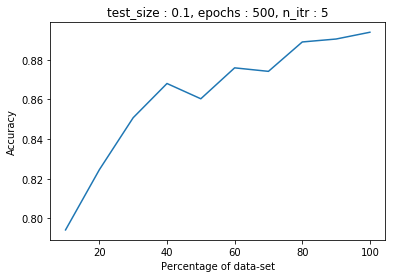

../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.2epochs : 500n_itr : 5.png


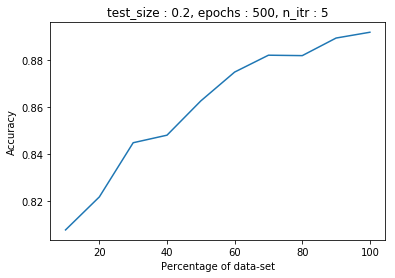

../dataset/bigdata1/result_dnn/graphs_dnn/test_size : 0.3epochs : 500n_itr : 5.png


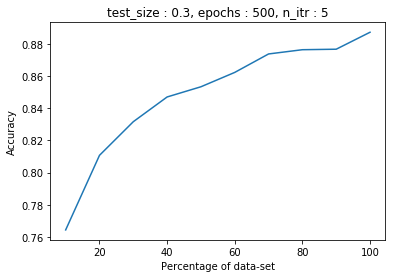

In [36]:
import matplotlib.pyplot as plt
x_axis = [10*i for i in range(1,11)]
title = []
for v in valuesOfTestSize:
    for e in valuesOfEpochs:
        title.append(["test_size : "+str(v),"epochs : " + str(e), "n_itr : " + str(n_itr)])
for i in range(0,len(overAllY)):
    y_axis = overAllY[i]
    plt.plot(x_axis,y_axis)
    plt.xlabel('Percentage of data-set')
    plt.ylabel('Accuracy')
    plt.title(title[i][0]+", "+title[i][1] + ", " + title[i][2])
    filename = "../dataset/bigdata1/result_dnn/graphs_dnn/"+str(title[i][0])+str(title[i][1])+str(title[i][2])+".png"
    print(filename)
    plt.savefig(filename)
    plt.show()

In [37]:
with open("../dataset/bigdata1/result_dnn/dnn_result_5iterations.txt","a+") as f:
    for i in range(0,len(overAllY)):
        line = str(title[i][0])+", "+ str(title[i][1])+", "+str(title[i][2])
        f.write(line+"\r\n")
        f.write(str(overAllY[i])+"\r\n")